# Apply AI Superresolution to video - Train New Network from Video Frames

## Use a perception loss
https://github.com/richzhang/PerceptualSimilarity

 

# Get a video dataset to do better training
- higher resolution than used in research

### super 8 look https://www.youtube.com/watch?v=7Q5UZmwxIXo
- low focus (diffusion and blur - bokah)
- low contrast
- camera is more shakey on home movies
- high depth of field everything is sharp
- 4x3
- film grain
- color changes
- mpeg2 compression noise

### VCR look
- jitter on scan lines - see http://www.avisynth.nl/users/vcmohan/DeJitter/DeJitter.htm
- chroma issues https://forum.videohelp.com/threads/397928-Imrpove-old-video-recorded-by-a-bad-camera?s=0a1230911434e7442d05b6b6cee8e6d2

- jpeg compression artifacts

## use images of related material to train superres
- family photos to train for family videos
- need water and outdoors
- use video samples for video
- use film examples for super8

## Data Augmentation
- sample a few frames from a few places - complete
- different blur levels- complete
- different blur levels in the same image - complete
- convolution with disk - complete
- left-right flip - complete
- contrast and brightness - complete
- random crop - use center crop
- crop to the super8 resolution 720x480 or video 320x240 - complete
- GAN statistics
- predict level of blur with same network to encourage differentiation to that
- input of a filter that detects light reflections to help infer blurring
- try mixup
- use a single shot classifier output as an input

- see this library for blending images https://pypi.org/project/blend-modes/


## Optimization
- Use Adam - complete
- Use optimal learning rate
- freeze layers
- dropout
- use fp16 - pytorch1.6 has a new library for this - complete
- train on low res and increase resolution - does not seem to help in convergence

## losses
- try l1 loss - does not converge
- try perceptive loss vgg18 - complete
- perceptive loss uses 256x256 images - too low res, so use overlapping subsets of image to calc loss
- combine perceptive and mse loss
- calculate mse loss on a smoothed version of output compared to input (which is smoothed) - ensure reversal matches


## do comparisons for standard test sets
- not super useful since they use gaussian blurring, bicubic interpolation
- get very focused images and use as a validation and test set - prefer one thats published


## Results & Analysis
- Fixes - jpeg artifacts were fixed at one level 30 and slope at 0.01 in:
Superresolution train vdsr with multifuz
Superresolution train vdsr with perception loss multifuz

- mse only goes so far.  too strict
- Perceptual loss helps improve it, but input is 256x256 resolution so limited sharpness.
- Perceptual loss tiled (hires) causes too much causes artifacts
- multifuz improves results especially with perceptual loss, handles different fuzziness better

Next experiment
- training may not need to go as long - complete
- set kernel range from 1 to 20 - vs 4-20 need lower range too - complete
- combination of hi res perceptual and mse on smoothed versions of input.- complete
- give more emphasis to mse

Other ideas
- train on cleaner images div8K
- cascade 2 models.  Train first as usual.  Use it to preprocess input to train second model
- apply mix-up
- better model and apply to all 3 colors - tried, but no improvement.
- try vgg perception metric
- focus prediction


RCAN Results
- Uses lots of resources as scale of image increases
- Does not handle different scales well
- not meant for restoration - 
To try
- Apply pretrained model on a patch thats 48x48 then can judge if its worth making an approach to apply repeatedly to larger images.
- train vdsr with a convolutional upscaling up front, attention, residuals.

UNET results
- Some sharpening but not drastic.  Not better than VDSR
- Used 2x GPU mem than VDSR

New Network results
- Performs as well as VDSR qualitatively, need to check.
- using Div2K gives better results (needs low learning rate)
- try with L1 norm (less noise sensitive)
- add upscale in the middle to allow more flexibility - nn.ConvTranspose2d(in_channels=C, out_channels=M, kernel_size=5, stride=2, padding=2, output_padding=1, bias=False)
- add  with torch.no_grad():  to validation and prediction with the model to speed up computations.


To Try
- UNET or VDSR with MAXout nonlinear function.  Try different activation functions (mish,etc).
- consistency error measure like fastai superres
- provide input,target  pairs with no fuzziness in the training set.
- Train exclusively on very sharp  images (DIV2K)
- Predict focus as a segmentation in addition to enhancing
- have 3 channel inputs (RGB or ??) and then have 1 channel output
- provide frame-1,frame,frame+1 to predict frame
- opposite of bottleneck - input resolution -> high res -> input res blocks.
- combo of UNET and VDSR
- attention?
- combo of perception and mse measure
- add validation set
- sort dataset into hard cases and easy cases, making cases harder with time.  (train on easy cases first, then fine tune with harder cases)
- make the camera model version of the data loader
- use mse but give more error to perception
- try reflection padding







## Share results
- put out an example on youtube to allow comparison


# Project Documentation

In [1]:

from pathlib import Path
import os


project_base = "/media/SSD/superres/"
results_folder = "Results"
data_folder = "video_data"
model_folder = "checkpoint"

model_name_base = "NEWCNN6"


## Experiment documentation

In [2]:
%%javascript
var nb = IPython.notebook;
var kernel = IPython.notebook.kernel;
var command = "NOTEBOOK_FULL_PATH = '" + nb.base_url + nb.notebook_path + "'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [3]:
print("NOTEBOOK_FULL_PATH:\n", NOTEBOOK_FULL_PATH)

NOTEBOOK_FULL_PATH:
 /SSD_link/superres/Superresolution train New Network with kernel predictor input v2.ipynb


In [4]:
nb_path = Path(NOTEBOOK_FULL_PATH)
print(nb_path)

# Make result folder if it does not exist
result_path = Path(project_base, results_folder , nb_path.stem )
print(result_path)
os.makedirs(result_path, exist_ok=True)

/SSD_link/superres/Superresolution train New Network with kernel predictor input v2.ipynb
/media/SSD/superres/Results/Superresolution train New Network with kernel predictor input v2


In [5]:
model_out_path=Path(project_base)/model_folder
print(model_out_path)
os.makedirs(model_out_path, exist_ok=True)

/media/SSD/superres/checkpoint


In [6]:
# Tie a result to a set of params.  Tie a set of params to a model.  Tie a model to a notebook.
# register the experiment to get a unique run id
# save all the results in a repository
# use github to do it?

In [7]:

#%reload_ext autoreload
#%autoreload 2
#%matplotlib inline


import cv2 
import numpy as np
import subprocess as sp
import time
from tqdm import tqdm, trange
import torch
from torch.autograd import Variable
import torch.backends.cudnn as cudnn
import torch.nn as nn
import torch.optim as optim

from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

from torchvision.transforms import RandomHorizontalFlip,ColorJitter
from torchvision.transforms import Compose, CenterCrop, ToTensor, Resize, Grayscale,ToPILImage,Normalize

from torchvision.transforms.functional import hflip

import random

import lpips #https://github.com/richzhang/PerceptualSimilarity

In [8]:
import torch.utils.data as data

from os import listdir
from os.path import join
from PIL import Image, ImageFilter
import numpy as np
import torchvision as vision

import numbers

torch.cuda.manual_seed(42)

Create a data loader
- see https://github.com/2KangHo/vdsr_pytorch/blob/master/data.py
- see https://github.com/2KangHo/vdsr_pytorch/blob/master/data_utils.py

In [9]:
import fnmatch

In [10]:
from superres_utils import make_framelist3, load_frame, RescaleCrop, Multifuz, DatasetFromVideoFolder
from superres_utils import show_batch
from superres_utils import pil_disk_blur, display_PSNR, test_results, superres_mp4

In [11]:
#loads 3 frames side by side in an image
def load_frame3(instance):
    
    path = instance["Filepath"]
    
    if instance["Type"] == "frame":
        
        frame = instance["Framenum"]-1
        cap = cv2.VideoCapture(path)
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame-1)
        ret, imgm1 = cap.read()
        if ret==0:
            print("Error with:",instance)
        ret, img = cap.read()
        if ret==0:
            print("Error with:",instance)
        ret, imgp1 = cap.read()
        if ret==0:
            print("Error with:",instance)
            
        im_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        im_m1_rgb = cv2.cvtColor(imgm1, cv2.COLOR_BGR2RGB)
        im_p1_rgb = cv2.cvtColor(imgp1, cv2.COLOR_BGR2RGB)
        return [Image.fromarray(im_rgb), Image.fromarray(im_m1_rgb), Image.fromarray(im_p1_rgb)]
        
    elif instance["Type"] == "image":
        img = cv2.imread(path)
        # convert to PIL RGB
        im_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        return [Image.fromarray(im_rgb),Image.fromarray(im_rgb),Image.fromarray(im_rgb)]

In [12]:
# get a list of all the data
#instances = make_framelist3("/home/filip/SSD_link/superres/DIV2K/DIV2K_train_HR",1)
instances = make_framelist3("/home/filip/SSD_link/superres/video_data/train_data",10)



3
(731, 491) (720, 480)


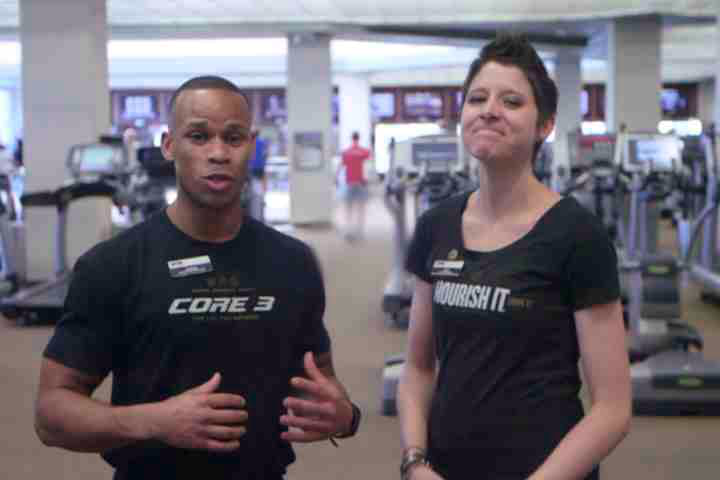

In [13]:
#test the Multifuz transform
im_multiple=load_frame3(instances[100])
print(len(im_multiple))
#im = Grayscale(num_output_channels=1)(im)
im = RescaleCrop(crop_size=(480,720),kernel_width=10)(im_multiple[2])
im_res = Multifuz(crop_size = (480,720),
                  center=(360,240),
                  kernel_a=2, 
                  kernel_b=10,
                  quality=np.int16(22), 
                  slope=.1,
                 radius=50,
                 scale=1)(im)
print(im.size,im_res.size)
type(im_res)
im_res

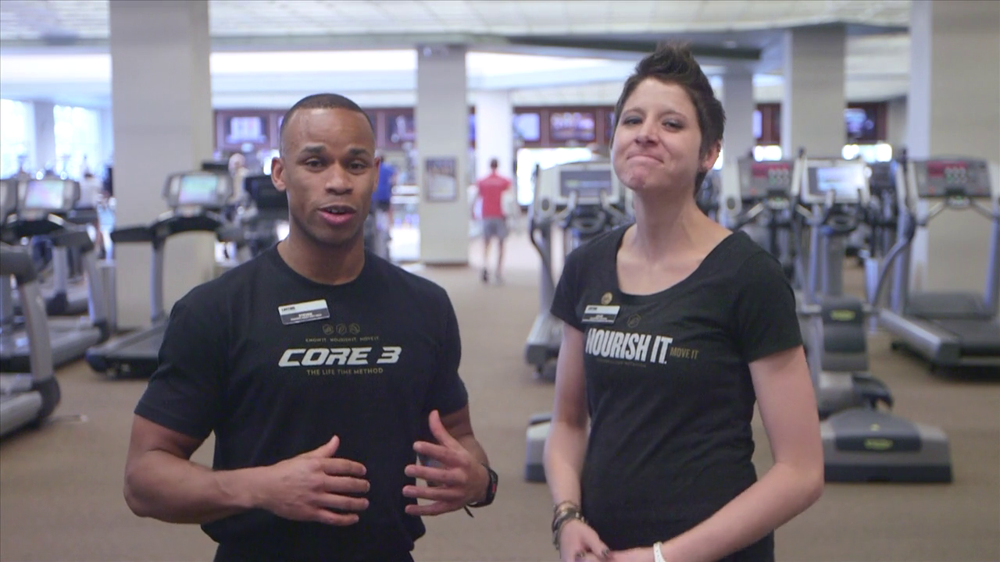

In [14]:
im_multiple[1]

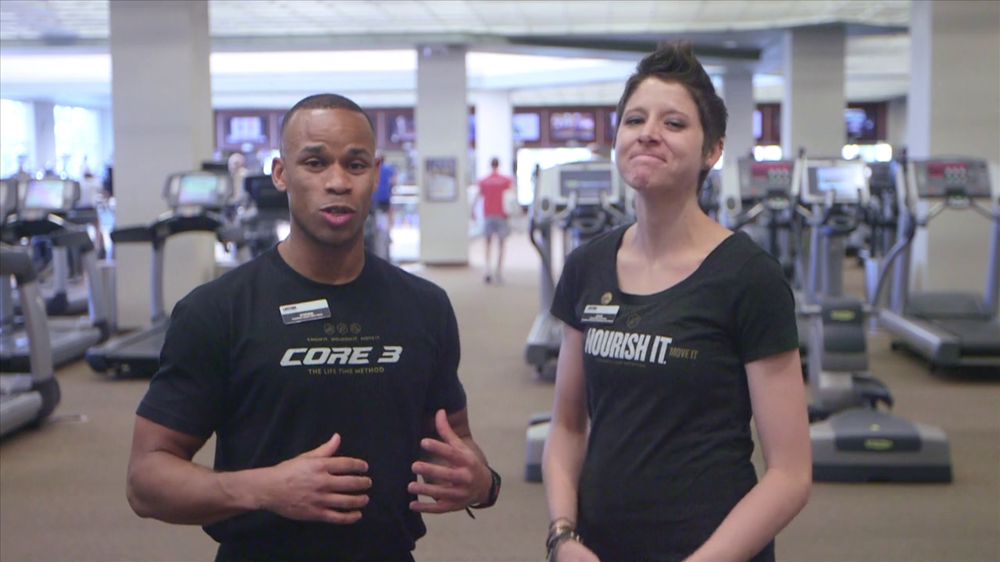

In [15]:
im_multiple[2]

In [16]:
for i,q in enumerate(im_multiple):
    print( q.size)

(1280, 720)
(1280, 720)
(1280, 720)


In [17]:
class DatasetFromVideoFolder3(data.Dataset):
    def __init__(self, video_dir,crop_size,frame_sample_size=10,max_kernel=10,Flip_hor=True,
                 Rand_bright_contrast=True, input_transform =None,target_transform=None, match_exp="*.*", **camera_params):
        
        #  add_noise=None, noise_std=3.0, Flip_hor=False,Rand_bright_contrast=False, kernel_width=10

        super(DatasetFromVideoFolder3, self).__init__()
        self.video_frames = make_framelist3(video_dir,frame_sample_size,match_exp)
        
        self.Flip_hor = Flip_hor
        self.Rand_bright_contrast = Rand_bright_contrast
        self.crop_size = crop_size
        self.max_kernel = max_kernel
        self.target_transform = target_transform
        self.camera_params = camera_params
        self.input_transform = input_transform
        
    def camera_transform(self,img_hr):
        
        # go through the parameters and simulate the camera
        width, height = img_hr.size
               
        crop_top = max(0,int(round((height - self.crop_size[0]) / 2.)))
        crop_bottom = crop_top + self.crop_size[0]
        crop_left = max(0,int(round((width - self.crop_size[1]) / 2.)))
        crop_right = crop_left + self.crop_size[1]
        
        camera_specs = {}
        camera_specs["crop_size"] = np.int16(self.crop_size)
        
        camera_specs["center"] = np.int16((random.uniform(crop_left, crop_right),random.uniform(crop_top, crop_bottom)))
        
        camera_specs["scale"] = np.float32(random.uniform(0.5,2))
       
        
        #camera_specs["kernel_a"] = np.float32(random.uniform(*self.camera_params["kernel_range"]))
        #camera_specs["kernel_b"] = np.float32(random.uniform(*self.camera_params["kernel_range"]))
        
        camera_specs["kernel_a"] = np.int16(random.uniform(*self.camera_params["kernel_range"]))
        camera_specs["kernel_b"] = np.int16(random.uniform(*self.camera_params["kernel_range"]))
        camera_specs["quality"] = np.int16(random.uniform(*self.camera_params["quality_range"]))
        camera_specs["slope"] = np.float32(random.uniform(*self.camera_params["slope_range"]))
        camera_specs["radius"] = np.float32(random.uniform(*self.camera_params["radius_range"])*max(self.crop_size[0],self.crop_size[1]))
        
        #img_lr = Multifuz(**camera_specs)(img_hr)
        #return img_lr, camera_specs
        return camera_specs

    def __getitem__(self, index):
        img_multiple = load_frame3(self.video_frames[index])
        
        flip = random.randint(0,1)
        
        img_lr_list = []
        for i, img in enumerate(img_multiple):
            
            img_n = img
            if self.crop_size is not None:
                img_n = RescaleCrop(self.crop_size,self.max_kernel )(img_n)

            if self.Flip_hor and flip == 1:
                img_n = hflip(img_n)

            if self.Rand_bright_contrast:
                img_n = ColorJitter(brightness=.2, contrast=.2)(img_n)
        
        

            if i == 0 :
                camera_specs = self.camera_transform(img_n)
            # go through the parameters and simulate the camera
            img_lr = Multifuz(**camera_specs)(img_n)
            
        
            if self.input_transform:
                img_lr = self.input_transform(img_lr)

            if i == 0:
                if self.target_transform:
                    img_hr = self.target_transform(img_n)
            img_lr_list.append(img_lr)
            
        #print(camera_specs)
        return img_lr_list, img_hr, camera_specs

    def __len__(self):
        return len(self.video_frames)

In [18]:
def input_transform():        
    return Compose([        
        #Grayscale(num_output_channels=1),
        ToTensor(),
        Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])



def target_transform(crop_size):
    return Compose([
        #Grayscale(num_output_channels=1),
        CenterCrop(crop_size),
        ToTensor(),
    ])


In [19]:
#train_dir = "/home/filip/SSD_link/superres/DIV2K/DIV2K_train_HR"
train_dir = "/home/filip/SSD_link/superres/video_data/train_data"
frame_sample_size =10
batch_size = 4 # Make 4 For FP16, 480x720 size images
crop_size = (480,720)
#crop_size = (256,256)
kernel_range=(1,16)
quality_range=(30,90) 
slope_range=(0.001, 0.1)
radius_range=(0,0)  # make all one fuzziness
scale_range=(1/2,2)
Flip_hor=True
Rand_bright_contrast=False

In [20]:
train_set = DatasetFromVideoFolder3(train_dir,crop_size,frame_sample_size,
                                   input_transform=input_transform(),
                                   target_transform=target_transform(crop_size),
                                   Flip_hor=Flip_hor,
                                   Rand_bright_contrast=Rand_bright_contrast,
                                   kernel_range=kernel_range,
                                   quality_range=quality_range,
                                   slope_range=slope_range,
                                   radius_range=radius_range,
                                   scale_range=scale_range,
                                   max_kernel=10
                            )
training_data_loader = DataLoader(dataset=train_set, num_workers=0, batch_size=batch_size, shuffle=True)

In [21]:
inputs, outputs, camera_specs = next(iter(training_data_loader))

In [22]:
valid_dir = "/home/filip/SSD_link/superres/DIV2K/DIV2K_valid_HR"
#frame_sample_size =10
#batch_size = 4 # Make 4 For FP16, 480x720 size images
#crop_size = (480,720)

kernel_range=(1,16)
quality_range=(30,99) 
slope_range=(0.001, 0.1)
radius_range=(0,0)  # make all one fuzziness
scale_range=(1/2,2)
Flip_hor=False
Rand_bright_contrast=False
match_exp = "*.*"

In [23]:
valid_set = DatasetFromVideoFolder3(valid_dir,crop_size,frame_sample_size,
                                   input_transform=input_transform(),
                                   target_transform=target_transform(crop_size),
                                   Flip_hor=Flip_hor,
                                   Rand_bright_contrast=Rand_bright_contrast,
                                   kernel_range=kernel_range,
                                   quality_range=quality_range,
                                   slope_range=slope_range,
                                   radius_range=radius_range,
                                   scale_range=scale_range,
                                   max_kernel=10,
                                   match_exp=match_exp,
                            )
valid_data_loader = DataLoader(dataset=valid_set, num_workers=0, batch_size=batch_size, shuffle=False)

In [28]:
from superres_utils import variance_of_laplacian

def show_batch(dataloader,size = 8, denormalize = True):

    inputs, outputs, camera_specs = next(iter(dataloader))
    
    if type(inputs) is list:
        columns = len(inputs) + 1
        rows = len(inputs[0])
    else:
        columns = 2
        rows = len(inputs)
        
    print("rows =",rows,"cols=",columns)
         
        
    #print(inputs.shape)
    #inputs = inputs.numpy().transpose((0, 2, 3, 1))
    #outputs = outputs.numpy().transpose((0, 2, 3, 1))
    #print(camera_specs)
    
    mn = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    #inputs = inputs*std + mean
    #outputs = outputs*std + mean
    w,h = columns*size, rows*size
    fig=plt.figure(figsize=(w, h))
    
    ax=[]
    
   
    for i in range(0, rows):
        
        for j in range(0, columns):
            if type(inputs) is list:
                if j< (columns - 1):
                    img = inputs[j][i].numpy().transpose((1,2,0))
                    if denormalize: img = img*std + mn
                else:
                    img = outputs[i].numpy().transpose((1,2,0))
                    
            else:
                if j == 0:
                    img = inputs[i].numpy().transpose((2,3,1))
                    if denormalize: img = img*std + mn
                else:
                    img = outputs[i].numpy().transpose((2,3,1))
                
            blur_measure = variance_of_laplacian((img*255).astype(np.uint8))
            ax.append(fig.add_subplot(rows, columns, rows*i + j +1))
            ax[-1].set_title('Blur: '+str(blur_measure))
            plt.imshow((img*255).astype(np.uint8),cmap='gray')
    plt.show()

rows = 4 cols= 4


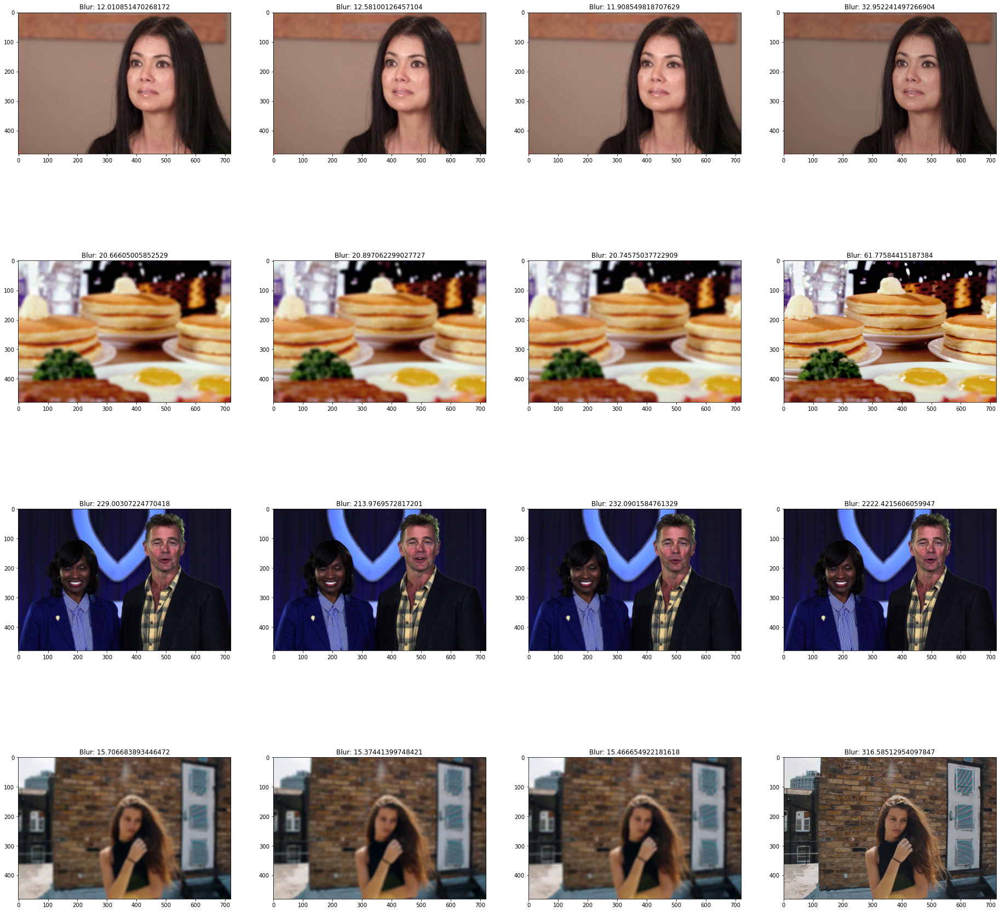

In [119]:
show_batch(training_data_loader,size =8)

rows = 4 cols= 4


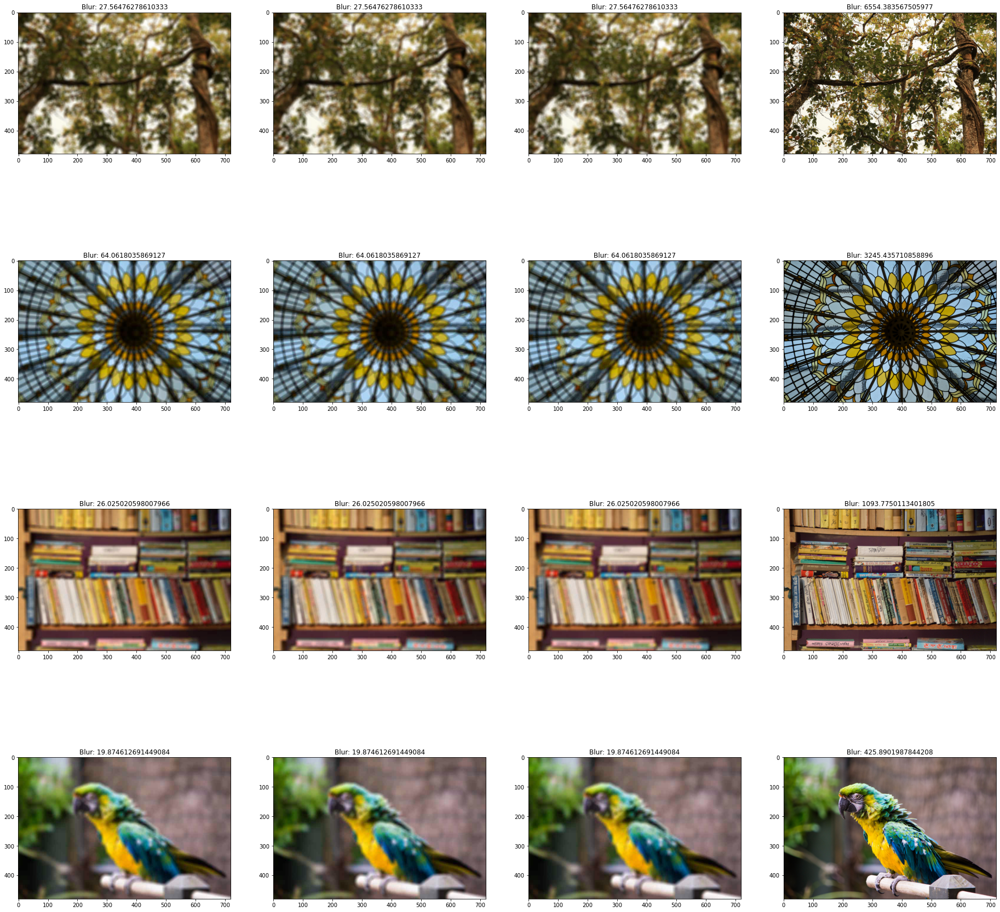

In [120]:
show_batch(valid_data_loader,size =8)

# NEW CNN

In [31]:
import torch.nn as nn

class NEWNet6(nn.Module):
    def __init__(self, c1, c2, c3):
        super(NEWNet6, self).__init__()   
        
        self.p1 = nn.Sequential(
            nn.Conv2d(in_channels=10, out_channels=c1, kernel_size=3, stride=1, padding=1, bias=False),
            nn.PReLU(),
            nn.Conv2d(in_channels=c1, out_channels=c1, kernel_size=3, stride=1, padding=1, bias=True),
            nn.PReLU(),
            nn.Conv2d(in_channels=c1, out_channels=c1, kernel_size=3, stride=1, padding=1, bias=True),
            nn.PReLU()
        )
        
        self.p2 = nn.Sequential(
            nn.Conv2d(in_channels=c1, out_channels=c2, kernel_size=1, stride=1, padding=0, bias=True),
            nn.PReLU(),
            nn.Conv2d(in_channels=c2, out_channels=c2, kernel_size=3, stride=1, padding=1, bias=True),
            nn.PReLU(),
            nn.Conv2d(in_channels=c2, out_channels=c1, kernel_size=1, stride=1, padding=0, bias=True)
        )
        
        

        
        self.prelu = nn.PReLU()
        self.convf = nn.Conv2d(in_channels=c1, out_channels=3, kernel_size=3, stride=1, padding=1, bias=True)
        
                    
        
        
    def forward(self, x0,xm1,xp1, k):    
        
        residual = x0
       
        # add insert k as the 10 channel into x, which has 9 channels
        one_channel = x0[:,0,:,:].unsqueeze(1)  #use one channel as a template
        t1 = torch.ones_like(one_channel.permute(3,2,1,0))  #make a ones tensor like the channel
        res = k[:,0]*t1  # multiply by k, so that the batch spreads to the size of an image
        res = res.permute(3,2,1,0) # put back in proper order
        xk = torch.cat((x0,xm1,xp1,res), dim=1) #append the 10th channel
        
        
        
        
        xk = self.p1(xk)
        skip1 = xk
                        
        xk = self.p2(xk)
        xk = xk.add_(skip1)
        xk = self.prelu(xk)
        xk = self.convf(xk)
        out = torch.add(xk,residual)
        return out

# build the model

In [32]:
#model = NEWNet2(c1=64,c2=128)
model = NEWNet6(c1=64,c2=128, c3=1024)
model.cuda()

NEWNet6(
  (p1): Sequential(
    (0): Conv2d(10, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): PReLU(num_parameters=1)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): PReLU(num_parameters=1)
    (4): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): PReLU(num_parameters=1)
  )
  (p2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1))
    (1): PReLU(num_parameters=1)
    (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): PReLU(num_parameters=1)
    (4): Conv2d(128, 64, kernel_size=(1, 1), stride=(1, 1))
  )
  (prelu): PReLU(num_parameters=1)
  (convf): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
)

In [33]:
num_pixels = crop_size[0] * crop_size[1]

In [34]:
def loss_scaler(im):
    # scale to -1,1 and convert to 3 channel (greyscale to RBG)
    return (im * 2 - 1).expand(-1, 3, -1, -1)

In [35]:
class Pixel_Loss(torch.nn.Module):
    
    def __init__(self,num_pixels):
        super(Pixel_Loss,self).__init__()
        self.lossfn = nn.MSELoss(reduction = 'mean')
        
        self.percep_loss_fn = lpips.LPIPS(net='alex').cuda()


        self.num_pixels = num_pixels
    #def forward(self,x,y):
        
     #   return self.num_pixels*(self.lossfn.forward(x,y))
    
    
    def forward(self,x,y):
        
        totloss = torch.mean(self.percep_loss_fn.forward(loss_scaler(x),loss_scaler(y)))
        #print("perceptual:",totloss)
        
        totloss.add_(50 * self.lossfn.forward(x,y))
        #print("total:",totloss)
        
        return totloss


In [51]:
criterion = Pixel_Loss(num_pixels)
#criterion = nn.L1Loss(reduction = 'mean')
criterionk = nn.MSELoss(reduction = 'mean')


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /media/SSD/conda_env/superres/lib/python3.8/site-packages/lpips/weights/v0.1/alex.pth


In [52]:
init_lr = .001
lr_step = 3
gradient_clip = 0.4
epochs = 21

loops = 1

In [38]:

#optimizer = optim.Adam(model.parameters(), lr=init_lr, weight_decay=1e-4)
optimizer = optim.Adam(model.parameters(), lr=init_lr, weight_decay=0)



In [39]:
scheduler = optim.lr_scheduler.OneCycleLR(optimizer, 
                                          max_lr=0.01,
                                          steps_per_epoch=len(training_data_loader),
                                          epochs=epochs)

In [40]:
def adjust_learning_rate(optimizer, epoch):
    """Sets the learning rate to the initial LR decayed by 10**0.5 every 3 epochs"""
    lr = init_lr * (0.1 ** (.5*(epoch // lr_step)))
    return lr

In [41]:
def save_checkpoint(experiment, model, epoch, valid_error):

    model_out_str = str(model_out_path/(model_name_base+"_epoch_{}.pth")).format(epoch)
    
    state = {"experiment": experiment, "epoch": epoch ,"model": model, "valid_error": valid_error}

    torch.save(state, model_out_str)

    print("Checkpoint saved to {}".format(model_out_str))

In [42]:
kmodel = torch.load("/media/SSD/superres/checkpoint/BLUR_SHUFFLE1_epoch_18.pth")["model"]

In [43]:
kmodel.cuda()
kmodel.eval()

ShuffleNetV2(
  (conv1): Sequential(
    (0): Conv2d(3, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (stage2): Sequential(
    (0): InvertedResidual(
      (branch1): Sequential(
        (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=24, bias=False)
        (1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): Conv2d(24, 24, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (3): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (4): ReLU(inplace=True)
      )
      (branch2): Sequential(
        (0): Conv2d(24, 24, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_

In [44]:
import datetime
from torch.cuda.amp import autocast
from torch.cuda.amp import GradScaler
#import kornia


In [45]:
from torch.optim.swa_utils import AveragedModel
swa_model = torch.optim.swa_utils.AveragedModel(model)

In [46]:
def trainfp16(training_data_loader, optimizer, scheduler, model,  kmodel, epoch,scaler, loops):
    dt = str(datetime.datetime.now())
    print("Start Time:", dt)
    
    lr = adjust_learning_rate(optimizer, epoch-1)

    for param_group in optimizer.param_groups:
        param_group["lr"] = lr

    print("Epoch = {}, lr = {}".format(epoch, optimizer.param_groups[0]["lr"]))

    model.train()
    
    cum_loss = 0
    ct=0  ##need to use a different variable.
    ct2=0

    pbar = tqdm(total=loops*len(training_data_loader))
    for loop_count in range(loops):  
        for iteration, batch in enumerate(training_data_loader, 1):
            inpt_list, target, camera_specs = batch[0], batch[1], batch[2]
            
            in0 = inpt_list[0].cuda()
            inm1 = inpt_list[1].cuda()
            inp1 = inpt_list[2].cuda()
            

            target = target.cuda()
            
            with torch.no_grad():
                with autocast():
                    k_pred = kmodel(in0)
            
            
            #k_target = (camera_specs["kernel_a"].float()).cuda()

            optimizer.zero_grad()

            # Runs the forward pass with autocasting.
            with autocast():
                output = model(in0,inm1,inp1,k_pred)
                loss = criterion(output, target)


            
            scaler.scale(loss).backward()
            #loss.backward() 

            # Unscales the gradients of optimizer's assigned params in-place
            #scaler.unscale_(optimizer)

            #nn.utils.clip_grad_norm_(model.parameters(),gradient_clip) 

            #optimizer.step()
            scaler.step(optimizer)

            if epoch>1:
                swa_model.update_parameters(model)

            # Updates the scale for next iteration.
            scaler.update()

            #scheduler.step()

            cum_loss = cum_loss + loss.data


            ct = ct +1 



            pbar.update(1)
    pbar.close()    
   
    print("Epoch Loss:", cum_loss/ct)        

In [47]:
def validatefp16(valid_data_loader, model, kmodel,  loop=10):

    model.eval()
    cum_loss2=0
    cum_loss1 = 0
    ct=0 
    
    with torch.no_grad():
        for r in trange(loop):
            for iteration, batch in enumerate(valid_data_loader, 1):
                inpt_list, target, camera_specs = batch[0], batch[1], batch[2]

                in0 = inpt_list[0].cuda()
                inm1 = inpt_list[1].cuda()
                inp1 = inpt_list[2].cuda()
                

                target = target.cuda()
                
                
                with autocast():
                    k_pred = kmodel(in0)
                
                k_target = (camera_specs["kernel_a"].float()).cuda()
                
                # Runs the forward pass with autocasting.
                with autocast():
                    output = model(in0, inm1, inp1,k_pred)
                    loss1 = criterion(output, target)
                    loss2 = criterionk(k_pred[:,0],k_target)

                #print(k_pred[:,0].shape, k_target.shape)
               
                cum_loss1 = cum_loss1 + loss1.data
                cum_loss2 = cum_loss2 + loss2.data

                ct = ct + 1 ## Used to be batch_size





        print("===> Epoch Validation Loss: {:.10f} , kernel pred RMSE {:.10f}".format(cum_loss1/ct,(cum_loss2/ct)**(.5)) )
    
    return (cum_loss1/ct).item()

In [48]:
#model = torch.load("/media/SSD/superres/checkpoint/NEWCNN3_epoch_54.pth")["model"]

In [49]:
#validatefp16(valid_data_loader, model, criterion, loop=1)

f1 = "/media/SSD/superres/checkpoint/NEWCNN_epoch_"
f3 = ".pth"
lst =[]
for i in range(1,13):
    model = torch.load(f1+str(i)+f3)["model"]
    lst.append(validatefp16(valid_data_loader, model, criterion, loop=10))
    print(lst)
    
    

In [53]:
# Creates a GradScaler once at the beginning of training for mixed precision
scaler = GradScaler()


for epoch in range(1, epochs+1):
        trainfp16(training_data_loader, optimizer, scheduler, model, kmodel, epoch,scaler,loops)
        valid_error = validatefp16(valid_data_loader, model,kmodel,loop=10)
        save_checkpoint(NOTEBOOK_FULL_PATH, model, epoch, valid_error)

  0%|          | 0/1586 [00:00<?, ?it/s]

Start Time: 2020-11-18 18:22:33.807596
Epoch = 1, lr = 0.001


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.8130, device='cuda:0', dtype=torch.float16)


  0%|          | 0/1586 [00:00<?, ?it/s]

===> Epoch Validation Loss: 1.1552734375 , kernel pred RMSE 0.7388651371
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN6_epoch_1.pth
Start Time: 2020-11-18 18:53:10.563140
Epoch = 2, lr = 0.001


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.7598, device='cuda:0', dtype=torch.float16)


  0%|          | 0/1586 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.8505859375 , kernel pred RMSE 0.7181224823
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN6_epoch_2.pth
Start Time: 2020-11-18 19:21:57.820908
Epoch = 3, lr = 0.001


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.6714, device='cuda:0', dtype=torch.float16)


  0%|          | 0/1586 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.7128906250 , kernel pred RMSE 0.7514333725
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN6_epoch_3.pth
Start Time: 2020-11-18 19:50:43.220145
Epoch = 4, lr = 0.00031622776601683794


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.4958, device='cuda:0', dtype=torch.float16)


  0%|          | 0/1586 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.6342773438 , kernel pred RMSE 0.7541474104
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN6_epoch_4.pth
Start Time: 2020-11-18 20:19:32.589207
Epoch = 5, lr = 0.00031622776601683794


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.4924, device='cuda:0', dtype=torch.float16)


  0%|          | 0/1586 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.7231445312 , kernel pred RMSE 0.7488577962
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN6_epoch_5.pth
Start Time: 2020-11-18 20:48:18.100242
Epoch = 6, lr = 0.00031622776601683794


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.4844, device='cuda:0', dtype=torch.float16)


  0%|          | 0/1586 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.7636718750 , kernel pred RMSE 0.7430258393
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN6_epoch_6.pth
Start Time: 2020-11-18 21:17:03.728800
Epoch = 7, lr = 0.0001


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.4353, device='cuda:0', dtype=torch.float16)


  0%|          | 0/1586 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.6005859375 , kernel pred RMSE 0.7593116164
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN6_epoch_7.pth
Start Time: 2020-11-18 21:45:50.667758
Epoch = 8, lr = 0.0001


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.4292, device='cuda:0', dtype=torch.float16)


  0%|          | 0/1586 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.5917968750 , kernel pred RMSE 0.6995754838
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN6_epoch_8.pth
Start Time: 2020-11-18 22:14:37.043190
Epoch = 9, lr = 0.0001


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.4246, device='cuda:0', dtype=torch.float16)


  0%|          | 0/1586 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.6142578125 , kernel pred RMSE 0.7145229578
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN6_epoch_9.pth
Start Time: 2020-11-18 22:43:16.938277
Epoch = 10, lr = 3.16227766016838e-05


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.3994, device='cuda:0', dtype=torch.float16)


  0%|          | 0/1586 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.5654296875 , kernel pred RMSE 0.7128410339
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN6_epoch_10.pth
Start Time: 2020-11-18 23:12:07.254100
Epoch = 11, lr = 3.16227766016838e-05


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.3999, device='cuda:0', dtype=torch.float16)


  0%|          | 0/1586 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.5844726562 , kernel pred RMSE 0.7236738205
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN6_epoch_11.pth
Start Time: 2020-11-18 23:40:51.087265
Epoch = 12, lr = 3.16227766016838e-05


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.3972, device='cuda:0', dtype=torch.float16)


  0%|          | 0/1586 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.5864257812 , kernel pred RMSE 0.7330163121
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN6_epoch_12.pth
Start Time: 2020-11-19 00:09:37.450948
Epoch = 13, lr = 1.0000000000000003e-05


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.3987, device='cuda:0', dtype=torch.float16)


  0%|          | 0/1586 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.5712890625 , kernel pred RMSE 0.7456082106
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN6_epoch_13.pth
Start Time: 2020-11-19 00:38:23.941410
Epoch = 14, lr = 1.0000000000000003e-05


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.3906, device='cuda:0', dtype=torch.float16)


  0%|          | 0/1586 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.5913085938 , kernel pred RMSE 0.7257818580
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN6_epoch_14.pth
Start Time: 2020-11-19 01:07:10.581010
Epoch = 15, lr = 1.0000000000000003e-05


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.3914, device='cuda:0', dtype=torch.float16)


  0%|          | 0/1586 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.5712890625 , kernel pred RMSE 0.7468141317
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN6_epoch_15.pth
Start Time: 2020-11-19 01:35:57.636460
Epoch = 16, lr = 3.16227766016838e-06


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.3896, device='cuda:0', dtype=torch.float16)


  0%|          | 0/1586 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.5805664062 , kernel pred RMSE 0.7275963426
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN6_epoch_16.pth
Start Time: 2020-11-19 02:04:44.916788
Epoch = 17, lr = 3.16227766016838e-06


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.3918, device='cuda:0', dtype=torch.float16)


  0%|          | 0/1586 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.5717773438 , kernel pred RMSE 0.7403261065
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN6_epoch_17.pth
Start Time: 2020-11-19 02:35:44.549691
Epoch = 18, lr = 3.16227766016838e-06


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.3870, device='cuda:0', dtype=torch.float16)


  0%|          | 0/1586 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.5805664062 , kernel pred RMSE 0.7116685510
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN6_epoch_18.pth
Start Time: 2020-11-19 03:04:31.874596
Epoch = 19, lr = 1.0000000000000002e-06


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.3911, device='cuda:0', dtype=torch.float16)


  0%|          | 0/1586 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.5683593750 , kernel pred RMSE 0.7405343056
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN6_epoch_19.pth
Start Time: 2020-11-19 03:33:15.658171
Epoch = 20, lr = 1.0000000000000002e-06


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.3928, device='cuda:0', dtype=torch.float16)


  0%|          | 0/1586 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.5668945312 , kernel pred RMSE 0.7564449310
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN6_epoch_20.pth
Start Time: 2020-11-19 04:02:03.321888
Epoch = 21, lr = 1.0000000000000002e-06


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.3955, device='cuda:0', dtype=torch.float16)


100%|██████████| 10/10 [03:34<00:00, 21.45s/it]

===> Epoch Validation Loss: 0.5747070312 , kernel pred RMSE 0.7537320852
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN6_epoch_21.pth


Function that takes in a .mp4 video file and applies intrinsic matrix and distortion coefficients to undistort a video.  It also preserves the sound. it uses ffmpeg for some processing as well as opencv cv2 library.

In [62]:
def predict(inpt_list, target, camera_specs, model, kmodel, criterion,criterionk ):
    

    model.eval()
    kmodel.eval()
    in0 = inpt_list[0].cuda()
    inm1 = inpt_list[1].cuda()
    inp1 = inpt_list[2].cuda()


    target = target.cuda()

    with torch.no_grad():
        with autocast():
            k_pred = kmodel(in0)

    k_target = (camera_specs["kernel_a"].float()).cuda()

    # Runs the forward pass with autocasting.
    with torch.no_grad():
        with autocast():
            output = model(in0, inm1, inp1,k_pred)
            loss1 = criterion(output, target)
            loss2 = criterionk(k_pred[:,0],k_target)
        
    return output


In [125]:
iter_data = iter(valid_data_loader)

In [133]:
inputs, outputs, camera_specs = next(iter_data)

In [134]:
ot = predict(inputs, outputs, camera_specs, model, kmodel, criterion,criterionk )

In [135]:
ot.shape

torch.Size([4, 3, 480, 720])

In [136]:
#model = torch.load("/media/SSD/superres/checkpoint/NEWCNN4_epoch_54.pth")["model"]

In [137]:
def sb(batin,batout, size=8):

    
    outputs = batout.cpu().numpy().transpose((0, 2, 3, 1))
    inputs = batin.cpu().numpy().transpose((0, 2, 3, 1))
    
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inputs = inputs*std + mean
    
    outputs = (outputs*255.0).clip(0,255)
    inputs = (inputs*255.0).clip(0,255)
    
    fig=plt.figure(figsize=(2*size, 4*size))
    rows = outputs.shape[0]
    columns = 2
    ax=[]
    for i in range(0, rows):
        ax.append(fig.add_subplot(rows, columns, 2*i+1))
        plt.imshow((inputs[i]).astype(np.uint8),cmap='gray')
        ax.append(fig.add_subplot(rows, columns, 2*i+2))
        plt.imshow((outputs[i]).astype(np.uint8),cmap='gray')
    plt.show()
    
   
    
   

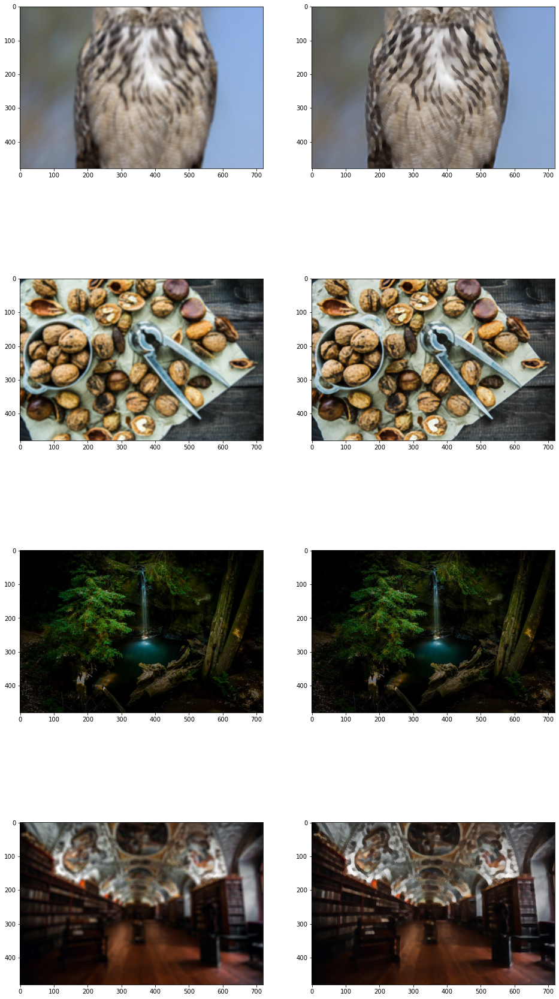

In [138]:
sb(inputs[0],ot,size=8)

In [139]:
class Combine_Nets(nn.Module):
    def __init__(self, model, kmodel):
        super(Combine_Nets, self).__init__()   
        
        
        self.model = model
        self.kmodel = kmodel
        
        

    def forward(self, x0, xm1, xp1):    
        
       
        k = self.kmodel(x0)
        x = self.model(x0, xm1, xp1,k)
        
        return x,k

In [140]:
mcombine = Combine_Nets(model,kmodel)

In [141]:
def cv2_to_batch_tensor(img_bgr):
    mn=np.array([0.485, 0.456, 0.406])
    std=np.array([0.229, 0.224, 0.225])
    im_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    im_rgb = im_rgb/255.0
    im_rgb = (im_rgb-mn)/std
    tform = im_rgb.transpose(( 2,0, 1))
    tform = torch.from_numpy(tform).float()
    tform = tform.unsqueeze(0)
    return tform

In [142]:
def batch_tensor_to_cv2(bt_3ch):
    bt_3ch = (bt_3ch*255.0).clamp(0,255)
    t_3ch = bt_3ch.squeeze(0)
    #t_3ch = t_3ch.cpu()
    im_rbg = t_3ch.permute(1,2,0).numpy().astype(np.uint8)
    im_bgr = cv2.cvtColor(im_rbg, cv2.COLOR_RGB2BGR)
    
    return im_bgr

In [ ]:
# test
img_cv = cv2.imread("/home/filip/Pictures/Screenshot from super8_best_from_mp2.mp4.png")

t = cv2_to_batch_tensor(img_bgr=img_cv)
print(t.shape)
img_cv2 = batch_tensor_to_cv2(bt_3ch=t)



In [ ]:
plt.imshow(cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB))

In [ ]:
plt.imshow(cv2.cvtColor(img_cv2, cv2.COLOR_BGR2RGB))

In [ ]:
#test2
#t = torch.rand(1,3,1,1)
inputs, outputs, camera_specs = next(iter(training_data_loader))

t=outputs[0].unsqueeze(0)
img_cv = batch_tensor_to_cv2(bt_3ch=t)
t2 = cv2_to_batch_tensor(img_bgr=img_cv)
plt.imshow(cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB))

In [ ]:
img = Image.open("/home/filip/Pictures/Screenshot from super8_best_from_mp2.mp4.png").convert("RGB")

In [ ]:
img = cv2.imread("/home/filip/Pictures/Screenshot from super8_best_from_mp2.mp4.png")
    # convert to PIL RGB
im_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

#Image.fromarray(im_rgb)
im_input = im_rgb/255.0

In [ ]:
#im_input = np.array(img)/255.0
im_input.shape

In [ ]:
mn=np.array([0.485, 0.456, 0.406])
std=np.array([0.229, 0.224, 0.225])
im_input = (im_input-mn)/std

In [ ]:
tform = im_input.transpose(( 2,0, 1))
tform.shape

In [ ]:
tform = torch.from_numpy(tform).float()
tform.shape

In [ ]:
inputs = tform.unsqueeze(0)
inputs.shape

In [ ]:
#test
img_cv = cv2.imread("/media/SSD/superres/Screenshot from snip.mp4.png")
inputs = cv2_to_batch_tensor(img_bgr=img_cv)
inputs = inputs.cuda()

            
with torch.no_grad():
    with autocast():
        out = mcombine(inputs)
im_out = batch_tensor_to_cv2(out[0].cpu())
plt.imshow(cv2.cvtColor(im_out, cv2.COLOR_BGR2RGB))

In [ ]:
sb(inputs.cpu(),out[0].cpu())

In [ ]:
import math
# Here is the function for PSNR calculation
def PSNR(pred, gt, shave_border=0):
    height, width = pred.shape[:2]
    pred = pred[shave_border:height - shave_border, shave_border:width - shave_border]
    gt = gt[shave_border:height - shave_border, shave_border:width - shave_border]
    imdff = pred - gt
    rmse = math.sqrt(np.mean(imdff ** 2))
    if rmse == 0:
        return 100
    return 20 * math.log10(255.0 / rmse)

In [ ]:
from superres_utils import PSNR, decolorize, variance_of_laplacian, is_image_file

def display_PSNR(im_gt, im_b, im_in, model, channels=1, display=True, k_scale = 1.0):
    
    model.eval()
    
    #mn=np.array([0.485, 0.456, 0.406])
    #std=np.array([0.229, 0.224, 0.225])
    

    # Convert the images into YCbCr mode and extraction the Y channel (for PSNR calculation)
    im_gt_ycbcr = np.array(im_gt.convert("YCbCr"))
    im_b_ycbcr = np.array(im_b.convert("YCbCr"))
    im_in_ycbcr = np.array(im_in.convert("YCbCr"))
    
    im_gt_y = im_gt_ycbcr[:,:,0].astype(float)
    im_b_y = im_b_ycbcr[:,:,0].astype(float)
    im_in_y = im_in_ycbcr[:,:,0].astype(float)
    
    #psnr_bicubic = PSNR(im_gt_y, im_b_y)
    #psnr_input = PSNR(im_gt_y, im_in_y)
    psnr_bicubic = PSNR(np.array(im_gt),np.array( im_b))
    psnr_input = PSNR(np.array(im_gt), np.array(im_in))
    
    im_i_ycbcr = np.array(im_in.convert("YCbCr"))
    im_i_y = im_i_ycbcr[:,:,0].astype(float)
        
    # Prepare for the input, a pytorch tensor
    if channels == 1:
        im_input = im_i_y/255.
        im_input = Variable(torch.from_numpy(im_input).float()).\
        view(1, -1, im_input.shape[0], im_input.shape[1])
    
    if channels ==3:
        im_input = cv2_to_batch_tensor(img_bgr=np.array(im_in))
        
    print("im_input.shape=",im_input.shape)    
    im_input = im_input.cuda()
    
    with torch.no_grad():
        with autocast():
            mout = model(im_input)
    
    #sb(im_input.cpu(),mout[0].cpu())
    
    if len(mout)>1:
        out = mout[0]
        k=mout[1].item()*k_scale
    else:
        out = mout
        k=None
        
        
    
    
    if channels == 1:
        out = (out*255.0).clamp(0,255)
    
        out = out.cpu()
        im_y = out.data[0].numpy().astype(np.float32)
        im_h_y = im_y[0,:,:]
        im_h = np.array(colorize(im_h_y, im_b_ycbcr))

    elif channels ==3:
        #print("out=",out.shape)
        #print("out.data=",out.data.shape)
        #print("im_input.shape=",im_input.shape)
        #im_h = out[0].data.view(im_input.shape[2], im_input.shape[3],3).numpy().astype(np.uint8)
        im_h = batch_tensor_to_cv2(out.cpu())
        #print("im.h.shape=",im_h.shape)
        im_h_y, _ = decolorize(im_h)
        
    
    # Calculate the PNSR for prediction
    #psnr_predicted = PSNR(im_gt_y, im_h_y)
    psnr_predicted = PSNR(np.array(im_gt), np.array(im_h))
    
    
    # Calculate the PNSR different between bicubic interpolation and vdsr prediction
    
    
    
    blur_measure_gt = variance_of_laplacian((im_gt_y).astype(np.uint8))
    blur_measure_bicubic = variance_of_laplacian((im_b_y).astype(np.uint8))
    blur_measure_input = variance_of_laplacian((im_i_y).astype(np.uint8))
    blur_measure_vdsr = variance_of_laplacian((im_h_y).astype(np.uint8))
    
    #percept_loss_input = percept_loss.forward(ToTensor()(im_gt),ToTensor()(im_in))
    #percept_loss_bicubic = percept_loss.forward(ToTensor()(im_gt),ToTensor()(im_b))
    #percept_loss_predict = percept_loss.forward(ToTensor()(im_gt),ToTensor()(im_h))
    
    # Colorize the grey-level image and convert into RGB mode

    im_gt = Image.fromarray(im_gt_ycbcr, "YCbCr").convert("RGB")
    im_b = Image.fromarray(im_b_ycbcr, "YCbCr").convert("RGB")
    
    if display:
    
        print('psnr for bicubic is {}dB'.format(psnr_bicubic))
        print('psnr for input is {}dB'.format(psnr_input))
        
        print('psnr for Model is {}dB'.format(psnr_predicted))
        print("PSNR improvement is {}dB".format(psnr_predicted - psnr_input))

        print("Sharpness Measurement GroundTruth:",blur_measure_gt)
        print("Sharpness Measurement Bicubic:",blur_measure_bicubic)
        print("Sharpness Measurement Input:",blur_measure_input)
        print("Sharpness Measurement Model:",blur_measure_vdsr)
        print("Estimate of kernel:", k)
        
        #print('perception loss for bicubic is {}'.format(percept_loss_bicubic))
        #print('perception loss for input is {}'.format(percept_loss_input))
        
        #print('perception loss for Model is {}'.format(percept_loss_predict))

        # Result visualization
        fig = plt.figure(figsize=(18, 16), dpi= 80)
        ax = plt.subplot(151)
        ax.imshow(im_gt)
        ax.set_title("GT")

        ax = plt.subplot(152)
        ax.imshow(im_b)
        ax.set_title("Bicubic")

        ax = plt.subplot(153)
        ax.imshow(im_in)
        ax.set_title("Input")

        ax = plt.subplot(154)
        ax.imshow(im_h)
        ax.set_title("Output(Model)")
        
        
        ax = plt.subplot(155)
        ax.imshow(np.clip(im_h-im_in +128,0,255))
        ax.set_title("Model-Input")
        plt.show()
    
    
    
    return k, psnr_predicted , blur_measure_input

In [ ]:
# Load the groundtruth image and the low-resolution image (downscaled with a factor of 4)
im_gt = Image.open("/media/SSD/superres/pytorch-vdsr/Set5/butterfly_GT.bmp").convert("RGB")
im_b = Image.open("/media/SSD/superres/pytorch-vdsr/Set5/butterfly_GT_scale_4.bmp").convert("RGB")



im_b2 = pil_disk_blur(im_gt,6)


In [ ]:
im_b = Image.open("/home/filip/Pictures/Screenshot from super8_best_from_mp2.mp4.png").convert("RGB")

display_PSNR(im_b, im_b, im_b, mcombine, channels=3)

In [ ]:
display_PSNR(im_gt, im_b, im_b2, mcombine, channels=3)


In [ ]:
from jupyterplot import ProgressPlot


In [ ]:
im_gt = Image.open("/media/SSD/superres/pytorch-vdsr/Set5/baby_GT.bmp").convert("RGB")
im_b = Image.open("/media/SSD/superres/pytorch-vdsr/Set5/baby_GT_scale_4.bmp").convert("RGB")
im_gt2 = Image.open("/media/SSD/superres/pytorch-vdsr/Set5/head_GT.bmp").convert("RGB")
im_b2 = Image.open("/media/SSD/superres/pytorch-vdsr/Set5/head_GT_scale_4.bmp").convert("RGB")

In [ ]:
pp = ProgressPlot(x_iterator=False,
                  x_label="k_act",
                  x_lim=[2, 16],
                  y_lim=[[0, 16],[28,35.0],[0,50]],
                  plot_names=["kernel",'PSNR','blurryness'],
                  line_names=["pred1","pred2"])
k_act = []
k_pred = []
for k in range(2,16):
    
    kp1, err1, sharpness1 = display_PSNR(im_gt, im_b, pil_disk_blur(im_gt,k), mcombine, channels=3, display = False)
    kp2, err2, sharpness2 = display_PSNR(im_gt2, im_b2, pil_disk_blur(im_gt2,k), mcombine, channels=3, display = False)
    #k_act.append(k)
    #k_pred.append(display_PSNR(im_gt, im_b, pil_disk_blur(im_gt,k), model, channels=1, display = False))
    pp.update(k,[[kp1,kp2],[err1,err2],[100/sharpness1,100/sharpness2]])
    print(k, kp1, err1,100/sharpness1)
pp.finalize()    

In [ ]:
from superres_utils import is_image_file
# Make this load still photos too, and have them added with frame = 0
def test_results(test_dir,scale, model, channels=1, display = False):
    instances = []
    psnr_bicubic_sum = 0
    psnr_model_sum = 0
    ct = 0
    
    for filename in listdir(test_dir):
        filepath = os.path.join(test_dir,filename)
        #print(filepath)
                
        if is_image_file(filepath):
            im_gt = Image.open(filepath).convert("RGB")
            #print(im_gt.size)
            
            (height, width) = im_gt.size
            im_b = im_gt.resize((int(2*height/scale), int(2*width/scale)), resample = Image.BICUBIC)
            im_b = im_b.resize((height,width), resample = Image.BICUBIC)
            im_b2 = pil_disk_blur(im_gt,scale)
            
            im_h, psnr_bicubic, psnr_predicted = display_PSNR(im_gt, im_b, im_b2, model, channels=channels, display = display)
            psnr_bicubic_sum = psnr_bicubic_sum + psnr_bicubic
            psnr_model_sum = psnr_model_sum + psnr_predicted
            ct = ct +1
            #item = {"Filepath":filepath, "Type":"image"}
            #instances.append(item)
        
    psnr_bicubic_avg = psnr_bicubic_sum / ct
    psnr_model_avg = psnr_model_sum / ct
        
    print("Bicubic average PSNR =",psnr_bicubic_avg)
    print("Model average PSNR =",psnr_model_avg)
    return 


In [ ]:
test_results("/media/SSD/superres/video_data/test_data/Set5", 10, mcombine, channels = 3,display = True)

# convert sample videos

In [148]:
from superres_utils import decolorize_cv, colorize_cv, cv_center_crop

from torch.cuda.amp import autocast
def superres_mp4_3(infile, outfile, model,channels=3, factor=1.0,display=True,
                 bitrate= "12000k",errorfile = None, k_scale = 1, center_crop = None, bar_chart = True):
    
    mn=np.array([0.485, 0.456, 0.406])
    std=np.array([0.229, 0.224, 0.225])
    
    circ_buffer=[0,0,0]
    circ_ind = 0
    circ_count = 0
    
    model = model.cuda()
    #torch.set_grad_enabled(False)
    model.eval()
    
    cap = cv2.VideoCapture(str(infile))
    length = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    fps    = cap.get(cv2.CAP_PROP_FPS)
    
    if center_crop is None:
        width  = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        
    else:
        width,height = center_crop
    
    
    success_flag = False
    
    print("Original File:", str(infile))
    print("frames=",length,"\nwidth=",width,"\nheight=",height,"\nfps=",fps)
    
    

    new_height = int(height*factor)
    new_width = int(width*factor)
    
    print("\nProcess File:", str(outfile))
    print("factor:",factor,"\nwidth=",new_width, "\nheight=",new_height,"\nbitrate=",bitrate)
    
    

    dimension = '{}x{}'.format(new_width, new_height)  #ffmpeg uses bicubic as default scaling alg
    f_format = 'bgr24' # remember OpenCV uses bgr format




    command = ['ffmpeg',
            '-y',
            '-f', 'rawvideo',
            '-vcodec','rawvideo',
            '-s', dimension,
            '-pix_fmt', 'bgr24',
            '-r', str(fps),
            '-i', '-',
            '-i', str(infile),
            '-c:v', 'h264',
            '-c:a', 'aac',

            '-map','0:v:0',
            '-map','1:a:0',
            '-shortest',
            '-b:v', bitrate, 
            str(outfile) ]


    if errorfile is not None:
        ef = open(errorfile,"w+")
        p = sp.Popen(command, stdin=sp.PIPE, stderr=ef)
    else:
        p = sp.Popen(command, stdin=sp.PIPE)

    # Full processing with a stream instead of a temp file for video
    k_preds = []
    pbar = tqdm(total=length)
    while(cap.isOpened()):




        # Capture frame-by-frame
        ret, frame = cap.read()
        if ret == True:
            
            #crop frame if needed
            if center_crop is not None:
                frame = cv_center_crop(frame,(height,width))
            
            if (factor != 1.0):
                frame = cv2.resize(frame, (new_width, new_height), interpolation=cv2.INTER_LANCZOS4)
            
            im_input = cv2_to_batch_tensor(frame)


            im_input = im_input.cuda()
            
            circ_buffer[circ_ind] = im_input
            circ_ind = (circ_ind + 1) % 3
            circ_count = circ_count + 1
            
            #Special Case for first frame
            if circ_count == 2:
                xm1 = circ_buffer[(circ_ind - 2) % 3]
                x0 = circ_buffer[(circ_ind - 1) % 3]
                xp1 = x0
                
            if circ_count > 2:

                xm1 = circ_buffer[(circ_ind - 3) % 3]
                x0 = circ_buffer[(circ_ind - 2) % 3]
                xp1 = circ_buffer[(circ_ind - 1) % 3]
             
            if circ_count > 1:
                
                with torch.no_grad():
                    with autocast():
                        mout = model(x0, xm1, xp1)  

                
                out=mout[0].cpu()



                im_h = batch_tensor_to_cv2(out)


                #Add notation and crude bar chart to video frame

                if bar_chart:
                    cv2.putText(im_h, text='k={:.2f}'.format(k_scale*mout[1].item()), org=(new_width-70,new_height-50),
                    fontFace= cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.5, color=(0,0,255),
                    thickness=1, lineType=cv2.LINE_AA)

                    cv2.putText(im_h, text='_', org=(new_width-5,new_height - int(new_height*mout[1].item()/17)),
                    fontFace= cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.5, color=(0,0,255),
                    thickness=2, lineType=cv2.LINE_AA)


                p.stdin.write(im_h.tobytes())


                if display:
                    cv2.imshow('Processed',im_h)
                    time.sleep(10)
                    #cv2.imshow('Orig',frame)
                pbar.update(1)
                # Press Q on keyboard to  exit
                if cv2.waitKey(25) & 0xFF == ord('q'):
                    success_flag = False
                    break
        # Break the loop
        else:
            
            # Add special case for last frame here otherwise last frame is lost
            success_flag = True
            break
    # When everything done, release the video capture object

    pbar.close()

    p.stdin.close()
    p.wait()

    cap.release()

    # Closes all the frames
    cv2.destroyAllWindows()
    
    return success_flag

In [149]:
result_path

PosixPath('/media/SSD/superres/Results/Superresolution train New Network with kernel predictor input v2')

In [150]:


infile = "/media/SSD/superres/muffins30sec.mp4"
outfile = result_path/"muffins30sec-16.mp4"
superres_mp4_3(infile, outfile, mcombine,channels=3, factor=1.6,display=False,bitrate= "4000k")


  0%|          | 1/900 [00:00<02:01,  7.41it/s]

Original File: /media/SSD/superres/muffins30sec.mp4
frames= 900 
width= 320 
height= 240 
fps= 30.0

Process File: /media/SSD/superres/Results/Superresolution train New Network with kernel predictor input v2/muffins30sec-16.mp4
factor: 1.6 
width= 512 
height= 384 
bitrate= 4000k



 35%|███▍      | 311/900 [00:27<00:49, 11.79it/s]


 69%|██████▉   | 619/900 [00:53<00:23, 11.92it/s]


100%|█████████▉| 899/900 [01:16<00:00, 11.70it/s]


True

In [152]:
infile = "/media/SSD/superres/muffins30sec.mp4"
outfile = result_path/"muffins30sec-10.mp4"
superres_mp4_3(infile, outfile, mcombine,channels=3, factor=1.0,display=False,bitrate= "4000k")



  0%|          | 0/900 [00:00<?, ?it/s]

  1%|          | 6/900 [00:00<00:16, 54.02it/s]

Original File: /media/SSD/superres/muffins30sec.mp4
frames= 900 
width= 320 
height= 240 
fps= 30.0

Process File: /media/SSD/superres/Results/Superresolution train New Network with kernel predictor input v2/muffins30sec-10.mp4
factor: 1.0 
width= 320 
height= 240 
bitrate= 4000k




  1%|▏         | 13/900 [00:00<00:15, 57.89it/s]

  2%|▏         | 20/900 [00:00<00:14, 60.43it/s]

  3%|▎         | 28/900 [00:00<00:13, 64.58it/s]

  4%|▍         | 36/900 [00:00<00:12, 66.88it/s]

  5%|▍         | 44/900 [00:00<00:12, 68.10it/s]

  6%|▌         | 52/900 [00:00<00:11, 70.74it/s]

  7%|▋         | 60/900 [00:00<00:11, 71.12it/s]

  7%|▋         | 67/900 [00:00<00:11, 70.70it/s]

  8%|▊         | 74/900 [00:01<00:11, 69.44it/s]

  9%|▉         | 81/900 [00:01<00:12, 67.81it/s]

 10%|▉         | 88/900 [00:01<00:11, 68.10it/s]

 11%|█         | 95/900 [00:01<00:12, 66.92it/s]

 11%|█▏        | 102/900 [00:01<00:12, 65.45it/s]

 12%|█▏        | 110/900 [00:01<00:11, 66.85it/s]

 13%|█▎        | 117/900 [00:01<00:11, 67.26it/s]

 14%|█▍        | 124/900 [00:01<00:11, 67.26it/s]

 15%|█▍        | 131/900 [00:01<00:11, 67.77it/s]

 15%|█▌        | 138/900 [00:02<00:11, 67.80it/s]

 16%|█▌        | 146/900 [00:02<00:10, 69.35it/s]

 17%|█▋        | 153/900 [00:02<00:10, 68

True

In [153]:
infile = "/media/SSD/superres/muffins30sec.mp4"
outfile = result_path/"muffins30sec-20.mp4"
superres_mp4_3(infile, outfile, mcombine,channels=3, factor=2.0,display=False,bitrate= "4000k")



  0%|          | 0/900 [00:00<?, ?it/s]

  0%|          | 1/900 [00:00<01:53,  7.89it/s]

Original File: /media/SSD/superres/muffins30sec.mp4
frames= 900 
width= 320 
height= 240 
fps= 30.0

Process File: /media/SSD/superres/Results/Superresolution train New Network with kernel predictor input v2/muffins30sec-20.mp4
factor: 2.0 
width= 640 
height= 480 
bitrate= 4000k




  0%|          | 3/900 [00:00<01:42,  8.73it/s]

  1%|          | 5/900 [00:00<01:35,  9.36it/s]

  1%|          | 6/900 [00:00<01:33,  9.52it/s]

  1%|          | 8/900 [00:00<01:30,  9.85it/s]

  1%|          | 10/900 [00:00<01:27, 10.17it/s]

  1%|▏         | 12/900 [00:01<01:25, 10.44it/s]

  1%|▏         | 13/900 [00:01<01:27, 10.16it/s]

  2%|▏         | 15/900 [00:01<01:24, 10.43it/s]

  2%|▏         | 17/900 [00:01<01:23, 10.56it/s]

  2%|▏         | 19/900 [00:01<01:22, 10.64it/s]

  2%|▏         | 21/900 [00:01<01:22, 10.71it/s]

  3%|▎         | 23/900 [00:02<01:21, 10.74it/s]

  3%|▎         | 25/900 [00:02<01:21, 10.79it/s]

  3%|▎         | 27/900 [00:02<01:22, 10.55it/s]

  3%|▎         | 29/900 [00:02<01:22, 10.57it/s]

  3%|▎         | 31/900 [00:02<01:23, 10.40it/s]

  4%|▎         | 33/900 [00:03<01:22, 10.57it/s]

  4%|▍         | 35/900 [00:03<01:23, 10.41it/s]

  4%|▍         | 37/900 [00:03<01:21, 10.56it/s]

  4%|▍         | 39/900 [00:03<01:23, 10.35it/s]

  

 32%|███▏      | 289/900 [00:27<00:57, 10.67it/s]

 32%|███▏      | 291/900 [00:27<00:57, 10.58it/s]

 33%|███▎      | 293/900 [00:27<00:58, 10.38it/s]

 33%|███▎      | 295/900 [00:27<00:57, 10.46it/s]

 33%|███▎      | 297/900 [00:27<00:56, 10.60it/s]

 33%|███▎      | 299/900 [00:28<00:56, 10.68it/s]

 33%|███▎      | 301/900 [00:28<00:54, 11.07it/s]

 34%|███▎      | 303/900 [00:28<00:53, 11.24it/s]

 34%|███▍      | 305/900 [00:28<00:52, 11.34it/s]

 34%|███▍      | 307/900 [00:28<00:54, 10.83it/s]

 34%|███▍      | 309/900 [00:29<00:53, 11.02it/s]

 35%|███▍      | 311/900 [00:29<00:53, 11.11it/s]

 35%|███▍      | 313/900 [00:29<00:52, 11.16it/s]

 35%|███▌      | 315/900 [00:29<00:52, 11.23it/s]

 35%|███▌      | 317/900 [00:29<00:52, 11.21it/s]

 35%|███▌      | 319/900 [00:29<00:52, 10.98it/s]

 36%|███▌      | 321/900 [00:30<00:53, 10.82it/s]

 36%|███▌      | 323/900 [00:30<00:52, 11.02it/s]

 36%|███▌      | 325/900 [00:30<00:51, 11.07it/s]

 36%|███▋      | 327/900 [00:30

 64%|██████▍   | 575/900 [00:53<00:29, 11.09it/s]

 64%|██████▍   | 577/900 [00:53<00:29, 10.87it/s]

 64%|██████▍   | 579/900 [00:53<00:29, 11.00it/s]

 65%|██████▍   | 581/900 [00:53<00:28, 11.14it/s]

 65%|██████▍   | 583/900 [00:53<00:28, 11.26it/s]

 65%|██████▌   | 585/900 [00:53<00:27, 11.29it/s]

 65%|██████▌   | 587/900 [00:54<00:27, 11.26it/s]

 65%|██████▌   | 589/900 [00:54<00:28, 10.97it/s]

 66%|██████▌   | 591/900 [00:54<00:27, 11.16it/s]

 66%|██████▌   | 593/900 [00:54<00:27, 11.04it/s]

 66%|██████▌   | 595/900 [00:54<00:27, 10.98it/s]

 66%|██████▋   | 597/900 [00:55<00:27, 11.17it/s]

 67%|██████▋   | 599/900 [00:55<00:27, 10.76it/s]

 67%|██████▋   | 601/900 [00:55<00:27, 10.75it/s]

 67%|██████▋   | 603/900 [00:55<00:26, 11.02it/s]

 67%|██████▋   | 605/900 [00:55<00:26, 11.16it/s]

 67%|██████▋   | 607/900 [00:55<00:26, 11.22it/s]

 68%|██████▊   | 609/900 [00:56<00:25, 11.27it/s]

 68%|██████▊   | 611/900 [00:56<00:25, 11.20it/s]

 68%|██████▊   | 613/900 [00:56

 96%|█████████▌| 861/900 [01:19<00:03, 11.16it/s]

 96%|█████████▌| 863/900 [01:19<00:03, 11.02it/s]

 96%|█████████▌| 865/900 [01:19<00:03, 11.08it/s]

 96%|█████████▋| 867/900 [01:19<00:03, 10.89it/s]

 97%|█████████▋| 869/900 [01:19<00:02, 10.75it/s]

 97%|█████████▋| 871/900 [01:20<00:02, 11.03it/s]

 97%|█████████▋| 873/900 [01:20<00:02, 11.10it/s]

 97%|█████████▋| 875/900 [01:20<00:02, 10.89it/s]

 97%|█████████▋| 877/900 [01:20<00:02, 10.98it/s]

 98%|█████████▊| 879/900 [01:20<00:01, 10.78it/s]

 98%|█████████▊| 881/900 [01:21<00:01, 10.54it/s]

 98%|█████████▊| 883/900 [01:21<00:01, 10.62it/s]

 98%|█████████▊| 885/900 [01:21<00:01, 10.69it/s]

 99%|█████████▊| 887/900 [01:21<00:01, 10.87it/s]

 99%|█████████▉| 889/900 [01:21<00:01, 10.95it/s]

 99%|█████████▉| 891/900 [01:21<00:00, 11.11it/s]

 99%|█████████▉| 893/900 [01:22<00:00, 11.16it/s]

 99%|█████████▉| 895/900 [01:22<00:00, 11.23it/s]

100%|█████████▉| 897/900 [01:22<00:00, 11.05it/s]

100%|█████████▉| 899/900 [01:22

True

In [154]:
infile = "/media/SSD/superres/muffins30sec.mp4"
outfile = result_path/"muffins30sec-30.mp4"
superres_mp4_3(infile, outfile, mcombine,channels=3, factor=3.0,display=False,bitrate= "4000k")




  0%|          | 0/900 [00:00<?, ?it/s]

  0%|          | 1/900 [00:00<02:07,  7.06it/s]

Original File: /media/SSD/superres/muffins30sec.mp4
frames= 900 
width= 320 
height= 240 
fps= 30.0

Process File: /media/SSD/superres/Results/Superresolution train New Network with kernel predictor input v2/muffins30sec-30.mp4
factor: 3.0 
width= 960 
height= 720 
bitrate= 4000k




  0%|          | 2/900 [00:00<01:59,  7.54it/s]

  0%|          | 3/900 [00:00<01:56,  7.71it/s]

  0%|          | 4/900 [00:00<01:55,  7.75it/s]

  1%|          | 5/900 [00:00<01:53,  7.91it/s]

  1%|          | 6/900 [00:00<01:48,  8.23it/s]

  1%|          | 7/900 [00:00<01:49,  8.14it/s]

  1%|          | 8/900 [00:00<01:48,  8.24it/s]

  1%|          | 9/900 [00:01<01:51,  8.01it/s]

  1%|          | 10/900 [00:01<01:47,  8.27it/s]

  1%|          | 11/900 [00:01<01:50,  8.08it/s]

  1%|▏         | 12/900 [00:01<01:45,  8.38it/s]

  1%|▏         | 13/900 [00:01<01:48,  8.21it/s]

  2%|▏         | 14/900 [00:01<01:50,  8.03it/s]

  2%|▏         | 15/900 [00:01<01:45,  8.41it/s]

  2%|▏         | 16/900 [00:01<01:47,  8.19it/s]

  2%|▏         | 17/900 [00:02<01:44,  8.44it/s]

  2%|▏         | 18/900 [00:02<01:49,  8.08it/s]

  2%|▏         | 19/900 [00:02<01:47,  8.18it/s]

  2%|▏         | 20/900 [00:02<01:48,  8.09it/s]

  2%|▏         | 21/900 [00:02<01:44,  8.45it/s]

  2%|▏

 16%|█▋        | 148/900 [00:18<01:32,  8.16it/s]

 17%|█▋        | 149/900 [00:18<01:30,  8.32it/s]

 17%|█▋        | 150/900 [00:18<01:32,  8.10it/s]

 17%|█▋        | 151/900 [00:18<01:29,  8.34it/s]

 17%|█▋        | 152/900 [00:18<01:29,  8.36it/s]

 17%|█▋        | 153/900 [00:18<01:29,  8.36it/s]

 17%|█▋        | 154/900 [00:18<01:28,  8.40it/s]

 17%|█▋        | 155/900 [00:18<01:29,  8.36it/s]

 17%|█▋        | 156/900 [00:18<01:28,  8.40it/s]

 17%|█▋        | 157/900 [00:19<01:27,  8.50it/s]

 18%|█▊        | 158/900 [00:19<01:28,  8.36it/s]

 18%|█▊        | 159/900 [00:19<01:31,  8.07it/s]

 18%|█▊        | 160/900 [00:19<01:31,  8.05it/s]

 18%|█▊        | 162/900 [00:19<01:26,  8.50it/s]

 18%|█▊        | 163/900 [00:19<01:27,  8.41it/s]

 18%|█▊        | 164/900 [00:19<01:27,  8.42it/s]

 18%|█▊        | 165/900 [00:20<01:26,  8.48it/s]

 18%|█▊        | 166/900 [00:20<01:25,  8.56it/s]

 19%|█▊        | 167/900 [00:20<01:28,  8.30it/s]

 19%|█▊        | 168/900 [00:20

 33%|███▎      | 294/900 [00:35<01:12,  8.40it/s]

 33%|███▎      | 295/900 [00:35<01:09,  8.68it/s]

 33%|███▎      | 296/900 [00:35<01:11,  8.40it/s]

 33%|███▎      | 297/900 [00:35<01:09,  8.63it/s]

 33%|███▎      | 298/900 [00:35<01:09,  8.68it/s]

 33%|███▎      | 299/900 [00:35<01:11,  8.40it/s]

 33%|███▎      | 300/900 [00:36<01:13,  8.18it/s]

 33%|███▎      | 301/900 [00:36<01:11,  8.42it/s]

 34%|███▎      | 302/900 [00:36<01:08,  8.69it/s]

 34%|███▎      | 303/900 [00:36<01:08,  8.68it/s]

 34%|███▍      | 304/900 [00:36<01:11,  8.37it/s]

 34%|███▍      | 305/900 [00:36<01:12,  8.17it/s]

 34%|███▍      | 306/900 [00:36<01:12,  8.20it/s]

 34%|███▍      | 307/900 [00:36<01:12,  8.21it/s]

 34%|███▍      | 308/900 [00:37<01:14,  7.91it/s]

 34%|███▍      | 309/900 [00:37<01:13,  8.04it/s]

 34%|███▍      | 310/900 [00:37<01:12,  8.18it/s]

 35%|███▍      | 311/900 [00:37<01:11,  8.23it/s]

 35%|███▍      | 312/900 [00:37<01:11,  8.27it/s]

 35%|███▍      | 313/900 [00:37

 49%|████▉     | 442/900 [00:53<00:52,  8.69it/s]

 49%|████▉     | 444/900 [00:53<00:50,  9.01it/s]

 49%|████▉     | 445/900 [00:53<00:52,  8.61it/s]

 50%|████▉     | 446/900 [00:53<00:53,  8.54it/s]

 50%|████▉     | 447/900 [00:53<00:53,  8.53it/s]

 50%|████▉     | 448/900 [00:53<00:53,  8.51it/s]

 50%|████▉     | 449/900 [00:53<00:53,  8.50it/s]

 50%|█████     | 450/900 [00:53<00:54,  8.20it/s]

 50%|█████     | 451/900 [00:54<00:52,  8.47it/s]

 50%|█████     | 452/900 [00:54<00:53,  8.32it/s]

 50%|█████     | 453/900 [00:54<00:54,  8.15it/s]

 50%|█████     | 454/900 [00:54<00:55,  8.01it/s]

 51%|█████     | 455/900 [00:54<00:53,  8.30it/s]

 51%|█████     | 456/900 [00:54<00:52,  8.41it/s]

 51%|█████     | 457/900 [00:54<00:51,  8.55it/s]

 51%|█████     | 458/900 [00:54<00:50,  8.70it/s]

 51%|█████     | 460/900 [00:55<00:49,  8.95it/s]

 51%|█████     | 461/900 [00:55<00:53,  8.27it/s]

 51%|█████▏    | 462/900 [00:55<00:52,  8.36it/s]

 51%|█████▏    | 463/900 [00:55

 66%|██████▌   | 592/900 [01:10<00:35,  8.56it/s]

 66%|██████▌   | 594/900 [01:10<00:35,  8.73it/s]

 66%|██████▌   | 595/900 [01:11<00:36,  8.28it/s]

 66%|██████▌   | 596/900 [01:11<00:36,  8.25it/s]

 66%|██████▋   | 597/900 [01:11<00:35,  8.55it/s]

 66%|██████▋   | 598/900 [01:11<00:35,  8.52it/s]

 67%|██████▋   | 599/900 [01:11<00:37,  8.11it/s]

 67%|██████▋   | 600/900 [01:11<00:36,  8.23it/s]

 67%|██████▋   | 601/900 [01:11<00:35,  8.41it/s]

 67%|██████▋   | 602/900 [01:11<00:34,  8.60it/s]

 67%|██████▋   | 603/900 [01:12<00:34,  8.57it/s]

 67%|██████▋   | 604/900 [01:12<00:35,  8.30it/s]

 67%|██████▋   | 605/900 [01:12<00:34,  8.58it/s]

 67%|██████▋   | 606/900 [01:12<00:34,  8.51it/s]

 67%|██████▋   | 607/900 [01:12<00:35,  8.21it/s]

 68%|██████▊   | 608/900 [01:12<00:34,  8.35it/s]

 68%|██████▊   | 609/900 [01:12<00:35,  8.14it/s]

 68%|██████▊   | 610/900 [01:12<00:34,  8.35it/s]

 68%|██████▊   | 611/900 [01:13<00:34,  8.42it/s]

 68%|██████▊   | 612/900 [01:13

 82%|████████▏ | 739/900 [01:28<00:18,  8.74it/s]

 82%|████████▏ | 740/900 [01:28<00:18,  8.56it/s]

 82%|████████▏ | 741/900 [01:28<00:18,  8.68it/s]

 82%|████████▏ | 742/900 [01:28<00:18,  8.50it/s]

 83%|████████▎ | 743/900 [01:28<00:18,  8.47it/s]

 83%|████████▎ | 744/900 [01:28<00:18,  8.32it/s]

 83%|████████▎ | 745/900 [01:29<00:18,  8.29it/s]

 83%|████████▎ | 746/900 [01:29<00:19,  7.91it/s]

 83%|████████▎ | 747/900 [01:29<00:19,  8.03it/s]

 83%|████████▎ | 748/900 [01:29<00:18,  8.24it/s]

 83%|████████▎ | 749/900 [01:29<00:18,  8.11it/s]

 83%|████████▎ | 750/900 [01:29<00:18,  8.13it/s]

 84%|████████▎ | 752/900 [01:29<00:17,  8.42it/s]

 84%|████████▎ | 753/900 [01:29<00:17,  8.38it/s]

 84%|████████▍ | 754/900 [01:30<00:17,  8.57it/s]

 84%|████████▍ | 755/900 [01:30<00:17,  8.50it/s]

 84%|████████▍ | 756/900 [01:30<00:17,  8.28it/s]

 84%|████████▍ | 757/900 [01:30<00:16,  8.57it/s]

 84%|████████▍ | 758/900 [01:30<00:16,  8.51it/s]

 84%|████████▍ | 759/900 [01:30

 98%|█████████▊| 883/900 [01:45<00:02,  7.95it/s]

 98%|█████████▊| 884/900 [01:45<00:01,  8.22it/s]

 98%|█████████▊| 885/900 [01:45<00:01,  8.07it/s]

 98%|█████████▊| 886/900 [01:45<00:01,  8.18it/s]

 99%|█████████▊| 887/900 [01:46<00:01,  8.26it/s]

 99%|█████████▊| 888/900 [01:46<00:01,  8.32it/s]

 99%|█████████▉| 889/900 [01:46<00:01,  8.38it/s]

 99%|█████████▉| 890/900 [01:46<00:01,  8.40it/s]

 99%|█████████▉| 891/900 [01:46<00:01,  8.18it/s]

 99%|█████████▉| 892/900 [01:46<00:00,  8.05it/s]

 99%|█████████▉| 893/900 [01:46<00:00,  8.30it/s]

 99%|█████████▉| 894/900 [01:46<00:00,  8.19it/s]

 99%|█████████▉| 895/900 [01:47<00:00,  8.24it/s]

100%|█████████▉| 896/900 [01:47<00:00,  8.44it/s]

100%|█████████▉| 897/900 [01:47<00:00,  8.09it/s]

100%|█████████▉| 898/900 [01:47<00:00,  8.30it/s]

100%|█████████▉| 899/900 [01:47<00:00,  8.36it/s]


True

In [155]:
dualfile= str(result_path/"muffins30sec-30dual.mp4")
infile = str(infile)
outfile = str(outfile)

In [156]:
# double scale for video x3 2 min
!ffmpeg -i {'"'+infile+'"'} -i {'"'+outfile+'"'} -t 120 -filter_complex "[0:v] scale=iw*2:ih*2, pad=2*iw:ih [left]; [1:v] scale=iw/1.5:ih/1.5 [right]; [left][right] overlay=main_w/2:0" -b:v 4000k {'"'+dualfile+'"'}

ffmpeg version 4.3.1 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.5.0 (crosstool-NG 1.24.0.131_87df0e6_dirty)
  configuration: --prefix=/media/SSD/conda_env/superres --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1596712246804/_build_env/bin/x86_64-conda-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-gpl --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-libx264 --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  7.100 /  5.  7.100
  libswresample   3.  7.100 /  3.  7.100
  libpostproc    55.  7.100 / 55.  7.100
Input #0, mov,mp4,m4a,3gp,3g2,mj2, from '/media/SSD/su

In [157]:
# original scale , for video x3
#!ffmpeg -i {'"'+infile+'"'} -i {'"'+outfile+'"'} -filter_complex "[0:v] scale=iw*1:ih*1, pad=2*iw:ih [left]; [1:v] scale=iw/3:ih/3 [right]; [left][right] overlay=main_w/2:0" -b:v 4000k {'"'+dualfile+'"'}

In [158]:
infile = "/media/SSD/superres/super8/super8_best_from_mp2.mp4"
outfile = result_path/"super8.mp4"
error_file = "/media/SSD/superres/error.txt"
superres_mp4_3(infile, outfile, mcombine,channels=3, factor=1.0,display=False,bitrate= "4000k",errorfile = error_file)

Original File: /media/SSD/superres/super8/super8_best_from_mp2.mp4
frames= 7195 
width= 720 
height= 480 
fps= 59.94005994005994

Process File: /media/SSD/superres/Results/Superresolution train New Network with kernel predictor input v2/super8.mp4
factor: 1.0 
width= 720 
height= 480 
bitrate= 4000k




  0%|          | 0/7195 [00:00<?, ?it/s]

  0%|          | 2/7195 [00:00<08:16, 14.50it/s]

  0%|          | 4/7195 [00:00<08:11, 14.64it/s]

  0%|          | 6/7195 [00:00<07:45, 15.44it/s]

  0%|          | 8/7195 [00:00<07:50, 15.29it/s]

  0%|          | 10/7195 [00:00<07:51, 15.23it/s]

  0%|          | 12/7195 [00:00<07:41, 15.56it/s]

  0%|          | 14/7195 [00:00<07:42, 15.53it/s]

  0%|          | 16/7195 [00:01<07:43, 15.49it/s]

  0%|          | 18/7195 [00:01<07:43, 15.49it/s]

  0%|          | 20/7195 [00:01<07:43, 15.47it/s]

  0%|          | 22/7195 [00:01<07:43, 15.46it/s]

  0%|          | 24/7195 [00:01<07:27, 16.02it/s]

  0%|          | 26/7195 [00:01<07:32, 15.83it/s]

  0%|          | 28/7195 [00:01<07:25, 16.09it/s]

  0%|          | 30/7195 [00:01<07:10, 16.63it/s]

  0%|          | 32/7195 [00:02<07:21, 16.23it/s]

  0%|          | 35/7195 [00:02<07:06, 16.77it/s]

  1%|          | 37/7195 [00:02<07:04, 16.87it/s]

  1%|          | 39/7195 [00:02<07:07, 16.

  4%|▍         | 286/7195 [00:18<07:35, 15.18it/s]

  4%|▍         | 288/7195 [00:18<07:37, 15.11it/s]

  4%|▍         | 290/7195 [00:18<07:34, 15.19it/s]

  4%|▍         | 292/7195 [00:18<07:36, 15.11it/s]

  4%|▍         | 294/7195 [00:18<07:25, 15.49it/s]

  4%|▍         | 296/7195 [00:19<07:43, 14.89it/s]

  4%|▍         | 298/7195 [00:19<07:30, 15.30it/s]

  4%|▍         | 300/7195 [00:19<07:35, 15.15it/s]

  4%|▍         | 302/7195 [00:19<07:30, 15.30it/s]

  4%|▍         | 304/7195 [00:19<07:36, 15.09it/s]

  4%|▍         | 306/7195 [00:19<07:38, 15.02it/s]

  4%|▍         | 308/7195 [00:19<07:34, 15.16it/s]

  4%|▍         | 310/7195 [00:19<07:39, 15.00it/s]

  4%|▍         | 312/7195 [00:20<07:40, 14.94it/s]

  4%|▍         | 314/7195 [00:20<07:18, 15.70it/s]

  4%|▍         | 316/7195 [00:20<07:19, 15.65it/s]

  4%|▍         | 318/7195 [00:20<07:16, 15.76it/s]

  4%|▍         | 320/7195 [00:20<07:06, 16.12it/s]

  4%|▍         | 322/7195 [00:20<07:11, 15.94it/s]

  5%|▍      

  8%|▊         | 569/7195 [00:36<07:22, 14.97it/s]

  8%|▊         | 571/7195 [00:36<07:11, 15.37it/s]

  8%|▊         | 573/7195 [00:37<07:16, 15.16it/s]

  8%|▊         | 575/7195 [00:37<07:20, 15.04it/s]

  8%|▊         | 577/7195 [00:37<07:15, 15.20it/s]

  8%|▊         | 579/7195 [00:37<07:19, 15.06it/s]

  8%|▊         | 581/7195 [00:37<07:22, 14.95it/s]

  8%|▊         | 583/7195 [00:37<07:06, 15.50it/s]

  8%|▊         | 585/7195 [00:37<07:03, 15.61it/s]

  8%|▊         | 587/7195 [00:37<06:57, 15.81it/s]

  8%|▊         | 589/7195 [00:38<07:04, 15.56it/s]

  8%|▊         | 591/7195 [00:38<06:52, 16.00it/s]

  8%|▊         | 593/7195 [00:38<06:41, 16.46it/s]

  8%|▊         | 595/7195 [00:38<06:49, 16.11it/s]

  8%|▊         | 597/7195 [00:38<06:54, 15.91it/s]

  8%|▊         | 599/7195 [00:38<07:02, 15.62it/s]

  8%|▊         | 601/7195 [00:38<07:03, 15.56it/s]

  8%|▊         | 603/7195 [00:38<07:08, 15.37it/s]

  8%|▊         | 605/7195 [00:39<06:54, 15.91it/s]

  8%|▊      

 12%|█▏        | 852/7195 [00:55<06:45, 15.65it/s]

 12%|█▏        | 854/7195 [00:55<06:46, 15.58it/s]

 12%|█▏        | 856/7195 [00:55<06:47, 15.55it/s]

 12%|█▏        | 858/7195 [00:55<06:40, 15.84it/s]

 12%|█▏        | 860/7195 [00:55<06:44, 15.64it/s]

 12%|█▏        | 862/7195 [00:55<06:52, 15.37it/s]

 12%|█▏        | 864/7195 [00:55<06:43, 15.71it/s]

 12%|█▏        | 866/7195 [00:56<06:54, 15.27it/s]

 12%|█▏        | 868/7195 [00:56<06:51, 15.39it/s]

 12%|█▏        | 870/7195 [00:56<06:48, 15.48it/s]

 12%|█▏        | 872/7195 [00:56<06:55, 15.22it/s]

 12%|█▏        | 874/7195 [00:56<06:45, 15.58it/s]

 12%|█▏        | 876/7195 [00:56<06:35, 15.97it/s]

 12%|█▏        | 878/7195 [00:56<06:41, 15.73it/s]

 12%|█▏        | 880/7195 [00:56<06:51, 15.35it/s]

 12%|█▏        | 882/7195 [00:57<06:38, 15.85it/s]

 12%|█▏        | 884/7195 [00:57<06:37, 15.86it/s]

 12%|█▏        | 886/7195 [00:57<06:42, 15.67it/s]

 12%|█▏        | 888/7195 [00:57<06:53, 15.27it/s]

 12%|█▏     

 16%|█▌        | 1135/7195 [01:13<06:36, 15.28it/s]

 16%|█▌        | 1137/7195 [01:13<06:35, 15.31it/s]

 16%|█▌        | 1139/7195 [01:13<06:15, 16.14it/s]

 16%|█▌        | 1141/7195 [01:13<06:27, 15.63it/s]

 16%|█▌        | 1143/7195 [01:13<06:33, 15.38it/s]

 16%|█▌        | 1145/7195 [01:14<06:36, 15.25it/s]

 16%|█▌        | 1147/7195 [01:14<06:38, 15.16it/s]

 16%|█▌        | 1149/7195 [01:14<06:48, 14.79it/s]

 16%|█▌        | 1151/7195 [01:14<06:37, 15.22it/s]

 16%|█▌        | 1153/7195 [01:14<06:43, 14.98it/s]

 16%|█▌        | 1155/7195 [01:14<06:48, 14.77it/s]

 16%|█▌        | 1157/7195 [01:14<06:54, 14.58it/s]

 16%|█▌        | 1159/7195 [01:14<06:30, 15.44it/s]

 16%|█▌        | 1161/7195 [01:15<06:12, 16.20it/s]

 16%|█▌        | 1163/7195 [01:15<06:22, 15.78it/s]

 16%|█▌        | 1165/7195 [01:15<06:30, 15.46it/s]

 16%|█▌        | 1167/7195 [01:15<06:34, 15.29it/s]

 16%|█▌        | 1169/7195 [01:15<06:14, 16.08it/s]

 16%|█▋        | 1171/7195 [01:15<06:12, 16.17

 20%|█▉        | 1411/7195 [01:31<06:23, 15.09it/s]

 20%|█▉        | 1413/7195 [01:31<06:19, 15.25it/s]

 20%|█▉        | 1415/7195 [01:31<06:16, 15.33it/s]

 20%|█▉        | 1417/7195 [01:31<06:15, 15.38it/s]

 20%|█▉        | 1419/7195 [01:31<06:13, 15.47it/s]

 20%|█▉        | 1421/7195 [01:31<06:16, 15.32it/s]

 20%|█▉        | 1423/7195 [01:32<06:00, 16.00it/s]

 20%|█▉        | 1425/7195 [01:32<06:07, 15.70it/s]

 20%|█▉        | 1427/7195 [01:32<06:08, 15.65it/s]

 20%|█▉        | 1429/7195 [01:32<06:12, 15.47it/s]

 20%|█▉        | 1431/7195 [01:32<06:08, 15.64it/s]

 20%|█▉        | 1433/7195 [01:32<06:05, 15.77it/s]

 20%|█▉        | 1435/7195 [01:32<06:14, 15.39it/s]

 20%|█▉        | 1437/7195 [01:32<06:12, 15.46it/s]

 20%|██        | 1439/7195 [01:33<06:23, 14.99it/s]

 20%|██        | 1441/7195 [01:33<06:22, 15.06it/s]

 20%|██        | 1443/7195 [01:33<06:17, 15.25it/s]

 20%|██        | 1445/7195 [01:33<06:06, 15.68it/s]

 20%|██        | 1447/7195 [01:33<06:12, 15.43

 23%|██▎       | 1687/7195 [01:49<05:58, 15.36it/s]

 23%|██▎       | 1689/7195 [01:49<06:03, 15.15it/s]

 24%|██▎       | 1691/7195 [01:49<06:06, 15.03it/s]

 24%|██▎       | 1693/7195 [01:49<05:58, 15.36it/s]

 24%|██▎       | 1695/7195 [01:49<06:03, 15.13it/s]

 24%|██▎       | 1697/7195 [01:50<06:04, 15.10it/s]

 24%|██▎       | 1699/7195 [01:50<06:01, 15.22it/s]

 24%|██▎       | 1701/7195 [01:50<06:04, 15.07it/s]

 24%|██▎       | 1703/7195 [01:50<05:56, 15.40it/s]

 24%|██▎       | 1705/7195 [01:50<06:07, 14.95it/s]

 24%|██▎       | 1707/7195 [01:50<06:07, 14.94it/s]

 24%|██▍       | 1709/7195 [01:50<05:53, 15.52it/s]

 24%|██▍       | 1711/7195 [01:50<05:57, 15.33it/s]

 24%|██▍       | 1713/7195 [01:51<06:00, 15.21it/s]

 24%|██▍       | 1715/7195 [01:51<06:02, 15.12it/s]

 24%|██▍       | 1717/7195 [01:51<06:12, 14.72it/s]

 24%|██▍       | 1719/7195 [01:51<06:03, 15.06it/s]

 24%|██▍       | 1721/7195 [01:51<06:00, 15.16it/s]

 24%|██▍       | 1723/7195 [01:51<05:54, 15.45

 27%|██▋       | 1963/7195 [02:07<05:49, 14.95it/s]

 27%|██▋       | 1965/7195 [02:07<05:59, 14.55it/s]

 27%|██▋       | 1967/7195 [02:07<05:55, 14.71it/s]

 27%|██▋       | 1969/7195 [02:08<05:51, 14.88it/s]

 27%|██▋       | 1971/7195 [02:08<05:52, 14.82it/s]

 27%|██▋       | 1973/7195 [02:08<05:47, 15.01it/s]

 27%|██▋       | 1975/7195 [02:08<05:47, 15.04it/s]

 27%|██▋       | 1977/7195 [02:08<05:49, 14.94it/s]

 28%|██▊       | 1979/7195 [02:08<05:31, 15.72it/s]

 28%|██▊       | 1981/7195 [02:08<05:23, 16.13it/s]

 28%|██▊       | 1983/7195 [02:08<05:31, 15.72it/s]

 28%|██▊       | 1985/7195 [02:09<05:35, 15.52it/s]

 28%|██▊       | 1987/7195 [02:09<05:40, 15.31it/s]

 28%|██▊       | 1989/7195 [02:09<05:34, 15.54it/s]

 28%|██▊       | 1991/7195 [02:09<05:38, 15.35it/s]

 28%|██▊       | 1993/7195 [02:09<05:45, 15.06it/s]

 28%|██▊       | 1995/7195 [02:09<05:35, 15.49it/s]

 28%|██▊       | 1997/7195 [02:09<05:37, 15.39it/s]

 28%|██▊       | 1999/7195 [02:09<05:33, 15.60

 32%|███▏      | 2329/7195 [02:25<03:25, 23.70it/s]

 32%|███▏      | 2332/7195 [02:25<03:22, 23.99it/s]

 32%|███▏      | 2335/7195 [02:25<03:15, 24.81it/s]

 32%|███▏      | 2338/7195 [02:25<03:16, 24.71it/s]

 33%|███▎      | 2341/7195 [02:25<03:10, 25.47it/s]

 33%|███▎      | 2344/7195 [02:25<03:03, 26.50it/s]

 33%|███▎      | 2347/7195 [02:25<03:05, 26.11it/s]

 33%|███▎      | 2350/7195 [02:25<03:08, 25.68it/s]

 33%|███▎      | 2353/7195 [02:25<03:06, 25.93it/s]

 33%|███▎      | 2356/7195 [02:26<03:06, 26.01it/s]

 33%|███▎      | 2359/7195 [02:26<03:01, 26.59it/s]

 33%|███▎      | 2362/7195 [02:26<03:08, 25.69it/s]

 33%|███▎      | 2365/7195 [02:26<03:04, 26.23it/s]

 33%|███▎      | 2368/7195 [02:26<02:59, 26.88it/s]

 33%|███▎      | 2371/7195 [02:26<02:55, 27.49it/s]

 33%|███▎      | 2374/7195 [02:26<02:59, 26.90it/s]

 33%|███▎      | 2377/7195 [02:26<03:00, 26.70it/s]

 33%|███▎      | 2380/7195 [02:26<02:56, 27.34it/s]

 33%|███▎      | 2383/7195 [02:27<02:53, 27.78

 38%|███▊      | 2743/7195 [02:41<03:05, 24.02it/s]

 38%|███▊      | 2746/7195 [02:41<03:16, 22.64it/s]

 38%|███▊      | 2749/7195 [02:42<03:06, 23.78it/s]

 38%|███▊      | 2752/7195 [02:42<03:02, 24.33it/s]

 38%|███▊      | 2755/7195 [02:42<03:10, 23.26it/s]

 38%|███▊      | 2758/7195 [02:42<03:14, 22.82it/s]

 38%|███▊      | 2761/7195 [02:42<03:03, 24.16it/s]

 38%|███▊      | 2764/7195 [02:42<03:03, 24.12it/s]

 38%|███▊      | 2767/7195 [02:42<03:03, 24.12it/s]

 38%|███▊      | 2770/7195 [02:42<03:06, 23.76it/s]

 39%|███▊      | 2773/7195 [02:43<03:02, 24.24it/s]

 39%|███▊      | 2776/7195 [02:43<02:59, 24.64it/s]

 39%|███▊      | 2779/7195 [02:43<03:03, 24.09it/s]

 39%|███▊      | 2782/7195 [02:43<03:05, 23.77it/s]

 39%|███▊      | 2785/7195 [02:43<02:57, 24.80it/s]

 39%|███▊      | 2788/7195 [02:43<02:58, 24.64it/s]

 39%|███▉      | 2791/7195 [02:43<03:08, 23.40it/s]

 39%|███▉      | 2794/7195 [02:43<03:06, 23.64it/s]

 39%|███▉      | 2797/7195 [02:44<03:05, 23.74

 44%|████▍     | 3157/7195 [02:58<02:50, 23.64it/s]

 44%|████▍     | 3160/7195 [02:58<02:42, 24.77it/s]

 44%|████▍     | 3163/7195 [02:59<02:44, 24.47it/s]

 44%|████▍     | 3166/7195 [02:59<02:47, 24.09it/s]

 44%|████▍     | 3169/7195 [02:59<02:51, 23.42it/s]

 44%|████▍     | 3172/7195 [02:59<02:47, 24.07it/s]

 44%|████▍     | 3175/7195 [02:59<02:44, 24.42it/s]

 44%|████▍     | 3178/7195 [02:59<02:48, 23.84it/s]

 44%|████▍     | 3181/7195 [02:59<02:51, 23.42it/s]

 44%|████▍     | 3184/7195 [02:59<02:49, 23.69it/s]

 44%|████▍     | 3187/7195 [03:00<02:44, 24.34it/s]

 44%|████▍     | 3190/7195 [03:00<02:52, 23.17it/s]

 44%|████▍     | 3193/7195 [03:00<02:48, 23.74it/s]

 44%|████▍     | 3196/7195 [03:00<02:46, 24.01it/s]

 44%|████▍     | 3199/7195 [03:00<02:42, 24.62it/s]

 45%|████▍     | 3202/7195 [03:00<02:48, 23.70it/s]

 45%|████▍     | 3205/7195 [03:00<02:41, 24.71it/s]

 45%|████▍     | 3208/7195 [03:00<02:42, 24.47it/s]

 45%|████▍     | 3211/7195 [03:01<02:47, 23.79

 50%|████▉     | 3571/7195 [03:15<02:25, 24.95it/s]

 50%|████▉     | 3574/7195 [03:15<02:25, 24.82it/s]

 50%|████▉     | 3577/7195 [03:15<02:29, 24.12it/s]

 50%|████▉     | 3580/7195 [03:15<02:25, 24.84it/s]

 50%|████▉     | 3583/7195 [03:16<02:23, 25.25it/s]

 50%|████▉     | 3586/7195 [03:16<02:26, 24.68it/s]

 50%|████▉     | 3589/7195 [03:16<02:24, 24.95it/s]

 50%|████▉     | 3592/7195 [03:16<02:31, 23.83it/s]

 50%|████▉     | 3595/7195 [03:16<02:31, 23.84it/s]

 50%|█████     | 3598/7195 [03:16<02:27, 24.43it/s]

 50%|█████     | 3601/7195 [03:16<02:30, 23.91it/s]

 50%|█████     | 3604/7195 [03:16<02:31, 23.70it/s]

 50%|█████     | 3607/7195 [03:17<02:28, 24.24it/s]

 50%|█████     | 3610/7195 [03:17<02:30, 23.87it/s]

 50%|█████     | 3613/7195 [03:17<02:31, 23.71it/s]

 50%|█████     | 3616/7195 [03:17<02:28, 24.06it/s]

 50%|█████     | 3619/7195 [03:17<02:26, 24.37it/s]

 50%|█████     | 3622/7195 [03:17<02:24, 24.72it/s]

 50%|█████     | 3625/7195 [03:17<02:24, 24.64

 55%|█████▌    | 3986/7195 [03:32<02:07, 25.26it/s]

 55%|█████▌    | 3989/7195 [03:32<02:05, 25.60it/s]

 55%|█████▌    | 3992/7195 [03:32<02:03, 25.99it/s]

 56%|█████▌    | 3995/7195 [03:33<02:06, 25.32it/s]

 56%|█████▌    | 3998/7195 [03:33<02:07, 25.15it/s]

 56%|█████▌    | 4001/7195 [03:33<02:01, 26.24it/s]

 56%|█████▌    | 4004/7195 [03:33<02:06, 25.21it/s]

 56%|█████▌    | 4007/7195 [03:33<02:08, 24.83it/s]

 56%|█████▌    | 4010/7195 [03:33<02:04, 25.57it/s]

 56%|█████▌    | 4013/7195 [03:33<02:03, 25.67it/s]

 56%|█████▌    | 4016/7195 [03:33<02:08, 24.81it/s]

 56%|█████▌    | 4019/7195 [03:33<02:11, 24.18it/s]

 56%|█████▌    | 4022/7195 [03:34<02:09, 24.59it/s]

 56%|█████▌    | 4025/7195 [03:34<02:11, 24.19it/s]

 56%|█████▌    | 4028/7195 [03:34<02:09, 24.51it/s]

 56%|█████▌    | 4031/7195 [03:34<02:12, 23.86it/s]

 56%|█████▌    | 4034/7195 [03:34<02:09, 24.50it/s]

 56%|█████▌    | 4037/7195 [03:34<02:03, 25.63it/s]

 56%|█████▌    | 4040/7195 [03:34<02:06, 24.91

 61%|██████    | 4400/7195 [03:49<01:54, 24.44it/s]

 61%|██████    | 4403/7195 [03:49<01:56, 23.91it/s]

 61%|██████    | 4406/7195 [03:49<02:01, 23.00it/s]

 61%|██████▏   | 4409/7195 [03:49<01:58, 23.59it/s]

 61%|██████▏   | 4412/7195 [03:49<01:54, 24.34it/s]

 61%|██████▏   | 4415/7195 [03:49<01:49, 25.45it/s]

 61%|██████▏   | 4418/7195 [03:49<01:52, 24.58it/s]

 61%|██████▏   | 4421/7195 [03:50<01:56, 23.80it/s]

 61%|██████▏   | 4424/7195 [03:50<01:52, 24.56it/s]

 62%|██████▏   | 4427/7195 [03:50<01:48, 25.45it/s]

 62%|██████▏   | 4430/7195 [03:50<01:52, 24.67it/s]

 62%|██████▏   | 4433/7195 [03:50<01:52, 24.64it/s]

 62%|██████▏   | 4436/7195 [03:50<01:50, 24.96it/s]

 62%|██████▏   | 4439/7195 [03:50<01:46, 25.76it/s]

 62%|██████▏   | 4442/7195 [03:50<01:53, 24.20it/s]

 62%|██████▏   | 4445/7195 [03:51<01:53, 24.29it/s]

 62%|██████▏   | 4448/7195 [03:51<01:50, 24.91it/s]

 62%|██████▏   | 4451/7195 [03:51<01:46, 25.79it/s]

 62%|██████▏   | 4454/7195 [03:51<01:54, 24.02

 67%|██████▋   | 4814/7195 [04:06<01:32, 25.80it/s]

 67%|██████▋   | 4817/7195 [04:06<01:37, 24.32it/s]

 67%|██████▋   | 4820/7195 [04:06<01:40, 23.74it/s]

 67%|██████▋   | 4823/7195 [04:06<01:38, 24.02it/s]

 67%|██████▋   | 4826/7195 [04:06<01:39, 23.78it/s]

 67%|██████▋   | 4829/7195 [04:07<01:41, 23.36it/s]

 67%|██████▋   | 4832/7195 [04:07<01:45, 22.37it/s]

 67%|██████▋   | 4835/7195 [04:07<01:42, 22.96it/s]

 67%|██████▋   | 4838/7195 [04:07<01:42, 23.02it/s]

 67%|██████▋   | 4841/7195 [04:07<01:42, 22.90it/s]

 67%|██████▋   | 4844/7195 [04:07<01:44, 22.55it/s]

 67%|██████▋   | 4847/7195 [04:07<01:38, 23.78it/s]

 67%|██████▋   | 4850/7195 [04:07<01:40, 23.42it/s]

 67%|██████▋   | 4853/7195 [04:08<01:38, 23.70it/s]

 67%|██████▋   | 4856/7195 [04:08<01:39, 23.51it/s]

 68%|██████▊   | 4859/7195 [04:08<01:37, 23.91it/s]

 68%|██████▊   | 4862/7195 [04:08<01:34, 24.60it/s]

 68%|██████▊   | 4865/7195 [04:08<01:35, 24.32it/s]

 68%|██████▊   | 4868/7195 [04:08<01:36, 24.22

 73%|███████▎  | 5228/7195 [04:21<01:11, 27.41it/s]

 73%|███████▎  | 5231/7195 [04:21<01:12, 27.17it/s]

 73%|███████▎  | 5234/7195 [04:21<01:10, 27.81it/s]

 73%|███████▎  | 5238/7195 [04:21<01:09, 28.32it/s]

 73%|███████▎  | 5241/7195 [04:21<01:09, 27.94it/s]

 73%|███████▎  | 5244/7195 [04:22<01:10, 27.70it/s]

 73%|███████▎  | 5247/7195 [04:22<01:12, 26.73it/s]

 73%|███████▎  | 5250/7195 [04:22<01:10, 27.52it/s]

 73%|███████▎  | 5253/7195 [04:22<01:10, 27.36it/s]

 73%|███████▎  | 5256/7195 [04:22<01:10, 27.37it/s]

 73%|███████▎  | 5259/7195 [04:22<01:12, 26.86it/s]

 73%|███████▎  | 5262/7195 [04:22<01:11, 27.16it/s]

 73%|███████▎  | 5265/7195 [04:22<01:09, 27.66it/s]

 73%|███████▎  | 5268/7195 [04:22<01:08, 27.95it/s]

 73%|███████▎  | 5271/7195 [04:23<01:08, 28.26it/s]

 73%|███████▎  | 5274/7195 [04:23<01:08, 27.97it/s]

 73%|███████▎  | 5277/7195 [04:23<01:07, 28.25it/s]

 73%|███████▎  | 5280/7195 [04:23<01:07, 28.36it/s]

 73%|███████▎  | 5283/7195 [04:23<01:07, 28.49

 78%|███████▊  | 5646/7195 [04:36<00:53, 28.69it/s]

 79%|███████▊  | 5649/7195 [04:36<00:53, 28.75it/s]

 79%|███████▊  | 5652/7195 [04:36<00:53, 28.66it/s]

 79%|███████▊  | 5655/7195 [04:36<00:53, 28.78it/s]

 79%|███████▊  | 5658/7195 [04:36<00:53, 28.87it/s]

 79%|███████▊  | 5661/7195 [04:36<00:53, 28.69it/s]

 79%|███████▊  | 5664/7195 [04:36<00:53, 28.54it/s]

 79%|███████▉  | 5667/7195 [04:37<00:53, 28.42it/s]

 79%|███████▉  | 5670/7195 [04:37<00:54, 28.22it/s]

 79%|███████▉  | 5673/7195 [04:37<00:55, 27.21it/s]

 79%|███████▉  | 5676/7195 [04:37<00:54, 27.65it/s]

 79%|███████▉  | 5679/7195 [04:37<00:53, 28.26it/s]

 79%|███████▉  | 5682/7195 [04:37<00:54, 27.99it/s]

 79%|███████▉  | 5685/7195 [04:37<00:54, 27.88it/s]

 79%|███████▉  | 5688/7195 [04:37<00:53, 28.03it/s]

 79%|███████▉  | 5691/7195 [04:37<00:52, 28.46it/s]

 79%|███████▉  | 5694/7195 [04:38<00:53, 27.88it/s]

 79%|███████▉  | 5697/7195 [04:38<00:55, 27.09it/s]

 79%|███████▉  | 5700/7195 [04:38<00:55, 26.78

 84%|████████▍ | 6061/7195 [04:51<00:40, 28.03it/s]

 84%|████████▍ | 6064/7195 [04:51<00:40, 28.18it/s]

 84%|████████▍ | 6067/7195 [04:51<00:39, 28.25it/s]

 84%|████████▍ | 6070/7195 [04:51<00:39, 28.31it/s]

 84%|████████▍ | 6073/7195 [04:51<00:39, 28.40it/s]

 84%|████████▍ | 6076/7195 [04:51<00:38, 28.86it/s]

 84%|████████▍ | 6079/7195 [04:51<00:38, 28.87it/s]

 85%|████████▍ | 6082/7195 [04:51<00:39, 28.34it/s]

 85%|████████▍ | 6085/7195 [04:51<00:38, 28.56it/s]

 85%|████████▍ | 6088/7195 [04:52<00:38, 28.95it/s]

 85%|████████▍ | 6091/7195 [04:52<00:38, 29.03it/s]

 85%|████████▍ | 6094/7195 [04:52<00:38, 28.86it/s]

 85%|████████▍ | 6097/7195 [04:52<00:37, 28.92it/s]

 85%|████████▍ | 6100/7195 [04:52<00:37, 29.12it/s]

 85%|████████▍ | 6103/7195 [04:52<00:38, 28.73it/s]

 85%|████████▍ | 6106/7195 [04:52<00:37, 28.75it/s]

 85%|████████▍ | 6109/7195 [04:52<00:37, 28.67it/s]

 85%|████████▍ | 6112/7195 [04:52<00:38, 28.31it/s]

 85%|████████▍ | 6115/7195 [04:52<00:38, 28.06

 90%|████████▉ | 6475/7195 [05:05<00:25, 27.83it/s]

 90%|█████████ | 6478/7195 [05:05<00:25, 28.09it/s]

 90%|█████████ | 6481/7195 [05:06<00:25, 28.19it/s]

 90%|█████████ | 6484/7195 [05:06<00:25, 28.32it/s]

 90%|█████████ | 6487/7195 [05:06<00:24, 28.50it/s]

 90%|█████████ | 6490/7195 [05:06<00:24, 28.49it/s]

 90%|█████████ | 6493/7195 [05:06<00:24, 28.48it/s]

 90%|█████████ | 6496/7195 [05:06<00:24, 28.00it/s]

 90%|█████████ | 6499/7195 [05:06<00:24, 28.48it/s]

 90%|█████████ | 6502/7195 [05:06<00:24, 28.58it/s]

 90%|█████████ | 6505/7195 [05:06<00:24, 28.48it/s]

 90%|█████████ | 6508/7195 [05:06<00:24, 28.55it/s]

 90%|█████████ | 6511/7195 [05:07<00:23, 28.73it/s]

 91%|█████████ | 6514/7195 [05:07<00:24, 28.06it/s]

 91%|█████████ | 6517/7195 [05:07<00:24, 28.02it/s]

 91%|█████████ | 6520/7195 [05:07<00:24, 27.68it/s]

 91%|█████████ | 6523/7195 [05:07<00:24, 27.35it/s]

 91%|█████████ | 6526/7195 [05:07<00:24, 27.23it/s]

 91%|█████████ | 6529/7195 [05:07<00:24, 27.08

 96%|█████████▌| 6890/7195 [05:20<00:10, 28.56it/s]

 96%|█████████▌| 6893/7195 [05:20<00:10, 28.92it/s]

 96%|█████████▌| 6896/7195 [05:20<00:10, 28.86it/s]

 96%|█████████▌| 6899/7195 [05:20<00:10, 28.75it/s]

 96%|█████████▌| 6902/7195 [05:20<00:10, 28.84it/s]

 96%|█████████▌| 6905/7195 [05:20<00:10, 28.88it/s]

 96%|█████████▌| 6908/7195 [05:20<00:10, 28.35it/s]

 96%|█████████▌| 6911/7195 [05:21<00:10, 27.89it/s]

 96%|█████████▌| 6914/7195 [05:21<00:10, 26.55it/s]

 96%|█████████▌| 6917/7195 [05:21<00:10, 27.26it/s]

 96%|█████████▌| 6920/7195 [05:21<00:09, 27.73it/s]

 96%|█████████▌| 6923/7195 [05:21<00:09, 28.04it/s]

 96%|█████████▋| 6926/7195 [05:21<00:09, 28.33it/s]

 96%|█████████▋| 6929/7195 [05:21<00:09, 28.64it/s]

 96%|█████████▋| 6932/7195 [05:21<00:09, 28.80it/s]

 96%|█████████▋| 6935/7195 [05:21<00:09, 28.39it/s]

 96%|█████████▋| 6938/7195 [05:22<00:09, 28.30it/s]

 96%|█████████▋| 6941/7195 [05:22<00:08, 28.72it/s]

 97%|█████████▋| 6944/7195 [05:22<00:08, 28.76

True

In [159]:

dualfile = str(result_path/"super8dual.mp4")
infile = str(infile)
outfile = str(outfile)

In [160]:
# original scale , for film x1, removed un needed scaling
!ffmpeg -i {'"'+infile+'"'} -i {'"'+outfile+'"'} -filter_complex "[0:v]  pad=2*iw:ih [left];  [left][1:v] overlay=main_w/2:0" -b:v 4000k {'"'+dualfile+'"'}

ffmpeg version 4.3.1 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.5.0 (crosstool-NG 1.24.0.131_87df0e6_dirty)
  configuration: --prefix=/media/SSD/conda_env/superres --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1596712246804/_build_env/bin/x86_64-conda-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-gpl --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-libx264 --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  7.100 /  5.  7.100
  libswresample   3.  7.100 /  3.  7.100
  libpostproc    55.  7.100 / 55.  7.100
Input #0, mov,mp4,m4a,3gp,3g2,mj2, from '/media/SSD/su

In [161]:
# compare this model to the last one
infile = "/media/SSD/superres/Results/Superresolution train New Network upscale PRelu L1 Div2 training/super8.mp4"
outfile = str(result_path/"super8.mp4")
dualfile= str(result_path/"super8-tolast-dual.mp4")

In [162]:
# original scale , for film x1, removed un needed scaling
!ffmpeg -i {'"'+infile+'"'} -i {'"'+outfile+'"'} -filter_complex "[0:v]  pad=2*iw:ih [left];  [left][1:v] overlay=main_w/2:0" -b:v 4000k {'"'+dualfile+'"'}

ffmpeg version 4.3.1 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.5.0 (crosstool-NG 1.24.0.131_87df0e6_dirty)
  configuration: --prefix=/media/SSD/conda_env/superres --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1596712246804/_build_env/bin/x86_64-conda-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-gpl --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-libx264 --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  7.100 /  5.  7.100
  libswresample   3.  7.100 /  3.  7.100
  libpostproc    55.  7.100 / 55.  7.100
Input #0, mov,mp4,m4a,3gp,3g2,mj2, from '/media/SSD/su

In [163]:
infile = "/media/SSD/superres/super8/Old 8mm Reels_1.mp4"
outfile = str(result_path/"super8long.mp4")
error_file = "/media/SSD/superres/error.txt"
superres_mp4_3(infile, outfile, mcombine,channels=3, factor=1.0,display=False,bitrate= "4000k",errorfile = error_file)



  0%|          | 0/121409 [00:00<?, ?it/s]

  0%|          | 2/121409 [00:00<1:51:59, 18.07it/s]

Original File: /media/SSD/superres/super8/Old 8mm Reels_1.mp4
frames= 121409 
width= 720 
height= 480 
fps= 59.94005994005994

Process File: /media/SSD/superres/Results/Superresolution train New Network with kernel predictor input v2/super8long.mp4
factor: 1.0 
width= 720 
height= 480 
bitrate= 4000k




  0%|          | 5/121409 [00:00<1:41:48, 19.87it/s]

  0%|          | 9/121409 [00:00<1:31:21, 22.15it/s]

  0%|          | 12/121409 [00:00<1:25:07, 23.77it/s]

  0%|          | 15/121409 [00:00<1:20:23, 25.17it/s]

  0%|          | 19/121409 [00:00<1:16:06, 26.58it/s]

  0%|          | 23/121409 [00:00<1:12:55, 27.74it/s]

  0%|          | 26/121409 [00:00<1:11:41, 28.22it/s]

  0%|          | 30/121409 [00:01<1:09:51, 28.96it/s]

  0%|          | 33/121409 [00:01<1:09:13, 29.22it/s]

  0%|          | 36/121409 [00:01<1:08:41, 29.45it/s]

  0%|          | 39/121409 [00:01<1:09:19, 29.18it/s]

  0%|          | 43/121409 [00:01<1:08:18, 29.61it/s]

  0%|          | 46/121409 [00:01<1:09:24, 29.14it/s]

  0%|          | 49/121409 [00:01<1:09:48, 28.97it/s]

  0%|          | 53/121409 [00:01<1:09:26, 29.12it/s]

  0%|          | 56/121409 [00:01<1:09:45, 29.00it/s]

  0%|          | 59/121409 [00:02<1:11:11, 28.41it/s]

  0%|          | 62/121409 [00:02<1:11:27, 28.30it/s]

  0%|     

  0%|          | 408/121409 [00:14<1:11:53, 28.05it/s]

  0%|          | 411/121409 [00:14<1:11:04, 28.38it/s]

  0%|          | 414/121409 [00:14<1:11:26, 28.23it/s]

  0%|          | 417/121409 [00:14<1:12:43, 27.73it/s]

  0%|          | 420/121409 [00:14<1:11:26, 28.22it/s]

  0%|          | 423/121409 [00:14<1:10:32, 28.58it/s]

  0%|          | 426/121409 [00:15<1:10:22, 28.65it/s]

  0%|          | 429/121409 [00:15<1:12:42, 27.73it/s]

  0%|          | 432/121409 [00:15<1:11:46, 28.09it/s]

  0%|          | 435/121409 [00:15<1:10:44, 28.50it/s]

  0%|          | 439/121409 [00:15<1:09:29, 29.01it/s]

  0%|          | 442/121409 [00:15<1:09:07, 29.16it/s]

  0%|          | 445/121409 [00:15<1:09:06, 29.17it/s]

  0%|          | 448/121409 [00:15<1:10:19, 28.66it/s]

  0%|          | 451/121409 [00:15<1:10:44, 28.50it/s]

  0%|          | 454/121409 [00:16<1:12:38, 27.75it/s]

  0%|          | 457/121409 [00:16<1:11:57, 28.01it/s]

  0%|          | 460/121409 [00:16<1:10:35, 28.5

  1%|          | 809/121409 [00:28<1:11:41, 28.04it/s]

  1%|          | 812/121409 [00:28<1:11:31, 28.10it/s]

  1%|          | 815/121409 [00:28<1:10:46, 28.40it/s]

  1%|          | 818/121409 [00:28<1:10:30, 28.50it/s]

  1%|          | 821/121409 [00:28<1:10:11, 28.63it/s]

  1%|          | 824/121409 [00:29<1:09:18, 28.99it/s]

  1%|          | 827/121409 [00:29<1:10:15, 28.61it/s]

  1%|          | 830/121409 [00:29<1:09:27, 28.93it/s]

  1%|          | 833/121409 [00:29<1:10:05, 28.67it/s]

  1%|          | 836/121409 [00:29<1:10:37, 28.45it/s]

  1%|          | 839/121409 [00:29<1:12:22, 27.77it/s]

  1%|          | 842/121409 [00:29<1:11:11, 28.22it/s]

  1%|          | 845/121409 [00:29<1:10:35, 28.46it/s]

  1%|          | 848/121409 [00:29<1:10:48, 28.38it/s]

  1%|          | 851/121409 [00:29<1:10:33, 28.48it/s]

  1%|          | 854/121409 [00:30<1:10:01, 28.70it/s]

  1%|          | 857/121409 [00:30<1:09:22, 28.96it/s]

  1%|          | 860/121409 [00:30<1:09:22, 28.9

  1%|          | 1203/121409 [00:42<1:09:22, 28.88it/s]

  1%|          | 1206/121409 [00:42<1:08:59, 29.04it/s]

  1%|          | 1209/121409 [00:42<1:09:56, 28.64it/s]

  1%|          | 1212/121409 [00:42<1:10:11, 28.54it/s]

  1%|          | 1215/121409 [00:42<1:12:55, 27.47it/s]

  1%|          | 1218/121409 [00:43<1:16:27, 26.20it/s]

  1%|          | 1221/121409 [00:43<1:18:13, 25.61it/s]

  1%|          | 1224/121409 [00:43<1:20:34, 24.86it/s]

  1%|          | 1227/121409 [00:43<1:17:04, 25.99it/s]

  1%|          | 1230/121409 [00:43<1:16:23, 26.22it/s]

  1%|          | 1233/121409 [00:43<1:17:28, 25.85it/s]

  1%|          | 1236/121409 [00:43<1:15:12, 26.63it/s]

  1%|          | 1239/121409 [00:43<1:15:58, 26.36it/s]

  1%|          | 1242/121409 [00:43<1:16:25, 26.20it/s]

  1%|          | 1245/121409 [00:44<1:15:29, 26.53it/s]

  1%|          | 1248/121409 [00:44<1:16:20, 26.24it/s]

  1%|          | 1251/121409 [00:44<1:16:14, 26.27it/s]

  1%|          | 1254/121409 [0

  1%|▏         | 1597/121409 [00:56<1:10:00, 28.52it/s]

  1%|▏         | 1601/121409 [00:56<1:08:57, 28.96it/s]

  1%|▏         | 1604/121409 [00:56<1:08:56, 28.96it/s]

  1%|▏         | 1607/121409 [00:56<1:09:15, 28.83it/s]

  1%|▏         | 1610/121409 [00:56<1:09:28, 28.74it/s]

  1%|▏         | 1613/121409 [00:56<1:09:00, 28.93it/s]

  1%|▏         | 1616/121409 [00:56<1:10:22, 28.37it/s]

  1%|▏         | 1619/121409 [00:57<1:10:55, 28.15it/s]

  1%|▏         | 1622/121409 [00:57<1:11:57, 27.74it/s]

  1%|▏         | 1625/121409 [00:57<1:11:32, 27.91it/s]

  1%|▏         | 1628/121409 [00:57<1:11:41, 27.85it/s]

  1%|▏         | 1631/121409 [00:57<1:11:35, 27.88it/s]

  1%|▏         | 1634/121409 [00:57<1:13:16, 27.25it/s]

  1%|▏         | 1637/121409 [00:57<1:11:44, 27.82it/s]

  1%|▏         | 1640/121409 [00:57<1:10:37, 28.26it/s]

  1%|▏         | 1643/121409 [00:57<1:09:42, 28.63it/s]

  1%|▏         | 1646/121409 [00:58<1:09:35, 28.68it/s]

  1%|▏         | 1649/121409 [0

  2%|▏         | 2005/121409 [01:10<1:08:05, 29.23it/s]

  2%|▏         | 2008/121409 [01:10<1:08:01, 29.25it/s]

  2%|▏         | 2011/121409 [01:10<1:08:26, 29.08it/s]

  2%|▏         | 2014/121409 [01:10<1:07:53, 29.31it/s]

  2%|▏         | 2018/121409 [01:10<1:07:18, 29.56it/s]

  2%|▏         | 2021/121409 [01:11<1:07:22, 29.54it/s]

  2%|▏         | 2024/121409 [01:11<1:07:47, 29.35it/s]

  2%|▏         | 2027/121409 [01:11<1:07:22, 29.53it/s]

  2%|▏         | 2030/121409 [01:11<1:07:58, 29.27it/s]

  2%|▏         | 2033/121409 [01:11<1:08:24, 29.08it/s]

  2%|▏         | 2036/121409 [01:11<1:08:32, 29.02it/s]

  2%|▏         | 2040/121409 [01:11<1:07:37, 29.42it/s]

  2%|▏         | 2044/121409 [01:11<1:06:59, 29.70it/s]

  2%|▏         | 2047/121409 [01:11<1:07:01, 29.68it/s]

  2%|▏         | 2050/121409 [01:12<1:06:49, 29.77it/s]

  2%|▏         | 2053/121409 [01:12<1:06:46, 29.79it/s]

  2%|▏         | 2056/121409 [01:12<1:07:29, 29.47it/s]

  2%|▏         | 2059/121409 [0

  2%|▏         | 2419/121409 [01:24<1:08:12, 29.07it/s]

  2%|▏         | 2423/121409 [01:24<1:07:08, 29.54it/s]

  2%|▏         | 2426/121409 [01:24<1:08:41, 28.87it/s]

  2%|▏         | 2429/121409 [01:24<1:08:57, 28.75it/s]

  2%|▏         | 2432/121409 [01:25<1:09:15, 28.63it/s]

  2%|▏         | 2435/121409 [01:25<1:09:35, 28.49it/s]

  2%|▏         | 2438/121409 [01:25<1:09:38, 28.47it/s]

  2%|▏         | 2441/121409 [01:25<1:10:09, 28.26it/s]

  2%|▏         | 2444/121409 [01:25<1:09:06, 28.69it/s]

  2%|▏         | 2447/121409 [01:25<1:10:10, 28.25it/s]

  2%|▏         | 2450/121409 [01:25<1:09:19, 28.60it/s]

  2%|▏         | 2453/121409 [01:25<1:09:11, 28.66it/s]

  2%|▏         | 2456/121409 [01:25<1:08:28, 28.96it/s]

  2%|▏         | 2459/121409 [01:26<1:08:21, 29.00it/s]

  2%|▏         | 2462/121409 [01:26<1:08:15, 29.04it/s]

  2%|▏         | 2465/121409 [01:26<1:08:19, 29.02it/s]

  2%|▏         | 2468/121409 [01:26<1:07:45, 29.26it/s]

  2%|▏         | 2471/121409 [0

  2%|▏         | 2818/121409 [01:38<1:09:05, 28.61it/s]

  2%|▏         | 2821/121409 [01:38<1:09:08, 28.58it/s]

  2%|▏         | 2824/121409 [01:38<1:08:40, 28.78it/s]

  2%|▏         | 2827/121409 [01:38<1:08:33, 28.83it/s]

  2%|▏         | 2830/121409 [01:38<1:09:04, 28.61it/s]

  2%|▏         | 2834/121409 [01:39<1:07:52, 29.11it/s]

  2%|▏         | 2837/121409 [01:39<1:08:40, 28.78it/s]

  2%|▏         | 2840/121409 [01:39<1:08:10, 28.98it/s]

  2%|▏         | 2843/121409 [01:39<1:08:48, 28.72it/s]

  2%|▏         | 2846/121409 [01:39<1:08:59, 28.64it/s]

  2%|▏         | 2849/121409 [01:39<1:08:26, 28.87it/s]

  2%|▏         | 2853/121409 [01:39<1:07:23, 29.32it/s]

  2%|▏         | 2856/121409 [01:39<1:07:22, 29.32it/s]

  2%|▏         | 2860/121409 [01:39<1:06:30, 29.71it/s]

  2%|▏         | 2863/121409 [01:39<1:06:32, 29.69it/s]

  2%|▏         | 2867/121409 [01:40<1:06:13, 29.83it/s]

  2%|▏         | 2870/121409 [01:40<1:06:55, 29.52it/s]

  2%|▏         | 2873/121409 [0

  3%|▎         | 3224/121409 [01:52<1:07:23, 29.23it/s]

  3%|▎         | 3227/121409 [01:52<1:07:23, 29.23it/s]

  3%|▎         | 3230/121409 [01:52<1:07:48, 29.05it/s]

  3%|▎         | 3233/121409 [01:52<1:07:20, 29.25it/s]

  3%|▎         | 3236/121409 [01:52<1:07:00, 29.40it/s]

  3%|▎         | 3239/121409 [01:52<1:07:45, 29.07it/s]

  3%|▎         | 3242/121409 [01:53<1:07:34, 29.15it/s]

  3%|▎         | 3245/121409 [01:53<1:07:22, 29.23it/s]

  3%|▎         | 3248/121409 [01:53<1:07:21, 29.24it/s]

  3%|▎         | 3251/121409 [01:53<1:07:13, 29.30it/s]

  3%|▎         | 3254/121409 [01:53<1:07:18, 29.26it/s]

  3%|▎         | 3257/121409 [01:53<1:07:33, 29.15it/s]

  3%|▎         | 3260/121409 [01:53<1:07:25, 29.21it/s]

  3%|▎         | 3263/121409 [01:53<1:07:22, 29.22it/s]

  3%|▎         | 3267/121409 [01:53<1:06:44, 29.50it/s]

  3%|▎         | 3270/121409 [01:54<1:07:01, 29.38it/s]

  3%|▎         | 3273/121409 [01:54<1:06:42, 29.52it/s]

  3%|▎         | 3277/121409 [0

  3%|▎         | 3625/121409 [02:06<1:07:28, 29.09it/s]

  3%|▎         | 3628/121409 [02:06<1:07:48, 28.95it/s]

  3%|▎         | 3631/121409 [02:06<1:07:33, 29.06it/s]

  3%|▎         | 3634/121409 [02:06<1:08:43, 28.56it/s]

  3%|▎         | 3638/121409 [02:06<1:07:31, 29.07it/s]

  3%|▎         | 3641/121409 [02:06<1:07:38, 29.02it/s]

  3%|▎         | 3644/121409 [02:06<1:08:02, 28.85it/s]

  3%|▎         | 3647/121409 [02:07<1:09:14, 28.35it/s]

  3%|▎         | 3650/121409 [02:07<1:09:54, 28.08it/s]

  3%|▎         | 3653/121409 [02:07<1:09:28, 28.25it/s]

  3%|▎         | 3656/121409 [02:07<1:09:31, 28.23it/s]

  3%|▎         | 3659/121409 [02:07<1:09:37, 28.19it/s]

  3%|▎         | 3662/121409 [02:07<1:08:42, 28.56it/s]

  3%|▎         | 3665/121409 [02:07<1:10:12, 27.95it/s]

  3%|▎         | 3668/121409 [02:07<1:09:46, 28.12it/s]

  3%|▎         | 3671/121409 [02:07<1:09:43, 28.15it/s]

  3%|▎         | 3674/121409 [02:08<1:09:55, 28.06it/s]

  3%|▎         | 3677/121409 [0

  3%|▎         | 4031/121409 [02:20<1:07:18, 29.07it/s]

  3%|▎         | 4034/121409 [02:20<1:06:46, 29.30it/s]

  3%|▎         | 4038/121409 [02:20<1:06:09, 29.57it/s]

  3%|▎         | 4041/121409 [02:20<1:07:04, 29.17it/s]

  3%|▎         | 4044/121409 [02:20<1:08:28, 28.56it/s]

  3%|▎         | 4047/121409 [02:20<1:09:14, 28.25it/s]

  3%|▎         | 4050/121409 [02:20<1:09:40, 28.07it/s]

  3%|▎         | 4053/121409 [02:21<1:09:31, 28.13it/s]

  3%|▎         | 4056/121409 [02:21<1:08:47, 28.43it/s]

  3%|▎         | 4059/121409 [02:21<1:08:32, 28.53it/s]

  3%|▎         | 4062/121409 [02:21<1:08:14, 28.66it/s]

  3%|▎         | 4065/121409 [02:21<1:08:55, 28.38it/s]

  3%|▎         | 4068/121409 [02:21<1:09:11, 28.26it/s]

  3%|▎         | 4071/121409 [02:21<1:09:03, 28.32it/s]

  3%|▎         | 4074/121409 [02:21<1:08:06, 28.72it/s]

  3%|▎         | 4077/121409 [02:21<1:07:32, 28.95it/s]

  3%|▎         | 4080/121409 [02:22<1:06:51, 29.25it/s]

  3%|▎         | 4083/121409 [0

  4%|▎         | 4431/121409 [02:34<1:07:42, 28.79it/s]

  4%|▎         | 4434/121409 [02:34<1:07:24, 28.92it/s]

  4%|▎         | 4438/121409 [02:34<1:06:38, 29.25it/s]

  4%|▎         | 4441/121409 [02:34<1:06:16, 29.42it/s]

  4%|▎         | 4444/121409 [02:34<1:06:47, 29.19it/s]

  4%|▎         | 4447/121409 [02:34<1:06:39, 29.25it/s]

  4%|▎         | 4450/121409 [02:34<1:06:44, 29.21it/s]

  4%|▎         | 4453/121409 [02:34<1:06:53, 29.14it/s]

  4%|▎         | 4456/121409 [02:35<1:06:53, 29.14it/s]

  4%|▎         | 4459/121409 [02:35<1:07:11, 29.01it/s]

  4%|▎         | 4462/121409 [02:35<1:07:22, 28.93it/s]

  4%|▎         | 4465/121409 [02:35<1:08:30, 28.45it/s]

  4%|▎         | 4468/121409 [02:35<1:08:08, 28.60it/s]

  4%|▎         | 4471/121409 [02:35<1:07:45, 28.76it/s]

  4%|▎         | 4474/121409 [02:35<1:07:47, 28.75it/s]

  4%|▎         | 4477/121409 [02:35<1:07:19, 28.95it/s]

  4%|▎         | 4480/121409 [02:35<1:07:02, 29.07it/s]

  4%|▎         | 4483/121409 [0

  4%|▍         | 4839/121409 [02:48<1:07:28, 28.80it/s]

  4%|▍         | 4842/121409 [02:48<1:07:56, 28.59it/s]

  4%|▍         | 4845/121409 [02:48<1:07:46, 28.66it/s]

  4%|▍         | 4848/121409 [02:48<1:08:03, 28.55it/s]

  4%|▍         | 4851/121409 [02:48<1:07:40, 28.71it/s]

  4%|▍         | 4854/121409 [02:48<1:07:51, 28.63it/s]

  4%|▍         | 4857/121409 [02:48<1:07:45, 28.67it/s]

  4%|▍         | 4860/121409 [02:49<1:08:09, 28.50it/s]

  4%|▍         | 4863/121409 [02:49<1:08:23, 28.40it/s]

  4%|▍         | 4866/121409 [02:49<1:07:48, 28.65it/s]

  4%|▍         | 4869/121409 [02:49<1:07:50, 28.63it/s]

  4%|▍         | 4873/121409 [02:49<1:06:37, 29.15it/s]

  4%|▍         | 4876/121409 [02:49<1:06:16, 29.31it/s]

  4%|▍         | 4880/121409 [02:49<1:05:37, 29.60it/s]

  4%|▍         | 4883/121409 [02:49<1:07:26, 28.80it/s]

  4%|▍         | 4886/121409 [02:49<1:07:54, 28.60it/s]

  4%|▍         | 4889/121409 [02:50<1:08:39, 28.28it/s]

  4%|▍         | 4892/121409 [0

  4%|▍         | 5247/121409 [03:02<1:07:45, 28.57it/s]

  4%|▍         | 5250/121409 [03:02<1:07:10, 28.82it/s]

  4%|▍         | 5253/121409 [03:02<1:06:41, 29.03it/s]

  4%|▍         | 5256/121409 [03:02<1:07:02, 28.87it/s]

  4%|▍         | 5259/121409 [03:02<1:06:58, 28.91it/s]

  4%|▍         | 5262/121409 [03:02<1:07:11, 28.81it/s]

  4%|▍         | 5265/121409 [03:03<1:06:48, 28.97it/s]

  4%|▍         | 5268/121409 [03:03<1:06:46, 28.99it/s]

  4%|▍         | 5271/121409 [03:03<1:06:55, 28.93it/s]

  4%|▍         | 5274/121409 [03:03<1:06:11, 29.24it/s]

  4%|▍         | 5277/121409 [03:03<1:05:47, 29.42it/s]

  4%|▍         | 5280/121409 [03:03<1:05:31, 29.54it/s]

  4%|▍         | 5283/121409 [03:03<1:05:59, 29.33it/s]

  4%|▍         | 5286/121409 [03:03<1:07:22, 28.72it/s]

  4%|▍         | 5289/121409 [03:03<1:06:54, 28.93it/s]

  4%|▍         | 5292/121409 [03:03<1:06:35, 29.07it/s]

  4%|▍         | 5295/121409 [03:04<1:06:43, 29.01it/s]

  4%|▍         | 5298/121409 [0

  5%|▍         | 5653/121409 [03:16<1:07:08, 28.74it/s]

  5%|▍         | 5656/121409 [03:16<1:06:52, 28.85it/s]

  5%|▍         | 5659/121409 [03:16<1:06:23, 29.06it/s]

  5%|▍         | 5662/121409 [03:16<1:06:07, 29.18it/s]

  5%|▍         | 5666/121409 [03:16<1:05:14, 29.57it/s]

  5%|▍         | 5669/121409 [03:16<1:04:59, 29.68it/s]

  5%|▍         | 5672/121409 [03:17<1:06:17, 29.10it/s]

  5%|▍         | 5675/121409 [03:17<1:06:38, 28.94it/s]

  5%|▍         | 5678/121409 [03:17<1:06:27, 29.02it/s]

  5%|▍         | 5681/121409 [03:17<1:06:29, 29.01it/s]

  5%|▍         | 5684/121409 [03:17<1:06:53, 28.83it/s]

  5%|▍         | 5687/121409 [03:17<1:06:57, 28.81it/s]

  5%|▍         | 5690/121409 [03:17<1:07:05, 28.75it/s]

  5%|▍         | 5693/121409 [03:17<1:06:42, 28.91it/s]

  5%|▍         | 5696/121409 [03:17<1:06:29, 29.01it/s]

  5%|▍         | 5699/121409 [03:17<1:05:59, 29.22it/s]

  5%|▍         | 5703/121409 [03:18<1:05:12, 29.58it/s]

  5%|▍         | 5706/121409 [0

  5%|▍         | 6059/121409 [03:30<1:07:49, 28.35it/s]

  5%|▍         | 6063/121409 [03:30<1:07:10, 28.62it/s]

  5%|▍         | 6066/121409 [03:30<1:07:16, 28.57it/s]

  5%|▍         | 6069/121409 [03:30<1:08:51, 27.91it/s]

  5%|▌         | 6072/121409 [03:30<1:07:29, 28.48it/s]

  5%|▌         | 6075/121409 [03:30<1:07:19, 28.55it/s]

  5%|▌         | 6078/121409 [03:31<1:07:02, 28.67it/s]

  5%|▌         | 6081/121409 [03:31<1:06:46, 28.78it/s]

  5%|▌         | 6084/121409 [03:31<1:06:28, 28.91it/s]

  5%|▌         | 6087/121409 [03:31<1:06:20, 28.97it/s]

  5%|▌         | 6091/121409 [03:31<1:05:24, 29.38it/s]

  5%|▌         | 6094/121409 [03:31<1:07:10, 28.61it/s]

  5%|▌         | 6097/121409 [03:31<1:07:05, 28.65it/s]

  5%|▌         | 6100/121409 [03:31<1:08:57, 27.87it/s]

  5%|▌         | 6103/121409 [03:31<1:07:43, 28.37it/s]

  5%|▌         | 6106/121409 [03:32<1:07:05, 28.65it/s]

  5%|▌         | 6109/121409 [03:32<1:06:52, 28.74it/s]

  5%|▌         | 6112/121409 [0

  5%|▌         | 6464/121409 [03:44<1:06:56, 28.62it/s]

  5%|▌         | 6467/121409 [03:44<1:06:32, 28.79it/s]

  5%|▌         | 6470/121409 [03:44<1:06:06, 28.98it/s]

  5%|▌         | 6473/121409 [03:44<1:06:06, 28.98it/s]

  5%|▌         | 6476/121409 [03:44<1:05:51, 29.09it/s]

  5%|▌         | 6479/121409 [03:45<1:05:54, 29.06it/s]

  5%|▌         | 6482/121409 [03:45<1:05:52, 29.08it/s]

  5%|▌         | 6485/121409 [03:45<1:05:38, 29.18it/s]

  5%|▌         | 6488/121409 [03:45<1:06:28, 28.81it/s]

  5%|▌         | 6491/121409 [03:45<1:08:04, 28.13it/s]

  5%|▌         | 6494/121409 [03:45<1:09:23, 27.60it/s]

  5%|▌         | 6498/121409 [03:45<1:08:00, 28.16it/s]

  5%|▌         | 6501/121409 [03:45<1:07:37, 28.32it/s]

  5%|▌         | 6504/121409 [03:45<1:06:57, 28.60it/s]

  5%|▌         | 6507/121409 [03:46<1:08:55, 27.78it/s]

  5%|▌         | 6510/121409 [03:46<1:09:07, 27.70it/s]

  5%|▌         | 6513/121409 [03:46<1:07:52, 28.21it/s]

  5%|▌         | 6516/121409 [0

  6%|▌         | 6873/121409 [03:58<1:04:37, 29.54it/s]

  6%|▌         | 6877/121409 [03:58<1:04:05, 29.78it/s]

  6%|▌         | 6880/121409 [03:58<1:05:25, 29.17it/s]

  6%|▌         | 6883/121409 [03:58<1:06:56, 28.52it/s]

  6%|▌         | 6886/121409 [03:59<1:07:15, 28.38it/s]

  6%|▌         | 6889/121409 [03:59<1:06:55, 28.52it/s]

  6%|▌         | 6892/121409 [03:59<1:05:59, 28.92it/s]

  6%|▌         | 6896/121409 [03:59<1:05:03, 29.34it/s]

  6%|▌         | 6899/121409 [03:59<1:04:45, 29.47it/s]

  6%|▌         | 6902/121409 [03:59<1:04:33, 29.56it/s]

  6%|▌         | 6905/121409 [03:59<1:04:45, 29.47it/s]

  6%|▌         | 6908/121409 [03:59<1:05:22, 29.19it/s]

  6%|▌         | 6911/121409 [03:59<1:05:02, 29.34it/s]

  6%|▌         | 6914/121409 [04:00<1:06:15, 28.80it/s]

  6%|▌         | 6917/121409 [04:00<1:07:48, 28.14it/s]

  6%|▌         | 6920/121409 [04:00<1:07:02, 28.46it/s]

  6%|▌         | 6923/121409 [04:00<1:06:47, 28.57it/s]

  6%|▌         | 6926/121409 [0

  6%|▌         | 7278/121409 [04:12<1:05:20, 29.11it/s]

  6%|▌         | 7281/121409 [04:12<1:05:10, 29.19it/s]

  6%|▌         | 7284/121409 [04:12<1:05:10, 29.18it/s]

  6%|▌         | 7287/121409 [04:12<1:04:58, 29.27it/s]

  6%|▌         | 7290/121409 [04:12<1:06:20, 28.67it/s]

  6%|▌         | 7293/121409 [04:13<1:07:16, 28.27it/s]

  6%|▌         | 7296/121409 [04:13<1:07:24, 28.21it/s]

  6%|▌         | 7299/121409 [04:13<1:07:28, 28.18it/s]

  6%|▌         | 7302/121409 [04:13<1:06:43, 28.51it/s]

  6%|▌         | 7305/121409 [04:13<1:06:30, 28.59it/s]

  6%|▌         | 7308/121409 [04:13<1:05:40, 28.96it/s]

  6%|▌         | 7311/121409 [04:13<1:05:26, 29.06it/s]

  6%|▌         | 7314/121409 [04:13<1:05:27, 29.05it/s]

  6%|▌         | 7317/121409 [04:13<1:05:33, 29.00it/s]

  6%|▌         | 7320/121409 [04:14<1:05:06, 29.20it/s]

  6%|▌         | 7323/121409 [04:14<1:04:54, 29.30it/s]

  6%|▌         | 7326/121409 [04:14<1:05:03, 29.23it/s]

  6%|▌         | 7329/121409 [0

  6%|▋         | 7675/121409 [04:26<1:04:46, 29.26it/s]

  6%|▋         | 7678/121409 [04:26<1:05:08, 29.10it/s]

  6%|▋         | 7681/121409 [04:26<1:05:28, 28.95it/s]

  6%|▋         | 7684/121409 [04:26<1:04:59, 29.17it/s]

  6%|▋         | 7687/121409 [04:26<1:04:32, 29.37it/s]

  6%|▋         | 7690/121409 [04:26<1:05:42, 28.84it/s]

  6%|▋         | 7693/121409 [04:26<1:05:31, 28.93it/s]

  6%|▋         | 7696/121409 [04:27<1:05:26, 28.96it/s]

  6%|▋         | 7699/121409 [04:27<1:04:56, 29.18it/s]

  6%|▋         | 7702/121409 [04:27<1:05:17, 29.03it/s]

  6%|▋         | 7705/121409 [04:27<1:06:08, 28.65it/s]

  6%|▋         | 7708/121409 [04:27<1:06:06, 28.67it/s]

  6%|▋         | 7711/121409 [04:27<1:07:53, 27.91it/s]

  6%|▋         | 7714/121409 [04:27<1:07:56, 27.89it/s]

  6%|▋         | 7717/121409 [04:27<1:06:49, 28.35it/s]

  6%|▋         | 7720/121409 [04:27<1:05:48, 28.80it/s]

  6%|▋         | 7723/121409 [04:28<1:06:02, 28.69it/s]

  6%|▋         | 7726/121409 [0

  7%|▋         | 8077/121409 [04:40<1:07:44, 27.89it/s]

  7%|▋         | 8080/121409 [04:40<1:06:39, 28.34it/s]

  7%|▋         | 8083/121409 [04:40<1:07:49, 27.85it/s]

  7%|▋         | 8086/121409 [04:40<1:07:09, 28.13it/s]

  7%|▋         | 8089/121409 [04:40<1:06:45, 28.29it/s]

  7%|▋         | 8092/121409 [04:40<1:06:08, 28.56it/s]

  7%|▋         | 8095/121409 [04:40<1:05:51, 28.68it/s]

  7%|▋         | 8098/121409 [04:41<1:05:51, 28.68it/s]

  7%|▋         | 8101/121409 [04:41<1:06:29, 28.40it/s]

  7%|▋         | 8104/121409 [04:41<1:06:07, 28.56it/s]

  7%|▋         | 8108/121409 [04:41<1:05:03, 29.03it/s]

  7%|▋         | 8111/121409 [04:41<1:04:55, 29.09it/s]

  7%|▋         | 8114/121409 [04:41<1:06:06, 28.56it/s]

  7%|▋         | 8118/121409 [04:41<1:05:01, 29.04it/s]

  7%|▋         | 8122/121409 [04:41<1:04:08, 29.43it/s]

  7%|▋         | 8125/121409 [04:41<1:04:00, 29.50it/s]

  7%|▋         | 8128/121409 [04:42<1:04:31, 29.26it/s]

  7%|▋         | 8131/121409 [0

  7%|▋         | 8486/121409 [04:54<1:04:53, 29.00it/s]

  7%|▋         | 8489/121409 [04:54<1:04:52, 29.01it/s]

  7%|▋         | 8493/121409 [04:54<1:04:03, 29.38it/s]

  7%|▋         | 8496/121409 [04:54<1:03:51, 29.47it/s]

  7%|▋         | 8499/121409 [04:54<1:05:17, 28.82it/s]

  7%|▋         | 8502/121409 [04:55<1:05:58, 28.52it/s]

  7%|▋         | 8505/121409 [04:55<1:05:36, 28.68it/s]

  7%|▋         | 8508/121409 [04:55<1:04:46, 29.05it/s]

  7%|▋         | 8511/121409 [04:55<1:04:21, 29.24it/s]

  7%|▋         | 8514/121409 [04:55<1:04:04, 29.36it/s]

  7%|▋         | 8517/121409 [04:55<1:03:51, 29.46it/s]

  7%|▋         | 8520/121409 [04:55<1:03:34, 29.59it/s]

  7%|▋         | 8523/121409 [04:55<1:03:59, 29.40it/s]

  7%|▋         | 8526/121409 [04:55<1:04:04, 29.36it/s]

  7%|▋         | 8529/121409 [04:55<1:03:47, 29.50it/s]

  7%|▋         | 8533/121409 [04:56<1:03:17, 29.72it/s]

  7%|▋         | 8537/121409 [04:56<1:02:53, 29.91it/s]

  7%|▋         | 8541/121409 [0

  7%|▋         | 8886/121409 [05:08<1:06:09, 28.35it/s]

  7%|▋         | 8889/121409 [05:08<1:06:02, 28.39it/s]

  7%|▋         | 8892/121409 [05:08<1:06:09, 28.35it/s]

  7%|▋         | 8895/121409 [05:08<1:06:39, 28.13it/s]

  7%|▋         | 8898/121409 [05:08<1:05:38, 28.56it/s]

  7%|▋         | 8901/121409 [05:08<1:05:23, 28.67it/s]

  7%|▋         | 8904/121409 [05:09<1:05:07, 28.79it/s]

  7%|▋         | 8907/121409 [05:09<1:05:02, 28.83it/s]

  7%|▋         | 8910/121409 [05:09<1:04:49, 28.93it/s]

  7%|▋         | 8913/121409 [05:09<1:05:10, 28.77it/s]

  7%|▋         | 8916/121409 [05:09<1:04:55, 28.87it/s]

  7%|▋         | 8919/121409 [05:09<1:05:05, 28.80it/s]

  7%|▋         | 8922/121409 [05:09<1:05:11, 28.76it/s]

  7%|▋         | 8925/121409 [05:09<1:05:18, 28.71it/s]

  7%|▋         | 8928/121409 [05:09<1:05:07, 28.79it/s]

  7%|▋         | 8931/121409 [05:10<1:05:52, 28.46it/s]

  7%|▋         | 8934/121409 [05:10<1:05:40, 28.54it/s]

  7%|▋         | 8937/121409 [0

  8%|▊         | 9287/121409 [05:22<1:03:40, 29.35it/s]

  8%|▊         | 9290/121409 [05:22<1:03:36, 29.37it/s]

  8%|▊         | 9294/121409 [05:22<1:02:47, 29.76it/s]

  8%|▊         | 9297/121409 [05:22<1:02:59, 29.66it/s]

  8%|▊         | 9300/121409 [05:22<1:03:27, 29.45it/s]

  8%|▊         | 9304/121409 [05:23<1:02:58, 29.67it/s]

  8%|▊         | 9307/121409 [05:23<1:03:37, 29.37it/s]

  8%|▊         | 9311/121409 [05:23<1:02:54, 29.70it/s]

  8%|▊         | 9314/121409 [05:23<1:03:00, 29.65it/s]

  8%|▊         | 9317/121409 [05:23<1:03:22, 29.48it/s]

  8%|▊         | 9320/121409 [05:23<1:04:00, 29.18it/s]

  8%|▊         | 9323/121409 [05:23<1:04:42, 28.87it/s]

  8%|▊         | 9326/121409 [05:23<1:04:29, 28.96it/s]

  8%|▊         | 9329/121409 [05:23<1:04:08, 29.12it/s]

  8%|▊         | 9332/121409 [05:23<1:05:04, 28.70it/s]

  8%|▊         | 9335/121409 [05:24<1:05:05, 28.70it/s]

  8%|▊         | 9339/121409 [05:24<1:03:56, 29.21it/s]

  8%|▊         | 9342/121409 [0

  8%|▊         | 9705/121409 [05:36<1:06:34, 27.97it/s]

  8%|▊         | 9708/121409 [05:36<1:06:36, 27.95it/s]

  8%|▊         | 9711/121409 [05:37<1:06:28, 28.00it/s]

  8%|▊         | 9715/121409 [05:37<1:04:58, 28.65it/s]

  8%|▊         | 9718/121409 [05:37<1:04:32, 28.84it/s]

  8%|▊         | 9722/121409 [05:37<1:03:54, 29.13it/s]

  8%|▊         | 9725/121409 [05:37<1:05:27, 28.44it/s]

  8%|▊         | 9728/121409 [05:37<1:05:32, 28.40it/s]

  8%|▊         | 9732/121409 [05:37<1:04:19, 28.94it/s]

  8%|▊         | 9736/121409 [05:37<1:03:26, 29.34it/s]

  8%|▊         | 9739/121409 [05:37<1:03:39, 29.23it/s]

  8%|▊         | 9743/121409 [05:38<1:03:01, 29.53it/s]

  8%|▊         | 9747/121409 [05:38<1:02:29, 29.78it/s]

  8%|▊         | 9751/121409 [05:38<1:01:55, 30.06it/s]

  8%|▊         | 9755/121409 [05:38<1:02:05, 29.97it/s]

  8%|▊         | 9758/121409 [05:38<1:02:43, 29.67it/s]

  8%|▊         | 9761/121409 [05:38<1:03:02, 29.52it/s]

  8%|▊         | 9764/121409 [0

  8%|▊         | 10113/121409 [05:50<1:04:33, 28.73it/s]

  8%|▊         | 10116/121409 [05:51<1:04:29, 28.77it/s]

  8%|▊         | 10119/121409 [05:51<1:03:53, 29.03it/s]

  8%|▊         | 10122/121409 [05:51<1:04:09, 28.91it/s]

  8%|▊         | 10125/121409 [05:51<1:03:42, 29.11it/s]

  8%|▊         | 10128/121409 [05:51<1:04:00, 28.98it/s]

  8%|▊         | 10131/121409 [05:51<1:03:31, 29.20it/s]

  8%|▊         | 10134/121409 [05:51<1:03:22, 29.26it/s]

  8%|▊         | 10137/121409 [05:51<1:03:28, 29.21it/s]

  8%|▊         | 10140/121409 [05:51<1:03:04, 29.40it/s]

  8%|▊         | 10143/121409 [05:51<1:02:43, 29.57it/s]

  8%|▊         | 10146/121409 [05:52<1:03:06, 29.38it/s]

  8%|▊         | 10149/121409 [05:52<1:03:18, 29.29it/s]

  8%|▊         | 10152/121409 [05:52<1:03:54, 29.02it/s]

  8%|▊         | 10156/121409 [05:52<1:02:49, 29.51it/s]

  8%|▊         | 10159/121409 [05:52<1:02:43, 29.56it/s]

  8%|▊         | 10162/121409 [05:52<1:04:39, 28.68it/s]

  8%|▊        

  9%|▊         | 10508/121409 [06:04<1:03:39, 29.04it/s]

  9%|▊         | 10511/121409 [06:04<1:03:28, 29.12it/s]

  9%|▊         | 10514/121409 [06:04<1:02:56, 29.36it/s]

  9%|▊         | 10517/121409 [06:04<1:02:49, 29.42it/s]

  9%|▊         | 10520/121409 [06:05<1:02:38, 29.50it/s]

  9%|▊         | 10523/121409 [06:05<1:03:43, 29.00it/s]

  9%|▊         | 10526/121409 [06:05<1:03:59, 28.88it/s]

  9%|▊         | 10529/121409 [06:05<1:03:40, 29.02it/s]

  9%|▊         | 10532/121409 [06:05<1:04:09, 28.80it/s]

  9%|▊         | 10535/121409 [06:05<1:04:27, 28.66it/s]

  9%|▊         | 10538/121409 [06:05<1:04:43, 28.55it/s]

  9%|▊         | 10541/121409 [06:05<1:04:26, 28.68it/s]

  9%|▊         | 10544/121409 [06:05<1:05:50, 28.07it/s]

  9%|▊         | 10547/121409 [06:05<1:05:05, 28.39it/s]

  9%|▊         | 10550/121409 [06:06<1:04:34, 28.61it/s]

  9%|▊         | 10553/121409 [06:06<1:04:30, 28.64it/s]

  9%|▊         | 10556/121409 [06:06<1:06:11, 27.91it/s]

  9%|▊        

  9%|▉         | 10908/121409 [06:18<1:02:47, 29.33it/s]

  9%|▉         | 10912/121409 [06:18<1:02:00, 29.70it/s]

  9%|▉         | 10915/121409 [06:18<1:02:21, 29.53it/s]

  9%|▉         | 10918/121409 [06:18<1:03:52, 28.83it/s]

  9%|▉         | 10921/121409 [06:18<1:03:51, 28.84it/s]

  9%|▉         | 10924/121409 [06:18<1:03:21, 29.07it/s]

  9%|▉         | 10928/121409 [06:19<1:02:37, 29.40it/s]

  9%|▉         | 10931/121409 [06:19<1:02:51, 29.29it/s]

  9%|▉         | 10934/121409 [06:19<1:03:57, 28.79it/s]

  9%|▉         | 10937/121409 [06:19<1:03:25, 29.03it/s]

  9%|▉         | 10940/121409 [06:19<1:03:19, 29.07it/s]

  9%|▉         | 10944/121409 [06:19<1:02:23, 29.51it/s]

  9%|▉         | 10947/121409 [06:19<1:02:12, 29.60it/s]

  9%|▉         | 10951/121409 [06:19<1:01:31, 29.92it/s]

  9%|▉         | 10955/121409 [06:19<1:01:05, 30.13it/s]

  9%|▉         | 10959/121409 [06:20<1:00:55, 30.21it/s]

  9%|▉         | 10963/121409 [06:20<1:01:06, 30.12it/s]

  9%|▉        

  9%|▉         | 11310/121409 [06:32<1:02:49, 29.21it/s]

  9%|▉         | 11313/121409 [06:32<1:02:44, 29.24it/s]

  9%|▉         | 11316/121409 [06:32<1:03:29, 28.90it/s]

  9%|▉         | 11319/121409 [06:32<1:03:01, 29.11it/s]

  9%|▉         | 11322/121409 [06:32<1:02:55, 29.16it/s]

  9%|▉         | 11325/121409 [06:32<1:02:50, 29.20it/s]

  9%|▉         | 11328/121409 [06:32<1:02:25, 29.39it/s]

  9%|▉         | 11332/121409 [06:32<1:01:44, 29.71it/s]

  9%|▉         | 11336/121409 [06:33<1:01:26, 29.86it/s]

  9%|▉         | 11339/121409 [06:33<1:01:52, 29.64it/s]

  9%|▉         | 11342/121409 [06:33<1:01:57, 29.61it/s]

  9%|▉         | 11346/121409 [06:33<1:01:32, 29.81it/s]

  9%|▉         | 11349/121409 [06:33<1:01:32, 29.80it/s]

  9%|▉         | 11353/121409 [06:33<1:01:03, 30.04it/s]

  9%|▉         | 11357/121409 [06:33<1:01:24, 29.87it/s]

  9%|▉         | 11360/121409 [06:33<1:01:50, 29.66it/s]

  9%|▉         | 11363/121409 [06:34<1:02:15, 29.46it/s]

  9%|▉        

 10%|▉         | 11713/121409 [06:46<1:02:42, 29.16it/s]

 10%|▉         | 11716/121409 [06:46<1:02:42, 29.15it/s]

 10%|▉         | 11719/121409 [06:46<1:02:30, 29.24it/s]

 10%|▉         | 11722/121409 [06:46<1:02:39, 29.18it/s]

 10%|▉         | 11725/121409 [06:46<1:03:23, 28.84it/s]

 10%|▉         | 11728/121409 [06:46<1:02:48, 29.10it/s]

 10%|▉         | 11731/121409 [06:46<1:02:29, 29.25it/s]

 10%|▉         | 11734/121409 [06:46<1:02:52, 29.07it/s]

 10%|▉         | 11737/121409 [06:46<1:03:22, 28.84it/s]

 10%|▉         | 11740/121409 [06:47<1:03:16, 28.89it/s]

 10%|▉         | 11743/121409 [06:47<1:03:25, 28.82it/s]

 10%|▉         | 11746/121409 [06:47<1:03:11, 28.92it/s]

 10%|▉         | 11749/121409 [06:47<1:02:50, 29.08it/s]

 10%|▉         | 11753/121409 [06:47<1:01:59, 29.48it/s]

 10%|▉         | 11756/121409 [06:47<1:02:21, 29.31it/s]

 10%|▉         | 11759/121409 [06:47<1:02:29, 29.25it/s]

 10%|▉         | 11762/121409 [06:47<1:02:03, 29.45it/s]

 10%|▉        

 10%|▉         | 12131/121409 [07:00<1:00:55, 29.90it/s]

 10%|▉         | 12134/121409 [07:00<1:01:31, 29.60it/s]

 10%|▉         | 12137/121409 [07:00<1:03:38, 28.62it/s]

 10%|▉         | 12140/121409 [07:00<1:03:09, 28.84it/s]

 10%|█         | 12143/121409 [07:00<1:03:50, 28.53it/s]

 10%|█         | 12146/121409 [07:00<1:04:00, 28.45it/s]

 10%|█         | 12149/121409 [07:01<1:04:01, 28.44it/s]

 10%|█         | 12152/121409 [07:01<1:04:46, 28.11it/s]

 10%|█         | 12155/121409 [07:01<1:04:39, 28.16it/s]

 10%|█         | 12158/121409 [07:01<1:05:21, 27.86it/s]

 10%|█         | 12161/121409 [07:01<1:05:33, 27.77it/s]

 10%|█         | 12164/121409 [07:01<1:04:44, 28.12it/s]

 10%|█         | 12167/121409 [07:01<1:03:52, 28.50it/s]

 10%|█         | 12170/121409 [07:01<1:05:05, 27.97it/s]

 10%|█         | 12174/121409 [07:01<1:03:45, 28.56it/s]

 10%|█         | 12177/121409 [07:02<1:03:23, 28.72it/s]

 10%|█         | 12180/121409 [07:02<1:03:01, 28.89it/s]

 10%|█        

 10%|█         | 12537/121409 [07:14<1:03:23, 28.63it/s]

 10%|█         | 12540/121409 [07:14<1:03:05, 28.76it/s]

 10%|█         | 12543/121409 [07:14<1:03:37, 28.52it/s]

 10%|█         | 12546/121409 [07:14<1:03:12, 28.70it/s]

 10%|█         | 12549/121409 [07:14<1:03:36, 28.52it/s]

 10%|█         | 12553/121409 [07:14<1:02:19, 29.11it/s]

 10%|█         | 12556/121409 [07:15<1:02:37, 28.97it/s]

 10%|█         | 12559/121409 [07:15<1:02:23, 29.08it/s]

 10%|█         | 12562/121409 [07:15<1:02:08, 29.20it/s]

 10%|█         | 12565/121409 [07:15<1:02:31, 29.01it/s]

 10%|█         | 12568/121409 [07:15<1:02:14, 29.15it/s]

 10%|█         | 12571/121409 [07:15<1:02:21, 29.09it/s]

 10%|█         | 12575/121409 [07:15<1:01:11, 29.64it/s]

 10%|█         | 12579/121409 [07:15<1:00:11, 30.14it/s]

 10%|█         | 12583/121409 [07:15<1:00:57, 29.75it/s]

 10%|█         | 12586/121409 [07:16<1:01:24, 29.53it/s]

 10%|█         | 12590/121409 [07:16<1:01:03, 29.70it/s]

 10%|█        

 11%|█         | 12989/121409 [07:29<1:01:20, 29.46it/s]

 11%|█         | 12992/121409 [07:29<1:02:35, 28.87it/s]

 11%|█         | 12995/121409 [07:29<1:03:21, 28.52it/s]

 11%|█         | 12998/121409 [07:29<1:02:27, 28.93it/s]

 11%|█         | 13002/121409 [07:30<1:01:19, 29.47it/s]

 11%|█         | 13005/121409 [07:30<1:01:51, 29.21it/s]

 11%|█         | 13008/121409 [07:30<1:02:07, 29.08it/s]

 11%|█         | 13011/121409 [07:30<1:01:46, 29.24it/s]

 11%|█         | 13015/121409 [07:30<1:00:47, 29.72it/s]

 11%|█         | 13019/121409 [07:30<1:00:15, 29.98it/s]

 11%|█         | 13023/121409 [07:30<1:01:35, 29.33it/s]

 11%|█         | 13026/121409 [07:30<1:01:35, 29.33it/s]

 11%|█         | 13029/121409 [07:30<1:01:48, 29.22it/s]

 11%|█         | 13032/121409 [07:31<1:01:41, 29.28it/s]

 11%|█         | 13036/121409 [07:31<1:00:46, 29.72it/s]

 11%|█         | 13040/121409 [07:31<1:00:05, 30.05it/s]

 11%|█         | 13044/121409 [07:31<1:00:48, 29.70it/s]

 11%|█        

 11%|█         | 13429/121409 [07:44<59:48, 30.09it/s]

 11%|█         | 13433/121409 [07:44<1:00:00, 29.99it/s]

 11%|█         | 13436/121409 [07:44<1:00:11, 29.90it/s]

 11%|█         | 13439/121409 [07:44<1:00:17, 29.85it/s]

 11%|█         | 13442/121409 [07:44<1:00:40, 29.65it/s]

 11%|█         | 13446/121409 [07:44<59:51, 30.06it/s]  

 11%|█         | 13450/121409 [07:45<1:00:20, 29.82it/s]

 11%|█         | 13453/121409 [07:45<1:00:38, 29.67it/s]

 11%|█         | 13456/121409 [07:45<1:00:35, 29.69it/s]

 11%|█         | 13459/121409 [07:45<1:01:32, 29.24it/s]

 11%|█         | 13463/121409 [07:45<1:00:28, 29.75it/s]

 11%|█         | 13466/121409 [07:45<1:01:16, 29.36it/s]

 11%|█         | 13469/121409 [07:45<1:00:59, 29.49it/s]

 11%|█         | 13473/121409 [07:45<1:00:48, 29.58it/s]

 11%|█         | 13476/121409 [07:45<1:00:46, 29.60it/s]

 11%|█         | 13479/121409 [07:46<1:01:11, 29.40it/s]

 11%|█         | 13483/121409 [07:46<1:00:02, 29.96it/s]

 11%|█         |

 11%|█▏        | 13865/121409 [07:59<1:02:03, 28.88it/s]

 11%|█▏        | 13868/121409 [07:59<1:02:03, 28.88it/s]

 11%|█▏        | 13872/121409 [07:59<1:01:31, 29.13it/s]

 11%|█▏        | 13876/121409 [07:59<1:00:27, 29.65it/s]

 11%|█▏        | 13880/121409 [07:59<59:40, 30.03it/s]  

 11%|█▏        | 13884/121409 [07:59<1:00:14, 29.74it/s]

 11%|█▏        | 13888/121409 [07:59<59:06, 30.32it/s]  

 11%|█▏        | 13892/121409 [08:00<58:40, 30.54it/s]

 11%|█▏        | 13896/121409 [08:00<59:11, 30.27it/s]

 11%|█▏        | 13900/121409 [08:00<59:57, 29.88it/s]

 11%|█▏        | 13904/121409 [08:00<59:26, 30.15it/s]

 11%|█▏        | 13908/121409 [08:00<59:00, 30.36it/s]

 11%|█▏        | 13912/121409 [08:00<58:36, 30.57it/s]

 11%|█▏        | 13916/121409 [08:00<58:34, 30.59it/s]

 11%|█▏        | 13920/121409 [08:00<59:16, 30.22it/s]

 11%|█▏        | 13924/121409 [08:01<1:00:01, 29.84it/s]

 11%|█▏        | 13928/121409 [08:01<59:27, 30.13it/s]  

 11%|█▏        | 13932/121409 

 12%|█▏        | 14311/121409 [08:14<59:20, 30.08it/s]  

 12%|█▏        | 14315/121409 [08:14<59:33, 29.97it/s]

 12%|█▏        | 14319/121409 [08:14<59:07, 30.19it/s]

 12%|█▏        | 14323/121409 [08:14<59:45, 29.87it/s]

 12%|█▏        | 14326/121409 [08:14<1:00:38, 29.43it/s]

 12%|█▏        | 14329/121409 [08:14<1:00:22, 29.56it/s]

 12%|█▏        | 14333/121409 [08:14<1:00:13, 29.63it/s]

 12%|█▏        | 14336/121409 [08:15<1:00:35, 29.45it/s]

 12%|█▏        | 14340/121409 [08:15<1:00:06, 29.69it/s]

 12%|█▏        | 14343/121409 [08:15<1:00:49, 29.34it/s]

 12%|█▏        | 14346/121409 [08:15<1:00:49, 29.34it/s]

 12%|█▏        | 14349/121409 [08:15<1:01:08, 29.18it/s]

 12%|█▏        | 14352/121409 [08:15<1:01:08, 29.18it/s]

 12%|█▏        | 14355/121409 [08:15<1:00:42, 29.39it/s]

 12%|█▏        | 14358/121409 [08:15<1:00:36, 29.44it/s]

 12%|█▏        | 14361/121409 [08:15<1:01:03, 29.22it/s]

 12%|█▏        | 14364/121409 [08:15<1:01:12, 29.15it/s]

 12%|█▏        | 143

 12%|█▏        | 14743/121409 [08:28<1:01:21, 28.97it/s]

 12%|█▏        | 14746/121409 [08:28<1:02:09, 28.60it/s]

 12%|█▏        | 14750/121409 [08:29<1:00:46, 29.25it/s]

 12%|█▏        | 14753/121409 [08:29<1:01:48, 28.76it/s]

 12%|█▏        | 14756/121409 [08:29<1:02:26, 28.47it/s]

 12%|█▏        | 14759/121409 [08:29<1:01:48, 28.76it/s]

 12%|█▏        | 14763/121409 [08:29<1:00:47, 29.24it/s]

 12%|█▏        | 14766/121409 [08:29<1:00:50, 29.22it/s]

 12%|█▏        | 14769/121409 [08:29<1:00:42, 29.28it/s]

 12%|█▏        | 14772/121409 [08:29<1:00:28, 29.39it/s]

 12%|█▏        | 14775/121409 [08:29<1:00:15, 29.49it/s]

 12%|█▏        | 14778/121409 [08:29<1:00:10, 29.53it/s]

 12%|█▏        | 14782/121409 [08:30<59:15, 29.99it/s]  

 12%|█▏        | 14786/121409 [08:30<59:52, 29.68it/s]

 12%|█▏        | 14789/121409 [08:30<1:01:04, 29.10it/s]

 12%|█▏        | 14792/121409 [08:30<1:00:38, 29.30it/s]

 12%|█▏        | 14796/121409 [08:30<59:40, 29.78it/s]  

 12%|█▏        |

 12%|█▏        | 15176/121409 [08:43<1:01:57, 28.57it/s]

 13%|█▎        | 15179/121409 [08:43<1:01:44, 28.67it/s]

 13%|█▎        | 15182/121409 [08:43<1:01:35, 28.74it/s]

 13%|█▎        | 15185/121409 [08:43<1:01:23, 28.83it/s]

 13%|█▎        | 15188/121409 [08:43<1:02:02, 28.54it/s]

 13%|█▎        | 15191/121409 [08:43<1:01:10, 28.94it/s]

 13%|█▎        | 15195/121409 [08:44<1:00:24, 29.30it/s]

 13%|█▎        | 15198/121409 [08:44<1:00:10, 29.42it/s]

 13%|█▎        | 15202/121409 [08:44<59:01, 29.99it/s]  

 13%|█▎        | 15206/121409 [08:44<1:01:05, 28.97it/s]

 13%|█▎        | 15209/121409 [08:44<1:01:26, 28.81it/s]

 13%|█▎        | 15212/121409 [08:44<1:01:59, 28.55it/s]

 13%|█▎        | 15215/121409 [08:44<1:02:04, 28.51it/s]

 13%|█▎        | 15218/121409 [08:44<1:01:32, 28.76it/s]

 13%|█▎        | 15222/121409 [08:45<1:00:57, 29.03it/s]

 13%|█▎        | 15226/121409 [08:45<1:00:20, 29.32it/s]

 13%|█▎        | 15230/121409 [08:45<59:58, 29.51it/s]  

 13%|█▎       

 13%|█▎        | 15640/121409 [08:58<1:00:05, 29.34it/s]

 13%|█▎        | 15643/121409 [08:59<1:00:14, 29.26it/s]

 13%|█▎        | 15646/121409 [08:59<1:00:50, 28.97it/s]

 13%|█▎        | 15649/121409 [08:59<1:00:42, 29.04it/s]

 13%|█▎        | 15652/121409 [08:59<1:00:33, 29.11it/s]

 13%|█▎        | 15656/121409 [08:59<59:46, 29.48it/s]  

 13%|█▎        | 15659/121409 [08:59<59:56, 29.41it/s]

 13%|█▎        | 15662/121409 [08:59<59:50, 29.45it/s]

 13%|█▎        | 15665/121409 [08:59<1:00:17, 29.23it/s]

 13%|█▎        | 15668/121409 [08:59<1:00:07, 29.31it/s]

 13%|█▎        | 15672/121409 [09:00<59:02, 29.85it/s]  

 13%|█▎        | 15675/121409 [09:00<59:03, 29.84it/s]

 13%|█▎        | 15678/121409 [09:00<59:35, 29.57it/s]

 13%|█▎        | 15682/121409 [09:00<58:52, 29.93it/s]

 13%|█▎        | 15685/121409 [09:00<1:00:11, 29.27it/s]

 13%|█▎        | 15688/121409 [09:00<1:00:51, 28.95it/s]

 13%|█▎        | 15692/121409 [09:00<59:47, 29.47it/s]  

 13%|█▎        | 15696/1

 13%|█▎        | 16060/121409 [09:13<58:30, 30.01it/s]

 13%|█▎        | 16064/121409 [09:13<58:55, 29.79it/s]

 13%|█▎        | 16068/121409 [09:13<58:36, 29.95it/s]

 13%|█▎        | 16071/121409 [09:13<59:00, 29.75it/s]

 13%|█▎        | 16074/121409 [09:13<59:47, 29.36it/s]

 13%|█▎        | 16077/121409 [09:13<1:00:13, 29.15it/s]

 13%|█▎        | 16080/121409 [09:13<1:00:05, 29.22it/s]

 13%|█▎        | 16083/121409 [09:13<59:56, 29.29it/s]  

 13%|█▎        | 16086/121409 [09:14<1:00:00, 29.25it/s]

 13%|█▎        | 16089/121409 [09:14<59:52, 29.31it/s]  

 13%|█▎        | 16092/121409 [09:14<59:51, 29.32it/s]

 13%|█▎        | 16095/121409 [09:14<59:31, 29.49it/s]

 13%|█▎        | 16098/121409 [09:14<59:51, 29.32it/s]

 13%|█▎        | 16101/121409 [09:14<1:00:42, 28.91it/s]

 13%|█▎        | 16104/121409 [09:14<1:00:26, 29.04it/s]

 13%|█▎        | 16107/121409 [09:14<1:00:14, 29.14it/s]

 13%|█▎        | 16110/121409 [09:14<1:00:05, 29.20it/s]

 13%|█▎        | 16113/121409 

 14%|█▎        | 16488/121409 [09:27<59:50, 29.23it/s]

 14%|█▎        | 16491/121409 [09:27<59:29, 29.39it/s]

 14%|█▎        | 16495/121409 [09:27<58:34, 29.85it/s]

 14%|█▎        | 16498/121409 [09:27<58:55, 29.67it/s]

 14%|█▎        | 16501/121409 [09:28<59:31, 29.37it/s]

 14%|█▎        | 16504/121409 [09:28<59:26, 29.42it/s]

 14%|█▎        | 16508/121409 [09:28<59:05, 29.59it/s]

 14%|█▎        | 16512/121409 [09:28<58:25, 29.92it/s]

 14%|█▎        | 16515/121409 [09:28<59:07, 29.56it/s]

 14%|█▎        | 16519/121409 [09:28<58:26, 29.91it/s]

 14%|█▎        | 16522/121409 [09:28<58:54, 29.67it/s]

 14%|█▎        | 16525/121409 [09:28<59:18, 29.48it/s]

 14%|█▎        | 16528/121409 [09:29<59:40, 29.29it/s]

 14%|█▎        | 16532/121409 [09:29<59:22, 29.44it/s]

 14%|█▎        | 16535/121409 [09:29<59:04, 29.59it/s]

 14%|█▎        | 16539/121409 [09:29<58:35, 29.83it/s]

 14%|█▎        | 16543/121409 [09:29<58:13, 30.02it/s]

 14%|█▎        | 16547/121409 [09:29<59:11, 29.5

 14%|█▍        | 16915/121409 [09:42<1:00:31, 28.78it/s]

 14%|█▍        | 16918/121409 [09:42<1:00:10, 28.94it/s]

 14%|█▍        | 16921/121409 [09:42<59:57, 29.04it/s]  

 14%|█▍        | 16924/121409 [09:42<59:43, 29.16it/s]

 14%|█▍        | 16927/121409 [09:42<59:30, 29.26it/s]

 14%|█▍        | 16930/121409 [09:42<59:28, 29.28it/s]

 14%|█▍        | 16933/121409 [09:42<59:18, 29.36it/s]

 14%|█▍        | 16936/121409 [09:42<59:21, 29.33it/s]

 14%|█▍        | 16939/121409 [09:43<59:11, 29.42it/s]

 14%|█▍        | 16942/121409 [09:43<59:15, 29.38it/s]

 14%|█▍        | 16945/121409 [09:43<59:17, 29.36it/s]

 14%|█▍        | 16948/121409 [09:43<59:09, 29.43it/s]

 14%|█▍        | 16951/121409 [09:43<59:01, 29.50it/s]

 14%|█▍        | 16954/121409 [09:43<1:01:01, 28.53it/s]

 14%|█▍        | 16957/121409 [09:43<1:00:38, 28.71it/s]

 14%|█▍        | 16960/121409 [09:43<1:00:19, 28.86it/s]

 14%|█▍        | 16963/121409 [09:43<1:01:50, 28.15it/s]

 14%|█▍        | 16966/121409 [09:

 14%|█▍        | 17309/121409 [09:56<1:00:12, 28.81it/s]

 14%|█▍        | 17312/121409 [09:56<1:00:08, 28.85it/s]

 14%|█▍        | 17315/121409 [09:56<1:00:13, 28.81it/s]

 14%|█▍        | 17318/121409 [09:56<59:44, 29.04it/s]  

 14%|█▍        | 17321/121409 [09:56<1:00:22, 28.74it/s]

 14%|█▍        | 17324/121409 [09:56<1:01:19, 28.29it/s]

 14%|█▍        | 17327/121409 [09:56<1:01:51, 28.04it/s]

 14%|█▍        | 17330/121409 [09:56<1:01:32, 28.18it/s]

 14%|█▍        | 17333/121409 [09:56<1:00:50, 28.51it/s]

 14%|█▍        | 17336/121409 [09:56<1:00:00, 28.91it/s]

 14%|█▍        | 17339/121409 [09:57<1:00:22, 28.73it/s]

 14%|█▍        | 17342/121409 [09:57<1:01:04, 28.40it/s]

 14%|█▍        | 17345/121409 [09:57<1:01:28, 28.21it/s]

 14%|█▍        | 17348/121409 [09:57<1:01:38, 28.14it/s]

 14%|█▍        | 17351/121409 [09:57<1:01:29, 28.20it/s]

 14%|█▍        | 17354/121409 [09:57<1:02:12, 27.88it/s]

 14%|█▍        | 17357/121409 [09:57<1:02:33, 27.72it/s]

 14%|█▍       

 15%|█▍        | 17719/121409 [10:10<59:15, 29.16it/s]

 15%|█▍        | 17722/121409 [10:10<59:19, 29.13it/s]

 15%|█▍        | 17725/121409 [10:10<1:01:15, 28.21it/s]

 15%|█▍        | 17728/121409 [10:10<1:01:44, 27.99it/s]

 15%|█▍        | 17731/121409 [10:10<1:00:44, 28.44it/s]

 15%|█▍        | 17734/121409 [10:10<1:00:22, 28.62it/s]

 15%|█▍        | 17737/121409 [10:10<59:48, 28.89it/s]  

 15%|█▍        | 17740/121409 [10:10<59:37, 28.98it/s]

 15%|█▍        | 17743/121409 [10:11<59:27, 29.06it/s]

 15%|█▍        | 17746/121409 [10:11<58:55, 29.32it/s]

 15%|█▍        | 17750/121409 [10:11<57:55, 29.82it/s]

 15%|█▍        | 17753/121409 [10:11<59:15, 29.16it/s]

 15%|█▍        | 17756/121409 [10:11<59:07, 29.22it/s]

 15%|█▍        | 17759/121409 [10:11<1:00:11, 28.70it/s]

 15%|█▍        | 17762/121409 [10:11<1:01:15, 28.20it/s]

 15%|█▍        | 17765/121409 [10:11<1:01:17, 28.18it/s]

 15%|█▍        | 17768/121409 [10:11<1:00:21, 28.62it/s]

 15%|█▍        | 17771/121409 

 15%|█▍        | 18145/121409 [10:24<59:21, 29.00it/s]

 15%|█▍        | 18148/121409 [10:24<59:02, 29.15it/s]

 15%|█▍        | 18151/121409 [10:24<58:51, 29.24it/s]

 15%|█▍        | 18154/121409 [10:25<58:31, 29.40it/s]

 15%|█▍        | 18157/121409 [10:25<58:39, 29.33it/s]

 15%|█▍        | 18160/121409 [10:25<58:35, 29.37it/s]

 15%|█▍        | 18163/121409 [10:25<58:22, 29.48it/s]

 15%|█▍        | 18167/121409 [10:25<58:00, 29.66it/s]

 15%|█▍        | 18171/121409 [10:25<57:53, 29.72it/s]

 15%|█▍        | 18175/121409 [10:25<57:30, 29.91it/s]

 15%|█▍        | 18179/121409 [10:25<57:21, 30.00it/s]

 15%|█▍        | 18183/121409 [10:25<57:40, 29.83it/s]

 15%|█▍        | 18187/121409 [10:26<57:08, 30.11it/s]

 15%|█▍        | 18191/121409 [10:26<57:42, 29.81it/s]

 15%|█▍        | 18194/121409 [10:26<58:05, 29.61it/s]

 15%|█▍        | 18197/121409 [10:26<57:59, 29.66it/s]

 15%|█▍        | 18200/121409 [10:26<57:58, 29.67it/s]

 15%|█▍        | 18203/121409 [10:26<58:24, 29.4

 15%|█▌        | 18560/121409 [10:39<1:00:34, 28.30it/s]

 15%|█▌        | 18563/121409 [10:39<59:48, 28.66it/s]  

 15%|█▌        | 18566/121409 [10:39<1:00:26, 28.36it/s]

 15%|█▌        | 18569/121409 [10:39<59:48, 28.66it/s]  

 15%|█▌        | 18573/121409 [10:39<58:37, 29.23it/s]

 15%|█▌        | 18576/121409 [10:39<58:23, 29.35it/s]

 15%|█▌        | 18580/121409 [10:39<57:56, 29.58it/s]

 15%|█▌        | 18583/121409 [10:39<58:56, 29.08it/s]

 15%|█▌        | 18586/121409 [10:39<59:03, 29.02it/s]

 15%|█▌        | 18590/121409 [10:40<57:59, 29.55it/s]

 15%|█▌        | 18593/121409 [10:40<58:21, 29.36it/s]

 15%|█▌        | 18597/121409 [10:40<57:44, 29.68it/s]

 15%|█▌        | 18601/121409 [10:40<57:50, 29.62it/s]

 15%|█▌        | 18605/121409 [10:40<57:55, 29.58it/s]

 15%|█▌        | 18608/121409 [10:40<58:06, 29.49it/s]

 15%|█▌        | 18611/121409 [10:40<58:46, 29.15it/s]

 15%|█▌        | 18614/121409 [10:40<59:07, 28.97it/s]

 15%|█▌        | 18617/121409 [10:40<59:

 16%|█▌        | 18982/121409 [10:53<57:42, 29.58it/s]

 16%|█▌        | 18986/121409 [10:53<57:23, 29.74it/s]

 16%|█▌        | 18989/121409 [10:53<57:17, 29.80it/s]

 16%|█▌        | 18992/121409 [10:53<57:12, 29.84it/s]

 16%|█▌        | 18995/121409 [10:53<57:17, 29.79it/s]

 16%|█▌        | 18998/121409 [10:53<57:11, 29.85it/s]

 16%|█▌        | 19002/121409 [10:54<56:50, 30.03it/s]

 16%|█▌        | 19006/121409 [10:54<57:07, 29.88it/s]

 16%|█▌        | 19009/121409 [10:54<57:03, 29.91it/s]

 16%|█▌        | 19013/121409 [10:54<56:30, 30.20it/s]

 16%|█▌        | 19017/121409 [10:54<56:19, 30.29it/s]

 16%|█▌        | 19021/121409 [10:54<56:47, 30.05it/s]

 16%|█▌        | 19025/121409 [10:54<56:24, 30.25it/s]

 16%|█▌        | 19029/121409 [10:54<56:39, 30.12it/s]

 16%|█▌        | 19033/121409 [10:55<56:54, 29.98it/s]

 16%|█▌        | 19036/121409 [10:55<57:04, 29.90it/s]

 16%|█▌        | 19039/121409 [10:55<57:17, 29.78it/s]

 16%|█▌        | 19042/121409 [10:55<57:46, 29.5

 16%|█▌        | 19414/121409 [11:08<1:00:43, 27.99it/s]

 16%|█▌        | 19417/121409 [11:08<1:00:07, 28.27it/s]

 16%|█▌        | 19420/121409 [11:08<1:00:14, 28.22it/s]

 16%|█▌        | 19423/121409 [11:08<1:00:41, 28.01it/s]

 16%|█▌        | 19426/121409 [11:08<1:00:32, 28.07it/s]

 16%|█▌        | 19429/121409 [11:08<1:00:36, 28.04it/s]

 16%|█▌        | 19432/121409 [11:08<1:01:10, 27.78it/s]

 16%|█▌        | 19435/121409 [11:09<1:01:08, 27.80it/s]

 16%|█▌        | 19438/121409 [11:09<1:00:39, 28.02it/s]

 16%|█▌        | 19441/121409 [11:09<1:00:40, 28.01it/s]

 16%|█▌        | 19444/121409 [11:09<1:00:24, 28.13it/s]

 16%|█▌        | 19447/121409 [11:09<1:00:12, 28.23it/s]

 16%|█▌        | 19450/121409 [11:09<1:00:31, 28.07it/s]

 16%|█▌        | 19453/121409 [11:09<1:00:13, 28.21it/s]

 16%|█▌        | 19456/121409 [11:09<59:45, 28.44it/s]  

 16%|█▌        | 19459/121409 [11:09<1:00:00, 28.32it/s]

 16%|█▌        | 19462/121409 [11:10<1:01:37, 27.57it/s]

 16%|█▌       

 16%|█▋        | 19798/121409 [11:22<1:00:16, 28.10it/s]

 16%|█▋        | 19801/121409 [11:22<1:00:16, 28.10it/s]

 16%|█▋        | 19804/121409 [11:22<59:44, 28.35it/s]  

 16%|█▋        | 19807/121409 [11:22<1:01:59, 27.32it/s]

 16%|█▋        | 19810/121409 [11:22<1:01:27, 27.55it/s]

 16%|█▋        | 19813/121409 [11:22<1:02:41, 27.01it/s]

 16%|█▋        | 19816/121409 [11:22<1:01:42, 27.44it/s]

 16%|█▋        | 19819/121409 [11:22<1:02:23, 27.14it/s]

 16%|█▋        | 19822/121409 [11:22<1:02:15, 27.19it/s]

 16%|█▋        | 19825/121409 [11:23<1:01:56, 27.33it/s]

 16%|█▋        | 19828/121409 [11:23<1:01:34, 27.50it/s]

 16%|█▋        | 19831/121409 [11:23<1:00:25, 28.01it/s]

 16%|█▋        | 19834/121409 [11:23<1:00:31, 27.97it/s]

 16%|█▋        | 19837/121409 [11:23<1:00:29, 27.98it/s]

 16%|█▋        | 19840/121409 [11:23<1:00:34, 27.95it/s]

 16%|█▋        | 19843/121409 [11:23<1:00:46, 27.85it/s]

 16%|█▋        | 19846/121409 [11:23<1:01:18, 27.61it/s]

 16%|█▋       

 17%|█▋        | 20183/121409 [11:35<1:00:48, 27.74it/s]

 17%|█▋        | 20186/121409 [11:35<1:01:07, 27.60it/s]

 17%|█▋        | 20189/121409 [11:36<1:00:44, 27.77it/s]

 17%|█▋        | 20192/121409 [11:36<59:50, 28.19it/s]  

 17%|█▋        | 20195/121409 [11:36<1:00:50, 27.73it/s]

 17%|█▋        | 20198/121409 [11:36<1:00:33, 27.86it/s]

 17%|█▋        | 20201/121409 [11:36<1:00:08, 28.05it/s]

 17%|█▋        | 20204/121409 [11:36<1:00:00, 28.11it/s]

 17%|█▋        | 20207/121409 [11:36<1:01:16, 27.52it/s]

 17%|█▋        | 20210/121409 [11:36<1:01:12, 27.56it/s]

 17%|█▋        | 20213/121409 [11:36<1:01:17, 27.52it/s]

 17%|█▋        | 20216/121409 [11:37<1:01:03, 27.62it/s]

 17%|█▋        | 20219/121409 [11:37<1:00:21, 27.94it/s]

 17%|█▋        | 20222/121409 [11:37<1:00:10, 28.03it/s]

 17%|█▋        | 20225/121409 [11:37<1:00:12, 28.01it/s]

 17%|█▋        | 20228/121409 [11:37<1:00:19, 27.96it/s]

 17%|█▋        | 20231/121409 [11:37<1:00:48, 27.73it/s]

 17%|█▋       

 17%|█▋        | 20567/121409 [11:49<59:11, 28.39it/s]

 17%|█▋        | 20570/121409 [11:49<1:00:24, 27.82it/s]

 17%|█▋        | 20573/121409 [11:49<59:51, 28.08it/s]  

 17%|█▋        | 20576/121409 [11:49<59:47, 28.11it/s]

 17%|█▋        | 20579/121409 [11:50<59:44, 28.13it/s]

 17%|█▋        | 20582/121409 [11:50<59:34, 28.21it/s]

 17%|█▋        | 20585/121409 [11:50<59:33, 28.22it/s]

 17%|█▋        | 20588/121409 [11:50<58:38, 28.66it/s]

 17%|█▋        | 20591/121409 [11:50<58:31, 28.71it/s]

 17%|█▋        | 20594/121409 [11:50<59:28, 28.25it/s]

 17%|█▋        | 20597/121409 [11:50<59:54, 28.05it/s]

 17%|█▋        | 20600/121409 [11:50<58:48, 28.57it/s]

 17%|█▋        | 20603/121409 [11:50<58:44, 28.60it/s]

 17%|█▋        | 20606/121409 [11:50<59:11, 28.38it/s]

 17%|█▋        | 20609/121409 [11:51<59:16, 28.35it/s]

 17%|█▋        | 20612/121409 [11:51<59:29, 28.24it/s]

 17%|█▋        | 20615/121409 [11:51<59:23, 28.29it/s]

 17%|█▋        | 20618/121409 [11:51<58:35, 

 17%|█▋        | 20960/121409 [12:03<59:27, 28.16it/s]  

 17%|█▋        | 20963/121409 [12:03<59:46, 28.01it/s]

 17%|█▋        | 20966/121409 [12:03<1:00:22, 27.73it/s]

 17%|█▋        | 20969/121409 [12:03<1:00:05, 27.86it/s]

 17%|█▋        | 20972/121409 [12:03<59:20, 28.21it/s]  

 17%|█▋        | 20975/121409 [12:04<59:18, 28.22it/s]

 17%|█▋        | 20978/121409 [12:04<59:14, 28.25it/s]

 17%|█▋        | 20981/121409 [12:04<59:13, 28.26it/s]

 17%|█▋        | 20984/121409 [12:04<59:35, 28.09it/s]

 17%|█▋        | 20987/121409 [12:04<59:01, 28.36it/s]

 17%|█▋        | 20990/121409 [12:04<58:32, 28.59it/s]

 17%|█▋        | 20993/121409 [12:04<58:45, 28.48it/s]

 17%|█▋        | 20996/121409 [12:04<59:48, 27.98it/s]

 17%|█▋        | 20999/121409 [12:04<1:00:09, 27.82it/s]

 17%|█▋        | 21002/121409 [12:04<59:49, 27.97it/s]  

 17%|█▋        | 21005/121409 [12:05<59:18, 28.22it/s]

 17%|█▋        | 21008/121409 [12:05<59:43, 28.02it/s]

 17%|█▋        | 21011/121409 [12:05

 18%|█▊        | 21353/121409 [12:17<58:54, 28.31it/s]

 18%|█▊        | 21356/121409 [12:17<59:05, 28.22it/s]

 18%|█▊        | 21359/121409 [12:17<59:16, 28.13it/s]

 18%|█▊        | 21362/121409 [12:17<59:01, 28.25it/s]

 18%|█▊        | 21365/121409 [12:17<59:37, 27.97it/s]

 18%|█▊        | 21368/121409 [12:17<59:47, 27.88it/s]

 18%|█▊        | 21371/121409 [12:18<59:30, 28.01it/s]

 18%|█▊        | 21374/121409 [12:18<59:19, 28.11it/s]

 18%|█▊        | 21377/121409 [12:18<59:14, 28.15it/s]

 18%|█▊        | 21380/121409 [12:18<59:20, 28.09it/s]

 18%|█▊        | 21383/121409 [12:18<58:56, 28.28it/s]

 18%|█▊        | 21386/121409 [12:18<1:00:08, 27.71it/s]

 18%|█▊        | 21389/121409 [12:18<1:00:06, 27.74it/s]

 18%|█▊        | 21392/121409 [12:18<59:13, 28.15it/s]  

 18%|█▊        | 21395/121409 [12:18<1:00:35, 27.51it/s]

 18%|█▊        | 21398/121409 [12:19<59:41, 27.92it/s]  

 18%|█▊        | 21401/121409 [12:19<59:20, 28.09it/s]

 18%|█▊        | 21404/121409 [12:19<5

 18%|█▊        | 21746/121409 [12:31<58:16, 28.50it/s]

 18%|█▊        | 21749/121409 [12:31<59:01, 28.14it/s]

 18%|█▊        | 21752/121409 [12:31<59:38, 27.85it/s]

 18%|█▊        | 21755/121409 [12:31<59:26, 27.94it/s]

 18%|█▊        | 21758/121409 [12:31<59:31, 27.90it/s]

 18%|█▊        | 21761/121409 [12:31<59:06, 28.10it/s]

 18%|█▊        | 21764/121409 [12:32<59:32, 27.89it/s]

 18%|█▊        | 21767/121409 [12:32<59:16, 28.02it/s]

 18%|█▊        | 21770/121409 [12:32<58:50, 28.22it/s]

 18%|█▊        | 21773/121409 [12:32<58:43, 28.27it/s]

 18%|█▊        | 21776/121409 [12:32<58:15, 28.50it/s]

 18%|█▊        | 21779/121409 [12:32<59:50, 27.75it/s]

 18%|█▊        | 21782/121409 [12:32<59:02, 28.12it/s]

 18%|█▊        | 21785/121409 [12:32<59:25, 27.94it/s]

 18%|█▊        | 21788/121409 [12:32<59:33, 27.88it/s]

 18%|█▊        | 21791/121409 [12:33<58:59, 28.15it/s]

 18%|█▊        | 21794/121409 [12:33<59:02, 28.12it/s]

 18%|█▊        | 21797/121409 [12:33<59:06, 28.0

 18%|█▊        | 22145/121409 [12:45<59:42, 27.71it/s]

 18%|█▊        | 22148/121409 [12:45<59:47, 27.67it/s]

 18%|█▊        | 22151/121409 [12:45<59:30, 27.80it/s]

 18%|█▊        | 22154/121409 [12:45<59:30, 27.80it/s]

 18%|█▊        | 22157/121409 [12:46<1:00:17, 27.44it/s]

 18%|█▊        | 22160/121409 [12:46<1:01:40, 26.82it/s]

 18%|█▊        | 22163/121409 [12:46<1:01:29, 26.90it/s]

 18%|█▊        | 22166/121409 [12:46<1:00:46, 27.21it/s]

 18%|█▊        | 22169/121409 [12:46<1:00:45, 27.22it/s]

 18%|█▊        | 22172/121409 [12:46<1:00:22, 27.40it/s]

 18%|█▊        | 22175/121409 [12:46<1:00:11, 27.48it/s]

 18%|█▊        | 22178/121409 [12:46<59:35, 27.75it/s]  

 18%|█▊        | 22181/121409 [12:46<1:00:04, 27.53it/s]

 18%|█▊        | 22184/121409 [12:47<59:59, 27.57it/s]  

 18%|█▊        | 22187/121409 [12:47<1:00:03, 27.54it/s]

 18%|█▊        | 22190/121409 [12:47<59:32, 27.77it/s]  

 18%|█▊        | 22193/121409 [12:47<59:42, 27.70it/s]

 18%|█▊        | 22196/1

 19%|█▊        | 22543/121409 [12:59<55:06, 29.90it/s]

 19%|█▊        | 22546/121409 [12:59<55:08, 29.88it/s]

 19%|█▊        | 22549/121409 [12:59<55:26, 29.72it/s]

 19%|█▊        | 22552/121409 [13:00<56:05, 29.37it/s]

 19%|█▊        | 22555/121409 [13:00<56:37, 29.10it/s]

 19%|█▊        | 22558/121409 [13:00<56:59, 28.91it/s]

 19%|█▊        | 22562/121409 [13:00<56:29, 29.16it/s]

 19%|█▊        | 22565/121409 [13:00<56:22, 29.22it/s]

 19%|█▊        | 22568/121409 [13:00<56:40, 29.06it/s]

 19%|█▊        | 22571/121409 [13:00<56:39, 29.07it/s]

 19%|█▊        | 22574/121409 [13:00<56:31, 29.14it/s]

 19%|█▊        | 22577/121409 [13:00<56:11, 29.31it/s]

 19%|█▊        | 22580/121409 [13:01<56:19, 29.24it/s]

 19%|█▊        | 22583/121409 [13:01<56:37, 29.09it/s]

 19%|█▊        | 22586/121409 [13:01<56:56, 28.93it/s]

 19%|█▊        | 22589/121409 [13:01<57:21, 28.71it/s]

 19%|█▊        | 22592/121409 [13:01<57:04, 28.85it/s]

 19%|█▊        | 22595/121409 [13:01<57:11, 28.7

 19%|█▉        | 22954/121409 [13:13<55:37, 29.50it/s]

 19%|█▉        | 22958/121409 [13:14<55:07, 29.77it/s]

 19%|█▉        | 22962/121409 [13:14<54:41, 30.00it/s]

 19%|█▉        | 22966/121409 [13:14<54:04, 30.34it/s]

 19%|█▉        | 22970/121409 [13:14<54:36, 30.04it/s]

 19%|█▉        | 22974/121409 [13:14<55:06, 29.77it/s]

 19%|█▉        | 22977/121409 [13:14<55:24, 29.61it/s]

 19%|█▉        | 22980/121409 [13:14<56:05, 29.25it/s]

 19%|█▉        | 22983/121409 [13:14<56:30, 29.03it/s]

 19%|█▉        | 22986/121409 [13:15<56:24, 29.08it/s]

 19%|█▉        | 22989/121409 [13:15<56:11, 29.20it/s]

 19%|█▉        | 22992/121409 [13:15<56:03, 29.26it/s]

 19%|█▉        | 22995/121409 [13:15<55:57, 29.31it/s]

 19%|█▉        | 22998/121409 [13:15<55:39, 29.47it/s]

 19%|█▉        | 23001/121409 [13:15<55:52, 29.36it/s]

 19%|█▉        | 23005/121409 [13:15<55:07, 29.75it/s]

 19%|█▉        | 23009/121409 [13:15<55:11, 29.71it/s]

 19%|█▉        | 23012/121409 [13:15<55:32, 29.5

 19%|█▉        | 23388/121409 [13:28<55:03, 29.67it/s]

 19%|█▉        | 23391/121409 [13:28<55:05, 29.65it/s]

 19%|█▉        | 23395/121409 [13:28<54:56, 29.73it/s]

 19%|█▉        | 23398/121409 [13:29<55:14, 29.57it/s]

 19%|█▉        | 23402/121409 [13:29<54:37, 29.91it/s]

 19%|█▉        | 23406/121409 [13:29<54:10, 30.15it/s]

 19%|█▉        | 23410/121409 [13:29<54:53, 29.75it/s]

 19%|█▉        | 23413/121409 [13:29<55:24, 29.47it/s]

 19%|█▉        | 23416/121409 [13:29<55:57, 29.19it/s]

 19%|█▉        | 23419/121409 [13:29<55:54, 29.21it/s]

 19%|█▉        | 23423/121409 [13:29<55:07, 29.63it/s]

 19%|█▉        | 23427/121409 [13:29<54:29, 29.97it/s]

 19%|█▉        | 23431/121409 [13:30<54:00, 30.23it/s]

 19%|█▉        | 23435/121409 [13:30<53:39, 30.43it/s]

 19%|█▉        | 23439/121409 [13:30<53:54, 30.28it/s]

 19%|█▉        | 23443/121409 [13:30<53:48, 30.35it/s]

 19%|█▉        | 23447/121409 [13:30<54:04, 30.19it/s]

 19%|█▉        | 23451/121409 [13:30<54:55, 29.7

 20%|█▉        | 23837/121409 [13:43<55:47, 29.15it/s]

 20%|█▉        | 23840/121409 [13:43<55:56, 29.07it/s]

 20%|█▉        | 23844/121409 [13:44<55:08, 29.49it/s]

 20%|█▉        | 23848/121409 [13:44<54:27, 29.86it/s]

 20%|█▉        | 23852/121409 [13:44<54:10, 30.01it/s]

 20%|█▉        | 23856/121409 [13:44<53:58, 30.12it/s]

 20%|█▉        | 23860/121409 [13:44<54:30, 29.83it/s]

 20%|█▉        | 23864/121409 [13:44<54:10, 30.01it/s]

 20%|█▉        | 23868/121409 [13:44<54:01, 30.09it/s]

 20%|█▉        | 23872/121409 [13:45<53:45, 30.24it/s]

 20%|█▉        | 23876/121409 [13:45<54:03, 30.07it/s]

 20%|█▉        | 23880/121409 [13:45<53:53, 30.16it/s]

 20%|█▉        | 23884/121409 [13:45<54:29, 29.83it/s]

 20%|█▉        | 23887/121409 [13:45<54:37, 29.76it/s]

 20%|█▉        | 23890/121409 [13:45<55:08, 29.47it/s]

 20%|█▉        | 23893/121409 [13:45<56:03, 29.00it/s]

 20%|█▉        | 23896/121409 [13:45<55:33, 29.26it/s]

 20%|█▉        | 23899/121409 [13:45<55:32, 29.2

 20%|█▉        | 24281/121409 [13:58<54:44, 29.57it/s]

 20%|██        | 24284/121409 [13:58<55:00, 29.43it/s]

 20%|██        | 24287/121409 [13:59<55:33, 29.14it/s]

 20%|██        | 24290/121409 [13:59<55:25, 29.20it/s]

 20%|██        | 24293/121409 [13:59<55:03, 29.40it/s]

 20%|██        | 24296/121409 [13:59<54:57, 29.45it/s]

 20%|██        | 24299/121409 [13:59<54:54, 29.48it/s]

 20%|██        | 24302/121409 [13:59<55:01, 29.41it/s]

 20%|██        | 24306/121409 [13:59<54:34, 29.66it/s]

 20%|██        | 24309/121409 [13:59<55:42, 29.05it/s]

 20%|██        | 24313/121409 [13:59<54:36, 29.64it/s]

 20%|██        | 24316/121409 [14:00<55:25, 29.20it/s]

 20%|██        | 24319/121409 [14:00<55:38, 29.09it/s]

 20%|██        | 24322/121409 [14:00<55:10, 29.33it/s]

 20%|██        | 24325/121409 [14:00<55:45, 29.02it/s]

 20%|██        | 24329/121409 [14:00<54:53, 29.48it/s]

 20%|██        | 24332/121409 [14:00<55:25, 29.20it/s]

 20%|██        | 24335/121409 [14:00<55:20, 29.2

 20%|██        | 24738/121409 [14:14<54:00, 29.83it/s]

 20%|██        | 24741/121409 [14:14<53:59, 29.84it/s]

 20%|██        | 24744/121409 [14:14<54:28, 29.57it/s]

 20%|██        | 24747/121409 [14:14<54:48, 29.39it/s]

 20%|██        | 24750/121409 [14:14<54:58, 29.30it/s]

 20%|██        | 24753/121409 [14:14<54:50, 29.37it/s]

 20%|██        | 24756/121409 [14:14<54:49, 29.38it/s]

 20%|██        | 24760/121409 [14:14<54:06, 29.77it/s]

 20%|██        | 24763/121409 [14:15<54:31, 29.55it/s]

 20%|██        | 24766/121409 [14:15<54:49, 29.38it/s]

 20%|██        | 24769/121409 [14:15<54:38, 29.47it/s]

 20%|██        | 24772/121409 [14:15<55:54, 28.81it/s]

 20%|██        | 24775/121409 [14:15<56:13, 28.64it/s]

 20%|██        | 24778/121409 [14:15<55:28, 29.03it/s]

 20%|██        | 24782/121409 [14:15<54:31, 29.53it/s]

 20%|██        | 24786/121409 [14:15<54:29, 29.56it/s]

 20%|██        | 24790/121409 [14:16<53:57, 29.84it/s]

 20%|██        | 24794/121409 [14:16<53:29, 30.1

 21%|██        | 25205/121409 [14:29<54:38, 29.35it/s]

 21%|██        | 25208/121409 [14:29<54:59, 29.15it/s]

 21%|██        | 25211/121409 [14:30<55:29, 28.89it/s]

 21%|██        | 25215/121409 [14:30<54:20, 29.50it/s]

 21%|██        | 25218/121409 [14:30<54:33, 29.38it/s]

 21%|██        | 25221/121409 [14:30<54:29, 29.42it/s]

 21%|██        | 25224/121409 [14:30<54:11, 29.58it/s]

 21%|██        | 25228/121409 [14:30<53:30, 29.96it/s]

 21%|██        | 25232/121409 [14:30<52:58, 30.26it/s]

 21%|██        | 25236/121409 [14:30<53:01, 30.23it/s]

 21%|██        | 25240/121409 [14:31<52:57, 30.26it/s]

 21%|██        | 25244/121409 [14:31<52:49, 30.34it/s]

 21%|██        | 25248/121409 [14:31<53:12, 30.12it/s]

 21%|██        | 25252/121409 [14:31<54:08, 29.60it/s]

 21%|██        | 25255/121409 [14:31<54:31, 29.40it/s]

 21%|██        | 25258/121409 [14:31<54:40, 29.31it/s]

 21%|██        | 25262/121409 [14:31<54:04, 29.63it/s]

 21%|██        | 25265/121409 [14:31<53:59, 29.6

 21%|██        | 25630/121409 [14:44<55:03, 28.99it/s]

 21%|██        | 25634/121409 [14:44<54:19, 29.38it/s]

 21%|██        | 25638/121409 [14:44<53:47, 29.67it/s]

 21%|██        | 25642/121409 [14:44<53:16, 29.96it/s]

 21%|██        | 25646/121409 [14:44<52:54, 30.17it/s]

 21%|██        | 25650/121409 [14:45<52:33, 30.36it/s]

 21%|██        | 25654/121409 [14:45<53:07, 30.04it/s]

 21%|██        | 25658/121409 [14:45<53:24, 29.88it/s]

 21%|██        | 25661/121409 [14:45<53:37, 29.76it/s]

 21%|██        | 25664/121409 [14:45<54:15, 29.41it/s]

 21%|██        | 25667/121409 [14:45<54:19, 29.38it/s]

 21%|██        | 25670/121409 [14:45<54:55, 29.05it/s]

 21%|██        | 25673/121409 [14:45<54:39, 29.19it/s]

 21%|██        | 25676/121409 [14:45<54:30, 29.27it/s]

 21%|██        | 25679/121409 [14:46<54:50, 29.10it/s]

 21%|██        | 25682/121409 [14:46<54:45, 29.13it/s]

 21%|██        | 25686/121409 [14:46<54:08, 29.46it/s]

 21%|██        | 25689/121409 [14:46<54:21, 29.3

 21%|██▏       | 26079/121409 [14:59<52:06, 30.49it/s]

 21%|██▏       | 26083/121409 [14:59<52:09, 30.46it/s]

 21%|██▏       | 26087/121409 [14:59<52:55, 30.02it/s]

 21%|██▏       | 26091/121409 [14:59<52:35, 30.21it/s]

 21%|██▏       | 26095/121409 [15:00<52:31, 30.24it/s]

 21%|██▏       | 26099/121409 [15:00<52:09, 30.45it/s]

 22%|██▏       | 26103/121409 [15:00<51:42, 30.72it/s]

 22%|██▏       | 26107/121409 [15:00<51:29, 30.84it/s]

 22%|██▏       | 26111/121409 [15:00<52:38, 30.17it/s]

 22%|██▏       | 26115/121409 [15:00<53:17, 29.81it/s]

 22%|██▏       | 26119/121409 [15:00<52:45, 30.11it/s]

 22%|██▏       | 26123/121409 [15:00<53:03, 29.93it/s]

 22%|██▏       | 26126/121409 [15:01<53:38, 29.61it/s]

 22%|██▏       | 26129/121409 [15:01<53:50, 29.49it/s]

 22%|██▏       | 26132/121409 [15:01<53:54, 29.46it/s]

 22%|██▏       | 26135/121409 [15:01<54:03, 29.37it/s]

 22%|██▏       | 26138/121409 [15:01<54:20, 29.22it/s]

 22%|██▏       | 26141/121409 [15:01<54:28, 29.1

 22%|██▏       | 26530/121409 [15:14<54:18, 29.12it/s]

 22%|██▏       | 26534/121409 [15:14<53:50, 29.37it/s]

 22%|██▏       | 26537/121409 [15:14<54:01, 29.27it/s]

 22%|██▏       | 26541/121409 [15:15<53:01, 29.82it/s]

 22%|██▏       | 26544/121409 [15:15<53:37, 29.48it/s]

 22%|██▏       | 26547/121409 [15:15<53:35, 29.50it/s]

 22%|██▏       | 26550/121409 [15:15<53:20, 29.64it/s]

 22%|██▏       | 26553/121409 [15:15<53:17, 29.67it/s]

 22%|██▏       | 26557/121409 [15:15<52:35, 30.06it/s]

 22%|██▏       | 26561/121409 [15:15<52:55, 29.87it/s]

 22%|██▏       | 26564/121409 [15:15<53:10, 29.73it/s]

 22%|██▏       | 26568/121409 [15:15<52:44, 29.97it/s]

 22%|██▏       | 26571/121409 [15:16<53:11, 29.72it/s]

 22%|██▏       | 26574/121409 [15:16<53:18, 29.65it/s]

 22%|██▏       | 26578/121409 [15:16<52:56, 29.85it/s]

 22%|██▏       | 26582/121409 [15:16<52:37, 30.03it/s]

 22%|██▏       | 26586/121409 [15:16<52:46, 29.94it/s]

 22%|██▏       | 26589/121409 [15:16<53:16, 29.6

 22%|██▏       | 26980/121409 [15:29<52:44, 29.84it/s]

 22%|██▏       | 26984/121409 [15:30<52:30, 29.97it/s]

 22%|██▏       | 26988/121409 [15:30<51:53, 30.33it/s]

 22%|██▏       | 26992/121409 [15:30<51:34, 30.51it/s]

 22%|██▏       | 26996/121409 [15:30<52:02, 30.24it/s]

 22%|██▏       | 27000/121409 [15:30<52:06, 30.20it/s]

 22%|██▏       | 27004/121409 [15:30<51:54, 30.31it/s]

 22%|██▏       | 27008/121409 [15:30<52:16, 30.10it/s]

 22%|██▏       | 27012/121409 [15:30<52:03, 30.22it/s]

 22%|██▏       | 27016/121409 [15:31<52:16, 30.09it/s]

 22%|██▏       | 27020/121409 [15:31<52:50, 29.77it/s]

 22%|██▏       | 27024/121409 [15:31<52:28, 29.98it/s]

 22%|██▏       | 27028/121409 [15:31<52:13, 30.12it/s]

 22%|██▏       | 27032/121409 [15:31<51:53, 30.31it/s]

 22%|██▏       | 27036/121409 [15:31<51:42, 30.42it/s]

 22%|██▏       | 27040/121409 [15:31<52:12, 30.13it/s]

 22%|██▏       | 27044/121409 [15:31<52:24, 30.01it/s]

 22%|██▏       | 27048/121409 [15:32<52:06, 30.1

 23%|██▎       | 27443/121409 [15:45<52:40, 29.73it/s]

 23%|██▎       | 27447/121409 [15:45<52:19, 29.93it/s]

 23%|██▎       | 27450/121409 [15:45<52:48, 29.65it/s]

 23%|██▎       | 27453/121409 [15:45<53:07, 29.47it/s]

 23%|██▎       | 27457/121409 [15:45<52:35, 29.77it/s]

 23%|██▎       | 27460/121409 [15:46<53:04, 29.50it/s]

 23%|██▎       | 27463/121409 [15:46<53:04, 29.50it/s]

 23%|██▎       | 27467/121409 [15:46<52:34, 29.78it/s]

 23%|██▎       | 27471/121409 [15:46<52:08, 30.03it/s]

 23%|██▎       | 27475/121409 [15:46<51:57, 30.13it/s]

 23%|██▎       | 27479/121409 [15:46<51:28, 30.41it/s]

 23%|██▎       | 27483/121409 [15:46<52:07, 30.03it/s]

 23%|██▎       | 27487/121409 [15:46<52:50, 29.62it/s]

 23%|██▎       | 27490/121409 [15:47<54:00, 28.98it/s]

 23%|██▎       | 27493/121409 [15:47<53:39, 29.17it/s]

 23%|██▎       | 27497/121409 [15:47<52:32, 29.79it/s]

 23%|██▎       | 27500/121409 [15:47<52:30, 29.81it/s]

 23%|██▎       | 27503/121409 [15:47<53:11, 29.4

 23%|██▎       | 27881/121409 [16:00<52:50, 29.50it/s]

 23%|██▎       | 27884/121409 [16:00<52:59, 29.41it/s]

 23%|██▎       | 27887/121409 [16:00<52:55, 29.45it/s]

 23%|██▎       | 27890/121409 [16:00<52:52, 29.48it/s]

 23%|██▎       | 27893/121409 [16:00<52:55, 29.45it/s]

 23%|██▎       | 27896/121409 [16:00<52:54, 29.46it/s]

 23%|██▎       | 27899/121409 [16:00<52:55, 29.45it/s]

 23%|██▎       | 27902/121409 [16:00<52:51, 29.48it/s]

 23%|██▎       | 27905/121409 [16:01<53:04, 29.36it/s]

 23%|██▎       | 27908/121409 [16:01<53:00, 29.39it/s]

 23%|██▎       | 27911/121409 [16:01<53:06, 29.35it/s]

 23%|██▎       | 27914/121409 [16:01<53:11, 29.30it/s]

 23%|██▎       | 27917/121409 [16:01<53:12, 29.28it/s]

 23%|██▎       | 27920/121409 [16:01<53:18, 29.23it/s]

 23%|██▎       | 27923/121409 [16:01<53:18, 29.22it/s]

 23%|██▎       | 27926/121409 [16:01<53:27, 29.15it/s]

 23%|██▎       | 27930/121409 [16:01<52:20, 29.77it/s]

 23%|██▎       | 27933/121409 [16:02<52:58, 29.4

 23%|██▎       | 28322/121409 [16:15<52:36, 29.49it/s]

 23%|██▎       | 28326/121409 [16:15<52:16, 29.68it/s]

 23%|██▎       | 28329/121409 [16:15<52:20, 29.64it/s]

 23%|██▎       | 28332/121409 [16:15<53:04, 29.23it/s]

 23%|██▎       | 28336/121409 [16:15<51:57, 29.85it/s]

 23%|██▎       | 28340/121409 [16:15<51:38, 30.03it/s]

 23%|██▎       | 28344/121409 [16:15<51:57, 29.85it/s]

 23%|██▎       | 28347/121409 [16:15<52:10, 29.73it/s]

 23%|██▎       | 28351/121409 [16:16<52:16, 29.67it/s]

 23%|██▎       | 28355/121409 [16:16<51:47, 29.95it/s]

 23%|██▎       | 28359/121409 [16:16<51:42, 29.99it/s]

 23%|██▎       | 28363/121409 [16:16<52:13, 29.69it/s]

 23%|██▎       | 28366/121409 [16:16<52:15, 29.67it/s]

 23%|██▎       | 28369/121409 [16:16<52:49, 29.35it/s]

 23%|██▎       | 28372/121409 [16:16<52:58, 29.27it/s]

 23%|██▎       | 28376/121409 [16:16<52:15, 29.67it/s]

 23%|██▎       | 28379/121409 [16:17<52:14, 29.68it/s]

 23%|██▎       | 28382/121409 [16:17<52:17, 29.6

 24%|██▎       | 28755/121409 [16:29<52:15, 29.55it/s]

 24%|██▎       | 28759/121409 [16:29<51:26, 30.02it/s]

 24%|██▎       | 28763/121409 [16:30<50:55, 30.32it/s]

 24%|██▎       | 28767/121409 [16:30<50:28, 30.59it/s]

 24%|██▎       | 28771/121409 [16:30<50:29, 30.57it/s]

 24%|██▎       | 28775/121409 [16:30<50:33, 30.54it/s]

 24%|██▎       | 28779/121409 [16:30<51:10, 30.17it/s]

 24%|██▎       | 28783/121409 [16:30<50:54, 30.32it/s]

 24%|██▎       | 28787/121409 [16:30<50:56, 30.30it/s]

 24%|██▎       | 28791/121409 [16:31<51:31, 29.95it/s]

 24%|██▎       | 28795/121409 [16:31<50:55, 30.31it/s]

 24%|██▎       | 28799/121409 [16:31<51:36, 29.91it/s]

 24%|██▎       | 28802/121409 [16:31<52:08, 29.60it/s]

 24%|██▎       | 28806/121409 [16:31<51:30, 29.96it/s]

 24%|██▎       | 28810/121409 [16:31<50:51, 30.35it/s]

 24%|██▎       | 28814/121409 [16:31<50:55, 30.31it/s]

 24%|██▎       | 28818/121409 [16:31<50:45, 30.40it/s]

 24%|██▎       | 28822/121409 [16:32<50:29, 30.5

 24%|██▍       | 29212/121409 [16:45<52:54, 29.04it/s]

 24%|██▍       | 29215/121409 [16:45<52:43, 29.15it/s]

 24%|██▍       | 29218/121409 [16:45<52:58, 29.01it/s]

 24%|██▍       | 29221/121409 [16:45<53:12, 28.88it/s]

 24%|██▍       | 29224/121409 [16:45<53:07, 28.92it/s]

 24%|██▍       | 29227/121409 [16:45<52:56, 29.02it/s]

 24%|██▍       | 29231/121409 [16:45<52:06, 29.48it/s]

 24%|██▍       | 29234/121409 [16:46<52:16, 29.39it/s]

 24%|██▍       | 29237/121409 [16:46<52:10, 29.45it/s]

 24%|██▍       | 29240/121409 [16:46<52:07, 29.47it/s]

 24%|██▍       | 29243/121409 [16:46<52:21, 29.34it/s]

 24%|██▍       | 29246/121409 [16:46<52:38, 29.18it/s]

 24%|██▍       | 29249/121409 [16:46<54:39, 28.11it/s]

 24%|██▍       | 29252/121409 [16:46<53:52, 28.51it/s]

 24%|██▍       | 29255/121409 [16:46<53:26, 28.74it/s]

 24%|██▍       | 29258/121409 [16:46<53:09, 28.90it/s]

 24%|██▍       | 29261/121409 [16:46<52:44, 29.12it/s]

 24%|██▍       | 29264/121409 [16:47<52:27, 29.2

 24%|██▍       | 29635/121409 [16:59<52:50, 28.94it/s]

 24%|██▍       | 29638/121409 [16:59<52:21, 29.21it/s]

 24%|██▍       | 29641/121409 [16:59<52:18, 29.24it/s]

 24%|██▍       | 29644/121409 [16:59<52:12, 29.30it/s]

 24%|██▍       | 29648/121409 [17:00<51:51, 29.49it/s]

 24%|██▍       | 29652/121409 [17:00<51:19, 29.80it/s]

 24%|██▍       | 29655/121409 [17:00<51:48, 29.52it/s]

 24%|██▍       | 29658/121409 [17:00<51:51, 29.49it/s]

 24%|██▍       | 29662/121409 [17:00<51:26, 29.73it/s]

 24%|██▍       | 29666/121409 [17:00<50:51, 30.06it/s]

 24%|██▍       | 29670/121409 [17:00<51:47, 29.52it/s]

 24%|██▍       | 29674/121409 [17:00<51:10, 29.88it/s]

 24%|██▍       | 29677/121409 [17:01<52:57, 28.87it/s]

 24%|██▍       | 29680/121409 [17:01<52:45, 28.97it/s]

 24%|██▍       | 29683/121409 [17:01<52:42, 29.00it/s]

 24%|██▍       | 29687/121409 [17:01<51:50, 29.49it/s]

 24%|██▍       | 29690/121409 [17:01<51:45, 29.54it/s]

 24%|██▍       | 29694/121409 [17:01<51:11, 29.8

 25%|██▍       | 30086/121409 [17:14<50:54, 29.90it/s]

 25%|██▍       | 30089/121409 [17:14<51:25, 29.60it/s]

 25%|██▍       | 30092/121409 [17:14<52:03, 29.24it/s]

 25%|██▍       | 30095/121409 [17:15<52:10, 29.17it/s]

 25%|██▍       | 30098/121409 [17:15<52:04, 29.22it/s]

 25%|██▍       | 30101/121409 [17:15<52:04, 29.22it/s]

 25%|██▍       | 30104/121409 [17:15<52:00, 29.26it/s]

 25%|██▍       | 30107/121409 [17:15<51:57, 29.28it/s]

 25%|██▍       | 30111/121409 [17:15<50:59, 29.84it/s]

 25%|██▍       | 30115/121409 [17:15<50:37, 30.05it/s]

 25%|██▍       | 30119/121409 [17:15<51:11, 29.73it/s]

 25%|██▍       | 30123/121409 [17:16<50:34, 30.08it/s]

 25%|██▍       | 30127/121409 [17:16<50:49, 29.93it/s]

 25%|██▍       | 30130/121409 [17:16<50:56, 29.87it/s]

 25%|██▍       | 30134/121409 [17:16<50:28, 30.14it/s]

 25%|██▍       | 30138/121409 [17:16<50:30, 30.12it/s]

 25%|██▍       | 30142/121409 [17:16<50:48, 29.93it/s]

 25%|██▍       | 30145/121409 [17:16<51:05, 29.7

 25%|██▌       | 30531/121409 [17:29<51:36, 29.35it/s]

 25%|██▌       | 30535/121409 [17:29<50:45, 29.84it/s]

 25%|██▌       | 30538/121409 [17:30<51:01, 29.68it/s]

 25%|██▌       | 30541/121409 [17:30<51:10, 29.59it/s]

 25%|██▌       | 30545/121409 [17:30<50:47, 29.81it/s]

 25%|██▌       | 30549/121409 [17:30<50:30, 29.98it/s]

 25%|██▌       | 30553/121409 [17:30<50:09, 30.19it/s]

 25%|██▌       | 30557/121409 [17:30<49:52, 30.36it/s]

 25%|██▌       | 30561/121409 [17:30<49:43, 30.45it/s]

 25%|██▌       | 30565/121409 [17:30<49:27, 30.61it/s]

 25%|██▌       | 30569/121409 [17:31<49:34, 30.54it/s]

 25%|██▌       | 30573/121409 [17:31<49:29, 30.59it/s]

 25%|██▌       | 30577/121409 [17:31<49:16, 30.72it/s]

 25%|██▌       | 30581/121409 [17:31<49:10, 30.78it/s]

 25%|██▌       | 30585/121409 [17:31<49:17, 30.71it/s]

 25%|██▌       | 30589/121409 [17:31<49:16, 30.72it/s]

 25%|██▌       | 30593/121409 [17:31<49:12, 30.75it/s]

 25%|██▌       | 30597/121409 [17:31<49:11, 30.7

 26%|██▌       | 30979/121409 [17:44<51:30, 29.26it/s]

 26%|██▌       | 30982/121409 [17:44<51:11, 29.44it/s]

 26%|██▌       | 30985/121409 [17:45<52:16, 28.83it/s]

 26%|██▌       | 30988/121409 [17:45<53:01, 28.42it/s]

 26%|██▌       | 30991/121409 [17:45<52:38, 28.63it/s]

 26%|██▌       | 30994/121409 [17:45<52:13, 28.85it/s]

 26%|██▌       | 30997/121409 [17:45<51:49, 29.07it/s]

 26%|██▌       | 31000/121409 [17:45<52:09, 28.89it/s]

 26%|██▌       | 31003/121409 [17:45<52:20, 28.79it/s]

 26%|██▌       | 31007/121409 [17:45<51:08, 29.46it/s]

 26%|██▌       | 31010/121409 [17:45<52:03, 28.94it/s]

 26%|██▌       | 31013/121409 [17:46<51:59, 28.98it/s]

 26%|██▌       | 31016/121409 [17:46<51:56, 29.01it/s]

 26%|██▌       | 31019/121409 [17:46<51:33, 29.22it/s]

 26%|██▌       | 31022/121409 [17:46<51:41, 29.14it/s]

 26%|██▌       | 31026/121409 [17:46<50:39, 29.74it/s]

 26%|██▌       | 31030/121409 [17:46<49:54, 30.18it/s]

 26%|██▌       | 31034/121409 [17:46<49:22, 30.5

 26%|██▌       | 31410/121409 [17:59<51:12, 29.29it/s]

 26%|██▌       | 31414/121409 [17:59<50:41, 29.59it/s]

 26%|██▌       | 31417/121409 [17:59<50:38, 29.62it/s]

 26%|██▌       | 31420/121409 [17:59<50:56, 29.44it/s]

 26%|██▌       | 31423/121409 [17:59<51:22, 29.19it/s]

 26%|██▌       | 31426/121409 [18:00<51:47, 28.96it/s]

 26%|██▌       | 31429/121409 [18:00<51:35, 29.07it/s]

 26%|██▌       | 31433/121409 [18:00<50:51, 29.48it/s]

 26%|██▌       | 31436/121409 [18:00<50:45, 29.54it/s]

 26%|██▌       | 31439/121409 [18:00<50:32, 29.67it/s]

 26%|██▌       | 31443/121409 [18:00<50:11, 29.87it/s]

 26%|██▌       | 31447/121409 [18:00<49:50, 30.08it/s]

 26%|██▌       | 31451/121409 [18:00<49:43, 30.15it/s]

 26%|██▌       | 31455/121409 [18:00<49:40, 30.18it/s]

 26%|██▌       | 31459/121409 [18:01<49:28, 30.30it/s]

 26%|██▌       | 31463/121409 [18:01<49:20, 30.38it/s]

 26%|██▌       | 31467/121409 [18:01<49:47, 30.11it/s]

 26%|██▌       | 31471/121409 [18:01<50:07, 29.9

 26%|██▌       | 31866/121409 [18:14<49:19, 30.26it/s]

 26%|██▋       | 31870/121409 [18:14<49:18, 30.27it/s]

 26%|██▋       | 31874/121409 [18:15<50:22, 29.63it/s]

 26%|██▋       | 31877/121409 [18:15<50:11, 29.73it/s]

 26%|██▋       | 31880/121409 [18:15<50:17, 29.67it/s]

 26%|██▋       | 31883/121409 [18:15<50:31, 29.53it/s]

 26%|██▋       | 31886/121409 [18:15<50:41, 29.43it/s]

 26%|██▋       | 31889/121409 [18:15<51:01, 29.25it/s]

 26%|██▋       | 31893/121409 [18:15<50:45, 29.39it/s]

 26%|██▋       | 31897/121409 [18:15<49:55, 29.88it/s]

 26%|██▋       | 31900/121409 [18:15<50:18, 29.66it/s]

 26%|██▋       | 31903/121409 [18:16<50:46, 29.38it/s]

 26%|██▋       | 31906/121409 [18:16<51:23, 29.03it/s]

 26%|██▋       | 31909/121409 [18:16<51:43, 28.84it/s]

 26%|██▋       | 31912/121409 [18:16<52:00, 28.68it/s]

 26%|██▋       | 31916/121409 [18:16<50:55, 29.29it/s]

 26%|██▋       | 31920/121409 [18:16<50:01, 29.81it/s]

 26%|██▋       | 31923/121409 [18:16<50:30, 29.5

 27%|██▋       | 32296/121409 [18:29<50:21, 29.50it/s]

 27%|██▋       | 32299/121409 [18:29<50:18, 29.52it/s]

 27%|██▋       | 32302/121409 [18:29<50:08, 29.62it/s]

 27%|██▋       | 32306/121409 [18:29<49:38, 29.92it/s]

 27%|██▋       | 32309/121409 [18:29<49:56, 29.73it/s]

 27%|██▋       | 32312/121409 [18:29<50:14, 29.56it/s]

 27%|██▋       | 32315/121409 [18:30<50:11, 29.59it/s]

 27%|██▋       | 32318/121409 [18:30<50:31, 29.39it/s]

 27%|██▋       | 32322/121409 [18:30<49:43, 29.86it/s]

 27%|██▋       | 32326/121409 [18:30<49:26, 30.03it/s]

 27%|██▋       | 32330/121409 [18:30<49:09, 30.20it/s]

 27%|██▋       | 32334/121409 [18:30<48:45, 30.45it/s]

 27%|██▋       | 32338/121409 [18:30<48:27, 30.63it/s]

 27%|██▋       | 32342/121409 [18:30<48:26, 30.64it/s]

 27%|██▋       | 32346/121409 [18:31<48:26, 30.65it/s]

 27%|██▋       | 32350/121409 [18:31<49:15, 30.13it/s]

 27%|██▋       | 32354/121409 [18:31<49:48, 29.80it/s]

 27%|██▋       | 32357/121409 [18:31<51:19, 28.9

 27%|██▋       | 32731/121409 [18:44<51:29, 28.71it/s]

 27%|██▋       | 32734/121409 [18:44<51:21, 28.78it/s]

 27%|██▋       | 32737/121409 [18:44<50:58, 28.99it/s]

 27%|██▋       | 32741/121409 [18:44<50:19, 29.37it/s]

 27%|██▋       | 32745/121409 [18:44<49:53, 29.62it/s]

 27%|██▋       | 32748/121409 [18:44<49:44, 29.71it/s]

 27%|██▋       | 32752/121409 [18:44<49:25, 29.90it/s]

 27%|██▋       | 32755/121409 [18:45<49:43, 29.72it/s]

 27%|██▋       | 32758/121409 [18:45<49:59, 29.56it/s]

 27%|██▋       | 32761/121409 [18:45<50:12, 29.43it/s]

 27%|██▋       | 32764/121409 [18:45<50:21, 29.34it/s]

 27%|██▋       | 32767/121409 [18:45<50:25, 29.29it/s]

 27%|██▋       | 32770/121409 [18:45<50:31, 29.24it/s]

 27%|██▋       | 32773/121409 [18:45<51:58, 28.42it/s]

 27%|██▋       | 32776/121409 [18:45<51:53, 28.47it/s]

 27%|██▋       | 32779/121409 [18:45<52:45, 28.00it/s]

 27%|██▋       | 32782/121409 [18:45<52:29, 28.14it/s]

 27%|██▋       | 32786/121409 [18:46<51:08, 28.8

 27%|██▋       | 33159/121409 [18:58<50:23, 29.18it/s]

 27%|██▋       | 33162/121409 [18:58<50:07, 29.34it/s]

 27%|██▋       | 33166/121409 [18:58<49:31, 29.69it/s]

 27%|██▋       | 33169/121409 [18:59<49:55, 29.46it/s]

 27%|██▋       | 33172/121409 [18:59<49:47, 29.53it/s]

 27%|██▋       | 33175/121409 [18:59<49:41, 29.60it/s]

 27%|██▋       | 33178/121409 [18:59<50:35, 29.06it/s]

 27%|██▋       | 33181/121409 [18:59<50:44, 28.98it/s]

 27%|██▋       | 33184/121409 [18:59<50:40, 29.02it/s]

 27%|██▋       | 33187/121409 [18:59<50:33, 29.09it/s]

 27%|██▋       | 33190/121409 [18:59<50:26, 29.15it/s]

 27%|██▋       | 33193/121409 [18:59<50:32, 29.09it/s]

 27%|██▋       | 33197/121409 [19:00<49:36, 29.63it/s]

 27%|██▋       | 33200/121409 [19:00<50:40, 29.02it/s]

 27%|██▋       | 33203/121409 [19:00<50:54, 28.88it/s]

 27%|██▋       | 33206/121409 [19:00<50:59, 28.83it/s]

 27%|██▋       | 33209/121409 [19:00<51:11, 28.71it/s]

 27%|██▋       | 33212/121409 [19:00<51:31, 28.5

 28%|██▊       | 33616/121409 [19:14<49:25, 29.60it/s]

 28%|██▊       | 33619/121409 [19:14<49:48, 29.37it/s]

 28%|██▊       | 33622/121409 [19:14<49:37, 29.48it/s]

 28%|██▊       | 33625/121409 [19:14<49:56, 29.30it/s]

 28%|██▊       | 33628/121409 [19:14<49:53, 29.33it/s]

 28%|██▊       | 33631/121409 [19:14<49:59, 29.26it/s]

 28%|██▊       | 33634/121409 [19:14<49:58, 29.27it/s]

 28%|██▊       | 33637/121409 [19:14<49:43, 29.42it/s]

 28%|██▊       | 33640/121409 [19:14<49:46, 29.38it/s]

 28%|██▊       | 33643/121409 [19:15<49:35, 29.50it/s]

 28%|██▊       | 33646/121409 [19:15<49:38, 29.47it/s]

 28%|██▊       | 33650/121409 [19:15<48:51, 29.93it/s]

 28%|██▊       | 33653/121409 [19:15<48:59, 29.85it/s]

 28%|██▊       | 33656/121409 [19:15<49:01, 29.84it/s]

 28%|██▊       | 33659/121409 [19:15<49:14, 29.70it/s]

 28%|██▊       | 33663/121409 [19:15<48:57, 29.87it/s]

 28%|██▊       | 33666/121409 [19:15<49:35, 29.49it/s]

 28%|██▊       | 33669/121409 [19:15<50:31, 28.9

 28%|██▊       | 34063/121409 [19:29<47:57, 30.36it/s]

 28%|██▊       | 34067/121409 [19:29<48:16, 30.15it/s]

 28%|██▊       | 34071/121409 [19:29<48:53, 29.78it/s]

 28%|██▊       | 34075/121409 [19:29<48:25, 30.06it/s]

 28%|██▊       | 34079/121409 [19:29<48:17, 30.14it/s]

 28%|██▊       | 34083/121409 [19:29<48:37, 29.93it/s]

 28%|██▊       | 34086/121409 [19:29<49:34, 29.35it/s]

 28%|██▊       | 34089/121409 [19:30<49:39, 29.31it/s]

 28%|██▊       | 34092/121409 [19:30<49:43, 29.27it/s]

 28%|██▊       | 34095/121409 [19:30<49:41, 29.29it/s]

 28%|██▊       | 34098/121409 [19:30<50:12, 28.98it/s]

 28%|██▊       | 34101/121409 [19:30<51:49, 28.08it/s]

 28%|██▊       | 34104/121409 [19:30<50:59, 28.53it/s]

 28%|██▊       | 34108/121409 [19:30<50:02, 29.08it/s]

 28%|██▊       | 34111/121409 [19:30<49:41, 29.28it/s]

 28%|██▊       | 34115/121409 [19:30<48:59, 29.70it/s]

 28%|██▊       | 34118/121409 [19:31<49:50, 29.19it/s]

 28%|██▊       | 34121/121409 [19:31<50:04, 29.0

 28%|██▊       | 34508/121409 [19:44<48:38, 29.78it/s]

 28%|██▊       | 34512/121409 [19:44<48:13, 30.04it/s]

 28%|██▊       | 34516/121409 [19:44<48:01, 30.16it/s]

 28%|██▊       | 34520/121409 [19:44<48:31, 29.85it/s]

 28%|██▊       | 34523/121409 [19:44<48:33, 29.83it/s]

 28%|██▊       | 34526/121409 [19:44<49:56, 29.00it/s]

 28%|██▊       | 34529/121409 [19:44<49:45, 29.10it/s]

 28%|██▊       | 34532/121409 [19:45<49:19, 29.36it/s]

 28%|██▊       | 34535/121409 [19:45<49:26, 29.28it/s]

 28%|██▊       | 34539/121409 [19:45<48:30, 29.84it/s]

 28%|██▊       | 34542/121409 [19:45<48:30, 29.84it/s]

 28%|██▊       | 34545/121409 [19:45<49:17, 29.37it/s]

 28%|██▊       | 34548/121409 [19:45<49:42, 29.13it/s]

 28%|██▊       | 34551/121409 [19:45<49:36, 29.18it/s]

 28%|██▊       | 34554/121409 [19:45<49:40, 29.15it/s]

 28%|██▊       | 34557/121409 [19:45<49:38, 29.16it/s]

 28%|██▊       | 34561/121409 [19:46<48:59, 29.55it/s]

 28%|██▊       | 34565/121409 [19:46<48:24, 29.9

 29%|██▉       | 34963/121409 [19:59<48:33, 29.67it/s]

 29%|██▉       | 34966/121409 [19:59<48:42, 29.58it/s]

 29%|██▉       | 34969/121409 [19:59<48:52, 29.48it/s]

 29%|██▉       | 34972/121409 [19:59<48:58, 29.42it/s]

 29%|██▉       | 34975/121409 [19:59<49:01, 29.38it/s]

 29%|██▉       | 34978/121409 [20:00<48:57, 29.42it/s]

 29%|██▉       | 34981/121409 [20:00<48:43, 29.56it/s]

 29%|██▉       | 34985/121409 [20:00<48:07, 29.93it/s]

 29%|██▉       | 34988/121409 [20:00<48:06, 29.94it/s]

 29%|██▉       | 34991/121409 [20:00<48:23, 29.76it/s]

 29%|██▉       | 34994/121409 [20:00<48:55, 29.44it/s]

 29%|██▉       | 34998/121409 [20:00<48:04, 29.96it/s]

 29%|██▉       | 35002/121409 [20:00<47:34, 30.27it/s]

 29%|██▉       | 35006/121409 [20:00<48:02, 29.97it/s]

 29%|██▉       | 35010/121409 [20:01<47:58, 30.02it/s]

 29%|██▉       | 35014/121409 [20:01<47:43, 30.17it/s]

 29%|██▉       | 35018/121409 [20:01<47:19, 30.42it/s]

 29%|██▉       | 35022/121409 [20:01<47:15, 30.4

 29%|██▉       | 35401/121409 [20:14<48:49, 29.36it/s]

 29%|██▉       | 35404/121409 [20:14<48:41, 29.44it/s]

 29%|██▉       | 35407/121409 [20:14<48:47, 29.38it/s]

 29%|██▉       | 35410/121409 [20:14<48:43, 29.41it/s]

 29%|██▉       | 35414/121409 [20:14<48:09, 29.76it/s]

 29%|██▉       | 35417/121409 [20:14<48:34, 29.50it/s]

 29%|██▉       | 35420/121409 [20:14<48:57, 29.27it/s]

 29%|██▉       | 35424/121409 [20:15<48:21, 29.63it/s]

 29%|██▉       | 35427/121409 [20:15<48:37, 29.47it/s]

 29%|██▉       | 35430/121409 [20:15<48:41, 29.42it/s]

 29%|██▉       | 35433/121409 [20:15<48:44, 29.40it/s]

 29%|██▉       | 35436/121409 [20:15<48:35, 29.48it/s]

 29%|██▉       | 35439/121409 [20:15<48:39, 29.45it/s]

 29%|██▉       | 35442/121409 [20:15<48:46, 29.38it/s]

 29%|██▉       | 35445/121409 [20:15<48:44, 29.39it/s]

 29%|██▉       | 35448/121409 [20:15<48:37, 29.46it/s]

 29%|██▉       | 35451/121409 [20:16<48:32, 29.52it/s]

 29%|██▉       | 35454/121409 [20:16<48:42, 29.4

 30%|██▉       | 35845/121409 [20:29<47:51, 29.80it/s]

 30%|██▉       | 35848/121409 [20:29<49:17, 28.93it/s]

 30%|██▉       | 35851/121409 [20:29<48:59, 29.11it/s]

 30%|██▉       | 35855/121409 [20:29<48:26, 29.44it/s]

 30%|██▉       | 35858/121409 [20:29<48:25, 29.44it/s]

 30%|██▉       | 35861/121409 [20:29<48:24, 29.45it/s]

 30%|██▉       | 35864/121409 [20:29<48:29, 29.40it/s]

 30%|██▉       | 35867/121409 [20:30<48:28, 29.41it/s]

 30%|██▉       | 35870/121409 [20:30<48:31, 29.38it/s]

 30%|██▉       | 35873/121409 [20:30<48:31, 29.38it/s]

 30%|██▉       | 35877/121409 [20:30<48:01, 29.68it/s]

 30%|██▉       | 35881/121409 [20:30<47:29, 30.01it/s]

 30%|██▉       | 35885/121409 [20:30<47:04, 30.28it/s]

 30%|██▉       | 35889/121409 [20:30<46:44, 30.50it/s]

 30%|██▉       | 35893/121409 [20:30<46:41, 30.52it/s]

 30%|██▉       | 35897/121409 [20:31<46:46, 30.47it/s]

 30%|██▉       | 35901/121409 [20:31<46:38, 30.56it/s]

 30%|██▉       | 35905/121409 [20:31<46:41, 30.5

 30%|██▉       | 36280/121409 [20:44<49:03, 28.92it/s]

 30%|██▉       | 36283/121409 [20:44<49:51, 28.46it/s]

 30%|██▉       | 36286/121409 [20:44<49:42, 28.54it/s]

 30%|██▉       | 36289/121409 [20:44<49:32, 28.63it/s]

 30%|██▉       | 36292/121409 [20:44<49:27, 28.69it/s]

 30%|██▉       | 36295/121409 [20:44<49:29, 28.66it/s]

 30%|██▉       | 36299/121409 [20:44<48:16, 29.39it/s]

 30%|██▉       | 36302/121409 [20:44<48:02, 29.53it/s]

 30%|██▉       | 36305/121409 [20:44<48:08, 29.46it/s]

 30%|██▉       | 36308/121409 [20:45<48:19, 29.35it/s]

 30%|██▉       | 36311/121409 [20:45<48:31, 29.23it/s]

 30%|██▉       | 36315/121409 [20:45<48:24, 29.30it/s]

 30%|██▉       | 36319/121409 [20:45<47:46, 29.68it/s]

 30%|██▉       | 36323/121409 [20:45<47:24, 29.92it/s]

 30%|██▉       | 36326/121409 [20:45<48:11, 29.43it/s]

 30%|██▉       | 36329/121409 [20:45<48:41, 29.12it/s]

 30%|██▉       | 36332/121409 [20:45<48:29, 29.24it/s]

 30%|██▉       | 36336/121409 [20:45<47:42, 29.7

 30%|███       | 36717/121409 [20:58<48:52, 28.88it/s]

 30%|███       | 36720/121409 [20:59<48:38, 29.02it/s]

 30%|███       | 36723/121409 [20:59<48:44, 28.96it/s]

 30%|███       | 36726/121409 [20:59<48:55, 28.85it/s]

 30%|███       | 36729/121409 [20:59<48:50, 28.90it/s]

 30%|███       | 36732/121409 [20:59<49:39, 28.42it/s]

 30%|███       | 36735/121409 [20:59<50:20, 28.03it/s]

 30%|███       | 36738/121409 [20:59<50:53, 27.73it/s]

 30%|███       | 36741/121409 [20:59<49:45, 28.36it/s]

 30%|███       | 36744/121409 [20:59<49:53, 28.28it/s]

 30%|███       | 36747/121409 [20:59<49:36, 28.44it/s]

 30%|███       | 36750/121409 [21:00<49:27, 28.53it/s]

 30%|███       | 36753/121409 [21:00<49:11, 28.68it/s]

 30%|███       | 36756/121409 [21:00<48:53, 28.86it/s]

 30%|███       | 36759/121409 [21:00<48:32, 29.06it/s]

 30%|███       | 36762/121409 [21:00<48:22, 29.16it/s]

 30%|███       | 36765/121409 [21:00<48:15, 29.23it/s]

 30%|███       | 36768/121409 [21:00<48:17, 29.2

 31%|███       | 37159/121409 [21:13<47:07, 29.79it/s]

 31%|███       | 37163/121409 [21:13<46:45, 30.03it/s]

 31%|███       | 37167/121409 [21:14<46:29, 30.20it/s]

 31%|███       | 37171/121409 [21:14<46:49, 29.99it/s]

 31%|███       | 37175/121409 [21:14<47:06, 29.80it/s]

 31%|███       | 37178/121409 [21:14<48:12, 29.12it/s]

 31%|███       | 37181/121409 [21:14<48:06, 29.18it/s]

 31%|███       | 37184/121409 [21:14<47:57, 29.27it/s]

 31%|███       | 37187/121409 [21:14<47:40, 29.44it/s]

 31%|███       | 37190/121409 [21:14<47:55, 29.29it/s]

 31%|███       | 37193/121409 [21:14<47:46, 29.38it/s]

 31%|███       | 37197/121409 [21:15<47:47, 29.36it/s]

 31%|███       | 37200/121409 [21:15<48:24, 29.00it/s]

 31%|███       | 37204/121409 [21:15<47:49, 29.34it/s]

 31%|███       | 37207/121409 [21:15<47:59, 29.24it/s]

 31%|███       | 37210/121409 [21:15<48:03, 29.20it/s]

 31%|███       | 37213/121409 [21:15<48:34, 28.89it/s]

 31%|███       | 37216/121409 [21:15<48:30, 28.9

 31%|███       | 37603/121409 [21:28<46:24, 30.10it/s]

 31%|███       | 37607/121409 [21:28<46:13, 30.22it/s]

 31%|███       | 37611/121409 [21:29<46:01, 30.34it/s]

 31%|███       | 37615/121409 [21:29<46:02, 30.34it/s]

 31%|███       | 37619/121409 [21:29<46:23, 30.11it/s]

 31%|███       | 37623/121409 [21:29<46:40, 29.92it/s]

 31%|███       | 37626/121409 [21:29<46:51, 29.80it/s]

 31%|███       | 37629/121409 [21:29<47:01, 29.70it/s]

 31%|███       | 37632/121409 [21:29<47:01, 29.69it/s]

 31%|███       | 37635/121409 [21:29<47:02, 29.68it/s]

 31%|███       | 37638/121409 [21:29<46:55, 29.75it/s]

 31%|███       | 37642/121409 [21:30<46:37, 29.94it/s]

 31%|███       | 37645/121409 [21:30<47:04, 29.66it/s]

 31%|███       | 37648/121409 [21:30<47:15, 29.54it/s]

 31%|███       | 37651/121409 [21:30<47:27, 29.41it/s]

 31%|███       | 37654/121409 [21:30<47:39, 29.29it/s]

 31%|███       | 37657/121409 [21:30<47:19, 29.50it/s]

 31%|███       | 37661/121409 [21:30<46:49, 29.8

 31%|███▏      | 38037/121409 [21:43<47:37, 29.18it/s]

 31%|███▏      | 38040/121409 [21:43<47:40, 29.15it/s]

 31%|███▏      | 38043/121409 [21:43<47:31, 29.24it/s]

 31%|███▏      | 38046/121409 [21:43<48:01, 28.93it/s]

 31%|███▏      | 38050/121409 [21:43<47:06, 29.49it/s]

 31%|███▏      | 38054/121409 [21:44<46:53, 29.63it/s]

 31%|███▏      | 38058/121409 [21:44<46:43, 29.73it/s]

 31%|███▏      | 38061/121409 [21:44<46:36, 29.80it/s]

 31%|███▏      | 38065/121409 [21:44<46:12, 30.06it/s]

 31%|███▏      | 38069/121409 [21:44<46:20, 29.97it/s]

 31%|███▏      | 38072/121409 [21:44<46:57, 29.58it/s]

 31%|███▏      | 38075/121409 [21:44<47:42, 29.11it/s]

 31%|███▏      | 38078/121409 [21:44<47:46, 29.07it/s]

 31%|███▏      | 38081/121409 [21:44<47:40, 29.13it/s]

 31%|███▏      | 38084/121409 [21:45<49:04, 28.30it/s]

 31%|███▏      | 38087/121409 [21:45<48:15, 28.78it/s]

 31%|███▏      | 38090/121409 [21:45<48:43, 28.50it/s]

 31%|███▏      | 38093/121409 [21:45<48:02, 28.9

 32%|███▏      | 38506/121409 [21:59<45:53, 30.10it/s]

 32%|███▏      | 38510/121409 [21:59<45:41, 30.24it/s]

 32%|███▏      | 38514/121409 [21:59<46:04, 29.98it/s]

 32%|███▏      | 38517/121409 [21:59<46:28, 29.73it/s]

 32%|███▏      | 38520/121409 [21:59<46:46, 29.53it/s]

 32%|███▏      | 38524/121409 [21:59<46:14, 29.87it/s]

 32%|███▏      | 38528/121409 [21:59<45:55, 30.08it/s]

 32%|███▏      | 38532/121409 [22:00<45:40, 30.24it/s]

 32%|███▏      | 38536/121409 [22:00<45:26, 30.40it/s]

 32%|███▏      | 38540/121409 [22:00<45:16, 30.51it/s]

 32%|███▏      | 38544/121409 [22:00<45:05, 30.63it/s]

 32%|███▏      | 38548/121409 [22:00<45:00, 30.68it/s]

 32%|███▏      | 38552/121409 [22:00<45:10, 30.57it/s]

 32%|███▏      | 38556/121409 [22:00<45:44, 30.19it/s]

 32%|███▏      | 38560/121409 [22:00<46:12, 29.88it/s]

 32%|███▏      | 38564/121409 [22:01<45:38, 30.25it/s]

 32%|███▏      | 38568/121409 [22:01<46:04, 29.96it/s]

 32%|███▏      | 38571/121409 [22:01<46:31, 29.6

 32%|███▏      | 38951/121409 [22:14<47:04, 29.19it/s]

 32%|███▏      | 38954/121409 [22:14<47:54, 28.69it/s]

 32%|███▏      | 38957/121409 [22:14<47:18, 29.05it/s]

 32%|███▏      | 38960/121409 [22:14<47:08, 29.15it/s]

 32%|███▏      | 38964/121409 [22:14<46:22, 29.63it/s]

 32%|███▏      | 38968/121409 [22:14<45:52, 29.95it/s]

 32%|███▏      | 38972/121409 [22:14<45:29, 30.20it/s]

 32%|███▏      | 38976/121409 [22:15<45:15, 30.36it/s]

 32%|███▏      | 38980/121409 [22:15<45:08, 30.43it/s]

 32%|███▏      | 38984/121409 [22:15<45:01, 30.51it/s]

 32%|███▏      | 38988/121409 [22:15<45:42, 30.05it/s]

 32%|███▏      | 38992/121409 [22:15<46:52, 29.30it/s]

 32%|███▏      | 38995/121409 [22:15<47:26, 28.95it/s]

 32%|███▏      | 38999/121409 [22:15<46:47, 29.35it/s]

 32%|███▏      | 39002/121409 [22:15<46:53, 29.29it/s]

 32%|███▏      | 39005/121409 [22:16<47:01, 29.21it/s]

 32%|███▏      | 39008/121409 [22:16<47:32, 28.89it/s]

 32%|███▏      | 39012/121409 [22:16<47:22, 28.9

 32%|███▏      | 39395/121409 [22:29<45:10, 30.26it/s]

 32%|███▏      | 39399/121409 [22:29<45:58, 29.73it/s]

 32%|███▏      | 39402/121409 [22:29<46:21, 29.49it/s]

 32%|███▏      | 39405/121409 [22:29<46:27, 29.42it/s]

 32%|███▏      | 39408/121409 [22:29<46:59, 29.08it/s]

 32%|███▏      | 39411/121409 [22:29<47:19, 28.88it/s]

 32%|███▏      | 39414/121409 [22:29<46:51, 29.16it/s]

 32%|███▏      | 39417/121409 [22:30<46:48, 29.20it/s]

 32%|███▏      | 39420/121409 [22:30<46:34, 29.34it/s]

 32%|███▏      | 39424/121409 [22:30<45:54, 29.77it/s]

 32%|███▏      | 39427/121409 [22:30<46:13, 29.56it/s]

 32%|███▏      | 39430/121409 [22:30<46:16, 29.52it/s]

 32%|███▏      | 39433/121409 [22:30<46:27, 29.41it/s]

 32%|███▏      | 39436/121409 [22:30<46:35, 29.32it/s]

 32%|███▏      | 39439/121409 [22:30<46:43, 29.24it/s]

 32%|███▏      | 39442/121409 [22:30<46:24, 29.44it/s]

 32%|███▏      | 39445/121409 [22:30<46:31, 29.36it/s]

 32%|███▏      | 39448/121409 [22:31<47:10, 28.9

 33%|███▎      | 39840/121409 [22:44<46:20, 29.33it/s]

 33%|███▎      | 39843/121409 [22:44<47:05, 28.87it/s]

 33%|███▎      | 39846/121409 [22:44<46:57, 28.95it/s]

 33%|███▎      | 39849/121409 [22:44<46:45, 29.07it/s]

 33%|███▎      | 39853/121409 [22:44<46:23, 29.30it/s]

 33%|███▎      | 39856/121409 [22:44<46:06, 29.48it/s]

 33%|███▎      | 39860/121409 [22:44<45:40, 29.76it/s]

 33%|███▎      | 39863/121409 [22:45<45:49, 29.66it/s]

 33%|███▎      | 39866/121409 [22:45<45:48, 29.67it/s]

 33%|███▎      | 39870/121409 [22:45<45:37, 29.78it/s]

 33%|███▎      | 39874/121409 [22:45<45:09, 30.09it/s]

 33%|███▎      | 39878/121409 [22:45<46:14, 29.39it/s]

 33%|███▎      | 39881/121409 [22:45<46:18, 29.35it/s]

 33%|███▎      | 39884/121409 [22:45<46:23, 29.29it/s]

 33%|███▎      | 39887/121409 [22:45<46:34, 29.17it/s]

 33%|███▎      | 39890/121409 [22:45<46:20, 29.32it/s]

 33%|███▎      | 39893/121409 [22:46<46:22, 29.30it/s]

 33%|███▎      | 39896/121409 [22:46<46:04, 29.4

 33%|███▎      | 40284/121409 [22:59<47:04, 28.73it/s]

 33%|███▎      | 40288/121409 [22:59<46:11, 29.27it/s]

 33%|███▎      | 40291/121409 [22:59<46:11, 29.27it/s]

 33%|███▎      | 40294/121409 [22:59<46:50, 28.86it/s]

 33%|███▎      | 40297/121409 [22:59<47:24, 28.51it/s]

 33%|███▎      | 40300/121409 [22:59<47:16, 28.60it/s]

 33%|███▎      | 40303/121409 [22:59<46:58, 28.78it/s]

 33%|███▎      | 40306/121409 [23:00<46:44, 28.92it/s]

 33%|███▎      | 40309/121409 [23:00<46:33, 29.03it/s]

 33%|███▎      | 40313/121409 [23:00<46:23, 29.13it/s]

 33%|███▎      | 40316/121409 [23:00<46:17, 29.20it/s]

 33%|███▎      | 40320/121409 [23:00<45:32, 29.67it/s]

 33%|███▎      | 40323/121409 [23:00<46:09, 29.28it/s]

 33%|███▎      | 40326/121409 [23:00<46:12, 29.25it/s]

 33%|███▎      | 40329/121409 [23:00<47:17, 28.58it/s]

 33%|███▎      | 40332/121409 [23:00<46:51, 28.84it/s]

 33%|███▎      | 40335/121409 [23:01<46:59, 28.76it/s]

 33%|███▎      | 40339/121409 [23:01<46:14, 29.2

 34%|███▎      | 40707/121409 [23:13<46:13, 29.10it/s]

 34%|███▎      | 40710/121409 [23:13<45:49, 29.35it/s]

 34%|███▎      | 40714/121409 [23:13<45:18, 29.69it/s]

 34%|███▎      | 40717/121409 [23:14<45:23, 29.63it/s]

 34%|███▎      | 40721/121409 [23:14<45:04, 29.84it/s]

 34%|███▎      | 40724/121409 [23:14<46:20, 29.02it/s]

 34%|███▎      | 40727/121409 [23:14<46:15, 29.07it/s]

 34%|███▎      | 40730/121409 [23:14<46:05, 29.18it/s]

 34%|███▎      | 40733/121409 [23:14<45:58, 29.24it/s]

 34%|███▎      | 40736/121409 [23:14<45:58, 29.24it/s]

 34%|███▎      | 40740/121409 [23:14<45:30, 29.55it/s]

 34%|███▎      | 40743/121409 [23:14<45:39, 29.45it/s]

 34%|███▎      | 40746/121409 [23:15<45:33, 29.51it/s]

 34%|███▎      | 40749/121409 [23:15<45:44, 29.39it/s]

 34%|███▎      | 40752/121409 [23:15<45:59, 29.23it/s]

 34%|███▎      | 40755/121409 [23:15<45:52, 29.30it/s]

 34%|███▎      | 40758/121409 [23:15<45:51, 29.31it/s]

 34%|███▎      | 40762/121409 [23:15<45:24, 29.6

 34%|███▍      | 41152/121409 [23:28<44:50, 29.83it/s]

 34%|███▍      | 41155/121409 [23:28<45:10, 29.61it/s]

 34%|███▍      | 41159/121409 [23:29<45:23, 29.46it/s]

 34%|███▍      | 41162/121409 [23:29<45:41, 29.27it/s]

 34%|███▍      | 41165/121409 [23:29<45:42, 29.26it/s]

 34%|███▍      | 41168/121409 [23:29<45:41, 29.27it/s]

 34%|███▍      | 41172/121409 [23:29<44:55, 29.76it/s]

 34%|███▍      | 41175/121409 [23:29<44:55, 29.76it/s]

 34%|███▍      | 41179/121409 [23:29<44:57, 29.74it/s]

 34%|███▍      | 41182/121409 [23:29<45:00, 29.70it/s]

 34%|███▍      | 41185/121409 [23:29<45:23, 29.45it/s]

 34%|███▍      | 41188/121409 [23:29<45:22, 29.46it/s]

 34%|███▍      | 41191/121409 [23:30<45:26, 29.42it/s]

 34%|███▍      | 41194/121409 [23:30<45:15, 29.53it/s]

 34%|███▍      | 41197/121409 [23:30<45:26, 29.42it/s]

 34%|███▍      | 41201/121409 [23:30<44:47, 29.84it/s]

 34%|███▍      | 41204/121409 [23:30<45:08, 29.61it/s]

 34%|███▍      | 41208/121409 [23:30<44:33, 29.9

 34%|███▍      | 41612/121409 [23:44<45:31, 29.21it/s]

 34%|███▍      | 41616/121409 [23:44<44:47, 29.68it/s]

 34%|███▍      | 41620/121409 [23:44<44:27, 29.91it/s]

 34%|███▍      | 41624/121409 [23:44<44:09, 30.11it/s]

 34%|███▍      | 41628/121409 [23:44<44:23, 29.95it/s]

 34%|███▍      | 41632/121409 [23:44<43:54, 30.28it/s]

 34%|███▍      | 41636/121409 [23:45<44:28, 29.90it/s]

 34%|███▍      | 41639/121409 [23:45<45:16, 29.37it/s]

 34%|███▍      | 41642/121409 [23:45<45:17, 29.35it/s]

 34%|███▍      | 41645/121409 [23:45<45:33, 29.18it/s]

 34%|███▍      | 41648/121409 [23:45<45:40, 29.10it/s]

 34%|███▍      | 41651/121409 [23:45<45:29, 29.22it/s]

 34%|███▍      | 41654/121409 [23:45<45:31, 29.20it/s]

 34%|███▍      | 41657/121409 [23:45<45:33, 29.17it/s]

 34%|███▍      | 41660/121409 [23:45<45:31, 29.20it/s]

 34%|███▍      | 41663/121409 [23:45<45:29, 29.22it/s]

 34%|███▍      | 41666/121409 [23:46<45:43, 29.06it/s]

 34%|███▍      | 41669/121409 [23:46<46:11, 28.7

 35%|███▍      | 42046/121409 [23:58<44:08, 29.97it/s]

 35%|███▍      | 42050/121409 [23:59<43:44, 30.24it/s]

 35%|███▍      | 42054/121409 [23:59<43:22, 30.49it/s]

 35%|███▍      | 42058/121409 [23:59<43:15, 30.57it/s]

 35%|███▍      | 42062/121409 [23:59<43:47, 30.20it/s]

 35%|███▍      | 42066/121409 [23:59<44:15, 29.88it/s]

 35%|███▍      | 42069/121409 [23:59<44:48, 29.51it/s]

 35%|███▍      | 42073/121409 [23:59<44:00, 30.05it/s]

 35%|███▍      | 42077/121409 [23:59<43:55, 30.10it/s]

 35%|███▍      | 42081/121409 [24:00<44:06, 29.97it/s]

 35%|███▍      | 42084/121409 [24:00<44:24, 29.78it/s]

 35%|███▍      | 42087/121409 [24:00<44:42, 29.57it/s]

 35%|███▍      | 42090/121409 [24:00<44:31, 29.69it/s]

 35%|███▍      | 42094/121409 [24:00<44:14, 29.88it/s]

 35%|███▍      | 42097/121409 [24:00<45:10, 29.26it/s]

 35%|███▍      | 42100/121409 [24:00<45:14, 29.22it/s]

 35%|███▍      | 42103/121409 [24:00<45:14, 29.22it/s]

 35%|███▍      | 42106/121409 [24:00<45:53, 28.8

 35%|███▍      | 42488/121409 [24:13<44:32, 29.54it/s]

 35%|███▍      | 42491/121409 [24:14<44:46, 29.38it/s]

 35%|███▌      | 42494/121409 [24:14<45:00, 29.22it/s]

 35%|███▌      | 42497/121409 [24:14<45:00, 29.22it/s]

 35%|███▌      | 42500/121409 [24:14<44:42, 29.41it/s]

 35%|███▌      | 42503/121409 [24:14<44:30, 29.55it/s]

 35%|███▌      | 42506/121409 [24:14<45:00, 29.21it/s]

 35%|███▌      | 42509/121409 [24:14<45:10, 29.11it/s]

 35%|███▌      | 42513/121409 [24:14<44:32, 29.53it/s]

 35%|███▌      | 42517/121409 [24:14<43:56, 29.92it/s]

 35%|███▌      | 42520/121409 [24:14<44:58, 29.23it/s]

 35%|███▌      | 42523/121409 [24:15<44:58, 29.24it/s]

 35%|███▌      | 42527/121409 [24:15<44:05, 29.81it/s]

 35%|███▌      | 42530/121409 [24:15<44:21, 29.64it/s]

 35%|███▌      | 42533/121409 [24:15<44:34, 29.49it/s]

 35%|███▌      | 42536/121409 [24:15<44:38, 29.45it/s]

 35%|███▌      | 42540/121409 [24:15<44:01, 29.86it/s]

 35%|███▌      | 42543/121409 [24:15<44:04, 29.8

 35%|███▌      | 42929/121409 [24:28<43:24, 30.13it/s]

 35%|███▌      | 42933/121409 [24:28<43:44, 29.90it/s]

 35%|███▌      | 42936/121409 [24:29<43:47, 29.87it/s]

 35%|███▌      | 42939/121409 [24:29<43:56, 29.77it/s]

 35%|███▌      | 42943/121409 [24:29<43:48, 29.86it/s]

 35%|███▌      | 42946/121409 [24:29<44:02, 29.69it/s]

 35%|███▌      | 42949/121409 [24:29<44:15, 29.54it/s]

 35%|███▌      | 42952/121409 [24:29<44:17, 29.53it/s]

 35%|███▌      | 42956/121409 [24:29<43:49, 29.83it/s]

 35%|███▌      | 42960/121409 [24:29<43:15, 30.23it/s]

 35%|███▌      | 42964/121409 [24:29<44:18, 29.51it/s]

 35%|███▌      | 42967/121409 [24:30<44:54, 29.11it/s]

 35%|███▌      | 42970/121409 [24:30<45:01, 29.03it/s]

 35%|███▌      | 42973/121409 [24:30<45:31, 28.71it/s]

 35%|███▌      | 42976/121409 [24:30<45:40, 28.62it/s]

 35%|███▌      | 42979/121409 [24:30<45:08, 28.96it/s]

 35%|███▌      | 42982/121409 [24:30<45:15, 28.88it/s]

 35%|███▌      | 42985/121409 [24:30<45:05, 28.9

 36%|███▌      | 43365/121409 [24:43<45:22, 28.67it/s]

 36%|███▌      | 43368/121409 [24:43<44:55, 28.95it/s]

 36%|███▌      | 43371/121409 [24:43<45:02, 28.88it/s]

 36%|███▌      | 43374/121409 [24:43<44:54, 28.96it/s]

 36%|███▌      | 43377/121409 [24:43<44:55, 28.95it/s]

 36%|███▌      | 43380/121409 [24:44<44:47, 29.03it/s]

 36%|███▌      | 43383/121409 [24:44<44:44, 29.06it/s]

 36%|███▌      | 43386/121409 [24:44<44:28, 29.24it/s]

 36%|███▌      | 43389/121409 [24:44<44:33, 29.19it/s]

 36%|███▌      | 43392/121409 [24:44<44:28, 29.24it/s]

 36%|███▌      | 43395/121409 [24:44<44:19, 29.33it/s]

 36%|███▌      | 43399/121409 [24:44<44:01, 29.53it/s]

 36%|███▌      | 43402/121409 [24:44<43:50, 29.66it/s]

 36%|███▌      | 43405/121409 [24:44<43:54, 29.61it/s]

 36%|███▌      | 43408/121409 [24:45<44:20, 29.31it/s]

 36%|███▌      | 43411/121409 [24:45<44:52, 28.97it/s]

 36%|███▌      | 43414/121409 [24:45<44:44, 29.06it/s]

 36%|███▌      | 43417/121409 [24:45<44:24, 29.2

 36%|███▌      | 43799/121409 [24:58<43:59, 29.41it/s]

 36%|███▌      | 43803/121409 [24:58<43:29, 29.74it/s]

 36%|███▌      | 43807/121409 [24:58<43:07, 29.99it/s]

 36%|███▌      | 43811/121409 [24:58<42:49, 30.20it/s]

 36%|███▌      | 43815/121409 [24:58<42:42, 30.28it/s]

 36%|███▌      | 43819/121409 [24:58<42:46, 30.23it/s]

 36%|███▌      | 43823/121409 [24:59<43:20, 29.83it/s]

 36%|███▌      | 43826/121409 [24:59<43:46, 29.53it/s]

 36%|███▌      | 43830/121409 [24:59<43:17, 29.87it/s]

 36%|███▌      | 43833/121409 [24:59<43:32, 29.69it/s]

 36%|███▌      | 43836/121409 [24:59<43:37, 29.63it/s]

 36%|███▌      | 43839/121409 [24:59<43:48, 29.51it/s]

 36%|███▌      | 43842/121409 [24:59<43:48, 29.51it/s]

 36%|███▌      | 43845/121409 [24:59<44:01, 29.37it/s]

 36%|███▌      | 43848/121409 [24:59<43:53, 29.46it/s]

 36%|███▌      | 43851/121409 [24:59<43:48, 29.50it/s]

 36%|███▌      | 43855/121409 [25:00<43:17, 29.85it/s]

 36%|███▌      | 43859/121409 [25:00<42:54, 30.1

 36%|███▋      | 44263/121409 [25:13<43:41, 29.43it/s]

 36%|███▋      | 44266/121409 [25:13<43:50, 29.33it/s]

 36%|███▋      | 44269/121409 [25:14<43:47, 29.36it/s]

 36%|███▋      | 44272/121409 [25:14<43:37, 29.46it/s]

 36%|███▋      | 44275/121409 [25:14<43:30, 29.54it/s]

 36%|███▋      | 44279/121409 [25:14<43:10, 29.77it/s]

 36%|███▋      | 44282/121409 [25:14<43:41, 29.42it/s]

 36%|███▋      | 44285/121409 [25:14<44:00, 29.20it/s]

 36%|███▋      | 44288/121409 [25:14<43:50, 29.32it/s]

 36%|███▋      | 44291/121409 [25:14<43:49, 29.33it/s]

 36%|███▋      | 44295/121409 [25:14<43:20, 29.66it/s]

 36%|███▋      | 44298/121409 [25:15<43:14, 29.72it/s]

 36%|███▋      | 44301/121409 [25:15<43:17, 29.69it/s]

 36%|███▋      | 44304/121409 [25:15<43:20, 29.65it/s]

 36%|███▋      | 44307/121409 [25:15<43:21, 29.64it/s]

 36%|███▋      | 44310/121409 [25:15<43:27, 29.57it/s]

 36%|███▋      | 44313/121409 [25:15<43:29, 29.54it/s]

 37%|███▋      | 44316/121409 [25:15<43:35, 29.4

 37%|███▋      | 44703/121409 [25:28<43:38, 29.30it/s]

 37%|███▋      | 44707/121409 [25:28<43:05, 29.67it/s]

 37%|███▋      | 44710/121409 [25:28<43:23, 29.47it/s]

 37%|███▋      | 44713/121409 [25:29<43:11, 29.60it/s]

 37%|███▋      | 44716/121409 [25:29<43:29, 29.39it/s]

 37%|███▋      | 44720/121409 [25:29<43:09, 29.61it/s]

 37%|███▋      | 44724/121409 [25:29<42:42, 29.93it/s]

 37%|███▋      | 44728/121409 [25:29<42:35, 30.00it/s]

 37%|███▋      | 44732/121409 [25:29<42:55, 29.77it/s]

 37%|███▋      | 44735/121409 [25:29<44:13, 28.90it/s]

 37%|███▋      | 44738/121409 [25:29<44:04, 28.99it/s]

 37%|███▋      | 44742/121409 [25:30<43:25, 29.42it/s]

 37%|███▋      | 44745/121409 [25:30<43:38, 29.27it/s]

 37%|███▋      | 44748/121409 [25:30<44:09, 28.94it/s]

 37%|███▋      | 44751/121409 [25:30<44:36, 28.64it/s]

 37%|███▋      | 44754/121409 [25:30<45:10, 28.28it/s]

 37%|███▋      | 44758/121409 [25:30<44:09, 28.93it/s]

 37%|███▋      | 44761/121409 [25:30<44:11, 28.9

 37%|███▋      | 45123/121409 [25:43<41:53, 30.35it/s]

 37%|███▋      | 45127/121409 [25:43<41:46, 30.44it/s]

 37%|███▋      | 45131/121409 [25:43<42:14, 30.10it/s]

 37%|███▋      | 45135/121409 [25:43<42:34, 29.85it/s]

 37%|███▋      | 45139/121409 [25:43<42:05, 30.20it/s]

 37%|███▋      | 45143/121409 [25:43<41:57, 30.30it/s]

 37%|███▋      | 45147/121409 [25:43<42:20, 30.02it/s]

 37%|███▋      | 45151/121409 [25:44<42:09, 30.15it/s]

 37%|███▋      | 45155/121409 [25:44<41:59, 30.27it/s]

 37%|███▋      | 45159/121409 [25:44<42:17, 30.05it/s]

 37%|███▋      | 45163/121409 [25:44<42:35, 29.83it/s]

 37%|███▋      | 45166/121409 [25:44<42:46, 29.70it/s]

 37%|███▋      | 45169/121409 [25:44<43:10, 29.43it/s]

 37%|███▋      | 45172/121409 [25:44<43:10, 29.42it/s]

 37%|███▋      | 45175/121409 [25:44<43:02, 29.52it/s]

 37%|███▋      | 45178/121409 [25:44<43:17, 29.35it/s]

 37%|███▋      | 45181/121409 [25:45<43:21, 29.30it/s]

 37%|███▋      | 45184/121409 [25:45<43:12, 29.4

 38%|███▊      | 45549/121409 [25:57<43:25, 29.11it/s]

 38%|███▊      | 45552/121409 [25:57<43:21, 29.16it/s]

 38%|███▊      | 45556/121409 [25:57<42:31, 29.73it/s]

 38%|███▊      | 45560/121409 [25:57<42:11, 29.97it/s]

 38%|███▊      | 45563/121409 [25:58<42:48, 29.53it/s]

 38%|███▊      | 45566/121409 [25:58<42:44, 29.57it/s]

 38%|███▊      | 45569/121409 [25:58<43:29, 29.06it/s]

 38%|███▊      | 45572/121409 [25:58<43:51, 28.82it/s]

 38%|███▊      | 45575/121409 [25:58<44:14, 28.56it/s]

 38%|███▊      | 45578/121409 [25:58<43:59, 28.73it/s]

 38%|███▊      | 45581/121409 [25:58<43:54, 28.78it/s]

 38%|███▊      | 45584/121409 [25:58<43:36, 28.98it/s]

 38%|███▊      | 45587/121409 [25:58<44:56, 28.12it/s]

 38%|███▊      | 45590/121409 [25:58<44:12, 28.58it/s]

 38%|███▊      | 45593/121409 [25:59<44:29, 28.40it/s]

 38%|███▊      | 45596/121409 [25:59<44:07, 28.64it/s]

 38%|███▊      | 45599/121409 [25:59<44:05, 28.65it/s]

 38%|███▊      | 45602/121409 [25:59<44:14, 28.5

 38%|███▊      | 45991/121409 [26:12<43:18, 29.02it/s]

 38%|███▊      | 45995/121409 [26:12<42:28, 29.59it/s]

 38%|███▊      | 45999/121409 [26:12<42:03, 29.88it/s]

 38%|███▊      | 46003/121409 [26:12<41:47, 30.08it/s]

 38%|███▊      | 46007/121409 [26:13<41:50, 30.03it/s]

 38%|███▊      | 46011/121409 [26:13<42:25, 29.62it/s]

 38%|███▊      | 46014/121409 [26:13<42:31, 29.55it/s]

 38%|███▊      | 46017/121409 [26:13<42:48, 29.36it/s]

 38%|███▊      | 46020/121409 [26:13<43:01, 29.21it/s]

 38%|███▊      | 46023/121409 [26:13<42:52, 29.30it/s]

 38%|███▊      | 46027/121409 [26:13<42:21, 29.66it/s]

 38%|███▊      | 46030/121409 [26:13<42:42, 29.42it/s]

 38%|███▊      | 46034/121409 [26:13<42:22, 29.64it/s]

 38%|███▊      | 46037/121409 [26:14<42:38, 29.46it/s]

 38%|███▊      | 46040/121409 [26:14<42:39, 29.45it/s]

 38%|███▊      | 46043/121409 [26:14<42:43, 29.40it/s]

 38%|███▊      | 46046/121409 [26:14<42:33, 29.52it/s]

 38%|███▊      | 46049/121409 [26:14<42:37, 29.4

 38%|███▊      | 46444/121409 [26:27<42:31, 29.38it/s]

 38%|███▊      | 46447/121409 [26:27<42:28, 29.42it/s]

 38%|███▊      | 46450/121409 [26:28<42:31, 29.38it/s]

 38%|███▊      | 46453/121409 [26:28<42:29, 29.40it/s]

 38%|███▊      | 46456/121409 [26:28<42:57, 29.08it/s]

 38%|███▊      | 46459/121409 [26:28<42:46, 29.21it/s]

 38%|███▊      | 46462/121409 [26:28<43:19, 28.83it/s]

 38%|███▊      | 46465/121409 [26:28<43:00, 29.04it/s]

 38%|███▊      | 46468/121409 [26:28<42:56, 29.08it/s]

 38%|███▊      | 46471/121409 [26:28<42:54, 29.11it/s]

 38%|███▊      | 46474/121409 [26:28<42:56, 29.08it/s]

 38%|███▊      | 46478/121409 [26:28<42:33, 29.35it/s]

 38%|███▊      | 46481/121409 [26:29<42:50, 29.15it/s]

 38%|███▊      | 46484/121409 [26:29<42:43, 29.23it/s]

 38%|███▊      | 46487/121409 [26:29<43:20, 28.81it/s]

 38%|███▊      | 46490/121409 [26:29<44:00, 28.37it/s]

 38%|███▊      | 46494/121409 [26:29<43:15, 28.86it/s]

 38%|███▊      | 46497/121409 [26:29<43:20, 28.8

 39%|███▊      | 46902/121409 [26:43<42:31, 29.20it/s]

 39%|███▊      | 46905/121409 [26:43<42:45, 29.04it/s]

 39%|███▊      | 46908/121409 [26:43<42:34, 29.16it/s]

 39%|███▊      | 46911/121409 [26:43<42:53, 28.95it/s]

 39%|███▊      | 46914/121409 [26:43<42:44, 29.05it/s]

 39%|███▊      | 46917/121409 [26:43<42:35, 29.15it/s]

 39%|███▊      | 46920/121409 [26:43<42:25, 29.26it/s]

 39%|███▊      | 46923/121409 [26:43<42:22, 29.29it/s]

 39%|███▊      | 46926/121409 [26:44<42:27, 29.24it/s]

 39%|███▊      | 46929/121409 [26:44<42:19, 29.33it/s]

 39%|███▊      | 46932/121409 [26:44<42:16, 29.36it/s]

 39%|███▊      | 46935/121409 [26:44<42:14, 29.38it/s]

 39%|███▊      | 46939/121409 [26:44<41:42, 29.75it/s]

 39%|███▊      | 46942/121409 [26:44<42:04, 29.50it/s]

 39%|███▊      | 46946/121409 [26:44<41:21, 30.00it/s]

 39%|███▊      | 46950/121409 [26:44<40:46, 30.43it/s]

 39%|███▊      | 46954/121409 [26:44<41:13, 30.10it/s]

 39%|███▊      | 46958/121409 [26:45<41:29, 29.9

 39%|███▉      | 47354/121409 [26:58<41:47, 29.53it/s]

 39%|███▉      | 47357/121409 [26:58<41:52, 29.48it/s]

 39%|███▉      | 47360/121409 [26:58<42:19, 29.16it/s]

 39%|███▉      | 47363/121409 [26:58<42:17, 29.18it/s]

 39%|███▉      | 47367/121409 [26:58<41:54, 29.44it/s]

 39%|███▉      | 47370/121409 [26:58<41:53, 29.45it/s]

 39%|███▉      | 47373/121409 [26:59<41:57, 29.40it/s]

 39%|███▉      | 47376/121409 [26:59<41:52, 29.46it/s]

 39%|███▉      | 47380/121409 [26:59<41:22, 29.82it/s]

 39%|███▉      | 47383/121409 [26:59<41:26, 29.77it/s]

 39%|███▉      | 47386/121409 [26:59<41:47, 29.52it/s]

 39%|███▉      | 47389/121409 [26:59<41:52, 29.46it/s]

 39%|███▉      | 47392/121409 [26:59<42:09, 29.26it/s]

 39%|███▉      | 47396/121409 [26:59<41:28, 29.74it/s]

 39%|███▉      | 47400/121409 [26:59<41:25, 29.77it/s]

 39%|███▉      | 47404/121409 [27:00<41:20, 29.83it/s]

 39%|███▉      | 47408/121409 [27:00<40:50, 30.20it/s]

 39%|███▉      | 47412/121409 [27:00<41:33, 29.6

 39%|███▉      | 47796/121409 [27:13<41:52, 29.30it/s]

 39%|███▉      | 47799/121409 [27:13<42:03, 29.17it/s]

 39%|███▉      | 47802/121409 [27:13<42:40, 28.74it/s]

 39%|███▉      | 47806/121409 [27:13<42:18, 28.99it/s]

 39%|███▉      | 47810/121409 [27:13<41:39, 29.45it/s]

 39%|███▉      | 47813/121409 [27:13<41:33, 29.51it/s]

 39%|███▉      | 47817/121409 [27:14<41:06, 29.84it/s]

 39%|███▉      | 47821/121409 [27:14<41:09, 29.80it/s]

 39%|███▉      | 47825/121409 [27:14<40:41, 30.13it/s]

 39%|███▉      | 47829/121409 [27:14<40:48, 30.05it/s]

 39%|███▉      | 47833/121409 [27:14<40:56, 29.96it/s]

 39%|███▉      | 47836/121409 [27:14<41:28, 29.57it/s]

 39%|███▉      | 47839/121409 [27:14<41:34, 29.49it/s]

 39%|███▉      | 47843/121409 [27:14<41:15, 29.72it/s]

 39%|███▉      | 47847/121409 [27:15<40:50, 30.02it/s]

 39%|███▉      | 47851/121409 [27:15<40:27, 30.30it/s]

 39%|███▉      | 47855/121409 [27:15<40:45, 30.08it/s]

 39%|███▉      | 47859/121409 [27:15<40:51, 30.0

 40%|███▉      | 48266/121409 [27:29<42:19, 28.80it/s]

 40%|███▉      | 48269/121409 [27:29<41:59, 29.03it/s]

 40%|███▉      | 48272/121409 [27:29<42:03, 28.98it/s]

 40%|███▉      | 48275/121409 [27:29<42:04, 28.97it/s]

 40%|███▉      | 48278/121409 [27:29<42:51, 28.44it/s]

 40%|███▉      | 48281/121409 [27:29<42:23, 28.75it/s]

 40%|███▉      | 48284/121409 [27:29<42:02, 28.99it/s]

 40%|███▉      | 48287/121409 [27:29<41:43, 29.21it/s]

 40%|███▉      | 48290/121409 [27:29<41:38, 29.26it/s]

 40%|███▉      | 48293/121409 [27:30<41:31, 29.34it/s]

 40%|███▉      | 48296/121409 [27:30<41:24, 29.43it/s]

 40%|███▉      | 48299/121409 [27:30<41:23, 29.44it/s]

 40%|███▉      | 48303/121409 [27:30<40:55, 29.77it/s]

 40%|███▉      | 48306/121409 [27:30<41:09, 29.60it/s]

 40%|███▉      | 48310/121409 [27:30<40:43, 29.92it/s]

 40%|███▉      | 48313/121409 [27:30<41:16, 29.51it/s]

 40%|███▉      | 48316/121409 [27:30<41:30, 29.35it/s]

 40%|███▉      | 48320/121409 [27:30<41:22, 29.4

 40%|████      | 48697/121409 [27:43<41:19, 29.33it/s]

 40%|████      | 48700/121409 [27:43<41:31, 29.18it/s]

 40%|████      | 48703/121409 [27:43<41:28, 29.22it/s]

 40%|████      | 48706/121409 [27:44<41:26, 29.24it/s]

 40%|████      | 48709/121409 [27:44<42:18, 28.64it/s]

 40%|████      | 48713/121409 [27:44<41:36, 29.12it/s]

 40%|████      | 48717/121409 [27:44<40:58, 29.56it/s]

 40%|████      | 48720/121409 [27:44<40:49, 29.68it/s]

 40%|████      | 48724/121409 [27:44<40:28, 29.93it/s]

 40%|████      | 48727/121409 [27:44<40:43, 29.75it/s]

 40%|████      | 48731/121409 [27:44<40:28, 29.93it/s]

 40%|████      | 48734/121409 [27:44<40:51, 29.65it/s]

 40%|████      | 48737/121409 [27:45<41:03, 29.50it/s]

 40%|████      | 48740/121409 [27:45<41:19, 29.31it/s]

 40%|████      | 48743/121409 [27:45<41:27, 29.21it/s]

 40%|████      | 48746/121409 [27:45<42:13, 28.68it/s]

 40%|████      | 48750/121409 [27:45<41:44, 29.01it/s]

 40%|████      | 48754/121409 [27:45<40:59, 29.5

 40%|████      | 49143/121409 [27:58<40:35, 29.67it/s]

 40%|████      | 49146/121409 [27:58<40:44, 29.56it/s]

 40%|████      | 49150/121409 [27:58<40:01, 30.08it/s]

 40%|████      | 49154/121409 [27:59<39:39, 30.36it/s]

 40%|████      | 49158/121409 [27:59<39:54, 30.17it/s]

 40%|████      | 49162/121409 [27:59<40:09, 29.98it/s]

 40%|████      | 49165/121409 [27:59<40:37, 29.64it/s]

 40%|████      | 49168/121409 [27:59<40:51, 29.46it/s]

 41%|████      | 49171/121409 [27:59<40:57, 29.40it/s]

 41%|████      | 49174/121409 [27:59<40:47, 29.51it/s]

 41%|████      | 49178/121409 [27:59<40:29, 29.73it/s]

 41%|████      | 49182/121409 [28:00<40:04, 30.04it/s]

 41%|████      | 49186/121409 [28:00<39:40, 30.34it/s]

 41%|████      | 49190/121409 [28:00<40:02, 30.06it/s]

 41%|████      | 49194/121409 [28:00<40:19, 29.85it/s]

 41%|████      | 49197/121409 [28:00<40:23, 29.79it/s]

 41%|████      | 49200/121409 [28:00<40:32, 29.69it/s]

 41%|████      | 49203/121409 [28:00<40:40, 29.5

 41%|████      | 49606/121409 [28:14<39:59, 29.92it/s]

 41%|████      | 49610/121409 [28:14<39:37, 30.20it/s]

 41%|████      | 49614/121409 [28:14<40:30, 29.54it/s]

 41%|████      | 49617/121409 [28:14<40:37, 29.45it/s]

 41%|████      | 49621/121409 [28:14<40:24, 29.61it/s]

 41%|████      | 49625/121409 [28:14<39:48, 30.05it/s]

 41%|████      | 49629/121409 [28:15<39:17, 30.44it/s]

 41%|████      | 49633/121409 [28:15<39:16, 30.46it/s]

 41%|████      | 49637/121409 [28:15<39:14, 30.48it/s]

 41%|████      | 49641/121409 [28:15<39:28, 30.30it/s]

 41%|████      | 49645/121409 [28:15<39:42, 30.12it/s]

 41%|████      | 49649/121409 [28:15<39:55, 29.96it/s]

 41%|████      | 49652/121409 [28:15<40:08, 29.79it/s]

 41%|████      | 49655/121409 [28:15<41:06, 29.09it/s]

 41%|████      | 49659/121409 [28:16<40:26, 29.57it/s]

 41%|████      | 49663/121409 [28:16<39:44, 30.09it/s]

 41%|████      | 49667/121409 [28:16<39:59, 29.90it/s]

 41%|████      | 49670/121409 [28:16<40:37, 29.4

 41%|████      | 50057/121409 [28:29<41:44, 28.49it/s]

 41%|████      | 50060/121409 [28:29<41:27, 28.68it/s]

 41%|████      | 50063/121409 [28:29<41:43, 28.49it/s]

 41%|████      | 50067/121409 [28:29<41:01, 28.99it/s]

 41%|████      | 50071/121409 [28:30<40:27, 29.39it/s]

 41%|████      | 50075/121409 [28:30<40:03, 29.68it/s]

 41%|████      | 50078/121409 [28:30<39:56, 29.77it/s]

 41%|████▏     | 50082/121409 [28:30<39:41, 29.95it/s]

 41%|████▏     | 50086/121409 [28:30<39:36, 30.01it/s]

 41%|████▏     | 50090/121409 [28:30<39:32, 30.05it/s]

 41%|████▏     | 50094/121409 [28:30<39:23, 30.17it/s]

 41%|████▏     | 50098/121409 [28:30<39:25, 30.14it/s]

 41%|████▏     | 50102/121409 [28:31<39:17, 30.24it/s]

 41%|████▏     | 50106/121409 [28:31<39:37, 30.00it/s]

 41%|████▏     | 50110/121409 [28:31<39:50, 29.82it/s]

 41%|████▏     | 50113/121409 [28:31<40:19, 29.47it/s]

 41%|████▏     | 50116/121409 [28:31<40:08, 29.61it/s]

 41%|████▏     | 50120/121409 [28:31<39:43, 29.9

 42%|████▏     | 50505/121409 [28:44<38:53, 30.38it/s]

 42%|████▏     | 50509/121409 [28:44<38:53, 30.39it/s]

 42%|████▏     | 50513/121409 [28:45<38:49, 30.43it/s]

 42%|████▏     | 50517/121409 [28:45<38:41, 30.54it/s]

 42%|████▏     | 50521/121409 [28:45<38:35, 30.61it/s]

 42%|████▏     | 50525/121409 [28:45<38:33, 30.64it/s]

 42%|████▏     | 50529/121409 [28:45<38:37, 30.59it/s]

 42%|████▏     | 50533/121409 [28:45<39:00, 30.28it/s]

 42%|████▏     | 50537/121409 [28:45<38:52, 30.39it/s]

 42%|████▏     | 50541/121409 [28:45<39:16, 30.07it/s]

 42%|████▏     | 50545/121409 [28:46<39:21, 30.00it/s]

 42%|████▏     | 50549/121409 [28:46<39:28, 29.92it/s]

 42%|████▏     | 50552/121409 [28:46<39:34, 29.84it/s]

 42%|████▏     | 50555/121409 [28:46<39:33, 29.85it/s]

 42%|████▏     | 50558/121409 [28:46<39:38, 29.79it/s]

 42%|████▏     | 50561/121409 [28:46<39:42, 29.74it/s]

 42%|████▏     | 50565/121409 [28:46<39:16, 30.06it/s]

 42%|████▏     | 50569/121409 [28:46<39:02, 30.2

 42%|████▏     | 50976/121409 [29:00<39:53, 29.42it/s]

 42%|████▏     | 50980/121409 [29:00<39:33, 29.68it/s]

 42%|████▏     | 50983/121409 [29:00<39:46, 29.51it/s]

 42%|████▏     | 50987/121409 [29:00<39:21, 29.82it/s]

 42%|████▏     | 50990/121409 [29:00<39:51, 29.45it/s]

 42%|████▏     | 50994/121409 [29:01<39:11, 29.95it/s]

 42%|████▏     | 50997/121409 [29:01<39:43, 29.54it/s]

 42%|████▏     | 51001/121409 [29:01<39:06, 30.01it/s]

 42%|████▏     | 51005/121409 [29:01<38:36, 30.40it/s]

 42%|████▏     | 51009/121409 [29:01<38:16, 30.65it/s]

 42%|████▏     | 51013/121409 [29:01<38:30, 30.46it/s]

 42%|████▏     | 51017/121409 [29:01<39:03, 30.04it/s]

 42%|████▏     | 51021/121409 [29:01<38:38, 30.36it/s]

 42%|████▏     | 51025/121409 [29:02<38:53, 30.16it/s]

 42%|████▏     | 51029/121409 [29:02<39:13, 29.90it/s]

 42%|████▏     | 51033/121409 [29:02<38:45, 30.27it/s]

 42%|████▏     | 51037/121409 [29:02<38:54, 30.14it/s]

 42%|████▏     | 51041/121409 [29:02<39:21, 29.8

 42%|████▏     | 51447/121409 [29:16<39:28, 29.54it/s]

 42%|████▏     | 51450/121409 [29:16<39:24, 29.59it/s]

 42%|████▏     | 51453/121409 [29:16<39:26, 29.56it/s]

 42%|████▏     | 51456/121409 [29:16<39:19, 29.65it/s]

 42%|████▏     | 51459/121409 [29:16<39:18, 29.65it/s]

 42%|████▏     | 51462/121409 [29:16<39:14, 29.71it/s]

 42%|████▏     | 51465/121409 [29:16<39:40, 29.38it/s]

 42%|████▏     | 51469/121409 [29:16<38:56, 29.94it/s]

 42%|████▏     | 51473/121409 [29:17<38:19, 30.41it/s]

 42%|████▏     | 51477/121409 [29:17<38:39, 30.15it/s]

 42%|████▏     | 51481/121409 [29:17<38:49, 30.02it/s]

 42%|████▏     | 51485/121409 [29:17<38:24, 30.34it/s]

 42%|████▏     | 51489/121409 [29:17<38:03, 30.62it/s]

 42%|████▏     | 51493/121409 [29:17<37:50, 30.79it/s]

 42%|████▏     | 51497/121409 [29:17<38:17, 30.44it/s]

 42%|████▏     | 51501/121409 [29:18<38:08, 30.55it/s]

 42%|████▏     | 51505/121409 [29:18<38:26, 30.30it/s]

 42%|████▏     | 51509/121409 [29:18<38:35, 30.1

 43%|████▎     | 51911/121409 [29:31<38:00, 30.47it/s]

 43%|████▎     | 51915/121409 [29:31<37:54, 30.56it/s]

 43%|████▎     | 51919/121409 [29:32<38:02, 30.44it/s]

 43%|████▎     | 51923/121409 [29:32<38:21, 30.19it/s]

 43%|████▎     | 51927/121409 [29:32<38:40, 29.94it/s]

 43%|████▎     | 51930/121409 [29:32<38:43, 29.90it/s]

 43%|████▎     | 51933/121409 [29:32<38:51, 29.80it/s]

 43%|████▎     | 51936/121409 [29:32<38:58, 29.71it/s]

 43%|████▎     | 51939/121409 [29:32<38:59, 29.69it/s]

 43%|████▎     | 51942/121409 [29:32<38:59, 29.70it/s]

 43%|████▎     | 51945/121409 [29:32<39:05, 29.62it/s]

 43%|████▎     | 51949/121409 [29:33<38:41, 29.92it/s]

 43%|████▎     | 51953/121409 [29:33<38:16, 30.24it/s]

 43%|████▎     | 51957/121409 [29:33<38:09, 30.33it/s]

 43%|████▎     | 51961/121409 [29:33<38:27, 30.09it/s]

 43%|████▎     | 51965/121409 [29:33<38:37, 29.97it/s]

 43%|████▎     | 51968/121409 [29:33<39:22, 29.40it/s]

 43%|████▎     | 51972/121409 [29:33<38:50, 29.7

 43%|████▎     | 52363/121409 [29:47<38:59, 29.51it/s]

 43%|████▎     | 52366/121409 [29:47<38:53, 29.59it/s]

 43%|████▎     | 52369/121409 [29:47<38:59, 29.52it/s]

 43%|████▎     | 52372/121409 [29:47<39:08, 29.40it/s]

 43%|████▎     | 52375/121409 [29:47<39:01, 29.48it/s]

 43%|████▎     | 52378/121409 [29:47<39:19, 29.25it/s]

 43%|████▎     | 52381/121409 [29:47<39:16, 29.30it/s]

 43%|████▎     | 52385/121409 [29:47<38:45, 29.68it/s]

 43%|████▎     | 52389/121409 [29:47<38:27, 29.92it/s]

 43%|████▎     | 52393/121409 [29:48<38:13, 30.10it/s]

 43%|████▎     | 52397/121409 [29:48<38:25, 29.93it/s]

 43%|████▎     | 52400/121409 [29:48<38:35, 29.80it/s]

 43%|████▎     | 52404/121409 [29:48<38:18, 30.02it/s]

 43%|████▎     | 52408/121409 [29:48<37:57, 30.30it/s]

 43%|████▎     | 52412/121409 [29:48<38:16, 30.05it/s]

 43%|████▎     | 52416/121409 [29:48<38:24, 29.94it/s]

 43%|████▎     | 52419/121409 [29:48<38:26, 29.91it/s]

 43%|████▎     | 52423/121409 [29:49<38:02, 30.2

 44%|████▎     | 52828/121409 [30:02<38:54, 29.37it/s]

 44%|████▎     | 52831/121409 [30:02<38:54, 29.38it/s]

 44%|████▎     | 52834/121409 [30:02<38:52, 29.40it/s]

 44%|████▎     | 52837/121409 [30:02<38:53, 29.39it/s]

 44%|████▎     | 52840/121409 [30:03<38:56, 29.34it/s]

 44%|████▎     | 52843/121409 [30:03<39:34, 28.88it/s]

 44%|████▎     | 52847/121409 [30:03<39:07, 29.20it/s]

 44%|████▎     | 52851/121409 [30:03<38:53, 29.38it/s]

 44%|████▎     | 52854/121409 [30:03<39:14, 29.12it/s]

 44%|████▎     | 52857/121409 [30:03<39:08, 29.19it/s]

 44%|████▎     | 52860/121409 [30:03<39:27, 28.95it/s]

 44%|████▎     | 52863/121409 [30:03<39:32, 28.90it/s]

 44%|████▎     | 52867/121409 [30:03<38:45, 29.47it/s]

 44%|████▎     | 52870/121409 [30:04<38:34, 29.62it/s]

 44%|████▎     | 52873/121409 [30:04<38:56, 29.33it/s]

 44%|████▎     | 52876/121409 [30:04<39:03, 29.24it/s]

 44%|████▎     | 52880/121409 [30:04<38:23, 29.75it/s]

 44%|████▎     | 52883/121409 [30:04<39:01, 29.2

 44%|████▍     | 53284/121409 [30:17<37:23, 30.37it/s]

 44%|████▍     | 53288/121409 [30:18<36:59, 30.69it/s]

 44%|████▍     | 53292/121409 [30:18<36:47, 30.85it/s]

 44%|████▍     | 53296/121409 [30:18<36:43, 30.91it/s]

 44%|████▍     | 53300/121409 [30:18<37:19, 30.42it/s]

 44%|████▍     | 53304/121409 [30:18<37:30, 30.26it/s]

 44%|████▍     | 53308/121409 [30:18<38:01, 29.86it/s]

 44%|████▍     | 53311/121409 [30:18<38:25, 29.54it/s]

 44%|████▍     | 53314/121409 [30:18<38:14, 29.67it/s]

 44%|████▍     | 53317/121409 [30:19<38:49, 29.23it/s]

 44%|████▍     | 53321/121409 [30:19<38:04, 29.81it/s]

 44%|████▍     | 53324/121409 [30:19<38:34, 29.42it/s]

 44%|████▍     | 53328/121409 [30:19<38:16, 29.65it/s]

 44%|████▍     | 53332/121409 [30:19<37:59, 29.87it/s]

 44%|████▍     | 53335/121409 [30:19<38:03, 29.81it/s]

 44%|████▍     | 53339/121409 [30:19<37:42, 30.09it/s]

 44%|████▍     | 53343/121409 [30:19<37:53, 29.94it/s]

 44%|████▍     | 53347/121409 [30:20<37:31, 30.2

 44%|████▍     | 53747/121409 [30:33<38:22, 29.39it/s]

 44%|████▍     | 53750/121409 [30:33<38:38, 29.18it/s]

 44%|████▍     | 53754/121409 [30:33<37:50, 29.80it/s]

 44%|████▍     | 53758/121409 [30:33<37:16, 30.25it/s]

 44%|████▍     | 53762/121409 [30:33<37:16, 30.25it/s]

 44%|████▍     | 53766/121409 [30:34<37:02, 30.43it/s]

 44%|████▍     | 53770/121409 [30:34<37:20, 30.19it/s]

 44%|████▍     | 53774/121409 [30:34<36:49, 30.61it/s]

 44%|████▍     | 53778/121409 [30:34<36:33, 30.83it/s]

 44%|████▍     | 53782/121409 [30:34<36:21, 31.00it/s]

 44%|████▍     | 53786/121409 [30:34<36:35, 30.80it/s]

 44%|████▍     | 53790/121409 [30:34<36:38, 30.76it/s]

 44%|████▍     | 53794/121409 [30:35<37:18, 30.21it/s]

 44%|████▍     | 53798/121409 [30:35<37:47, 29.82it/s]

 44%|████▍     | 53802/121409 [30:35<37:17, 30.22it/s]

 44%|████▍     | 53806/121409 [30:35<36:52, 30.55it/s]

 44%|████▍     | 53810/121409 [30:35<36:33, 30.81it/s]

 44%|████▍     | 53814/121409 [30:35<36:20, 31.0

 45%|████▍     | 54212/121409 [30:49<36:58, 30.29it/s]

 45%|████▍     | 54216/121409 [30:49<36:52, 30.37it/s]

 45%|████▍     | 54220/121409 [30:49<37:06, 30.18it/s]

 45%|████▍     | 54224/121409 [30:49<37:28, 29.88it/s]

 45%|████▍     | 54227/121409 [30:49<37:59, 29.47it/s]

 45%|████▍     | 54230/121409 [30:49<37:58, 29.48it/s]

 45%|████▍     | 54233/121409 [30:49<38:41, 28.94it/s]

 45%|████▍     | 54237/121409 [30:49<38:27, 29.11it/s]

 45%|████▍     | 54241/121409 [30:50<38:01, 29.44it/s]

 45%|████▍     | 54244/121409 [30:50<38:18, 29.22it/s]

 45%|████▍     | 54247/121409 [30:50<38:18, 29.22it/s]

 45%|████▍     | 54251/121409 [30:50<37:34, 29.78it/s]

 45%|████▍     | 54255/121409 [30:50<37:26, 29.89it/s]

 45%|████▍     | 54258/121409 [30:50<37:40, 29.70it/s]

 45%|████▍     | 54261/121409 [30:50<37:49, 29.58it/s]

 45%|████▍     | 54264/121409 [30:50<37:48, 29.60it/s]

 45%|████▍     | 54267/121409 [30:50<38:02, 29.41it/s]

 45%|████▍     | 54270/121409 [30:51<37:57, 29.4

 45%|████▌     | 54664/121409 [31:04<38:41, 28.75it/s]

 45%|████▌     | 54668/121409 [31:04<38:20, 29.02it/s]

 45%|████▌     | 54672/121409 [31:04<37:45, 29.46it/s]

 45%|████▌     | 54676/121409 [31:04<37:26, 29.71it/s]

 45%|████▌     | 54679/121409 [31:04<37:38, 29.55it/s]

 45%|████▌     | 54683/121409 [31:04<37:15, 29.84it/s]

 45%|████▌     | 54686/121409 [31:05<37:28, 29.67it/s]

 45%|████▌     | 54689/121409 [31:05<37:38, 29.54it/s]

 45%|████▌     | 54692/121409 [31:05<37:30, 29.65it/s]

 45%|████▌     | 54696/121409 [31:05<36:45, 30.24it/s]

 45%|████▌     | 54700/121409 [31:05<36:23, 30.55it/s]

 45%|████▌     | 54704/121409 [31:05<36:47, 30.22it/s]

 45%|████▌     | 54708/121409 [31:05<37:08, 29.94it/s]

 45%|████▌     | 54712/121409 [31:05<37:10, 29.90it/s]

 45%|████▌     | 54715/121409 [31:06<37:22, 29.74it/s]

 45%|████▌     | 54718/121409 [31:06<37:35, 29.57it/s]

 45%|████▌     | 54721/121409 [31:06<37:35, 29.57it/s]

 45%|████▌     | 54724/121409 [31:06<37:36, 29.5

 45%|████▌     | 55124/121409 [31:19<36:59, 29.87it/s]

 45%|████▌     | 55128/121409 [31:19<36:45, 30.06it/s]

 45%|████▌     | 55132/121409 [31:20<36:55, 29.92it/s]

 45%|████▌     | 55135/121409 [31:20<37:13, 29.67it/s]

 45%|████▌     | 55139/121409 [31:20<36:54, 29.93it/s]

 45%|████▌     | 55143/121409 [31:20<36:43, 30.08it/s]

 45%|████▌     | 55147/121409 [31:20<36:31, 30.23it/s]

 45%|████▌     | 55151/121409 [31:20<37:01, 29.83it/s]

 45%|████▌     | 55154/121409 [31:20<37:02, 29.81it/s]

 45%|████▌     | 55157/121409 [31:20<37:24, 29.52it/s]

 45%|████▌     | 55161/121409 [31:21<36:39, 30.11it/s]

 45%|████▌     | 55165/121409 [31:21<36:42, 30.08it/s]

 45%|████▌     | 55169/121409 [31:21<37:00, 29.83it/s]

 45%|████▌     | 55173/121409 [31:21<37:01, 29.81it/s]

 45%|████▌     | 55177/121409 [31:21<37:05, 29.76it/s]

 45%|████▌     | 55180/121409 [31:21<37:42, 29.27it/s]

 45%|████▌     | 55183/121409 [31:21<37:46, 29.22it/s]

 45%|████▌     | 55186/121409 [31:21<37:37, 29.3

 46%|████▌     | 55598/121409 [31:35<37:07, 29.54it/s]

 46%|████▌     | 55601/121409 [31:35<37:57, 28.89it/s]

 46%|████▌     | 55604/121409 [31:35<37:56, 28.91it/s]

 46%|████▌     | 55608/121409 [31:36<37:10, 29.50it/s]

 46%|████▌     | 55612/121409 [31:36<36:38, 29.93it/s]

 46%|████▌     | 55615/121409 [31:36<36:47, 29.80it/s]

 46%|████▌     | 55618/121409 [31:36<36:57, 29.67it/s]

 46%|████▌     | 55621/121409 [31:36<36:56, 29.68it/s]

 46%|████▌     | 55624/121409 [31:36<36:58, 29.66it/s]

 46%|████▌     | 55627/121409 [31:36<37:05, 29.55it/s]

 46%|████▌     | 55630/121409 [31:36<37:10, 29.50it/s]

 46%|████▌     | 55633/121409 [31:36<37:10, 29.50it/s]

 46%|████▌     | 55636/121409 [31:37<37:17, 29.39it/s]

 46%|████▌     | 55640/121409 [31:37<36:50, 29.75it/s]

 46%|████▌     | 55643/121409 [31:37<36:51, 29.74it/s]

 46%|████▌     | 55646/121409 [31:37<36:50, 29.75it/s]

 46%|████▌     | 55649/121409 [31:37<36:49, 29.76it/s]

 46%|████▌     | 55652/121409 [31:37<36:51, 29.7

 46%|████▌     | 56051/121409 [31:50<36:46, 29.62it/s]

 46%|████▌     | 56054/121409 [31:51<36:48, 29.59it/s]

 46%|████▌     | 56057/121409 [31:51<36:53, 29.53it/s]

 46%|████▌     | 56060/121409 [31:51<36:48, 29.59it/s]

 46%|████▌     | 56064/121409 [31:51<36:31, 29.82it/s]

 46%|████▌     | 56067/121409 [31:51<36:47, 29.60it/s]

 46%|████▌     | 56071/121409 [31:51<36:20, 29.97it/s]

 46%|████▌     | 56075/121409 [31:51<36:08, 30.13it/s]

 46%|████▌     | 56079/121409 [31:51<36:17, 30.01it/s]

 46%|████▌     | 56083/121409 [31:52<36:23, 29.92it/s]

 46%|████▌     | 56086/121409 [31:52<36:39, 29.70it/s]

 46%|████▌     | 56090/121409 [31:52<36:24, 29.90it/s]

 46%|████▌     | 56093/121409 [31:52<36:35, 29.74it/s]

 46%|████▌     | 56096/121409 [31:52<36:56, 29.46it/s]

 46%|████▌     | 56099/121409 [31:52<37:07, 29.31it/s]

 46%|████▌     | 56102/121409 [31:52<37:06, 29.34it/s]

 46%|████▌     | 56106/121409 [31:52<36:33, 29.77it/s]

 46%|████▌     | 56109/121409 [31:52<36:58, 29.4

 47%|████▋     | 56505/121409 [32:06<36:55, 29.29it/s]

 47%|████▋     | 56509/121409 [32:06<36:20, 29.76it/s]

 47%|████▋     | 56512/121409 [32:06<36:34, 29.57it/s]

 47%|████▋     | 56515/121409 [32:06<36:33, 29.59it/s]

 47%|████▋     | 56518/121409 [32:06<36:53, 29.31it/s]

 47%|████▋     | 56521/121409 [32:06<36:51, 29.34it/s]

 47%|████▋     | 56524/121409 [32:06<36:44, 29.43it/s]

 47%|████▋     | 56527/121409 [32:06<36:35, 29.56it/s]

 47%|████▋     | 56530/121409 [32:07<36:30, 29.61it/s]

 47%|████▋     | 56534/121409 [32:07<36:01, 30.02it/s]

 47%|████▋     | 56538/121409 [32:07<35:29, 30.46it/s]

 47%|████▋     | 56542/121409 [32:07<35:19, 30.61it/s]

 47%|████▋     | 56546/121409 [32:07<35:08, 30.77it/s]

 47%|████▋     | 56550/121409 [32:07<36:00, 30.02it/s]

 47%|████▋     | 56554/121409 [32:07<36:36, 29.52it/s]

 47%|████▋     | 56557/121409 [32:07<37:23, 28.91it/s]

 47%|████▋     | 56560/121409 [32:08<37:06, 29.13it/s]

 47%|████▋     | 56563/121409 [32:08<36:47, 29.3

 47%|████▋     | 56972/121409 [32:21<35:43, 30.06it/s]

 47%|████▋     | 56976/121409 [32:21<36:14, 29.63it/s]

 47%|████▋     | 56979/121409 [32:22<36:20, 29.55it/s]

 47%|████▋     | 56983/121409 [32:22<36:12, 29.66it/s]

 47%|████▋     | 56986/121409 [32:22<36:44, 29.22it/s]

 47%|████▋     | 56989/121409 [32:22<36:34, 29.36it/s]

 47%|████▋     | 56992/121409 [32:22<36:22, 29.52it/s]

 47%|████▋     | 56996/121409 [32:22<35:53, 29.91it/s]

 47%|████▋     | 57000/121409 [32:22<35:30, 30.24it/s]

 47%|████▋     | 57004/121409 [32:22<35:07, 30.55it/s]

 47%|████▋     | 57008/121409 [32:23<34:48, 30.84it/s]

 47%|████▋     | 57012/121409 [32:23<35:02, 30.63it/s]

 47%|████▋     | 57016/121409 [32:23<35:18, 30.40it/s]

 47%|████▋     | 57020/121409 [32:23<35:20, 30.37it/s]

 47%|████▋     | 57024/121409 [32:23<35:33, 30.18it/s]

 47%|████▋     | 57028/121409 [32:23<35:48, 29.96it/s]

 47%|████▋     | 57031/121409 [32:23<35:55, 29.87it/s]

 47%|████▋     | 57034/121409 [32:23<36:08, 29.6

 47%|████▋     | 57467/121409 [32:38<35:41, 29.86it/s]

 47%|████▋     | 57470/121409 [32:38<35:45, 29.81it/s]

 47%|████▋     | 57473/121409 [32:38<35:56, 29.65it/s]

 47%|████▋     | 57476/121409 [32:38<36:04, 29.53it/s]

 47%|████▋     | 57479/121409 [32:38<36:07, 29.50it/s]

 47%|████▋     | 57482/121409 [32:38<36:08, 29.48it/s]

 47%|████▋     | 57485/121409 [32:38<36:14, 29.40it/s]

 47%|████▋     | 57488/121409 [32:38<36:15, 29.38it/s]

 47%|████▋     | 57491/121409 [32:39<36:16, 29.36it/s]

 47%|████▋     | 57494/121409 [32:39<36:35, 29.12it/s]

 47%|████▋     | 57497/121409 [32:39<36:29, 29.19it/s]

 47%|████▋     | 57500/121409 [32:39<36:29, 29.19it/s]

 47%|████▋     | 57503/121409 [32:39<36:26, 29.22it/s]

 47%|████▋     | 57506/121409 [32:39<36:17, 29.35it/s]

 47%|████▋     | 57509/121409 [32:39<36:10, 29.44it/s]

 47%|████▋     | 57513/121409 [32:39<35:33, 29.95it/s]

 47%|████▋     | 57516/121409 [32:39<35:43, 29.80it/s]

 47%|████▋     | 57519/121409 [32:40<35:51, 29.6

 48%|████▊     | 57929/121409 [32:53<35:40, 29.66it/s]

 48%|████▊     | 57932/121409 [32:53<35:44, 29.60it/s]

 48%|████▊     | 57935/121409 [32:53<35:41, 29.64it/s]

 48%|████▊     | 57938/121409 [32:54<35:35, 29.72it/s]

 48%|████▊     | 57941/121409 [32:54<36:16, 29.16it/s]

 48%|████▊     | 57944/121409 [32:54<36:44, 28.79it/s]

 48%|████▊     | 57947/121409 [32:54<36:46, 28.76it/s]

 48%|████▊     | 57951/121409 [32:54<36:04, 29.31it/s]

 48%|████▊     | 57954/121409 [32:54<36:13, 29.19it/s]

 48%|████▊     | 57958/121409 [32:54<35:27, 29.82it/s]

 48%|████▊     | 57962/121409 [32:54<35:03, 30.16it/s]

 48%|████▊     | 57966/121409 [32:54<35:06, 30.12it/s]

 48%|████▊     | 57970/121409 [32:55<35:00, 30.21it/s]

 48%|████▊     | 57974/121409 [32:55<34:54, 30.29it/s]

 48%|████▊     | 57978/121409 [32:55<35:01, 30.18it/s]

 48%|████▊     | 57982/121409 [32:55<35:20, 29.91it/s]

 48%|████▊     | 57985/121409 [32:55<35:18, 29.93it/s]

 48%|████▊     | 57989/121409 [32:55<34:56, 30.2

 48%|████▊     | 58403/121409 [33:09<35:27, 29.62it/s]

 48%|████▊     | 58406/121409 [33:09<35:42, 29.41it/s]

 48%|████▊     | 58409/121409 [33:09<35:40, 29.43it/s]

 48%|████▊     | 58412/121409 [33:09<35:41, 29.42it/s]

 48%|████▊     | 58416/121409 [33:10<35:12, 29.82it/s]

 48%|████▊     | 58420/121409 [33:10<35:02, 29.96it/s]

 48%|████▊     | 58423/121409 [33:10<35:16, 29.76it/s]

 48%|████▊     | 58426/121409 [33:10<35:29, 29.58it/s]

 48%|████▊     | 58429/121409 [33:10<35:36, 29.48it/s]

 48%|████▊     | 58432/121409 [33:10<35:36, 29.48it/s]

 48%|████▊     | 58436/121409 [33:10<35:03, 29.93it/s]

 48%|████▊     | 58440/121409 [33:10<34:39, 30.28it/s]

 48%|████▊     | 58444/121409 [33:10<34:59, 29.99it/s]

 48%|████▊     | 58448/121409 [33:11<34:45, 30.19it/s]

 48%|████▊     | 58452/121409 [33:11<34:29, 30.42it/s]

 48%|████▊     | 58456/121409 [33:11<34:18, 30.58it/s]

 48%|████▊     | 58460/121409 [33:11<34:15, 30.62it/s]

 48%|████▊     | 58464/121409 [33:11<35:04, 29.9

 48%|████▊     | 58858/121409 [33:24<35:06, 29.69it/s]

 48%|████▊     | 58861/121409 [33:24<35:18, 29.53it/s]

 48%|████▊     | 58864/121409 [33:25<35:15, 29.56it/s]

 48%|████▊     | 58868/121409 [33:25<34:56, 29.84it/s]

 48%|████▊     | 58871/121409 [33:25<35:03, 29.74it/s]

 48%|████▊     | 58874/121409 [33:25<35:09, 29.65it/s]

 48%|████▊     | 58877/121409 [33:25<35:22, 29.46it/s]

 48%|████▊     | 58880/121409 [33:25<35:21, 29.47it/s]

 48%|████▊     | 58883/121409 [33:25<35:22, 29.46it/s]

 49%|████▊     | 58886/121409 [33:25<35:16, 29.54it/s]

 49%|████▊     | 58889/121409 [33:25<35:11, 29.61it/s]

 49%|████▊     | 58892/121409 [33:25<35:10, 29.62it/s]

 49%|████▊     | 58895/121409 [33:26<35:08, 29.65it/s]

 49%|████▊     | 58899/121409 [33:26<34:53, 29.86it/s]

 49%|████▊     | 58903/121409 [33:26<34:41, 30.03it/s]

 49%|████▊     | 58907/121409 [33:26<34:50, 29.90it/s]

 49%|████▊     | 58911/121409 [33:26<34:35, 30.12it/s]

 49%|████▊     | 58915/121409 [33:26<34:27, 30.2

 49%|████▉     | 59325/121409 [33:40<34:28, 30.01it/s]

 49%|████▉     | 59329/121409 [33:40<34:43, 29.79it/s]

 49%|████▉     | 59332/121409 [33:40<34:50, 29.70it/s]

 49%|████▉     | 59335/121409 [33:40<34:59, 29.57it/s]

 49%|████▉     | 59338/121409 [33:40<35:09, 29.42it/s]

 49%|████▉     | 59342/121409 [33:41<34:50, 29.69it/s]

 49%|████▉     | 59345/121409 [33:41<34:49, 29.70it/s]

 49%|████▉     | 59348/121409 [33:41<34:50, 29.69it/s]

 49%|████▉     | 59351/121409 [33:41<34:58, 29.58it/s]

 49%|████▉     | 59354/121409 [33:41<34:59, 29.56it/s]

 49%|████▉     | 59357/121409 [33:41<34:58, 29.57it/s]

 49%|████▉     | 59360/121409 [33:41<34:58, 29.57it/s]

 49%|████▉     | 59363/121409 [33:41<35:03, 29.50it/s]

 49%|████▉     | 59366/121409 [33:41<35:01, 29.52it/s]

 49%|████▉     | 59369/121409 [33:41<35:52, 28.83it/s]

 49%|████▉     | 59372/121409 [33:42<35:46, 28.90it/s]

 49%|████▉     | 59375/121409 [33:42<35:37, 29.02it/s]

 49%|████▉     | 59379/121409 [33:42<34:57, 29.5

 49%|████▉     | 59785/121409 [33:55<34:44, 29.56it/s]

 49%|████▉     | 59788/121409 [33:56<34:55, 29.41it/s]

 49%|████▉     | 59792/121409 [33:56<34:23, 29.87it/s]

 49%|████▉     | 59795/121409 [33:56<34:30, 29.76it/s]

 49%|████▉     | 59799/121409 [33:56<34:09, 30.06it/s]

 49%|████▉     | 59803/121409 [33:56<34:23, 29.86it/s]

 49%|████▉     | 59806/121409 [33:56<35:10, 29.19it/s]

 49%|████▉     | 59809/121409 [33:56<35:10, 29.19it/s]

 49%|████▉     | 59813/121409 [33:56<34:26, 29.81it/s]

 49%|████▉     | 59816/121409 [33:56<34:33, 29.70it/s]

 49%|████▉     | 59819/121409 [33:57<34:34, 29.69it/s]

 49%|████▉     | 59822/121409 [33:57<35:27, 28.94it/s]

 49%|████▉     | 59825/121409 [33:57<35:07, 29.22it/s]

 49%|████▉     | 59829/121409 [33:57<34:51, 29.44it/s]

 49%|████▉     | 59832/121409 [33:57<34:44, 29.55it/s]

 49%|████▉     | 59835/121409 [33:57<34:43, 29.56it/s]

 49%|████▉     | 59838/121409 [33:57<34:52, 29.43it/s]

 49%|████▉     | 59841/121409 [33:57<35:14, 29.1

 50%|████▉     | 60221/121409 [34:10<34:34, 29.50it/s]

 50%|████▉     | 60224/121409 [34:10<34:34, 29.50it/s]

 50%|████▉     | 60227/121409 [34:10<34:34, 29.49it/s]

 50%|████▉     | 60230/121409 [34:11<34:34, 29.49it/s]

 50%|████▉     | 60233/121409 [34:11<34:30, 29.55it/s]

 50%|████▉     | 60236/121409 [34:11<34:28, 29.58it/s]

 50%|████▉     | 60239/121409 [34:11<34:33, 29.50it/s]

 50%|████▉     | 60243/121409 [34:11<34:13, 29.78it/s]

 50%|████▉     | 60247/121409 [34:11<33:51, 30.10it/s]

 50%|████▉     | 60251/121409 [34:11<33:41, 30.25it/s]

 50%|████▉     | 60255/121409 [34:11<33:28, 30.44it/s]

 50%|████▉     | 60259/121409 [34:11<33:25, 30.49it/s]

 50%|████▉     | 60263/121409 [34:12<33:49, 30.13it/s]

 50%|████▉     | 60267/121409 [34:12<33:56, 30.02it/s]

 50%|████▉     | 60271/121409 [34:12<33:54, 30.05it/s]

 50%|████▉     | 60275/121409 [34:12<33:57, 30.00it/s]

 50%|████▉     | 60279/121409 [34:12<34:00, 29.96it/s]

 50%|████▉     | 60283/121409 [34:12<33:44, 30.1

 50%|████▉     | 60670/121409 [34:25<35:41, 28.37it/s]

 50%|████▉     | 60673/121409 [34:25<35:55, 28.18it/s]

 50%|████▉     | 60676/121409 [34:26<35:45, 28.31it/s]

 50%|████▉     | 60679/121409 [34:26<35:55, 28.18it/s]

 50%|████▉     | 60682/121409 [34:26<35:39, 28.38it/s]

 50%|████▉     | 60686/121409 [34:26<34:58, 28.93it/s]

 50%|████▉     | 60689/121409 [34:26<34:43, 29.14it/s]

 50%|████▉     | 60692/121409 [34:26<34:35, 29.26it/s]

 50%|████▉     | 60695/121409 [34:26<34:54, 28.99it/s]

 50%|████▉     | 60698/121409 [34:26<35:06, 28.81it/s]

 50%|████▉     | 60701/121409 [34:26<35:19, 28.64it/s]

 50%|████▉     | 60704/121409 [34:27<35:12, 28.73it/s]

 50%|█████     | 60707/121409 [34:27<35:07, 28.80it/s]

 50%|█████     | 60711/121409 [34:27<34:38, 29.21it/s]

 50%|█████     | 60714/121409 [34:27<34:32, 29.29it/s]

 50%|█████     | 60717/121409 [34:27<34:42, 29.15it/s]

 50%|█████     | 60720/121409 [34:27<34:31, 29.29it/s]

 50%|█████     | 60723/121409 [34:27<34:32, 29.2

 50%|█████     | 61113/121409 [34:40<34:09, 29.42it/s]

 50%|█████     | 61116/121409 [34:40<34:03, 29.51it/s]

 50%|█████     | 61120/121409 [34:41<33:56, 29.60it/s]

 50%|█████     | 61123/121409 [34:41<33:49, 29.71it/s]

 50%|█████     | 61126/121409 [34:41<33:50, 29.69it/s]

 50%|█████     | 61129/121409 [34:41<33:56, 29.61it/s]

 50%|█████     | 61132/121409 [34:41<33:57, 29.59it/s]

 50%|█████     | 61136/121409 [34:41<33:47, 29.73it/s]

 50%|█████     | 61139/121409 [34:41<33:48, 29.71it/s]

 50%|█████     | 61142/121409 [34:41<33:52, 29.66it/s]

 50%|█████     | 61145/121409 [34:41<33:51, 29.67it/s]

 50%|█████     | 61148/121409 [34:42<33:53, 29.63it/s]

 50%|█████     | 61151/121409 [34:42<33:58, 29.56it/s]

 50%|█████     | 61154/121409 [34:42<34:08, 29.41it/s]

 50%|█████     | 61158/121409 [34:42<33:36, 29.88it/s]

 50%|█████     | 61161/121409 [34:42<33:53, 29.63it/s]

 50%|█████     | 61165/121409 [34:42<33:52, 29.64it/s]

 50%|█████     | 61168/121409 [34:42<34:20, 29.2

 51%|█████     | 61538/121409 [34:55<34:11, 29.18it/s]

 51%|█████     | 61541/121409 [34:55<34:14, 29.13it/s]

 51%|█████     | 61545/121409 [34:55<33:43, 29.59it/s]

 51%|█████     | 61548/121409 [34:55<34:10, 29.19it/s]

 51%|█████     | 61551/121409 [34:55<34:26, 28.96it/s]

 51%|█████     | 61554/121409 [34:55<34:34, 28.86it/s]

 51%|█████     | 61557/121409 [34:55<34:25, 28.98it/s]

 51%|█████     | 61561/121409 [34:56<33:55, 29.40it/s]

 51%|█████     | 61565/121409 [34:56<33:42, 29.59it/s]

 51%|█████     | 61568/121409 [34:56<33:47, 29.51it/s]

 51%|█████     | 61571/121409 [34:56<33:49, 29.48it/s]

 51%|█████     | 61574/121409 [34:56<33:41, 29.60it/s]

 51%|█████     | 61578/121409 [34:56<33:21, 29.89it/s]

 51%|█████     | 61582/121409 [34:56<33:14, 29.99it/s]

 51%|█████     | 61586/121409 [34:56<33:20, 29.91it/s]

 51%|█████     | 61589/121409 [34:57<33:35, 29.68it/s]

 51%|█████     | 61592/121409 [34:57<33:37, 29.64it/s]

 51%|█████     | 61595/121409 [34:57<33:50, 29.4

 51%|█████     | 62000/121409 [35:10<32:17, 30.67it/s]

 51%|█████     | 62004/121409 [35:10<32:22, 30.58it/s]

 51%|█████     | 62008/121409 [35:11<32:44, 30.24it/s]

 51%|█████     | 62012/121409 [35:11<32:31, 30.43it/s]

 51%|█████     | 62016/121409 [35:11<32:42, 30.26it/s]

 51%|█████     | 62020/121409 [35:11<32:33, 30.41it/s]

 51%|█████     | 62024/121409 [35:11<32:24, 30.54it/s]

 51%|█████     | 62028/121409 [35:11<32:31, 30.42it/s]

 51%|█████     | 62032/121409 [35:11<32:43, 30.24it/s]

 51%|█████     | 62036/121409 [35:11<32:50, 30.13it/s]

 51%|█████     | 62040/121409 [35:12<33:04, 29.92it/s]

 51%|█████     | 62044/121409 [35:12<32:48, 30.16it/s]

 51%|█████     | 62048/121409 [35:12<33:01, 29.95it/s]

 51%|█████     | 62051/121409 [35:12<33:10, 29.83it/s]

 51%|█████     | 62054/121409 [35:12<33:31, 29.51it/s]

 51%|█████     | 62057/121409 [35:12<33:30, 29.52it/s]

 51%|█████     | 62060/121409 [35:12<33:26, 29.58it/s]

 51%|█████     | 62064/121409 [35:12<33:06, 29.8

 51%|█████▏    | 62447/121409 [35:25<33:27, 29.37it/s]

 51%|█████▏    | 62451/121409 [35:26<32:49, 29.94it/s]

 51%|█████▏    | 62455/121409 [35:26<32:37, 30.12it/s]

 51%|█████▏    | 62459/121409 [35:26<32:42, 30.04it/s]

 51%|█████▏    | 62463/121409 [35:26<32:49, 29.92it/s]

 51%|█████▏    | 62466/121409 [35:26<32:57, 29.80it/s]

 51%|█████▏    | 62469/121409 [35:26<33:12, 29.58it/s]

 51%|█████▏    | 62472/121409 [35:26<33:11, 29.59it/s]

 51%|█████▏    | 62475/121409 [35:26<33:10, 29.61it/s]

 51%|█████▏    | 62479/121409 [35:26<32:35, 30.13it/s]

 51%|█████▏    | 62483/121409 [35:27<32:25, 30.29it/s]

 51%|█████▏    | 62487/121409 [35:27<32:42, 30.02it/s]

 51%|█████▏    | 62491/121409 [35:27<32:43, 30.01it/s]

 51%|█████▏    | 62495/121409 [35:27<32:49, 29.91it/s]

 51%|█████▏    | 62499/121409 [35:27<33:02, 29.71it/s]

 51%|█████▏    | 62502/121409 [35:27<33:21, 29.44it/s]

 51%|█████▏    | 62505/121409 [35:27<33:23, 29.40it/s]

 51%|█████▏    | 62508/121409 [35:27<33:39, 29.1

 52%|█████▏    | 62907/121409 [35:41<32:15, 30.23it/s]

 52%|█████▏    | 62911/121409 [35:41<32:02, 30.42it/s]

 52%|█████▏    | 62915/121409 [35:41<32:18, 30.17it/s]

 52%|█████▏    | 62919/121409 [35:41<32:24, 30.08it/s]

 52%|█████▏    | 62923/121409 [35:41<32:31, 29.96it/s]

 52%|█████▏    | 62926/121409 [35:41<32:37, 29.88it/s]

 52%|█████▏    | 62929/121409 [35:42<32:38, 29.86it/s]

 52%|█████▏    | 62932/121409 [35:42<32:41, 29.81it/s]

 52%|█████▏    | 62935/121409 [35:42<32:43, 29.78it/s]

 52%|█████▏    | 62938/121409 [35:42<32:47, 29.72it/s]

 52%|█████▏    | 62942/121409 [35:42<32:27, 30.02it/s]

 52%|█████▏    | 62946/121409 [35:42<32:17, 30.17it/s]

 52%|█████▏    | 62950/121409 [35:42<32:29, 29.99it/s]

 52%|█████▏    | 62953/121409 [35:42<33:01, 29.50it/s]

 52%|█████▏    | 62956/121409 [35:42<33:06, 29.42it/s]

 52%|█████▏    | 62959/121409 [35:43<33:05, 29.43it/s]

 52%|█████▏    | 62963/121409 [35:43<32:45, 29.74it/s]

 52%|█████▏    | 62966/121409 [35:43<32:49, 29.6

 52%|█████▏    | 63370/121409 [35:56<32:30, 29.75it/s]

 52%|█████▏    | 63373/121409 [35:56<32:29, 29.76it/s]

 52%|█████▏    | 63376/121409 [35:57<32:38, 29.64it/s]

 52%|█████▏    | 63379/121409 [35:57<32:34, 29.69it/s]

 52%|█████▏    | 63382/121409 [35:57<32:34, 29.69it/s]

 52%|█████▏    | 63386/121409 [35:57<32:15, 29.98it/s]

 52%|█████▏    | 63390/121409 [35:57<32:00, 30.22it/s]

 52%|█████▏    | 63394/121409 [35:57<32:02, 30.18it/s]

 52%|█████▏    | 63398/121409 [35:57<32:17, 29.94it/s]

 52%|█████▏    | 63401/121409 [35:57<32:54, 29.37it/s]

 52%|█████▏    | 63405/121409 [35:57<32:38, 29.62it/s]

 52%|█████▏    | 63408/121409 [35:58<32:56, 29.35it/s]

 52%|█████▏    | 63411/121409 [35:58<33:08, 29.17it/s]

 52%|█████▏    | 63415/121409 [35:58<32:49, 29.44it/s]

 52%|█████▏    | 63418/121409 [35:58<32:44, 29.52it/s]

 52%|█████▏    | 63422/121409 [35:58<32:06, 30.10it/s]

 52%|█████▏    | 63426/121409 [35:58<32:22, 29.84it/s]

 52%|█████▏    | 63429/121409 [35:58<32:28, 29.7

 53%|█████▎    | 63837/121409 [36:12<31:38, 30.32it/s]

 53%|█████▎    | 63841/121409 [36:12<31:48, 30.16it/s]

 53%|█████▎    | 63845/121409 [36:12<31:58, 30.00it/s]

 53%|█████▎    | 63849/121409 [36:12<31:52, 30.10it/s]

 53%|█████▎    | 63853/121409 [36:12<32:28, 29.54it/s]

 53%|█████▎    | 63856/121409 [36:13<32:35, 29.44it/s]

 53%|█████▎    | 63859/121409 [36:13<32:41, 29.34it/s]

 53%|█████▎    | 63863/121409 [36:13<32:16, 29.71it/s]

 53%|█████▎    | 63866/121409 [36:13<32:18, 29.68it/s]

 53%|█████▎    | 63869/121409 [36:13<32:21, 29.63it/s]

 53%|█████▎    | 63872/121409 [36:13<32:34, 29.44it/s]

 53%|█████▎    | 63875/121409 [36:13<32:59, 29.07it/s]

 53%|█████▎    | 63879/121409 [36:13<32:17, 29.69it/s]

 53%|█████▎    | 63883/121409 [36:14<31:50, 30.11it/s]

 53%|█████▎    | 63887/121409 [36:14<31:26, 30.50it/s]

 53%|█████▎    | 63891/121409 [36:14<31:34, 30.37it/s]

 53%|█████▎    | 63895/121409 [36:14<31:39, 30.28it/s]

 53%|█████▎    | 63899/121409 [36:14<32:08, 29.8

 53%|█████▎    | 64286/121409 [36:27<32:58, 28.87it/s]

 53%|█████▎    | 64289/121409 [36:27<32:38, 29.17it/s]

 53%|█████▎    | 64292/121409 [36:27<32:33, 29.24it/s]

 53%|█████▎    | 64295/121409 [36:27<32:43, 29.10it/s]

 53%|█████▎    | 64299/121409 [36:28<31:54, 29.83it/s]

 53%|█████▎    | 64303/121409 [36:28<31:34, 30.14it/s]

 53%|█████▎    | 64307/121409 [36:28<31:33, 30.16it/s]

 53%|█████▎    | 64311/121409 [36:28<31:51, 29.87it/s]

 53%|█████▎    | 64314/121409 [36:28<32:22, 29.39it/s]

 53%|█████▎    | 64318/121409 [36:28<32:16, 29.48it/s]

 53%|█████▎    | 64321/121409 [36:28<32:15, 29.50it/s]

 53%|█████▎    | 64324/121409 [36:28<32:33, 29.22it/s]

 53%|█████▎    | 64327/121409 [36:29<33:03, 28.78it/s]

 53%|█████▎    | 64331/121409 [36:29<32:32, 29.23it/s]

 53%|█████▎    | 64335/121409 [36:29<32:02, 29.69it/s]

 53%|█████▎    | 64338/121409 [36:29<32:19, 29.43it/s]

 53%|█████▎    | 64342/121409 [36:29<32:05, 29.63it/s]

 53%|█████▎    | 64346/121409 [36:29<32:02, 29.6

 53%|█████▎    | 64750/121409 [36:43<31:23, 30.08it/s]

 53%|█████▎    | 64754/121409 [36:43<31:17, 30.17it/s]

 53%|█████▎    | 64758/121409 [36:43<31:21, 30.10it/s]

 53%|█████▎    | 64762/121409 [36:43<31:39, 29.82it/s]

 53%|█████▎    | 64765/121409 [36:43<31:39, 29.82it/s]

 53%|█████▎    | 64768/121409 [36:43<31:46, 29.71it/s]

 53%|█████▎    | 64771/121409 [36:43<31:49, 29.67it/s]

 53%|█████▎    | 64774/121409 [36:44<31:46, 29.71it/s]

 53%|█████▎    | 64777/121409 [36:44<31:55, 29.57it/s]

 53%|█████▎    | 64780/121409 [36:44<32:09, 29.35it/s]

 53%|█████▎    | 64783/121409 [36:44<32:43, 28.83it/s]

 53%|█████▎    | 64786/121409 [36:44<32:58, 28.61it/s]

 53%|█████▎    | 64789/121409 [36:44<32:50, 28.74it/s]

 53%|█████▎    | 64792/121409 [36:44<32:39, 28.90it/s]

 53%|█████▎    | 64795/121409 [36:44<32:39, 28.89it/s]

 53%|█████▎    | 64798/121409 [36:44<32:46, 28.78it/s]

 53%|█████▎    | 64801/121409 [36:45<32:43, 28.83it/s]

 53%|█████▎    | 64804/121409 [36:45<33:02, 28.5

 54%|█████▎    | 65186/121409 [36:58<31:35, 29.66it/s]

 54%|█████▎    | 65189/121409 [36:58<31:29, 29.75it/s]

 54%|█████▎    | 65192/121409 [36:58<31:47, 29.48it/s]

 54%|█████▎    | 65195/121409 [36:58<32:00, 29.27it/s]

 54%|█████▎    | 65198/121409 [36:58<32:07, 29.16it/s]

 54%|█████▎    | 65202/121409 [36:58<31:26, 29.80it/s]

 54%|█████▎    | 65206/121409 [36:58<31:11, 30.03it/s]

 54%|█████▎    | 65210/121409 [36:58<30:52, 30.34it/s]

 54%|█████▎    | 65214/121409 [36:58<30:36, 30.60it/s]

 54%|█████▎    | 65218/121409 [36:59<30:26, 30.76it/s]

 54%|█████▎    | 65222/121409 [36:59<30:53, 30.31it/s]

 54%|█████▎    | 65226/121409 [36:59<31:06, 30.10it/s]

 54%|█████▎    | 65230/121409 [36:59<31:13, 29.99it/s]

 54%|█████▎    | 65234/121409 [36:59<31:22, 29.85it/s]

 54%|█████▎    | 65237/121409 [36:59<31:28, 29.74it/s]

 54%|█████▎    | 65241/121409 [36:59<31:20, 29.86it/s]

 54%|█████▎    | 65245/121409 [36:59<30:59, 30.20it/s]

 54%|█████▎    | 65249/121409 [37:00<31:05, 30.1

 54%|█████▍    | 65673/121409 [37:14<30:51, 30.11it/s]

 54%|█████▍    | 65677/121409 [37:14<30:50, 30.12it/s]

 54%|█████▍    | 65681/121409 [37:14<30:43, 30.22it/s]

 54%|█████▍    | 65685/121409 [37:14<30:29, 30.46it/s]

 54%|█████▍    | 65689/121409 [37:14<30:42, 30.24it/s]

 54%|█████▍    | 65693/121409 [37:14<31:01, 29.94it/s]

 54%|█████▍    | 65696/121409 [37:14<31:05, 29.86it/s]

 54%|█████▍    | 65699/121409 [37:15<31:07, 29.83it/s]

 54%|█████▍    | 65702/121409 [37:15<31:21, 29.61it/s]

 54%|█████▍    | 65705/121409 [37:15<31:35, 29.39it/s]

 54%|█████▍    | 65709/121409 [37:15<31:04, 29.88it/s]

 54%|█████▍    | 65712/121409 [37:15<31:08, 29.81it/s]

 54%|█████▍    | 65715/121409 [37:15<31:28, 29.50it/s]

 54%|█████▍    | 65718/121409 [37:15<31:29, 29.48it/s]

 54%|█████▍    | 65722/121409 [37:15<30:55, 30.01it/s]

 54%|█████▍    | 65726/121409 [37:16<31:11, 29.75it/s]

 54%|█████▍    | 65730/121409 [37:16<30:59, 29.95it/s]

 54%|█████▍    | 65734/121409 [37:16<30:49, 30.1

 54%|█████▍    | 66147/121409 [37:30<30:58, 29.74it/s]

 54%|█████▍    | 66150/121409 [37:30<30:59, 29.71it/s]

 54%|█████▍    | 66153/121409 [37:30<30:57, 29.75it/s]

 54%|█████▍    | 66157/121409 [37:30<30:36, 30.08it/s]

 54%|█████▍    | 66161/121409 [37:30<30:33, 30.14it/s]

 54%|█████▍    | 66165/121409 [37:30<30:57, 29.74it/s]

 55%|█████▍    | 66168/121409 [37:30<31:08, 29.56it/s]

 55%|█████▍    | 66171/121409 [37:30<31:08, 29.56it/s]

 55%|█████▍    | 66175/121409 [37:31<31:03, 29.65it/s]

 55%|█████▍    | 66178/121409 [37:31<31:08, 29.55it/s]

 55%|█████▍    | 66182/121409 [37:31<30:48, 29.88it/s]

 55%|█████▍    | 66185/121409 [37:31<30:56, 29.74it/s]

 55%|█████▍    | 66188/121409 [37:31<31:25, 29.28it/s]

 55%|█████▍    | 66191/121409 [37:31<31:24, 29.30it/s]

 55%|█████▍    | 66194/121409 [37:31<31:21, 29.35it/s]

 55%|█████▍    | 66197/121409 [37:31<31:43, 29.00it/s]

 55%|█████▍    | 66200/121409 [37:31<31:37, 29.09it/s]

 55%|█████▍    | 66203/121409 [37:31<31:31, 29.1

 55%|█████▍    | 66592/121409 [37:45<30:46, 29.69it/s]

 55%|█████▍    | 66595/121409 [37:45<30:43, 29.73it/s]

 55%|█████▍    | 66598/121409 [37:45<30:50, 29.62it/s]

 55%|█████▍    | 66602/121409 [37:45<30:27, 29.99it/s]

 55%|█████▍    | 66606/121409 [37:45<30:19, 30.11it/s]

 55%|█████▍    | 66610/121409 [37:45<30:19, 30.12it/s]

 55%|█████▍    | 66614/121409 [37:45<30:00, 30.43it/s]

 55%|█████▍    | 66618/121409 [37:45<30:00, 30.44it/s]

 55%|█████▍    | 66622/121409 [37:46<29:55, 30.51it/s]

 55%|█████▍    | 66626/121409 [37:46<29:59, 30.44it/s]

 55%|█████▍    | 66630/121409 [37:46<30:14, 30.19it/s]

 55%|█████▍    | 66634/121409 [37:46<30:04, 30.35it/s]

 55%|█████▍    | 66638/121409 [37:46<30:09, 30.27it/s]

 55%|█████▍    | 66642/121409 [37:46<30:20, 30.09it/s]

 55%|█████▍    | 66646/121409 [37:46<30:25, 29.99it/s]

 55%|█████▍    | 66649/121409 [37:46<30:41, 29.74it/s]

 55%|█████▍    | 66652/121409 [37:47<30:44, 29.69it/s]

 55%|█████▍    | 66655/121409 [37:47<30:51, 29.5

 55%|█████▌    | 67056/121409 [38:00<29:26, 30.77it/s]

 55%|█████▌    | 67060/121409 [38:00<29:21, 30.85it/s]

 55%|█████▌    | 67064/121409 [38:00<29:40, 30.52it/s]

 55%|█████▌    | 67068/121409 [38:00<29:32, 30.66it/s]

 55%|█████▌    | 67072/121409 [38:01<29:48, 30.37it/s]

 55%|█████▌    | 67076/121409 [38:01<29:47, 30.40it/s]

 55%|█████▌    | 67080/121409 [38:01<30:01, 30.15it/s]

 55%|█████▌    | 67084/121409 [38:01<30:12, 29.98it/s]

 55%|█████▌    | 67088/121409 [38:01<29:57, 30.23it/s]

 55%|█████▌    | 67092/121409 [38:01<30:07, 30.05it/s]

 55%|█████▌    | 67096/121409 [38:01<30:06, 30.07it/s]

 55%|█████▌    | 67100/121409 [38:02<30:14, 29.94it/s]

 55%|█████▌    | 67104/121409 [38:02<29:55, 30.25it/s]

 55%|█████▌    | 67108/121409 [38:02<29:38, 30.53it/s]

 55%|█████▌    | 67112/121409 [38:02<30:10, 29.98it/s]

 55%|█████▌    | 67116/121409 [38:02<30:14, 29.92it/s]

 55%|█████▌    | 67119/121409 [38:02<30:46, 29.40it/s]

 55%|█████▌    | 67122/121409 [38:02<30:58, 29.2

 56%|█████▌    | 67504/121409 [38:15<30:31, 29.44it/s]

 56%|█████▌    | 67507/121409 [38:15<30:28, 29.47it/s]

 56%|█████▌    | 67510/121409 [38:15<30:53, 29.09it/s]

 56%|█████▌    | 67513/121409 [38:15<30:54, 29.06it/s]

 56%|█████▌    | 67516/121409 [38:16<30:45, 29.20it/s]

 56%|█████▌    | 67519/121409 [38:16<30:38, 29.31it/s]

 56%|█████▌    | 67522/121409 [38:16<30:56, 29.03it/s]

 56%|█████▌    | 67526/121409 [38:16<30:25, 29.52it/s]

 56%|█████▌    | 67530/121409 [38:16<30:16, 29.66it/s]

 56%|█████▌    | 67533/121409 [38:16<30:29, 29.45it/s]

 56%|█████▌    | 67536/121409 [38:16<30:36, 29.33it/s]

 56%|█████▌    | 67539/121409 [38:16<30:49, 29.12it/s]

 56%|█████▌    | 67542/121409 [38:16<30:49, 29.12it/s]

 56%|█████▌    | 67545/121409 [38:17<30:38, 29.30it/s]

 56%|█████▌    | 67548/121409 [38:17<31:28, 28.52it/s]

 56%|█████▌    | 67552/121409 [38:17<30:47, 29.15it/s]

 56%|█████▌    | 67555/121409 [38:17<30:52, 29.07it/s]

 56%|█████▌    | 67558/121409 [38:17<30:43, 29.2

 56%|█████▌    | 67951/121409 [38:30<30:07, 29.57it/s]

 56%|█████▌    | 67954/121409 [38:30<30:20, 29.36it/s]

 56%|█████▌    | 67957/121409 [38:30<30:30, 29.19it/s]

 56%|█████▌    | 67960/121409 [38:31<30:39, 29.06it/s]

 56%|█████▌    | 67963/121409 [38:31<30:27, 29.24it/s]

 56%|█████▌    | 67966/121409 [38:31<30:18, 29.39it/s]

 56%|█████▌    | 67970/121409 [38:31<29:35, 30.09it/s]

 56%|█████▌    | 67974/121409 [38:31<30:00, 29.68it/s]

 56%|█████▌    | 67978/121409 [38:31<29:52, 29.81it/s]

 56%|█████▌    | 67982/121409 [38:31<29:46, 29.90it/s]

 56%|█████▌    | 67985/121409 [38:31<29:55, 29.75it/s]

 56%|█████▌    | 67988/121409 [38:31<29:54, 29.77it/s]

 56%|█████▌    | 67992/121409 [38:32<29:37, 30.06it/s]

 56%|█████▌    | 67996/121409 [38:32<29:32, 30.14it/s]

 56%|█████▌    | 68000/121409 [38:32<29:20, 30.33it/s]

 56%|█████▌    | 68004/121409 [38:32<29:11, 30.49it/s]

 56%|█████▌    | 68008/121409 [38:32<29:27, 30.22it/s]

 56%|█████▌    | 68012/121409 [38:32<29:32, 30.1

 56%|█████▋    | 68426/121409 [38:46<29:47, 29.65it/s]

 56%|█████▋    | 68430/121409 [38:46<29:38, 29.80it/s]

 56%|█████▋    | 68433/121409 [38:46<29:44, 29.69it/s]

 56%|█████▋    | 68436/121409 [38:46<29:53, 29.53it/s]

 56%|█████▋    | 68439/121409 [38:47<29:56, 29.48it/s]

 56%|█████▋    | 68442/121409 [38:47<29:52, 29.54it/s]

 56%|█████▋    | 68445/121409 [38:47<29:59, 29.44it/s]

 56%|█████▋    | 68448/121409 [38:47<29:55, 29.49it/s]

 56%|█████▋    | 68451/121409 [38:47<30:02, 29.38it/s]

 56%|█████▋    | 68454/121409 [38:47<30:17, 29.14it/s]

 56%|█████▋    | 68457/121409 [38:47<30:07, 29.30it/s]

 56%|█████▋    | 68460/121409 [38:47<30:02, 29.38it/s]

 56%|█████▋    | 68463/121409 [38:47<30:08, 29.28it/s]

 56%|█████▋    | 68466/121409 [38:47<30:20, 29.09it/s]

 56%|█████▋    | 68469/121409 [38:48<30:42, 28.74it/s]

 56%|█████▋    | 68473/121409 [38:48<30:00, 29.41it/s]

 56%|█████▋    | 68477/121409 [38:48<29:24, 30.00it/s]

 56%|█████▋    | 68481/121409 [38:48<29:06, 30.3

 57%|█████▋    | 68890/121409 [39:02<28:40, 30.52it/s]

 57%|█████▋    | 68894/121409 [39:02<28:30, 30.70it/s]

 57%|█████▋    | 68898/121409 [39:02<28:24, 30.80it/s]

 57%|█████▋    | 68902/121409 [39:02<28:24, 30.80it/s]

 57%|█████▋    | 68906/121409 [39:02<28:30, 30.70it/s]

 57%|█████▋    | 68910/121409 [39:02<29:13, 29.94it/s]

 57%|█████▋    | 68914/121409 [39:02<28:53, 30.28it/s]

 57%|█████▋    | 68918/121409 [39:03<29:14, 29.91it/s]

 57%|█████▋    | 68921/121409 [39:03<29:24, 29.75it/s]

 57%|█████▋    | 68924/121409 [39:03<29:27, 29.70it/s]

 57%|█████▋    | 68928/121409 [39:03<29:13, 29.93it/s]

 57%|█████▋    | 68931/121409 [39:03<29:20, 29.81it/s]

 57%|█████▋    | 68934/121409 [39:03<29:25, 29.72it/s]

 57%|█████▋    | 68937/121409 [39:03<29:28, 29.67it/s]

 57%|█████▋    | 68940/121409 [39:03<29:34, 29.57it/s]

 57%|█████▋    | 68943/121409 [39:03<29:50, 29.31it/s]

 57%|█████▋    | 68946/121409 [39:04<29:51, 29.29it/s]

 57%|█████▋    | 68949/121409 [39:04<29:46, 29.3

 57%|█████▋    | 69328/121409 [39:16<29:55, 29.01it/s]

 57%|█████▋    | 69331/121409 [39:17<29:49, 29.10it/s]

 57%|█████▋    | 69334/121409 [39:17<29:43, 29.21it/s]

 57%|█████▋    | 69337/121409 [39:17<29:42, 29.22it/s]

 57%|█████▋    | 69340/121409 [39:17<29:37, 29.29it/s]

 57%|█████▋    | 69343/121409 [39:17<29:38, 29.27it/s]

 57%|█████▋    | 69346/121409 [39:17<29:45, 29.16it/s]

 57%|█████▋    | 69349/121409 [39:17<29:37, 29.28it/s]

 57%|█████▋    | 69352/121409 [39:17<29:33, 29.36it/s]

 57%|█████▋    | 69355/121409 [39:17<29:31, 29.39it/s]

 57%|█████▋    | 69359/121409 [39:18<28:58, 29.94it/s]

 57%|█████▋    | 69363/121409 [39:18<28:36, 30.32it/s]

 57%|█████▋    | 69367/121409 [39:18<28:23, 30.55it/s]

 57%|█████▋    | 69371/121409 [39:18<28:44, 30.18it/s]

 57%|█████▋    | 69375/121409 [39:18<28:56, 29.97it/s]

 57%|█████▋    | 69378/121409 [39:18<29:02, 29.86it/s]

 57%|█████▋    | 69381/121409 [39:18<29:05, 29.81it/s]

 57%|█████▋    | 69385/121409 [39:18<28:49, 30.0

 58%|█████▊    | 69822/121409 [39:33<28:06, 30.59it/s]

 58%|█████▊    | 69826/121409 [39:33<28:29, 30.18it/s]

 58%|█████▊    | 69830/121409 [39:33<28:56, 29.71it/s]

 58%|█████▊    | 69833/121409 [39:33<29:26, 29.20it/s]

 58%|█████▊    | 69836/121409 [39:33<29:51, 28.79it/s]

 58%|█████▊    | 69839/121409 [39:33<29:33, 29.09it/s]

 58%|█████▊    | 69842/121409 [39:34<29:32, 29.09it/s]

 58%|█████▊    | 69845/121409 [39:34<29:23, 29.24it/s]

 58%|█████▊    | 69848/121409 [39:34<29:21, 29.27it/s]

 58%|█████▊    | 69851/121409 [39:34<29:22, 29.26it/s]

 58%|█████▊    | 69854/121409 [39:34<29:20, 29.28it/s]

 58%|█████▊    | 69857/121409 [39:34<29:15, 29.37it/s]

 58%|█████▊    | 69860/121409 [39:34<29:07, 29.50it/s]

 58%|█████▊    | 69863/121409 [39:34<29:10, 29.45it/s]

 58%|█████▊    | 69866/121409 [39:34<29:14, 29.38it/s]

 58%|█████▊    | 69869/121409 [39:34<29:10, 29.44it/s]

 58%|█████▊    | 69872/121409 [39:35<29:01, 29.59it/s]

 58%|█████▊    | 69875/121409 [39:35<29:21, 29.2

 58%|█████▊    | 70252/121409 [39:47<28:21, 30.07it/s]

 58%|█████▊    | 70256/121409 [39:48<28:20, 30.07it/s]

 58%|█████▊    | 70260/121409 [39:48<28:40, 29.72it/s]

 58%|█████▊    | 70263/121409 [39:48<28:47, 29.61it/s]

 58%|█████▊    | 70266/121409 [39:48<28:47, 29.60it/s]

 58%|█████▊    | 70269/121409 [39:48<28:51, 29.53it/s]

 58%|█████▊    | 70272/121409 [39:48<29:02, 29.35it/s]

 58%|█████▊    | 70275/121409 [39:48<29:16, 29.11it/s]

 58%|█████▊    | 70278/121409 [39:48<29:48, 28.59it/s]

 58%|█████▊    | 70281/121409 [39:48<29:31, 28.85it/s]

 58%|█████▊    | 70284/121409 [39:48<29:26, 28.94it/s]

 58%|█████▊    | 70288/121409 [39:49<28:49, 29.55it/s]

 58%|█████▊    | 70291/121409 [39:49<28:43, 29.66it/s]

 58%|█████▊    | 70294/121409 [39:49<29:05, 29.29it/s]

 58%|█████▊    | 70298/121409 [39:49<28:35, 29.80it/s]

 58%|█████▊    | 70302/121409 [39:49<28:05, 30.33it/s]

 58%|█████▊    | 70306/121409 [39:49<28:37, 29.75it/s]

 58%|█████▊    | 70309/121409 [39:49<28:37, 29.7

 58%|█████▊    | 70706/121409 [40:03<28:40, 29.47it/s]

 58%|█████▊    | 70710/121409 [40:03<28:32, 29.61it/s]

 58%|█████▊    | 70713/121409 [40:03<28:33, 29.58it/s]

 58%|█████▊    | 70717/121409 [40:03<28:12, 29.96it/s]

 58%|█████▊    | 70720/121409 [40:03<28:19, 29.82it/s]

 58%|█████▊    | 70724/121409 [40:03<28:02, 30.13it/s]

 58%|█████▊    | 70728/121409 [40:03<28:08, 30.01it/s]

 58%|█████▊    | 70732/121409 [40:03<28:10, 29.97it/s]

 58%|█████▊    | 70736/121409 [40:04<28:11, 29.95it/s]

 58%|█████▊    | 70739/121409 [40:04<28:29, 29.64it/s]

 58%|█████▊    | 70742/121409 [40:04<28:32, 29.58it/s]

 58%|█████▊    | 70745/121409 [40:04<28:34, 29.55it/s]

 58%|█████▊    | 70749/121409 [40:04<28:20, 29.80it/s]

 58%|█████▊    | 70752/121409 [40:04<28:33, 29.57it/s]

 58%|█████▊    | 70755/121409 [40:04<29:02, 29.08it/s]

 58%|█████▊    | 70759/121409 [40:04<28:40, 29.44it/s]

 58%|█████▊    | 70762/121409 [40:05<29:06, 29.01it/s]

 58%|█████▊    | 70765/121409 [40:05<29:05, 29.0

 59%|█████▊    | 71156/121409 [40:18<27:42, 30.22it/s]

 59%|█████▊    | 71160/121409 [40:18<27:34, 30.36it/s]

 59%|█████▊    | 71164/121409 [40:18<27:23, 30.57it/s]

 59%|█████▊    | 71168/121409 [40:18<27:16, 30.71it/s]

 59%|█████▊    | 71172/121409 [40:18<27:03, 30.95it/s]

 59%|█████▊    | 71176/121409 [40:18<27:13, 30.75it/s]

 59%|█████▊    | 71180/121409 [40:19<27:19, 30.63it/s]

 59%|█████▊    | 71184/121409 [40:19<27:25, 30.52it/s]

 59%|█████▊    | 71188/121409 [40:19<27:55, 29.98it/s]

 59%|█████▊    | 71192/121409 [40:19<27:39, 30.26it/s]

 59%|█████▊    | 71196/121409 [40:19<27:45, 30.15it/s]

 59%|█████▊    | 71200/121409 [40:19<27:54, 29.98it/s]

 59%|█████▊    | 71203/121409 [40:19<27:57, 29.93it/s]

 59%|█████▊    | 71206/121409 [40:19<27:59, 29.89it/s]

 59%|█████▊    | 71209/121409 [40:20<28:10, 29.69it/s]

 59%|█████▊    | 71212/121409 [40:20<28:06, 29.77it/s]

 59%|█████▊    | 71215/121409 [40:20<28:17, 29.57it/s]

 59%|█████▊    | 71219/121409 [40:20<27:56, 29.9

 59%|█████▉    | 71625/121409 [40:34<27:50, 29.79it/s]

 59%|█████▉    | 71628/121409 [40:34<27:59, 29.63it/s]

 59%|█████▉    | 71632/121409 [40:34<27:34, 30.09it/s]

 59%|█████▉    | 71636/121409 [40:34<27:44, 29.91it/s]

 59%|█████▉    | 71640/121409 [40:34<27:25, 30.25it/s]

 59%|█████▉    | 71644/121409 [40:34<27:09, 30.54it/s]

 59%|█████▉    | 71648/121409 [40:34<27:40, 29.97it/s]

 59%|█████▉    | 71652/121409 [40:34<27:52, 29.74it/s]

 59%|█████▉    | 71655/121409 [40:35<28:14, 29.37it/s]

 59%|█████▉    | 71658/121409 [40:35<28:06, 29.50it/s]

 59%|█████▉    | 71661/121409 [40:35<28:25, 29.17it/s]

 59%|█████▉    | 71664/121409 [40:35<28:11, 29.41it/s]

 59%|█████▉    | 71667/121409 [40:35<28:50, 28.75it/s]

 59%|█████▉    | 71670/121409 [40:35<29:03, 28.53it/s]

 59%|█████▉    | 71673/121409 [40:35<28:41, 28.90it/s]

 59%|█████▉    | 71676/121409 [40:35<28:24, 29.18it/s]

 59%|█████▉    | 71679/121409 [40:35<28:17, 29.30it/s]

 59%|█████▉    | 71682/121409 [40:35<28:18, 29.2

 59%|█████▉    | 72069/121409 [40:49<28:15, 29.10it/s]

 59%|█████▉    | 72072/121409 [40:49<28:06, 29.26it/s]

 59%|█████▉    | 72075/121409 [40:49<27:54, 29.46it/s]

 59%|█████▉    | 72078/121409 [40:49<27:55, 29.45it/s]

 59%|█████▉    | 72081/121409 [40:49<27:51, 29.51it/s]

 59%|█████▉    | 72084/121409 [40:49<27:51, 29.51it/s]

 59%|█████▉    | 72087/121409 [40:49<27:53, 29.47it/s]

 59%|█████▉    | 72090/121409 [40:49<27:54, 29.45it/s]

 59%|█████▉    | 72093/121409 [40:49<27:53, 29.47it/s]

 59%|█████▉    | 72097/121409 [40:49<27:29, 29.90it/s]

 59%|█████▉    | 72100/121409 [40:50<27:52, 29.49it/s]

 59%|█████▉    | 72103/121409 [40:50<28:11, 29.15it/s]

 59%|█████▉    | 72106/121409 [40:50<28:37, 28.71it/s]

 59%|█████▉    | 72109/121409 [40:50<28:19, 29.02it/s]

 59%|█████▉    | 72113/121409 [40:50<27:46, 29.58it/s]

 59%|█████▉    | 72116/121409 [40:50<27:47, 29.56it/s]

 59%|█████▉    | 72119/121409 [40:50<28:15, 29.06it/s]

 59%|█████▉    | 72122/121409 [40:50<28:06, 29.2

 60%|█████▉    | 72490/121409 [41:03<28:01, 29.09it/s]

 60%|█████▉    | 72493/121409 [41:03<27:49, 29.30it/s]

 60%|█████▉    | 72496/121409 [41:03<27:49, 29.30it/s]

 60%|█████▉    | 72500/121409 [41:03<27:41, 29.43it/s]

 60%|█████▉    | 72503/121409 [41:03<27:46, 29.35it/s]

 60%|█████▉    | 72507/121409 [41:04<27:29, 29.66it/s]

 60%|█████▉    | 72510/121409 [41:04<27:42, 29.41it/s]

 60%|█████▉    | 72513/121409 [41:04<27:41, 29.43it/s]

 60%|█████▉    | 72516/121409 [41:04<28:02, 29.06it/s]

 60%|█████▉    | 72519/121409 [41:04<28:04, 29.03it/s]

 60%|█████▉    | 72522/121409 [41:04<27:50, 29.26it/s]

 60%|█████▉    | 72526/121409 [41:04<27:25, 29.71it/s]

 60%|█████▉    | 72530/121409 [41:04<27:08, 30.02it/s]

 60%|█████▉    | 72534/121409 [41:04<26:54, 30.27it/s]

 60%|█████▉    | 72538/121409 [41:05<26:42, 30.50it/s]

 60%|█████▉    | 72542/121409 [41:05<26:33, 30.66it/s]

 60%|█████▉    | 72546/121409 [41:05<26:51, 30.31it/s]

 60%|█████▉    | 72550/121409 [41:05<26:54, 30.2

 60%|██████    | 72958/121409 [41:19<27:06, 29.79it/s]

 60%|██████    | 72962/121409 [41:19<26:57, 29.95it/s]

 60%|██████    | 72965/121409 [41:19<27:42, 29.14it/s]

 60%|██████    | 72968/121409 [41:19<27:49, 29.01it/s]

 60%|██████    | 72972/121409 [41:19<27:13, 29.66it/s]

 60%|██████    | 72975/121409 [41:19<27:09, 29.72it/s]

 60%|██████    | 72978/121409 [41:19<27:30, 29.34it/s]

 60%|██████    | 72982/121409 [41:19<27:32, 29.31it/s]

 60%|██████    | 72985/121409 [41:20<27:31, 29.32it/s]

 60%|██████    | 72988/121409 [41:20<27:39, 29.19it/s]

 60%|██████    | 72991/121409 [41:20<27:42, 29.13it/s]

 60%|██████    | 72995/121409 [41:20<27:27, 29.38it/s]

 60%|██████    | 72999/121409 [41:20<26:57, 29.93it/s]

 60%|██████    | 73002/121409 [41:20<27:09, 29.71it/s]

 60%|██████    | 73005/121409 [41:20<27:04, 29.79it/s]

 60%|██████    | 73009/121409 [41:20<26:53, 29.99it/s]

 60%|██████    | 73013/121409 [41:20<26:51, 30.03it/s]

 60%|██████    | 73017/121409 [41:21<26:59, 29.8

 60%|██████    | 73424/121409 [41:34<26:34, 30.09it/s]

 60%|██████    | 73428/121409 [41:34<26:33, 30.11it/s]

 60%|██████    | 73432/121409 [41:35<26:33, 30.10it/s]

 60%|██████    | 73436/121409 [41:35<26:55, 29.70it/s]

 60%|██████    | 73440/121409 [41:35<26:59, 29.62it/s]

 60%|██████    | 73444/121409 [41:35<26:53, 29.73it/s]

 60%|██████    | 73448/121409 [41:35<26:32, 30.11it/s]

 60%|██████    | 73452/121409 [41:35<26:48, 29.82it/s]

 61%|██████    | 73456/121409 [41:35<26:52, 29.73it/s]

 61%|██████    | 73460/121409 [41:35<26:30, 30.15it/s]

 61%|██████    | 73464/121409 [41:36<26:42, 29.92it/s]

 61%|██████    | 73467/121409 [41:36<27:01, 29.57it/s]

 61%|██████    | 73471/121409 [41:36<26:41, 29.93it/s]

 61%|██████    | 73475/121409 [41:36<26:39, 29.97it/s]

 61%|██████    | 73478/121409 [41:36<26:41, 29.92it/s]

 61%|██████    | 73481/121409 [41:36<27:11, 29.38it/s]

 61%|██████    | 73485/121409 [41:36<27:00, 29.57it/s]

 61%|██████    | 73488/121409 [41:36<27:06, 29.4

 61%|██████    | 73898/121409 [41:50<27:29, 28.80it/s]

 61%|██████    | 73901/121409 [41:50<27:20, 28.95it/s]

 61%|██████    | 73904/121409 [41:50<27:08, 29.17it/s]

 61%|██████    | 73907/121409 [41:50<27:20, 28.96it/s]

 61%|██████    | 73910/121409 [41:51<27:31, 28.76it/s]

 61%|██████    | 73913/121409 [41:51<27:15, 29.05it/s]

 61%|██████    | 73917/121409 [41:51<26:51, 29.47it/s]

 61%|██████    | 73921/121409 [41:51<26:29, 29.87it/s]

 61%|██████    | 73925/121409 [41:51<26:13, 30.17it/s]

 61%|██████    | 73929/121409 [41:51<26:20, 30.04it/s]

 61%|██████    | 73933/121409 [41:51<26:14, 30.16it/s]

 61%|██████    | 73937/121409 [41:51<25:59, 30.43it/s]

 61%|██████    | 73941/121409 [41:52<26:41, 29.63it/s]

 61%|██████    | 73945/121409 [41:52<26:13, 30.16it/s]

 61%|██████    | 73949/121409 [41:52<26:04, 30.34it/s]

 61%|██████    | 73953/121409 [41:52<26:23, 29.96it/s]

 61%|██████    | 73957/121409 [41:52<26:34, 29.76it/s]

 61%|██████    | 73960/121409 [41:52<26:34, 29.7

 61%|██████    | 74363/121409 [42:06<26:03, 30.09it/s]

 61%|██████▏   | 74367/121409 [42:06<26:51, 29.19it/s]

 61%|██████▏   | 74370/121409 [42:06<26:54, 29.13it/s]

 61%|██████▏   | 74373/121409 [42:06<26:46, 29.29it/s]

 61%|██████▏   | 74377/121409 [42:06<26:11, 29.93it/s]

 61%|██████▏   | 74380/121409 [42:06<26:59, 29.03it/s]

 61%|██████▏   | 74383/121409 [42:06<27:02, 28.98it/s]

 61%|██████▏   | 74386/121409 [42:07<26:47, 29.25it/s]

 61%|██████▏   | 74389/121409 [42:07<26:52, 29.17it/s]

 61%|██████▏   | 74392/121409 [42:07<26:56, 29.08it/s]

 61%|██████▏   | 74395/121409 [42:07<27:01, 28.99it/s]

 61%|██████▏   | 74399/121409 [42:07<26:48, 29.22it/s]

 61%|██████▏   | 74402/121409 [42:07<26:37, 29.42it/s]

 61%|██████▏   | 74405/121409 [42:07<26:49, 29.21it/s]

 61%|██████▏   | 74409/121409 [42:07<26:16, 29.81it/s]

 61%|██████▏   | 74412/121409 [42:07<26:17, 29.79it/s]

 61%|██████▏   | 74415/121409 [42:08<26:22, 29.70it/s]

 61%|██████▏   | 74418/121409 [42:08<26:29, 29.5

 62%|██████▏   | 74821/121409 [42:21<27:00, 28.75it/s]

 62%|██████▏   | 74824/121409 [42:21<26:54, 28.85it/s]

 62%|██████▏   | 74827/121409 [42:21<26:44, 29.03it/s]

 62%|██████▏   | 74830/121409 [42:22<26:37, 29.16it/s]

 62%|██████▏   | 74834/121409 [42:22<26:15, 29.57it/s]

 62%|██████▏   | 74837/121409 [42:22<26:30, 29.27it/s]

 62%|██████▏   | 74841/121409 [42:22<26:11, 29.64it/s]

 62%|██████▏   | 74844/121409 [42:22<26:05, 29.74it/s]

 62%|██████▏   | 74847/121409 [42:22<26:11, 29.62it/s]

 62%|██████▏   | 74850/121409 [42:22<26:20, 29.46it/s]

 62%|██████▏   | 74854/121409 [42:22<26:00, 29.83it/s]

 62%|██████▏   | 74858/121409 [42:22<25:47, 30.09it/s]

 62%|██████▏   | 74862/121409 [42:23<25:33, 30.35it/s]

 62%|██████▏   | 74866/121409 [42:23<25:22, 30.58it/s]

 62%|██████▏   | 74870/121409 [42:23<25:19, 30.62it/s]

 62%|██████▏   | 74874/121409 [42:23<25:20, 30.60it/s]

 62%|██████▏   | 74878/121409 [42:23<25:27, 30.46it/s]

 62%|██████▏   | 74882/121409 [42:23<25:40, 30.2

 62%|██████▏   | 75276/121409 [42:36<25:18, 30.38it/s]

 62%|██████▏   | 75280/121409 [42:37<25:06, 30.62it/s]

 62%|██████▏   | 75284/121409 [42:37<25:21, 30.32it/s]

 62%|██████▏   | 75288/121409 [42:37<25:22, 30.30it/s]

 62%|██████▏   | 75292/121409 [42:37<25:31, 30.12it/s]

 62%|██████▏   | 75296/121409 [42:37<25:42, 29.89it/s]

 62%|██████▏   | 75299/121409 [42:37<25:48, 29.78it/s]

 62%|██████▏   | 75302/121409 [42:37<25:50, 29.74it/s]

 62%|██████▏   | 75305/121409 [42:37<25:51, 29.71it/s]

 62%|██████▏   | 75308/121409 [42:38<26:00, 29.54it/s]

 62%|██████▏   | 75312/121409 [42:38<25:46, 29.80it/s]

 62%|██████▏   | 75315/121409 [42:38<25:49, 29.75it/s]

 62%|██████▏   | 75318/121409 [42:38<25:54, 29.66it/s]

 62%|██████▏   | 75321/121409 [42:38<26:00, 29.53it/s]

 62%|██████▏   | 75325/121409 [42:38<25:44, 29.84it/s]

 62%|██████▏   | 75328/121409 [42:38<25:49, 29.75it/s]

 62%|██████▏   | 75331/121409 [42:38<25:49, 29.74it/s]

 62%|██████▏   | 75335/121409 [42:38<25:32, 30.0

 62%|██████▏   | 75751/121409 [42:52<25:39, 29.66it/s]

 62%|██████▏   | 75754/121409 [42:52<25:39, 29.66it/s]

 62%|██████▏   | 75758/121409 [42:53<25:33, 29.78it/s]

 62%|██████▏   | 75762/121409 [42:53<25:23, 29.96it/s]

 62%|██████▏   | 75765/121409 [42:53<25:30, 29.83it/s]

 62%|██████▏   | 75768/121409 [42:53<25:32, 29.78it/s]

 62%|██████▏   | 75772/121409 [42:53<25:17, 30.07it/s]

 62%|██████▏   | 75776/121409 [42:53<25:02, 30.37it/s]

 62%|██████▏   | 75780/121409 [42:53<24:56, 30.49it/s]

 62%|██████▏   | 75784/121409 [42:53<24:47, 30.67it/s]

 62%|██████▏   | 75788/121409 [42:54<24:41, 30.80it/s]

 62%|██████▏   | 75792/121409 [42:54<24:53, 30.54it/s]

 62%|██████▏   | 75796/121409 [42:54<25:02, 30.36it/s]

 62%|██████▏   | 75800/121409 [42:54<25:05, 30.29it/s]

 62%|██████▏   | 75804/121409 [42:54<25:32, 29.75it/s]

 62%|██████▏   | 75807/121409 [42:54<25:41, 29.58it/s]

 62%|██████▏   | 75811/121409 [42:54<25:13, 30.12it/s]

 62%|██████▏   | 75815/121409 [42:54<25:19, 30.0

 63%|██████▎   | 76241/121409 [43:09<24:56, 30.19it/s]

 63%|██████▎   | 76245/121409 [43:09<25:23, 29.65it/s]

 63%|██████▎   | 76248/121409 [43:09<25:39, 29.34it/s]

 63%|██████▎   | 76252/121409 [43:09<25:29, 29.52it/s]

 63%|██████▎   | 76255/121409 [43:09<25:27, 29.57it/s]

 63%|██████▎   | 76259/121409 [43:09<25:05, 29.98it/s]

 63%|██████▎   | 76263/121409 [43:09<24:50, 30.29it/s]

 63%|██████▎   | 76267/121409 [43:10<24:47, 30.34it/s]

 63%|██████▎   | 76271/121409 [43:10<24:44, 30.40it/s]

 63%|██████▎   | 76275/121409 [43:10<25:02, 30.04it/s]

 63%|██████▎   | 76279/121409 [43:10<25:28, 29.53it/s]

 63%|██████▎   | 76283/121409 [43:10<25:08, 29.92it/s]

 63%|██████▎   | 76286/121409 [43:10<25:21, 29.65it/s]

 63%|██████▎   | 76289/121409 [43:10<25:32, 29.45it/s]

 63%|██████▎   | 76292/121409 [43:10<25:32, 29.44it/s]

 63%|██████▎   | 76295/121409 [43:10<25:37, 29.34it/s]

 63%|██████▎   | 76298/121409 [43:11<25:46, 29.17it/s]

 63%|██████▎   | 76302/121409 [43:11<25:13, 29.8

 63%|██████▎   | 76717/121409 [43:25<25:22, 29.36it/s]

 63%|██████▎   | 76721/121409 [43:25<24:47, 30.04it/s]

 63%|██████▎   | 76725/121409 [43:25<24:52, 29.94it/s]

 63%|██████▎   | 76729/121409 [43:25<24:43, 30.11it/s]

 63%|██████▎   | 76733/121409 [43:25<24:48, 30.00it/s]

 63%|██████▎   | 76737/121409 [43:25<24:54, 29.90it/s]

 63%|██████▎   | 76740/121409 [43:25<24:59, 29.79it/s]

 63%|██████▎   | 76743/121409 [43:25<25:05, 29.67it/s]

 63%|██████▎   | 76746/121409 [43:25<25:07, 29.64it/s]

 63%|██████▎   | 76749/121409 [43:26<25:08, 29.60it/s]

 63%|██████▎   | 76752/121409 [43:26<25:09, 29.58it/s]

 63%|██████▎   | 76755/121409 [43:26<25:19, 29.38it/s]

 63%|██████▎   | 76758/121409 [43:26<25:26, 29.25it/s]

 63%|██████▎   | 76761/121409 [43:26<25:44, 28.90it/s]

 63%|██████▎   | 76764/121409 [43:26<25:29, 29.18it/s]

 63%|██████▎   | 76767/121409 [43:26<25:29, 29.20it/s]

 63%|██████▎   | 76771/121409 [43:26<25:05, 29.65it/s]

 63%|██████▎   | 76775/121409 [43:26<25:03, 29.6

 64%|██████▎   | 77174/121409 [43:40<25:08, 29.32it/s]

 64%|██████▎   | 77177/121409 [43:40<25:14, 29.21it/s]

 64%|██████▎   | 77180/121409 [43:40<25:30, 28.90it/s]

 64%|██████▎   | 77184/121409 [43:40<25:16, 29.16it/s]

 64%|██████▎   | 77188/121409 [43:40<24:47, 29.73it/s]

 64%|██████▎   | 77191/121409 [43:40<25:12, 29.23it/s]

 64%|██████▎   | 77194/121409 [43:41<25:13, 29.21it/s]

 64%|██████▎   | 77198/121409 [43:41<24:49, 29.69it/s]

 64%|██████▎   | 77202/121409 [43:41<24:33, 30.00it/s]

 64%|██████▎   | 77206/121409 [43:41<24:18, 30.30it/s]

 64%|██████▎   | 77210/121409 [43:41<24:28, 30.09it/s]

 64%|██████▎   | 77214/121409 [43:41<24:40, 29.84it/s]

 64%|██████▎   | 77217/121409 [43:41<25:10, 29.25it/s]

 64%|██████▎   | 77221/121409 [43:41<24:52, 29.60it/s]

 64%|██████▎   | 77225/121409 [43:42<24:40, 29.84it/s]

 64%|██████▎   | 77229/121409 [43:42<24:28, 30.08it/s]

 64%|██████▎   | 77233/121409 [43:42<24:35, 29.93it/s]

 64%|██████▎   | 77236/121409 [43:42<24:39, 29.8

 64%|██████▍   | 77606/121409 [43:54<24:50, 29.39it/s]

 64%|██████▍   | 77610/121409 [43:55<24:51, 29.36it/s]

 64%|██████▍   | 77614/121409 [43:55<24:42, 29.54it/s]

 64%|██████▍   | 77618/121409 [43:55<24:19, 30.00it/s]

 64%|██████▍   | 77622/121409 [43:55<24:26, 29.85it/s]

 64%|██████▍   | 77625/121409 [43:55<24:51, 29.35it/s]

 64%|██████▍   | 77628/121409 [43:55<24:49, 29.40it/s]

 64%|██████▍   | 77631/121409 [43:55<24:52, 29.33it/s]

 64%|██████▍   | 77634/121409 [43:55<25:00, 29.17it/s]

 64%|██████▍   | 77637/121409 [43:56<24:53, 29.30it/s]

 64%|██████▍   | 77641/121409 [43:56<24:32, 29.72it/s]

 64%|██████▍   | 77645/121409 [43:56<24:18, 30.01it/s]

 64%|██████▍   | 77649/121409 [43:56<24:27, 29.83it/s]

 64%|██████▍   | 77652/121409 [43:56<24:35, 29.65it/s]

 64%|██████▍   | 77655/121409 [43:56<24:38, 29.59it/s]

 64%|██████▍   | 77658/121409 [43:56<24:39, 29.57it/s]

 64%|██████▍   | 77661/121409 [43:56<24:45, 29.44it/s]

 64%|██████▍   | 77664/121409 [43:56<24:42, 29.5

 64%|██████▍   | 78063/121409 [44:10<24:28, 29.51it/s]

 64%|██████▍   | 78066/121409 [44:10<24:21, 29.65it/s]

 64%|██████▍   | 78069/121409 [44:10<24:32, 29.42it/s]

 64%|██████▍   | 78072/121409 [44:10<24:45, 29.18it/s]

 64%|██████▍   | 78076/121409 [44:10<24:19, 29.69it/s]

 64%|██████▍   | 78079/121409 [44:10<24:40, 29.27it/s]

 64%|██████▍   | 78083/121409 [44:11<24:12, 29.83it/s]

 64%|██████▍   | 78086/121409 [44:11<24:11, 29.86it/s]

 64%|██████▍   | 78089/121409 [44:11<24:19, 29.69it/s]

 64%|██████▍   | 78093/121409 [44:11<24:12, 29.82it/s]

 64%|██████▍   | 78097/121409 [44:11<23:52, 30.24it/s]

 64%|██████▍   | 78101/121409 [44:11<23:38, 30.52it/s]

 64%|██████▍   | 78105/121409 [44:11<23:39, 30.50it/s]

 64%|██████▍   | 78109/121409 [44:11<24:01, 30.04it/s]

 64%|██████▍   | 78113/121409 [44:12<23:58, 30.09it/s]

 64%|██████▍   | 78117/121409 [44:12<24:05, 29.95it/s]

 64%|██████▍   | 78120/121409 [44:12<24:09, 29.86it/s]

 64%|██████▍   | 78123/121409 [44:12<24:21, 29.6

 65%|██████▍   | 78528/121409 [44:25<24:32, 29.13it/s]

 65%|██████▍   | 78531/121409 [44:26<24:26, 29.24it/s]

 65%|██████▍   | 78534/121409 [44:26<24:29, 29.17it/s]

 65%|██████▍   | 78537/121409 [44:26<24:42, 28.91it/s]

 65%|██████▍   | 78540/121409 [44:26<24:49, 28.78it/s]

 65%|██████▍   | 78544/121409 [44:26<24:37, 29.01it/s]

 65%|██████▍   | 78547/121409 [44:26<24:40, 28.95it/s]

 65%|██████▍   | 78550/121409 [44:26<24:55, 28.65it/s]

 65%|██████▍   | 78553/121409 [44:26<24:47, 28.81it/s]

 65%|██████▍   | 78557/121409 [44:26<24:09, 29.56it/s]

 65%|██████▍   | 78560/121409 [44:27<24:26, 29.22it/s]

 65%|██████▍   | 78563/121409 [44:27<24:28, 29.18it/s]

 65%|██████▍   | 78566/121409 [44:27<24:30, 29.13it/s]

 65%|██████▍   | 78569/121409 [44:27<24:24, 29.25it/s]

 65%|██████▍   | 78572/121409 [44:27<24:20, 29.34it/s]

 65%|██████▍   | 78575/121409 [44:27<24:20, 29.34it/s]

 65%|██████▍   | 78579/121409 [44:27<24:01, 29.71it/s]

 65%|██████▍   | 78583/121409 [44:27<23:45, 30.0

 65%|██████▌   | 78979/121409 [44:41<23:58, 29.49it/s]

 65%|██████▌   | 78982/121409 [44:41<23:58, 29.50it/s]

 65%|██████▌   | 78985/121409 [44:41<23:51, 29.64it/s]

 65%|██████▌   | 78988/121409 [44:41<23:48, 29.69it/s]

 65%|██████▌   | 78992/121409 [44:41<23:30, 30.06it/s]

 65%|██████▌   | 78996/121409 [44:41<23:34, 29.99it/s]

 65%|██████▌   | 79000/121409 [44:41<23:39, 29.87it/s]

 65%|██████▌   | 79004/121409 [44:41<23:16, 30.36it/s]

 65%|██████▌   | 79008/121409 [44:42<23:28, 30.10it/s]

 65%|██████▌   | 79012/121409 [44:42<23:56, 29.51it/s]

 65%|██████▌   | 79015/121409 [44:42<23:58, 29.47it/s]

 65%|██████▌   | 79018/121409 [44:42<24:01, 29.40it/s]

 65%|██████▌   | 79021/121409 [44:42<24:03, 29.37it/s]

 65%|██████▌   | 79024/121409 [44:42<24:01, 29.41it/s]

 65%|██████▌   | 79027/121409 [44:42<23:58, 29.47it/s]

 65%|██████▌   | 79031/121409 [44:42<23:50, 29.62it/s]

 65%|██████▌   | 79034/121409 [44:42<24:11, 29.20it/s]

 65%|██████▌   | 79037/121409 [44:43<24:26, 28.8

 65%|██████▌   | 79440/121409 [44:56<22:50, 30.62it/s]

 65%|██████▌   | 79444/121409 [44:56<22:52, 30.57it/s]

 65%|██████▌   | 79448/121409 [44:56<22:43, 30.77it/s]

 65%|██████▌   | 79452/121409 [44:57<22:38, 30.89it/s]

 65%|██████▌   | 79456/121409 [44:57<22:36, 30.92it/s]

 65%|██████▌   | 79460/121409 [44:57<22:34, 30.96it/s]

 65%|██████▌   | 79464/121409 [44:57<22:53, 30.55it/s]

 65%|██████▌   | 79468/121409 [44:57<23:03, 30.31it/s]

 65%|██████▌   | 79472/121409 [44:57<23:10, 30.15it/s]

 65%|██████▌   | 79476/121409 [44:57<23:08, 30.21it/s]

 65%|██████▌   | 79480/121409 [44:57<23:12, 30.11it/s]

 65%|██████▌   | 79484/121409 [44:58<23:17, 30.00it/s]

 65%|██████▌   | 79488/121409 [44:58<23:21, 29.91it/s]

 65%|██████▌   | 79491/121409 [44:58<23:26, 29.80it/s]

 65%|██████▌   | 79494/121409 [44:58<23:27, 29.78it/s]

 65%|██████▌   | 79497/121409 [44:58<23:29, 29.73it/s]

 65%|██████▌   | 79500/121409 [44:58<23:33, 29.65it/s]

 65%|██████▌   | 79504/121409 [44:58<23:24, 29.8

 66%|██████▌   | 79882/121409 [45:11<23:12, 29.82it/s]

 66%|██████▌   | 79885/121409 [45:11<23:15, 29.77it/s]

 66%|██████▌   | 79888/121409 [45:11<23:15, 29.76it/s]

 66%|██████▌   | 79892/121409 [45:11<22:59, 30.09it/s]

 66%|██████▌   | 79896/121409 [45:12<22:51, 30.27it/s]

 66%|██████▌   | 79900/121409 [45:12<22:49, 30.32it/s]

 66%|██████▌   | 79904/121409 [45:12<22:42, 30.46it/s]

 66%|██████▌   | 79908/121409 [45:12<22:35, 30.62it/s]

 66%|██████▌   | 79912/121409 [45:12<22:37, 30.56it/s]

 66%|██████▌   | 79916/121409 [45:12<22:37, 30.57it/s]

 66%|██████▌   | 79920/121409 [45:12<22:33, 30.65it/s]

 66%|██████▌   | 79924/121409 [45:12<22:32, 30.68it/s]

 66%|██████▌   | 79928/121409 [45:13<22:37, 30.55it/s]

 66%|██████▌   | 79932/121409 [45:13<22:36, 30.57it/s]

 66%|██████▌   | 79936/121409 [45:13<22:33, 30.65it/s]

 66%|██████▌   | 79940/121409 [45:13<22:32, 30.66it/s]

 66%|██████▌   | 79944/121409 [45:13<22:29, 30.72it/s]

 66%|██████▌   | 79948/121409 [45:13<22:29, 30.7

 66%|██████▌   | 80335/121409 [45:26<22:58, 29.80it/s]

 66%|██████▌   | 80338/121409 [45:26<23:04, 29.66it/s]

 66%|██████▌   | 80341/121409 [45:26<23:13, 29.47it/s]

 66%|██████▌   | 80344/121409 [45:27<23:17, 29.39it/s]

 66%|██████▌   | 80347/121409 [45:27<23:22, 29.27it/s]

 66%|██████▌   | 80350/121409 [45:27<23:17, 29.38it/s]

 66%|██████▌   | 80353/121409 [45:27<23:20, 29.32it/s]

 66%|██████▌   | 80356/121409 [45:27<23:31, 29.08it/s]

 66%|██████▌   | 80359/121409 [45:27<23:28, 29.15it/s]

 66%|██████▌   | 80362/121409 [45:27<23:46, 28.78it/s]

 66%|██████▌   | 80366/121409 [45:27<23:31, 29.08it/s]

 66%|██████▌   | 80370/121409 [45:27<23:08, 29.57it/s]

 66%|██████▌   | 80374/121409 [45:28<23:09, 29.54it/s]

 66%|██████▌   | 80378/121409 [45:28<22:45, 30.04it/s]

 66%|██████▌   | 80382/121409 [45:28<22:55, 29.82it/s]

 66%|██████▌   | 80385/121409 [45:28<23:04, 29.64it/s]

 66%|██████▌   | 80388/121409 [45:28<23:11, 29.49it/s]

 66%|██████▌   | 80391/121409 [45:28<23:16, 29.3

 67%|██████▋   | 80793/121409 [45:42<23:28, 28.85it/s]

 67%|██████▋   | 80797/121409 [45:42<23:23, 28.94it/s]

 67%|██████▋   | 80800/121409 [45:42<23:12, 29.16it/s]

 67%|██████▋   | 80803/121409 [45:42<23:08, 29.25it/s]

 67%|██████▋   | 80806/121409 [45:42<23:00, 29.42it/s]

 67%|██████▋   | 80809/121409 [45:42<22:59, 29.44it/s]

 67%|██████▋   | 80813/121409 [45:42<22:58, 29.45it/s]

 67%|██████▋   | 80816/121409 [45:42<22:58, 29.45it/s]

 67%|██████▋   | 80819/121409 [45:42<23:16, 29.07it/s]

 67%|██████▋   | 80823/121409 [45:43<22:48, 29.65it/s]

 67%|██████▋   | 80826/121409 [45:43<22:59, 29.42it/s]

 67%|██████▋   | 80829/121409 [45:43<22:58, 29.44it/s]

 67%|██████▋   | 80832/121409 [45:43<22:55, 29.50it/s]

 67%|██████▋   | 80835/121409 [45:43<22:59, 29.41it/s]

 67%|██████▋   | 80838/121409 [45:43<23:23, 28.91it/s]

 67%|██████▋   | 80841/121409 [45:43<23:33, 28.70it/s]

 67%|██████▋   | 80844/121409 [45:43<23:39, 28.57it/s]

 67%|██████▋   | 80848/121409 [45:43<23:10, 29.1

 67%|██████▋   | 81242/121409 [45:57<22:44, 29.44it/s]

 67%|██████▋   | 81245/121409 [45:57<23:00, 29.10it/s]

 67%|██████▋   | 81248/121409 [45:57<22:56, 29.18it/s]

 67%|██████▋   | 81251/121409 [45:57<22:50, 29.31it/s]

 67%|██████▋   | 81254/121409 [45:57<22:51, 29.28it/s]

 67%|██████▋   | 81257/121409 [45:57<22:47, 29.36it/s]

 67%|██████▋   | 81260/121409 [45:57<22:46, 29.38it/s]

 67%|██████▋   | 81263/121409 [45:57<22:43, 29.44it/s]

 67%|██████▋   | 81266/121409 [45:58<22:43, 29.43it/s]

 67%|██████▋   | 81269/121409 [45:58<22:40, 29.50it/s]

 67%|██████▋   | 81273/121409 [45:58<22:21, 29.92it/s]

 67%|██████▋   | 81276/121409 [45:58<22:37, 29.56it/s]

 67%|██████▋   | 81280/121409 [45:58<22:28, 29.75it/s]

 67%|██████▋   | 81283/121409 [45:58<22:36, 29.58it/s]

 67%|██████▋   | 81286/121409 [45:58<22:39, 29.50it/s]

 67%|██████▋   | 81289/121409 [45:58<22:35, 29.60it/s]

 67%|██████▋   | 81293/121409 [45:58<22:24, 29.83it/s]

 67%|██████▋   | 81296/121409 [45:59<22:43, 29.4

 67%|██████▋   | 81695/121409 [46:12<22:23, 29.55it/s]

 67%|██████▋   | 81698/121409 [46:12<22:20, 29.63it/s]

 67%|██████▋   | 81701/121409 [46:12<22:20, 29.63it/s]

 67%|██████▋   | 81704/121409 [46:12<22:19, 29.65it/s]

 67%|██████▋   | 81707/121409 [46:12<22:19, 29.63it/s]

 67%|██████▋   | 81710/121409 [46:12<22:15, 29.72it/s]

 67%|██████▋   | 81713/121409 [46:13<22:14, 29.74it/s]

 67%|██████▋   | 81716/121409 [46:13<22:21, 29.60it/s]

 67%|██████▋   | 81719/121409 [46:13<22:19, 29.63it/s]

 67%|██████▋   | 81722/121409 [46:13<22:18, 29.65it/s]

 67%|██████▋   | 81725/121409 [46:13<22:15, 29.73it/s]

 67%|██████▋   | 81728/121409 [46:13<22:19, 29.61it/s]

 67%|██████▋   | 81731/121409 [46:13<22:16, 29.69it/s]

 67%|██████▋   | 81734/121409 [46:13<22:13, 29.74it/s]

 67%|██████▋   | 81737/121409 [46:13<22:12, 29.76it/s]

 67%|██████▋   | 81741/121409 [46:13<21:54, 30.17it/s]

 67%|██████▋   | 81745/121409 [46:14<21:52, 30.21it/s]

 67%|██████▋   | 81749/121409 [46:14<21:52, 30.2

 68%|██████▊   | 82150/121409 [46:27<22:11, 29.49it/s]

 68%|██████▊   | 82154/121409 [46:27<22:10, 29.51it/s]

 68%|██████▊   | 82158/121409 [46:28<21:49, 29.96it/s]

 68%|██████▊   | 82161/121409 [46:28<22:03, 29.66it/s]

 68%|██████▊   | 82164/121409 [46:28<21:59, 29.75it/s]

 68%|██████▊   | 82168/121409 [46:28<21:43, 30.10it/s]

 68%|██████▊   | 82172/121409 [46:28<21:33, 30.33it/s]

 68%|██████▊   | 82176/121409 [46:28<21:23, 30.56it/s]

 68%|██████▊   | 82180/121409 [46:28<21:20, 30.64it/s]

 68%|██████▊   | 82184/121409 [46:28<21:20, 30.63it/s]

 68%|██████▊   | 82188/121409 [46:28<21:13, 30.79it/s]

 68%|██████▊   | 82192/121409 [46:29<21:30, 30.39it/s]

 68%|██████▊   | 82196/121409 [46:29<21:36, 30.24it/s]

 68%|██████▊   | 82200/121409 [46:29<21:37, 30.22it/s]

 68%|██████▊   | 82204/121409 [46:29<21:51, 29.90it/s]

 68%|██████▊   | 82207/121409 [46:29<21:56, 29.77it/s]

 68%|██████▊   | 82210/121409 [46:29<22:09, 29.50it/s]

 68%|██████▊   | 82213/121409 [46:29<22:09, 29.4

 68%|██████▊   | 82624/121409 [46:43<22:29, 28.75it/s]

 68%|██████▊   | 82627/121409 [46:43<22:59, 28.12it/s]

 68%|██████▊   | 82630/121409 [46:43<22:51, 28.27it/s]

 68%|██████▊   | 82634/121409 [46:43<22:17, 28.99it/s]

 68%|██████▊   | 82638/121409 [46:44<21:50, 29.59it/s]

 68%|██████▊   | 82642/121409 [46:44<21:34, 29.94it/s]

 68%|██████▊   | 82646/121409 [46:44<21:42, 29.76it/s]

 68%|██████▊   | 82649/121409 [46:44<21:48, 29.61it/s]

 68%|██████▊   | 82653/121409 [46:44<21:29, 30.06it/s]

 68%|██████▊   | 82657/121409 [46:44<21:40, 29.80it/s]

 68%|██████▊   | 82661/121409 [46:44<21:22, 30.21it/s]

 68%|██████▊   | 82665/121409 [46:44<21:32, 29.98it/s]

 68%|██████▊   | 82669/121409 [46:45<21:37, 29.86it/s]

 68%|██████▊   | 82672/121409 [46:45<21:49, 29.58it/s]

 68%|██████▊   | 82675/121409 [46:45<21:48, 29.61it/s]

 68%|██████▊   | 82678/121409 [46:45<21:47, 29.62it/s]

 68%|██████▊   | 82681/121409 [46:45<21:44, 29.68it/s]

 68%|██████▊   | 82684/121409 [46:45<21:56, 29.4

 68%|██████▊   | 83090/121409 [46:59<21:47, 29.31it/s]

 68%|██████▊   | 83093/121409 [46:59<21:51, 29.22it/s]

 68%|██████▊   | 83096/121409 [46:59<21:42, 29.41it/s]

 68%|██████▊   | 83099/121409 [46:59<21:39, 29.48it/s]

 68%|██████▊   | 83102/121409 [46:59<21:37, 29.52it/s]

 68%|██████▊   | 83105/121409 [46:59<21:33, 29.62it/s]

 68%|██████▊   | 83108/121409 [46:59<21:34, 29.58it/s]

 68%|██████▊   | 83111/121409 [46:59<21:46, 29.31it/s]

 68%|██████▊   | 83114/121409 [47:00<22:00, 29.01it/s]

 68%|██████▊   | 83118/121409 [47:00<21:31, 29.64it/s]

 68%|██████▊   | 83121/121409 [47:00<21:32, 29.63it/s]

 68%|██████▊   | 83124/121409 [47:00<21:32, 29.62it/s]

 68%|██████▊   | 83127/121409 [47:00<21:31, 29.64it/s]

 68%|██████▊   | 83130/121409 [47:00<21:37, 29.50it/s]

 68%|██████▊   | 83133/121409 [47:00<21:52, 29.16it/s]

 68%|██████▊   | 83136/121409 [47:00<21:46, 29.30it/s]

 68%|██████▊   | 83139/121409 [47:00<21:45, 29.32it/s]

 68%|██████▊   | 83143/121409 [47:00<21:20, 29.8

 69%|██████▉   | 83534/121409 [47:14<20:38, 30.58it/s]

 69%|██████▉   | 83538/121409 [47:14<20:47, 30.35it/s]

 69%|██████▉   | 83542/121409 [47:14<20:56, 30.14it/s]

 69%|██████▉   | 83546/121409 [47:14<21:02, 30.00it/s]

 69%|██████▉   | 83550/121409 [47:14<21:00, 30.03it/s]

 69%|██████▉   | 83554/121409 [47:14<21:01, 30.01it/s]

 69%|██████▉   | 83558/121409 [47:14<21:16, 29.65it/s]

 69%|██████▉   | 83561/121409 [47:15<21:50, 28.88it/s]

 69%|██████▉   | 83565/121409 [47:15<21:40, 29.10it/s]

 69%|██████▉   | 83568/121409 [47:15<21:41, 29.07it/s]

 69%|██████▉   | 83571/121409 [47:15<21:32, 29.28it/s]

 69%|██████▉   | 83575/121409 [47:15<21:17, 29.62it/s]

 69%|██████▉   | 83578/121409 [47:15<21:12, 29.73it/s]

 69%|██████▉   | 83582/121409 [47:15<20:57, 30.09it/s]

 69%|██████▉   | 83586/121409 [47:15<21:02, 29.96it/s]

 69%|██████▉   | 83589/121409 [47:15<21:20, 29.54it/s]

 69%|██████▉   | 83592/121409 [47:16<21:36, 29.16it/s]

 69%|██████▉   | 83595/121409 [47:16<21:39, 29.0

 69%|██████▉   | 83998/121409 [47:29<20:59, 29.70it/s]

 69%|██████▉   | 84001/121409 [47:29<21:07, 29.52it/s]

 69%|██████▉   | 84004/121409 [47:29<21:12, 29.39it/s]

 69%|██████▉   | 84007/121409 [47:29<21:23, 29.14it/s]

 69%|██████▉   | 84010/121409 [47:30<21:20, 29.20it/s]

 69%|██████▉   | 84013/121409 [47:30<21:17, 29.28it/s]

 69%|██████▉   | 84017/121409 [47:30<21:20, 29.21it/s]

 69%|██████▉   | 84020/121409 [47:30<21:12, 29.39it/s]

 69%|██████▉   | 84023/121409 [47:30<21:19, 29.23it/s]

 69%|██████▉   | 84026/121409 [47:30<21:14, 29.32it/s]

 69%|██████▉   | 84029/121409 [47:30<21:11, 29.39it/s]

 69%|██████▉   | 84032/121409 [47:30<21:15, 29.30it/s]

 69%|██████▉   | 84035/121409 [47:30<21:13, 29.35it/s]

 69%|██████▉   | 84038/121409 [47:31<21:12, 29.37it/s]

 69%|██████▉   | 84042/121409 [47:31<20:53, 29.81it/s]

 69%|██████▉   | 84045/121409 [47:31<20:59, 29.67it/s]

 69%|██████▉   | 84048/121409 [47:31<21:01, 29.61it/s]

 69%|██████▉   | 84051/121409 [47:31<21:04, 29.5

 70%|██████▉   | 84443/121409 [47:44<20:35, 29.92it/s]

 70%|██████▉   | 84447/121409 [47:44<20:22, 30.25it/s]

 70%|██████▉   | 84451/121409 [47:44<20:25, 30.16it/s]

 70%|██████▉   | 84455/121409 [47:45<20:11, 30.50it/s]

 70%|██████▉   | 84459/121409 [47:45<20:12, 30.48it/s]

 70%|██████▉   | 84463/121409 [47:45<20:09, 30.55it/s]

 70%|██████▉   | 84467/121409 [47:45<19:58, 30.81it/s]

 70%|██████▉   | 84471/121409 [47:45<20:16, 30.37it/s]

 70%|██████▉   | 84475/121409 [47:45<20:23, 30.20it/s]

 70%|██████▉   | 84479/121409 [47:45<20:29, 30.03it/s]

 70%|██████▉   | 84483/121409 [47:45<20:40, 29.77it/s]

 70%|██████▉   | 84487/121409 [47:46<20:27, 30.08it/s]

 70%|██████▉   | 84491/121409 [47:46<20:20, 30.25it/s]

 70%|██████▉   | 84495/121409 [47:46<20:26, 30.09it/s]

 70%|██████▉   | 84499/121409 [47:46<20:22, 30.19it/s]

 70%|██████▉   | 84503/121409 [47:46<20:08, 30.54it/s]

 70%|██████▉   | 84507/121409 [47:46<20:01, 30.71it/s]

 70%|██████▉   | 84511/121409 [47:46<20:10, 30.4

 70%|██████▉   | 84920/121409 [48:00<20:19, 29.92it/s]

 70%|██████▉   | 84924/121409 [48:00<20:07, 30.21it/s]

 70%|██████▉   | 84928/121409 [48:00<20:14, 30.05it/s]

 70%|██████▉   | 84932/121409 [48:01<20:17, 29.97it/s]

 70%|██████▉   | 84935/121409 [48:01<20:18, 29.93it/s]

 70%|██████▉   | 84938/121409 [48:01<20:30, 29.64it/s]

 70%|██████▉   | 84941/121409 [48:01<20:31, 29.61it/s]

 70%|██████▉   | 84945/121409 [48:01<20:20, 29.89it/s]

 70%|██████▉   | 84948/121409 [48:01<20:23, 29.80it/s]

 70%|██████▉   | 84951/121409 [48:01<20:23, 29.81it/s]

 70%|██████▉   | 84954/121409 [48:01<20:22, 29.83it/s]

 70%|██████▉   | 84958/121409 [48:01<20:11, 30.08it/s]

 70%|██████▉   | 84962/121409 [48:02<20:29, 29.65it/s]

 70%|██████▉   | 84965/121409 [48:02<20:25, 29.74it/s]

 70%|██████▉   | 84969/121409 [48:02<20:07, 30.17it/s]

 70%|██████▉   | 84973/121409 [48:02<20:20, 29.86it/s]

 70%|██████▉   | 84976/121409 [48:02<20:26, 29.71it/s]

 70%|██████▉   | 84979/121409 [48:02<20:24, 29.7

 70%|███████   | 85355/121409 [48:15<21:33, 27.87it/s]

 70%|███████   | 85359/121409 [48:15<20:59, 28.62it/s]

 70%|███████   | 85362/121409 [48:15<21:15, 28.26it/s]

 70%|███████   | 85365/121409 [48:15<21:17, 28.22it/s]

 70%|███████   | 85368/121409 [48:15<21:15, 28.26it/s]

 70%|███████   | 85371/121409 [48:15<21:08, 28.42it/s]

 70%|███████   | 85374/121409 [48:16<20:56, 28.68it/s]

 70%|███████   | 85377/121409 [48:16<20:46, 28.91it/s]

 70%|███████   | 85380/121409 [48:16<20:45, 28.93it/s]

 70%|███████   | 85383/121409 [48:16<20:36, 29.13it/s]

 70%|███████   | 85386/121409 [48:16<20:35, 29.15it/s]

 70%|███████   | 85389/121409 [48:16<20:34, 29.17it/s]

 70%|███████   | 85392/121409 [48:16<20:32, 29.21it/s]

 70%|███████   | 85395/121409 [48:16<20:26, 29.35it/s]

 70%|███████   | 85398/121409 [48:16<20:27, 29.33it/s]

 70%|███████   | 85402/121409 [48:17<20:10, 29.75it/s]

 70%|███████   | 85405/121409 [48:17<20:37, 29.10it/s]

 70%|███████   | 85408/121409 [48:17<20:35, 29.1

 71%|███████   | 85778/121409 [48:29<20:01, 29.66it/s]

 71%|███████   | 85781/121409 [48:29<20:25, 29.07it/s]

 71%|███████   | 85784/121409 [48:30<20:15, 29.32it/s]

 71%|███████   | 85787/121409 [48:30<20:13, 29.35it/s]

 71%|███████   | 85790/121409 [48:30<20:07, 29.51it/s]

 71%|███████   | 85794/121409 [48:30<19:50, 29.91it/s]

 71%|███████   | 85798/121409 [48:30<19:40, 30.16it/s]

 71%|███████   | 85802/121409 [48:30<19:34, 30.31it/s]

 71%|███████   | 85806/121409 [48:30<19:28, 30.46it/s]

 71%|███████   | 85810/121409 [48:30<19:24, 30.58it/s]

 71%|███████   | 85814/121409 [48:31<19:20, 30.66it/s]

 71%|███████   | 85818/121409 [48:31<19:18, 30.73it/s]

 71%|███████   | 85822/121409 [48:31<19:14, 30.83it/s]

 71%|███████   | 85826/121409 [48:31<19:17, 30.74it/s]

 71%|███████   | 85830/121409 [48:31<19:16, 30.76it/s]

 71%|███████   | 85834/121409 [48:31<19:29, 30.42it/s]

 71%|███████   | 85838/121409 [48:31<19:28, 30.44it/s]

 71%|███████   | 85842/121409 [48:31<19:22, 30.6

 71%|███████   | 86249/121409 [48:45<19:49, 29.56it/s]

 71%|███████   | 86253/121409 [48:45<19:38, 29.83it/s]

 71%|███████   | 86257/121409 [48:45<19:24, 30.20it/s]

 71%|███████   | 86261/121409 [48:46<19:21, 30.27it/s]

 71%|███████   | 86265/121409 [48:46<19:13, 30.46it/s]

 71%|███████   | 86269/121409 [48:46<19:14, 30.43it/s]

 71%|███████   | 86273/121409 [48:46<19:11, 30.52it/s]

 71%|███████   | 86277/121409 [48:46<19:04, 30.69it/s]

 71%|███████   | 86281/121409 [48:46<19:07, 30.60it/s]

 71%|███████   | 86285/121409 [48:46<19:20, 30.27it/s]

 71%|███████   | 86289/121409 [48:46<19:23, 30.18it/s]

 71%|███████   | 86293/121409 [48:47<19:28, 30.05it/s]

 71%|███████   | 86297/121409 [48:47<19:30, 30.01it/s]

 71%|███████   | 86301/121409 [48:47<19:33, 29.93it/s]

 71%|███████   | 86304/121409 [48:47<19:35, 29.87it/s]

 71%|███████   | 86307/121409 [48:47<19:37, 29.81it/s]

 71%|███████   | 86310/121409 [48:47<19:37, 29.80it/s]

 71%|███████   | 86314/121409 [48:47<19:27, 30.0

 71%|███████▏  | 86704/121409 [49:00<19:19, 29.93it/s]

 71%|███████▏  | 86707/121409 [49:01<19:37, 29.46it/s]

 71%|███████▏  | 86710/121409 [49:01<19:38, 29.44it/s]

 71%|███████▏  | 86713/121409 [49:01<19:38, 29.44it/s]

 71%|███████▏  | 86717/121409 [49:01<19:23, 29.82it/s]

 71%|███████▏  | 86720/121409 [49:01<19:24, 29.80it/s]

 71%|███████▏  | 86724/121409 [49:01<19:17, 29.97it/s]

 71%|███████▏  | 86728/121409 [49:01<19:09, 30.18it/s]

 71%|███████▏  | 86732/121409 [49:01<19:05, 30.27it/s]

 71%|███████▏  | 86736/121409 [49:02<19:00, 30.41it/s]

 71%|███████▏  | 86740/121409 [49:02<19:00, 30.41it/s]

 71%|███████▏  | 86744/121409 [49:02<19:00, 30.40it/s]

 71%|███████▏  | 86748/121409 [49:02<18:56, 30.49it/s]

 71%|███████▏  | 86752/121409 [49:02<18:54, 30.55it/s]

 71%|███████▏  | 86756/121409 [49:02<18:58, 30.43it/s]

 71%|███████▏  | 86760/121409 [49:02<18:55, 30.53it/s]

 71%|███████▏  | 86764/121409 [49:02<18:50, 30.64it/s]

 71%|███████▏  | 86768/121409 [49:03<18:52, 30.5

 72%|███████▏  | 87155/121409 [49:16<19:32, 29.20it/s]

 72%|███████▏  | 87158/121409 [49:16<19:25, 29.38it/s]

 72%|███████▏  | 87161/121409 [49:16<19:18, 29.56it/s]

 72%|███████▏  | 87164/121409 [49:16<19:27, 29.34it/s]

 72%|███████▏  | 87168/121409 [49:16<19:28, 29.31it/s]

 72%|███████▏  | 87172/121409 [49:16<19:22, 29.46it/s]

 72%|███████▏  | 87176/121409 [49:16<19:19, 29.53it/s]

 72%|███████▏  | 87179/121409 [49:16<19:23, 29.42it/s]

 72%|███████▏  | 87182/121409 [49:17<19:23, 29.42it/s]

 72%|███████▏  | 87186/121409 [49:17<19:08, 29.80it/s]

 72%|███████▏  | 87189/121409 [49:17<19:22, 29.44it/s]

 72%|███████▏  | 87192/121409 [49:17<19:37, 29.07it/s]

 72%|███████▏  | 87195/121409 [49:17<19:31, 29.22it/s]

 72%|███████▏  | 87198/121409 [49:17<19:28, 29.28it/s]

 72%|███████▏  | 87201/121409 [49:17<19:21, 29.46it/s]

 72%|███████▏  | 87204/121409 [49:17<19:32, 29.17it/s]

 72%|███████▏  | 87207/121409 [49:17<19:31, 29.19it/s]

 72%|███████▏  | 87211/121409 [49:17<19:07, 29.8

 72%|███████▏  | 87601/121409 [49:31<19:17, 29.22it/s]

 72%|███████▏  | 87604/121409 [49:31<19:09, 29.42it/s]

 72%|███████▏  | 87607/121409 [49:31<19:26, 28.98it/s]

 72%|███████▏  | 87610/121409 [49:31<19:29, 28.89it/s]

 72%|███████▏  | 87613/121409 [49:31<19:30, 28.86it/s]

 72%|███████▏  | 87616/121409 [49:31<19:25, 28.99it/s]

 72%|███████▏  | 87619/121409 [49:31<19:19, 29.13it/s]

 72%|███████▏  | 87622/121409 [49:31<19:22, 29.06it/s]

 72%|███████▏  | 87625/121409 [49:31<19:18, 29.16it/s]

 72%|███████▏  | 87628/121409 [49:32<19:15, 29.24it/s]

 72%|███████▏  | 87631/121409 [49:32<19:12, 29.30it/s]

 72%|███████▏  | 87634/121409 [49:32<19:09, 29.37it/s]

 72%|███████▏  | 87637/121409 [49:32<19:07, 29.43it/s]

 72%|███████▏  | 87640/121409 [49:32<19:05, 29.47it/s]

 72%|███████▏  | 87643/121409 [49:32<19:09, 29.37it/s]

 72%|███████▏  | 87646/121409 [49:32<19:07, 29.41it/s]

 72%|███████▏  | 87649/121409 [49:32<19:06, 29.45it/s]

 72%|███████▏  | 87652/121409 [49:32<19:05, 29.4

 73%|███████▎  | 88076/121409 [49:47<18:19, 30.32it/s]

 73%|███████▎  | 88080/121409 [49:47<18:15, 30.42it/s]

 73%|███████▎  | 88084/121409 [49:47<18:15, 30.41it/s]

 73%|███████▎  | 88088/121409 [49:47<18:13, 30.47it/s]

 73%|███████▎  | 88092/121409 [49:47<18:09, 30.57it/s]

 73%|███████▎  | 88096/121409 [49:47<18:10, 30.54it/s]

 73%|███████▎  | 88100/121409 [49:47<18:07, 30.64it/s]

 73%|███████▎  | 88104/121409 [49:47<18:04, 30.71it/s]

 73%|███████▎  | 88108/121409 [49:48<18:14, 30.43it/s]

 73%|███████▎  | 88112/121409 [49:48<18:23, 30.17it/s]

 73%|███████▎  | 88116/121409 [49:48<18:35, 29.85it/s]

 73%|███████▎  | 88120/121409 [49:48<18:28, 30.02it/s]

 73%|███████▎  | 88124/121409 [49:48<18:21, 30.21it/s]

 73%|███████▎  | 88128/121409 [49:48<18:15, 30.39it/s]

 73%|███████▎  | 88132/121409 [49:48<18:20, 30.23it/s]

 73%|███████▎  | 88136/121409 [49:49<18:36, 29.81it/s]

 73%|███████▎  | 88139/121409 [49:49<18:40, 29.69it/s]

 73%|███████▎  | 88143/121409 [49:49<18:30, 29.9

 73%|███████▎  | 88536/121409 [50:02<18:42, 29.29it/s]

 73%|███████▎  | 88539/121409 [50:02<18:54, 28.96it/s]

 73%|███████▎  | 88542/121409 [50:02<18:57, 28.89it/s]

 73%|███████▎  | 88545/121409 [50:02<18:53, 28.99it/s]

 73%|███████▎  | 88549/121409 [50:02<18:25, 29.73it/s]

 73%|███████▎  | 88552/121409 [50:02<18:29, 29.62it/s]

 73%|███████▎  | 88555/121409 [50:03<18:34, 29.47it/s]

 73%|███████▎  | 88559/121409 [50:03<18:23, 29.76it/s]

 73%|███████▎  | 88562/121409 [50:03<18:26, 29.68it/s]

 73%|███████▎  | 88566/121409 [50:03<18:17, 29.91it/s]

 73%|███████▎  | 88569/121409 [50:03<18:30, 29.56it/s]

 73%|███████▎  | 88572/121409 [50:03<18:29, 29.60it/s]

 73%|███████▎  | 88576/121409 [50:03<18:16, 29.95it/s]

 73%|███████▎  | 88580/121409 [50:03<18:03, 30.29it/s]

 73%|███████▎  | 88584/121409 [50:04<18:09, 30.12it/s]

 73%|███████▎  | 88588/121409 [50:04<18:17, 29.91it/s]

 73%|███████▎  | 88591/121409 [50:04<18:32, 29.49it/s]

 73%|███████▎  | 88594/121409 [50:04<18:42, 29.2

 73%|███████▎  | 88989/121409 [50:17<18:07, 29.82it/s]

 73%|███████▎  | 88993/121409 [50:17<18:01, 29.97it/s]

 73%|███████▎  | 88996/121409 [50:17<18:12, 29.67it/s]

 73%|███████▎  | 88999/121409 [50:17<18:27, 29.26it/s]

 73%|███████▎  | 89002/121409 [50:18<18:38, 28.98it/s]

 73%|███████▎  | 89005/121409 [50:18<18:27, 29.25it/s]

 73%|███████▎  | 89008/121409 [50:18<18:29, 29.22it/s]

 73%|███████▎  | 89011/121409 [50:18<18:28, 29.24it/s]

 73%|███████▎  | 89014/121409 [50:18<18:28, 29.23it/s]

 73%|███████▎  | 89017/121409 [50:18<18:20, 29.44it/s]

 73%|███████▎  | 89020/121409 [50:18<18:19, 29.46it/s]

 73%|███████▎  | 89023/121409 [50:18<18:26, 29.26it/s]

 73%|███████▎  | 89027/121409 [50:18<18:04, 29.85it/s]

 73%|███████▎  | 89031/121409 [50:19<17:56, 30.09it/s]

 73%|███████▎  | 89035/121409 [50:19<18:03, 29.88it/s]

 73%|███████▎  | 89038/121409 [50:19<18:10, 29.69it/s]

 73%|███████▎  | 89041/121409 [50:19<18:16, 29.51it/s]

 73%|███████▎  | 89044/121409 [50:19<18:14, 29.5

 74%|███████▎  | 89433/121409 [50:32<18:29, 28.82it/s]

 74%|███████▎  | 89437/121409 [50:32<18:06, 29.42it/s]

 74%|███████▎  | 89440/121409 [50:32<18:08, 29.36it/s]

 74%|███████▎  | 89444/121409 [50:33<17:55, 29.71it/s]

 74%|███████▎  | 89447/121409 [50:33<17:54, 29.75it/s]

 74%|███████▎  | 89450/121409 [50:33<17:57, 29.65it/s]

 74%|███████▎  | 89454/121409 [50:33<17:45, 29.98it/s]

 74%|███████▎  | 89458/121409 [50:33<17:56, 29.67it/s]

 74%|███████▎  | 89462/121409 [50:33<17:47, 29.92it/s]

 74%|███████▎  | 89466/121409 [50:33<17:42, 30.07it/s]

 74%|███████▎  | 89470/121409 [50:33<17:47, 29.92it/s]

 74%|███████▎  | 89473/121409 [50:34<18:17, 29.09it/s]

 74%|███████▎  | 89476/121409 [50:34<18:12, 29.22it/s]

 74%|███████▎  | 89479/121409 [50:34<18:04, 29.43it/s]

 74%|███████▎  | 89482/121409 [50:34<18:06, 29.38it/s]

 74%|███████▎  | 89485/121409 [50:34<18:07, 29.35it/s]

 74%|███████▎  | 89488/121409 [50:34<18:10, 29.28it/s]

 74%|███████▎  | 89491/121409 [50:34<18:08, 29.3

 74%|███████▍  | 89885/121409 [50:47<17:31, 29.97it/s]

 74%|███████▍  | 89888/121409 [50:47<17:40, 29.72it/s]

 74%|███████▍  | 89891/121409 [50:48<17:39, 29.75it/s]

 74%|███████▍  | 89894/121409 [50:48<17:46, 29.56it/s]

 74%|███████▍  | 89898/121409 [50:48<17:33, 29.92it/s]

 74%|███████▍  | 89902/121409 [50:48<17:29, 30.03it/s]

 74%|███████▍  | 89906/121409 [50:48<17:32, 29.92it/s]

 74%|███████▍  | 89909/121409 [50:48<17:34, 29.87it/s]

 74%|███████▍  | 89912/121409 [50:48<17:34, 29.87it/s]

 74%|███████▍  | 89916/121409 [50:48<17:19, 30.31it/s]

 74%|███████▍  | 89920/121409 [50:49<17:22, 30.20it/s]

 74%|███████▍  | 89924/121409 [50:49<17:37, 29.78it/s]

 74%|███████▍  | 89927/121409 [50:49<17:45, 29.55it/s]

 74%|███████▍  | 89930/121409 [50:49<17:52, 29.35it/s]

 74%|███████▍  | 89933/121409 [50:49<18:01, 29.12it/s]

 74%|███████▍  | 89937/121409 [50:49<17:50, 29.40it/s]

 74%|███████▍  | 89940/121409 [50:49<17:50, 29.40it/s]

 74%|███████▍  | 89943/121409 [50:49<17:50, 29.3

 74%|███████▍  | 90327/121409 [51:02<17:19, 29.89it/s]

 74%|███████▍  | 90330/121409 [51:02<17:23, 29.79it/s]

 74%|███████▍  | 90333/121409 [51:02<17:28, 29.64it/s]

 74%|███████▍  | 90336/121409 [51:03<17:34, 29.47it/s]

 74%|███████▍  | 90339/121409 [51:03<17:32, 29.52it/s]

 74%|███████▍  | 90342/121409 [51:03<17:33, 29.50it/s]

 74%|███████▍  | 90346/121409 [51:03<17:17, 29.94it/s]

 74%|███████▍  | 90349/121409 [51:03<17:20, 29.85it/s]

 74%|███████▍  | 90352/121409 [51:03<17:26, 29.68it/s]

 74%|███████▍  | 90355/121409 [51:03<17:30, 29.57it/s]

 74%|███████▍  | 90358/121409 [51:03<17:30, 29.56it/s]

 74%|███████▍  | 90361/121409 [51:03<17:33, 29.46it/s]

 74%|███████▍  | 90364/121409 [51:04<17:35, 29.40it/s]

 74%|███████▍  | 90367/121409 [51:04<17:34, 29.44it/s]

 74%|███████▍  | 90370/121409 [51:04<17:36, 29.39it/s]

 74%|███████▍  | 90373/121409 [51:04<17:35, 29.40it/s]

 74%|███████▍  | 90377/121409 [51:04<17:27, 29.61it/s]

 74%|███████▍  | 90380/121409 [51:04<17:36, 29.3

 75%|███████▍  | 90756/121409 [51:17<17:51, 28.62it/s]

 75%|███████▍  | 90759/121409 [51:17<17:53, 28.54it/s]

 75%|███████▍  | 90762/121409 [51:17<17:46, 28.73it/s]

 75%|███████▍  | 90765/121409 [51:17<17:37, 28.98it/s]

 75%|███████▍  | 90769/121409 [51:17<17:26, 29.27it/s]

 75%|███████▍  | 90772/121409 [51:17<17:22, 29.39it/s]

 75%|███████▍  | 90776/121409 [51:17<17:08, 29.78it/s]

 75%|███████▍  | 90779/121409 [51:18<17:07, 29.80it/s]

 75%|███████▍  | 90783/121409 [51:18<16:57, 30.11it/s]

 75%|███████▍  | 90787/121409 [51:18<16:54, 30.18it/s]

 75%|███████▍  | 90791/121409 [51:18<16:46, 30.43it/s]

 75%|███████▍  | 90795/121409 [51:18<16:41, 30.57it/s]

 75%|███████▍  | 90799/121409 [51:18<16:39, 30.63it/s]

 75%|███████▍  | 90803/121409 [51:18<16:40, 30.60it/s]

 75%|███████▍  | 90807/121409 [51:18<16:37, 30.69it/s]

 75%|███████▍  | 90811/121409 [51:19<16:51, 30.24it/s]

 75%|███████▍  | 90815/121409 [51:19<16:49, 30.30it/s]

 75%|███████▍  | 90819/121409 [51:19<16:46, 30.3

 75%|███████▌  | 91222/121409 [51:32<17:29, 28.75it/s]

 75%|███████▌  | 91225/121409 [51:33<17:19, 29.03it/s]

 75%|███████▌  | 91228/121409 [51:33<17:36, 28.56it/s]

 75%|███████▌  | 91231/121409 [51:33<17:24, 28.89it/s]

 75%|███████▌  | 91234/121409 [51:33<17:18, 29.05it/s]

 75%|███████▌  | 91237/121409 [51:33<17:18, 29.07it/s]

 75%|███████▌  | 91240/121409 [51:33<17:12, 29.23it/s]

 75%|███████▌  | 91243/121409 [51:33<17:08, 29.34it/s]

 75%|███████▌  | 91246/121409 [51:33<17:10, 29.27it/s]

 75%|███████▌  | 91249/121409 [51:33<17:09, 29.28it/s]

 75%|███████▌  | 91252/121409 [51:33<17:05, 29.42it/s]

 75%|███████▌  | 91255/121409 [51:34<17:01, 29.52it/s]

 75%|███████▌  | 91258/121409 [51:34<16:57, 29.62it/s]

 75%|███████▌  | 91262/121409 [51:34<16:48, 29.89it/s]

 75%|███████▌  | 91266/121409 [51:34<16:39, 30.16it/s]

 75%|███████▌  | 91270/121409 [51:34<16:45, 29.99it/s]

 75%|███████▌  | 91273/121409 [51:34<16:48, 29.89it/s]

 75%|███████▌  | 91276/121409 [51:34<16:51, 29.7

 75%|███████▌  | 91655/121409 [51:47<16:42, 29.68it/s]

 75%|███████▌  | 91658/121409 [51:47<16:41, 29.71it/s]

 75%|███████▌  | 91661/121409 [51:47<16:46, 29.55it/s]

 76%|███████▌  | 91665/121409 [51:47<16:37, 29.81it/s]

 76%|███████▌  | 91669/121409 [51:48<16:35, 29.88it/s]

 76%|███████▌  | 91672/121409 [51:48<16:37, 29.82it/s]

 76%|███████▌  | 91675/121409 [51:48<16:35, 29.87it/s]

 76%|███████▌  | 91679/121409 [51:48<16:26, 30.12it/s]

 76%|███████▌  | 91683/121409 [51:48<16:31, 29.98it/s]

 76%|███████▌  | 91686/121409 [51:48<16:40, 29.72it/s]

 76%|███████▌  | 91689/121409 [51:48<16:37, 29.78it/s]

 76%|███████▌  | 91692/121409 [51:48<16:38, 29.75it/s]

 76%|███████▌  | 91695/121409 [51:48<16:40, 29.70it/s]

 76%|███████▌  | 91698/121409 [51:48<16:40, 29.69it/s]

 76%|███████▌  | 91701/121409 [51:49<16:44, 29.59it/s]

 76%|███████▌  | 91704/121409 [51:49<16:43, 29.59it/s]

 76%|███████▌  | 91707/121409 [51:49<16:42, 29.63it/s]

 76%|███████▌  | 91710/121409 [51:49<16:42, 29.6

 76%|███████▌  | 92121/121409 [52:03<16:16, 30.01it/s]

 76%|███████▌  | 92125/121409 [52:03<16:19, 29.89it/s]

 76%|███████▌  | 92128/121409 [52:03<16:23, 29.77it/s]

 76%|███████▌  | 92132/121409 [52:03<16:14, 30.06it/s]

 76%|███████▌  | 92136/121409 [52:03<16:08, 30.24it/s]

 76%|███████▌  | 92140/121409 [52:03<16:18, 29.92it/s]

 76%|███████▌  | 92143/121409 [52:03<16:21, 29.81it/s]

 76%|███████▌  | 92146/121409 [52:04<16:33, 29.45it/s]

 76%|███████▌  | 92150/121409 [52:04<16:13, 30.07it/s]

 76%|███████▌  | 92154/121409 [52:04<16:29, 29.56it/s]

 76%|███████▌  | 92157/121409 [52:04<16:28, 29.61it/s]

 76%|███████▌  | 92160/121409 [52:04<16:30, 29.52it/s]

 76%|███████▌  | 92163/121409 [52:04<16:29, 29.55it/s]

 76%|███████▌  | 92166/121409 [52:04<16:28, 29.57it/s]

 76%|███████▌  | 92169/121409 [52:04<16:27, 29.62it/s]

 76%|███████▌  | 92172/121409 [52:04<16:31, 29.48it/s]

 76%|███████▌  | 92175/121409 [52:05<16:29, 29.53it/s]

 76%|███████▌  | 92178/121409 [52:05<16:26, 29.6

 76%|███████▋  | 92593/121409 [52:18<16:17, 29.47it/s]

 76%|███████▋  | 92596/121409 [52:19<16:27, 29.19it/s]

 76%|███████▋  | 92599/121409 [52:19<16:37, 28.88it/s]

 76%|███████▋  | 92602/121409 [52:19<16:30, 29.08it/s]

 76%|███████▋  | 92605/121409 [52:19<16:26, 29.21it/s]

 76%|███████▋  | 92609/121409 [52:19<16:16, 29.49it/s]

 76%|███████▋  | 92612/121409 [52:19<16:19, 29.41it/s]

 76%|███████▋  | 92615/121409 [52:19<16:20, 29.35it/s]

 76%|███████▋  | 92618/121409 [52:19<16:19, 29.39it/s]

 76%|███████▋  | 92621/121409 [52:19<16:19, 29.40it/s]

 76%|███████▋  | 92624/121409 [52:20<16:16, 29.49it/s]

 76%|███████▋  | 92627/121409 [52:20<16:26, 29.19it/s]

 76%|███████▋  | 92631/121409 [52:20<16:21, 29.31it/s]

 76%|███████▋  | 92635/121409 [52:20<16:04, 29.83it/s]

 76%|███████▋  | 92638/121409 [52:20<16:07, 29.74it/s]

 76%|███████▋  | 92641/121409 [52:20<16:08, 29.71it/s]

 76%|███████▋  | 92644/121409 [52:20<16:15, 29.50it/s]

 76%|███████▋  | 92647/121409 [52:20<16:22, 29.2

 77%|███████▋  | 93040/121409 [52:34<15:56, 29.65it/s]

 77%|███████▋  | 93044/121409 [52:34<15:41, 30.13it/s]

 77%|███████▋  | 93048/121409 [52:34<15:43, 30.05it/s]

 77%|███████▋  | 93052/121409 [52:34<15:37, 30.26it/s]

 77%|███████▋  | 93056/121409 [52:34<15:26, 30.61it/s]

 77%|███████▋  | 93060/121409 [52:34<15:37, 30.23it/s]

 77%|███████▋  | 93064/121409 [52:34<15:47, 29.90it/s]

 77%|███████▋  | 93067/121409 [52:34<15:51, 29.79it/s]

 77%|███████▋  | 93070/121409 [52:35<15:54, 29.70it/s]

 77%|███████▋  | 93073/121409 [52:35<15:57, 29.59it/s]

 77%|███████▋  | 93076/121409 [52:35<16:01, 29.48it/s]

 77%|███████▋  | 93079/121409 [52:35<16:00, 29.49it/s]

 77%|███████▋  | 93082/121409 [52:35<16:03, 29.40it/s]

 77%|███████▋  | 93085/121409 [52:35<16:01, 29.46it/s]

 77%|███████▋  | 93088/121409 [52:35<16:04, 29.38it/s]

 77%|███████▋  | 93091/121409 [52:35<16:02, 29.42it/s]

 77%|███████▋  | 93094/121409 [52:35<16:06, 29.30it/s]

 77%|███████▋  | 93097/121409 [52:36<16:00, 29.4

 77%|███████▋  | 93481/121409 [52:48<15:35, 29.86it/s]

 77%|███████▋  | 93484/121409 [52:49<15:37, 29.77it/s]

 77%|███████▋  | 93487/121409 [52:49<15:42, 29.64it/s]

 77%|███████▋  | 93490/121409 [52:49<15:44, 29.57it/s]

 77%|███████▋  | 93494/121409 [52:49<15:38, 29.74it/s]

 77%|███████▋  | 93497/121409 [52:49<15:44, 29.55it/s]

 77%|███████▋  | 93500/121409 [52:49<15:47, 29.46it/s]

 77%|███████▋  | 93503/121409 [52:49<15:43, 29.57it/s]

 77%|███████▋  | 93507/121409 [52:49<15:36, 29.80it/s]

 77%|███████▋  | 93511/121409 [52:49<15:25, 30.16it/s]

 77%|███████▋  | 93515/121409 [52:50<15:16, 30.42it/s]

 77%|███████▋  | 93519/121409 [52:50<15:17, 30.39it/s]

 77%|███████▋  | 93523/121409 [52:50<15:16, 30.44it/s]

 77%|███████▋  | 93527/121409 [52:50<15:09, 30.66it/s]

 77%|███████▋  | 93531/121409 [52:50<15:07, 30.71it/s]

 77%|███████▋  | 93535/121409 [52:50<15:08, 30.68it/s]

 77%|███████▋  | 93539/121409 [52:50<15:07, 30.71it/s]

 77%|███████▋  | 93543/121409 [52:51<15:12, 30.5

 77%|███████▋  | 93944/121409 [53:04<15:05, 30.32it/s]

 77%|███████▋  | 93948/121409 [53:04<15:05, 30.34it/s]

 77%|███████▋  | 93952/121409 [53:04<15:13, 30.06it/s]

 77%|███████▋  | 93956/121409 [53:04<15:10, 30.16it/s]

 77%|███████▋  | 93960/121409 [53:05<15:07, 30.25it/s]

 77%|███████▋  | 93964/121409 [53:05<15:04, 30.33it/s]

 77%|███████▋  | 93968/121409 [53:05<15:08, 30.22it/s]

 77%|███████▋  | 93972/121409 [53:05<15:04, 30.33it/s]

 77%|███████▋  | 93976/121409 [53:05<15:08, 30.19it/s]

 77%|███████▋  | 93980/121409 [53:05<15:06, 30.27it/s]

 77%|███████▋  | 93984/121409 [53:05<14:58, 30.51it/s]

 77%|███████▋  | 93988/121409 [53:05<14:58, 30.53it/s]

 77%|███████▋  | 93992/121409 [53:06<15:04, 30.31it/s]

 77%|███████▋  | 93996/121409 [53:06<15:12, 30.03it/s]

 77%|███████▋  | 94000/121409 [53:06<15:06, 30.25it/s]

 77%|███████▋  | 94004/121409 [53:06<15:01, 30.39it/s]

 77%|███████▋  | 94008/121409 [53:06<14:57, 30.52it/s]

 77%|███████▋  | 94012/121409 [53:06<14:55, 30.5

 78%|███████▊  | 94434/121409 [53:20<14:35, 30.81it/s]

 78%|███████▊  | 94438/121409 [53:20<14:39, 30.66it/s]

 78%|███████▊  | 94442/121409 [53:21<14:45, 30.45it/s]

 78%|███████▊  | 94446/121409 [53:21<14:49, 30.30it/s]

 78%|███████▊  | 94450/121409 [53:21<14:45, 30.46it/s]

 78%|███████▊  | 94454/121409 [53:21<14:41, 30.57it/s]

 78%|███████▊  | 94458/121409 [53:21<14:40, 30.61it/s]

 78%|███████▊  | 94462/121409 [53:21<14:39, 30.65it/s]

 78%|███████▊  | 94466/121409 [53:21<14:34, 30.82it/s]

 78%|███████▊  | 94470/121409 [53:21<14:46, 30.39it/s]

 78%|███████▊  | 94474/121409 [53:22<14:56, 30.04it/s]

 78%|███████▊  | 94478/121409 [53:22<15:06, 29.71it/s]

 78%|███████▊  | 94481/121409 [53:22<15:07, 29.69it/s]

 78%|███████▊  | 94485/121409 [53:22<14:57, 29.99it/s]

 78%|███████▊  | 94489/121409 [53:22<14:55, 30.07it/s]

 78%|███████▊  | 94493/121409 [53:22<14:48, 30.30it/s]

 78%|███████▊  | 94497/121409 [53:22<14:41, 30.51it/s]

 78%|███████▊  | 94501/121409 [53:22<14:38, 30.6

 78%|███████▊  | 94924/121409 [53:37<14:44, 29.93it/s]

 78%|███████▊  | 94927/121409 [53:37<15:15, 28.93it/s]

 78%|███████▊  | 94930/121409 [53:37<15:10, 29.07it/s]

 78%|███████▊  | 94933/121409 [53:37<15:07, 29.18it/s]

 78%|███████▊  | 94937/121409 [53:37<14:51, 29.71it/s]

 78%|███████▊  | 94941/121409 [53:37<14:36, 30.19it/s]

 78%|███████▊  | 94945/121409 [53:37<14:38, 30.13it/s]

 78%|███████▊  | 94949/121409 [53:37<14:55, 29.55it/s]

 78%|███████▊  | 94952/121409 [53:38<15:09, 29.10it/s]

 78%|███████▊  | 94956/121409 [53:38<14:52, 29.63it/s]

 78%|███████▊  | 94960/121409 [53:38<14:43, 29.94it/s]

 78%|███████▊  | 94964/121409 [53:38<14:34, 30.23it/s]

 78%|███████▊  | 94968/121409 [53:38<14:27, 30.49it/s]

 78%|███████▊  | 94972/121409 [53:38<14:53, 29.59it/s]

 78%|███████▊  | 94976/121409 [53:38<14:46, 29.83it/s]

 78%|███████▊  | 94980/121409 [53:38<14:38, 30.09it/s]

 78%|███████▊  | 94984/121409 [53:39<14:37, 30.10it/s]

 78%|███████▊  | 94988/121409 [53:39<14:35, 30.1

 79%|███████▊  | 95377/121409 [53:52<14:44, 29.44it/s]

 79%|███████▊  | 95380/121409 [53:52<14:44, 29.43it/s]

 79%|███████▊  | 95383/121409 [53:52<14:46, 29.34it/s]

 79%|███████▊  | 95386/121409 [53:52<14:45, 29.39it/s]

 79%|███████▊  | 95389/121409 [53:52<14:45, 29.37it/s]

 79%|███████▊  | 95392/121409 [53:52<14:45, 29.38it/s]

 79%|███████▊  | 95395/121409 [53:52<14:46, 29.34it/s]

 79%|███████▊  | 95398/121409 [53:53<14:43, 29.44it/s]

 79%|███████▊  | 95401/121409 [53:53<14:40, 29.53it/s]

 79%|███████▊  | 95405/121409 [53:53<14:33, 29.78it/s]

 79%|███████▊  | 95408/121409 [53:53<14:34, 29.75it/s]

 79%|███████▊  | 95411/121409 [53:53<14:35, 29.71it/s]

 79%|███████▊  | 95414/121409 [53:53<14:35, 29.68it/s]

 79%|███████▊  | 95418/121409 [53:53<14:29, 29.89it/s]

 79%|███████▊  | 95421/121409 [53:53<14:32, 29.80it/s]

 79%|███████▊  | 95424/121409 [53:53<14:39, 29.54it/s]

 79%|███████▊  | 95427/121409 [53:54<14:39, 29.54it/s]

 79%|███████▊  | 95430/121409 [53:54<14:38, 29.5

 79%|███████▉  | 95787/121409 [54:06<14:50, 28.78it/s]

 79%|███████▉  | 95791/121409 [54:06<14:30, 29.42it/s]

 79%|███████▉  | 95795/121409 [54:06<14:17, 29.86it/s]

 79%|███████▉  | 95798/121409 [54:06<14:29, 29.44it/s]

 79%|███████▉  | 95802/121409 [54:06<14:14, 29.96it/s]

 79%|███████▉  | 95806/121409 [54:06<14:23, 29.67it/s]

 79%|███████▉  | 95809/121409 [54:07<14:39, 29.11it/s]

 79%|███████▉  | 95812/121409 [54:07<14:38, 29.14it/s]

 79%|███████▉  | 95815/121409 [54:07<14:35, 29.23it/s]

 79%|███████▉  | 95818/121409 [54:07<14:31, 29.37it/s]

 79%|███████▉  | 95821/121409 [54:07<14:31, 29.36it/s]

 79%|███████▉  | 95824/121409 [54:07<14:29, 29.44it/s]

 79%|███████▉  | 95827/121409 [54:07<14:51, 28.71it/s]

 79%|███████▉  | 95830/121409 [54:07<14:45, 28.88it/s]

 79%|███████▉  | 95834/121409 [54:07<14:27, 29.47it/s]

 79%|███████▉  | 95838/121409 [54:08<14:18, 29.79it/s]

 79%|███████▉  | 95841/121409 [54:08<14:23, 29.60it/s]

 79%|███████▉  | 95844/121409 [54:08<14:25, 29.5

 79%|███████▉  | 96245/121409 [54:21<14:06, 29.73it/s]

 79%|███████▉  | 96248/121409 [54:21<14:08, 29.67it/s]

 79%|███████▉  | 96251/121409 [54:21<14:25, 29.06it/s]

 79%|███████▉  | 96255/121409 [54:22<14:12, 29.49it/s]

 79%|███████▉  | 96258/121409 [54:22<14:20, 29.23it/s]

 79%|███████▉  | 96261/121409 [54:22<14:19, 29.28it/s]

 79%|███████▉  | 96265/121409 [54:22<14:05, 29.75it/s]

 79%|███████▉  | 96269/121409 [54:22<13:51, 30.23it/s]

 79%|███████▉  | 96273/121409 [54:22<14:09, 29.60it/s]

 79%|███████▉  | 96276/121409 [54:22<14:09, 29.57it/s]

 79%|███████▉  | 96279/121409 [54:22<14:09, 29.59it/s]

 79%|███████▉  | 96282/121409 [54:22<14:10, 29.56it/s]

 79%|███████▉  | 96285/121409 [54:23<14:10, 29.55it/s]

 79%|███████▉  | 96289/121409 [54:23<14:07, 29.65it/s]

 79%|███████▉  | 96293/121409 [54:23<13:54, 30.10it/s]

 79%|███████▉  | 96297/121409 [54:23<13:53, 30.12it/s]

 79%|███████▉  | 96301/121409 [54:23<13:57, 29.97it/s]

 79%|███████▉  | 96305/121409 [54:23<13:52, 30.1

 80%|███████▉  | 96728/121409 [54:37<13:55, 29.55it/s]

 80%|███████▉  | 96732/121409 [54:37<13:43, 29.96it/s]

 80%|███████▉  | 96736/121409 [54:38<13:38, 30.13it/s]

 80%|███████▉  | 96740/121409 [54:38<13:39, 30.11it/s]

 80%|███████▉  | 96744/121409 [54:38<13:44, 29.91it/s]

 80%|███████▉  | 96748/121409 [54:38<13:53, 29.60it/s]

 80%|███████▉  | 96752/121409 [54:38<13:41, 30.00it/s]

 80%|███████▉  | 96756/121409 [54:38<13:38, 30.11it/s]

 80%|███████▉  | 96760/121409 [54:38<13:29, 30.47it/s]

 80%|███████▉  | 96764/121409 [54:39<13:19, 30.81it/s]

 80%|███████▉  | 96768/121409 [54:39<13:12, 31.08it/s]

 80%|███████▉  | 96772/121409 [54:39<13:29, 30.43it/s]

 80%|███████▉  | 96776/121409 [54:39<13:31, 30.36it/s]

 80%|███████▉  | 96780/121409 [54:39<13:36, 30.17it/s]

 80%|███████▉  | 96784/121409 [54:39<13:25, 30.58it/s]

 80%|███████▉  | 96788/121409 [54:39<13:23, 30.64it/s]

 80%|███████▉  | 96792/121409 [54:39<13:23, 30.66it/s]

 80%|███████▉  | 96796/121409 [54:40<13:32, 30.2

 80%|████████  | 97191/121409 [54:53<13:13, 30.50it/s]

 80%|████████  | 97195/121409 [54:53<13:23, 30.14it/s]

 80%|████████  | 97199/121409 [54:53<13:26, 30.00it/s]

 80%|████████  | 97203/121409 [54:53<13:32, 29.79it/s]

 80%|████████  | 97206/121409 [54:53<13:35, 29.67it/s]

 80%|████████  | 97209/121409 [54:53<13:40, 29.50it/s]

 80%|████████  | 97212/121409 [54:54<13:41, 29.44it/s]

 80%|████████  | 97216/121409 [54:54<13:30, 29.87it/s]

 80%|████████  | 97220/121409 [54:54<13:15, 30.41it/s]

 80%|████████  | 97224/121409 [54:54<13:27, 29.97it/s]

 80%|████████  | 97228/121409 [54:54<13:39, 29.52it/s]

 80%|████████  | 97231/121409 [54:54<13:45, 29.31it/s]

 80%|████████  | 97234/121409 [54:54<13:40, 29.46it/s]

 80%|████████  | 97237/121409 [54:54<13:39, 29.48it/s]

 80%|████████  | 97241/121409 [54:55<13:30, 29.81it/s]

 80%|████████  | 97245/121409 [54:55<13:23, 30.08it/s]

 80%|████████  | 97249/121409 [54:55<13:25, 29.98it/s]

 80%|████████  | 97253/121409 [54:55<13:19, 30.2

 80%|████████  | 97667/121409 [55:09<13:17, 29.77it/s]

 80%|████████  | 97671/121409 [55:09<13:14, 29.88it/s]

 80%|████████  | 97674/121409 [55:09<13:19, 29.68it/s]

 80%|████████  | 97677/121409 [55:09<13:25, 29.45it/s]

 80%|████████  | 97681/121409 [55:09<13:14, 29.86it/s]

 80%|████████  | 97684/121409 [55:09<13:20, 29.63it/s]

 80%|████████  | 97687/121409 [55:09<13:22, 29.57it/s]

 80%|████████  | 97691/121409 [55:10<13:09, 30.06it/s]

 80%|████████  | 97695/121409 [55:10<13:16, 29.79it/s]

 80%|████████  | 97699/121409 [55:10<13:03, 30.25it/s]

 80%|████████  | 97703/121409 [55:10<13:11, 29.96it/s]

 80%|████████  | 97707/121409 [55:10<13:00, 30.35it/s]

 80%|████████  | 97711/121409 [55:10<13:10, 29.99it/s]

 80%|████████  | 97715/121409 [55:10<13:16, 29.73it/s]

 80%|████████  | 97718/121409 [55:10<13:16, 29.73it/s]

 80%|████████  | 97721/121409 [55:11<13:15, 29.76it/s]

 80%|████████  | 97724/121409 [55:11<13:19, 29.64it/s]

 80%|████████  | 97727/121409 [55:11<13:18, 29.6

 81%|████████  | 98135/121409 [55:24<12:53, 30.08it/s]

 81%|████████  | 98139/121409 [55:25<13:04, 29.67it/s]

 81%|████████  | 98142/121409 [55:25<13:08, 29.52it/s]

 81%|████████  | 98145/121409 [55:25<13:12, 29.37it/s]

 81%|████████  | 98149/121409 [55:25<13:01, 29.78it/s]

 81%|████████  | 98153/121409 [55:25<12:53, 30.06it/s]

 81%|████████  | 98157/121409 [55:25<12:52, 30.11it/s]

 81%|████████  | 98161/121409 [55:25<13:02, 29.69it/s]

 81%|████████  | 98164/121409 [55:25<13:05, 29.59it/s]

 81%|████████  | 98167/121409 [55:26<13:06, 29.56it/s]

 81%|████████  | 98170/121409 [55:26<13:06, 29.56it/s]

 81%|████████  | 98174/121409 [55:26<12:58, 29.85it/s]

 81%|████████  | 98177/121409 [55:26<13:09, 29.42it/s]

 81%|████████  | 98180/121409 [55:26<13:10, 29.40it/s]

 81%|████████  | 98183/121409 [55:26<13:15, 29.19it/s]

 81%|████████  | 98186/121409 [55:26<13:13, 29.27it/s]

 81%|████████  | 98189/121409 [55:26<13:11, 29.34it/s]

 81%|████████  | 98192/121409 [55:26<13:07, 29.4

 81%|████████  | 98601/121409 [55:40<12:45, 29.81it/s]

 81%|████████  | 98604/121409 [55:40<12:57, 29.32it/s]

 81%|████████  | 98608/121409 [55:40<12:55, 29.40it/s]

 81%|████████  | 98612/121409 [55:40<12:45, 29.77it/s]

 81%|████████  | 98615/121409 [55:41<12:58, 29.28it/s]

 81%|████████  | 98618/121409 [55:41<13:03, 29.07it/s]

 81%|████████  | 98621/121409 [55:41<13:01, 29.17it/s]

 81%|████████  | 98624/121409 [55:41<12:57, 29.30it/s]

 81%|████████  | 98627/121409 [55:41<12:52, 29.48it/s]

 81%|████████  | 98630/121409 [55:41<12:50, 29.55it/s]

 81%|████████  | 98634/121409 [55:41<12:41, 29.91it/s]

 81%|████████  | 98637/121409 [55:41<12:42, 29.88it/s]

 81%|████████  | 98640/121409 [55:41<13:01, 29.14it/s]

 81%|████████  | 98644/121409 [55:42<12:58, 29.26it/s]

 81%|████████▏ | 98648/121409 [55:42<12:42, 29.83it/s]

 81%|████████▏ | 98652/121409 [55:42<12:39, 29.97it/s]

 81%|████████▏ | 98656/121409 [55:42<12:48, 29.60it/s]

 81%|████████▏ | 98660/121409 [55:42<12:47, 29.6

 82%|████████▏ | 99055/121409 [55:55<12:21, 30.13it/s]

 82%|████████▏ | 99059/121409 [55:56<12:28, 29.87it/s]

 82%|████████▏ | 99063/121409 [55:56<12:23, 30.07it/s]

 82%|████████▏ | 99067/121409 [55:56<12:25, 29.98it/s]

 82%|████████▏ | 99070/121409 [55:56<12:34, 29.60it/s]

 82%|████████▏ | 99074/121409 [55:56<12:29, 29.79it/s]

 82%|████████▏ | 99077/121409 [55:56<12:36, 29.54it/s]

 82%|████████▏ | 99081/121409 [55:56<12:28, 29.82it/s]

 82%|████████▏ | 99084/121409 [55:56<12:40, 29.35it/s]

 82%|████████▏ | 99088/121409 [55:56<12:25, 29.93it/s]

 82%|████████▏ | 99091/121409 [55:57<12:26, 29.89it/s]

 82%|████████▏ | 99094/121409 [55:57<12:29, 29.79it/s]

 82%|████████▏ | 99097/121409 [55:57<12:31, 29.69it/s]

 82%|████████▏ | 99100/121409 [55:57<12:31, 29.67it/s]

 82%|████████▏ | 99103/121409 [55:57<12:30, 29.72it/s]

 82%|████████▏ | 99106/121409 [55:57<12:34, 29.56it/s]

 82%|████████▏ | 99109/121409 [55:57<12:34, 29.58it/s]

 82%|████████▏ | 99113/121409 [55:57<12:24, 29.9

 82%|████████▏ | 99521/121409 [56:11<12:01, 30.34it/s]

 82%|████████▏ | 99525/121409 [56:11<11:55, 30.58it/s]

 82%|████████▏ | 99529/121409 [56:11<11:53, 30.65it/s]

 82%|████████▏ | 99533/121409 [56:11<11:57, 30.47it/s]

 82%|████████▏ | 99537/121409 [56:12<12:04, 30.20it/s]

 82%|████████▏ | 99541/121409 [56:12<12:08, 30.02it/s]

 82%|████████▏ | 99545/121409 [56:12<12:03, 30.21it/s]

 82%|████████▏ | 99549/121409 [56:12<11:58, 30.42it/s]

 82%|████████▏ | 99553/121409 [56:12<12:01, 30.30it/s]

 82%|████████▏ | 99557/121409 [56:12<12:05, 30.10it/s]

 82%|████████▏ | 99561/121409 [56:12<12:09, 29.94it/s]

 82%|████████▏ | 99565/121409 [56:12<12:02, 30.22it/s]

 82%|████████▏ | 99569/121409 [56:13<11:59, 30.36it/s]

 82%|████████▏ | 99573/121409 [56:13<12:02, 30.23it/s]

 82%|████████▏ | 99577/121409 [56:13<12:02, 30.22it/s]

 82%|████████▏ | 99581/121409 [56:13<12:02, 30.22it/s]

 82%|████████▏ | 99585/121409 [56:13<11:58, 30.39it/s]

 82%|████████▏ | 99589/121409 [56:13<11:57, 30.4

 82%|████████▏ | 99992/121409 [56:27<12:09, 29.38it/s]

 82%|████████▏ | 99995/121409 [56:27<12:11, 29.27it/s]

 82%|████████▏ | 99998/121409 [56:27<12:18, 29.00it/s]

 82%|████████▏ | 100001/121409 [56:27<12:10, 29.29it/s]

 82%|████████▏ | 100004/121409 [56:27<12:22, 28.82it/s]

 82%|████████▏ | 100007/121409 [56:27<12:16, 29.06it/s]

 82%|████████▏ | 100011/121409 [56:27<12:02, 29.62it/s]

 82%|████████▏ | 100014/121409 [56:28<12:02, 29.61it/s]

 82%|████████▏ | 100018/121409 [56:28<12:04, 29.52it/s]

 82%|████████▏ | 100021/121409 [56:28<12:06, 29.44it/s]

 82%|████████▏ | 100024/121409 [56:28<12:14, 29.10it/s]

 82%|████████▏ | 100027/121409 [56:28<12:25, 28.70it/s]

 82%|████████▏ | 100031/121409 [56:28<12:12, 29.20it/s]

 82%|████████▏ | 100034/121409 [56:28<12:31, 28.43it/s]

 82%|████████▏ | 100037/121409 [56:28<12:20, 28.85it/s]

 82%|████████▏ | 100040/121409 [56:28<12:15, 29.04it/s]

 82%|████████▏ | 100043/121409 [56:29<12:10, 29.27it/s]

 82%|████████▏ | 100046/121409 [56

 83%|████████▎ | 100450/121409 [56:42<11:47, 29.61it/s]

 83%|████████▎ | 100453/121409 [56:42<11:49, 29.53it/s]

 83%|████████▎ | 100456/121409 [56:42<11:47, 29.64it/s]

 83%|████████▎ | 100459/121409 [56:42<11:49, 29.53it/s]

 83%|████████▎ | 100462/121409 [56:43<12:03, 28.96it/s]

 83%|████████▎ | 100465/121409 [56:43<12:04, 28.89it/s]

 83%|████████▎ | 100468/121409 [56:43<12:01, 29.03it/s]

 83%|████████▎ | 100471/121409 [56:43<12:06, 28.83it/s]

 83%|████████▎ | 100474/121409 [56:43<12:21, 28.24it/s]

 83%|████████▎ | 100477/121409 [56:43<12:22, 28.19it/s]

 83%|████████▎ | 100480/121409 [56:43<12:29, 27.93it/s]

 83%|████████▎ | 100483/121409 [56:43<12:17, 28.38it/s]

 83%|████████▎ | 100487/121409 [56:43<12:01, 29.01it/s]

 83%|████████▎ | 100490/121409 [56:43<11:58, 29.10it/s]

 83%|████████▎ | 100494/121409 [56:44<11:46, 29.62it/s]

 83%|████████▎ | 100498/121409 [56:44<11:41, 29.79it/s]

 83%|████████▎ | 100501/121409 [56:44<11:50, 29.43it/s]

 83%|████████▎ | 100504/121409 

 83%|████████▎ | 100888/121409 [56:57<11:16, 30.32it/s]

 83%|████████▎ | 100892/121409 [56:57<11:29, 29.77it/s]

 83%|████████▎ | 100896/121409 [56:57<11:25, 29.94it/s]

 83%|████████▎ | 100899/121409 [56:57<11:33, 29.58it/s]

 83%|████████▎ | 100902/121409 [56:57<11:40, 29.28it/s]

 83%|████████▎ | 100905/121409 [56:57<11:38, 29.36it/s]

 83%|████████▎ | 100909/121409 [56:58<11:30, 29.69it/s]

 83%|████████▎ | 100913/121409 [56:58<11:24, 29.94it/s]

 83%|████████▎ | 100917/121409 [56:58<11:21, 30.07it/s]

 83%|████████▎ | 100921/121409 [56:58<11:23, 29.98it/s]

 83%|████████▎ | 100925/121409 [56:58<11:19, 30.15it/s]

 83%|████████▎ | 100929/121409 [56:58<11:13, 30.43it/s]

 83%|████████▎ | 100933/121409 [56:58<11:13, 30.41it/s]

 83%|████████▎ | 100937/121409 [56:58<11:27, 29.77it/s]

 83%|████████▎ | 100941/121409 [56:59<11:21, 30.04it/s]

 83%|████████▎ | 100945/121409 [56:59<11:25, 29.83it/s]

 83%|████████▎ | 100948/121409 [56:59<11:30, 29.65it/s]

 83%|████████▎ | 100951/121409 

 83%|████████▎ | 101335/121409 [57:12<11:19, 29.56it/s]

 83%|████████▎ | 101338/121409 [57:12<11:21, 29.47it/s]

 83%|████████▎ | 101341/121409 [57:12<11:22, 29.42it/s]

 83%|████████▎ | 101344/121409 [57:12<11:21, 29.45it/s]

 83%|████████▎ | 101347/121409 [57:12<11:21, 29.45it/s]

 83%|████████▎ | 101350/121409 [57:12<11:21, 29.45it/s]

 83%|████████▎ | 101353/121409 [57:13<11:20, 29.48it/s]

 83%|████████▎ | 101356/121409 [57:13<11:20, 29.45it/s]

 83%|████████▎ | 101360/121409 [57:13<11:19, 29.50it/s]

 83%|████████▎ | 101363/121409 [57:13<11:29, 29.06it/s]

 83%|████████▎ | 101367/121409 [57:13<11:18, 29.53it/s]

 83%|████████▎ | 101370/121409 [57:13<11:18, 29.53it/s]

 83%|████████▎ | 101373/121409 [57:13<11:20, 29.42it/s]

 83%|████████▎ | 101376/121409 [57:13<11:20, 29.43it/s]

 84%|████████▎ | 101379/121409 [57:13<11:20, 29.43it/s]

 84%|████████▎ | 101382/121409 [57:14<11:20, 29.43it/s]

 84%|████████▎ | 101385/121409 [57:14<11:20, 29.41it/s]

 84%|████████▎ | 101389/121409 

 84%|████████▍ | 101809/121409 [57:28<10:58, 29.76it/s]

 84%|████████▍ | 101812/121409 [57:28<11:03, 29.54it/s]

 84%|████████▍ | 101815/121409 [57:28<11:02, 29.56it/s]

 84%|████████▍ | 101818/121409 [57:28<11:00, 29.66it/s]

 84%|████████▍ | 101821/121409 [57:28<10:58, 29.73it/s]

 84%|████████▍ | 101824/121409 [57:28<11:01, 29.63it/s]

 84%|████████▍ | 101827/121409 [57:28<10:59, 29.70it/s]

 84%|████████▍ | 101831/121409 [57:28<10:52, 30.00it/s]

 84%|████████▍ | 101835/121409 [57:29<10:51, 30.06it/s]

 84%|████████▍ | 101839/121409 [57:29<10:46, 30.25it/s]

 84%|████████▍ | 101843/121409 [57:29<10:50, 30.07it/s]

 84%|████████▍ | 101847/121409 [57:29<10:54, 29.91it/s]

 84%|████████▍ | 101850/121409 [57:29<10:57, 29.77it/s]

 84%|████████▍ | 101854/121409 [57:29<10:50, 30.04it/s]

 84%|████████▍ | 101858/121409 [57:29<10:48, 30.15it/s]

 84%|████████▍ | 101862/121409 [57:29<10:46, 30.22it/s]

 84%|████████▍ | 101866/121409 [57:30<10:42, 30.40it/s]

 84%|████████▍ | 101870/121409 

 84%|████████▍ | 102293/121409 [57:44<10:27, 30.45it/s]

 84%|████████▍ | 102297/121409 [57:44<10:33, 30.15it/s]

 84%|████████▍ | 102301/121409 [57:44<10:29, 30.36it/s]

 84%|████████▍ | 102305/121409 [57:44<10:34, 30.11it/s]

 84%|████████▍ | 102309/121409 [57:44<10:34, 30.11it/s]

 84%|████████▍ | 102313/121409 [57:44<10:30, 30.31it/s]

 84%|████████▍ | 102317/121409 [57:45<10:33, 30.14it/s]

 84%|████████▍ | 102321/121409 [57:45<10:36, 29.97it/s]

 84%|████████▍ | 102324/121409 [57:45<10:38, 29.87it/s]

 84%|████████▍ | 102327/121409 [57:45<10:41, 29.75it/s]

 84%|████████▍ | 102330/121409 [57:45<10:43, 29.65it/s]

 84%|████████▍ | 102333/121409 [57:45<10:47, 29.47it/s]

 84%|████████▍ | 102337/121409 [57:45<10:38, 29.88it/s]

 84%|████████▍ | 102341/121409 [57:45<10:38, 29.87it/s]

 84%|████████▍ | 102344/121409 [57:46<10:40, 29.75it/s]

 84%|████████▍ | 102348/121409 [57:46<10:37, 29.92it/s]

 84%|████████▍ | 102351/121409 [57:46<10:38, 29.84it/s]

 84%|████████▍ | 102354/121409 

 85%|████████▍ | 102737/121409 [57:59<10:38, 29.24it/s]

 85%|████████▍ | 102740/121409 [57:59<10:36, 29.34it/s]

 85%|████████▍ | 102743/121409 [57:59<10:35, 29.38it/s]

 85%|████████▍ | 102746/121409 [57:59<10:34, 29.43it/s]

 85%|████████▍ | 102749/121409 [57:59<10:30, 29.58it/s]

 85%|████████▍ | 102752/121409 [57:59<10:29, 29.62it/s]

 85%|████████▍ | 102756/121409 [57:59<10:31, 29.52it/s]

 85%|████████▍ | 102759/121409 [57:59<10:35, 29.35it/s]

 85%|████████▍ | 102763/121409 [58:00<10:26, 29.77it/s]

 85%|████████▍ | 102766/121409 [58:00<10:25, 29.79it/s]

 85%|████████▍ | 102769/121409 [58:00<10:30, 29.57it/s]

 85%|████████▍ | 102772/121409 [58:00<10:33, 29.41it/s]

 85%|████████▍ | 102775/121409 [58:00<10:54, 28.47it/s]

 85%|████████▍ | 102778/121409 [58:00<10:53, 28.51it/s]

 85%|████████▍ | 102781/121409 [58:00<10:43, 28.94it/s]

 85%|████████▍ | 102785/121409 [58:00<10:34, 29.35it/s]

 85%|████████▍ | 102789/121409 [58:00<10:25, 29.78it/s]

 85%|████████▍ | 102792/121409 

 85%|████████▍ | 103185/121409 [58:14<10:15, 29.59it/s]

 85%|████████▍ | 103188/121409 [58:14<10:24, 29.18it/s]

 85%|████████▍ | 103191/121409 [58:14<10:26, 29.09it/s]

 85%|████████▍ | 103194/121409 [58:14<10:36, 28.64it/s]

 85%|████████▍ | 103197/121409 [58:14<10:33, 28.76it/s]

 85%|████████▌ | 103200/121409 [58:14<10:26, 29.08it/s]

 85%|████████▌ | 103203/121409 [58:14<10:24, 29.14it/s]

 85%|████████▌ | 103206/121409 [58:14<10:19, 29.39it/s]

 85%|████████▌ | 103210/121409 [58:15<10:14, 29.63it/s]

 85%|████████▌ | 103213/121409 [58:15<10:14, 29.61it/s]

 85%|████████▌ | 103216/121409 [58:15<10:16, 29.52it/s]

 85%|████████▌ | 103219/121409 [58:15<10:15, 29.53it/s]

 85%|████████▌ | 103223/121409 [58:15<10:10, 29.79it/s]

 85%|████████▌ | 103226/121409 [58:15<10:12, 29.68it/s]

 85%|████████▌ | 103229/121409 [58:15<10:17, 29.46it/s]

 85%|████████▌ | 103233/121409 [58:15<10:12, 29.68it/s]

 85%|████████▌ | 103237/121409 [58:15<10:05, 30.01it/s]

 85%|████████▌ | 103241/121409 

 85%|████████▌ | 103628/121409 [58:29<10:08, 29.21it/s]

 85%|████████▌ | 103631/121409 [58:29<10:07, 29.27it/s]

 85%|████████▌ | 103634/121409 [58:29<10:05, 29.35it/s]

 85%|████████▌ | 103637/121409 [58:29<10:07, 29.25it/s]

 85%|████████▌ | 103641/121409 [58:29<10:00, 29.61it/s]

 85%|████████▌ | 103644/121409 [58:29<10:04, 29.36it/s]

 85%|████████▌ | 103647/121409 [58:29<10:07, 29.24it/s]

 85%|████████▌ | 103650/121409 [58:29<10:05, 29.32it/s]

 85%|████████▌ | 103653/121409 [58:30<10:04, 29.36it/s]

 85%|████████▌ | 103656/121409 [58:30<10:02, 29.47it/s]

 85%|████████▌ | 103659/121409 [58:30<10:01, 29.51it/s]

 85%|████████▌ | 103662/121409 [58:30<10:00, 29.56it/s]

 85%|████████▌ | 103666/121409 [58:30<09:50, 30.03it/s]

 85%|████████▌ | 103670/121409 [58:30<09:46, 30.23it/s]

 85%|████████▌ | 103674/121409 [58:30<09:56, 29.71it/s]

 85%|████████▌ | 103677/121409 [58:30<09:58, 29.63it/s]

 85%|████████▌ | 103680/121409 [58:30<10:08, 29.13it/s]

 85%|████████▌ | 103683/121409 

 86%|████████▌ | 104051/121409 [58:43<09:38, 30.00it/s]

 86%|████████▌ | 104055/121409 [58:43<09:39, 29.96it/s]

 86%|████████▌ | 104058/121409 [58:43<09:40, 29.88it/s]

 86%|████████▌ | 104062/121409 [58:43<09:37, 30.02it/s]

 86%|████████▌ | 104066/121409 [58:44<09:47, 29.52it/s]

 86%|████████▌ | 104069/121409 [58:44<09:44, 29.65it/s]

 86%|████████▌ | 104073/121409 [58:44<09:38, 29.98it/s]

 86%|████████▌ | 104076/121409 [58:44<09:40, 29.87it/s]

 86%|████████▌ | 104080/121409 [58:44<09:35, 30.11it/s]

 86%|████████▌ | 104084/121409 [58:44<09:31, 30.29it/s]

 86%|████████▌ | 104088/121409 [58:44<09:34, 30.17it/s]

 86%|████████▌ | 104092/121409 [58:44<09:38, 29.93it/s]

 86%|████████▌ | 104096/121409 [58:45<09:32, 30.23it/s]

 86%|████████▌ | 104100/121409 [58:45<09:33, 30.16it/s]

 86%|████████▌ | 104104/121409 [58:45<09:41, 29.78it/s]

 86%|████████▌ | 104107/121409 [58:45<09:52, 29.20it/s]

 86%|████████▌ | 104110/121409 [58:45<09:57, 28.96it/s]

 86%|████████▌ | 104113/121409 

 86%|████████▌ | 104503/121409 [58:58<09:30, 29.66it/s]

 86%|████████▌ | 104507/121409 [58:58<09:23, 29.98it/s]

 86%|████████▌ | 104511/121409 [58:58<09:21, 30.08it/s]

 86%|████████▌ | 104515/121409 [58:59<09:19, 30.19it/s]

 86%|████████▌ | 104519/121409 [58:59<09:22, 30.04it/s]

 86%|████████▌ | 104523/121409 [58:59<09:24, 29.91it/s]

 86%|████████▌ | 104526/121409 [58:59<09:29, 29.66it/s]

 86%|████████▌ | 104529/121409 [58:59<09:29, 29.65it/s]

 86%|████████▌ | 104532/121409 [58:59<09:30, 29.58it/s]

 86%|████████▌ | 104535/121409 [58:59<09:30, 29.59it/s]

 86%|████████▌ | 104538/121409 [58:59<09:31, 29.50it/s]

 86%|████████▌ | 104541/121409 [58:59<09:33, 29.43it/s]

 86%|████████▌ | 104544/121409 [59:00<09:33, 29.41it/s]

 86%|████████▌ | 104547/121409 [59:00<09:33, 29.41it/s]

 86%|████████▌ | 104550/121409 [59:00<09:34, 29.32it/s]

 86%|████████▌ | 104553/121409 [59:00<09:31, 29.50it/s]

 86%|████████▌ | 104557/121409 [59:00<09:29, 29.58it/s]

 86%|████████▌ | 104560/121409 

 86%|████████▋ | 104956/121409 [59:13<09:16, 29.58it/s]

 86%|████████▋ | 104960/121409 [59:14<09:11, 29.82it/s]

 86%|████████▋ | 104963/121409 [59:14<09:12, 29.77it/s]

 86%|████████▋ | 104966/121409 [59:14<09:15, 29.58it/s]

 86%|████████▋ | 104969/121409 [59:14<09:18, 29.44it/s]

 86%|████████▋ | 104973/121409 [59:14<09:12, 29.72it/s]

 86%|████████▋ | 104976/121409 [59:14<09:21, 29.25it/s]

 86%|████████▋ | 104980/121409 [59:14<09:14, 29.62it/s]

 86%|████████▋ | 104983/121409 [59:14<09:17, 29.48it/s]

 86%|████████▋ | 104986/121409 [59:14<09:18, 29.43it/s]

 86%|████████▋ | 104989/121409 [59:15<09:18, 29.38it/s]

 86%|████████▋ | 104992/121409 [59:15<09:20, 29.31it/s]

 86%|████████▋ | 104995/121409 [59:15<09:18, 29.38it/s]

 86%|████████▋ | 104998/121409 [59:15<09:18, 29.40it/s]

 86%|████████▋ | 105001/121409 [59:15<09:18, 29.40it/s]

 86%|████████▋ | 105005/121409 [59:15<09:12, 29.72it/s]

 86%|████████▋ | 105009/121409 [59:15<09:03, 30.16it/s]

 86%|████████▋ | 105013/121409 

 87%|████████▋ | 105393/121409 [59:28<08:50, 30.18it/s]

 87%|████████▋ | 105397/121409 [59:28<08:55, 29.91it/s]

 87%|████████▋ | 105400/121409 [59:28<08:57, 29.78it/s]

 87%|████████▋ | 105403/121409 [59:28<08:59, 29.66it/s]

 87%|████████▋ | 105406/121409 [59:29<09:02, 29.49it/s]

 87%|████████▋ | 105409/121409 [59:29<09:03, 29.46it/s]

 87%|████████▋ | 105412/121409 [59:29<09:02, 29.46it/s]

 87%|████████▋ | 105416/121409 [59:29<08:58, 29.73it/s]

 87%|████████▋ | 105419/121409 [59:29<08:59, 29.64it/s]

 87%|████████▋ | 105422/121409 [59:29<09:00, 29.59it/s]

 87%|████████▋ | 105425/121409 [59:29<08:58, 29.66it/s]

 87%|████████▋ | 105428/121409 [59:29<08:59, 29.64it/s]

 87%|████████▋ | 105432/121409 [59:29<08:53, 29.94it/s]

 87%|████████▋ | 105436/121409 [59:30<08:49, 30.14it/s]

 87%|████████▋ | 105440/121409 [59:30<08:46, 30.32it/s]

 87%|████████▋ | 105444/121409 [59:30<08:44, 30.47it/s]

 87%|████████▋ | 105448/121409 [59:30<08:47, 30.24it/s]

 87%|████████▋ | 105452/121409 

 87%|████████▋ | 105850/121409 [59:43<08:37, 30.09it/s]

 87%|████████▋ | 105854/121409 [59:44<08:41, 29.84it/s]

 87%|████████▋ | 105857/121409 [59:44<08:42, 29.78it/s]

 87%|████████▋ | 105860/121409 [59:44<08:50, 29.31it/s]

 87%|████████▋ | 105863/121409 [59:44<08:58, 28.89it/s]

 87%|████████▋ | 105867/121409 [59:44<08:49, 29.36it/s]

 87%|████████▋ | 105871/121409 [59:44<08:43, 29.67it/s]

 87%|████████▋ | 105874/121409 [59:44<08:43, 29.67it/s]

 87%|████████▋ | 105877/121409 [59:44<08:55, 29.01it/s]

 87%|████████▋ | 105880/121409 [59:44<08:54, 29.05it/s]

 87%|████████▋ | 105883/121409 [59:45<08:51, 29.19it/s]

 87%|████████▋ | 105886/121409 [59:45<08:49, 29.29it/s]

 87%|████████▋ | 105889/121409 [59:45<08:51, 29.23it/s]

 87%|████████▋ | 105892/121409 [59:45<08:48, 29.35it/s]

 87%|████████▋ | 105895/121409 [59:45<08:46, 29.46it/s]

 87%|████████▋ | 105898/121409 [59:45<08:46, 29.47it/s]

 87%|████████▋ | 105902/121409 [59:45<08:42, 29.70it/s]

 87%|████████▋ | 105905/121409 

 88%|████████▊ | 106299/121409 [59:59<08:45, 28.74it/s]

 88%|████████▊ | 106302/121409 [59:59<08:48, 28.58it/s]

 88%|████████▊ | 106305/121409 [59:59<08:47, 28.62it/s]

 88%|████████▊ | 106309/121409 [59:59<08:42, 28.92it/s]

 88%|████████▊ | 106313/121409 [59:59<08:33, 29.38it/s]

 88%|████████▊ | 106316/121409 [59:59<08:32, 29.44it/s]

 88%|████████▊ | 106319/121409 [59:59<08:32, 29.45it/s]

 88%|████████▊ | 106323/121409 [59:59<08:24, 29.89it/s]

 88%|████████▊ | 106326/121409 [59:59<08:27, 29.75it/s]

 88%|████████▊ | 106329/121409 [1:00:00<08:26, 29.75it/s]

 88%|████████▊ | 106332/121409 [1:00:00<08:27, 29.71it/s]

 88%|████████▊ | 106335/121409 [1:00:00<08:35, 29.25it/s]

 88%|████████▊ | 106339/121409 [1:00:00<08:27, 29.67it/s]

 88%|████████▊ | 106343/121409 [1:00:00<08:20, 30.11it/s]

 88%|████████▊ | 106347/121409 [1:00:00<08:20, 30.08it/s]

 88%|████████▊ | 106351/121409 [1:00:00<08:26, 29.74it/s]

 88%|████████▊ | 106354/121409 [1:00:00<08:36, 29.12it/s]

 88%|████████▊ 

 88%|████████▊ | 106716/121409 [1:00:13<08:08, 30.10it/s]

 88%|████████▊ | 106720/121409 [1:00:13<08:01, 30.48it/s]

 88%|████████▊ | 106724/121409 [1:00:13<08:08, 30.07it/s]

 88%|████████▊ | 106728/121409 [1:00:13<08:03, 30.38it/s]

 88%|████████▊ | 106732/121409 [1:00:13<08:00, 30.55it/s]

 88%|████████▊ | 106736/121409 [1:00:13<08:05, 30.20it/s]

 88%|████████▊ | 106740/121409 [1:00:13<08:01, 30.47it/s]

 88%|████████▊ | 106744/121409 [1:00:14<08:05, 30.20it/s]

 88%|████████▊ | 106748/121409 [1:00:14<08:07, 30.07it/s]

 88%|████████▊ | 106752/121409 [1:00:14<08:02, 30.35it/s]

 88%|████████▊ | 106756/121409 [1:00:14<08:01, 30.42it/s]

 88%|████████▊ | 106760/121409 [1:00:14<08:04, 30.21it/s]

 88%|████████▊ | 106764/121409 [1:00:14<08:08, 29.99it/s]

 88%|████████▊ | 106767/121409 [1:00:14<08:12, 29.72it/s]

 88%|████████▊ | 106770/121409 [1:00:14<08:15, 29.57it/s]

 88%|████████▊ | 106773/121409 [1:00:15<08:16, 29.48it/s]

 88%|████████▊ | 106776/121409 [1:00:15<08:26, 28.91it/s

 88%|████████▊ | 107142/121409 [1:00:27<07:51, 30.23it/s]

 88%|████████▊ | 107146/121409 [1:00:27<07:48, 30.44it/s]

 88%|████████▊ | 107150/121409 [1:00:27<07:47, 30.49it/s]

 88%|████████▊ | 107154/121409 [1:00:27<07:48, 30.43it/s]

 88%|████████▊ | 107158/121409 [1:00:28<07:52, 30.13it/s]

 88%|████████▊ | 107162/121409 [1:00:28<07:55, 29.99it/s]

 88%|████████▊ | 107166/121409 [1:00:28<07:56, 29.87it/s]

 88%|████████▊ | 107170/121409 [1:00:28<07:48, 30.37it/s]

 88%|████████▊ | 107174/121409 [1:00:28<07:54, 29.99it/s]

 88%|████████▊ | 107178/121409 [1:00:28<07:48, 30.35it/s]

 88%|████████▊ | 107182/121409 [1:00:28<07:53, 30.04it/s]

 88%|████████▊ | 107186/121409 [1:00:28<07:56, 29.83it/s]

 88%|████████▊ | 107190/121409 [1:00:29<07:50, 30.21it/s]

 88%|████████▊ | 107194/121409 [1:00:29<07:47, 30.44it/s]

 88%|████████▊ | 107198/121409 [1:00:29<07:44, 30.61it/s]

 88%|████████▊ | 107202/121409 [1:00:29<07:44, 30.60it/s]

 88%|████████▊ | 107206/121409 [1:00:29<07:48, 30.28it/s

 89%|████████▊ | 107613/121409 [1:00:43<08:03, 28.51it/s]

 89%|████████▊ | 107616/121409 [1:00:43<07:57, 28.90it/s]

 89%|████████▊ | 107619/121409 [1:00:43<07:55, 28.99it/s]

 89%|████████▊ | 107622/121409 [1:00:43<07:56, 28.92it/s]

 89%|████████▊ | 107625/121409 [1:00:43<07:59, 28.73it/s]

 89%|████████▊ | 107628/121409 [1:00:43<07:56, 28.90it/s]

 89%|████████▊ | 107631/121409 [1:00:43<07:53, 29.09it/s]

 89%|████████▊ | 107635/121409 [1:00:43<07:47, 29.45it/s]

 89%|████████▊ | 107638/121409 [1:00:44<07:50, 29.26it/s]

 89%|████████▊ | 107641/121409 [1:00:44<07:51, 29.17it/s]

 89%|████████▊ | 107645/121409 [1:00:44<07:46, 29.52it/s]

 89%|████████▊ | 107648/121409 [1:00:44<07:47, 29.43it/s]

 89%|████████▊ | 107651/121409 [1:00:44<07:49, 29.29it/s]

 89%|████████▊ | 107654/121409 [1:00:44<07:46, 29.47it/s]

 89%|████████▊ | 107657/121409 [1:00:44<07:45, 29.54it/s]

 89%|████████▊ | 107660/121409 [1:00:44<07:45, 29.56it/s]

 89%|████████▊ | 107664/121409 [1:00:44<07:38, 29.96it/s

 89%|████████▉ | 108026/121409 [1:00:57<07:32, 29.59it/s]

 89%|████████▉ | 108029/121409 [1:00:57<07:35, 29.40it/s]

 89%|████████▉ | 108033/121409 [1:00:57<07:36, 29.30it/s]

 89%|████████▉ | 108037/121409 [1:00:57<07:27, 29.89it/s]

 89%|████████▉ | 108041/121409 [1:00:57<07:29, 29.76it/s]

 89%|████████▉ | 108045/121409 [1:00:57<07:24, 30.06it/s]

 89%|████████▉ | 108049/121409 [1:00:57<07:28, 29.80it/s]

 89%|████████▉ | 108052/121409 [1:00:58<07:29, 29.74it/s]

 89%|████████▉ | 108055/121409 [1:00:58<07:38, 29.13it/s]

 89%|████████▉ | 108058/121409 [1:00:58<07:36, 29.28it/s]

 89%|████████▉ | 108061/121409 [1:00:58<07:35, 29.32it/s]

 89%|████████▉ | 108064/121409 [1:00:58<07:36, 29.21it/s]

 89%|████████▉ | 108067/121409 [1:00:58<07:39, 29.06it/s]

 89%|████████▉ | 108070/121409 [1:00:58<07:36, 29.19it/s]

 89%|████████▉ | 108074/121409 [1:00:58<07:29, 29.64it/s]

 89%|████████▉ | 108077/121409 [1:00:58<07:28, 29.69it/s]

 89%|████████▉ | 108080/121409 [1:00:58<07:29, 29.63it/s

 89%|████████▉ | 108458/121409 [1:01:11<07:11, 30.03it/s]

 89%|████████▉ | 108462/121409 [1:01:11<07:21, 29.33it/s]

 89%|████████▉ | 108465/121409 [1:01:11<07:27, 28.95it/s]

 89%|████████▉ | 108469/121409 [1:01:12<07:19, 29.44it/s]

 89%|████████▉ | 108473/121409 [1:01:12<07:11, 29.98it/s]

 89%|████████▉ | 108477/121409 [1:01:12<07:15, 29.72it/s]

 89%|████████▉ | 108481/121409 [1:01:12<07:09, 30.10it/s]

 89%|████████▉ | 108485/121409 [1:01:12<07:10, 30.02it/s]

 89%|████████▉ | 108489/121409 [1:01:12<07:12, 29.85it/s]

 89%|████████▉ | 108493/121409 [1:01:12<07:07, 30.24it/s]

 89%|████████▉ | 108497/121409 [1:01:12<07:08, 30.10it/s]

 89%|████████▉ | 108501/121409 [1:01:13<07:06, 30.24it/s]

 89%|████████▉ | 108505/121409 [1:01:13<07:08, 30.14it/s]

 89%|████████▉ | 108509/121409 [1:01:13<07:08, 30.09it/s]

 89%|████████▉ | 108513/121409 [1:01:13<07:03, 30.44it/s]

 89%|████████▉ | 108517/121409 [1:01:13<07:03, 30.48it/s]

 89%|████████▉ | 108521/121409 [1:01:13<07:01, 30.58it/s

 90%|████████▉ | 108902/121409 [1:01:26<07:07, 29.24it/s]

 90%|████████▉ | 108905/121409 [1:01:26<07:11, 28.97it/s]

 90%|████████▉ | 108908/121409 [1:01:26<07:07, 29.22it/s]

 90%|████████▉ | 108911/121409 [1:01:26<07:07, 29.24it/s]

 90%|████████▉ | 108914/121409 [1:01:26<07:11, 28.96it/s]

 90%|████████▉ | 108918/121409 [1:01:27<07:01, 29.63it/s]

 90%|████████▉ | 108921/121409 [1:01:27<07:06, 29.30it/s]

 90%|████████▉ | 108924/121409 [1:01:27<07:08, 29.13it/s]

 90%|████████▉ | 108927/121409 [1:01:27<07:09, 29.08it/s]

 90%|████████▉ | 108931/121409 [1:01:27<06:58, 29.78it/s]

 90%|████████▉ | 108935/121409 [1:01:27<06:59, 29.72it/s]

 90%|████████▉ | 108938/121409 [1:01:27<07:09, 29.04it/s]

 90%|████████▉ | 108941/121409 [1:01:27<07:15, 28.61it/s]

 90%|████████▉ | 108944/121409 [1:01:27<07:09, 28.99it/s]

 90%|████████▉ | 108947/121409 [1:01:28<07:07, 29.12it/s]

 90%|████████▉ | 108950/121409 [1:01:28<07:07, 29.15it/s]

 90%|████████▉ | 108953/121409 [1:01:28<07:06, 29.22it/s

 90%|█████████ | 109317/121409 [1:01:40<06:44, 29.89it/s]

 90%|█████████ | 109321/121409 [1:01:40<06:41, 30.12it/s]

 90%|█████████ | 109325/121409 [1:01:40<06:38, 30.32it/s]

 90%|█████████ | 109329/121409 [1:01:40<06:36, 30.47it/s]

 90%|█████████ | 109333/121409 [1:01:41<06:39, 30.24it/s]

 90%|█████████ | 109337/121409 [1:01:41<06:46, 29.70it/s]

 90%|█████████ | 109340/121409 [1:01:41<06:46, 29.72it/s]

 90%|█████████ | 109343/121409 [1:01:41<06:50, 29.38it/s]

 90%|█████████ | 109346/121409 [1:01:41<06:53, 29.15it/s]

 90%|█████████ | 109349/121409 [1:01:41<06:52, 29.26it/s]

 90%|█████████ | 109353/121409 [1:01:41<06:47, 29.60it/s]

 90%|█████████ | 109357/121409 [1:01:41<06:41, 30.03it/s]

 90%|█████████ | 109361/121409 [1:01:42<06:37, 30.31it/s]

 90%|█████████ | 109365/121409 [1:01:42<06:40, 30.05it/s]

 90%|█████████ | 109369/121409 [1:01:42<06:46, 29.62it/s]

 90%|█████████ | 109372/121409 [1:01:42<06:52, 29.21it/s]

 90%|█████████ | 109375/121409 [1:01:42<06:58, 28.74it/s

 90%|█████████ | 109751/121409 [1:01:55<06:32, 29.71it/s]

 90%|█████████ | 109754/121409 [1:01:55<06:33, 29.63it/s]

 90%|█████████ | 109757/121409 [1:01:55<06:35, 29.50it/s]

 90%|█████████ | 109760/121409 [1:01:55<06:37, 29.29it/s]

 90%|█████████ | 109763/121409 [1:01:55<06:35, 29.47it/s]

 90%|█████████ | 109766/121409 [1:01:55<06:34, 29.53it/s]

 90%|█████████ | 109769/121409 [1:01:55<06:32, 29.66it/s]

 90%|█████████ | 109773/121409 [1:01:55<06:26, 30.09it/s]

 90%|█████████ | 109777/121409 [1:01:56<06:22, 30.43it/s]

 90%|█████████ | 109781/121409 [1:01:56<06:23, 30.36it/s]

 90%|█████████ | 109785/121409 [1:01:56<06:27, 30.00it/s]

 90%|█████████ | 109789/121409 [1:01:56<06:27, 29.99it/s]

 90%|█████████ | 109793/121409 [1:01:56<06:22, 30.35it/s]

 90%|█████████ | 109797/121409 [1:01:56<06:29, 29.83it/s]

 90%|█████████ | 109800/121409 [1:01:56<06:32, 29.58it/s]

 90%|█████████ | 109804/121409 [1:01:56<06:27, 29.96it/s]

 90%|█████████ | 109807/121409 [1:01:57<06:29, 29.76it/s

 91%|█████████ | 110180/121409 [1:02:09<06:22, 29.34it/s]

 91%|█████████ | 110183/121409 [1:02:09<06:22, 29.36it/s]

 91%|█████████ | 110186/121409 [1:02:09<06:22, 29.37it/s]

 91%|█████████ | 110189/121409 [1:02:09<06:21, 29.41it/s]

 91%|█████████ | 110193/121409 [1:02:10<06:15, 29.85it/s]

 91%|█████████ | 110196/121409 [1:02:10<06:21, 29.42it/s]

 91%|█████████ | 110199/121409 [1:02:10<06:22, 29.28it/s]

 91%|█████████ | 110202/121409 [1:02:10<06:28, 28.86it/s]

 91%|█████████ | 110205/121409 [1:02:10<06:28, 28.85it/s]

 91%|█████████ | 110208/121409 [1:02:10<06:29, 28.77it/s]

 91%|█████████ | 110211/121409 [1:02:10<06:26, 28.95it/s]

 91%|█████████ | 110214/121409 [1:02:10<06:23, 29.16it/s]

 91%|█████████ | 110217/121409 [1:02:10<06:22, 29.26it/s]

 91%|█████████ | 110220/121409 [1:02:11<06:26, 28.95it/s]

 91%|█████████ | 110224/121409 [1:02:11<06:24, 29.07it/s]

 91%|█████████ | 110227/121409 [1:02:11<06:25, 29.01it/s]

 91%|█████████ | 110230/121409 [1:02:11<06:34, 28.35it/s

 91%|█████████ | 110598/121409 [1:02:23<06:03, 29.75it/s]

 91%|█████████ | 110602/121409 [1:02:23<06:04, 29.63it/s]

 91%|█████████ | 110606/121409 [1:02:24<06:01, 29.91it/s]

 91%|█████████ | 110609/121409 [1:02:24<06:00, 29.93it/s]

 91%|█████████ | 110613/121409 [1:02:24<05:57, 30.23it/s]

 91%|█████████ | 110617/121409 [1:02:24<06:03, 29.71it/s]

 91%|█████████ | 110620/121409 [1:02:24<06:02, 29.74it/s]

 91%|█████████ | 110623/121409 [1:02:24<06:06, 29.41it/s]

 91%|█████████ | 110627/121409 [1:02:24<06:02, 29.71it/s]

 91%|█████████ | 110630/121409 [1:02:24<06:04, 29.54it/s]

 91%|█████████ | 110633/121409 [1:02:24<06:05, 29.50it/s]

 91%|█████████ | 110637/121409 [1:02:25<06:03, 29.60it/s]

 91%|█████████ | 110640/121409 [1:02:25<06:04, 29.58it/s]

 91%|█████████ | 110644/121409 [1:02:25<05:58, 30.06it/s]

 91%|█████████ | 110648/121409 [1:02:25<05:53, 30.45it/s]

 91%|█████████ | 110652/121409 [1:02:25<05:49, 30.75it/s]

 91%|█████████ | 110656/121409 [1:02:25<05:50, 30.70it/s

 91%|█████████▏| 111047/121409 [1:02:38<05:54, 29.20it/s]

 91%|█████████▏| 111050/121409 [1:02:38<05:57, 28.96it/s]

 91%|█████████▏| 111053/121409 [1:02:39<05:54, 29.22it/s]

 91%|█████████▏| 111057/121409 [1:02:39<05:54, 29.21it/s]

 91%|█████████▏| 111060/121409 [1:02:39<05:53, 29.28it/s]

 91%|█████████▏| 111063/121409 [1:02:39<05:52, 29.31it/s]

 91%|█████████▏| 111066/121409 [1:02:39<05:51, 29.43it/s]

 91%|█████████▏| 111069/121409 [1:02:39<05:49, 29.54it/s]

 91%|█████████▏| 111072/121409 [1:02:39<05:50, 29.51it/s]

 91%|█████████▏| 111075/121409 [1:02:39<05:48, 29.66it/s]

 91%|█████████▏| 111078/121409 [1:02:39<05:49, 29.56it/s]

 91%|█████████▏| 111081/121409 [1:02:39<05:48, 29.66it/s]

 91%|█████████▏| 111084/121409 [1:02:40<05:48, 29.66it/s]

 91%|█████████▏| 111087/121409 [1:02:40<05:50, 29.49it/s]

 92%|█████████▏| 111091/121409 [1:02:40<05:45, 29.87it/s]

 92%|█████████▏| 111094/121409 [1:02:40<05:45, 29.83it/s]

 92%|█████████▏| 111098/121409 [1:02:40<05:43, 29.98it/s

 92%|█████████▏| 111483/121409 [1:02:53<05:29, 30.13it/s]

 92%|█████████▏| 111487/121409 [1:02:53<05:31, 29.95it/s]

 92%|█████████▏| 111490/121409 [1:02:53<05:34, 29.61it/s]

 92%|█████████▏| 111493/121409 [1:02:53<05:40, 29.10it/s]

 92%|█████████▏| 111497/121409 [1:02:53<05:34, 29.65it/s]

 92%|█████████▏| 111501/121409 [1:02:54<05:30, 29.97it/s]

 92%|█████████▏| 111505/121409 [1:02:54<05:32, 29.81it/s]

 92%|█████████▏| 111508/121409 [1:02:54<05:36, 29.41it/s]

 92%|█████████▏| 111512/121409 [1:02:54<05:32, 29.75it/s]

 92%|█████████▏| 111515/121409 [1:02:54<05:32, 29.74it/s]

 92%|█████████▏| 111518/121409 [1:02:54<05:32, 29.70it/s]

 92%|█████████▏| 111521/121409 [1:02:54<05:39, 29.11it/s]

 92%|█████████▏| 111524/121409 [1:02:54<05:43, 28.79it/s]

 92%|█████████▏| 111527/121409 [1:02:54<05:39, 29.14it/s]

 92%|█████████▏| 111531/121409 [1:02:55<05:32, 29.71it/s]

 92%|█████████▏| 111534/121409 [1:02:55<05:39, 29.05it/s]

 92%|█████████▏| 111537/121409 [1:02:55<05:38, 29.15it/s

 92%|█████████▏| 111914/121409 [1:03:07<05:13, 30.26it/s]

 92%|█████████▏| 111918/121409 [1:03:08<05:10, 30.60it/s]

 92%|█████████▏| 111922/121409 [1:03:08<05:11, 30.45it/s]

 92%|█████████▏| 111926/121409 [1:03:08<05:08, 30.71it/s]

 92%|█████████▏| 111930/121409 [1:03:08<05:07, 30.86it/s]

 92%|█████████▏| 111934/121409 [1:03:08<05:10, 30.51it/s]

 92%|█████████▏| 111938/121409 [1:03:08<05:17, 29.85it/s]

 92%|█████████▏| 111942/121409 [1:03:08<05:12, 30.29it/s]

 92%|█████████▏| 111946/121409 [1:03:09<05:10, 30.46it/s]

 92%|█████████▏| 111950/121409 [1:03:09<05:13, 30.16it/s]

 92%|█████████▏| 111954/121409 [1:03:09<05:14, 30.04it/s]

 92%|█████████▏| 111958/121409 [1:03:09<05:15, 29.95it/s]

 92%|█████████▏| 111961/121409 [1:03:09<05:16, 29.87it/s]

 92%|█████████▏| 111964/121409 [1:03:09<05:20, 29.47it/s]

 92%|█████████▏| 111968/121409 [1:03:09<05:16, 29.84it/s]

 92%|█████████▏| 111972/121409 [1:03:09<05:13, 30.09it/s]

 92%|█████████▏| 111976/121409 [1:03:10<05:10, 30.34it/s

 93%|█████████▎| 112355/121409 [1:03:22<05:12, 28.96it/s]

 93%|█████████▎| 112358/121409 [1:03:22<05:13, 28.86it/s]

 93%|█████████▎| 112361/121409 [1:03:23<05:11, 29.04it/s]

 93%|█████████▎| 112365/121409 [1:03:23<05:04, 29.71it/s]

 93%|█████████▎| 112369/121409 [1:03:23<05:00, 30.06it/s]

 93%|█████████▎| 112373/121409 [1:03:23<04:57, 30.34it/s]

 93%|█████████▎| 112377/121409 [1:03:23<04:55, 30.58it/s]

 93%|█████████▎| 112381/121409 [1:03:23<04:54, 30.69it/s]

 93%|█████████▎| 112385/121409 [1:03:23<04:57, 30.30it/s]

 93%|█████████▎| 112389/121409 [1:03:23<04:58, 30.18it/s]

 93%|█████████▎| 112393/121409 [1:03:24<05:05, 29.54it/s]

 93%|█████████▎| 112396/121409 [1:03:24<05:06, 29.45it/s]

 93%|█████████▎| 112400/121409 [1:03:24<05:03, 29.64it/s]

 93%|█████████▎| 112403/121409 [1:03:24<05:05, 29.47it/s]

 93%|█████████▎| 112407/121409 [1:03:24<05:01, 29.86it/s]

 93%|█████████▎| 112410/121409 [1:03:24<05:05, 29.44it/s]

 93%|█████████▎| 112414/121409 [1:03:24<05:00, 29.97it/s

 93%|█████████▎| 112809/121409 [1:03:38<04:49, 29.69it/s]

 93%|█████████▎| 112812/121409 [1:03:38<04:51, 29.48it/s]

 93%|█████████▎| 112816/121409 [1:03:38<04:47, 29.89it/s]

 93%|█████████▎| 112820/121409 [1:03:38<04:46, 30.01it/s]

 93%|█████████▎| 112824/121409 [1:03:38<04:43, 30.27it/s]

 93%|█████████▎| 112828/121409 [1:03:38<04:43, 30.24it/s]

 93%|█████████▎| 112832/121409 [1:03:38<04:46, 29.97it/s]

 93%|█████████▎| 112835/121409 [1:03:38<04:46, 29.88it/s]

 93%|█████████▎| 112838/121409 [1:03:39<04:48, 29.75it/s]

 93%|█████████▎| 112841/121409 [1:03:39<04:48, 29.75it/s]

 93%|█████████▎| 112844/121409 [1:03:39<04:47, 29.79it/s]

 93%|█████████▎| 112847/121409 [1:03:39<04:48, 29.67it/s]

 93%|█████████▎| 112851/121409 [1:03:39<04:45, 30.00it/s]

 93%|█████████▎| 112855/121409 [1:03:39<04:44, 30.03it/s]

 93%|█████████▎| 112859/121409 [1:03:39<04:45, 29.94it/s]

 93%|█████████▎| 112862/121409 [1:03:39<04:47, 29.77it/s]

 93%|█████████▎| 112865/121409 [1:03:39<04:47, 29.73it/s

 93%|█████████▎| 113265/121409 [1:03:53<04:31, 29.95it/s]

 93%|█████████▎| 113269/121409 [1:03:53<04:31, 30.00it/s]

 93%|█████████▎| 113273/121409 [1:03:53<04:31, 29.96it/s]

 93%|█████████▎| 113276/121409 [1:03:53<04:32, 29.85it/s]

 93%|█████████▎| 113279/121409 [1:03:53<04:32, 29.79it/s]

 93%|█████████▎| 113282/121409 [1:03:53<04:32, 29.81it/s]

 93%|█████████▎| 113286/121409 [1:03:53<04:30, 30.01it/s]

 93%|█████████▎| 113290/121409 [1:03:54<04:30, 30.06it/s]

 93%|█████████▎| 113294/121409 [1:03:54<04:31, 29.94it/s]

 93%|█████████▎| 113297/121409 [1:03:54<04:31, 29.87it/s]

 93%|█████████▎| 113301/121409 [1:03:54<04:30, 30.02it/s]

 93%|█████████▎| 113305/121409 [1:03:54<04:31, 29.84it/s]

 93%|█████████▎| 113308/121409 [1:03:54<04:31, 29.79it/s]

 93%|█████████▎| 113311/121409 [1:03:54<04:32, 29.74it/s]

 93%|█████████▎| 113314/121409 [1:03:54<04:32, 29.74it/s]

 93%|█████████▎| 113317/121409 [1:03:54<04:32, 29.70it/s]

 93%|█████████▎| 113320/121409 [1:03:55<04:32, 29.67it/s

 94%|█████████▎| 113731/121409 [1:04:08<04:18, 29.68it/s]

 94%|█████████▎| 113735/121409 [1:04:08<04:15, 29.98it/s]

 94%|█████████▎| 113739/121409 [1:04:08<04:13, 30.29it/s]

 94%|█████████▎| 113743/121409 [1:04:09<04:13, 30.25it/s]

 94%|█████████▎| 113747/121409 [1:04:09<04:15, 29.97it/s]

 94%|█████████▎| 113751/121409 [1:04:09<04:13, 30.25it/s]

 94%|█████████▎| 113755/121409 [1:04:09<04:13, 30.18it/s]

 94%|█████████▎| 113759/121409 [1:04:09<04:16, 29.84it/s]

 94%|█████████▎| 113762/121409 [1:04:09<04:15, 29.88it/s]

 94%|█████████▎| 113766/121409 [1:04:09<04:13, 30.12it/s]

 94%|█████████▎| 113770/121409 [1:04:09<04:14, 30.05it/s]

 94%|█████████▎| 113774/121409 [1:04:10<04:15, 29.92it/s]

 94%|█████████▎| 113777/121409 [1:04:10<04:18, 29.56it/s]

 94%|█████████▎| 113780/121409 [1:04:10<04:19, 29.38it/s]

 94%|█████████▎| 113784/121409 [1:04:10<04:16, 29.78it/s]

 94%|█████████▎| 113787/121409 [1:04:10<04:16, 29.66it/s]

 94%|█████████▎| 113790/121409 [1:04:10<04:18, 29.44it/s

 94%|█████████▍| 114189/121409 [1:04:23<04:05, 29.45it/s]

 94%|█████████▍| 114192/121409 [1:04:24<04:05, 29.38it/s]

 94%|█████████▍| 114195/121409 [1:04:24<04:05, 29.42it/s]

 94%|█████████▍| 114198/121409 [1:04:24<04:06, 29.30it/s]

 94%|█████████▍| 114202/121409 [1:04:24<04:03, 29.64it/s]

 94%|█████████▍| 114205/121409 [1:04:24<04:06, 29.18it/s]

 94%|█████████▍| 114208/121409 [1:04:24<04:11, 28.67it/s]

 94%|█████████▍| 114211/121409 [1:04:24<04:08, 28.91it/s]

 94%|█████████▍| 114214/121409 [1:04:24<04:09, 28.89it/s]

 94%|█████████▍| 114218/121409 [1:04:24<04:03, 29.56it/s]

 94%|█████████▍| 114221/121409 [1:04:25<04:07, 29.10it/s]

 94%|█████████▍| 114224/121409 [1:04:25<04:10, 28.71it/s]

 94%|█████████▍| 114227/121409 [1:04:25<04:10, 28.69it/s]

 94%|█████████▍| 114230/121409 [1:04:25<04:09, 28.73it/s]

 94%|█████████▍| 114233/121409 [1:04:25<04:07, 28.97it/s]

 94%|█████████▍| 114236/121409 [1:04:25<04:05, 29.22it/s]

 94%|█████████▍| 114239/121409 [1:04:25<04:05, 29.26it/s

 94%|█████████▍| 114626/121409 [1:04:38<03:47, 29.82it/s]

 94%|█████████▍| 114630/121409 [1:04:38<03:45, 30.07it/s]

 94%|█████████▍| 114634/121409 [1:04:38<03:44, 30.24it/s]

 94%|█████████▍| 114638/121409 [1:04:39<03:43, 30.29it/s]

 94%|█████████▍| 114642/121409 [1:04:39<03:44, 30.09it/s]

 94%|█████████▍| 114646/121409 [1:04:39<03:44, 30.06it/s]

 94%|█████████▍| 114650/121409 [1:04:39<03:45, 29.95it/s]

 94%|█████████▍| 114654/121409 [1:04:39<03:44, 30.15it/s]

 94%|█████████▍| 114658/121409 [1:04:39<03:43, 30.27it/s]

 94%|█████████▍| 114662/121409 [1:04:39<03:44, 30.11it/s]

 94%|█████████▍| 114666/121409 [1:04:39<03:45, 29.90it/s]

 94%|█████████▍| 114669/121409 [1:04:40<03:47, 29.65it/s]

 94%|█████████▍| 114672/121409 [1:04:40<03:46, 29.69it/s]

 94%|█████████▍| 114675/121409 [1:04:40<03:47, 29.65it/s]

 94%|█████████▍| 114678/121409 [1:04:40<03:46, 29.66it/s]

 94%|█████████▍| 114681/121409 [1:04:40<03:47, 29.62it/s]

 94%|█████████▍| 114685/121409 [1:04:40<03:45, 29.87it/s

 95%|█████████▍| 115071/121409 [1:04:53<03:39, 28.85it/s]

 95%|█████████▍| 115074/121409 [1:04:53<03:39, 28.84it/s]

 95%|█████████▍| 115077/121409 [1:04:53<03:37, 29.11it/s]

 95%|█████████▍| 115081/121409 [1:04:53<03:35, 29.33it/s]

 95%|█████████▍| 115085/121409 [1:04:54<03:33, 29.65it/s]

 95%|█████████▍| 115089/121409 [1:04:54<03:30, 30.05it/s]

 95%|█████████▍| 115093/121409 [1:04:54<03:30, 30.07it/s]

 95%|█████████▍| 115097/121409 [1:04:54<03:29, 30.19it/s]

 95%|█████████▍| 115101/121409 [1:04:54<03:27, 30.43it/s]

 95%|█████████▍| 115105/121409 [1:04:54<03:26, 30.55it/s]

 95%|█████████▍| 115109/121409 [1:04:54<03:28, 30.17it/s]

 95%|█████████▍| 115113/121409 [1:04:54<03:29, 29.99it/s]

 95%|█████████▍| 115117/121409 [1:04:55<03:29, 29.98it/s]

 95%|█████████▍| 115121/121409 [1:04:55<03:28, 30.13it/s]

 95%|█████████▍| 115125/121409 [1:04:55<03:29, 29.96it/s]

 95%|█████████▍| 115128/121409 [1:04:55<03:30, 29.79it/s]

 95%|█████████▍| 115131/121409 [1:04:55<03:32, 29.55it/s

 95%|█████████▌| 115513/121409 [1:05:08<03:23, 28.91it/s]

 95%|█████████▌| 115517/121409 [1:05:08<03:20, 29.43it/s]

 95%|█████████▌| 115521/121409 [1:05:08<03:18, 29.65it/s]

 95%|█████████▌| 115524/121409 [1:05:08<03:18, 29.60it/s]

 95%|█████████▌| 115527/121409 [1:05:08<03:19, 29.50it/s]

 95%|█████████▌| 115531/121409 [1:05:08<03:15, 30.06it/s]

 95%|█████████▌| 115535/121409 [1:05:09<03:13, 30.35it/s]

 95%|█████████▌| 115539/121409 [1:05:09<03:14, 30.17it/s]

 95%|█████████▌| 115543/121409 [1:05:09<03:15, 30.03it/s]

 95%|█████████▌| 115547/121409 [1:05:09<03:15, 29.92it/s]

 95%|█████████▌| 115550/121409 [1:05:09<03:16, 29.87it/s]

 95%|█████████▌| 115554/121409 [1:05:09<03:15, 30.00it/s]

 95%|█████████▌| 115558/121409 [1:05:09<03:13, 30.25it/s]

 95%|█████████▌| 115562/121409 [1:05:10<03:12, 30.36it/s]

 95%|█████████▌| 115566/121409 [1:05:10<03:11, 30.46it/s]

 95%|█████████▌| 115570/121409 [1:05:10<03:11, 30.42it/s]

 95%|█████████▌| 115574/121409 [1:05:10<03:11, 30.50it/s

 96%|█████████▌| 115956/121409 [1:05:23<03:04, 29.55it/s]

 96%|█████████▌| 115959/121409 [1:05:23<03:04, 29.57it/s]

 96%|█████████▌| 115962/121409 [1:05:23<03:04, 29.48it/s]

 96%|█████████▌| 115966/121409 [1:05:23<03:02, 29.81it/s]

 96%|█████████▌| 115970/121409 [1:05:23<03:00, 30.08it/s]

 96%|█████████▌| 115974/121409 [1:05:23<02:59, 30.28it/s]

 96%|█████████▌| 115978/121409 [1:05:23<02:58, 30.46it/s]

 96%|█████████▌| 115982/121409 [1:05:24<03:02, 29.81it/s]

 96%|█████████▌| 115985/121409 [1:05:24<03:03, 29.55it/s]

 96%|█████████▌| 115988/121409 [1:05:24<03:04, 29.38it/s]

 96%|█████████▌| 115992/121409 [1:05:24<03:02, 29.71it/s]

 96%|█████████▌| 115995/121409 [1:05:24<03:02, 29.60it/s]

 96%|█████████▌| 115998/121409 [1:05:24<03:05, 29.16it/s]

 96%|█████████▌| 116001/121409 [1:05:24<03:05, 29.10it/s]

 96%|█████████▌| 116004/121409 [1:05:24<03:04, 29.33it/s]

 96%|█████████▌| 116007/121409 [1:05:24<03:06, 28.96it/s]

 96%|█████████▌| 116010/121409 [1:05:25<03:06, 28.98it/s

 96%|█████████▌| 116403/121409 [1:05:38<02:46, 30.02it/s]

 96%|█████████▌| 116407/121409 [1:05:38<02:45, 30.20it/s]

 96%|█████████▌| 116411/121409 [1:05:38<02:45, 30.23it/s]

 96%|█████████▌| 116415/121409 [1:05:38<02:43, 30.48it/s]

 96%|█████████▌| 116419/121409 [1:05:38<02:44, 30.39it/s]

 96%|█████████▌| 116423/121409 [1:05:38<02:45, 30.16it/s]

 96%|█████████▌| 116427/121409 [1:05:38<02:45, 30.06it/s]

 96%|█████████▌| 116431/121409 [1:05:39<02:46, 29.87it/s]

 96%|█████████▌| 116434/121409 [1:05:39<02:47, 29.66it/s]

 96%|█████████▌| 116437/121409 [1:05:39<02:48, 29.57it/s]

 96%|█████████▌| 116440/121409 [1:05:39<02:47, 29.64it/s]

 96%|█████████▌| 116443/121409 [1:05:39<02:47, 29.58it/s]

 96%|█████████▌| 116446/121409 [1:05:39<02:47, 29.55it/s]

 96%|█████████▌| 116449/121409 [1:05:39<02:47, 29.62it/s]

 96%|█████████▌| 116452/121409 [1:05:39<02:47, 29.55it/s]

 96%|█████████▌| 116455/121409 [1:05:39<02:47, 29.54it/s]

 96%|█████████▌| 116458/121409 [1:05:39<02:47, 29.50it/s

 96%|█████████▌| 116837/121409 [1:05:52<02:34, 29.67it/s]

 96%|█████████▌| 116840/121409 [1:05:52<02:34, 29.67it/s]

 96%|█████████▌| 116843/121409 [1:05:52<02:35, 29.36it/s]

 96%|█████████▌| 116846/121409 [1:05:52<02:35, 29.36it/s]

 96%|█████████▌| 116849/121409 [1:05:53<02:35, 29.30it/s]

 96%|█████████▌| 116853/121409 [1:05:53<02:32, 29.96it/s]

 96%|█████████▌| 116856/121409 [1:05:53<02:31, 29.96it/s]

 96%|█████████▋| 116859/121409 [1:05:53<02:31, 29.95it/s]

 96%|█████████▋| 116862/121409 [1:05:53<02:33, 29.71it/s]

 96%|█████████▋| 116865/121409 [1:05:53<02:34, 29.41it/s]

 96%|█████████▋| 116869/121409 [1:05:53<02:32, 29.67it/s]

 96%|█████████▋| 116872/121409 [1:05:53<02:32, 29.66it/s]

 96%|█████████▋| 116875/121409 [1:05:53<02:32, 29.66it/s]

 96%|█████████▋| 116879/121409 [1:05:54<02:31, 29.88it/s]

 96%|█████████▋| 116883/121409 [1:05:54<02:31, 29.92it/s]

 96%|█████████▋| 116886/121409 [1:05:54<02:31, 29.79it/s]

 96%|█████████▋| 116890/121409 [1:05:54<02:30, 30.08it/s

 97%|█████████▋| 117291/121409 [1:06:07<02:19, 29.46it/s]

 97%|█████████▋| 117294/121409 [1:06:07<02:20, 29.31it/s]

 97%|█████████▋| 117297/121409 [1:06:08<02:20, 29.21it/s]

 97%|█████████▋| 117300/121409 [1:06:08<02:20, 29.19it/s]

 97%|█████████▋| 117303/121409 [1:06:08<02:23, 28.54it/s]

 97%|█████████▋| 117306/121409 [1:06:08<02:23, 28.56it/s]

 97%|█████████▋| 117309/121409 [1:06:08<02:22, 28.70it/s]

 97%|█████████▋| 117312/121409 [1:06:08<02:22, 28.82it/s]

 97%|█████████▋| 117315/121409 [1:06:08<02:21, 29.00it/s]

 97%|█████████▋| 117318/121409 [1:06:08<02:20, 29.21it/s]

 97%|█████████▋| 117321/121409 [1:06:08<02:19, 29.38it/s]

 97%|█████████▋| 117324/121409 [1:06:08<02:18, 29.45it/s]

 97%|█████████▋| 117327/121409 [1:06:09<02:19, 29.27it/s]

 97%|█████████▋| 117330/121409 [1:06:09<02:19, 29.21it/s]

 97%|█████████▋| 117333/121409 [1:06:09<02:19, 29.23it/s]

 97%|█████████▋| 117336/121409 [1:06:09<02:18, 29.33it/s]

 97%|█████████▋| 117339/121409 [1:06:09<02:18, 29.37it/s

 97%|█████████▋| 117724/121409 [1:06:22<02:06, 29.22it/s]

 97%|█████████▋| 117727/121409 [1:06:22<02:05, 29.25it/s]

 97%|█████████▋| 117730/121409 [1:06:22<02:07, 28.91it/s]

 97%|█████████▋| 117733/121409 [1:06:22<02:06, 29.11it/s]

 97%|█████████▋| 117737/121409 [1:06:22<02:04, 29.60it/s]

 97%|█████████▋| 117740/121409 [1:06:22<02:04, 29.50it/s]

 97%|█████████▋| 117744/121409 [1:06:23<02:02, 30.03it/s]

 97%|█████████▋| 117748/121409 [1:06:23<02:02, 30.00it/s]

 97%|█████████▋| 117752/121409 [1:06:23<02:00, 30.33it/s]

 97%|█████████▋| 117756/121409 [1:06:23<02:01, 30.09it/s]

 97%|█████████▋| 117760/121409 [1:06:23<02:01, 29.96it/s]

 97%|█████████▋| 117764/121409 [1:06:23<02:00, 30.30it/s]

 97%|█████████▋| 117768/121409 [1:06:23<01:59, 30.42it/s]

 97%|█████████▋| 117772/121409 [1:06:23<01:59, 30.34it/s]

 97%|█████████▋| 117776/121409 [1:06:24<01:59, 30.45it/s]

 97%|█████████▋| 117780/121409 [1:06:24<01:58, 30.72it/s]

 97%|█████████▋| 117784/121409 [1:06:24<01:57, 30.86it/s

 97%|█████████▋| 118171/121409 [1:06:37<01:48, 29.78it/s]

 97%|█████████▋| 118174/121409 [1:06:37<01:49, 29.48it/s]

 97%|█████████▋| 118177/121409 [1:06:37<01:49, 29.43it/s]

 97%|█████████▋| 118180/121409 [1:06:37<01:50, 29.34it/s]

 97%|█████████▋| 118183/121409 [1:06:37<01:50, 29.32it/s]

 97%|█████████▋| 118186/121409 [1:06:37<01:50, 29.16it/s]

 97%|█████████▋| 118189/121409 [1:06:37<01:51, 28.91it/s]

 97%|█████████▋| 118192/121409 [1:06:38<01:51, 28.91it/s]

 97%|█████████▋| 118195/121409 [1:06:38<01:50, 29.02it/s]

 97%|█████████▋| 118198/121409 [1:06:38<01:50, 29.14it/s]

 97%|█████████▋| 118201/121409 [1:06:38<01:49, 29.26it/s]

 97%|█████████▋| 118204/121409 [1:06:38<01:49, 29.19it/s]

 97%|█████████▋| 118207/121409 [1:06:38<01:49, 29.24it/s]

 97%|█████████▋| 118210/121409 [1:06:38<01:49, 29.27it/s]

 97%|█████████▋| 118213/121409 [1:06:38<01:49, 29.31it/s]

 97%|█████████▋| 118216/121409 [1:06:38<01:48, 29.30it/s]

 97%|█████████▋| 118219/121409 [1:06:39<01:48, 29.47it/s

 98%|█████████▊| 118579/121409 [1:06:51<01:33, 30.38it/s]

 98%|█████████▊| 118583/121409 [1:06:51<01:33, 30.17it/s]

 98%|█████████▊| 118587/121409 [1:06:51<01:34, 29.92it/s]

 98%|█████████▊| 118591/121409 [1:06:51<01:34, 29.93it/s]

 98%|█████████▊| 118595/121409 [1:06:51<01:33, 30.25it/s]

 98%|█████████▊| 118599/121409 [1:06:51<01:34, 29.85it/s]

 98%|█████████▊| 118602/121409 [1:06:51<01:34, 29.75it/s]

 98%|█████████▊| 118605/121409 [1:06:52<01:35, 29.44it/s]

 98%|█████████▊| 118608/121409 [1:06:52<01:36, 29.17it/s]

 98%|█████████▊| 118612/121409 [1:06:52<01:34, 29.64it/s]

 98%|█████████▊| 118616/121409 [1:06:52<01:32, 30.08it/s]

 98%|█████████▊| 118620/121409 [1:06:52<01:34, 29.59it/s]

 98%|█████████▊| 118623/121409 [1:06:52<01:35, 29.19it/s]

 98%|█████████▊| 118627/121409 [1:06:52<01:33, 29.77it/s]

 98%|█████████▊| 118630/121409 [1:06:52<01:33, 29.80it/s]

 98%|█████████▊| 118634/121409 [1:06:53<01:32, 30.01it/s]

 98%|█████████▊| 118638/121409 [1:06:53<01:31, 30.21it/s

 98%|█████████▊| 119032/121409 [1:07:06<01:19, 29.82it/s]

 98%|█████████▊| 119035/121409 [1:07:06<01:19, 29.81it/s]

 98%|█████████▊| 119038/121409 [1:07:06<01:19, 29.80it/s]

 98%|█████████▊| 119041/121409 [1:07:06<01:19, 29.83it/s]

 98%|█████████▊| 119044/121409 [1:07:06<01:19, 29.86it/s]

 98%|█████████▊| 119047/121409 [1:07:06<01:19, 29.84it/s]

 98%|█████████▊| 119051/121409 [1:07:07<01:18, 30.04it/s]

 98%|█████████▊| 119055/121409 [1:07:07<01:17, 30.29it/s]

 98%|█████████▊| 119059/121409 [1:07:07<01:18, 30.06it/s]

 98%|█████████▊| 119063/121409 [1:07:07<01:17, 30.23it/s]

 98%|█████████▊| 119067/121409 [1:07:07<01:17, 30.19it/s]

 98%|█████████▊| 119071/121409 [1:07:07<01:17, 30.27it/s]

 98%|█████████▊| 119075/121409 [1:07:07<01:18, 29.89it/s]

 98%|█████████▊| 119078/121409 [1:07:07<01:18, 29.81it/s]

 98%|█████████▊| 119081/121409 [1:07:08<01:18, 29.67it/s]

 98%|█████████▊| 119084/121409 [1:07:08<01:18, 29.68it/s]

 98%|█████████▊| 119087/121409 [1:07:08<01:18, 29.70it/s

 98%|█████████▊| 119482/121409 [1:07:21<01:03, 30.22it/s]

 98%|█████████▊| 119486/121409 [1:07:21<01:03, 30.49it/s]

 98%|█████████▊| 119490/121409 [1:07:21<01:02, 30.70it/s]

 98%|█████████▊| 119494/121409 [1:07:21<01:02, 30.85it/s]

 98%|█████████▊| 119498/121409 [1:07:21<01:03, 30.18it/s]

 98%|█████████▊| 119502/121409 [1:07:22<01:03, 30.03it/s]

 98%|█████████▊| 119506/121409 [1:07:22<01:03, 29.90it/s]

 98%|█████████▊| 119510/121409 [1:07:22<01:03, 30.09it/s]

 98%|█████████▊| 119514/121409 [1:07:22<01:03, 29.95it/s]

 98%|█████████▊| 119518/121409 [1:07:22<01:02, 30.15it/s]

 98%|█████████▊| 119522/121409 [1:07:22<01:02, 30.03it/s]

 98%|█████████▊| 119526/121409 [1:07:22<01:02, 29.90it/s]

 98%|█████████▊| 119529/121409 [1:07:22<01:02, 29.85it/s]

 98%|█████████▊| 119532/121409 [1:07:23<01:03, 29.75it/s]

 98%|█████████▊| 119536/121409 [1:07:23<01:02, 30.01it/s]

 98%|█████████▊| 119540/121409 [1:07:23<01:01, 30.20it/s]

 98%|█████████▊| 119544/121409 [1:07:23<01:02, 29.74it/s

 99%|█████████▉| 119918/121409 [1:07:36<00:50, 29.50it/s]

 99%|█████████▉| 119921/121409 [1:07:36<00:50, 29.31it/s]

 99%|█████████▉| 119925/121409 [1:07:36<00:49, 29.77it/s]

 99%|█████████▉| 119929/121409 [1:07:36<00:49, 30.01it/s]

 99%|█████████▉| 119933/121409 [1:07:36<00:48, 30.17it/s]

 99%|█████████▉| 119937/121409 [1:07:36<00:48, 30.05it/s]

 99%|█████████▉| 119941/121409 [1:07:36<00:49, 29.72it/s]

 99%|█████████▉| 119944/121409 [1:07:36<00:49, 29.72it/s]

 99%|█████████▉| 119947/121409 [1:07:37<00:49, 29.70it/s]

 99%|█████████▉| 119950/121409 [1:07:37<00:49, 29.60it/s]

 99%|█████████▉| 119953/121409 [1:07:37<00:49, 29.58it/s]

 99%|█████████▉| 119956/121409 [1:07:37<00:49, 29.56it/s]

 99%|█████████▉| 119959/121409 [1:07:37<00:49, 29.56it/s]

 99%|█████████▉| 119962/121409 [1:07:37<00:48, 29.54it/s]

 99%|█████████▉| 119965/121409 [1:07:37<00:48, 29.65it/s]

 99%|█████████▉| 119968/121409 [1:07:37<00:48, 29.66it/s]

 99%|█████████▉| 119972/121409 [1:07:37<00:48, 29.82it/s

 99%|█████████▉| 120373/121409 [1:07:51<00:35, 29.00it/s]

 99%|█████████▉| 120376/121409 [1:07:51<00:35, 29.13it/s]

 99%|█████████▉| 120379/121409 [1:07:51<00:35, 29.21it/s]

 99%|█████████▉| 120382/121409 [1:07:51<00:35, 29.09it/s]

 99%|█████████▉| 120386/121409 [1:07:51<00:34, 29.35it/s]

 99%|█████████▉| 120389/121409 [1:07:51<00:35, 29.07it/s]

 99%|█████████▉| 120393/121409 [1:07:51<00:34, 29.64it/s]

 99%|█████████▉| 120397/121409 [1:07:52<00:33, 29.97it/s]

 99%|█████████▉| 120401/121409 [1:07:52<00:33, 29.81it/s]

 99%|█████████▉| 120404/121409 [1:07:52<00:34, 29.27it/s]

 99%|█████████▉| 120408/121409 [1:07:52<00:33, 29.50it/s]

 99%|█████████▉| 120412/121409 [1:07:52<00:33, 29.82it/s]

 99%|█████████▉| 120416/121409 [1:07:52<00:33, 29.97it/s]

 99%|█████████▉| 120420/121409 [1:07:52<00:32, 30.26it/s]

 99%|█████████▉| 120424/121409 [1:07:52<00:32, 30.28it/s]

 99%|█████████▉| 120428/121409 [1:07:53<00:32, 30.12it/s]

 99%|█████████▉| 120432/121409 [1:07:53<00:32, 29.85it/s

100%|█████████▉| 120824/121409 [1:08:06<00:19, 30.22it/s]

100%|█████████▉| 120828/121409 [1:08:06<00:19, 29.99it/s]

100%|█████████▉| 120831/121409 [1:08:06<00:19, 29.82it/s]

100%|█████████▉| 120834/121409 [1:08:06<00:19, 29.83it/s]

100%|█████████▉| 120837/121409 [1:08:06<00:19, 29.75it/s]

100%|█████████▉| 120840/121409 [1:08:06<00:19, 29.81it/s]

100%|█████████▉| 120843/121409 [1:08:07<00:19, 29.60it/s]

100%|█████████▉| 120846/121409 [1:08:07<00:19, 29.57it/s]

100%|█████████▉| 120849/121409 [1:08:07<00:18, 29.61it/s]

100%|█████████▉| 120852/121409 [1:08:07<00:18, 29.49it/s]

100%|█████████▉| 120855/121409 [1:08:07<00:18, 29.59it/s]

100%|█████████▉| 120858/121409 [1:08:07<00:18, 29.59it/s]

100%|█████████▉| 120862/121409 [1:08:07<00:18, 29.74it/s]

100%|█████████▉| 120865/121409 [1:08:07<00:18, 29.62it/s]

100%|█████████▉| 120869/121409 [1:08:07<00:18, 29.91it/s]

100%|█████████▉| 120872/121409 [1:08:07<00:18, 29.64it/s]

100%|█████████▉| 120875/121409 [1:08:08<00:18, 29.55it/s

100%|█████████▉| 121257/121409 [1:08:20<00:05, 29.93it/s]

100%|█████████▉| 121261/121409 [1:08:21<00:04, 30.26it/s]

100%|█████████▉| 121265/121409 [1:08:21<00:04, 29.80it/s]

100%|█████████▉| 121268/121409 [1:08:21<00:04, 29.68it/s]

100%|█████████▉| 121271/121409 [1:08:21<00:04, 29.54it/s]

100%|█████████▉| 121274/121409 [1:08:21<00:04, 29.51it/s]

100%|█████████▉| 121277/121409 [1:08:21<00:04, 29.55it/s]

100%|█████████▉| 121280/121409 [1:08:21<00:04, 29.55it/s]

100%|█████████▉| 121283/121409 [1:08:21<00:04, 29.57it/s]

100%|█████████▉| 121286/121409 [1:08:21<00:04, 29.51it/s]

100%|█████████▉| 121289/121409 [1:08:22<00:04, 29.48it/s]

100%|█████████▉| 121292/121409 [1:08:22<00:03, 29.55it/s]

100%|█████████▉| 121295/121409 [1:08:22<00:03, 29.58it/s]

100%|█████████▉| 121299/121409 [1:08:22<00:03, 29.74it/s]

100%|█████████▉| 121302/121409 [1:08:22<00:03, 29.44it/s]

100%|█████████▉| 121306/121409 [1:08:22<00:03, 29.84it/s]

100%|█████████▉| 121310/121409 [1:08:22<00:03, 30.31it/s

True

In [164]:
dualfile= str(result_path/"super8longdual.mp4")
infile = str(infile)
outfile = str(outfile)

In [165]:
# original scale , for film x1, removed un needed scaling
!ffmpeg -i {'"'+infile+'"'} -i {'"'+outfile+'"'} -filter_complex "[0:v]  pad=2*iw:ih [left];  [left][1:v] overlay=main_w/2:0" -b:v 4000k {'"'+dualfile+'"'}

ffmpeg version 4.3.1 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.5.0 (crosstool-NG 1.24.0.131_87df0e6_dirty)
  configuration: --prefix=/media/SSD/conda_env/superres --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1596712246804/_build_env/bin/x86_64-conda-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-gpl --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-libx264 --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  7.100 /  5.  7.100
  libswresample   3.  7.100 /  3.  7.100
  libpostproc    55.  7.100 / 55.  7.100
Input #0, mov,mp4,m4a,3gp,3g2,mj2, from '/media/SSD/su

In [166]:
infile = "/media/SSD/superres/super8/Old 8mm Reels_1.mp4"
outfile = str(result_path/"super8longcrop.mp4")
error_file = "/media/SSD/superres/error.txt"
superres_mp4_3(infile, outfile, mcombine,channels=3, factor=1.0,display=False,bitrate= "4000k",
             errorfile = error_file, center_crop = (680,450))

Original File: /media/SSD/superres/super8/Old 8mm Reels_1.mp4
frames= 121409 
width= 680 
height= 450 
fps= 59.94005994005994

Process File: /media/SSD/superres/Results/Superresolution train New Network with kernel predictor input v2/super8longcrop.mp4
factor: 1.0 
width= 680 
height= 450 
bitrate= 4000k




  0%|          | 0/121409 [00:00<?, ?it/s]

  0%|          | 3/121409 [00:00<1:29:14, 22.67it/s]

  0%|          | 6/121409 [00:00<1:23:20, 24.28it/s]

  0%|          | 9/121409 [00:00<1:18:50, 25.66it/s]

  0%|          | 13/121409 [00:00<1:13:38, 27.47it/s]

  0%|          | 17/121409 [00:00<1:09:49, 28.97it/s]

  0%|          | 21/121409 [00:00<1:07:09, 30.12it/s]

  0%|          | 25/121409 [00:00<1:05:28, 30.89it/s]

  0%|          | 29/121409 [00:00<1:04:02, 31.59it/s]

  0%|          | 33/121409 [00:01<1:02:36, 32.31it/s]

  0%|          | 37/121409 [00:01<1:01:37, 32.82it/s]

  0%|          | 41/121409 [00:01<1:00:57, 33.19it/s]

  0%|          | 45/121409 [00:01<1:00:30, 33.43it/s]

  0%|          | 49/121409 [00:01<1:00:11, 33.60it/s]

  0%|          | 53/121409 [00:01<1:00:00, 33.71it/s]

  0%|          | 57/121409 [00:01<59:59, 33.72it/s]  

  0%|          | 61/121409 [00:01<59:55, 33.75it/s]

  0%|          | 65/121409 [00:02<59:51, 33.79it/s]

  0%|          | 69/121409

  0%|          | 529/121409 [00:15<59:34, 33.82it/s]  

  0%|          | 533/121409 [00:15<59:47, 33.69it/s]

  0%|          | 537/121409 [00:16<1:00:10, 33.48it/s]

  0%|          | 541/121409 [00:16<59:46, 33.70it/s]  

  0%|          | 545/121409 [00:16<1:00:50, 33.11it/s]

  0%|          | 549/121409 [00:16<1:01:38, 32.68it/s]

  0%|          | 553/121409 [00:16<1:01:54, 32.54it/s]

  0%|          | 557/121409 [00:16<1:01:54, 32.53it/s]

  0%|          | 561/121409 [00:16<1:02:21, 32.30it/s]

  0%|          | 565/121409 [00:16<1:01:03, 32.99it/s]

  0%|          | 569/121409 [00:17<1:00:44, 33.16it/s]

  0%|          | 573/121409 [00:17<59:53, 33.63it/s]  

  0%|          | 577/121409 [00:17<1:00:21, 33.37it/s]

  0%|          | 581/121409 [00:17<1:00:12, 33.45it/s]

  0%|          | 585/121409 [00:17<1:00:19, 33.38it/s]

  0%|          | 589/121409 [00:17<1:00:20, 33.37it/s]

  0%|          | 593/121409 [00:17<1:00:06, 33.50it/s]

  0%|          | 597/121409 [00:17<1:00:29, 33.28i

  1%|          | 1061/121409 [00:31<1:01:53, 32.41it/s]

  1%|          | 1065/121409 [00:31<1:01:51, 32.42it/s]

  1%|          | 1069/121409 [00:32<1:02:21, 32.17it/s]

  1%|          | 1073/121409 [00:32<1:02:21, 32.17it/s]

  1%|          | 1077/121409 [00:32<1:01:25, 32.65it/s]

  1%|          | 1081/121409 [00:32<1:01:14, 32.75it/s]

  1%|          | 1085/121409 [00:32<1:01:54, 32.39it/s]

  1%|          | 1089/121409 [00:32<1:01:47, 32.45it/s]

  1%|          | 1093/121409 [00:32<1:01:08, 32.79it/s]

  1%|          | 1097/121409 [00:32<1:01:16, 32.72it/s]

  1%|          | 1101/121409 [00:33<1:01:23, 32.66it/s]

  1%|          | 1105/121409 [00:33<1:00:55, 32.91it/s]

  1%|          | 1109/121409 [00:33<1:01:05, 32.82it/s]

  1%|          | 1113/121409 [00:33<1:01:07, 32.80it/s]

  1%|          | 1117/121409 [00:33<1:00:55, 32.91it/s]

  1%|          | 1121/121409 [00:33<59:59, 33.42it/s]  

  1%|          | 1125/121409 [00:33<59:06, 33.92it/s]

  1%|          | 1129/121409 [00:

  1%|▏         | 1585/121409 [00:47<1:00:16, 33.13it/s]

  1%|▏         | 1589/121409 [00:47<1:00:53, 32.80it/s]

  1%|▏         | 1593/121409 [00:47<1:00:29, 33.02it/s]

  1%|▏         | 1597/121409 [00:47<1:00:07, 33.21it/s]

  1%|▏         | 1601/121409 [00:48<1:00:23, 33.07it/s]

  1%|▏         | 1605/121409 [00:48<1:00:05, 33.23it/s]

  1%|▏         | 1609/121409 [00:48<59:11, 33.73it/s]  

  1%|▏         | 1613/121409 [00:48<59:15, 33.69it/s]

  1%|▏         | 1617/121409 [00:48<59:01, 33.83it/s]

  1%|▏         | 1621/121409 [00:48<59:52, 33.35it/s]

  1%|▏         | 1625/121409 [00:48<1:00:08, 33.19it/s]

  1%|▏         | 1629/121409 [00:48<1:00:36, 32.94it/s]

  1%|▏         | 1633/121409 [00:49<1:01:01, 32.72it/s]

  1%|▏         | 1637/121409 [00:49<1:01:24, 32.51it/s]

  1%|▏         | 1641/121409 [00:49<1:01:34, 32.42it/s]

  1%|▏         | 1645/121409 [00:49<1:01:35, 32.41it/s]

  1%|▏         | 1649/121409 [00:49<1:01:13, 32.60it/s]

  1%|▏         | 1653/121409 [00:49<1

  2%|▏         | 2105/121409 [01:03<59:23, 33.48it/s]

  2%|▏         | 2109/121409 [01:03<59:13, 33.57it/s]

  2%|▏         | 2113/121409 [01:03<1:00:05, 33.08it/s]

  2%|▏         | 2117/121409 [01:03<1:00:32, 32.84it/s]

  2%|▏         | 2121/121409 [01:03<1:00:35, 32.81it/s]

  2%|▏         | 2125/121409 [01:04<1:00:07, 33.07it/s]

  2%|▏         | 2129/121409 [01:04<1:00:38, 32.78it/s]

  2%|▏         | 2133/121409 [01:04<1:00:49, 32.69it/s]

  2%|▏         | 2137/121409 [01:04<1:00:51, 32.66it/s]

  2%|▏         | 2141/121409 [01:04<1:01:31, 32.31it/s]

  2%|▏         | 2145/121409 [01:04<1:01:45, 32.19it/s]

  2%|▏         | 2149/121409 [01:04<1:01:26, 32.35it/s]

  2%|▏         | 2153/121409 [01:04<1:01:13, 32.46it/s]

  2%|▏         | 2157/121409 [01:04<1:00:15, 32.98it/s]

  2%|▏         | 2161/121409 [01:05<59:31, 33.38it/s]  

  2%|▏         | 2165/121409 [01:05<59:03, 33.65it/s]

  2%|▏         | 2169/121409 [01:05<58:41, 33.86it/s]

  2%|▏         | 2173/121409 [01:05<58:

  2%|▏         | 2629/121409 [01:19<1:00:05, 32.94it/s]

  2%|▏         | 2633/121409 [01:19<1:00:18, 32.82it/s]

  2%|▏         | 2637/121409 [01:19<1:00:30, 32.71it/s]

  2%|▏         | 2641/121409 [01:19<1:00:48, 32.55it/s]

  2%|▏         | 2645/121409 [01:19<1:00:43, 32.60it/s]

  2%|▏         | 2649/121409 [01:19<1:00:51, 32.53it/s]

  2%|▏         | 2653/121409 [01:19<1:01:40, 32.09it/s]

  2%|▏         | 2657/121409 [01:20<1:00:15, 32.84it/s]

  2%|▏         | 2661/121409 [01:20<59:42, 33.14it/s]  

  2%|▏         | 2665/121409 [01:20<1:00:15, 32.84it/s]

  2%|▏         | 2669/121409 [01:20<1:00:48, 32.55it/s]

  2%|▏         | 2673/121409 [01:20<1:01:15, 32.31it/s]

  2%|▏         | 2677/121409 [01:20<1:01:17, 32.28it/s]

  2%|▏         | 2681/121409 [01:20<1:01:10, 32.35it/s]

  2%|▏         | 2685/121409 [01:20<1:01:30, 32.17it/s]

  2%|▏         | 2689/121409 [01:21<1:00:40, 32.61it/s]

  2%|▏         | 2693/121409 [01:21<1:00:58, 32.45it/s]

  2%|▏         | 2697/121409 [0

  3%|▎         | 3153/121409 [01:35<59:46, 32.98it/s]

  3%|▎         | 3157/121409 [01:35<59:41, 33.02it/s]

  3%|▎         | 3161/121409 [01:35<1:00:20, 32.66it/s]

  3%|▎         | 3165/121409 [01:35<59:52, 32.92it/s]  

  3%|▎         | 3169/121409 [01:35<1:00:18, 32.68it/s]

  3%|▎         | 3173/121409 [01:35<1:00:01, 32.83it/s]

  3%|▎         | 3177/121409 [01:35<59:34, 33.07it/s]  

  3%|▎         | 3181/121409 [01:36<59:26, 33.15it/s]

  3%|▎         | 3185/121409 [01:36<59:48, 32.95it/s]

  3%|▎         | 3189/121409 [01:36<58:52, 33.47it/s]

  3%|▎         | 3193/121409 [01:36<58:12, 33.85it/s]

  3%|▎         | 3197/121409 [01:36<58:35, 33.63it/s]

  3%|▎         | 3201/121409 [01:36<59:03, 33.36it/s]

  3%|▎         | 3205/121409 [01:36<59:50, 32.92it/s]

  3%|▎         | 3209/121409 [01:36<1:00:14, 32.70it/s]

  3%|▎         | 3213/121409 [01:36<1:00:08, 32.76it/s]

  3%|▎         | 3217/121409 [01:37<59:56, 32.86it/s]  

  3%|▎         | 3221/121409 [01:37<59:11, 33.28i

  3%|▎         | 3681/121409 [01:51<1:00:14, 32.57it/s]

  3%|▎         | 3685/121409 [01:51<59:54, 32.75it/s]  

  3%|▎         | 3689/121409 [01:51<1:00:28, 32.45it/s]

  3%|▎         | 3693/121409 [01:51<1:00:02, 32.67it/s]

  3%|▎         | 3697/121409 [01:51<1:00:21, 32.51it/s]

  3%|▎         | 3701/121409 [01:51<1:01:01, 32.15it/s]

  3%|▎         | 3705/121409 [01:51<1:01:48, 31.73it/s]

  3%|▎         | 3709/121409 [01:52<1:01:35, 31.85it/s]

  3%|▎         | 3713/121409 [01:52<1:00:13, 32.57it/s]

  3%|▎         | 3717/121409 [01:52<1:00:17, 32.54it/s]

  3%|▎         | 3721/121409 [01:52<1:00:17, 32.54it/s]

  3%|▎         | 3725/121409 [01:52<1:00:06, 32.63it/s]

  3%|▎         | 3729/121409 [01:52<1:00:15, 32.55it/s]

  3%|▎         | 3733/121409 [01:52<1:00:22, 32.49it/s]

  3%|▎         | 3737/121409 [01:52<1:00:43, 32.30it/s]

  3%|▎         | 3741/121409 [01:53<1:00:43, 32.29it/s]

  3%|▎         | 3745/121409 [01:53<59:40, 32.86it/s]  

  3%|▎         | 3749/121409 [0

  3%|▎         | 4209/121409 [02:07<1:00:03, 32.52it/s]

  3%|▎         | 4213/121409 [02:07<1:00:55, 32.06it/s]

  3%|▎         | 4217/121409 [02:07<1:01:07, 31.95it/s]

  3%|▎         | 4221/121409 [02:07<1:00:41, 32.18it/s]

  3%|▎         | 4225/121409 [02:07<59:45, 32.69it/s]  

  3%|▎         | 4229/121409 [02:07<58:55, 33.14it/s]

  3%|▎         | 4233/121409 [02:08<59:09, 33.01it/s]

  3%|▎         | 4237/121409 [02:08<58:38, 33.30it/s]

  3%|▎         | 4241/121409 [02:08<58:16, 33.51it/s]

  3%|▎         | 4245/121409 [02:08<57:46, 33.80it/s]

  3%|▎         | 4249/121409 [02:08<59:03, 33.06it/s]

  4%|▎         | 4253/121409 [02:08<59:31, 32.80it/s]

  4%|▎         | 4257/121409 [02:08<59:00, 33.09it/s]

  4%|▎         | 4261/121409 [02:08<1:00:16, 32.39it/s]

  4%|▎         | 4265/121409 [02:09<1:00:42, 32.16it/s]

  4%|▎         | 4269/121409 [02:09<1:00:08, 32.46it/s]

  4%|▎         | 4273/121409 [02:09<1:00:16, 32.39it/s]

  4%|▎         | 4277/121409 [02:09<1:00:04, 32

  4%|▍         | 4737/121409 [02:23<59:21, 32.76it/s]  

  4%|▍         | 4741/121409 [02:23<1:00:14, 32.28it/s]

  4%|▍         | 4745/121409 [02:23<1:00:16, 32.26it/s]

  4%|▍         | 4749/121409 [02:23<1:00:07, 32.33it/s]

  4%|▍         | 4753/121409 [02:23<1:00:20, 32.22it/s]

  4%|▍         | 4757/121409 [02:24<1:01:03, 31.84it/s]

  4%|▍         | 4761/121409 [02:24<1:00:38, 32.06it/s]

  4%|▍         | 4765/121409 [02:24<1:00:28, 32.15it/s]

  4%|▍         | 4769/121409 [02:24<1:00:18, 32.24it/s]

  4%|▍         | 4773/121409 [02:24<59:59, 32.41it/s]  

  4%|▍         | 4777/121409 [02:24<1:00:33, 32.10it/s]

  4%|▍         | 4781/121409 [02:24<1:00:37, 32.06it/s]

  4%|▍         | 4785/121409 [02:24<1:01:24, 31.65it/s]

  4%|▍         | 4789/121409 [02:25<1:00:41, 32.02it/s]

  4%|▍         | 4793/121409 [02:25<1:00:04, 32.35it/s]

  4%|▍         | 4797/121409 [02:25<1:00:04, 32.35it/s]

  4%|▍         | 4801/121409 [02:25<59:41, 32.55it/s]  

  4%|▍         | 4805/121409 [0

  4%|▍         | 5269/121409 [02:39<1:00:03, 32.23it/s]

  4%|▍         | 5273/121409 [02:39<59:59, 32.27it/s]  

  4%|▍         | 5277/121409 [02:39<59:44, 32.39it/s]

  4%|▍         | 5281/121409 [02:40<59:44, 32.40it/s]

  4%|▍         | 5285/121409 [02:40<59:37, 32.46it/s]

  4%|▍         | 5289/121409 [02:40<59:22, 32.59it/s]

  4%|▍         | 5293/121409 [02:40<58:34, 33.04it/s]

  4%|▍         | 5297/121409 [02:40<57:57, 33.39it/s]

  4%|▍         | 5301/121409 [02:40<57:34, 33.61it/s]

  4%|▍         | 5305/121409 [02:40<59:01, 32.79it/s]

  4%|▍         | 5309/121409 [02:40<59:12, 32.68it/s]

  4%|▍         | 5313/121409 [02:40<59:05, 32.74it/s]

  4%|▍         | 5317/121409 [02:41<59:54, 32.30it/s]

  4%|▍         | 5321/121409 [02:41<1:00:13, 32.13it/s]

  4%|▍         | 5325/121409 [02:41<1:00:08, 32.17it/s]

  4%|▍         | 5329/121409 [02:41<59:13, 32.67it/s]  

  4%|▍         | 5333/121409 [02:41<58:22, 33.14it/s]

  4%|▍         | 5337/121409 [02:41<58:26, 33.10it/s]



  5%|▍         | 5801/121409 [02:55<59:11, 32.55it/s]

  5%|▍         | 5805/121409 [02:56<59:59, 32.12it/s]

  5%|▍         | 5809/121409 [02:56<59:03, 32.62it/s]

  5%|▍         | 5813/121409 [02:56<58:25, 32.97it/s]

  5%|▍         | 5817/121409 [02:56<58:40, 32.83it/s]

  5%|▍         | 5821/121409 [02:56<58:06, 33.16it/s]

  5%|▍         | 5825/121409 [02:56<57:45, 33.35it/s]

  5%|▍         | 5829/121409 [02:56<57:46, 33.34it/s]

  5%|▍         | 5833/121409 [02:56<57:54, 33.27it/s]

  5%|▍         | 5837/121409 [02:57<57:28, 33.51it/s]

  5%|▍         | 5841/121409 [02:57<56:57, 33.81it/s]

  5%|▍         | 5845/121409 [02:57<57:41, 33.38it/s]

  5%|▍         | 5849/121409 [02:57<58:28, 32.94it/s]

  5%|▍         | 5853/121409 [02:57<59:03, 32.61it/s]

  5%|▍         | 5857/121409 [02:57<59:23, 32.43it/s]

  5%|▍         | 5861/121409 [02:57<59:28, 32.38it/s]

  5%|▍         | 5865/121409 [02:57<59:21, 32.44it/s]

  5%|▍         | 5869/121409 [02:58<59:34, 32.32it/s]

  5%|▍    

  5%|▌         | 6337/121409 [03:12<59:09, 32.42it/s]

  5%|▌         | 6341/121409 [03:12<59:18, 32.34it/s]

  5%|▌         | 6345/121409 [03:12<58:44, 32.65it/s]

  5%|▌         | 6349/121409 [03:12<58:57, 32.53it/s]

  5%|▌         | 6353/121409 [03:12<59:09, 32.42it/s]

  5%|▌         | 6357/121409 [03:12<59:13, 32.38it/s]

  5%|▌         | 6361/121409 [03:13<59:29, 32.23it/s]

  5%|▌         | 6365/121409 [03:13<59:08, 32.42it/s]

  5%|▌         | 6369/121409 [03:13<58:31, 32.76it/s]

  5%|▌         | 6373/121409 [03:13<58:08, 32.98it/s]

  5%|▌         | 6377/121409 [03:13<57:52, 33.13it/s]

  5%|▌         | 6381/121409 [03:13<57:39, 33.25it/s]

  5%|▌         | 6385/121409 [03:13<57:29, 33.34it/s]

  5%|▌         | 6389/121409 [03:13<57:24, 33.39it/s]

  5%|▌         | 6393/121409 [03:13<58:00, 33.04it/s]

  5%|▌         | 6397/121409 [03:14<58:16, 32.90it/s]

  5%|▌         | 6401/121409 [03:14<58:26, 32.80it/s]

  5%|▌         | 6405/121409 [03:14<59:37, 32.15it/s]

  5%|▌    

  6%|▌         | 6869/121409 [03:28<59:18, 32.18it/s]

  6%|▌         | 6873/121409 [03:28<59:05, 32.30it/s]

  6%|▌         | 6877/121409 [03:28<58:34, 32.59it/s]

  6%|▌         | 6881/121409 [03:28<58:41, 32.53it/s]

  6%|▌         | 6885/121409 [03:29<58:22, 32.70it/s]

  6%|▌         | 6889/121409 [03:29<57:21, 33.27it/s]

  6%|▌         | 6893/121409 [03:29<56:55, 33.53it/s]

  6%|▌         | 6897/121409 [03:29<56:44, 33.64it/s]

  6%|▌         | 6901/121409 [03:29<56:53, 33.54it/s]

  6%|▌         | 6905/121409 [03:29<57:39, 33.10it/s]

  6%|▌         | 6909/121409 [03:29<57:39, 33.10it/s]

  6%|▌         | 6913/121409 [03:29<58:00, 32.89it/s]

  6%|▌         | 6917/121409 [03:30<58:21, 32.70it/s]

  6%|▌         | 6921/121409 [03:30<58:29, 32.62it/s]

  6%|▌         | 6925/121409 [03:30<58:32, 32.59it/s]

  6%|▌         | 6929/121409 [03:30<58:47, 32.46it/s]

  6%|▌         | 6933/121409 [03:30<59:00, 32.33it/s]

  6%|▌         | 6937/121409 [03:30<58:58, 32.35it/s]

  6%|▌    

  6%|▌         | 7405/121409 [03:44<58:34, 32.44it/s]

  6%|▌         | 7409/121409 [03:45<57:59, 32.77it/s]

  6%|▌         | 7413/121409 [03:45<58:44, 32.34it/s]

  6%|▌         | 7417/121409 [03:45<58:40, 32.38it/s]

  6%|▌         | 7421/121409 [03:45<58:09, 32.66it/s]

  6%|▌         | 7425/121409 [03:45<58:00, 32.75it/s]

  6%|▌         | 7429/121409 [03:45<58:11, 32.64it/s]

  6%|▌         | 7433/121409 [03:45<58:22, 32.54it/s]

  6%|▌         | 7437/121409 [03:45<58:38, 32.40it/s]

  6%|▌         | 7441/121409 [03:46<58:11, 32.64it/s]

  6%|▌         | 7445/121409 [03:46<58:49, 32.29it/s]

  6%|▌         | 7449/121409 [03:46<58:57, 32.21it/s]

  6%|▌         | 7453/121409 [03:46<58:57, 32.22it/s]

  6%|▌         | 7457/121409 [03:46<58:58, 32.21it/s]

  6%|▌         | 7461/121409 [03:46<59:02, 32.17it/s]

  6%|▌         | 7465/121409 [03:46<59:15, 32.04it/s]

  6%|▌         | 7469/121409 [03:46<59:22, 31.99it/s]

  6%|▌         | 7473/121409 [03:47<59:29, 31.92it/s]

  6%|▌    

  7%|▋         | 7941/121409 [04:01<57:15, 33.03it/s]

  7%|▋         | 7945/121409 [04:01<57:27, 32.91it/s]

  7%|▋         | 7949/121409 [04:01<58:01, 32.59it/s]

  7%|▋         | 7953/121409 [04:01<57:51, 32.68it/s]

  7%|▋         | 7957/121409 [04:01<57:24, 32.94it/s]

  7%|▋         | 7961/121409 [04:02<57:52, 32.67it/s]

  7%|▋         | 7965/121409 [04:02<58:08, 32.52it/s]

  7%|▋         | 7969/121409 [04:02<58:18, 32.43it/s]

  7%|▋         | 7973/121409 [04:02<57:29, 32.89it/s]

  7%|▋         | 7977/121409 [04:02<57:25, 32.92it/s]

  7%|▋         | 7981/121409 [04:02<58:03, 32.56it/s]

  7%|▋         | 7985/121409 [04:02<58:24, 32.36it/s]

  7%|▋         | 7989/121409 [04:02<58:38, 32.24it/s]

  7%|▋         | 7993/121409 [04:03<57:49, 32.69it/s]

  7%|▋         | 7997/121409 [04:03<58:25, 32.35it/s]

  7%|▋         | 8001/121409 [04:03<58:45, 32.17it/s]

  7%|▋         | 8005/121409 [04:03<58:52, 32.10it/s]

  7%|▋         | 8009/121409 [04:03<58:54, 32.09it/s]

  7%|▋    

  7%|▋         | 8477/121409 [04:17<57:39, 32.64it/s]

  7%|▋         | 8481/121409 [04:17<56:49, 33.12it/s]

  7%|▋         | 8485/121409 [04:17<56:22, 33.38it/s]

  7%|▋         | 8489/121409 [04:18<55:55, 33.65it/s]

  7%|▋         | 8493/121409 [04:18<56:01, 33.59it/s]

  7%|▋         | 8497/121409 [04:18<56:44, 33.16it/s]

  7%|▋         | 8501/121409 [04:18<57:11, 32.90it/s]

  7%|▋         | 8505/121409 [04:18<57:34, 32.68it/s]

  7%|▋         | 8509/121409 [04:18<57:55, 32.48it/s]

  7%|▋         | 8513/121409 [04:18<58:12, 32.33it/s]

  7%|▋         | 8517/121409 [04:18<57:53, 32.50it/s]

  7%|▋         | 8521/121409 [04:19<57:29, 32.73it/s]

  7%|▋         | 8525/121409 [04:19<57:51, 32.52it/s]

  7%|▋         | 8529/121409 [04:19<57:58, 32.45it/s]

  7%|▋         | 8533/121409 [04:19<57:02, 32.98it/s]

  7%|▋         | 8537/121409 [04:19<56:25, 33.34it/s]

  7%|▋         | 8541/121409 [04:19<56:07, 33.52it/s]

  7%|▋         | 8545/121409 [04:19<55:44, 33.75it/s]

  7%|▋    

  7%|▋         | 9013/121409 [04:34<57:55, 32.34it/s]

  7%|▋         | 9017/121409 [04:34<58:24, 32.07it/s]

  7%|▋         | 9021/121409 [04:34<58:46, 31.87it/s]

  7%|▋         | 9025/121409 [04:34<57:29, 32.58it/s]

  7%|▋         | 9029/121409 [04:34<58:05, 32.24it/s]

  7%|▋         | 9033/121409 [04:34<57:01, 32.84it/s]

  7%|▋         | 9037/121409 [04:34<56:20, 33.25it/s]

  7%|▋         | 9041/121409 [04:34<57:45, 32.43it/s]

  7%|▋         | 9045/121409 [04:35<58:35, 31.97it/s]

  7%|▋         | 9049/121409 [04:35<57:51, 32.37it/s]

  7%|▋         | 9053/121409 [04:35<57:27, 32.59it/s]

  7%|▋         | 9057/121409 [04:35<57:07, 32.78it/s]

  7%|▋         | 9061/121409 [04:35<56:37, 33.07it/s]

  7%|▋         | 9065/121409 [04:35<56:59, 32.85it/s]

  7%|▋         | 9069/121409 [04:35<57:25, 32.61it/s]

  7%|▋         | 9073/121409 [04:35<57:19, 32.66it/s]

  7%|▋         | 9077/121409 [04:36<56:32, 33.12it/s]

  7%|▋         | 9081/121409 [04:36<56:41, 33.02it/s]

  7%|▋    

  8%|▊         | 9549/121409 [04:50<56:56, 32.74it/s]

  8%|▊         | 9553/121409 [04:50<56:02, 33.27it/s]

  8%|▊         | 9557/121409 [04:50<55:35, 33.53it/s]

  8%|▊         | 9561/121409 [04:50<55:11, 33.77it/s]

  8%|▊         | 9565/121409 [04:50<54:48, 34.01it/s]

  8%|▊         | 9569/121409 [04:51<55:03, 33.85it/s]

  8%|▊         | 9573/121409 [04:51<56:03, 33.25it/s]

  8%|▊         | 9577/121409 [04:51<56:30, 32.98it/s]

  8%|▊         | 9581/121409 [04:51<57:07, 32.62it/s]

  8%|▊         | 9585/121409 [04:51<56:43, 32.86it/s]

  8%|▊         | 9589/121409 [04:51<56:07, 33.20it/s]

  8%|▊         | 9593/121409 [04:51<56:07, 33.20it/s]

  8%|▊         | 9597/121409 [04:51<55:36, 33.51it/s]

  8%|▊         | 9601/121409 [04:51<56:21, 33.07it/s]

  8%|▊         | 9605/121409 [04:52<55:56, 33.31it/s]

  8%|▊         | 9609/121409 [04:52<56:07, 33.20it/s]

  8%|▊         | 9613/121409 [04:52<56:46, 32.82it/s]

  8%|▊         | 9617/121409 [04:52<57:15, 32.54it/s]

  8%|▊    

  8%|▊         | 10081/121409 [05:06<58:34, 31.68it/s]

  8%|▊         | 10085/121409 [05:06<58:20, 31.80it/s]

  8%|▊         | 10089/121409 [05:07<58:24, 31.77it/s]

  8%|▊         | 10093/121409 [05:07<58:40, 31.62it/s]

  8%|▊         | 10097/121409 [05:07<58:25, 31.75it/s]

  8%|▊         | 10101/121409 [05:07<59:53, 30.97it/s]

  8%|▊         | 10105/121409 [05:07<58:33, 31.68it/s]

  8%|▊         | 10109/121409 [05:07<58:36, 31.65it/s]

  8%|▊         | 10113/121409 [05:07<58:59, 31.44it/s]

  8%|▊         | 10117/121409 [05:07<58:01, 31.97it/s]

  8%|▊         | 10121/121409 [05:08<58:35, 31.66it/s]

  8%|▊         | 10125/121409 [05:08<58:04, 31.94it/s]

  8%|▊         | 10129/121409 [05:08<58:39, 31.62it/s]

  8%|▊         | 10133/121409 [05:08<57:11, 32.43it/s]

  8%|▊         | 10137/121409 [05:08<56:13, 32.98it/s]

  8%|▊         | 10141/121409 [05:08<57:18, 32.36it/s]

  8%|▊         | 10145/121409 [05:08<57:28, 32.27it/s]

  8%|▊         | 10149/121409 [05:08<57:37, 32.1

  9%|▊         | 10609/121409 [05:23<56:21, 32.77it/s]

  9%|▊         | 10613/121409 [05:23<55:51, 33.06it/s]

  9%|▊         | 10617/121409 [05:23<56:08, 32.89it/s]

  9%|▊         | 10621/121409 [05:23<55:24, 33.32it/s]

  9%|▉         | 10625/121409 [05:23<55:44, 33.13it/s]

  9%|▉         | 10629/121409 [05:23<56:10, 32.86it/s]

  9%|▉         | 10633/121409 [05:23<56:21, 32.76it/s]

  9%|▉         | 10637/121409 [05:23<55:58, 32.98it/s]

  9%|▉         | 10641/121409 [05:23<55:39, 33.17it/s]

  9%|▉         | 10645/121409 [05:24<55:21, 33.34it/s]

  9%|▉         | 10649/121409 [05:24<54:55, 33.61it/s]

  9%|▉         | 10653/121409 [05:24<54:30, 33.87it/s]

  9%|▉         | 10657/121409 [05:24<54:10, 34.08it/s]

  9%|▉         | 10661/121409 [05:24<55:03, 33.52it/s]

  9%|▉         | 10665/121409 [05:24<56:30, 32.67it/s]

  9%|▉         | 10669/121409 [05:24<55:44, 33.11it/s]

  9%|▉         | 10673/121409 [05:24<55:18, 33.37it/s]

  9%|▉         | 10677/121409 [05:25<56:07, 32.8

  9%|▉         | 11137/121409 [05:39<56:48, 32.35it/s]

  9%|▉         | 11141/121409 [05:39<56:52, 32.31it/s]

  9%|▉         | 11145/121409 [05:39<55:59, 32.82it/s]

  9%|▉         | 11149/121409 [05:39<55:24, 33.16it/s]

  9%|▉         | 11153/121409 [05:39<56:30, 32.51it/s]

  9%|▉         | 11157/121409 [05:39<55:46, 32.95it/s]

  9%|▉         | 11161/121409 [05:39<55:07, 33.34it/s]

  9%|▉         | 11165/121409 [05:39<55:04, 33.36it/s]

  9%|▉         | 11169/121409 [05:40<55:32, 33.08it/s]

  9%|▉         | 11173/121409 [05:40<56:07, 32.73it/s]

  9%|▉         | 11177/121409 [05:40<56:41, 32.41it/s]

  9%|▉         | 11181/121409 [05:40<55:59, 32.81it/s]

  9%|▉         | 11185/121409 [05:40<55:39, 33.00it/s]

  9%|▉         | 11189/121409 [05:40<55:09, 33.31it/s]

  9%|▉         | 11193/121409 [05:40<55:28, 33.12it/s]

  9%|▉         | 11197/121409 [05:40<56:38, 32.43it/s]

  9%|▉         | 11201/121409 [05:41<56:02, 32.78it/s]

  9%|▉         | 11205/121409 [05:41<55:30, 33.0

 10%|▉         | 11665/121409 [05:55<56:11, 32.55it/s]

 10%|▉         | 11669/121409 [05:55<55:35, 32.90it/s]

 10%|▉         | 11673/121409 [05:55<55:02, 33.22it/s]

 10%|▉         | 11677/121409 [05:55<55:12, 33.13it/s]

 10%|▉         | 11681/121409 [05:55<55:33, 32.91it/s]

 10%|▉         | 11685/121409 [05:55<55:25, 32.99it/s]

 10%|▉         | 11689/121409 [05:55<55:03, 33.21it/s]

 10%|▉         | 11693/121409 [05:55<54:42, 33.42it/s]

 10%|▉         | 11697/121409 [05:56<54:32, 33.52it/s]

 10%|▉         | 11701/121409 [05:56<55:11, 33.13it/s]

 10%|▉         | 11705/121409 [05:56<55:17, 33.07it/s]

 10%|▉         | 11709/121409 [05:56<55:30, 32.94it/s]

 10%|▉         | 11713/121409 [05:56<55:11, 33.13it/s]

 10%|▉         | 11717/121409 [05:56<54:56, 33.27it/s]

 10%|▉         | 11721/121409 [05:56<55:04, 33.20it/s]

 10%|▉         | 11725/121409 [05:56<54:53, 33.30it/s]

 10%|▉         | 11729/121409 [05:57<54:42, 33.41it/s]

 10%|▉         | 11733/121409 [05:57<54:48, 33.3

 10%|█         | 12193/121409 [06:11<56:41, 32.11it/s]

 10%|█         | 12197/121409 [06:11<56:21, 32.30it/s]

 10%|█         | 12201/121409 [06:11<55:22, 32.87it/s]

 10%|█         | 12205/121409 [06:11<54:45, 33.24it/s]

 10%|█         | 12209/121409 [06:11<54:40, 33.28it/s]

 10%|█         | 12213/121409 [06:11<54:18, 33.51it/s]

 10%|█         | 12217/121409 [06:11<53:57, 33.73it/s]

 10%|█         | 12221/121409 [06:12<53:46, 33.84it/s]

 10%|█         | 12225/121409 [06:12<54:54, 33.14it/s]

 10%|█         | 12229/121409 [06:12<55:26, 32.82it/s]

 10%|█         | 12233/121409 [06:12<56:02, 32.47it/s]

 10%|█         | 12237/121409 [06:12<56:35, 32.15it/s]

 10%|█         | 12241/121409 [06:12<56:27, 32.23it/s]

 10%|█         | 12245/121409 [06:12<56:23, 32.26it/s]

 10%|█         | 12249/121409 [06:12<56:23, 32.26it/s]

 10%|█         | 12253/121409 [06:13<56:27, 32.22it/s]

 10%|█         | 12257/121409 [06:13<56:27, 32.22it/s]

 10%|█         | 12261/121409 [06:13<56:27, 32.2

 10%|█         | 12721/121409 [06:27<54:19, 33.35it/s]

 10%|█         | 12725/121409 [06:27<54:10, 33.44it/s]

 10%|█         | 12729/121409 [06:27<54:04, 33.49it/s]

 10%|█         | 12733/121409 [06:27<54:06, 33.48it/s]

 10%|█         | 12737/121409 [06:27<54:03, 33.51it/s]

 10%|█         | 12741/121409 [06:27<54:02, 33.52it/s]

 10%|█         | 12745/121409 [06:28<54:01, 33.52it/s]

 11%|█         | 12749/121409 [06:28<54:37, 33.16it/s]

 11%|█         | 12753/121409 [06:28<54:52, 33.00it/s]

 11%|█         | 12757/121409 [06:28<54:38, 33.14it/s]

 11%|█         | 12761/121409 [06:28<54:26, 33.27it/s]

 11%|█         | 12765/121409 [06:28<54:11, 33.41it/s]

 11%|█         | 12769/121409 [06:28<54:06, 33.46it/s]

 11%|█         | 12773/121409 [06:28<54:14, 33.38it/s]

 11%|█         | 12777/121409 [06:29<54:10, 33.42it/s]

 11%|█         | 12781/121409 [06:29<54:06, 33.46it/s]

 11%|█         | 12785/121409 [06:29<54:40, 33.11it/s]

 11%|█         | 12789/121409 [06:29<54:50, 33.0

 11%|█         | 13249/121409 [06:43<54:24, 33.13it/s]

 11%|█         | 13253/121409 [06:43<54:47, 32.90it/s]

 11%|█         | 13257/121409 [06:43<54:58, 32.79it/s]

 11%|█         | 13261/121409 [06:43<54:21, 33.16it/s]

 11%|█         | 13265/121409 [06:43<54:50, 32.86it/s]

 11%|█         | 13269/121409 [06:44<54:27, 33.09it/s]

 11%|█         | 13273/121409 [06:44<54:56, 32.81it/s]

 11%|█         | 13277/121409 [06:44<55:23, 32.54it/s]

 11%|█         | 13281/121409 [06:44<55:28, 32.49it/s]

 11%|█         | 13285/121409 [06:44<55:45, 32.32it/s]

 11%|█         | 13289/121409 [06:44<55:55, 32.22it/s]

 11%|█         | 13293/121409 [06:44<55:27, 32.50it/s]

 11%|█         | 13297/121409 [06:44<55:23, 32.53it/s]

 11%|█         | 13301/121409 [06:45<55:03, 32.73it/s]

 11%|█         | 13305/121409 [06:45<54:50, 32.85it/s]

 11%|█         | 13309/121409 [06:45<55:37, 32.39it/s]

 11%|█         | 13313/121409 [06:45<55:13, 32.62it/s]

 11%|█         | 13317/121409 [06:45<54:36, 32.9

 11%|█▏        | 13777/121409 [06:59<55:48, 32.14it/s]

 11%|█▏        | 13781/121409 [06:59<55:55, 32.07it/s]

 11%|█▏        | 13785/121409 [06:59<54:49, 32.72it/s]

 11%|█▏        | 13789/121409 [06:59<54:59, 32.62it/s]

 11%|█▏        | 13793/121409 [07:00<54:43, 32.78it/s]

 11%|█▏        | 13797/121409 [07:00<54:14, 33.07it/s]

 11%|█▏        | 13801/121409 [07:00<55:14, 32.47it/s]

 11%|█▏        | 13805/121409 [07:00<54:23, 32.97it/s]

 11%|█▏        | 13809/121409 [07:00<53:40, 33.41it/s]

 11%|█▏        | 13813/121409 [07:00<53:08, 33.74it/s]

 11%|█▏        | 13817/121409 [07:00<54:14, 33.06it/s]

 11%|█▏        | 13821/121409 [07:00<54:33, 32.86it/s]

 11%|█▏        | 13825/121409 [07:01<54:54, 32.65it/s]

 11%|█▏        | 13829/121409 [07:01<55:09, 32.51it/s]

 11%|█▏        | 13833/121409 [07:01<55:37, 32.23it/s]

 11%|█▏        | 13837/121409 [07:01<55:34, 32.26it/s]

 11%|█▏        | 13841/121409 [07:01<54:32, 32.87it/s]

 11%|█▏        | 13845/121409 [07:01<53:52, 33.2

 12%|█▏        | 14305/121409 [07:15<54:27, 32.78it/s]

 12%|█▏        | 14309/121409 [07:15<53:44, 33.22it/s]

 12%|█▏        | 14313/121409 [07:15<54:06, 32.99it/s]

 12%|█▏        | 14317/121409 [07:16<54:56, 32.49it/s]

 12%|█▏        | 14321/121409 [07:16<54:59, 32.46it/s]

 12%|█▏        | 14325/121409 [07:16<54:09, 32.95it/s]

 12%|█▏        | 14329/121409 [07:16<54:46, 32.58it/s]

 12%|█▏        | 14333/121409 [07:16<54:52, 32.52it/s]

 12%|█▏        | 14337/121409 [07:16<55:05, 32.39it/s]

 12%|█▏        | 14341/121409 [07:16<55:12, 32.32it/s]

 12%|█▏        | 14345/121409 [07:16<54:39, 32.65it/s]

 12%|█▏        | 14349/121409 [07:17<54:54, 32.50it/s]

 12%|█▏        | 14353/121409 [07:17<54:57, 32.47it/s]

 12%|█▏        | 14357/121409 [07:17<54:55, 32.48it/s]

 12%|█▏        | 14361/121409 [07:17<55:27, 32.17it/s]

 12%|█▏        | 14365/121409 [07:17<54:54, 32.49it/s]

 12%|█▏        | 14369/121409 [07:17<54:50, 32.53it/s]

 12%|█▏        | 14373/121409 [07:17<54:44, 32.5

 12%|█▏        | 14833/121409 [07:31<54:36, 32.52it/s]

 12%|█▏        | 14837/121409 [07:31<54:42, 32.47it/s]

 12%|█▏        | 14841/121409 [07:32<53:58, 32.91it/s]

 12%|█▏        | 14845/121409 [07:32<53:45, 33.04it/s]

 12%|█▏        | 14849/121409 [07:32<53:17, 33.33it/s]

 12%|█▏        | 14853/121409 [07:32<53:48, 33.01it/s]

 12%|█▏        | 14857/121409 [07:32<54:13, 32.75it/s]

 12%|█▏        | 14861/121409 [07:32<54:06, 32.82it/s]

 12%|█▏        | 14865/121409 [07:32<53:36, 33.13it/s]

 12%|█▏        | 14869/121409 [07:32<53:59, 32.89it/s]

 12%|█▏        | 14873/121409 [07:32<53:26, 33.22it/s]

 12%|█▏        | 14877/121409 [07:33<53:51, 32.97it/s]

 12%|█▏        | 14881/121409 [07:33<53:41, 33.06it/s]

 12%|█▏        | 14885/121409 [07:33<53:58, 32.89it/s]

 12%|█▏        | 14889/121409 [07:33<53:43, 33.05it/s]

 12%|█▏        | 14893/121409 [07:33<53:12, 33.37it/s]

 12%|█▏        | 14897/121409 [07:33<52:42, 33.68it/s]

 12%|█▏        | 14901/121409 [07:33<52:38, 33.7

 13%|█▎        | 15361/121409 [07:47<52:57, 33.38it/s]

 13%|█▎        | 15365/121409 [07:47<54:02, 32.70it/s]

 13%|█▎        | 15369/121409 [07:48<54:29, 32.43it/s]

 13%|█▎        | 15373/121409 [07:48<54:43, 32.29it/s]

 13%|█▎        | 15377/121409 [07:48<54:54, 32.19it/s]

 13%|█▎        | 15381/121409 [07:48<53:56, 32.76it/s]

 13%|█▎        | 15385/121409 [07:48<54:16, 32.56it/s]

 13%|█▎        | 15389/121409 [07:48<53:20, 33.12it/s]

 13%|█▎        | 15393/121409 [07:48<54:21, 32.51it/s]

 13%|█▎        | 15397/121409 [07:48<54:36, 32.35it/s]

 13%|█▎        | 15401/121409 [07:49<54:10, 32.61it/s]

 13%|█▎        | 15405/121409 [07:49<54:22, 32.49it/s]

 13%|█▎        | 15409/121409 [07:49<54:38, 32.34it/s]

 13%|█▎        | 15413/121409 [07:49<54:15, 32.56it/s]

 13%|█▎        | 15417/121409 [07:49<54:23, 32.48it/s]

 13%|█▎        | 15421/121409 [07:49<54:32, 32.39it/s]

 13%|█▎        | 15425/121409 [07:49<54:42, 32.28it/s]

 13%|█▎        | 15429/121409 [07:49<54:00, 32.7

 13%|█▎        | 15889/121409 [08:04<54:24, 32.32it/s]

 13%|█▎        | 15893/121409 [08:04<53:38, 32.78it/s]

 13%|█▎        | 15897/121409 [08:04<52:59, 33.19it/s]

 13%|█▎        | 15901/121409 [08:04<52:29, 33.51it/s]

 13%|█▎        | 15905/121409 [08:04<52:59, 33.19it/s]

 13%|█▎        | 15909/121409 [08:04<53:36, 32.80it/s]

 13%|█▎        | 15913/121409 [08:04<53:00, 33.17it/s]

 13%|█▎        | 15917/121409 [08:04<53:15, 33.01it/s]

 13%|█▎        | 15921/121409 [08:05<53:23, 32.93it/s]

 13%|█▎        | 15925/121409 [08:05<53:34, 32.81it/s]

 13%|█▎        | 15929/121409 [08:05<53:38, 32.77it/s]

 13%|█▎        | 15933/121409 [08:05<53:42, 32.73it/s]

 13%|█▎        | 15937/121409 [08:05<53:55, 32.60it/s]

 13%|█▎        | 15941/121409 [08:05<53:30, 32.86it/s]

 13%|█▎        | 15945/121409 [08:05<53:25, 32.90it/s]

 13%|█▎        | 15949/121409 [08:05<52:51, 33.25it/s]

 13%|█▎        | 15953/121409 [08:06<53:28, 32.87it/s]

 13%|█▎        | 15957/121409 [08:06<53:40, 32.7

 14%|█▎        | 16417/121409 [08:20<54:00, 32.40it/s]

 14%|█▎        | 16421/121409 [08:20<53:39, 32.61it/s]

 14%|█▎        | 16425/121409 [08:20<52:48, 33.13it/s]

 14%|█▎        | 16429/121409 [08:20<52:14, 33.49it/s]

 14%|█▎        | 16433/121409 [08:20<53:11, 32.89it/s]

 14%|█▎        | 16437/121409 [08:20<53:19, 32.81it/s]

 14%|█▎        | 16441/121409 [08:20<54:00, 32.39it/s]

 14%|█▎        | 16445/121409 [08:21<54:00, 32.39it/s]

 14%|█▎        | 16449/121409 [08:21<53:10, 32.90it/s]

 14%|█▎        | 16453/121409 [08:21<53:36, 32.63it/s]

 14%|█▎        | 16457/121409 [08:21<53:47, 32.52it/s]

 14%|█▎        | 16461/121409 [08:21<53:11, 32.88it/s]

 14%|█▎        | 16465/121409 [08:21<54:24, 32.15it/s]

 14%|█▎        | 16469/121409 [08:21<53:19, 32.80it/s]

 14%|█▎        | 16473/121409 [08:21<53:55, 32.43it/s]

 14%|█▎        | 16477/121409 [08:22<54:06, 32.32it/s]

 14%|█▎        | 16481/121409 [08:22<54:05, 32.33it/s]

 14%|█▎        | 16485/121409 [08:22<53:51, 32.4

 14%|█▍        | 16945/121409 [08:36<52:39, 33.06it/s]

 14%|█▍        | 16949/121409 [08:36<52:21, 33.25it/s]

 14%|█▍        | 16953/121409 [08:36<52:39, 33.06it/s]

 14%|█▍        | 16957/121409 [08:36<52:53, 32.91it/s]

 14%|█▍        | 16961/121409 [08:36<53:11, 32.73it/s]

 14%|█▍        | 16965/121409 [08:36<52:41, 33.04it/s]

 14%|█▍        | 16969/121409 [08:37<52:04, 33.43it/s]

 14%|█▍        | 16973/121409 [08:37<53:00, 32.84it/s]

 14%|█▍        | 16977/121409 [08:37<52:25, 33.21it/s]

 14%|█▍        | 16981/121409 [08:37<51:52, 33.55it/s]

 14%|█▍        | 16985/121409 [08:37<52:36, 33.08it/s]

 14%|█▍        | 16989/121409 [08:37<52:29, 33.15it/s]

 14%|█▍        | 16993/121409 [08:37<53:10, 32.72it/s]

 14%|█▍        | 16997/121409 [08:37<53:36, 32.46it/s]

 14%|█▍        | 17001/121409 [08:38<53:39, 32.43it/s]

 14%|█▍        | 17005/121409 [08:38<53:03, 32.80it/s]

 14%|█▍        | 17009/121409 [08:38<53:04, 32.78it/s]

 14%|█▍        | 17013/121409 [08:38<52:24, 33.2

 14%|█▍        | 17473/121409 [08:52<53:26, 32.41it/s]

 14%|█▍        | 17477/121409 [08:52<52:56, 32.71it/s]

 14%|█▍        | 17481/121409 [08:52<52:27, 33.02it/s]

 14%|█▍        | 17485/121409 [08:52<52:05, 33.25it/s]

 14%|█▍        | 17489/121409 [08:53<52:42, 32.86it/s]

 14%|█▍        | 17493/121409 [08:53<53:04, 32.63it/s]

 14%|█▍        | 17497/121409 [08:53<53:07, 32.60it/s]

 14%|█▍        | 17501/121409 [08:53<53:11, 32.55it/s]

 14%|█▍        | 17505/121409 [08:53<53:21, 32.46it/s]

 14%|█▍        | 17509/121409 [08:53<53:18, 32.49it/s]

 14%|█▍        | 17513/121409 [08:53<53:24, 32.43it/s]

 14%|█▍        | 17517/121409 [08:53<52:38, 32.89it/s]

 14%|█▍        | 17521/121409 [08:53<53:09, 32.57it/s]

 14%|█▍        | 17525/121409 [08:54<53:36, 32.29it/s]

 14%|█▍        | 17529/121409 [08:54<54:00, 32.06it/s]

 14%|█▍        | 17533/121409 [08:54<53:34, 32.31it/s]

 14%|█▍        | 17537/121409 [08:54<53:10, 32.55it/s]

 14%|█▍        | 17541/121409 [08:54<53:35, 32.3

 15%|█▍        | 18001/121409 [09:08<52:02, 33.11it/s]

 15%|█▍        | 18005/121409 [09:08<51:35, 33.41it/s]

 15%|█▍        | 18009/121409 [09:08<52:31, 32.81it/s]

 15%|█▍        | 18013/121409 [09:08<52:56, 32.55it/s]

 15%|█▍        | 18017/121409 [09:09<52:05, 33.08it/s]

 15%|█▍        | 18021/121409 [09:09<51:23, 33.53it/s]

 15%|█▍        | 18025/121409 [09:09<51:49, 33.24it/s]

 15%|█▍        | 18029/121409 [09:09<51:59, 33.14it/s]

 15%|█▍        | 18033/121409 [09:09<51:33, 33.42it/s]

 15%|█▍        | 18037/121409 [09:09<51:28, 33.47it/s]

 15%|█▍        | 18041/121409 [09:09<51:13, 33.63it/s]

 15%|█▍        | 18045/121409 [09:09<50:53, 33.85it/s]

 15%|█▍        | 18049/121409 [09:10<50:40, 33.99it/s]

 15%|█▍        | 18053/121409 [09:10<51:38, 33.36it/s]

 15%|█▍        | 18057/121409 [09:10<52:54, 32.56it/s]

 15%|█▍        | 18061/121409 [09:10<51:56, 33.16it/s]

 15%|█▍        | 18065/121409 [09:10<52:37, 32.73it/s]

 15%|█▍        | 18069/121409 [09:10<51:49, 33.2

 15%|█▌        | 18529/121409 [09:24<52:37, 32.58it/s]

 15%|█▌        | 18533/121409 [09:24<52:31, 32.64it/s]

 15%|█▌        | 18537/121409 [09:25<52:31, 32.64it/s]

 15%|█▌        | 18541/121409 [09:25<53:12, 32.22it/s]

 15%|█▌        | 18545/121409 [09:25<53:24, 32.10it/s]

 15%|█▌        | 18549/121409 [09:25<53:37, 31.97it/s]

 15%|█▌        | 18553/121409 [09:25<53:43, 31.90it/s]

 15%|█▌        | 18557/121409 [09:25<53:30, 32.03it/s]

 15%|█▌        | 18561/121409 [09:25<53:21, 32.13it/s]

 15%|█▌        | 18565/121409 [09:25<52:43, 32.51it/s]

 15%|█▌        | 18569/121409 [09:26<52:14, 32.81it/s]

 15%|█▌        | 18573/121409 [09:26<51:32, 33.26it/s]

 15%|█▌        | 18577/121409 [09:26<52:52, 32.42it/s]

 15%|█▌        | 18581/121409 [09:26<51:56, 33.00it/s]

 15%|█▌        | 18585/121409 [09:26<52:52, 32.41it/s]

 15%|█▌        | 18589/121409 [09:26<52:50, 32.43it/s]

 15%|█▌        | 18593/121409 [09:26<52:28, 32.65it/s]

 15%|█▌        | 18597/121409 [09:26<51:44, 33.1

 16%|█▌        | 19057/121409 [09:40<51:44, 32.97it/s]

 16%|█▌        | 19061/121409 [09:41<51:06, 33.38it/s]

 16%|█▌        | 19065/121409 [09:41<51:08, 33.35it/s]

 16%|█▌        | 19069/121409 [09:41<50:40, 33.65it/s]

 16%|█▌        | 19073/121409 [09:41<51:02, 33.42it/s]

 16%|█▌        | 19077/121409 [09:41<51:19, 33.23it/s]

 16%|█▌        | 19081/121409 [09:41<51:47, 32.93it/s]

 16%|█▌        | 19085/121409 [09:41<52:40, 32.38it/s]

 16%|█▌        | 19089/121409 [09:41<51:31, 33.10it/s]

 16%|█▌        | 19093/121409 [09:41<50:56, 33.48it/s]

 16%|█▌        | 19097/121409 [09:42<51:33, 33.07it/s]

 16%|█▌        | 19101/121409 [09:42<51:54, 32.84it/s]

 16%|█▌        | 19105/121409 [09:42<52:10, 32.68it/s]

 16%|█▌        | 19109/121409 [09:42<51:39, 33.00it/s]

 16%|█▌        | 19113/121409 [09:42<51:04, 33.38it/s]

 16%|█▌        | 19117/121409 [09:42<50:38, 33.67it/s]

 16%|█▌        | 19121/121409 [09:42<50:17, 33.90it/s]

 16%|█▌        | 19125/121409 [09:42<50:31, 33.7

 16%|█▌        | 19585/121409 [09:56<51:08, 33.19it/s]

 16%|█▌        | 19589/121409 [09:57<50:51, 33.36it/s]

 16%|█▌        | 19593/121409 [09:57<50:38, 33.51it/s]

 16%|█▌        | 19597/121409 [09:57<50:31, 33.59it/s]

 16%|█▌        | 19601/121409 [09:57<50:37, 33.52it/s]

 16%|█▌        | 19605/121409 [09:57<51:08, 33.18it/s]

 16%|█▌        | 19609/121409 [09:57<51:03, 33.23it/s]

 16%|█▌        | 19613/121409 [09:57<51:35, 32.89it/s]

 16%|█▌        | 19617/121409 [09:57<50:55, 33.31it/s]

 16%|█▌        | 19621/121409 [09:57<50:43, 33.44it/s]

 16%|█▌        | 19625/121409 [09:58<50:36, 33.52it/s]

 16%|█▌        | 19629/121409 [09:58<50:32, 33.56it/s]

 16%|█▌        | 19633/121409 [09:58<50:57, 33.29it/s]

 16%|█▌        | 19637/121409 [09:58<51:28, 32.95it/s]

 16%|█▌        | 19641/121409 [09:58<51:40, 32.83it/s]

 16%|█▌        | 19645/121409 [09:58<51:55, 32.67it/s]

 16%|█▌        | 19649/121409 [09:58<51:48, 32.74it/s]

 16%|█▌        | 19653/121409 [09:58<51:20, 33.0

 17%|█▋        | 20113/121409 [10:13<52:03, 32.43it/s]

 17%|█▋        | 20117/121409 [10:13<52:03, 32.43it/s]

 17%|█▋        | 20121/121409 [10:13<52:28, 32.17it/s]

 17%|█▋        | 20125/121409 [10:13<52:40, 32.04it/s]

 17%|█▋        | 20129/121409 [10:13<53:56, 31.30it/s]

 17%|█▋        | 20133/121409 [10:13<53:26, 31.59it/s]

 17%|█▋        | 20137/121409 [10:13<53:01, 31.83it/s]

 17%|█▋        | 20141/121409 [10:13<52:58, 31.86it/s]

 17%|█▋        | 20145/121409 [10:14<52:48, 31.96it/s]

 17%|█▋        | 20149/121409 [10:14<52:50, 31.94it/s]

 17%|█▋        | 20153/121409 [10:14<52:46, 31.98it/s]

 17%|█▋        | 20157/121409 [10:14<52:40, 32.04it/s]

 17%|█▋        | 20161/121409 [10:14<52:33, 32.11it/s]

 17%|█▋        | 20165/121409 [10:14<53:05, 31.78it/s]

 17%|█▋        | 20169/121409 [10:14<52:50, 31.93it/s]

 17%|█▋        | 20173/121409 [10:14<52:58, 31.85it/s]

 17%|█▋        | 20177/121409 [10:15<52:06, 32.37it/s]

 17%|█▋        | 20181/121409 [10:15<52:26, 32.1

 17%|█▋        | 20641/121409 [10:29<50:34, 33.21it/s]

 17%|█▋        | 20645/121409 [10:29<50:53, 33.00it/s]

 17%|█▋        | 20649/121409 [10:29<50:21, 33.34it/s]

 17%|█▋        | 20653/121409 [10:29<49:51, 33.68it/s]

 17%|█▋        | 20657/121409 [10:29<49:36, 33.85it/s]

 17%|█▋        | 20661/121409 [10:29<49:31, 33.90it/s]

 17%|█▋        | 20665/121409 [10:29<49:18, 34.05it/s]

 17%|█▋        | 20669/121409 [10:30<49:14, 34.10it/s]

 17%|█▋        | 20673/121409 [10:30<49:22, 34.00it/s]

 17%|█▋        | 20677/121409 [10:30<49:35, 33.86it/s]

 17%|█▋        | 20681/121409 [10:30<49:21, 34.01it/s]

 17%|█▋        | 20685/121409 [10:30<49:13, 34.10it/s]

 17%|█▋        | 20689/121409 [10:30<49:06, 34.19it/s]

 17%|█▋        | 20693/121409 [10:30<49:30, 33.91it/s]

 17%|█▋        | 20697/121409 [10:30<49:42, 33.77it/s]

 17%|█▋        | 20701/121409 [10:30<50:23, 33.31it/s]

 17%|█▋        | 20705/121409 [10:31<50:11, 33.44it/s]

 17%|█▋        | 20709/121409 [10:31<49:59, 33.5

 17%|█▋        | 21169/121409 [10:45<50:59, 32.76it/s]

 17%|█▋        | 21173/121409 [10:45<50:45, 32.91it/s]

 17%|█▋        | 21177/121409 [10:45<50:23, 33.15it/s]

 17%|█▋        | 21181/121409 [10:45<50:03, 33.37it/s]

 17%|█▋        | 21185/121409 [10:45<49:37, 33.66it/s]

 17%|█▋        | 21189/121409 [10:45<50:14, 33.24it/s]

 17%|█▋        | 21193/121409 [10:45<49:40, 33.62it/s]

 17%|█▋        | 21197/121409 [10:46<49:36, 33.67it/s]

 17%|█▋        | 21201/121409 [10:46<50:45, 32.90it/s]

 17%|█▋        | 21205/121409 [10:46<50:26, 33.11it/s]

 17%|█▋        | 21209/121409 [10:46<50:48, 32.87it/s]

 17%|█▋        | 21213/121409 [10:46<50:54, 32.81it/s]

 17%|█▋        | 21217/121409 [10:46<50:46, 32.89it/s]

 17%|█▋        | 21221/121409 [10:46<50:12, 33.26it/s]

 17%|█▋        | 21225/121409 [10:46<50:45, 32.90it/s]

 17%|█▋        | 21229/121409 [10:47<50:09, 33.28it/s]

 17%|█▋        | 21233/121409 [10:47<50:22, 33.14it/s]

 17%|█▋        | 21237/121409 [10:47<50:23, 33.1

 18%|█▊        | 21697/121409 [11:01<51:09, 32.49it/s]

 18%|█▊        | 21701/121409 [11:01<50:52, 32.67it/s]

 18%|█▊        | 21705/121409 [11:01<50:31, 32.88it/s]

 18%|█▊        | 21709/121409 [11:01<50:49, 32.70it/s]

 18%|█▊        | 21713/121409 [11:01<51:05, 32.52it/s]

 18%|█▊        | 21717/121409 [11:01<51:12, 32.45it/s]

 18%|█▊        | 21721/121409 [11:02<51:23, 32.33it/s]

 18%|█▊        | 21725/121409 [11:02<52:24, 31.70it/s]

 18%|█▊        | 21729/121409 [11:02<51:33, 32.23it/s]

 18%|█▊        | 21733/121409 [11:02<52:00, 31.95it/s]

 18%|█▊        | 21737/121409 [11:02<50:53, 32.64it/s]

 18%|█▊        | 21741/121409 [11:02<50:48, 32.69it/s]

 18%|█▊        | 21745/121409 [11:02<50:59, 32.58it/s]

 18%|█▊        | 21749/121409 [11:02<50:09, 33.11it/s]

 18%|█▊        | 21753/121409 [11:03<50:12, 33.08it/s]

 18%|█▊        | 21757/121409 [11:03<50:55, 32.62it/s]

 18%|█▊        | 21761/121409 [11:03<50:25, 32.94it/s]

 18%|█▊        | 21765/121409 [11:03<49:47, 33.3

 18%|█▊        | 22225/121409 [11:17<52:03, 31.75it/s]

 18%|█▊        | 22229/121409 [11:17<51:50, 31.88it/s]

 18%|█▊        | 22233/121409 [11:17<51:55, 31.84it/s]

 18%|█▊        | 22237/121409 [11:17<51:42, 31.96it/s]

 18%|█▊        | 22241/121409 [11:17<51:28, 32.11it/s]

 18%|█▊        | 22245/121409 [11:18<51:57, 31.81it/s]

 18%|█▊        | 22249/121409 [11:18<51:02, 32.38it/s]

 18%|█▊        | 22253/121409 [11:18<50:54, 32.47it/s]

 18%|█▊        | 22257/121409 [11:18<50:44, 32.57it/s]

 18%|█▊        | 22261/121409 [11:18<50:39, 32.62it/s]

 18%|█▊        | 22265/121409 [11:18<51:12, 32.26it/s]

 18%|█▊        | 22269/121409 [11:18<51:23, 32.15it/s]

 18%|█▊        | 22273/121409 [11:18<50:53, 32.47it/s]

 18%|█▊        | 22277/121409 [11:19<50:08, 32.95it/s]

 18%|█▊        | 22281/121409 [11:19<50:21, 32.81it/s]

 18%|█▊        | 22285/121409 [11:19<51:32, 32.06it/s]

 18%|█▊        | 22289/121409 [11:19<51:51, 31.85it/s]

 18%|█▊        | 22293/121409 [11:19<51:10, 32.2

 19%|█▊        | 22753/121409 [11:33<50:24, 32.62it/s]

 19%|█▊        | 22757/121409 [11:33<49:59, 32.89it/s]

 19%|█▊        | 22761/121409 [11:33<49:44, 33.05it/s]

 19%|█▉        | 22765/121409 [11:34<49:33, 33.17it/s]

 19%|█▉        | 22769/121409 [11:34<49:25, 33.27it/s]

 19%|█▉        | 22773/121409 [11:34<49:15, 33.37it/s]

 19%|█▉        | 22777/121409 [11:34<49:11, 33.42it/s]

 19%|█▉        | 22781/121409 [11:34<49:14, 33.38it/s]

 19%|█▉        | 22785/121409 [11:34<50:06, 32.80it/s]

 19%|█▉        | 22789/121409 [11:34<49:47, 33.01it/s]

 19%|█▉        | 22793/121409 [11:34<50:47, 32.36it/s]

 19%|█▉        | 22797/121409 [11:35<50:59, 32.23it/s]

 19%|█▉        | 22801/121409 [11:35<50:39, 32.44it/s]

 19%|█▉        | 22805/121409 [11:35<49:56, 32.91it/s]

 19%|█▉        | 22809/121409 [11:35<49:46, 33.02it/s]

 19%|█▉        | 22813/121409 [11:35<49:46, 33.02it/s]

 19%|█▉        | 22817/121409 [11:35<50:03, 32.83it/s]

 19%|█▉        | 22821/121409 [11:35<50:13, 32.7

 19%|█▉        | 23281/121409 [11:49<49:18, 33.17it/s]

 19%|█▉        | 23285/121409 [11:49<49:45, 32.86it/s]

 19%|█▉        | 23289/121409 [11:50<50:08, 32.61it/s]

 19%|█▉        | 23293/121409 [11:50<50:21, 32.47it/s]

 19%|█▉        | 23297/121409 [11:50<50:41, 32.26it/s]

 19%|█▉        | 23301/121409 [11:50<50:32, 32.35it/s]

 19%|█▉        | 23305/121409 [11:50<49:39, 32.92it/s]

 19%|█▉        | 23309/121409 [11:50<50:20, 32.48it/s]

 19%|█▉        | 23313/121409 [11:50<50:02, 32.68it/s]

 19%|█▉        | 23317/121409 [11:50<50:00, 32.69it/s]

 19%|█▉        | 23321/121409 [11:51<49:24, 33.08it/s]

 19%|█▉        | 23325/121409 [11:51<50:15, 32.53it/s]

 19%|█▉        | 23329/121409 [11:51<50:26, 32.41it/s]

 19%|█▉        | 23333/121409 [11:51<50:24, 32.43it/s]

 19%|█▉        | 23337/121409 [11:51<50:09, 32.58it/s]

 19%|█▉        | 23341/121409 [11:51<50:25, 32.42it/s]

 19%|█▉        | 23345/121409 [11:51<50:25, 32.42it/s]

 19%|█▉        | 23349/121409 [11:51<49:41, 32.8

 20%|█▉        | 23809/121409 [12:05<50:18, 32.33it/s]

 20%|█▉        | 23813/121409 [12:06<50:52, 31.97it/s]

 20%|█▉        | 23817/121409 [12:06<50:54, 31.95it/s]

 20%|█▉        | 23821/121409 [12:06<50:35, 32.15it/s]

 20%|█▉        | 23825/121409 [12:06<50:40, 32.09it/s]

 20%|█▉        | 23829/121409 [12:06<49:45, 32.69it/s]

 20%|█▉        | 23833/121409 [12:06<50:03, 32.48it/s]

 20%|█▉        | 23837/121409 [12:06<49:12, 33.04it/s]

 20%|█▉        | 23841/121409 [12:06<50:02, 32.50it/s]

 20%|█▉        | 23845/121409 [12:07<49:36, 32.78it/s]

 20%|█▉        | 23849/121409 [12:07<49:31, 32.83it/s]

 20%|█▉        | 23853/121409 [12:07<49:16, 32.99it/s]

 20%|█▉        | 23857/121409 [12:07<49:10, 33.06it/s]

 20%|█▉        | 23861/121409 [12:07<49:36, 32.78it/s]

 20%|█▉        | 23865/121409 [12:07<49:48, 32.64it/s]

 20%|█▉        | 23869/121409 [12:07<49:59, 32.52it/s]

 20%|█▉        | 23873/121409 [12:07<49:58, 32.52it/s]

 20%|█▉        | 23877/121409 [12:08<49:11, 33.0

 20%|██        | 24337/121409 [12:22<48:18, 33.49it/s]

 20%|██        | 24341/121409 [12:22<48:11, 33.57it/s]

 20%|██        | 24345/121409 [12:22<48:17, 33.50it/s]

 20%|██        | 24349/121409 [12:22<48:11, 33.57it/s]

 20%|██        | 24353/121409 [12:22<48:09, 33.58it/s]

 20%|██        | 24357/121409 [12:22<48:08, 33.60it/s]

 20%|██        | 24361/121409 [12:22<48:08, 33.60it/s]

 20%|██        | 24365/121409 [12:22<48:06, 33.62it/s]

 20%|██        | 24369/121409 [12:22<48:06, 33.62it/s]

 20%|██        | 24373/121409 [12:23<48:03, 33.66it/s]

 20%|██        | 24377/121409 [12:23<48:02, 33.66it/s]

 20%|██        | 24381/121409 [12:23<48:02, 33.66it/s]

 20%|██        | 24385/121409 [12:23<48:03, 33.64it/s]

 20%|██        | 24389/121409 [12:23<48:32, 33.31it/s]

 20%|██        | 24393/121409 [12:23<48:48, 33.12it/s]

 20%|██        | 24397/121409 [12:23<49:00, 32.99it/s]

 20%|██        | 24401/121409 [12:23<49:13, 32.85it/s]

 20%|██        | 24405/121409 [12:24<49:17, 32.8

 20%|██        | 24865/121409 [12:38<49:43, 32.36it/s]

 20%|██        | 24869/121409 [12:38<49:53, 32.25it/s]

 20%|██        | 24873/121409 [12:38<49:03, 32.80it/s]

 20%|██        | 24877/121409 [12:38<48:32, 33.15it/s]

 20%|██        | 24881/121409 [12:38<48:34, 33.12it/s]

 20%|██        | 24885/121409 [12:38<48:06, 33.43it/s]

 21%|██        | 24889/121409 [12:38<47:49, 33.63it/s]

 21%|██        | 24893/121409 [12:38<47:36, 33.78it/s]

 21%|██        | 24897/121409 [12:39<49:21, 32.59it/s]

 21%|██        | 24901/121409 [12:39<49:23, 32.57it/s]

 21%|██        | 24905/121409 [12:39<49:20, 32.59it/s]

 21%|██        | 24909/121409 [12:39<49:32, 32.47it/s]

 21%|██        | 24913/121409 [12:39<50:24, 31.90it/s]

 21%|██        | 24917/121409 [12:39<50:03, 32.13it/s]

 21%|██        | 24921/121409 [12:39<50:00, 32.16it/s]

 21%|██        | 24925/121409 [12:39<49:33, 32.44it/s]

 21%|██        | 24929/121409 [12:40<49:19, 32.59it/s]

 21%|██        | 24933/121409 [12:40<49:27, 32.5

 21%|██        | 25393/121409 [12:54<49:14, 32.50it/s]

 21%|██        | 25397/121409 [12:54<48:54, 32.72it/s]

 21%|██        | 25401/121409 [12:54<49:06, 32.58it/s]

 21%|██        | 25405/121409 [12:54<48:41, 32.87it/s]

 21%|██        | 25409/121409 [12:54<48:27, 33.02it/s]

 21%|██        | 25413/121409 [12:54<49:00, 32.65it/s]

 21%|██        | 25417/121409 [12:55<48:35, 32.92it/s]

 21%|██        | 25421/121409 [12:55<48:03, 33.28it/s]

 21%|██        | 25425/121409 [12:55<48:38, 32.89it/s]

 21%|██        | 25429/121409 [12:55<49:05, 32.59it/s]

 21%|██        | 25433/121409 [12:55<49:20, 32.42it/s]

 21%|██        | 25437/121409 [12:55<49:23, 32.38it/s]

 21%|██        | 25441/121409 [12:55<49:27, 32.34it/s]

 21%|██        | 25445/121409 [12:55<49:33, 32.28it/s]

 21%|██        | 25449/121409 [12:56<49:35, 32.25it/s]

 21%|██        | 25453/121409 [12:56<49:09, 32.53it/s]

 21%|██        | 25457/121409 [12:56<49:39, 32.20it/s]

 21%|██        | 25461/121409 [12:56<48:50, 32.7

 21%|██▏       | 25921/121409 [13:10<48:19, 32.93it/s]

 21%|██▏       | 25925/121409 [13:10<47:43, 33.34it/s]

 21%|██▏       | 25929/121409 [13:10<47:19, 33.63it/s]

 21%|██▏       | 25933/121409 [13:10<48:06, 33.08it/s]

 21%|██▏       | 25937/121409 [13:10<48:23, 32.88it/s]

 21%|██▏       | 25941/121409 [13:11<48:20, 32.92it/s]

 21%|██▏       | 25945/121409 [13:11<48:17, 32.94it/s]

 21%|██▏       | 25949/121409 [13:11<48:23, 32.88it/s]

 21%|██▏       | 25953/121409 [13:11<48:47, 32.61it/s]

 21%|██▏       | 25957/121409 [13:11<48:40, 32.68it/s]

 21%|██▏       | 25961/121409 [13:11<48:04, 33.09it/s]

 21%|██▏       | 25965/121409 [13:11<47:42, 33.35it/s]

 21%|██▏       | 25969/121409 [13:11<48:16, 32.95it/s]

 21%|██▏       | 25973/121409 [13:12<48:29, 32.80it/s]

 21%|██▏       | 25977/121409 [13:12<48:35, 32.73it/s]

 21%|██▏       | 25981/121409 [13:12<48:47, 32.60it/s]

 21%|██▏       | 25985/121409 [13:12<49:20, 32.24it/s]

 21%|██▏       | 25989/121409 [13:12<48:53, 32.5

 22%|██▏       | 26449/121409 [13:26<48:52, 32.39it/s]

 22%|██▏       | 26453/121409 [13:26<48:50, 32.40it/s]

 22%|██▏       | 26457/121409 [13:26<48:50, 32.40it/s]

 22%|██▏       | 26461/121409 [13:26<48:47, 32.44it/s]

 22%|██▏       | 26465/121409 [13:27<48:22, 32.72it/s]

 22%|██▏       | 26469/121409 [13:27<48:57, 32.32it/s]

 22%|██▏       | 26473/121409 [13:27<48:27, 32.65it/s]

 22%|██▏       | 26477/121409 [13:27<49:21, 32.06it/s]

 22%|██▏       | 26481/121409 [13:27<49:07, 32.21it/s]

 22%|██▏       | 26485/121409 [13:27<48:23, 32.69it/s]

 22%|██▏       | 26489/121409 [13:27<48:18, 32.75it/s]

 22%|██▏       | 26493/121409 [13:27<48:23, 32.68it/s]

 22%|██▏       | 26497/121409 [13:28<48:46, 32.43it/s]

 22%|██▏       | 26501/121409 [13:28<48:49, 32.40it/s]

 22%|██▏       | 26505/121409 [13:28<48:50, 32.39it/s]

 22%|██▏       | 26509/121409 [13:28<48:48, 32.41it/s]

 22%|██▏       | 26513/121409 [13:28<48:52, 32.36it/s]

 22%|██▏       | 26517/121409 [13:28<48:46, 32.4

 22%|██▏       | 26977/121409 [13:42<47:46, 32.94it/s]

 22%|██▏       | 26981/121409 [13:42<48:12, 32.64it/s]

 22%|██▏       | 26985/121409 [13:42<47:30, 33.12it/s]

 22%|██▏       | 26989/121409 [13:43<47:35, 33.06it/s]

 22%|██▏       | 26993/121409 [13:43<48:06, 32.70it/s]

 22%|██▏       | 26997/121409 [13:43<47:39, 33.02it/s]

 22%|██▏       | 27001/121409 [13:43<47:59, 32.79it/s]

 22%|██▏       | 27005/121409 [13:43<47:35, 33.06it/s]

 22%|██▏       | 27009/121409 [13:43<47:14, 33.31it/s]

 22%|██▏       | 27013/121409 [13:43<47:10, 33.35it/s]

 22%|██▏       | 27017/121409 [13:43<47:43, 32.97it/s]

 22%|██▏       | 27021/121409 [13:44<48:10, 32.66it/s]

 22%|██▏       | 27025/121409 [13:44<48:04, 32.72it/s]

 22%|██▏       | 27029/121409 [13:44<48:30, 32.43it/s]

 22%|██▏       | 27033/121409 [13:44<48:31, 32.41it/s]

 22%|██▏       | 27037/121409 [13:44<48:30, 32.43it/s]

 22%|██▏       | 27041/121409 [13:44<47:42, 32.96it/s]

 22%|██▏       | 27045/121409 [13:44<48:57, 32.1

 23%|██▎       | 27505/121409 [13:58<48:16, 32.41it/s]

 23%|██▎       | 27509/121409 [13:58<48:12, 32.46it/s]

 23%|██▎       | 27513/121409 [13:59<48:16, 32.42it/s]

 23%|██▎       | 27517/121409 [13:59<47:29, 32.95it/s]

 23%|██▎       | 27521/121409 [13:59<47:30, 32.94it/s]

 23%|██▎       | 27525/121409 [13:59<47:54, 32.66it/s]

 23%|██▎       | 27529/121409 [13:59<48:31, 32.25it/s]

 23%|██▎       | 27533/121409 [13:59<48:30, 32.25it/s]

 23%|██▎       | 27537/121409 [13:59<48:32, 32.23it/s]

 23%|██▎       | 27541/121409 [13:59<47:44, 32.76it/s]

 23%|██▎       | 27545/121409 [14:00<47:53, 32.66it/s]

 23%|██▎       | 27549/121409 [14:00<48:14, 32.43it/s]

 23%|██▎       | 27553/121409 [14:00<47:54, 32.65it/s]

 23%|██▎       | 27557/121409 [14:00<47:19, 33.05it/s]

 23%|██▎       | 27561/121409 [14:00<46:58, 33.30it/s]

 23%|██▎       | 27565/121409 [14:00<46:35, 33.57it/s]

 23%|██▎       | 27569/121409 [14:00<47:21, 33.02it/s]

 23%|██▎       | 27573/121409 [14:00<47:25, 32.9

 23%|██▎       | 28033/121409 [14:15<48:27, 32.12it/s]

 23%|██▎       | 28037/121409 [14:15<48:25, 32.14it/s]

 23%|██▎       | 28041/121409 [14:15<48:18, 32.21it/s]

 23%|██▎       | 28045/121409 [14:15<48:19, 32.20it/s]

 23%|██▎       | 28049/121409 [14:15<48:16, 32.24it/s]

 23%|██▎       | 28053/121409 [14:15<48:33, 32.04it/s]

 23%|██▎       | 28057/121409 [14:15<48:30, 32.08it/s]

 23%|██▎       | 28061/121409 [14:15<48:08, 32.32it/s]

 23%|██▎       | 28065/121409 [14:16<49:24, 31.48it/s]

 23%|██▎       | 28069/121409 [14:16<48:50, 31.86it/s]

 23%|██▎       | 28073/121409 [14:16<48:56, 31.78it/s]

 23%|██▎       | 28077/121409 [14:16<48:35, 32.01it/s]

 23%|██▎       | 28081/121409 [14:16<49:02, 31.72it/s]

 23%|██▎       | 28085/121409 [14:16<49:34, 31.37it/s]

 23%|██▎       | 28089/121409 [14:16<49:46, 31.25it/s]

 23%|██▎       | 28093/121409 [14:16<50:13, 30.97it/s]

 23%|██▎       | 28097/121409 [14:17<50:09, 31.00it/s]

 23%|██▎       | 28101/121409 [14:17<49:03, 31.7

 24%|██▎       | 28561/121409 [14:31<48:29, 31.91it/s]

 24%|██▎       | 28565/121409 [14:31<48:36, 31.83it/s]

 24%|██▎       | 28569/121409 [14:31<48:49, 31.69it/s]

 24%|██▎       | 28573/121409 [14:31<49:15, 31.41it/s]

 24%|██▎       | 28577/121409 [14:31<49:20, 31.36it/s]

 24%|██▎       | 28581/121409 [14:32<49:41, 31.14it/s]

 24%|██▎       | 28585/121409 [14:32<50:18, 30.75it/s]

 24%|██▎       | 28589/121409 [14:32<48:59, 31.58it/s]

 24%|██▎       | 28593/121409 [14:32<48:56, 31.61it/s]

 24%|██▎       | 28597/121409 [14:32<48:14, 32.07it/s]

 24%|██▎       | 28601/121409 [14:32<48:06, 32.15it/s]

 24%|██▎       | 28605/121409 [14:32<47:56, 32.26it/s]

 24%|██▎       | 28609/121409 [14:32<47:43, 32.40it/s]

 24%|██▎       | 28613/121409 [14:33<47:46, 32.37it/s]

 24%|██▎       | 28617/121409 [14:33<47:56, 32.26it/s]

 24%|██▎       | 28621/121409 [14:33<47:52, 32.30it/s]

 24%|██▎       | 28625/121409 [14:33<47:23, 32.63it/s]

 24%|██▎       | 28629/121409 [14:33<46:55, 32.9

 24%|██▍       | 29089/121409 [14:47<47:11, 32.60it/s]

 24%|██▍       | 29093/121409 [14:47<46:39, 32.98it/s]

 24%|██▍       | 29097/121409 [14:47<47:18, 32.53it/s]

 24%|██▍       | 29101/121409 [14:47<47:08, 32.64it/s]

 24%|██▍       | 29105/121409 [14:48<47:59, 32.05it/s]

 24%|██▍       | 29109/121409 [14:48<48:19, 31.83it/s]

 24%|██▍       | 29113/121409 [14:48<47:29, 32.39it/s]

 24%|██▍       | 29117/121409 [14:48<47:25, 32.43it/s]

 24%|██▍       | 29121/121409 [14:48<47:21, 32.48it/s]

 24%|██▍       | 29125/121409 [14:48<47:39, 32.28it/s]

 24%|██▍       | 29129/121409 [14:48<47:34, 32.33it/s]

 24%|██▍       | 29133/121409 [14:48<47:26, 32.42it/s]

 24%|██▍       | 29137/121409 [14:49<46:51, 32.82it/s]

 24%|██▍       | 29141/121409 [14:49<46:51, 32.81it/s]

 24%|██▍       | 29145/121409 [14:49<46:46, 32.88it/s]

 24%|██▍       | 29149/121409 [14:49<46:41, 32.93it/s]

 24%|██▍       | 29153/121409 [14:49<47:17, 32.51it/s]

 24%|██▍       | 29157/121409 [14:49<46:50, 32.8

 24%|██▍       | 29617/121409 [15:03<47:15, 32.37it/s]

 24%|██▍       | 29621/121409 [15:04<47:15, 32.38it/s]

 24%|██▍       | 29625/121409 [15:04<47:16, 32.36it/s]

 24%|██▍       | 29629/121409 [15:04<47:44, 32.05it/s]

 24%|██▍       | 29633/121409 [15:04<47:05, 32.48it/s]

 24%|██▍       | 29637/121409 [15:04<47:22, 32.28it/s]

 24%|██▍       | 29641/121409 [15:04<47:34, 32.15it/s]

 24%|██▍       | 29645/121409 [15:04<47:23, 32.27it/s]

 24%|██▍       | 29649/121409 [15:04<46:47, 32.68it/s]

 24%|██▍       | 29653/121409 [15:05<46:45, 32.71it/s]

 24%|██▍       | 29657/121409 [15:05<47:25, 32.24it/s]

 24%|██▍       | 29661/121409 [15:05<48:06, 31.78it/s]

 24%|██▍       | 29665/121409 [15:05<47:36, 32.12it/s]

 24%|██▍       | 29669/121409 [15:05<46:41, 32.74it/s]

 24%|██▍       | 29673/121409 [15:05<46:22, 32.97it/s]

 24%|██▍       | 29677/121409 [15:05<46:47, 32.67it/s]

 24%|██▍       | 29681/121409 [15:05<46:54, 32.59it/s]

 24%|██▍       | 29685/121409 [15:06<47:13, 32.3

 25%|██▍       | 30145/121409 [15:20<46:00, 33.06it/s]

 25%|██▍       | 30149/121409 [15:20<45:35, 33.36it/s]

 25%|██▍       | 30153/121409 [15:20<46:14, 32.89it/s]

 25%|██▍       | 30157/121409 [15:20<46:30, 32.70it/s]

 25%|██▍       | 30161/121409 [15:20<46:41, 32.57it/s]

 25%|██▍       | 30165/121409 [15:20<46:55, 32.41it/s]

 25%|██▍       | 30169/121409 [15:20<46:11, 32.92it/s]

 25%|██▍       | 30173/121409 [15:20<46:40, 32.58it/s]

 25%|██▍       | 30177/121409 [15:21<46:52, 32.44it/s]

 25%|██▍       | 30181/121409 [15:21<46:45, 32.51it/s]

 25%|██▍       | 30185/121409 [15:21<46:38, 32.60it/s]

 25%|██▍       | 30189/121409 [15:21<46:52, 32.43it/s]

 25%|██▍       | 30193/121409 [15:21<46:47, 32.49it/s]

 25%|██▍       | 30197/121409 [15:21<46:31, 32.67it/s]

 25%|██▍       | 30201/121409 [15:21<46:46, 32.50it/s]

 25%|██▍       | 30205/121409 [15:21<46:22, 32.78it/s]

 25%|██▍       | 30209/121409 [15:22<46:38, 32.59it/s]

 25%|██▍       | 30213/121409 [15:22<46:44, 32.5

 25%|██▌       | 30673/121409 [15:36<45:27, 33.26it/s]

 25%|██▌       | 30677/121409 [15:36<46:04, 32.82it/s]

 25%|██▌       | 30681/121409 [15:36<46:18, 32.65it/s]

 25%|██▌       | 30685/121409 [15:36<46:21, 32.61it/s]

 25%|██▌       | 30689/121409 [15:36<46:30, 32.51it/s]

 25%|██▌       | 30693/121409 [15:36<46:21, 32.61it/s]

 25%|██▌       | 30697/121409 [15:36<46:50, 32.28it/s]

 25%|██▌       | 30701/121409 [15:37<47:29, 31.83it/s]

 25%|██▌       | 30705/121409 [15:37<46:30, 32.50it/s]

 25%|██▌       | 30709/121409 [15:37<46:57, 32.19it/s]

 25%|██▌       | 30713/121409 [15:37<46:12, 32.71it/s]

 25%|██▌       | 30717/121409 [15:37<45:43, 33.06it/s]

 25%|██▌       | 30721/121409 [15:37<45:56, 32.90it/s]

 25%|██▌       | 30725/121409 [15:37<46:30, 32.50it/s]

 25%|██▌       | 30729/121409 [15:37<46:46, 32.31it/s]

 25%|██▌       | 30733/121409 [15:38<46:23, 32.58it/s]

 25%|██▌       | 30737/121409 [15:38<46:33, 32.46it/s]

 25%|██▌       | 30741/121409 [15:38<47:05, 32.0

 26%|██▌       | 31201/121409 [15:52<46:40, 32.21it/s]

 26%|██▌       | 31205/121409 [15:52<47:13, 31.84it/s]

 26%|██▌       | 31209/121409 [15:52<46:19, 32.45it/s]

 26%|██▌       | 31213/121409 [15:52<45:35, 32.97it/s]

 26%|██▌       | 31217/121409 [15:52<46:36, 32.25it/s]

 26%|██▌       | 31221/121409 [15:53<46:01, 32.65it/s]

 26%|██▌       | 31225/121409 [15:53<46:15, 32.50it/s]

 26%|██▌       | 31229/121409 [15:53<46:13, 32.52it/s]

 26%|██▌       | 31233/121409 [15:53<46:28, 32.34it/s]

 26%|██▌       | 31237/121409 [15:53<46:34, 32.26it/s]

 26%|██▌       | 31241/121409 [15:53<46:36, 32.25it/s]

 26%|██▌       | 31245/121409 [15:53<46:50, 32.08it/s]

 26%|██▌       | 31249/121409 [15:53<46:57, 32.00it/s]

 26%|██▌       | 31253/121409 [15:54<46:22, 32.40it/s]

 26%|██▌       | 31257/121409 [15:54<46:40, 32.19it/s]

 26%|██▌       | 31261/121409 [15:54<46:34, 32.26it/s]

 26%|██▌       | 31265/121409 [15:54<46:35, 32.25it/s]

 26%|██▌       | 31269/121409 [15:54<46:23, 32.3

 26%|██▌       | 31729/121409 [16:08<45:01, 33.20it/s]

 26%|██▌       | 31733/121409 [16:08<44:35, 33.51it/s]

 26%|██▌       | 31737/121409 [16:09<44:19, 33.72it/s]

 26%|██▌       | 31741/121409 [16:09<44:10, 33.83it/s]

 26%|██▌       | 31745/121409 [16:09<44:53, 33.29it/s]

 26%|██▌       | 31749/121409 [16:09<45:38, 32.74it/s]

 26%|██▌       | 31753/121409 [16:09<45:51, 32.59it/s]

 26%|██▌       | 31757/121409 [16:09<46:11, 32.34it/s]

 26%|██▌       | 31761/121409 [16:09<46:13, 32.33it/s]

 26%|██▌       | 31765/121409 [16:09<45:21, 32.94it/s]

 26%|██▌       | 31769/121409 [16:10<45:28, 32.85it/s]

 26%|██▌       | 31773/121409 [16:10<44:55, 33.26it/s]

 26%|██▌       | 31777/121409 [16:10<44:33, 33.53it/s]

 26%|██▌       | 31781/121409 [16:10<44:19, 33.70it/s]

 26%|██▌       | 31785/121409 [16:10<44:59, 33.20it/s]

 26%|██▌       | 31789/121409 [16:10<45:13, 33.03it/s]

 26%|██▌       | 31793/121409 [16:10<44:38, 33.45it/s]

 26%|██▌       | 31797/121409 [16:10<45:13, 33.0

 27%|██▋       | 32257/121409 [16:24<45:32, 32.63it/s]

 27%|██▋       | 32261/121409 [16:25<45:43, 32.50it/s]

 27%|██▋       | 32265/121409 [16:25<45:04, 32.96it/s]

 27%|██▋       | 32269/121409 [16:25<44:56, 33.06it/s]

 27%|██▋       | 32273/121409 [16:25<44:51, 33.12it/s]

 27%|██▋       | 32277/121409 [16:25<44:52, 33.10it/s]

 27%|██▋       | 32281/121409 [16:25<45:13, 32.84it/s]

 27%|██▋       | 32285/121409 [16:25<44:33, 33.33it/s]

 27%|██▋       | 32289/121409 [16:25<44:08, 33.65it/s]

 27%|██▋       | 32293/121409 [16:26<44:11, 33.61it/s]

 27%|██▋       | 32297/121409 [16:26<43:53, 33.83it/s]

 27%|██▋       | 32301/121409 [16:26<45:05, 32.94it/s]

 27%|██▋       | 32305/121409 [16:26<45:33, 32.60it/s]

 27%|██▋       | 32309/121409 [16:26<45:43, 32.48it/s]

 27%|██▋       | 32313/121409 [16:26<45:45, 32.45it/s]

 27%|██▋       | 32317/121409 [16:26<45:44, 32.47it/s]

 27%|██▋       | 32321/121409 [16:26<45:48, 32.41it/s]

 27%|██▋       | 32325/121409 [16:27<45:30, 32.6

 27%|██▋       | 32785/121409 [16:41<45:41, 32.32it/s]

 27%|██▋       | 32789/121409 [16:41<45:34, 32.41it/s]

 27%|██▋       | 32793/121409 [16:41<47:20, 31.20it/s]

 27%|██▋       | 32797/121409 [16:41<46:11, 31.97it/s]

 27%|██▋       | 32801/121409 [16:41<46:03, 32.06it/s]

 27%|██▋       | 32805/121409 [16:41<46:23, 31.84it/s]

 27%|██▋       | 32809/121409 [16:42<46:21, 31.85it/s]

 27%|██▋       | 32813/121409 [16:42<46:20, 31.86it/s]

 27%|██▋       | 32817/121409 [16:42<46:22, 31.84it/s]

 27%|██▋       | 32821/121409 [16:42<46:06, 32.03it/s]

 27%|██▋       | 32825/121409 [16:42<45:53, 32.17it/s]

 27%|██▋       | 32829/121409 [16:42<45:28, 32.46it/s]

 27%|██▋       | 32833/121409 [16:42<45:25, 32.50it/s]

 27%|██▋       | 32837/121409 [16:42<45:21, 32.54it/s]

 27%|██▋       | 32841/121409 [16:43<45:27, 32.47it/s]

 27%|██▋       | 32845/121409 [16:43<45:41, 32.31it/s]

 27%|██▋       | 32849/121409 [16:43<45:41, 32.30it/s]

 27%|██▋       | 32853/121409 [16:43<45:47, 32.2

 27%|██▋       | 33313/121409 [16:57<45:38, 32.17it/s]

 27%|██▋       | 33317/121409 [16:57<45:47, 32.07it/s]

 27%|██▋       | 33321/121409 [16:57<45:40, 32.15it/s]

 27%|██▋       | 33325/121409 [16:57<45:44, 32.10it/s]

 27%|██▋       | 33329/121409 [16:58<45:47, 32.05it/s]

 27%|██▋       | 33333/121409 [16:58<45:38, 32.16it/s]

 27%|██▋       | 33337/121409 [16:58<45:26, 32.30it/s]

 27%|██▋       | 33341/121409 [16:58<45:31, 32.24it/s]

 27%|██▋       | 33345/121409 [16:58<45:09, 32.50it/s]

 27%|██▋       | 33349/121409 [16:58<44:57, 32.65it/s]

 27%|██▋       | 33353/121409 [16:58<44:58, 32.63it/s]

 27%|██▋       | 33357/121409 [16:58<44:46, 32.78it/s]

 27%|██▋       | 33361/121409 [16:59<44:39, 32.86it/s]

 27%|██▋       | 33365/121409 [16:59<44:27, 33.01it/s]

 27%|██▋       | 33369/121409 [16:59<44:49, 32.73it/s]

 27%|██▋       | 33373/121409 [16:59<44:58, 32.63it/s]

 27%|██▋       | 33377/121409 [16:59<44:50, 32.72it/s]

 27%|██▋       | 33381/121409 [16:59<45:10, 32.4

 28%|██▊       | 33841/121409 [17:13<45:06, 32.35it/s]

 28%|██▊       | 33845/121409 [17:13<44:58, 32.45it/s]

 28%|██▊       | 33849/121409 [17:14<44:30, 32.79it/s]

 28%|██▊       | 33853/121409 [17:14<44:23, 32.87it/s]

 28%|██▊       | 33857/121409 [17:14<44:50, 32.55it/s]

 28%|██▊       | 33861/121409 [17:14<44:36, 32.71it/s]

 28%|██▊       | 33865/121409 [17:14<44:04, 33.10it/s]

 28%|██▊       | 33869/121409 [17:14<44:13, 32.99it/s]

 28%|██▊       | 33873/121409 [17:14<44:10, 33.03it/s]

 28%|██▊       | 33877/121409 [17:14<44:46, 32.58it/s]

 28%|██▊       | 33881/121409 [17:15<44:57, 32.45it/s]

 28%|██▊       | 33885/121409 [17:15<44:28, 32.80it/s]

 28%|██▊       | 33889/121409 [17:15<44:41, 32.64it/s]

 28%|██▊       | 33893/121409 [17:15<44:49, 32.54it/s]

 28%|██▊       | 33897/121409 [17:15<45:37, 31.96it/s]

 28%|██▊       | 33901/121409 [17:15<45:28, 32.07it/s]

 28%|██▊       | 33905/121409 [17:15<45:25, 32.10it/s]

 28%|██▊       | 33909/121409 [17:15<45:29, 32.0

 28%|██▊       | 34369/121409 [17:30<44:58, 32.25it/s]

 28%|██▊       | 34373/121409 [17:30<44:42, 32.45it/s]

 28%|██▊       | 34377/121409 [17:30<44:53, 32.32it/s]

 28%|██▊       | 34381/121409 [17:30<45:10, 32.11it/s]

 28%|██▊       | 34385/121409 [17:30<45:33, 31.84it/s]

 28%|██▊       | 34389/121409 [17:30<45:46, 31.69it/s]

 28%|██▊       | 34393/121409 [17:30<46:03, 31.48it/s]

 28%|██▊       | 34397/121409 [17:31<46:11, 31.40it/s]

 28%|██▊       | 34401/121409 [17:31<46:38, 31.09it/s]

 28%|██▊       | 34405/121409 [17:31<46:02, 31.50it/s]

 28%|██▊       | 34409/121409 [17:31<46:08, 31.42it/s]

 28%|██▊       | 34413/121409 [17:31<46:07, 31.43it/s]

 28%|██▊       | 34417/121409 [17:31<45:41, 31.73it/s]

 28%|██▊       | 34421/121409 [17:31<47:02, 30.82it/s]

 28%|██▊       | 34425/121409 [17:31<46:23, 31.25it/s]

 28%|██▊       | 34429/121409 [17:32<46:13, 31.36it/s]

 28%|██▊       | 34433/121409 [17:32<45:58, 31.53it/s]

 28%|██▊       | 34437/121409 [17:32<45:39, 31.7

 29%|██▊       | 34897/121409 [17:46<44:58, 32.06it/s]

 29%|██▊       | 34901/121409 [17:46<44:19, 32.53it/s]

 29%|██▊       | 34905/121409 [17:46<44:35, 32.33it/s]

 29%|██▉       | 34909/121409 [17:46<44:16, 32.56it/s]

 29%|██▉       | 34913/121409 [17:47<43:39, 33.03it/s]

 29%|██▉       | 34917/121409 [17:47<44:15, 32.58it/s]

 29%|██▉       | 34921/121409 [17:47<44:29, 32.40it/s]

 29%|██▉       | 34925/121409 [17:47<45:00, 32.02it/s]

 29%|██▉       | 34929/121409 [17:47<44:55, 32.08it/s]

 29%|██▉       | 34933/121409 [17:47<45:02, 31.99it/s]

 29%|██▉       | 34937/121409 [17:47<45:16, 31.83it/s]

 29%|██▉       | 34941/121409 [17:47<45:31, 31.65it/s]

 29%|██▉       | 34945/121409 [17:48<44:51, 32.13it/s]

 29%|██▉       | 34949/121409 [17:48<44:45, 32.19it/s]

 29%|██▉       | 34953/121409 [17:48<44:50, 32.13it/s]

 29%|██▉       | 34957/121409 [17:48<44:53, 32.10it/s]

 29%|██▉       | 34961/121409 [17:48<45:01, 32.00it/s]

 29%|██▉       | 34965/121409 [17:48<44:14, 32.5

 29%|██▉       | 35425/121409 [18:02<44:11, 32.43it/s]

 29%|██▉       | 35429/121409 [18:02<44:06, 32.48it/s]

 29%|██▉       | 35433/121409 [18:03<43:56, 32.61it/s]

 29%|██▉       | 35437/121409 [18:03<43:54, 32.63it/s]

 29%|██▉       | 35441/121409 [18:03<43:59, 32.57it/s]

 29%|██▉       | 35445/121409 [18:03<43:55, 32.61it/s]

 29%|██▉       | 35449/121409 [18:03<43:33, 32.89it/s]

 29%|██▉       | 35453/121409 [18:03<43:16, 33.11it/s]

 29%|██▉       | 35457/121409 [18:03<43:44, 32.74it/s]

 29%|██▉       | 35461/121409 [18:03<43:42, 32.77it/s]

 29%|██▉       | 35465/121409 [18:04<43:21, 33.03it/s]

 29%|██▉       | 35469/121409 [18:04<43:41, 32.78it/s]

 29%|██▉       | 35473/121409 [18:04<44:09, 32.43it/s]

 29%|██▉       | 35477/121409 [18:04<43:36, 32.85it/s]

 29%|██▉       | 35481/121409 [18:04<43:25, 32.97it/s]

 29%|██▉       | 35485/121409 [18:04<43:01, 33.29it/s]

 29%|██▉       | 35489/121409 [18:04<42:57, 33.34it/s]

 29%|██▉       | 35493/121409 [18:04<43:18, 33.0

 30%|██▉       | 35953/121409 [18:19<44:22, 32.10it/s]

 30%|██▉       | 35957/121409 [18:19<43:43, 32.57it/s]

 30%|██▉       | 35961/121409 [18:19<43:57, 32.40it/s]

 30%|██▉       | 35965/121409 [18:19<44:06, 32.28it/s]

 30%|██▉       | 35969/121409 [18:19<44:05, 32.30it/s]

 30%|██▉       | 35973/121409 [18:19<44:04, 32.31it/s]

 30%|██▉       | 35977/121409 [18:19<43:57, 32.39it/s]

 30%|██▉       | 35981/121409 [18:20<44:26, 32.04it/s]

 30%|██▉       | 35985/121409 [18:20<44:37, 31.91it/s]

 30%|██▉       | 35989/121409 [18:20<43:54, 32.42it/s]

 30%|██▉       | 35993/121409 [18:20<43:31, 32.71it/s]

 30%|██▉       | 35997/121409 [18:20<43:25, 32.78it/s]

 30%|██▉       | 36001/121409 [18:20<44:24, 32.05it/s]

 30%|██▉       | 36005/121409 [18:20<45:01, 31.62it/s]

 30%|██▉       | 36009/121409 [18:20<44:52, 31.71it/s]

 30%|██▉       | 36013/121409 [18:21<45:24, 31.34it/s]

 30%|██▉       | 36017/121409 [18:21<45:02, 31.59it/s]

 30%|██▉       | 36021/121409 [18:21<44:59, 31.6

 30%|███       | 36481/121409 [18:35<44:45, 31.63it/s]

 30%|███       | 36485/121409 [18:35<44:43, 31.65it/s]

 30%|███       | 36489/121409 [18:35<43:58, 32.19it/s]

 30%|███       | 36493/121409 [18:35<43:50, 32.28it/s]

 30%|███       | 36497/121409 [18:36<43:59, 32.17it/s]

 30%|███       | 36501/121409 [18:36<44:04, 32.10it/s]

 30%|███       | 36505/121409 [18:36<43:51, 32.26it/s]

 30%|███       | 36509/121409 [18:36<44:08, 32.06it/s]

 30%|███       | 36513/121409 [18:36<43:54, 32.23it/s]

 30%|███       | 36517/121409 [18:36<44:15, 31.97it/s]

 30%|███       | 36521/121409 [18:36<44:19, 31.92it/s]

 30%|███       | 36525/121409 [18:36<44:17, 31.94it/s]

 30%|███       | 36529/121409 [18:37<44:51, 31.53it/s]

 30%|███       | 36533/121409 [18:37<45:18, 31.23it/s]

 30%|███       | 36537/121409 [18:37<45:21, 31.19it/s]

 30%|███       | 36541/121409 [18:37<44:57, 31.46it/s]

 30%|███       | 36545/121409 [18:37<44:06, 32.06it/s]

 30%|███       | 36549/121409 [18:37<43:49, 32.2

 30%|███       | 37009/121409 [18:51<42:48, 32.86it/s]

 30%|███       | 37013/121409 [18:52<43:11, 32.56it/s]

 30%|███       | 37017/121409 [18:52<43:16, 32.50it/s]

 30%|███       | 37021/121409 [18:52<43:18, 32.47it/s]

 30%|███       | 37025/121409 [18:52<43:05, 32.64it/s]

 30%|███       | 37029/121409 [18:52<43:13, 32.54it/s]

 31%|███       | 37033/121409 [18:52<43:04, 32.64it/s]

 31%|███       | 37037/121409 [18:52<42:57, 32.74it/s]

 31%|███       | 37041/121409 [18:52<43:12, 32.55it/s]

 31%|███       | 37045/121409 [18:53<42:50, 32.82it/s]

 31%|███       | 37049/121409 [18:53<42:59, 32.70it/s]

 31%|███       | 37053/121409 [18:53<43:03, 32.65it/s]

 31%|███       | 37057/121409 [18:53<42:21, 33.19it/s]

 31%|███       | 37061/121409 [18:53<43:13, 32.52it/s]

 31%|███       | 37065/121409 [18:53<43:15, 32.49it/s]

 31%|███       | 37069/121409 [18:53<43:53, 32.03it/s]

 31%|███       | 37073/121409 [18:53<44:06, 31.87it/s]

 31%|███       | 37077/121409 [18:54<43:57, 31.9

 31%|███       | 37537/121409 [19:08<43:16, 32.30it/s]

 31%|███       | 37541/121409 [19:08<43:25, 32.19it/s]

 31%|███       | 37545/121409 [19:08<43:29, 32.14it/s]

 31%|███       | 37549/121409 [19:08<43:28, 32.14it/s]

 31%|███       | 37553/121409 [19:08<42:51, 32.61it/s]

 31%|███       | 37557/121409 [19:08<43:03, 32.45it/s]

 31%|███       | 37561/121409 [19:08<43:13, 32.34it/s]

 31%|███       | 37565/121409 [19:09<43:22, 32.22it/s]

 31%|███       | 37569/121409 [19:09<42:38, 32.77it/s]

 31%|███       | 37573/121409 [19:09<42:37, 32.78it/s]

 31%|███       | 37577/121409 [19:09<42:44, 32.69it/s]

 31%|███       | 37581/121409 [19:09<42:22, 32.97it/s]

 31%|███       | 37585/121409 [19:09<42:00, 33.26it/s]

 31%|███       | 37589/121409 [19:09<42:30, 32.87it/s]

 31%|███       | 37593/121409 [19:09<42:54, 32.55it/s]

 31%|███       | 37597/121409 [19:10<42:56, 32.53it/s]

 31%|███       | 37601/121409 [19:10<42:41, 32.71it/s]

 31%|███       | 37605/121409 [19:10<42:50, 32.6

 31%|███▏      | 38065/121409 [19:24<42:39, 32.57it/s]

 31%|███▏      | 38069/121409 [19:24<43:20, 32.05it/s]

 31%|███▏      | 38073/121409 [19:24<43:21, 32.03it/s]

 31%|███▏      | 38077/121409 [19:24<43:20, 32.04it/s]

 31%|███▏      | 38081/121409 [19:24<42:46, 32.46it/s]

 31%|███▏      | 38085/121409 [19:25<43:18, 32.07it/s]

 31%|███▏      | 38089/121409 [19:25<43:37, 31.83it/s]

 31%|███▏      | 38093/121409 [19:25<43:44, 31.75it/s]

 31%|███▏      | 38097/121409 [19:25<43:35, 31.86it/s]

 31%|███▏      | 38101/121409 [19:25<42:45, 32.48it/s]

 31%|███▏      | 38105/121409 [19:25<42:10, 32.91it/s]

 31%|███▏      | 38109/121409 [19:25<43:08, 32.18it/s]

 31%|███▏      | 38113/121409 [19:25<43:02, 32.25it/s]

 31%|███▏      | 38117/121409 [19:26<42:47, 32.45it/s]

 31%|███▏      | 38121/121409 [19:26<42:49, 32.42it/s]

 31%|███▏      | 38125/121409 [19:26<42:49, 32.42it/s]

 31%|███▏      | 38129/121409 [19:26<42:30, 32.65it/s]

 31%|███▏      | 38133/121409 [19:26<42:24, 32.7

 32%|███▏      | 38593/121409 [19:40<43:16, 31.89it/s]

 32%|███▏      | 38597/121409 [19:40<43:31, 31.71it/s]

 32%|███▏      | 38601/121409 [19:40<43:22, 31.82it/s]

 32%|███▏      | 38605/121409 [19:41<43:15, 31.91it/s]

 32%|███▏      | 38609/121409 [19:41<43:28, 31.75it/s]

 32%|███▏      | 38613/121409 [19:41<43:14, 31.92it/s]

 32%|███▏      | 38617/121409 [19:41<43:32, 31.70it/s]

 32%|███▏      | 38621/121409 [19:41<43:04, 32.03it/s]

 32%|███▏      | 38625/121409 [19:41<42:42, 32.31it/s]

 32%|███▏      | 38629/121409 [19:41<43:06, 32.00it/s]

 32%|███▏      | 38633/121409 [19:41<43:12, 31.92it/s]

 32%|███▏      | 38637/121409 [19:42<43:14, 31.91it/s]

 32%|███▏      | 38641/121409 [19:42<42:50, 32.20it/s]

 32%|███▏      | 38645/121409 [19:42<42:57, 32.12it/s]

 32%|███▏      | 38649/121409 [19:42<43:08, 31.97it/s]

 32%|███▏      | 38653/121409 [19:42<43:15, 31.89it/s]

 32%|███▏      | 38657/121409 [19:42<43:12, 31.92it/s]

 32%|███▏      | 38661/121409 [19:42<43:07, 31.9

 32%|███▏      | 39121/121409 [19:57<42:47, 32.05it/s]

 32%|███▏      | 39125/121409 [19:57<42:41, 32.12it/s]

 32%|███▏      | 39129/121409 [19:57<42:07, 32.56it/s]

 32%|███▏      | 39133/121409 [19:57<41:33, 33.00it/s]

 32%|███▏      | 39137/121409 [19:57<41:35, 32.97it/s]

 32%|███▏      | 39141/121409 [19:57<42:13, 32.48it/s]

 32%|███▏      | 39145/121409 [19:57<42:27, 32.29it/s]

 32%|███▏      | 39149/121409 [19:57<42:05, 32.58it/s]

 32%|███▏      | 39153/121409 [19:58<42:19, 32.39it/s]

 32%|███▏      | 39157/121409 [19:58<41:46, 32.81it/s]

 32%|███▏      | 39161/121409 [19:58<41:23, 33.12it/s]

 32%|███▏      | 39165/121409 [19:58<41:05, 33.35it/s]

 32%|███▏      | 39169/121409 [19:58<40:51, 33.54it/s]

 32%|███▏      | 39173/121409 [19:58<41:04, 33.36it/s]

 32%|███▏      | 39177/121409 [19:58<41:42, 32.86it/s]

 32%|███▏      | 39181/121409 [19:58<41:52, 32.72it/s]

 32%|███▏      | 39185/121409 [19:59<41:49, 32.77it/s]

 32%|███▏      | 39189/121409 [19:59<41:29, 33.0

 33%|███▎      | 39649/121409 [20:13<41:13, 33.06it/s]

 33%|███▎      | 39653/121409 [20:13<41:30, 32.83it/s]

 33%|███▎      | 39657/121409 [20:13<41:12, 33.07it/s]

 33%|███▎      | 39661/121409 [20:13<41:00, 33.23it/s]

 33%|███▎      | 39665/121409 [20:13<41:07, 33.13it/s]

 33%|███▎      | 39669/121409 [20:13<40:58, 33.24it/s]

 33%|███▎      | 39673/121409 [20:14<40:47, 33.39it/s]

 33%|███▎      | 39677/121409 [20:14<40:49, 33.36it/s]

 33%|███▎      | 39681/121409 [20:14<40:44, 33.43it/s]

 33%|███▎      | 39685/121409 [20:14<41:22, 32.92it/s]

 33%|███▎      | 39689/121409 [20:14<41:44, 32.63it/s]

 33%|███▎      | 39693/121409 [20:14<41:51, 32.54it/s]

 33%|███▎      | 39697/121409 [20:14<41:58, 32.44it/s]

 33%|███▎      | 39701/121409 [20:14<42:00, 32.42it/s]

 33%|███▎      | 39705/121409 [20:15<42:21, 32.15it/s]

 33%|███▎      | 39709/121409 [20:15<41:50, 32.55it/s]

 33%|███▎      | 39713/121409 [20:15<42:02, 32.38it/s]

 33%|███▎      | 39717/121409 [20:15<42:15, 32.2

 33%|███▎      | 40177/121409 [20:29<42:28, 31.88it/s]

 33%|███▎      | 40181/121409 [20:29<42:07, 32.13it/s]

 33%|███▎      | 40185/121409 [20:29<42:06, 32.15it/s]

 33%|███▎      | 40189/121409 [20:30<42:01, 32.21it/s]

 33%|███▎      | 40193/121409 [20:30<42:16, 32.02it/s]

 33%|███▎      | 40197/121409 [20:30<42:16, 32.02it/s]

 33%|███▎      | 40201/121409 [20:30<42:23, 31.93it/s]

 33%|███▎      | 40205/121409 [20:30<42:21, 31.95it/s]

 33%|███▎      | 40209/121409 [20:30<42:18, 31.98it/s]

 33%|███▎      | 40213/121409 [20:30<41:56, 32.27it/s]

 33%|███▎      | 40217/121409 [20:30<41:41, 32.45it/s]

 33%|███▎      | 40221/121409 [20:31<41:33, 32.56it/s]

 33%|███▎      | 40225/121409 [20:31<41:15, 32.80it/s]

 33%|███▎      | 40229/121409 [20:31<41:30, 32.60it/s]

 33%|███▎      | 40233/121409 [20:31<42:52, 31.55it/s]

 33%|███▎      | 40237/121409 [20:31<44:05, 30.68it/s]

 33%|███▎      | 40241/121409 [20:31<43:26, 31.15it/s]

 33%|███▎      | 40245/121409 [20:31<42:46, 31.6

 34%|███▎      | 40705/121409 [20:46<40:59, 32.82it/s]

 34%|███▎      | 40709/121409 [20:46<40:45, 33.01it/s]

 34%|███▎      | 40713/121409 [20:46<40:28, 33.24it/s]

 34%|███▎      | 40717/121409 [20:46<40:49, 32.94it/s]

 34%|███▎      | 40721/121409 [20:46<41:01, 32.78it/s]

 34%|███▎      | 40725/121409 [20:46<41:16, 32.58it/s]

 34%|███▎      | 40729/121409 [20:46<41:18, 32.56it/s]

 34%|███▎      | 40733/121409 [20:46<41:20, 32.53it/s]

 34%|███▎      | 40737/121409 [20:47<41:24, 32.47it/s]

 34%|███▎      | 40741/121409 [20:47<41:24, 32.47it/s]

 34%|███▎      | 40745/121409 [20:47<41:26, 32.44it/s]

 34%|███▎      | 40749/121409 [20:47<40:56, 32.83it/s]

 34%|███▎      | 40753/121409 [20:47<40:47, 32.95it/s]

 34%|███▎      | 40757/121409 [20:47<40:40, 33.05it/s]

 34%|███▎      | 40761/121409 [20:47<40:26, 33.23it/s]

 34%|███▎      | 40765/121409 [20:47<40:23, 33.28it/s]

 34%|███▎      | 40769/121409 [20:48<40:45, 32.98it/s]

 34%|███▎      | 40773/121409 [20:48<41:09, 32.6

 34%|███▍      | 41233/121409 [21:02<40:34, 32.93it/s]

 34%|███▍      | 41237/121409 [21:02<40:35, 32.92it/s]

 34%|███▍      | 41241/121409 [21:02<40:50, 32.71it/s]

 34%|███▍      | 41245/121409 [21:02<40:36, 32.91it/s]

 34%|███▍      | 41249/121409 [21:02<40:18, 33.15it/s]

 34%|███▍      | 41253/121409 [21:02<40:51, 32.69it/s]

 34%|███▍      | 41257/121409 [21:03<40:51, 32.70it/s]

 34%|███▍      | 41261/121409 [21:03<40:34, 32.92it/s]

 34%|███▍      | 41265/121409 [21:03<40:21, 33.10it/s]

 34%|███▍      | 41269/121409 [21:03<40:11, 33.23it/s]

 34%|███▍      | 41273/121409 [21:03<40:21, 33.09it/s]

 34%|███▍      | 41277/121409 [21:03<40:35, 32.90it/s]

 34%|███▍      | 41281/121409 [21:03<40:42, 32.81it/s]

 34%|███▍      | 41285/121409 [21:03<41:08, 32.46it/s]

 34%|███▍      | 41289/121409 [21:04<41:14, 32.38it/s]

 34%|███▍      | 41293/121409 [21:04<41:15, 32.37it/s]

 34%|███▍      | 41297/121409 [21:04<40:52, 32.66it/s]

 34%|███▍      | 41301/121409 [21:04<40:32, 32.9

 34%|███▍      | 41761/121409 [21:18<41:36, 31.91it/s]

 34%|███▍      | 41765/121409 [21:18<41:57, 31.64it/s]

 34%|███▍      | 41769/121409 [21:18<41:49, 31.74it/s]

 34%|███▍      | 41773/121409 [21:19<41:46, 31.77it/s]

 34%|███▍      | 41777/121409 [21:19<41:53, 31.68it/s]

 34%|███▍      | 41781/121409 [21:19<41:07, 32.27it/s]

 34%|███▍      | 41785/121409 [21:19<41:26, 32.02it/s]

 34%|███▍      | 41789/121409 [21:19<41:58, 31.62it/s]

 34%|███▍      | 41793/121409 [21:19<42:05, 31.52it/s]

 34%|███▍      | 41797/121409 [21:19<42:01, 31.57it/s]

 34%|███▍      | 41801/121409 [21:19<41:18, 32.12it/s]

 34%|███▍      | 41805/121409 [21:20<40:44, 32.57it/s]

 34%|███▍      | 41809/121409 [21:20<40:20, 32.89it/s]

 34%|███▍      | 41813/121409 [21:20<40:02, 33.13it/s]

 34%|███▍      | 41817/121409 [21:20<39:54, 33.23it/s]

 34%|███▍      | 41821/121409 [21:20<39:49, 33.31it/s]

 34%|███▍      | 41825/121409 [21:20<39:44, 33.38it/s]

 34%|███▍      | 41829/121409 [21:20<39:49, 33.3

 35%|███▍      | 42289/121409 [21:35<40:41, 32.40it/s]

 35%|███▍      | 42293/121409 [21:35<40:14, 32.76it/s]

 35%|███▍      | 42297/121409 [21:35<40:20, 32.68it/s]

 35%|███▍      | 42301/121409 [21:35<40:34, 32.49it/s]

 35%|███▍      | 42305/121409 [21:35<40:25, 32.61it/s]

 35%|███▍      | 42309/121409 [21:35<40:26, 32.60it/s]

 35%|███▍      | 42313/121409 [21:35<40:36, 32.46it/s]

 35%|███▍      | 42317/121409 [21:35<40:39, 32.43it/s]

 35%|███▍      | 42321/121409 [21:36<40:33, 32.50it/s]

 35%|███▍      | 42325/121409 [21:36<40:38, 32.43it/s]

 35%|███▍      | 42329/121409 [21:36<40:38, 32.42it/s]

 35%|███▍      | 42333/121409 [21:36<40:47, 32.31it/s]

 35%|███▍      | 42337/121409 [21:36<40:37, 32.44it/s]

 35%|███▍      | 42341/121409 [21:36<40:21, 32.66it/s]

 35%|███▍      | 42345/121409 [21:36<40:07, 32.84it/s]

 35%|███▍      | 42349/121409 [21:36<39:55, 33.00it/s]

 35%|███▍      | 42353/121409 [21:37<39:38, 33.23it/s]

 35%|███▍      | 42357/121409 [21:37<39:56, 32.9

 35%|███▌      | 42817/121409 [21:51<41:21, 31.67it/s]

 35%|███▌      | 42821/121409 [21:51<41:53, 31.27it/s]

 35%|███▌      | 42825/121409 [21:51<41:29, 31.57it/s]

 35%|███▌      | 42829/121409 [21:51<41:16, 31.73it/s]

 35%|███▌      | 42833/121409 [21:51<40:58, 31.96it/s]

 35%|███▌      | 42837/121409 [21:52<40:46, 32.12it/s]

 35%|███▌      | 42841/121409 [21:52<41:43, 31.38it/s]

 35%|███▌      | 42845/121409 [21:52<41:02, 31.90it/s]

 35%|███▌      | 42849/121409 [21:52<40:59, 31.94it/s]

 35%|███▌      | 42853/121409 [21:52<40:37, 32.23it/s]

 35%|███▌      | 42857/121409 [21:52<40:07, 32.63it/s]

 35%|███▌      | 42861/121409 [21:52<39:52, 32.83it/s]

 35%|███▌      | 42865/121409 [21:52<39:34, 33.08it/s]

 35%|███▌      | 42869/121409 [21:53<39:49, 32.87it/s]

 35%|███▌      | 42873/121409 [21:53<39:56, 32.77it/s]

 35%|███▌      | 42877/121409 [21:53<40:06, 32.63it/s]

 35%|███▌      | 42881/121409 [21:53<40:22, 32.42it/s]

 35%|███▌      | 42885/121409 [21:53<40:19, 32.4

 36%|███▌      | 43345/121409 [22:07<40:31, 32.10it/s]

 36%|███▌      | 43349/121409 [22:07<40:15, 32.31it/s]

 36%|███▌      | 43353/121409 [22:07<40:30, 32.11it/s]

 36%|███▌      | 43357/121409 [22:08<40:36, 32.03it/s]

 36%|███▌      | 43361/121409 [22:08<40:38, 32.01it/s]

 36%|███▌      | 43365/121409 [22:08<40:28, 32.14it/s]

 36%|███▌      | 43369/121409 [22:08<40:06, 32.42it/s]

 36%|███▌      | 43373/121409 [22:08<39:38, 32.81it/s]

 36%|███▌      | 43377/121409 [22:08<40:18, 32.26it/s]

 36%|███▌      | 43381/121409 [22:08<40:59, 31.72it/s]

 36%|███▌      | 43385/121409 [22:08<40:44, 31.92it/s]

 36%|███▌      | 43389/121409 [22:09<40:25, 32.17it/s]

 36%|███▌      | 43393/121409 [22:09<40:05, 32.44it/s]

 36%|███▌      | 43397/121409 [22:09<40:07, 32.41it/s]

 36%|███▌      | 43401/121409 [22:09<40:09, 32.38it/s]

 36%|███▌      | 43405/121409 [22:09<40:19, 32.25it/s]

 36%|███▌      | 43409/121409 [22:09<39:52, 32.61it/s]

 36%|███▌      | 43413/121409 [22:09<40:04, 32.4

 36%|███▌      | 43873/121409 [22:24<39:29, 32.72it/s]

 36%|███▌      | 43877/121409 [22:24<39:35, 32.64it/s]

 36%|███▌      | 43881/121409 [22:24<39:48, 32.46it/s]

 36%|███▌      | 43885/121409 [22:24<39:46, 32.48it/s]

 36%|███▌      | 43889/121409 [22:24<39:42, 32.53it/s]

 36%|███▌      | 43893/121409 [22:24<39:51, 32.42it/s]

 36%|███▌      | 43897/121409 [22:24<39:37, 32.61it/s]

 36%|███▌      | 43901/121409 [22:24<39:54, 32.36it/s]

 36%|███▌      | 43905/121409 [22:24<40:06, 32.21it/s]

 36%|███▌      | 43909/121409 [22:25<40:15, 32.08it/s]

 36%|███▌      | 43913/121409 [22:25<40:12, 32.12it/s]

 36%|███▌      | 43917/121409 [22:25<40:01, 32.26it/s]

 36%|███▌      | 43921/121409 [22:25<40:05, 32.21it/s]

 36%|███▌      | 43925/121409 [22:25<40:06, 32.19it/s]

 36%|███▌      | 43929/121409 [22:25<40:01, 32.26it/s]

 36%|███▌      | 43933/121409 [22:25<39:58, 32.30it/s]

 36%|███▌      | 43937/121409 [22:25<40:04, 32.21it/s]

 36%|███▌      | 43941/121409 [22:26<40:00, 32.2

 37%|███▋      | 44401/121409 [22:40<39:52, 32.18it/s]

 37%|███▋      | 44405/121409 [22:40<39:36, 32.40it/s]

 37%|███▋      | 44409/121409 [22:40<39:25, 32.55it/s]

 37%|███▋      | 44413/121409 [22:40<39:28, 32.51it/s]

 37%|███▋      | 44417/121409 [22:40<39:26, 32.53it/s]

 37%|███▋      | 44421/121409 [22:41<39:37, 32.38it/s]

 37%|███▋      | 44425/121409 [22:41<39:41, 32.33it/s]

 37%|███▋      | 44429/121409 [22:41<39:15, 32.68it/s]

 37%|███▋      | 44433/121409 [22:41<39:19, 32.62it/s]

 37%|███▋      | 44437/121409 [22:41<39:18, 32.63it/s]

 37%|███▋      | 44441/121409 [22:41<39:17, 32.65it/s]

 37%|███▋      | 44445/121409 [22:41<39:21, 32.59it/s]

 37%|███▋      | 44449/121409 [22:41<39:39, 32.34it/s]

 37%|███▋      | 44453/121409 [22:42<39:24, 32.55it/s]

 37%|███▋      | 44457/121409 [22:42<39:22, 32.57it/s]

 37%|███▋      | 44461/121409 [22:42<39:30, 32.47it/s]

 37%|███▋      | 44465/121409 [22:42<39:25, 32.52it/s]

 37%|███▋      | 44469/121409 [22:42<39:25, 32.5

 37%|███▋      | 44929/121409 [22:56<39:56, 31.92it/s]

 37%|███▋      | 44933/121409 [22:56<40:12, 31.70it/s]

 37%|███▋      | 44937/121409 [22:57<40:41, 31.32it/s]

 37%|███▋      | 44941/121409 [22:57<40:37, 31.37it/s]

 37%|███▋      | 44945/121409 [22:57<41:11, 30.94it/s]

 37%|███▋      | 44949/121409 [22:57<40:43, 31.29it/s]

 37%|███▋      | 44953/121409 [22:57<40:23, 31.54it/s]

 37%|███▋      | 44957/121409 [22:57<40:00, 31.85it/s]

 37%|███▋      | 44961/121409 [22:57<39:50, 31.99it/s]

 37%|███▋      | 44965/121409 [22:57<40:30, 31.45it/s]

 37%|███▋      | 44969/121409 [22:58<39:46, 32.03it/s]

 37%|███▋      | 44973/121409 [22:58<39:41, 32.09it/s]

 37%|███▋      | 44977/121409 [22:58<40:31, 31.43it/s]

 37%|███▋      | 44981/121409 [22:58<40:38, 31.34it/s]

 37%|███▋      | 44985/121409 [22:58<40:20, 31.57it/s]

 37%|███▋      | 44989/121409 [22:58<40:09, 31.71it/s]

 37%|███▋      | 44993/121409 [22:58<40:03, 31.79it/s]

 37%|███▋      | 44997/121409 [22:58<39:32, 32.2

 37%|███▋      | 45457/121409 [23:13<39:09, 32.32it/s]

 37%|███▋      | 45461/121409 [23:13<39:06, 32.37it/s]

 37%|███▋      | 45465/121409 [23:13<39:13, 32.27it/s]

 37%|███▋      | 45469/121409 [23:13<39:09, 32.33it/s]

 37%|███▋      | 45473/121409 [23:13<39:04, 32.39it/s]

 37%|███▋      | 45477/121409 [23:13<39:14, 32.25it/s]

 37%|███▋      | 45481/121409 [23:13<39:39, 31.91it/s]

 37%|███▋      | 45485/121409 [23:14<40:30, 31.23it/s]

 37%|███▋      | 45489/121409 [23:14<40:20, 31.36it/s]

 37%|███▋      | 45493/121409 [23:14<40:38, 31.14it/s]

 37%|███▋      | 45497/121409 [23:14<40:07, 31.54it/s]

 37%|███▋      | 45501/121409 [23:14<39:47, 31.79it/s]

 37%|███▋      | 45505/121409 [23:14<39:52, 31.72it/s]

 37%|███▋      | 45509/121409 [23:14<39:39, 31.90it/s]

 37%|███▋      | 45513/121409 [23:15<39:46, 31.80it/s]

 37%|███▋      | 45517/121409 [23:15<39:00, 32.43it/s]

 37%|███▋      | 45521/121409 [23:15<39:57, 31.65it/s]

 37%|███▋      | 45525/121409 [23:15<39:58, 31.6

 38%|███▊      | 45985/121409 [23:29<39:01, 32.21it/s]

 38%|███▊      | 45989/121409 [23:29<39:12, 32.06it/s]

 38%|███▊      | 45993/121409 [23:30<39:13, 32.04it/s]

 38%|███▊      | 45997/121409 [23:30<39:17, 31.99it/s]

 38%|███▊      | 46001/121409 [23:30<39:11, 32.07it/s]

 38%|███▊      | 46005/121409 [23:30<39:03, 32.17it/s]

 38%|███▊      | 46009/121409 [23:30<39:08, 32.11it/s]

 38%|███▊      | 46013/121409 [23:30<38:37, 32.54it/s]

 38%|███▊      | 46017/121409 [23:30<38:18, 32.81it/s]

 38%|███▊      | 46021/121409 [23:30<38:28, 32.66it/s]

 38%|███▊      | 46025/121409 [23:31<38:44, 32.43it/s]

 38%|███▊      | 46029/121409 [23:31<38:43, 32.44it/s]

 38%|███▊      | 46033/121409 [23:31<38:47, 32.39it/s]

 38%|███▊      | 46037/121409 [23:31<38:48, 32.36it/s]

 38%|███▊      | 46041/121409 [23:31<38:53, 32.30it/s]

 38%|███▊      | 46045/121409 [23:31<39:01, 32.18it/s]

 38%|███▊      | 46049/121409 [23:31<39:15, 31.99it/s]

 38%|███▊      | 46053/121409 [23:31<38:59, 32.2

 38%|███▊      | 46513/121409 [23:46<38:19, 32.56it/s]

 38%|███▊      | 46517/121409 [23:46<39:02, 31.97it/s]

 38%|███▊      | 46521/121409 [23:46<38:43, 32.23it/s]

 38%|███▊      | 46525/121409 [23:46<38:14, 32.64it/s]

 38%|███▊      | 46529/121409 [23:46<38:09, 32.71it/s]

 38%|███▊      | 46533/121409 [23:46<38:24, 32.49it/s]

 38%|███▊      | 46537/121409 [23:46<38:31, 32.39it/s]

 38%|███▊      | 46541/121409 [23:46<38:13, 32.64it/s]

 38%|███▊      | 46545/121409 [23:47<38:22, 32.51it/s]

 38%|███▊      | 46549/121409 [23:47<38:14, 32.62it/s]

 38%|███▊      | 46553/121409 [23:47<38:40, 32.25it/s]

 38%|███▊      | 46557/121409 [23:47<38:10, 32.68it/s]

 38%|███▊      | 46561/121409 [23:47<38:09, 32.70it/s]

 38%|███▊      | 46565/121409 [23:47<37:39, 33.13it/s]

 38%|███▊      | 46569/121409 [23:47<37:25, 33.33it/s]

 38%|███▊      | 46573/121409 [23:47<37:29, 33.27it/s]

 38%|███▊      | 46577/121409 [23:48<37:45, 33.03it/s]

 38%|███▊      | 46581/121409 [23:48<38:01, 32.7

 39%|███▊      | 47041/121409 [24:02<37:11, 33.32it/s]

 39%|███▊      | 47045/121409 [24:02<37:06, 33.40it/s]

 39%|███▉      | 47049/121409 [24:02<37:55, 32.68it/s]

 39%|███▉      | 47053/121409 [24:02<37:57, 32.65it/s]

 39%|███▉      | 47057/121409 [24:02<37:32, 33.00it/s]

 39%|███▉      | 47061/121409 [24:02<37:52, 32.72it/s]

 39%|███▉      | 47065/121409 [24:02<37:18, 33.21it/s]

 39%|███▉      | 47069/121409 [24:03<36:55, 33.55it/s]

 39%|███▉      | 47073/121409 [24:03<36:49, 33.64it/s]

 39%|███▉      | 47077/121409 [24:03<37:00, 33.48it/s]

 39%|███▉      | 47081/121409 [24:03<36:53, 33.59it/s]

 39%|███▉      | 47085/121409 [24:03<36:58, 33.50it/s]

 39%|███▉      | 47089/121409 [24:03<37:23, 33.13it/s]

 39%|███▉      | 47093/121409 [24:03<37:19, 33.18it/s]

 39%|███▉      | 47097/121409 [24:03<37:17, 33.22it/s]

 39%|███▉      | 47101/121409 [24:04<37:16, 33.23it/s]

 39%|███▉      | 47105/121409 [24:04<37:25, 33.09it/s]

 39%|███▉      | 47109/121409 [24:04<37:39, 32.8

 39%|███▉      | 47569/121409 [24:18<38:12, 32.21it/s]

 39%|███▉      | 47573/121409 [24:18<38:11, 32.22it/s]

 39%|███▉      | 47577/121409 [24:18<38:06, 32.29it/s]

 39%|███▉      | 47581/121409 [24:18<38:04, 32.32it/s]

 39%|███▉      | 47585/121409 [24:18<37:38, 32.68it/s]

 39%|███▉      | 47589/121409 [24:19<37:43, 32.62it/s]

 39%|███▉      | 47593/121409 [24:19<37:44, 32.60it/s]

 39%|███▉      | 47597/121409 [24:19<37:57, 32.41it/s]

 39%|███▉      | 47601/121409 [24:19<37:36, 32.70it/s]

 39%|███▉      | 47605/121409 [24:19<37:44, 32.59it/s]

 39%|███▉      | 47609/121409 [24:19<37:46, 32.56it/s]

 39%|███▉      | 47613/121409 [24:19<37:35, 32.72it/s]

 39%|███▉      | 47617/121409 [24:19<37:15, 33.01it/s]

 39%|███▉      | 47621/121409 [24:20<37:01, 33.21it/s]

 39%|███▉      | 47625/121409 [24:20<37:01, 33.22it/s]

 39%|███▉      | 47629/121409 [24:20<36:54, 33.31it/s]

 39%|███▉      | 47633/121409 [24:20<36:55, 33.31it/s]

 39%|███▉      | 47637/121409 [24:20<37:18, 32.9

 40%|███▉      | 48097/121409 [24:34<38:22, 31.84it/s]

 40%|███▉      | 48101/121409 [24:34<38:14, 31.94it/s]

 40%|███▉      | 48105/121409 [24:35<37:56, 32.20it/s]

 40%|███▉      | 48109/121409 [24:35<37:46, 32.34it/s]

 40%|███▉      | 48113/121409 [24:35<38:28, 31.76it/s]

 40%|███▉      | 48117/121409 [24:35<38:07, 32.04it/s]

 40%|███▉      | 48121/121409 [24:35<37:47, 32.32it/s]

 40%|███▉      | 48125/121409 [24:35<38:10, 31.99it/s]

 40%|███▉      | 48129/121409 [24:35<38:08, 32.02it/s]

 40%|███▉      | 48133/121409 [24:35<37:49, 32.29it/s]

 40%|███▉      | 48137/121409 [24:35<37:47, 32.31it/s]

 40%|███▉      | 48141/121409 [24:36<37:56, 32.19it/s]

 40%|███▉      | 48145/121409 [24:36<37:37, 32.46it/s]

 40%|███▉      | 48149/121409 [24:36<37:22, 32.67it/s]

 40%|███▉      | 48153/121409 [24:36<37:32, 32.53it/s]

 40%|███▉      | 48157/121409 [24:36<38:15, 31.91it/s]

 40%|███▉      | 48161/121409 [24:36<37:54, 32.20it/s]

 40%|███▉      | 48165/121409 [24:36<37:21, 32.6

 40%|████      | 48625/121409 [24:51<37:37, 32.23it/s]

 40%|████      | 48629/121409 [24:51<37:02, 32.75it/s]

 40%|████      | 48633/121409 [24:51<37:42, 32.17it/s]

 40%|████      | 48637/121409 [24:51<37:11, 32.62it/s]

 40%|████      | 48641/121409 [24:51<36:39, 33.08it/s]

 40%|████      | 48645/121409 [24:51<36:51, 32.90it/s]

 40%|████      | 48649/121409 [24:51<36:29, 33.23it/s]

 40%|████      | 48653/121409 [24:51<36:07, 33.56it/s]

 40%|████      | 48657/121409 [24:51<37:05, 32.70it/s]

 40%|████      | 48661/121409 [24:52<37:15, 32.55it/s]

 40%|████      | 48665/121409 [24:52<37:07, 32.66it/s]

 40%|████      | 48669/121409 [24:52<37:18, 32.50it/s]

 40%|████      | 48673/121409 [24:52<36:56, 32.82it/s]

 40%|████      | 48677/121409 [24:52<37:27, 32.36it/s]

 40%|████      | 48681/121409 [24:52<37:00, 32.75it/s]

 40%|████      | 48685/121409 [24:52<37:16, 32.52it/s]

 40%|████      | 48689/121409 [24:52<37:34, 32.26it/s]

 40%|████      | 48693/121409 [24:53<37:48, 32.0

 40%|████      | 49153/121409 [25:07<37:25, 32.18it/s]

 40%|████      | 49157/121409 [25:07<37:16, 32.30it/s]

 40%|████      | 49161/121409 [25:07<37:13, 32.35it/s]

 40%|████      | 49165/121409 [25:07<37:14, 32.34it/s]

 40%|████      | 49169/121409 [25:07<36:38, 32.85it/s]

 41%|████      | 49173/121409 [25:07<37:28, 32.13it/s]

 41%|████      | 49177/121409 [25:07<38:01, 31.66it/s]

 41%|████      | 49181/121409 [25:08<37:44, 31.89it/s]

 41%|████      | 49185/121409 [25:08<37:48, 31.84it/s]

 41%|████      | 49189/121409 [25:08<37:45, 31.88it/s]

 41%|████      | 49193/121409 [25:08<37:33, 32.05it/s]

 41%|████      | 49197/121409 [25:08<37:27, 32.14it/s]

 41%|████      | 49201/121409 [25:08<37:22, 32.20it/s]

 41%|████      | 49205/121409 [25:08<37:20, 32.23it/s]

 41%|████      | 49209/121409 [25:08<37:15, 32.29it/s]

 41%|████      | 49213/121409 [25:09<37:11, 32.35it/s]

 41%|████      | 49217/121409 [25:09<37:06, 32.43it/s]

 41%|████      | 49221/121409 [25:09<37:02, 32.4

 41%|████      | 49681/121409 [25:23<37:20, 32.01it/s]

 41%|████      | 49685/121409 [25:23<37:29, 31.88it/s]

 41%|████      | 49689/121409 [25:23<38:16, 31.23it/s]

 41%|████      | 49693/121409 [25:23<38:11, 31.30it/s]

 41%|████      | 49697/121409 [25:23<37:54, 31.53it/s]

 41%|████      | 49701/121409 [25:24<37:12, 32.12it/s]

 41%|████      | 49705/121409 [25:24<36:44, 32.53it/s]

 41%|████      | 49709/121409 [25:24<36:23, 32.84it/s]

 41%|████      | 49713/121409 [25:24<36:28, 32.76it/s]

 41%|████      | 49717/121409 [25:24<36:31, 32.71it/s]

 41%|████      | 49721/121409 [25:24<36:05, 33.11it/s]

 41%|████      | 49725/121409 [25:24<36:28, 32.76it/s]

 41%|████      | 49729/121409 [25:24<36:12, 33.00it/s]

 41%|████      | 49733/121409 [25:25<36:52, 32.40it/s]

 41%|████      | 49737/121409 [25:25<37:24, 31.93it/s]

 41%|████      | 49741/121409 [25:25<36:51, 32.41it/s]

 41%|████      | 49745/121409 [25:25<36:26, 32.78it/s]

 41%|████      | 49749/121409 [25:25<36:32, 32.6

 41%|████▏     | 50209/121409 [25:39<36:47, 32.26it/s]

 41%|████▏     | 50213/121409 [25:39<36:46, 32.27it/s]

 41%|████▏     | 50217/121409 [25:40<36:49, 32.22it/s]

 41%|████▏     | 50221/121409 [25:40<36:55, 32.14it/s]

 41%|████▏     | 50225/121409 [25:40<36:54, 32.14it/s]

 41%|████▏     | 50229/121409 [25:40<36:56, 32.12it/s]

 41%|████▏     | 50233/121409 [25:40<37:01, 32.04it/s]

 41%|████▏     | 50237/121409 [25:40<36:49, 32.21it/s]

 41%|████▏     | 50241/121409 [25:40<36:52, 32.17it/s]

 41%|████▏     | 50245/121409 [25:40<36:35, 32.41it/s]

 41%|████▏     | 50249/121409 [25:41<36:30, 32.49it/s]

 41%|████▏     | 50253/121409 [25:41<36:03, 32.89it/s]

 41%|████▏     | 50257/121409 [25:41<36:52, 32.16it/s]

 41%|████▏     | 50261/121409 [25:41<38:06, 31.12it/s]

 41%|████▏     | 50265/121409 [25:41<38:34, 30.73it/s]

 41%|████▏     | 50269/121409 [25:41<37:35, 31.54it/s]

 41%|████▏     | 50273/121409 [25:41<37:31, 31.60it/s]

 41%|████▏     | 50277/121409 [25:41<36:47, 32.2

 42%|████▏     | 50737/121409 [25:56<35:14, 33.42it/s]

 42%|████▏     | 50741/121409 [25:56<35:08, 33.52it/s]

 42%|████▏     | 50745/121409 [25:56<35:04, 33.59it/s]

 42%|████▏     | 50749/121409 [25:56<35:39, 33.02it/s]

 42%|████▏     | 50753/121409 [25:56<36:04, 32.65it/s]

 42%|████▏     | 50757/121409 [25:56<35:43, 32.96it/s]

 42%|████▏     | 50761/121409 [25:56<35:42, 32.97it/s]

 42%|████▏     | 50765/121409 [25:57<35:26, 33.22it/s]

 42%|████▏     | 50769/121409 [25:57<35:14, 33.40it/s]

 42%|████▏     | 50773/121409 [25:57<35:07, 33.52it/s]

 42%|████▏     | 50777/121409 [25:57<35:03, 33.57it/s]

 42%|████▏     | 50781/121409 [25:57<35:36, 33.06it/s]

 42%|████▏     | 50785/121409 [25:57<35:52, 32.81it/s]

 42%|████▏     | 50789/121409 [25:57<35:41, 32.98it/s]

 42%|████▏     | 50793/121409 [25:57<35:45, 32.92it/s]

 42%|████▏     | 50797/121409 [25:58<35:17, 33.35it/s]

 42%|████▏     | 50801/121409 [25:58<35:24, 33.24it/s]

 42%|████▏     | 50805/121409 [25:58<35:51, 32.8

 42%|████▏     | 51265/121409 [26:12<36:22, 32.14it/s]

 42%|████▏     | 51269/121409 [26:12<36:03, 32.42it/s]

 42%|████▏     | 51273/121409 [26:12<35:55, 32.54it/s]

 42%|████▏     | 51277/121409 [26:12<35:44, 32.71it/s]

 42%|████▏     | 51281/121409 [26:12<36:00, 32.45it/s]

 42%|████▏     | 51285/121409 [26:13<36:09, 32.33it/s]

 42%|████▏     | 51289/121409 [26:13<36:08, 32.34it/s]

 42%|████▏     | 51293/121409 [26:13<36:12, 32.27it/s]

 42%|████▏     | 51297/121409 [26:13<36:17, 32.20it/s]

 42%|████▏     | 51301/121409 [26:13<36:37, 31.90it/s]

 42%|████▏     | 51305/121409 [26:13<35:55, 32.52it/s]

 42%|████▏     | 51309/121409 [26:13<35:42, 32.72it/s]

 42%|████▏     | 51313/121409 [26:13<35:45, 32.67it/s]

 42%|████▏     | 51317/121409 [26:13<35:43, 32.69it/s]

 42%|████▏     | 51321/121409 [26:14<35:18, 33.09it/s]

 42%|████▏     | 51325/121409 [26:14<35:02, 33.33it/s]

 42%|████▏     | 51329/121409 [26:14<35:02, 33.33it/s]

 42%|████▏     | 51333/121409 [26:14<35:28, 32.9

 43%|████▎     | 51793/121409 [26:28<36:12, 32.05it/s]

 43%|████▎     | 51797/121409 [26:28<35:55, 32.30it/s]

 43%|████▎     | 51801/121409 [26:28<36:02, 32.19it/s]

 43%|████▎     | 51805/121409 [26:28<35:27, 32.72it/s]

 43%|████▎     | 51809/121409 [26:29<34:54, 33.23it/s]

 43%|████▎     | 51813/121409 [26:29<34:59, 33.15it/s]

 43%|████▎     | 51817/121409 [26:29<35:06, 33.03it/s]

 43%|████▎     | 51821/121409 [26:29<34:48, 33.32it/s]

 43%|████▎     | 51825/121409 [26:29<34:43, 33.40it/s]

 43%|████▎     | 51829/121409 [26:29<34:47, 33.34it/s]

 43%|████▎     | 51833/121409 [26:29<34:28, 33.63it/s]

 43%|████▎     | 51837/121409 [26:29<34:29, 33.61it/s]

 43%|████▎     | 51841/121409 [26:30<34:23, 33.71it/s]

 43%|████▎     | 51845/121409 [26:30<34:28, 33.62it/s]

 43%|████▎     | 51849/121409 [26:30<34:56, 33.18it/s]

 43%|████▎     | 51853/121409 [26:30<35:21, 32.79it/s]

 43%|████▎     | 51857/121409 [26:30<35:35, 32.58it/s]

 43%|████▎     | 51861/121409 [26:30<35:34, 32.5

 43%|████▎     | 52321/121409 [26:44<35:37, 32.32it/s]

 43%|████▎     | 52325/121409 [26:44<35:47, 32.17it/s]

 43%|████▎     | 52329/121409 [26:45<35:23, 32.53it/s]

 43%|████▎     | 52333/121409 [26:45<35:28, 32.45it/s]

 43%|████▎     | 52337/121409 [26:45<34:52, 33.01it/s]

 43%|████▎     | 52341/121409 [26:45<35:12, 32.69it/s]

 43%|████▎     | 52345/121409 [26:45<34:59, 32.90it/s]

 43%|████▎     | 52349/121409 [26:45<34:53, 32.98it/s]

 43%|████▎     | 52353/121409 [26:45<34:29, 33.37it/s]

 43%|████▎     | 52357/121409 [26:45<34:14, 33.62it/s]

 43%|████▎     | 52361/121409 [26:45<34:05, 33.75it/s]

 43%|████▎     | 52365/121409 [26:46<33:53, 33.95it/s]

 43%|████▎     | 52369/121409 [26:46<34:07, 33.72it/s]

 43%|████▎     | 52373/121409 [26:46<34:39, 33.20it/s]

 43%|████▎     | 52377/121409 [26:46<34:17, 33.55it/s]

 43%|████▎     | 52381/121409 [26:46<34:11, 33.64it/s]

 43%|████▎     | 52385/121409 [26:46<34:06, 33.73it/s]

 43%|████▎     | 52389/121409 [26:46<34:25, 33.4

 44%|████▎     | 52849/121409 [27:00<34:48, 32.82it/s]

 44%|████▎     | 52853/121409 [27:00<34:32, 33.07it/s]

 44%|████▎     | 52857/121409 [27:01<34:26, 33.17it/s]

 44%|████▎     | 52861/121409 [27:01<34:19, 33.28it/s]

 44%|████▎     | 52865/121409 [27:01<34:17, 33.31it/s]

 44%|████▎     | 52869/121409 [27:01<34:46, 32.86it/s]

 44%|████▎     | 52873/121409 [27:01<34:39, 32.96it/s]

 44%|████▎     | 52877/121409 [27:01<34:50, 32.78it/s]

 44%|████▎     | 52881/121409 [27:01<35:02, 32.59it/s]

 44%|████▎     | 52885/121409 [27:01<35:13, 32.43it/s]

 44%|████▎     | 52889/121409 [27:02<35:17, 32.37it/s]

 44%|████▎     | 52893/121409 [27:02<35:14, 32.40it/s]

 44%|████▎     | 52897/121409 [27:02<35:16, 32.37it/s]

 44%|████▎     | 52901/121409 [27:02<35:25, 32.23it/s]

 44%|████▎     | 52905/121409 [27:02<35:31, 32.14it/s]

 44%|████▎     | 52909/121409 [27:02<35:30, 32.16it/s]

 44%|████▎     | 52913/121409 [27:02<35:37, 32.04it/s]

 44%|████▎     | 52917/121409 [27:02<35:32, 32.1

 44%|████▍     | 53377/121409 [27:17<34:40, 32.70it/s]

 44%|████▍     | 53381/121409 [27:17<34:55, 32.46it/s]

 44%|████▍     | 53385/121409 [27:17<35:00, 32.38it/s]

 44%|████▍     | 53389/121409 [27:17<34:42, 32.66it/s]

 44%|████▍     | 53393/121409 [27:17<35:04, 32.32it/s]

 44%|████▍     | 53397/121409 [27:17<35:06, 32.28it/s]

 44%|████▍     | 53401/121409 [27:17<35:10, 32.23it/s]

 44%|████▍     | 53405/121409 [27:17<35:50, 31.62it/s]

 44%|████▍     | 53409/121409 [27:18<35:51, 31.60it/s]

 44%|████▍     | 53413/121409 [27:18<35:47, 31.66it/s]

 44%|████▍     | 53417/121409 [27:18<35:59, 31.48it/s]

 44%|████▍     | 53421/121409 [27:18<35:22, 32.03it/s]

 44%|████▍     | 53425/121409 [27:18<34:45, 32.60it/s]

 44%|████▍     | 53429/121409 [27:18<34:25, 32.92it/s]

 44%|████▍     | 53433/121409 [27:18<34:26, 32.90it/s]

 44%|████▍     | 53437/121409 [27:18<34:59, 32.38it/s]

 44%|████▍     | 53441/121409 [27:19<35:19, 32.07it/s]

 44%|████▍     | 53445/121409 [27:19<35:34, 31.8

 44%|████▍     | 53905/121409 [27:33<34:43, 32.40it/s]

 44%|████▍     | 53909/121409 [27:33<34:45, 32.36it/s]

 44%|████▍     | 53913/121409 [27:33<34:27, 32.65it/s]

 44%|████▍     | 53917/121409 [27:33<34:11, 32.90it/s]

 44%|████▍     | 53921/121409 [27:33<34:08, 32.94it/s]

 44%|████▍     | 53925/121409 [27:33<34:29, 32.61it/s]

 44%|████▍     | 53929/121409 [27:34<34:38, 32.46it/s]

 44%|████▍     | 53933/121409 [27:34<34:46, 32.35it/s]

 44%|████▍     | 53937/121409 [27:34<34:50, 32.27it/s]

 44%|████▍     | 53941/121409 [27:34<34:49, 32.28it/s]

 44%|████▍     | 53945/121409 [27:34<34:56, 32.18it/s]

 44%|████▍     | 53949/121409 [27:34<35:17, 31.85it/s]

 44%|████▍     | 53953/121409 [27:34<35:01, 32.09it/s]

 44%|████▍     | 53957/121409 [27:34<34:36, 32.49it/s]

 44%|████▍     | 53961/121409 [27:35<34:10, 32.89it/s]

 44%|████▍     | 53965/121409 [27:35<34:29, 32.59it/s]

 44%|████▍     | 53969/121409 [27:35<34:58, 32.14it/s]

 44%|████▍     | 53973/121409 [27:35<35:04, 32.0

 45%|████▍     | 54433/121409 [27:49<35:12, 31.71it/s]

 45%|████▍     | 54437/121409 [27:49<34:42, 32.16it/s]

 45%|████▍     | 54441/121409 [27:49<34:20, 32.51it/s]

 45%|████▍     | 54445/121409 [27:50<34:32, 32.32it/s]

 45%|████▍     | 54449/121409 [27:50<34:23, 32.45it/s]

 45%|████▍     | 54453/121409 [27:50<34:37, 32.23it/s]

 45%|████▍     | 54457/121409 [27:50<34:36, 32.25it/s]

 45%|████▍     | 54461/121409 [27:50<34:51, 32.01it/s]

 45%|████▍     | 54465/121409 [27:50<34:55, 31.95it/s]

 45%|████▍     | 54469/121409 [27:50<34:58, 31.90it/s]

 45%|████▍     | 54473/121409 [27:50<34:26, 32.39it/s]

 45%|████▍     | 54477/121409 [27:51<33:59, 32.82it/s]

 45%|████▍     | 54481/121409 [27:51<34:28, 32.36it/s]

 45%|████▍     | 54485/121409 [27:51<34:12, 32.61it/s]

 45%|████▍     | 54489/121409 [27:51<34:25, 32.40it/s]

 45%|████▍     | 54493/121409 [27:51<34:33, 32.28it/s]

 45%|████▍     | 54497/121409 [27:51<34:17, 32.53it/s]

 45%|████▍     | 54501/121409 [27:51<34:09, 32.6

 45%|████▌     | 54961/121409 [28:06<33:33, 32.99it/s]

 45%|████▌     | 54965/121409 [28:06<33:22, 33.18it/s]

 45%|████▌     | 54969/121409 [28:06<33:27, 33.10it/s]

 45%|████▌     | 54973/121409 [28:06<33:27, 33.10it/s]

 45%|████▌     | 54977/121409 [28:06<33:18, 33.24it/s]

 45%|████▌     | 54981/121409 [28:06<33:26, 33.10it/s]

 45%|████▌     | 54985/121409 [28:06<33:23, 33.15it/s]

 45%|████▌     | 54989/121409 [28:06<33:13, 33.31it/s]

 45%|████▌     | 54993/121409 [28:06<33:24, 33.13it/s]

 45%|████▌     | 54997/121409 [28:07<33:24, 33.13it/s]

 45%|████▌     | 55001/121409 [28:07<33:35, 32.94it/s]

 45%|████▌     | 55005/121409 [28:07<33:50, 32.71it/s]

 45%|████▌     | 55009/121409 [28:07<34:03, 32.49it/s]

 45%|████▌     | 55013/121409 [28:07<33:56, 32.60it/s]

 45%|████▌     | 55017/121409 [28:07<34:03, 32.49it/s]

 45%|████▌     | 55021/121409 [28:07<34:20, 32.23it/s]

 45%|████▌     | 55025/121409 [28:07<34:25, 32.13it/s]

 45%|████▌     | 55029/121409 [28:08<34:26, 32.1

 46%|████▌     | 55489/121409 [28:22<33:48, 32.50it/s]

 46%|████▌     | 55493/121409 [28:22<33:31, 32.77it/s]

 46%|████▌     | 55497/121409 [28:22<33:44, 32.56it/s]

 46%|████▌     | 55501/121409 [28:22<33:48, 32.50it/s]

 46%|████▌     | 55505/121409 [28:22<33:50, 32.45it/s]

 46%|████▌     | 55509/121409 [28:22<33:41, 32.60it/s]

 46%|████▌     | 55513/121409 [28:22<33:14, 33.04it/s]

 46%|████▌     | 55517/121409 [28:23<33:20, 32.94it/s]

 46%|████▌     | 55521/121409 [28:23<33:34, 32.71it/s]

 46%|████▌     | 55525/121409 [28:23<34:01, 32.28it/s]

 46%|████▌     | 55529/121409 [28:23<34:02, 32.25it/s]

 46%|████▌     | 55533/121409 [28:23<34:07, 32.18it/s]

 46%|████▌     | 55537/121409 [28:23<33:54, 32.37it/s]

 46%|████▌     | 55541/121409 [28:23<33:39, 32.62it/s]

 46%|████▌     | 55545/121409 [28:23<33:47, 32.49it/s]

 46%|████▌     | 55549/121409 [28:24<34:02, 32.25it/s]

 46%|████▌     | 55553/121409 [28:24<34:42, 31.63it/s]

 46%|████▌     | 55557/121409 [28:24<35:13, 31.1

 46%|████▌     | 56017/121409 [28:38<33:14, 32.79it/s]

 46%|████▌     | 56021/121409 [28:38<33:46, 32.27it/s]

 46%|████▌     | 56025/121409 [28:38<33:46, 32.27it/s]

 46%|████▌     | 56029/121409 [28:38<33:55, 32.11it/s]

 46%|████▌     | 56033/121409 [28:39<33:53, 32.16it/s]

 46%|████▌     | 56037/121409 [28:39<33:45, 32.27it/s]

 46%|████▌     | 56041/121409 [28:39<33:44, 32.29it/s]

 46%|████▌     | 56045/121409 [28:39<33:24, 32.61it/s]

 46%|████▌     | 56049/121409 [28:39<33:31, 32.49it/s]

 46%|████▌     | 56053/121409 [28:39<33:33, 32.46it/s]

 46%|████▌     | 56057/121409 [28:39<33:30, 32.51it/s]

 46%|████▌     | 56061/121409 [28:39<33:53, 32.14it/s]

 46%|████▌     | 56065/121409 [28:40<33:52, 32.15it/s]

 46%|████▌     | 56069/121409 [28:40<33:19, 32.68it/s]

 46%|████▌     | 56073/121409 [28:40<33:38, 32.36it/s]

 46%|████▌     | 56077/121409 [28:40<33:15, 32.74it/s]

 46%|████▌     | 56081/121409 [28:40<33:29, 32.50it/s]

 46%|████▌     | 56085/121409 [28:40<33:35, 32.4

 47%|████▋     | 56545/121409 [28:54<33:58, 31.82it/s]

 47%|████▋     | 56549/121409 [28:54<34:00, 31.78it/s]

 47%|████▋     | 56553/121409 [28:55<33:45, 32.02it/s]

 47%|████▋     | 56557/121409 [28:55<33:26, 32.32it/s]

 47%|████▋     | 56561/121409 [28:55<33:38, 32.12it/s]

 47%|████▋     | 56565/121409 [28:55<33:38, 32.13it/s]

 47%|████▋     | 56569/121409 [28:55<33:40, 32.09it/s]

 47%|████▋     | 56573/121409 [28:55<33:16, 32.47it/s]

 47%|████▋     | 56577/121409 [28:55<33:11, 32.56it/s]

 47%|████▋     | 56581/121409 [28:55<32:48, 32.93it/s]

 47%|████▋     | 56585/121409 [28:56<32:50, 32.90it/s]

 47%|████▋     | 56589/121409 [28:56<33:28, 32.28it/s]

 47%|████▋     | 56593/121409 [28:56<33:24, 32.33it/s]

 47%|████▋     | 56597/121409 [28:56<33:17, 32.45it/s]

 47%|████▋     | 56601/121409 [28:56<33:43, 32.04it/s]

 47%|████▋     | 56605/121409 [28:56<33:43, 32.02it/s]

 47%|████▋     | 56609/121409 [28:56<33:17, 32.44it/s]

 47%|████▋     | 56613/121409 [28:56<33:07, 32.6

 47%|████▋     | 57073/121409 [29:11<33:29, 32.02it/s]

 47%|████▋     | 57077/121409 [29:11<33:21, 32.15it/s]

 47%|████▋     | 57081/121409 [29:11<33:12, 32.28it/s]

 47%|████▋     | 57085/121409 [29:11<33:18, 32.18it/s]

 47%|████▋     | 57089/121409 [29:11<33:15, 32.23it/s]

 47%|████▋     | 57093/121409 [29:11<33:11, 32.29it/s]

 47%|████▋     | 57097/121409 [29:11<33:06, 32.37it/s]

 47%|████▋     | 57101/121409 [29:12<33:03, 32.41it/s]

 47%|████▋     | 57105/121409 [29:12<32:59, 32.48it/s]

 47%|████▋     | 57109/121409 [29:12<33:10, 32.30it/s]

 47%|████▋     | 57113/121409 [29:12<33:08, 32.33it/s]

 47%|████▋     | 57117/121409 [29:12<33:09, 32.31it/s]

 47%|████▋     | 57121/121409 [29:12<33:07, 32.35it/s]

 47%|████▋     | 57125/121409 [29:12<33:01, 32.44it/s]

 47%|████▋     | 57129/121409 [29:12<32:45, 32.70it/s]

 47%|████▋     | 57133/121409 [29:13<32:30, 32.95it/s]

 47%|████▋     | 57137/121409 [29:13<32:20, 33.13it/s]

 47%|████▋     | 57141/121409 [29:13<32:18, 33.1

 47%|████▋     | 57601/121409 [29:27<33:00, 32.21it/s]

 47%|████▋     | 57605/121409 [29:27<32:30, 32.70it/s]

 47%|████▋     | 57609/121409 [29:27<32:04, 33.16it/s]

 47%|████▋     | 57613/121409 [29:27<31:53, 33.33it/s]

 47%|████▋     | 57617/121409 [29:27<32:12, 33.01it/s]

 47%|████▋     | 57621/121409 [29:28<32:08, 33.07it/s]

 47%|████▋     | 57625/121409 [29:28<32:27, 32.75it/s]

 47%|████▋     | 57629/121409 [29:28<32:41, 32.51it/s]

 47%|████▋     | 57633/121409 [29:28<33:04, 32.13it/s]

 47%|████▋     | 57637/121409 [29:28<33:13, 31.99it/s]

 47%|████▋     | 57641/121409 [29:28<33:06, 32.09it/s]

 47%|████▋     | 57645/121409 [29:28<32:17, 32.91it/s]

 47%|████▋     | 57649/121409 [29:28<32:22, 32.82it/s]

 47%|████▋     | 57653/121409 [29:29<32:29, 32.70it/s]

 47%|████▋     | 57657/121409 [29:29<32:36, 32.58it/s]

 47%|████▋     | 57661/121409 [29:29<32:27, 32.72it/s]

 47%|████▋     | 57665/121409 [29:29<32:26, 32.76it/s]

 47%|████▋     | 57669/121409 [29:29<32:25, 32.7

 48%|████▊     | 58129/121409 [29:43<32:53, 32.06it/s]

 48%|████▊     | 58133/121409 [29:43<32:45, 32.20it/s]

 48%|████▊     | 58137/121409 [29:43<32:20, 32.61it/s]

 48%|████▊     | 58141/121409 [29:44<32:30, 32.43it/s]

 48%|████▊     | 58145/121409 [29:44<32:48, 32.13it/s]

 48%|████▊     | 58149/121409 [29:44<32:33, 32.38it/s]

 48%|████▊     | 58153/121409 [29:44<32:12, 32.74it/s]

 48%|████▊     | 58157/121409 [29:44<31:57, 32.99it/s]

 48%|████▊     | 58161/121409 [29:44<32:06, 32.84it/s]

 48%|████▊     | 58165/121409 [29:44<31:52, 33.06it/s]

 48%|████▊     | 58169/121409 [29:44<31:45, 33.19it/s]

 48%|████▊     | 58173/121409 [29:45<31:34, 33.38it/s]

 48%|████▊     | 58177/121409 [29:45<31:27, 33.50it/s]

 48%|████▊     | 58181/121409 [29:45<31:42, 33.24it/s]

 48%|████▊     | 58185/121409 [29:45<32:07, 32.81it/s]

 48%|████▊     | 58189/121409 [29:45<32:15, 32.66it/s]

 48%|████▊     | 58193/121409 [29:45<32:07, 32.79it/s]

 48%|████▊     | 58197/121409 [29:45<32:15, 32.6

 48%|████▊     | 58657/121409 [30:00<32:30, 32.18it/s]

 48%|████▊     | 58661/121409 [30:00<32:29, 32.19it/s]

 48%|████▊     | 58665/121409 [30:00<32:29, 32.18it/s]

 48%|████▊     | 58669/121409 [30:00<32:32, 32.13it/s]

 48%|████▊     | 58673/121409 [30:00<32:30, 32.16it/s]

 48%|████▊     | 58677/121409 [30:00<32:20, 32.32it/s]

 48%|████▊     | 58681/121409 [30:00<32:08, 32.53it/s]

 48%|████▊     | 58685/121409 [30:00<32:00, 32.65it/s]

 48%|████▊     | 58689/121409 [30:01<32:06, 32.56it/s]

 48%|████▊     | 58693/121409 [30:01<32:03, 32.61it/s]

 48%|████▊     | 58697/121409 [30:01<32:12, 32.45it/s]

 48%|████▊     | 58701/121409 [30:01<32:17, 32.36it/s]

 48%|████▊     | 58705/121409 [30:01<32:25, 32.23it/s]

 48%|████▊     | 58709/121409 [30:01<32:18, 32.35it/s]

 48%|████▊     | 58713/121409 [30:01<32:07, 32.53it/s]

 48%|████▊     | 58717/121409 [30:01<31:50, 32.82it/s]

 48%|████▊     | 58721/121409 [30:02<31:46, 32.89it/s]

 48%|████▊     | 58725/121409 [30:02<31:55, 32.7

 49%|████▊     | 59185/121409 [30:16<32:17, 32.11it/s]

 49%|████▉     | 59189/121409 [30:16<32:41, 31.73it/s]

 49%|████▉     | 59193/121409 [30:16<32:30, 31.90it/s]

 49%|████▉     | 59197/121409 [30:16<32:33, 31.85it/s]

 49%|████▉     | 59201/121409 [30:16<32:28, 31.92it/s]

 49%|████▉     | 59205/121409 [30:17<32:51, 31.55it/s]

 49%|████▉     | 59209/121409 [30:17<32:19, 32.07it/s]

 49%|████▉     | 59213/121409 [30:17<32:07, 32.27it/s]

 49%|████▉     | 59217/121409 [30:17<32:17, 32.09it/s]

 49%|████▉     | 59221/121409 [30:17<31:58, 32.41it/s]

 49%|████▉     | 59225/121409 [30:17<32:33, 31.83it/s]

 49%|████▉     | 59229/121409 [30:17<32:30, 31.88it/s]

 49%|████▉     | 59233/121409 [30:17<32:37, 31.76it/s]

 49%|████▉     | 59237/121409 [30:18<32:32, 31.84it/s]

 49%|████▉     | 59241/121409 [30:18<32:32, 31.84it/s]

 49%|████▉     | 59245/121409 [30:18<32:14, 32.13it/s]

 49%|████▉     | 59249/121409 [30:18<32:08, 32.23it/s]

 49%|████▉     | 59253/121409 [30:18<32:08, 32.2

 49%|████▉     | 59713/121409 [30:32<32:14, 31.90it/s]

 49%|████▉     | 59717/121409 [30:32<32:22, 31.77it/s]

 49%|████▉     | 59721/121409 [30:32<31:53, 32.24it/s]

 49%|████▉     | 59725/121409 [30:33<31:47, 32.33it/s]

 49%|████▉     | 59729/121409 [30:33<31:46, 32.35it/s]

 49%|████▉     | 59733/121409 [30:33<31:47, 32.34it/s]

 49%|████▉     | 59737/121409 [30:33<31:49, 32.30it/s]

 49%|████▉     | 59741/121409 [30:33<31:44, 32.39it/s]

 49%|████▉     | 59745/121409 [30:33<31:48, 32.31it/s]

 49%|████▉     | 59749/121409 [30:33<31:47, 32.33it/s]

 49%|████▉     | 59753/121409 [30:33<31:49, 32.29it/s]

 49%|████▉     | 59757/121409 [30:34<31:47, 32.32it/s]

 49%|████▉     | 59761/121409 [30:34<31:56, 32.16it/s]

 49%|████▉     | 59765/121409 [30:34<31:54, 32.19it/s]

 49%|████▉     | 59769/121409 [30:34<31:47, 32.32it/s]

 49%|████▉     | 59773/121409 [30:34<31:45, 32.34it/s]

 49%|████▉     | 59777/121409 [30:34<31:52, 32.22it/s]

 49%|████▉     | 59781/121409 [30:34<31:41, 32.4

 50%|████▉     | 60241/121409 [30:48<31:31, 32.34it/s]

 50%|████▉     | 60245/121409 [30:49<31:08, 32.73it/s]

 50%|████▉     | 60249/121409 [30:49<30:52, 33.01it/s]

 50%|████▉     | 60253/121409 [30:49<30:41, 33.20it/s]

 50%|████▉     | 60257/121409 [30:49<30:35, 33.31it/s]

 50%|████▉     | 60261/121409 [30:49<30:30, 33.40it/s]

 50%|████▉     | 60265/121409 [30:49<30:34, 33.34it/s]

 50%|████▉     | 60269/121409 [30:49<30:52, 33.01it/s]

 50%|████▉     | 60273/121409 [30:49<31:22, 32.47it/s]

 50%|████▉     | 60277/121409 [30:50<31:30, 32.34it/s]

 50%|████▉     | 60281/121409 [30:50<31:58, 31.86it/s]

 50%|████▉     | 60285/121409 [30:50<31:47, 32.05it/s]

 50%|████▉     | 60289/121409 [30:50<31:36, 32.23it/s]

 50%|████▉     | 60293/121409 [30:50<31:23, 32.46it/s]

 50%|████▉     | 60297/121409 [30:50<31:40, 32.15it/s]

 50%|████▉     | 60301/121409 [30:50<31:41, 32.13it/s]

 50%|████▉     | 60305/121409 [30:50<31:36, 32.22it/s]

 50%|████▉     | 60309/121409 [30:51<31:19, 32.5

 50%|█████     | 60769/121409 [31:05<31:44, 31.84it/s]

 50%|█████     | 60773/121409 [31:05<32:01, 31.55it/s]

 50%|█████     | 60777/121409 [31:05<32:02, 31.55it/s]

 50%|█████     | 60781/121409 [31:05<31:32, 32.04it/s]

 50%|█████     | 60785/121409 [31:05<32:01, 31.55it/s]

 50%|█████     | 60789/121409 [31:05<31:37, 31.95it/s]

 50%|█████     | 60793/121409 [31:06<31:36, 31.97it/s]

 50%|█████     | 60797/121409 [31:06<30:57, 32.63it/s]

 50%|█████     | 60801/121409 [31:06<31:11, 32.39it/s]

 50%|█████     | 60805/121409 [31:06<31:13, 32.34it/s]

 50%|█████     | 60809/121409 [31:06<31:26, 32.12it/s]

 50%|█████     | 60813/121409 [31:06<31:31, 32.03it/s]

 50%|█████     | 60817/121409 [31:06<31:25, 32.14it/s]

 50%|█████     | 60821/121409 [31:06<31:26, 32.12it/s]

 50%|█████     | 60825/121409 [31:07<31:35, 31.95it/s]

 50%|█████     | 60829/121409 [31:07<31:58, 31.58it/s]

 50%|█████     | 60833/121409 [31:07<31:41, 31.85it/s]

 50%|█████     | 60837/121409 [31:07<32:34, 30.9

 50%|█████     | 61297/121409 [31:21<30:56, 32.38it/s]

 50%|█████     | 61301/121409 [31:21<30:45, 32.57it/s]

 50%|█████     | 61305/121409 [31:22<30:50, 32.49it/s]

 50%|█████     | 61309/121409 [31:22<30:55, 32.40it/s]

 51%|█████     | 61313/121409 [31:22<30:37, 32.70it/s]

 51%|█████     | 61317/121409 [31:22<30:19, 33.02it/s]

 51%|█████     | 61321/121409 [31:22<30:34, 32.75it/s]

 51%|█████     | 61325/121409 [31:22<30:29, 32.84it/s]

 51%|█████     | 61329/121409 [31:22<30:13, 33.13it/s]

 51%|█████     | 61333/121409 [31:22<30:06, 33.25it/s]

 51%|█████     | 61337/121409 [31:22<30:03, 33.31it/s]

 51%|█████     | 61341/121409 [31:23<30:24, 32.92it/s]

 51%|█████     | 61345/121409 [31:23<30:58, 32.31it/s]

 51%|█████     | 61349/121409 [31:23<31:03, 32.24it/s]

 51%|█████     | 61353/121409 [31:23<31:03, 32.23it/s]

 51%|█████     | 61357/121409 [31:23<31:04, 32.21it/s]

 51%|█████     | 61361/121409 [31:23<30:59, 32.29it/s]

 51%|█████     | 61365/121409 [31:23<31:05, 32.1

 51%|█████     | 61825/121409 [31:38<30:53, 32.14it/s]

 51%|█████     | 61829/121409 [31:38<30:50, 32.20it/s]

 51%|█████     | 61833/121409 [31:38<30:28, 32.59it/s]

 51%|█████     | 61837/121409 [31:38<30:38, 32.40it/s]

 51%|█████     | 61841/121409 [31:38<31:20, 31.67it/s]

 51%|█████     | 61845/121409 [31:38<31:12, 31.81it/s]

 51%|█████     | 61849/121409 [31:38<30:54, 32.11it/s]

 51%|█████     | 61853/121409 [31:39<30:43, 32.30it/s]

 51%|█████     | 61857/121409 [31:39<30:29, 32.54it/s]

 51%|█████     | 61861/121409 [31:39<30:19, 32.73it/s]

 51%|█████     | 61865/121409 [31:39<30:18, 32.75it/s]

 51%|█████     | 61869/121409 [31:39<30:08, 32.92it/s]

 51%|█████     | 61873/121409 [31:39<30:22, 32.67it/s]

 51%|█████     | 61877/121409 [31:39<30:28, 32.56it/s]

 51%|█████     | 61881/121409 [31:39<30:29, 32.53it/s]

 51%|█████     | 61885/121409 [31:40<30:30, 32.52it/s]

 51%|█████     | 61889/121409 [31:40<30:26, 32.59it/s]

 51%|█████     | 61893/121409 [31:40<30:15, 32.7

 51%|█████▏    | 62353/121409 [31:54<30:39, 32.11it/s]

 51%|█████▏    | 62357/121409 [31:54<30:35, 32.17it/s]

 51%|█████▏    | 62361/121409 [31:54<30:37, 32.14it/s]

 51%|█████▏    | 62365/121409 [31:54<30:31, 32.24it/s]

 51%|█████▏    | 62369/121409 [31:54<30:24, 32.37it/s]

 51%|█████▏    | 62373/121409 [31:55<30:09, 32.62it/s]

 51%|█████▏    | 62377/121409 [31:55<30:20, 32.43it/s]

 51%|█████▏    | 62381/121409 [31:55<30:30, 32.24it/s]

 51%|█████▏    | 62385/121409 [31:55<30:29, 32.26it/s]

 51%|█████▏    | 62389/121409 [31:55<30:23, 32.37it/s]

 51%|█████▏    | 62393/121409 [31:55<30:23, 32.37it/s]

 51%|█████▏    | 62397/121409 [31:55<30:26, 32.32it/s]

 51%|█████▏    | 62401/121409 [31:55<30:08, 32.64it/s]

 51%|█████▏    | 62405/121409 [31:56<30:10, 32.60it/s]

 51%|█████▏    | 62409/121409 [31:56<30:21, 32.40it/s]

 51%|█████▏    | 62413/121409 [31:56<30:21, 32.39it/s]

 51%|█████▏    | 62417/121409 [31:56<30:54, 31.80it/s]

 51%|█████▏    | 62421/121409 [31:56<30:51, 31.8

 52%|█████▏    | 62881/121409 [32:10<29:55, 32.60it/s]

 52%|█████▏    | 62885/121409 [32:10<30:21, 32.13it/s]

 52%|█████▏    | 62889/121409 [32:11<30:21, 32.13it/s]

 52%|█████▏    | 62893/121409 [32:11<30:30, 31.97it/s]

 52%|█████▏    | 62897/121409 [32:11<30:28, 32.00it/s]

 52%|█████▏    | 62901/121409 [32:11<30:19, 32.16it/s]

 52%|█████▏    | 62905/121409 [32:11<30:11, 32.29it/s]

 52%|█████▏    | 62909/121409 [32:11<29:53, 32.63it/s]

 52%|█████▏    | 62913/121409 [32:11<30:08, 32.35it/s]

 52%|█████▏    | 62917/121409 [32:11<30:17, 32.18it/s]

 52%|█████▏    | 62921/121409 [32:11<30:30, 31.96it/s]

 52%|█████▏    | 62925/121409 [32:12<30:25, 32.04it/s]

 52%|█████▏    | 62929/121409 [32:12<30:15, 32.21it/s]

 52%|█████▏    | 62933/121409 [32:12<30:24, 32.05it/s]

 52%|█████▏    | 62937/121409 [32:12<30:02, 32.44it/s]

 52%|█████▏    | 62941/121409 [32:12<29:39, 32.85it/s]

 52%|█████▏    | 62945/121409 [32:12<29:34, 32.94it/s]

 52%|█████▏    | 62949/121409 [32:12<29:40, 32.8

 52%|█████▏    | 63409/121409 [32:26<29:24, 32.86it/s]

 52%|█████▏    | 63413/121409 [32:27<29:41, 32.56it/s]

 52%|█████▏    | 63417/121409 [32:27<29:47, 32.44it/s]

 52%|█████▏    | 63421/121409 [32:27<29:38, 32.60it/s]

 52%|█████▏    | 63425/121409 [32:27<30:09, 32.04it/s]

 52%|█████▏    | 63429/121409 [32:27<30:21, 31.82it/s]

 52%|█████▏    | 63433/121409 [32:27<30:11, 32.01it/s]

 52%|█████▏    | 63437/121409 [32:27<30:09, 32.05it/s]

 52%|█████▏    | 63441/121409 [32:27<30:12, 31.99it/s]

 52%|█████▏    | 63445/121409 [32:28<30:26, 31.74it/s]

 52%|█████▏    | 63449/121409 [32:28<30:26, 31.73it/s]

 52%|█████▏    | 63453/121409 [32:28<30:15, 31.93it/s]

 52%|█████▏    | 63457/121409 [32:28<30:12, 31.97it/s]

 52%|█████▏    | 63461/121409 [32:28<29:59, 32.21it/s]

 52%|█████▏    | 63465/121409 [32:28<29:35, 32.64it/s]

 52%|█████▏    | 63469/121409 [32:28<29:36, 32.62it/s]

 52%|█████▏    | 63473/121409 [32:28<29:59, 32.20it/s]

 52%|█████▏    | 63477/121409 [32:29<29:38, 32.5

 53%|█████▎    | 63937/121409 [32:43<29:41, 32.25it/s]

 53%|█████▎    | 63941/121409 [32:43<29:56, 31.99it/s]

 53%|█████▎    | 63945/121409 [32:43<29:54, 32.03it/s]

 53%|█████▎    | 63949/121409 [32:43<29:39, 32.29it/s]

 53%|█████▎    | 63953/121409 [32:43<29:25, 32.54it/s]

 53%|█████▎    | 63957/121409 [32:43<29:11, 32.80it/s]

 53%|█████▎    | 63961/121409 [32:44<29:10, 32.82it/s]

 53%|█████▎    | 63965/121409 [32:44<29:21, 32.61it/s]

 53%|█████▎    | 63969/121409 [32:44<29:21, 32.61it/s]

 53%|█████▎    | 63973/121409 [32:44<29:20, 32.62it/s]

 53%|█████▎    | 63977/121409 [32:44<29:23, 32.56it/s]

 53%|█████▎    | 63981/121409 [32:44<29:14, 32.73it/s]

 53%|█████▎    | 63985/121409 [32:44<29:16, 32.69it/s]

 53%|█████▎    | 63989/121409 [32:44<29:15, 32.70it/s]

 53%|█████▎    | 63993/121409 [32:45<29:19, 32.64it/s]

 53%|█████▎    | 63997/121409 [32:45<29:09, 32.82it/s]

 53%|█████▎    | 64001/121409 [32:45<29:14, 32.71it/s]

 53%|█████▎    | 64005/121409 [32:45<29:13, 32.7

 53%|█████▎    | 64465/121409 [32:59<29:13, 32.48it/s]

 53%|█████▎    | 64469/121409 [32:59<29:03, 32.65it/s]

 53%|█████▎    | 64473/121409 [32:59<28:47, 32.97it/s]

 53%|█████▎    | 64477/121409 [32:59<28:59, 32.73it/s]

 53%|█████▎    | 64481/121409 [33:00<29:18, 32.37it/s]

 53%|█████▎    | 64485/121409 [33:00<29:15, 32.42it/s]

 53%|█████▎    | 64489/121409 [33:00<29:18, 32.37it/s]

 53%|█████▎    | 64493/121409 [33:00<29:04, 32.62it/s]

 53%|█████▎    | 64497/121409 [33:00<28:47, 32.94it/s]

 53%|█████▎    | 64501/121409 [33:00<29:13, 32.46it/s]

 53%|█████▎    | 64505/121409 [33:00<29:03, 32.63it/s]

 53%|█████▎    | 64509/121409 [33:00<28:54, 32.81it/s]

 53%|█████▎    | 64513/121409 [33:01<28:41, 33.06it/s]

 53%|█████▎    | 64517/121409 [33:01<28:31, 33.24it/s]

 53%|█████▎    | 64521/121409 [33:01<28:22, 33.41it/s]

 53%|█████▎    | 64525/121409 [33:01<28:41, 33.03it/s]

 53%|█████▎    | 64529/121409 [33:01<28:56, 32.75it/s]

 53%|█████▎    | 64533/121409 [33:01<29:04, 32.6

 54%|█████▎    | 64993/121409 [33:15<29:06, 32.30it/s]

 54%|█████▎    | 64997/121409 [33:15<29:17, 32.09it/s]

 54%|█████▎    | 65001/121409 [33:16<29:24, 31.97it/s]

 54%|█████▎    | 65005/121409 [33:16<29:34, 31.78it/s]

 54%|█████▎    | 65009/121409 [33:16<29:33, 31.81it/s]

 54%|█████▎    | 65013/121409 [33:16<29:05, 32.32it/s]

 54%|█████▎    | 65017/121409 [33:16<29:09, 32.24it/s]

 54%|█████▎    | 65021/121409 [33:16<29:00, 32.40it/s]

 54%|█████▎    | 65025/121409 [33:16<29:12, 32.17it/s]

 54%|█████▎    | 65029/121409 [33:16<29:02, 32.35it/s]

 54%|█████▎    | 65033/121409 [33:17<29:10, 32.21it/s]

 54%|█████▎    | 65037/121409 [33:17<29:09, 32.21it/s]

 54%|█████▎    | 65041/121409 [33:17<29:24, 31.95it/s]

 54%|█████▎    | 65045/121409 [33:17<29:14, 32.13it/s]

 54%|█████▎    | 65049/121409 [33:17<28:50, 32.58it/s]

 54%|█████▎    | 65053/121409 [33:17<28:37, 32.81it/s]

 54%|█████▎    | 65057/121409 [33:17<28:52, 32.52it/s]

 54%|█████▎    | 65061/121409 [33:17<28:39, 32.7

 54%|█████▍    | 65521/121409 [33:32<29:07, 31.99it/s]

 54%|█████▍    | 65525/121409 [33:32<28:56, 32.18it/s]

 54%|█████▍    | 65529/121409 [33:32<28:54, 32.21it/s]

 54%|█████▍    | 65533/121409 [33:32<28:51, 32.26it/s]

 54%|█████▍    | 65537/121409 [33:32<28:58, 32.14it/s]

 54%|█████▍    | 65541/121409 [33:32<28:43, 32.42it/s]

 54%|█████▍    | 65545/121409 [33:32<28:28, 32.70it/s]

 54%|█████▍    | 65549/121409 [33:32<28:16, 32.92it/s]

 54%|█████▍    | 65553/121409 [33:32<28:04, 33.15it/s]

 54%|█████▍    | 65557/121409 [33:33<28:27, 32.70it/s]

 54%|█████▍    | 65561/121409 [33:33<28:34, 32.57it/s]

 54%|█████▍    | 65565/121409 [33:33<28:37, 32.51it/s]

 54%|█████▍    | 65569/121409 [33:33<28:26, 32.71it/s]

 54%|█████▍    | 65573/121409 [33:33<28:33, 32.59it/s]

 54%|█████▍    | 65577/121409 [33:33<28:44, 32.37it/s]

 54%|█████▍    | 65581/121409 [33:33<28:42, 32.41it/s]

 54%|█████▍    | 65585/121409 [33:33<28:45, 32.35it/s]

 54%|█████▍    | 65589/121409 [33:34<28:45, 32.3

 54%|█████▍    | 66049/121409 [33:48<28:21, 32.53it/s]

 54%|█████▍    | 66053/121409 [33:48<28:27, 32.43it/s]

 54%|█████▍    | 66057/121409 [33:48<28:23, 32.50it/s]

 54%|█████▍    | 66061/121409 [33:48<28:08, 32.77it/s]

 54%|█████▍    | 66065/121409 [33:48<28:00, 32.93it/s]

 54%|█████▍    | 66069/121409 [33:48<28:22, 32.51it/s]

 54%|█████▍    | 66073/121409 [33:48<28:05, 32.82it/s]

 54%|█████▍    | 66077/121409 [33:49<28:27, 32.41it/s]

 54%|█████▍    | 66081/121409 [33:49<28:37, 32.21it/s]

 54%|█████▍    | 66085/121409 [33:49<28:09, 32.75it/s]

 54%|█████▍    | 66089/121409 [33:49<28:16, 32.60it/s]

 54%|█████▍    | 66093/121409 [33:49<28:09, 32.74it/s]

 54%|█████▍    | 66097/121409 [33:49<28:17, 32.58it/s]

 54%|█████▍    | 66101/121409 [33:49<28:28, 32.37it/s]

 54%|█████▍    | 66105/121409 [33:49<28:23, 32.47it/s]

 54%|█████▍    | 66109/121409 [33:50<27:57, 32.96it/s]

 54%|█████▍    | 66113/121409 [33:50<27:47, 33.16it/s]

 54%|█████▍    | 66117/121409 [33:50<27:38, 33.3

 55%|█████▍    | 66577/121409 [34:04<27:41, 33.00it/s]

 55%|█████▍    | 66581/121409 [34:04<27:47, 32.88it/s]

 55%|█████▍    | 66585/121409 [34:04<27:35, 33.11it/s]

 55%|█████▍    | 66589/121409 [34:04<27:57, 32.68it/s]

 55%|█████▍    | 66593/121409 [34:04<27:39, 33.03it/s]

 55%|█████▍    | 66597/121409 [34:05<27:43, 32.95it/s]

 55%|█████▍    | 66601/121409 [34:05<27:42, 32.97it/s]

 55%|█████▍    | 66605/121409 [34:05<28:10, 32.42it/s]

 55%|█████▍    | 66609/121409 [34:05<28:25, 32.13it/s]

 55%|█████▍    | 66613/121409 [34:05<28:20, 32.23it/s]

 55%|█████▍    | 66617/121409 [34:05<28:18, 32.25it/s]

 55%|█████▍    | 66621/121409 [34:05<28:05, 32.50it/s]

 55%|█████▍    | 66625/121409 [34:05<28:12, 32.37it/s]

 55%|█████▍    | 66629/121409 [34:06<28:11, 32.39it/s]

 55%|█████▍    | 66633/121409 [34:06<28:14, 32.33it/s]

 55%|█████▍    | 66637/121409 [34:06<28:24, 32.13it/s]

 55%|█████▍    | 66641/121409 [34:06<28:44, 31.77it/s]

 55%|█████▍    | 66645/121409 [34:06<28:51, 31.6

 55%|█████▌    | 67105/121409 [34:20<28:08, 32.16it/s]

 55%|█████▌    | 67109/121409 [34:20<28:13, 32.05it/s]

 55%|█████▌    | 67113/121409 [34:21<28:02, 32.28it/s]

 55%|█████▌    | 67117/121409 [34:21<27:44, 32.61it/s]

 55%|█████▌    | 67121/121409 [34:21<27:44, 32.61it/s]

 55%|█████▌    | 67125/121409 [34:21<27:48, 32.53it/s]

 55%|█████▌    | 67129/121409 [34:21<28:05, 32.21it/s]

 55%|█████▌    | 67133/121409 [34:21<27:56, 32.38it/s]

 55%|█████▌    | 67137/121409 [34:21<27:58, 32.33it/s]

 55%|█████▌    | 67141/121409 [34:21<28:12, 32.07it/s]

 55%|█████▌    | 67145/121409 [34:22<28:08, 32.14it/s]

 55%|█████▌    | 67149/121409 [34:22<28:00, 32.29it/s]

 55%|█████▌    | 67153/121409 [34:22<27:55, 32.38it/s]

 55%|█████▌    | 67157/121409 [34:22<27:34, 32.78it/s]

 55%|█████▌    | 67161/121409 [34:22<28:01, 32.26it/s]

 55%|█████▌    | 67165/121409 [34:22<28:03, 32.22it/s]

 55%|█████▌    | 67169/121409 [34:22<28:04, 32.19it/s]

 55%|█████▌    | 67173/121409 [34:22<28:08, 32.1

 56%|█████▌    | 67633/121409 [34:37<28:05, 31.90it/s]

 56%|█████▌    | 67637/121409 [34:37<28:02, 31.96it/s]

 56%|█████▌    | 67641/121409 [34:37<27:46, 32.26it/s]

 56%|█████▌    | 67645/121409 [34:37<27:50, 32.18it/s]

 56%|█████▌    | 67649/121409 [34:37<27:49, 32.21it/s]

 56%|█████▌    | 67653/121409 [34:37<27:48, 32.21it/s]

 56%|█████▌    | 67657/121409 [34:37<27:45, 32.27it/s]

 56%|█████▌    | 67661/121409 [34:38<27:41, 32.34it/s]

 56%|█████▌    | 67665/121409 [34:38<27:43, 32.30it/s]

 56%|█████▌    | 67669/121409 [34:38<27:43, 32.30it/s]

 56%|█████▌    | 67673/121409 [34:38<27:52, 32.13it/s]

 56%|█████▌    | 67677/121409 [34:38<27:54, 32.08it/s]

 56%|█████▌    | 67681/121409 [34:38<27:55, 32.06it/s]

 56%|█████▌    | 67685/121409 [34:38<28:04, 31.90it/s]

 56%|█████▌    | 67689/121409 [34:38<27:59, 31.99it/s]

 56%|█████▌    | 67693/121409 [34:39<27:44, 32.26it/s]

 56%|█████▌    | 67697/121409 [34:39<27:52, 32.11it/s]

 56%|█████▌    | 67701/121409 [34:39<27:55, 32.0

 56%|█████▌    | 68161/121409 [34:53<28:10, 31.51it/s]

 56%|█████▌    | 68165/121409 [34:53<27:48, 31.90it/s]

 56%|█████▌    | 68169/121409 [34:53<27:54, 31.80it/s]

 56%|█████▌    | 68173/121409 [34:53<27:49, 31.90it/s]

 56%|█████▌    | 68177/121409 [34:53<27:20, 32.45it/s]

 56%|█████▌    | 68181/121409 [34:54<26:53, 32.99it/s]

 56%|█████▌    | 68185/121409 [34:54<27:19, 32.47it/s]

 56%|█████▌    | 68189/121409 [34:54<27:26, 32.33it/s]

 56%|█████▌    | 68193/121409 [34:54<27:25, 32.35it/s]

 56%|█████▌    | 68197/121409 [34:54<27:41, 32.03it/s]

 56%|█████▌    | 68201/121409 [34:54<27:14, 32.56it/s]

 56%|█████▌    | 68205/121409 [34:54<27:24, 32.36it/s]

 56%|█████▌    | 68209/121409 [34:54<27:08, 32.68it/s]

 56%|█████▌    | 68213/121409 [34:55<27:11, 32.61it/s]

 56%|█████▌    | 68217/121409 [34:55<27:04, 32.75it/s]

 56%|█████▌    | 68221/121409 [34:55<26:46, 33.11it/s]

 56%|█████▌    | 68225/121409 [34:55<27:15, 32.51it/s]

 56%|█████▌    | 68229/121409 [34:55<27:05, 32.7

 57%|█████▋    | 68689/121409 [35:09<26:24, 33.27it/s]

 57%|█████▋    | 68693/121409 [35:09<26:24, 33.27it/s]

 57%|█████▋    | 68697/121409 [35:09<26:41, 32.92it/s]

 57%|█████▋    | 68701/121409 [35:10<26:46, 32.81it/s]

 57%|█████▋    | 68705/121409 [35:10<26:56, 32.60it/s]

 57%|█████▋    | 68709/121409 [35:10<26:49, 32.74it/s]

 57%|█████▋    | 68713/121409 [35:10<26:57, 32.58it/s]

 57%|█████▋    | 68717/121409 [35:10<27:25, 32.02it/s]

 57%|█████▋    | 68721/121409 [35:10<27:33, 31.87it/s]

 57%|█████▋    | 68725/121409 [35:10<27:27, 31.99it/s]

 57%|█████▋    | 68729/121409 [35:10<27:29, 31.94it/s]

 57%|█████▋    | 68733/121409 [35:11<27:31, 31.89it/s]

 57%|█████▋    | 68737/121409 [35:11<27:53, 31.47it/s]

 57%|█████▋    | 68741/121409 [35:11<27:46, 31.61it/s]

 57%|█████▋    | 68745/121409 [35:11<27:43, 31.65it/s]

 57%|█████▋    | 68749/121409 [35:11<27:38, 31.74it/s]

 57%|█████▋    | 68753/121409 [35:11<27:35, 31.80it/s]

 57%|█████▋    | 68757/121409 [35:11<27:32, 31.8

 57%|█████▋    | 69217/121409 [35:26<26:28, 32.85it/s]

 57%|█████▋    | 69221/121409 [35:26<26:46, 32.49it/s]

 57%|█████▋    | 69225/121409 [35:26<26:54, 32.32it/s]

 57%|█████▋    | 69229/121409 [35:26<26:46, 32.48it/s]

 57%|█████▋    | 69233/121409 [35:26<26:56, 32.28it/s]

 57%|█████▋    | 69237/121409 [35:26<27:26, 31.68it/s]

 57%|█████▋    | 69241/121409 [35:26<27:15, 31.90it/s]

 57%|█████▋    | 69245/121409 [35:27<27:16, 31.88it/s]

 57%|█████▋    | 69249/121409 [35:27<27:00, 32.18it/s]

 57%|█████▋    | 69253/121409 [35:27<27:08, 32.02it/s]

 57%|█████▋    | 69257/121409 [35:27<26:48, 32.42it/s]

 57%|█████▋    | 69261/121409 [35:27<26:21, 32.96it/s]

 57%|█████▋    | 69265/121409 [35:27<26:27, 32.85it/s]

 57%|█████▋    | 69269/121409 [35:27<26:34, 32.70it/s]

 57%|█████▋    | 69273/121409 [35:27<26:33, 32.72it/s]

 57%|█████▋    | 69277/121409 [35:27<26:42, 32.53it/s]

 57%|█████▋    | 69281/121409 [35:28<27:02, 32.12it/s]

 57%|█████▋    | 69285/121409 [35:28<26:52, 32.3

 57%|█████▋    | 69745/121409 [35:42<26:11, 32.89it/s]

 57%|█████▋    | 69749/121409 [35:42<26:06, 32.99it/s]

 57%|█████▋    | 69753/121409 [35:42<26:14, 32.80it/s]

 57%|█████▋    | 69757/121409 [35:42<26:27, 32.53it/s]

 57%|█████▋    | 69761/121409 [35:42<26:25, 32.58it/s]

 57%|█████▋    | 69765/121409 [35:43<26:25, 32.58it/s]

 57%|█████▋    | 69769/121409 [35:43<26:31, 32.44it/s]

 57%|█████▋    | 69773/121409 [35:43<26:30, 32.46it/s]

 57%|█████▋    | 69777/121409 [35:43<26:33, 32.40it/s]

 57%|█████▋    | 69781/121409 [35:43<26:38, 32.30it/s]

 57%|█████▋    | 69785/121409 [35:43<26:34, 32.37it/s]

 57%|█████▋    | 69789/121409 [35:43<26:41, 32.23it/s]

 57%|█████▋    | 69793/121409 [35:43<26:39, 32.28it/s]

 57%|█████▋    | 69797/121409 [35:44<26:35, 32.34it/s]

 57%|█████▋    | 69801/121409 [35:44<26:26, 32.54it/s]

 57%|█████▋    | 69805/121409 [35:44<26:28, 32.49it/s]

 57%|█████▋    | 69809/121409 [35:44<26:33, 32.37it/s]

 58%|█████▊    | 69813/121409 [35:44<26:31, 32.4

 58%|█████▊    | 70273/121409 [35:58<26:22, 32.30it/s]

 58%|█████▊    | 70277/121409 [35:58<26:08, 32.59it/s]

 58%|█████▊    | 70281/121409 [35:58<26:08, 32.59it/s]

 58%|█████▊    | 70285/121409 [35:58<26:04, 32.68it/s]

 58%|█████▊    | 70289/121409 [35:59<26:25, 32.23it/s]

 58%|█████▊    | 70293/121409 [35:59<26:07, 32.61it/s]

 58%|█████▊    | 70297/121409 [35:59<26:27, 32.19it/s]

 58%|█████▊    | 70301/121409 [35:59<26:38, 31.97it/s]

 58%|█████▊    | 70305/121409 [35:59<27:03, 31.47it/s]

 58%|█████▊    | 70309/121409 [35:59<26:56, 31.62it/s]

 58%|█████▊    | 70313/121409 [35:59<26:23, 32.27it/s]

 58%|█████▊    | 70317/121409 [35:59<26:23, 32.27it/s]

 58%|█████▊    | 70321/121409 [36:00<26:26, 32.21it/s]

 58%|█████▊    | 70325/121409 [36:00<26:27, 32.18it/s]

 58%|█████▊    | 70329/121409 [36:00<26:24, 32.23it/s]

 58%|█████▊    | 70333/121409 [36:00<26:21, 32.30it/s]

 58%|█████▊    | 70337/121409 [36:00<26:10, 32.51it/s]

 58%|█████▊    | 70341/121409 [36:00<26:06, 32.6

 58%|█████▊    | 70801/121409 [36:14<25:45, 32.74it/s]

 58%|█████▊    | 70805/121409 [36:14<25:40, 32.84it/s]

 58%|█████▊    | 70809/121409 [36:15<25:43, 32.77it/s]

 58%|█████▊    | 70813/121409 [36:15<25:47, 32.69it/s]

 58%|█████▊    | 70817/121409 [36:15<25:50, 32.62it/s]

 58%|█████▊    | 70821/121409 [36:15<25:51, 32.60it/s]

 58%|█████▊    | 70825/121409 [36:15<26:06, 32.29it/s]

 58%|█████▊    | 70829/121409 [36:15<26:08, 32.25it/s]

 58%|█████▊    | 70833/121409 [36:15<26:04, 32.33it/s]

 58%|█████▊    | 70837/121409 [36:15<26:02, 32.37it/s]

 58%|█████▊    | 70841/121409 [36:16<26:03, 32.35it/s]

 58%|█████▊    | 70845/121409 [36:16<26:36, 31.67it/s]

 58%|█████▊    | 70849/121409 [36:16<26:20, 31.99it/s]

 58%|█████▊    | 70853/121409 [36:16<26:19, 32.01it/s]

 58%|█████▊    | 70857/121409 [36:16<26:10, 32.20it/s]

 58%|█████▊    | 70861/121409 [36:16<26:14, 32.11it/s]

 58%|█████▊    | 70865/121409 [36:16<26:35, 31.68it/s]

 58%|█████▊    | 70869/121409 [36:16<26:01, 32.3

 59%|█████▉    | 71329/121409 [36:30<24:45, 33.70it/s]

 59%|█████▉    | 71333/121409 [36:31<24:40, 33.81it/s]

 59%|█████▉    | 71337/121409 [36:31<25:01, 33.34it/s]

 59%|█████▉    | 71341/121409 [36:31<24:50, 33.60it/s]

 59%|█████▉    | 71345/121409 [36:31<24:50, 33.58it/s]

 59%|█████▉    | 71349/121409 [36:31<25:42, 32.46it/s]

 59%|█████▉    | 71353/121409 [36:31<25:43, 32.44it/s]

 59%|█████▉    | 71357/121409 [36:31<26:04, 32.00it/s]

 59%|█████▉    | 71361/121409 [36:31<25:51, 32.25it/s]

 59%|█████▉    | 71365/121409 [36:32<26:34, 31.39it/s]

 59%|█████▉    | 71369/121409 [36:32<26:32, 31.42it/s]

 59%|█████▉    | 71373/121409 [36:32<27:01, 30.86it/s]

 59%|█████▉    | 71377/121409 [36:32<26:34, 31.37it/s]

 59%|█████▉    | 71381/121409 [36:32<26:02, 32.01it/s]

 59%|█████▉    | 71385/121409 [36:32<25:42, 32.43it/s]

 59%|█████▉    | 71389/121409 [36:32<25:30, 32.69it/s]

 59%|█████▉    | 71393/121409 [36:32<25:15, 33.01it/s]

 59%|█████▉    | 71397/121409 [36:32<25:26, 32.7

 59%|█████▉    | 71857/121409 [36:47<25:28, 32.43it/s]

 59%|█████▉    | 71861/121409 [36:47<25:24, 32.51it/s]

 59%|█████▉    | 71865/121409 [36:47<25:21, 32.56it/s]

 59%|█████▉    | 71869/121409 [36:47<25:23, 32.52it/s]

 59%|█████▉    | 71873/121409 [36:47<25:19, 32.59it/s]

 59%|█████▉    | 71877/121409 [36:47<25:20, 32.58it/s]

 59%|█████▉    | 71881/121409 [36:48<25:11, 32.77it/s]

 59%|█████▉    | 71885/121409 [36:48<25:14, 32.70it/s]

 59%|█████▉    | 71889/121409 [36:48<25:08, 32.84it/s]

 59%|█████▉    | 71893/121409 [36:48<25:00, 32.99it/s]

 59%|█████▉    | 71897/121409 [36:48<24:52, 33.17it/s]

 59%|█████▉    | 71901/121409 [36:48<24:50, 33.21it/s]

 59%|█████▉    | 71905/121409 [36:48<24:46, 33.29it/s]

 59%|█████▉    | 71909/121409 [36:48<24:56, 33.08it/s]

 59%|█████▉    | 71913/121409 [36:48<25:03, 32.91it/s]

 59%|█████▉    | 71917/121409 [36:49<25:08, 32.81it/s]

 59%|█████▉    | 71921/121409 [36:49<25:09, 32.79it/s]

 59%|█████▉    | 71925/121409 [36:49<25:09, 32.7

 60%|█████▉    | 72385/121409 [37:03<25:07, 32.52it/s]

 60%|█████▉    | 72389/121409 [37:03<25:11, 32.44it/s]

 60%|█████▉    | 72393/121409 [37:03<25:14, 32.36it/s]

 60%|█████▉    | 72397/121409 [37:03<24:59, 32.69it/s]

 60%|█████▉    | 72401/121409 [37:04<24:48, 32.93it/s]

 60%|█████▉    | 72405/121409 [37:04<24:39, 33.12it/s]

 60%|█████▉    | 72409/121409 [37:04<24:35, 33.21it/s]

 60%|█████▉    | 72413/121409 [37:04<24:32, 33.28it/s]

 60%|█████▉    | 72417/121409 [37:04<24:44, 33.01it/s]

 60%|█████▉    | 72421/121409 [37:04<24:45, 32.97it/s]

 60%|█████▉    | 72425/121409 [37:04<24:56, 32.74it/s]

 60%|█████▉    | 72429/121409 [37:04<25:04, 32.56it/s]

 60%|█████▉    | 72433/121409 [37:05<25:12, 32.38it/s]

 60%|█████▉    | 72437/121409 [37:05<25:03, 32.57it/s]

 60%|█████▉    | 72441/121409 [37:05<24:46, 32.94it/s]

 60%|█████▉    | 72445/121409 [37:05<24:29, 33.33it/s]

 60%|█████▉    | 72449/121409 [37:05<24:49, 32.87it/s]

 60%|█████▉    | 72453/121409 [37:05<24:53, 32.7

 60%|██████    | 72913/121409 [37:19<24:51, 32.51it/s]

 60%|██████    | 72917/121409 [37:19<24:57, 32.38it/s]

 60%|██████    | 72921/121409 [37:19<24:56, 32.40it/s]

 60%|██████    | 72925/121409 [37:20<24:51, 32.52it/s]

 60%|██████    | 72929/121409 [37:20<24:57, 32.38it/s]

 60%|██████    | 72933/121409 [37:20<25:02, 32.25it/s]

 60%|██████    | 72937/121409 [37:20<25:02, 32.26it/s]

 60%|██████    | 72941/121409 [37:20<25:06, 32.18it/s]

 60%|██████    | 72945/121409 [37:20<24:54, 32.44it/s]

 60%|██████    | 72949/121409 [37:20<24:58, 32.34it/s]

 60%|██████    | 72953/121409 [37:20<25:04, 32.21it/s]

 60%|██████    | 72957/121409 [37:21<24:50, 32.51it/s]

 60%|██████    | 72961/121409 [37:21<24:50, 32.50it/s]

 60%|██████    | 72965/121409 [37:21<24:50, 32.51it/s]

 60%|██████    | 72969/121409 [37:21<24:53, 32.44it/s]

 60%|██████    | 72973/121409 [37:21<24:56, 32.37it/s]

 60%|██████    | 72977/121409 [37:21<24:56, 32.37it/s]

 60%|██████    | 72981/121409 [37:21<24:33, 32.8

 60%|██████    | 73441/121409 [37:36<24:26, 32.72it/s]

 60%|██████    | 73445/121409 [37:36<24:54, 32.09it/s]

 60%|██████    | 73449/121409 [37:36<25:02, 31.91it/s]

 61%|██████    | 73453/121409 [37:36<24:39, 32.41it/s]

 61%|██████    | 73457/121409 [37:36<24:39, 32.42it/s]

 61%|██████    | 73461/121409 [37:36<24:38, 32.43it/s]

 61%|██████    | 73465/121409 [37:36<24:38, 32.43it/s]

 61%|██████    | 73469/121409 [37:36<24:45, 32.28it/s]

 61%|██████    | 73473/121409 [37:37<25:03, 31.89it/s]

 61%|██████    | 73477/121409 [37:37<25:06, 31.83it/s]

 61%|██████    | 73481/121409 [37:37<24:49, 32.18it/s]

 61%|██████    | 73485/121409 [37:37<24:46, 32.25it/s]

 61%|██████    | 73489/121409 [37:37<24:46, 32.24it/s]

 61%|██████    | 73493/121409 [37:37<24:35, 32.48it/s]

 61%|██████    | 73497/121409 [37:37<24:37, 32.42it/s]

 61%|██████    | 73501/121409 [37:37<24:39, 32.37it/s]

 61%|██████    | 73505/121409 [37:38<24:39, 32.37it/s]

 61%|██████    | 73509/121409 [37:38<25:07, 31.7

 61%|██████    | 73969/121409 [37:52<24:16, 32.57it/s]

 61%|██████    | 73973/121409 [37:52<24:17, 32.56it/s]

 61%|██████    | 73977/121409 [37:52<24:22, 32.43it/s]

 61%|██████    | 73981/121409 [37:52<24:19, 32.49it/s]

 61%|██████    | 73985/121409 [37:52<24:03, 32.85it/s]

 61%|██████    | 73989/121409 [37:52<23:59, 32.94it/s]

 61%|██████    | 73993/121409 [37:53<23:56, 33.00it/s]

 61%|██████    | 73997/121409 [37:53<23:50, 33.15it/s]

 61%|██████    | 74001/121409 [37:53<24:01, 32.89it/s]

 61%|██████    | 74005/121409 [37:53<24:08, 32.73it/s]

 61%|██████    | 74009/121409 [37:53<24:16, 32.54it/s]

 61%|██████    | 74013/121409 [37:53<24:18, 32.51it/s]

 61%|██████    | 74017/121409 [37:53<24:19, 32.47it/s]

 61%|██████    | 74021/121409 [37:53<24:25, 32.34it/s]

 61%|██████    | 74025/121409 [37:54<24:24, 32.35it/s]

 61%|██████    | 74029/121409 [37:54<24:20, 32.44it/s]

 61%|██████    | 74033/121409 [37:54<24:28, 32.26it/s]

 61%|██████    | 74037/121409 [37:54<24:29, 32.2

 61%|██████▏   | 74497/121409 [38:08<24:53, 31.42it/s]

 61%|██████▏   | 74501/121409 [38:08<24:58, 31.31it/s]

 61%|██████▏   | 74505/121409 [38:08<24:40, 31.69it/s]

 61%|██████▏   | 74509/121409 [38:08<25:08, 31.08it/s]

 61%|██████▏   | 74513/121409 [38:09<25:10, 31.06it/s]

 61%|██████▏   | 74517/121409 [38:09<24:27, 31.96it/s]

 61%|██████▏   | 74521/121409 [38:09<24:01, 32.53it/s]

 61%|██████▏   | 74525/121409 [38:09<23:51, 32.76it/s]

 61%|██████▏   | 74529/121409 [38:09<24:05, 32.44it/s]

 61%|██████▏   | 74533/121409 [38:09<24:19, 32.13it/s]

 61%|██████▏   | 74537/121409 [38:09<24:32, 31.84it/s]

 61%|██████▏   | 74541/121409 [38:09<24:22, 32.05it/s]

 61%|██████▏   | 74545/121409 [38:10<24:23, 32.02it/s]

 61%|██████▏   | 74549/121409 [38:10<24:01, 32.50it/s]

 61%|██████▏   | 74553/121409 [38:10<24:06, 32.40it/s]

 61%|██████▏   | 74557/121409 [38:10<23:56, 32.61it/s]

 61%|██████▏   | 74561/121409 [38:10<24:12, 32.26it/s]

 61%|██████▏   | 74565/121409 [38:10<24:10, 32.3

 62%|██████▏   | 75025/121409 [38:24<23:49, 32.46it/s]

 62%|██████▏   | 75029/121409 [38:24<23:54, 32.32it/s]

 62%|██████▏   | 75033/121409 [38:25<23:39, 32.67it/s]

 62%|██████▏   | 75037/121409 [38:25<23:30, 32.88it/s]

 62%|██████▏   | 75041/121409 [38:25<23:20, 33.11it/s]

 62%|██████▏   | 75045/121409 [38:25<23:50, 32.41it/s]

 62%|██████▏   | 75049/121409 [38:25<23:58, 32.23it/s]

 62%|██████▏   | 75053/121409 [38:25<24:02, 32.14it/s]

 62%|██████▏   | 75057/121409 [38:25<24:16, 31.83it/s]

 62%|██████▏   | 75061/121409 [38:25<23:54, 32.32it/s]

 62%|██████▏   | 75065/121409 [38:26<24:01, 32.14it/s]

 62%|██████▏   | 75069/121409 [38:26<24:06, 32.03it/s]

 62%|██████▏   | 75073/121409 [38:26<24:02, 32.12it/s]

 62%|██████▏   | 75077/121409 [38:26<23:44, 32.52it/s]

 62%|██████▏   | 75081/121409 [38:26<23:32, 32.79it/s]

 62%|██████▏   | 75085/121409 [38:26<23:45, 32.49it/s]

 62%|██████▏   | 75089/121409 [38:26<23:28, 32.89it/s]

 62%|██████▏   | 75093/121409 [38:26<23:47, 32.4

 62%|██████▏   | 75553/121409 [38:41<23:37, 32.36it/s]

 62%|██████▏   | 75557/121409 [38:41<23:45, 32.17it/s]

 62%|██████▏   | 75561/121409 [38:41<23:41, 32.25it/s]

 62%|██████▏   | 75565/121409 [38:41<23:40, 32.28it/s]

 62%|██████▏   | 75569/121409 [38:41<23:43, 32.20it/s]

 62%|██████▏   | 75573/121409 [38:41<23:42, 32.22it/s]

 62%|██████▏   | 75577/121409 [38:41<23:39, 32.28it/s]

 62%|██████▏   | 75581/121409 [38:41<23:29, 32.52it/s]

 62%|██████▏   | 75585/121409 [38:42<23:17, 32.79it/s]

 62%|██████▏   | 75589/121409 [38:42<23:13, 32.88it/s]

 62%|██████▏   | 75593/121409 [38:42<23:17, 32.79it/s]

 62%|██████▏   | 75597/121409 [38:42<23:25, 32.59it/s]

 62%|██████▏   | 75601/121409 [38:42<23:27, 32.54it/s]

 62%|██████▏   | 75605/121409 [38:42<23:33, 32.40it/s]

 62%|██████▏   | 75609/121409 [38:42<23:35, 32.35it/s]

 62%|██████▏   | 75613/121409 [38:42<23:33, 32.41it/s]

 62%|██████▏   | 75617/121409 [38:43<23:27, 32.53it/s]

 62%|██████▏   | 75621/121409 [38:43<23:30, 32.4

 63%|██████▎   | 76081/121409 [38:57<23:42, 31.86it/s]

 63%|██████▎   | 76085/121409 [38:57<23:24, 32.27it/s]

 63%|██████▎   | 76089/121409 [38:57<23:35, 32.01it/s]

 63%|██████▎   | 76093/121409 [38:57<23:35, 32.01it/s]

 63%|██████▎   | 76097/121409 [38:57<23:31, 32.10it/s]

 63%|██████▎   | 76101/121409 [38:57<23:53, 31.61it/s]

 63%|██████▎   | 76105/121409 [38:58<23:58, 31.49it/s]

 63%|██████▎   | 76109/121409 [38:58<23:44, 31.81it/s]

 63%|██████▎   | 76113/121409 [38:58<23:44, 31.80it/s]

 63%|██████▎   | 76117/121409 [38:58<23:38, 31.94it/s]

 63%|██████▎   | 76121/121409 [38:58<23:35, 32.00it/s]

 63%|██████▎   | 76125/121409 [38:58<23:44, 31.78it/s]

 63%|██████▎   | 76129/121409 [38:58<23:42, 31.83it/s]

 63%|██████▎   | 76133/121409 [38:58<23:42, 31.82it/s]

 63%|██████▎   | 76137/121409 [38:59<23:22, 32.28it/s]

 63%|██████▎   | 76141/121409 [38:59<23:18, 32.38it/s]

 63%|██████▎   | 76145/121409 [38:59<23:04, 32.68it/s]

 63%|██████▎   | 76149/121409 [38:59<22:53, 32.9

 63%|██████▎   | 76609/121409 [39:13<22:47, 32.76it/s]

 63%|██████▎   | 76613/121409 [39:13<23:01, 32.44it/s]

 63%|██████▎   | 76617/121409 [39:14<22:56, 32.53it/s]

 63%|██████▎   | 76621/121409 [39:14<23:01, 32.42it/s]

 63%|██████▎   | 76625/121409 [39:14<23:06, 32.30it/s]

 63%|██████▎   | 76629/121409 [39:14<23:08, 32.25it/s]

 63%|██████▎   | 76633/121409 [39:14<22:57, 32.51it/s]

 63%|██████▎   | 76637/121409 [39:14<23:02, 32.37it/s]

 63%|██████▎   | 76641/121409 [39:14<23:06, 32.29it/s]

 63%|██████▎   | 76645/121409 [39:14<22:49, 32.69it/s]

 63%|██████▎   | 76649/121409 [39:14<22:36, 33.00it/s]

 63%|██████▎   | 76653/121409 [39:15<22:25, 33.26it/s]

 63%|██████▎   | 76657/121409 [39:15<22:27, 33.20it/s]

 63%|██████▎   | 76661/121409 [39:15<22:24, 33.29it/s]

 63%|██████▎   | 76665/121409 [39:15<22:36, 32.98it/s]

 63%|██████▎   | 76669/121409 [39:15<23:02, 32.36it/s]

 63%|██████▎   | 76673/121409 [39:15<23:05, 32.29it/s]

 63%|██████▎   | 76677/121409 [39:15<23:18, 31.9

 64%|██████▎   | 77137/121409 [39:30<22:16, 33.13it/s]

 64%|██████▎   | 77141/121409 [39:30<22:04, 33.42it/s]

 64%|██████▎   | 77145/121409 [39:30<22:17, 33.09it/s]

 64%|██████▎   | 77149/121409 [39:30<22:26, 32.88it/s]

 64%|██████▎   | 77153/121409 [39:30<22:28, 32.81it/s]

 64%|██████▎   | 77157/121409 [39:30<22:40, 32.52it/s]

 64%|██████▎   | 77161/121409 [39:30<22:49, 32.31it/s]

 64%|██████▎   | 77165/121409 [39:30<22:52, 32.23it/s]

 64%|██████▎   | 77169/121409 [39:31<22:52, 32.24it/s]

 64%|██████▎   | 77173/121409 [39:31<22:53, 32.20it/s]

 64%|██████▎   | 77177/121409 [39:31<22:50, 32.28it/s]

 64%|██████▎   | 77181/121409 [39:31<23:06, 31.90it/s]

 64%|██████▎   | 77185/121409 [39:31<22:59, 32.07it/s]

 64%|██████▎   | 77189/121409 [39:31<22:37, 32.57it/s]

 64%|██████▎   | 77193/121409 [39:31<22:44, 32.40it/s]

 64%|██████▎   | 77197/121409 [39:31<23:00, 32.02it/s]

 64%|██████▎   | 77201/121409 [39:31<22:41, 32.46it/s]

 64%|██████▎   | 77205/121409 [39:32<22:41, 32.4

 64%|██████▍   | 77665/121409 [39:46<22:25, 32.51it/s]

 64%|██████▍   | 77669/121409 [39:46<22:26, 32.49it/s]

 64%|██████▍   | 77673/121409 [39:46<22:34, 32.29it/s]

 64%|██████▍   | 77677/121409 [39:46<22:38, 32.20it/s]

 64%|██████▍   | 77681/121409 [39:46<22:37, 32.22it/s]

 64%|██████▍   | 77685/121409 [39:46<22:15, 32.75it/s]

 64%|██████▍   | 77689/121409 [39:47<22:13, 32.79it/s]

 64%|██████▍   | 77693/121409 [39:47<22:24, 32.51it/s]

 64%|██████▍   | 77697/121409 [39:47<22:16, 32.70it/s]

 64%|██████▍   | 77701/121409 [39:47<22:00, 33.09it/s]

 64%|██████▍   | 77705/121409 [39:47<21:50, 33.35it/s]

 64%|██████▍   | 77709/121409 [39:47<22:11, 32.82it/s]

 64%|██████▍   | 77713/121409 [39:47<22:35, 32.24it/s]

 64%|██████▍   | 77717/121409 [39:47<22:37, 32.18it/s]

 64%|██████▍   | 77721/121409 [39:48<22:21, 32.56it/s]

 64%|██████▍   | 77725/121409 [39:48<22:11, 32.80it/s]

 64%|██████▍   | 77729/121409 [39:48<22:17, 32.65it/s]

 64%|██████▍   | 77733/121409 [39:48<22:22, 32.5

 64%|██████▍   | 78193/121409 [40:02<22:08, 32.53it/s]

 64%|██████▍   | 78197/121409 [40:02<22:21, 32.22it/s]

 64%|██████▍   | 78201/121409 [40:02<22:25, 32.11it/s]

 64%|██████▍   | 78205/121409 [40:02<22:21, 32.22it/s]

 64%|██████▍   | 78209/121409 [40:03<22:17, 32.29it/s]

 64%|██████▍   | 78213/121409 [40:03<22:15, 32.34it/s]

 64%|██████▍   | 78217/121409 [40:03<22:02, 32.65it/s]

 64%|██████▍   | 78221/121409 [40:03<21:54, 32.86it/s]

 64%|██████▍   | 78225/121409 [40:03<22:01, 32.67it/s]

 64%|██████▍   | 78229/121409 [40:03<22:02, 32.64it/s]

 64%|██████▍   | 78233/121409 [40:03<22:04, 32.60it/s]

 64%|██████▍   | 78237/121409 [40:03<22:07, 32.53it/s]

 64%|██████▍   | 78241/121409 [40:04<22:11, 32.43it/s]

 64%|██████▍   | 78245/121409 [40:04<22:09, 32.46it/s]

 64%|██████▍   | 78249/121409 [40:04<22:16, 32.29it/s]

 64%|██████▍   | 78253/121409 [40:04<22:21, 32.17it/s]

 64%|██████▍   | 78257/121409 [40:04<22:19, 32.22it/s]

 64%|██████▍   | 78261/121409 [40:04<22:06, 32.5

 65%|██████▍   | 78721/121409 [40:18<22:00, 32.32it/s]

 65%|██████▍   | 78725/121409 [40:18<22:04, 32.23it/s]

 65%|██████▍   | 78729/121409 [40:19<22:10, 32.08it/s]

 65%|██████▍   | 78733/121409 [40:19<22:00, 32.31it/s]

 65%|██████▍   | 78737/121409 [40:19<22:02, 32.26it/s]

 65%|██████▍   | 78741/121409 [40:19<22:00, 32.32it/s]

 65%|██████▍   | 78745/121409 [40:19<21:58, 32.37it/s]

 65%|██████▍   | 78749/121409 [40:19<21:56, 32.40it/s]

 65%|██████▍   | 78753/121409 [40:19<21:46, 32.64it/s]

 65%|██████▍   | 78757/121409 [40:19<21:44, 32.69it/s]

 65%|██████▍   | 78761/121409 [40:20<21:45, 32.66it/s]

 65%|██████▍   | 78765/121409 [40:20<21:47, 32.61it/s]

 65%|██████▍   | 78769/121409 [40:20<21:48, 32.58it/s]

 65%|██████▍   | 78773/121409 [40:20<21:48, 32.58it/s]

 65%|██████▍   | 78777/121409 [40:20<21:48, 32.58it/s]

 65%|██████▍   | 78781/121409 [40:20<21:48, 32.57it/s]

 65%|██████▍   | 78785/121409 [40:20<21:53, 32.45it/s]

 65%|██████▍   | 78789/121409 [40:20<21:53, 32.4

 65%|██████▌   | 79249/121409 [40:35<21:27, 32.75it/s]

 65%|██████▌   | 79253/121409 [40:35<21:29, 32.69it/s]

 65%|██████▌   | 79257/121409 [40:35<21:34, 32.55it/s]

 65%|██████▌   | 79261/121409 [40:35<21:33, 32.58it/s]

 65%|██████▌   | 79265/121409 [40:35<21:39, 32.42it/s]

 65%|██████▌   | 79269/121409 [40:35<21:42, 32.34it/s]

 65%|██████▌   | 79273/121409 [40:35<21:49, 32.17it/s]

 65%|██████▌   | 79277/121409 [40:36<21:46, 32.25it/s]

 65%|██████▌   | 79281/121409 [40:36<21:52, 32.10it/s]

 65%|██████▌   | 79285/121409 [40:36<22:02, 31.85it/s]

 65%|██████▌   | 79289/121409 [40:36<21:59, 31.91it/s]

 65%|██████▌   | 79293/121409 [40:36<22:00, 31.90it/s]

 65%|██████▌   | 79297/121409 [40:36<21:54, 32.03it/s]

 65%|██████▌   | 79301/121409 [40:36<21:46, 32.24it/s]

 65%|██████▌   | 79305/121409 [40:36<21:34, 32.53it/s]

 65%|██████▌   | 79309/121409 [40:37<21:20, 32.89it/s]

 65%|██████▌   | 79313/121409 [40:37<21:33, 32.54it/s]

 65%|██████▌   | 79317/121409 [40:37<21:33, 32.5

 66%|██████▌   | 79777/121409 [40:51<20:59, 33.06it/s]

 66%|██████▌   | 79781/121409 [40:51<20:58, 33.09it/s]

 66%|██████▌   | 79785/121409 [40:51<21:08, 32.81it/s]

 66%|██████▌   | 79789/121409 [40:51<21:19, 32.53it/s]

 66%|██████▌   | 79793/121409 [40:51<21:19, 32.53it/s]

 66%|██████▌   | 79797/121409 [40:52<21:26, 32.35it/s]

 66%|██████▌   | 79801/121409 [40:52<21:33, 32.16it/s]

 66%|██████▌   | 79805/121409 [40:52<21:36, 32.09it/s]

 66%|██████▌   | 79809/121409 [40:52<21:34, 32.13it/s]

 66%|██████▌   | 79813/121409 [40:52<21:20, 32.47it/s]

 66%|██████▌   | 79817/121409 [40:52<21:24, 32.38it/s]

 66%|██████▌   | 79821/121409 [40:52<21:33, 32.14it/s]

 66%|██████▌   | 79825/121409 [40:52<21:55, 31.62it/s]

 66%|██████▌   | 79829/121409 [40:53<22:09, 31.27it/s]

 66%|██████▌   | 79833/121409 [40:53<21:41, 31.93it/s]

 66%|██████▌   | 79837/121409 [40:53<21:22, 32.42it/s]

 66%|██████▌   | 79841/121409 [40:53<21:06, 32.82it/s]

 66%|██████▌   | 79845/121409 [40:53<20:54, 33.1

 66%|██████▌   | 80305/121409 [41:07<21:17, 32.18it/s]

 66%|██████▌   | 80309/121409 [41:07<21:18, 32.15it/s]

 66%|██████▌   | 80313/121409 [41:08<21:20, 32.10it/s]

 66%|██████▌   | 80317/121409 [41:08<21:23, 32.01it/s]

 66%|██████▌   | 80321/121409 [41:08<21:06, 32.44it/s]

 66%|██████▌   | 80325/121409 [41:08<21:10, 32.34it/s]

 66%|██████▌   | 80329/121409 [41:08<21:01, 32.57it/s]

 66%|██████▌   | 80333/121409 [41:08<20:44, 33.01it/s]

 66%|██████▌   | 80337/121409 [41:08<20:58, 32.64it/s]

 66%|██████▌   | 80341/121409 [41:08<20:48, 32.90it/s]

 66%|██████▌   | 80345/121409 [41:08<20:46, 32.93it/s]

 66%|██████▌   | 80349/121409 [41:09<20:45, 32.96it/s]

 66%|██████▌   | 80353/121409 [41:09<20:43, 33.02it/s]

 66%|██████▌   | 80357/121409 [41:09<20:54, 32.72it/s]

 66%|██████▌   | 80361/121409 [41:09<20:57, 32.64it/s]

 66%|██████▌   | 80365/121409 [41:09<20:57, 32.63it/s]

 66%|██████▌   | 80369/121409 [41:09<20:45, 32.95it/s]

 66%|██████▌   | 80373/121409 [41:09<20:54, 32.7

 67%|██████▋   | 80833/121409 [41:23<20:57, 32.26it/s]

 67%|██████▋   | 80837/121409 [41:24<20:35, 32.85it/s]

 67%|██████▋   | 80841/121409 [41:24<20:30, 32.96it/s]

 67%|██████▋   | 80845/121409 [41:24<20:34, 32.85it/s]

 67%|██████▋   | 80849/121409 [41:24<20:31, 32.92it/s]

 67%|██████▋   | 80853/121409 [41:24<20:42, 32.64it/s]

 67%|██████▋   | 80857/121409 [41:24<20:54, 32.32it/s]

 67%|██████▋   | 80861/121409 [41:24<20:58, 32.21it/s]

 67%|██████▋   | 80865/121409 [41:24<20:37, 32.77it/s]

 67%|██████▋   | 80869/121409 [41:25<20:31, 32.91it/s]

 67%|██████▋   | 80873/121409 [41:25<20:42, 32.63it/s]

 67%|██████▋   | 80877/121409 [41:25<20:47, 32.49it/s]

 67%|██████▋   | 80881/121409 [41:25<20:52, 32.35it/s]

 67%|██████▋   | 80885/121409 [41:25<20:52, 32.37it/s]

 67%|██████▋   | 80889/121409 [41:25<20:52, 32.35it/s]

 67%|██████▋   | 80893/121409 [41:25<20:51, 32.38it/s]

 67%|██████▋   | 80897/121409 [41:25<20:56, 32.25it/s]

 67%|██████▋   | 80901/121409 [41:26<20:59, 32.1

 67%|██████▋   | 81361/121409 [41:40<20:27, 32.63it/s]

 67%|██████▋   | 81365/121409 [41:40<20:14, 32.97it/s]

 67%|██████▋   | 81369/121409 [41:40<20:04, 33.23it/s]

 67%|██████▋   | 81373/121409 [41:40<19:57, 33.43it/s]

 67%|██████▋   | 81377/121409 [41:40<19:52, 33.57it/s]

 67%|██████▋   | 81381/121409 [41:40<19:48, 33.69it/s]

 67%|██████▋   | 81385/121409 [41:40<19:47, 33.69it/s]

 67%|██████▋   | 81389/121409 [41:40<19:53, 33.54it/s]

 67%|██████▋   | 81393/121409 [41:41<20:12, 33.01it/s]

 67%|██████▋   | 81397/121409 [41:41<20:26, 32.62it/s]

 67%|██████▋   | 81401/121409 [41:41<20:24, 32.66it/s]

 67%|██████▋   | 81405/121409 [41:41<20:31, 32.50it/s]

 67%|██████▋   | 81409/121409 [41:41<20:35, 32.38it/s]

 67%|██████▋   | 81413/121409 [41:41<20:35, 32.36it/s]

 67%|██████▋   | 81417/121409 [41:41<20:58, 31.77it/s]

 67%|██████▋   | 81421/121409 [41:42<20:51, 31.96it/s]

 67%|██████▋   | 81425/121409 [41:42<21:00, 31.71it/s]

 67%|██████▋   | 81429/121409 [41:42<20:43, 32.1

 67%|██████▋   | 81889/121409 [41:56<19:58, 32.97it/s]

 67%|██████▋   | 81893/121409 [41:56<20:08, 32.70it/s]

 67%|██████▋   | 81897/121409 [41:56<20:19, 32.40it/s]

 67%|██████▋   | 81901/121409 [41:56<20:36, 31.95it/s]

 67%|██████▋   | 81905/121409 [41:57<20:28, 32.16it/s]

 67%|██████▋   | 81909/121409 [41:57<20:42, 31.78it/s]

 67%|██████▋   | 81913/121409 [41:57<20:32, 32.06it/s]

 67%|██████▋   | 81917/121409 [41:57<20:41, 31.81it/s]

 67%|██████▋   | 81921/121409 [41:57<20:41, 31.80it/s]

 67%|██████▋   | 81925/121409 [41:57<20:28, 32.13it/s]

 67%|██████▋   | 81929/121409 [41:57<20:32, 32.04it/s]

 67%|██████▋   | 81933/121409 [41:57<20:33, 32.01it/s]

 67%|██████▋   | 81937/121409 [41:58<20:33, 32.00it/s]

 67%|██████▋   | 81941/121409 [41:58<20:47, 31.64it/s]

 67%|██████▋   | 81945/121409 [41:58<20:45, 31.69it/s]

 67%|██████▋   | 81949/121409 [41:58<20:41, 31.79it/s]

 68%|██████▊   | 81953/121409 [41:58<20:37, 31.88it/s]

 68%|██████▊   | 81957/121409 [41:58<20:18, 32.3

 68%|██████▊   | 82417/121409 [42:12<20:08, 32.27it/s]

 68%|██████▊   | 82421/121409 [42:13<20:09, 32.25it/s]

 68%|██████▊   | 82425/121409 [42:13<20:09, 32.24it/s]

 68%|██████▊   | 82429/121409 [42:13<20:06, 32.31it/s]

 68%|██████▊   | 82433/121409 [42:13<20:02, 32.41it/s]

 68%|██████▊   | 82437/121409 [42:13<20:00, 32.45it/s]

 68%|██████▊   | 82441/121409 [42:13<20:00, 32.47it/s]

 68%|██████▊   | 82445/121409 [42:13<19:59, 32.48it/s]

 68%|██████▊   | 82449/121409 [42:13<19:51, 32.71it/s]

 68%|██████▊   | 82453/121409 [42:14<19:37, 33.09it/s]

 68%|██████▊   | 82457/121409 [42:14<19:35, 33.12it/s]

 68%|██████▊   | 82461/121409 [42:14<19:24, 33.44it/s]

 68%|██████▊   | 82465/121409 [42:14<19:44, 32.87it/s]

 68%|██████▊   | 82469/121409 [42:14<19:35, 33.12it/s]

 68%|██████▊   | 82473/121409 [42:14<19:48, 32.77it/s]

 68%|██████▊   | 82477/121409 [42:14<19:53, 32.61it/s]

 68%|██████▊   | 82481/121409 [42:14<19:45, 32.84it/s]

 68%|██████▊   | 82485/121409 [42:14<19:43, 32.8

 68%|██████▊   | 82945/121409 [42:29<19:47, 32.39it/s]

 68%|██████▊   | 82949/121409 [42:29<19:40, 32.57it/s]

 68%|██████▊   | 82953/121409 [42:29<19:35, 32.71it/s]

 68%|██████▊   | 82957/121409 [42:29<19:21, 33.12it/s]

 68%|██████▊   | 82961/121409 [42:29<19:22, 33.07it/s]

 68%|██████▊   | 82965/121409 [42:29<19:52, 32.25it/s]

 68%|██████▊   | 82969/121409 [42:29<19:49, 32.31it/s]

 68%|██████▊   | 82973/121409 [42:30<19:32, 32.79it/s]

 68%|██████▊   | 82977/121409 [42:30<19:42, 32.50it/s]

 68%|██████▊   | 82981/121409 [42:30<19:48, 32.34it/s]

 68%|██████▊   | 82985/121409 [42:30<19:34, 32.70it/s]

 68%|██████▊   | 82989/121409 [42:30<19:39, 32.57it/s]

 68%|██████▊   | 82993/121409 [42:30<19:56, 32.10it/s]

 68%|██████▊   | 82997/121409 [42:30<19:56, 32.10it/s]

 68%|██████▊   | 83001/121409 [42:30<19:42, 32.48it/s]

 68%|██████▊   | 83005/121409 [42:31<19:37, 32.60it/s]

 68%|██████▊   | 83009/121409 [42:31<19:37, 32.61it/s]

 68%|██████▊   | 83013/121409 [42:31<19:36, 32.6

 69%|██████▉   | 83473/121409 [42:45<19:48, 31.92it/s]

 69%|██████▉   | 83477/121409 [42:45<19:42, 32.08it/s]

 69%|██████▉   | 83481/121409 [42:45<19:27, 32.49it/s]

 69%|██████▉   | 83485/121409 [42:45<19:40, 32.14it/s]

 69%|██████▉   | 83489/121409 [42:46<19:40, 32.11it/s]

 69%|██████▉   | 83493/121409 [42:46<19:36, 32.22it/s]

 69%|██████▉   | 83497/121409 [42:46<19:48, 31.91it/s]

 69%|██████▉   | 83501/121409 [42:46<20:05, 31.44it/s]

 69%|██████▉   | 83505/121409 [42:46<19:40, 32.10it/s]

 69%|██████▉   | 83509/121409 [42:46<19:33, 32.30it/s]

 69%|██████▉   | 83513/121409 [42:46<19:44, 31.99it/s]

 69%|██████▉   | 83517/121409 [42:46<19:36, 32.22it/s]

 69%|██████▉   | 83521/121409 [42:47<19:41, 32.05it/s]

 69%|██████▉   | 83525/121409 [42:47<19:41, 32.07it/s]

 69%|██████▉   | 83529/121409 [42:47<19:45, 31.94it/s]

 69%|██████▉   | 83533/121409 [42:47<19:46, 31.91it/s]

 69%|██████▉   | 83537/121409 [42:47<19:49, 31.85it/s]

 69%|██████▉   | 83541/121409 [42:47<19:42, 32.0

 69%|██████▉   | 84001/121409 [43:01<19:04, 32.68it/s]

 69%|██████▉   | 84005/121409 [43:01<19:08, 32.55it/s]

 69%|██████▉   | 84009/121409 [43:01<19:06, 32.62it/s]

 69%|██████▉   | 84013/121409 [43:02<18:59, 32.82it/s]

 69%|██████▉   | 84017/121409 [43:02<19:04, 32.66it/s]

 69%|██████▉   | 84021/121409 [43:02<19:07, 32.60it/s]

 69%|██████▉   | 84025/121409 [43:02<19:02, 32.72it/s]

 69%|██████▉   | 84029/121409 [43:02<18:57, 32.87it/s]

 69%|██████▉   | 84033/121409 [43:02<18:56, 32.89it/s]

 69%|██████▉   | 84037/121409 [43:02<18:50, 33.06it/s]

 69%|██████▉   | 84041/121409 [43:02<18:49, 33.10it/s]

 69%|██████▉   | 84045/121409 [43:03<18:45, 33.19it/s]

 69%|██████▉   | 84049/121409 [43:03<18:42, 33.29it/s]

 69%|██████▉   | 84053/121409 [43:03<18:46, 33.16it/s]

 69%|██████▉   | 84057/121409 [43:03<18:46, 33.17it/s]

 69%|██████▉   | 84061/121409 [43:03<18:53, 32.95it/s]

 69%|██████▉   | 84065/121409 [43:03<19:00, 32.74it/s]

 69%|██████▉   | 84069/121409 [43:03<18:55, 32.9

 70%|██████▉   | 84529/121409 [43:17<18:41, 32.88it/s]

 70%|██████▉   | 84533/121409 [43:17<18:57, 32.42it/s]

 70%|██████▉   | 84537/121409 [43:18<19:07, 32.14it/s]

 70%|██████▉   | 84541/121409 [43:18<19:12, 31.98it/s]

 70%|██████▉   | 84545/121409 [43:18<19:19, 31.79it/s]

 70%|██████▉   | 84549/121409 [43:18<19:30, 31.50it/s]

 70%|██████▉   | 84553/121409 [43:18<19:06, 32.15it/s]

 70%|██████▉   | 84557/121409 [43:18<18:50, 32.58it/s]

 70%|██████▉   | 84561/121409 [43:18<18:48, 32.66it/s]

 70%|██████▉   | 84565/121409 [43:18<18:58, 32.36it/s]

 70%|██████▉   | 84569/121409 [43:19<18:59, 32.33it/s]

 70%|██████▉   | 84573/121409 [43:19<18:57, 32.38it/s]

 70%|██████▉   | 84577/121409 [43:19<19:01, 32.28it/s]

 70%|██████▉   | 84581/121409 [43:19<19:06, 32.12it/s]

 70%|██████▉   | 84585/121409 [43:19<19:08, 32.05it/s]

 70%|██████▉   | 84589/121409 [43:19<19:21, 31.71it/s]

 70%|██████▉   | 84593/121409 [43:19<19:21, 31.68it/s]

 70%|██████▉   | 84597/121409 [43:19<19:21, 31.7

 70%|███████   | 85057/121409 [43:34<18:54, 32.04it/s]

 70%|███████   | 85061/121409 [43:34<18:54, 32.03it/s]

 70%|███████   | 85065/121409 [43:34<18:51, 32.11it/s]

 70%|███████   | 85069/121409 [43:34<18:47, 32.22it/s]

 70%|███████   | 85073/121409 [43:34<18:38, 32.50it/s]

 70%|███████   | 85077/121409 [43:34<18:36, 32.55it/s]

 70%|███████   | 85081/121409 [43:35<18:45, 32.28it/s]

 70%|███████   | 85085/121409 [43:35<18:43, 32.33it/s]

 70%|███████   | 85089/121409 [43:35<18:36, 32.53it/s]

 70%|███████   | 85093/121409 [43:35<18:30, 32.69it/s]

 70%|███████   | 85097/121409 [43:35<18:42, 32.36it/s]

 70%|███████   | 85101/121409 [43:35<18:42, 32.35it/s]

 70%|███████   | 85105/121409 [43:35<18:39, 32.43it/s]

 70%|███████   | 85109/121409 [43:35<19:03, 31.75it/s]

 70%|███████   | 85113/121409 [43:36<18:51, 32.08it/s]

 70%|███████   | 85117/121409 [43:36<18:50, 32.12it/s]

 70%|███████   | 85121/121409 [43:36<18:36, 32.49it/s]

 70%|███████   | 85125/121409 [43:36<18:34, 32.5

 70%|███████   | 85585/121409 [43:50<18:56, 31.53it/s]

 70%|███████   | 85589/121409 [43:50<18:34, 32.13it/s]

 70%|███████   | 85593/121409 [43:51<18:33, 32.18it/s]

 71%|███████   | 85597/121409 [43:51<18:30, 32.24it/s]

 71%|███████   | 85601/121409 [43:51<18:30, 32.23it/s]

 71%|███████   | 85605/121409 [43:51<18:30, 32.25it/s]

 71%|███████   | 85609/121409 [43:51<18:18, 32.59it/s]

 71%|███████   | 85613/121409 [43:51<18:08, 32.87it/s]

 71%|███████   | 85617/121409 [43:51<18:14, 32.70it/s]

 71%|███████   | 85621/121409 [43:51<18:16, 32.63it/s]

 71%|███████   | 85625/121409 [43:51<18:17, 32.60it/s]

 71%|███████   | 85629/121409 [43:52<18:18, 32.56it/s]

 71%|███████   | 85633/121409 [43:52<18:18, 32.58it/s]

 71%|███████   | 85637/121409 [43:52<18:25, 32.36it/s]

 71%|███████   | 85641/121409 [43:52<18:32, 32.14it/s]

 71%|███████   | 85645/121409 [43:52<18:31, 32.17it/s]

 71%|███████   | 85649/121409 [43:52<18:14, 32.66it/s]

 71%|███████   | 85653/121409 [43:52<18:27, 32.2

 71%|███████   | 86113/121409 [44:07<18:13, 32.28it/s]

 71%|███████   | 86117/121409 [44:07<18:19, 32.10it/s]

 71%|███████   | 86121/121409 [44:07<18:18, 32.14it/s]

 71%|███████   | 86125/121409 [44:07<18:15, 32.20it/s]

 71%|███████   | 86129/121409 [44:07<18:12, 32.30it/s]

 71%|███████   | 86133/121409 [44:07<18:02, 32.60it/s]

 71%|███████   | 86137/121409 [44:07<18:12, 32.29it/s]

 71%|███████   | 86141/121409 [44:08<18:02, 32.59it/s]

 71%|███████   | 86145/121409 [44:08<17:47, 33.02it/s]

 71%|███████   | 86149/121409 [44:08<17:49, 32.97it/s]

 71%|███████   | 86153/121409 [44:08<18:00, 32.64it/s]

 71%|███████   | 86157/121409 [44:08<18:14, 32.19it/s]

 71%|███████   | 86161/121409 [44:08<18:19, 32.05it/s]

 71%|███████   | 86165/121409 [44:08<18:17, 32.11it/s]

 71%|███████   | 86169/121409 [44:08<18:10, 32.31it/s]

 71%|███████   | 86173/121409 [44:09<18:10, 32.30it/s]

 71%|███████   | 86177/121409 [44:09<18:05, 32.45it/s]

 71%|███████   | 86181/121409 [44:09<17:55, 32.7

 71%|███████▏  | 86641/121409 [44:23<17:45, 32.62it/s]

 71%|███████▏  | 86645/121409 [44:23<18:07, 31.97it/s]

 71%|███████▏  | 86649/121409 [44:23<18:00, 32.17it/s]

 71%|███████▏  | 86653/121409 [44:23<18:01, 32.13it/s]

 71%|███████▏  | 86657/121409 [44:23<17:50, 32.46it/s]

 71%|███████▏  | 86661/121409 [44:24<17:51, 32.43it/s]

 71%|███████▏  | 86665/121409 [44:24<17:58, 32.22it/s]

 71%|███████▏  | 86669/121409 [44:24<17:58, 32.22it/s]

 71%|███████▏  | 86673/121409 [44:24<17:59, 32.18it/s]

 71%|███████▏  | 86677/121409 [44:24<17:56, 32.27it/s]

 71%|███████▏  | 86681/121409 [44:24<17:54, 32.33it/s]

 71%|███████▏  | 86685/121409 [44:24<17:52, 32.39it/s]

 71%|███████▏  | 86689/121409 [44:24<17:53, 32.35it/s]

 71%|███████▏  | 86693/121409 [44:25<17:43, 32.63it/s]

 71%|███████▏  | 86697/121409 [44:25<17:54, 32.30it/s]

 71%|███████▏  | 86701/121409 [44:25<18:06, 31.95it/s]

 71%|███████▏  | 86705/121409 [44:25<18:09, 31.86it/s]

 71%|███████▏  | 86709/121409 [44:25<18:19, 31.5

 72%|███████▏  | 87169/121409 [44:39<17:40, 32.28it/s]

 72%|███████▏  | 87173/121409 [44:40<17:40, 32.29it/s]

 72%|███████▏  | 87177/121409 [44:40<17:39, 32.31it/s]

 72%|███████▏  | 87181/121409 [44:40<17:40, 32.27it/s]

 72%|███████▏  | 87185/121409 [44:40<17:37, 32.35it/s]

 72%|███████▏  | 87189/121409 [44:40<17:29, 32.61it/s]

 72%|███████▏  | 87193/121409 [44:40<17:42, 32.21it/s]

 72%|███████▏  | 87197/121409 [44:40<17:41, 32.22it/s]

 72%|███████▏  | 87201/121409 [44:40<17:48, 32.02it/s]

 72%|███████▏  | 87205/121409 [44:41<17:32, 32.49it/s]

 72%|███████▏  | 87209/121409 [44:41<17:33, 32.46it/s]

 72%|███████▏  | 87213/121409 [44:41<17:29, 32.57it/s]

 72%|███████▏  | 87217/121409 [44:41<17:26, 32.67it/s]

 72%|███████▏  | 87221/121409 [44:41<17:33, 32.46it/s]

 72%|███████▏  | 87225/121409 [44:41<17:34, 32.41it/s]

 72%|███████▏  | 87229/121409 [44:41<17:37, 32.33it/s]

 72%|███████▏  | 87233/121409 [44:41<17:34, 32.40it/s]

 72%|███████▏  | 87237/121409 [44:42<17:36, 32.3

 72%|███████▏  | 87697/121409 [44:56<17:20, 32.40it/s]

 72%|███████▏  | 87701/121409 [44:56<17:23, 32.30it/s]

 72%|███████▏  | 87705/121409 [44:56<17:20, 32.38it/s]

 72%|███████▏  | 87709/121409 [44:56<17:22, 32.31it/s]

 72%|███████▏  | 87713/121409 [44:56<17:07, 32.81it/s]

 72%|███████▏  | 87717/121409 [44:56<17:14, 32.57it/s]

 72%|███████▏  | 87721/121409 [44:57<17:20, 32.39it/s]

 72%|███████▏  | 87725/121409 [44:57<17:27, 32.16it/s]

 72%|███████▏  | 87729/121409 [44:57<17:32, 31.99it/s]

 72%|███████▏  | 87733/121409 [44:57<17:34, 31.95it/s]

 72%|███████▏  | 87737/121409 [44:57<17:29, 32.07it/s]

 72%|███████▏  | 87741/121409 [44:57<17:22, 32.28it/s]

 72%|███████▏  | 87745/121409 [44:57<17:23, 32.27it/s]

 72%|███████▏  | 87749/121409 [44:57<17:24, 32.22it/s]

 72%|███████▏  | 87753/121409 [44:58<17:23, 32.24it/s]

 72%|███████▏  | 87757/121409 [44:58<17:24, 32.23it/s]

 72%|███████▏  | 87761/121409 [44:58<17:28, 32.08it/s]

 72%|███████▏  | 87765/121409 [44:58<17:31, 31.9

 73%|███████▎  | 88225/121409 [45:12<16:42, 33.12it/s]

 73%|███████▎  | 88229/121409 [45:12<16:36, 33.28it/s]

 73%|███████▎  | 88233/121409 [45:12<16:35, 33.33it/s]

 73%|███████▎  | 88237/121409 [45:12<16:47, 32.93it/s]

 73%|███████▎  | 88241/121409 [45:13<16:46, 32.96it/s]

 73%|███████▎  | 88245/121409 [45:13<16:48, 32.88it/s]

 73%|███████▎  | 88249/121409 [45:13<16:49, 32.86it/s]

 73%|███████▎  | 88253/121409 [45:13<16:59, 32.52it/s]

 73%|███████▎  | 88257/121409 [45:13<17:03, 32.38it/s]

 73%|███████▎  | 88261/121409 [45:13<17:05, 32.32it/s]

 73%|███████▎  | 88265/121409 [45:13<17:10, 32.17it/s]

 73%|███████▎  | 88269/121409 [45:13<17:15, 32.02it/s]

 73%|███████▎  | 88273/121409 [45:14<17:14, 32.02it/s]

 73%|███████▎  | 88277/121409 [45:14<17:28, 31.60it/s]

 73%|███████▎  | 88281/121409 [45:14<17:28, 31.59it/s]

 73%|███████▎  | 88285/121409 [45:14<17:11, 32.12it/s]

 73%|███████▎  | 88289/121409 [45:14<16:57, 32.54it/s]

 73%|███████▎  | 88293/121409 [45:14<17:26, 31.6

 73%|███████▎  | 88753/121409 [45:29<16:54, 32.18it/s]

 73%|███████▎  | 88757/121409 [45:29<16:49, 32.34it/s]

 73%|███████▎  | 88761/121409 [45:29<16:56, 32.10it/s]

 73%|███████▎  | 88765/121409 [45:29<16:59, 32.02it/s]

 73%|███████▎  | 88769/121409 [45:29<16:36, 32.75it/s]

 73%|███████▎  | 88773/121409 [45:29<16:43, 32.52it/s]

 73%|███████▎  | 88777/121409 [45:29<16:49, 32.32it/s]

 73%|███████▎  | 88781/121409 [45:29<16:44, 32.49it/s]

 73%|███████▎  | 88785/121409 [45:30<16:34, 32.80it/s]

 73%|███████▎  | 88789/121409 [45:30<16:26, 33.08it/s]

 73%|███████▎  | 88793/121409 [45:30<16:28, 33.00it/s]

 73%|███████▎  | 88797/121409 [45:30<16:19, 33.29it/s]

 73%|███████▎  | 88801/121409 [45:30<16:31, 32.90it/s]

 73%|███████▎  | 88805/121409 [45:30<16:28, 32.97it/s]

 73%|███████▎  | 88809/121409 [45:30<16:34, 32.79it/s]

 73%|███████▎  | 88813/121409 [45:30<16:21, 33.21it/s]

 73%|███████▎  | 88817/121409 [45:31<16:24, 33.10it/s]

 73%|███████▎  | 88821/121409 [45:31<16:35, 32.7

 74%|███████▎  | 89281/121409 [45:45<16:23, 32.65it/s]

 74%|███████▎  | 89285/121409 [45:45<16:27, 32.53it/s]

 74%|███████▎  | 89289/121409 [45:45<16:28, 32.51it/s]

 74%|███████▎  | 89293/121409 [45:45<16:29, 32.47it/s]

 74%|███████▎  | 89297/121409 [45:45<16:28, 32.48it/s]

 74%|███████▎  | 89301/121409 [45:45<16:32, 32.37it/s]

 74%|███████▎  | 89305/121409 [45:46<16:33, 32.31it/s]

 74%|███████▎  | 89309/121409 [45:46<16:46, 31.90it/s]

 74%|███████▎  | 89313/121409 [45:46<16:38, 32.15it/s]

 74%|███████▎  | 89317/121409 [45:46<16:42, 32.01it/s]

 74%|███████▎  | 89321/121409 [45:46<16:33, 32.31it/s]

 74%|███████▎  | 89325/121409 [45:46<16:22, 32.66it/s]

 74%|███████▎  | 89329/121409 [45:46<16:44, 31.94it/s]

 74%|███████▎  | 89333/121409 [45:47<16:57, 31.54it/s]

 74%|███████▎  | 89337/121409 [45:47<17:03, 31.34it/s]

 74%|███████▎  | 89341/121409 [45:47<17:12, 31.07it/s]

 74%|███████▎  | 89345/121409 [45:47<17:00, 31.43it/s]

 74%|███████▎  | 89349/121409 [45:47<16:50, 31.7

 74%|███████▍  | 89809/121409 [46:01<16:17, 32.34it/s]

 74%|███████▍  | 89813/121409 [46:01<16:14, 32.41it/s]

 74%|███████▍  | 89817/121409 [46:01<16:12, 32.47it/s]

 74%|███████▍  | 89821/121409 [46:02<16:06, 32.69it/s]

 74%|███████▍  | 89825/121409 [46:02<16:07, 32.64it/s]

 74%|███████▍  | 89829/121409 [46:02<16:16, 32.35it/s]

 74%|███████▍  | 89833/121409 [46:02<16:14, 32.39it/s]

 74%|███████▍  | 89837/121409 [46:02<16:19, 32.25it/s]

 74%|███████▍  | 89841/121409 [46:02<16:16, 32.34it/s]

 74%|███████▍  | 89845/121409 [46:02<16:09, 32.57it/s]

 74%|███████▍  | 89849/121409 [46:02<16:06, 32.66it/s]

 74%|███████▍  | 89853/121409 [46:03<16:09, 32.56it/s]

 74%|███████▍  | 89857/121409 [46:03<16:11, 32.49it/s]

 74%|███████▍  | 89861/121409 [46:03<16:03, 32.75it/s]

 74%|███████▍  | 89865/121409 [46:03<16:09, 32.53it/s]

 74%|███████▍  | 89869/121409 [46:03<16:13, 32.40it/s]

 74%|███████▍  | 89873/121409 [46:03<16:04, 32.68it/s]

 74%|███████▍  | 89877/121409 [46:03<16:01, 32.8

 74%|███████▍  | 90337/121409 [46:18<16:25, 31.52it/s]

 74%|███████▍  | 90341/121409 [46:18<16:30, 31.35it/s]

 74%|███████▍  | 90345/121409 [46:18<16:27, 31.46it/s]

 74%|███████▍  | 90349/121409 [46:18<16:21, 31.64it/s]

 74%|███████▍  | 90353/121409 [46:18<16:17, 31.79it/s]

 74%|███████▍  | 90357/121409 [46:18<16:22, 31.62it/s]

 74%|███████▍  | 90361/121409 [46:18<16:17, 31.75it/s]

 74%|███████▍  | 90365/121409 [46:18<16:14, 31.86it/s]

 74%|███████▍  | 90369/121409 [46:19<16:23, 31.57it/s]

 74%|███████▍  | 90373/121409 [46:19<16:19, 31.70it/s]

 74%|███████▍  | 90377/121409 [46:19<16:07, 32.08it/s]

 74%|███████▍  | 90381/121409 [46:19<16:19, 31.67it/s]

 74%|███████▍  | 90385/121409 [46:19<16:15, 31.79it/s]

 74%|███████▍  | 90389/121409 [46:19<16:11, 31.92it/s]

 74%|███████▍  | 90393/121409 [46:19<16:12, 31.90it/s]

 74%|███████▍  | 90397/121409 [46:19<16:09, 31.99it/s]

 74%|███████▍  | 90401/121409 [46:20<16:07, 32.06it/s]

 74%|███████▍  | 90405/121409 [46:20<16:06, 32.0

 75%|███████▍  | 90865/121409 [46:34<15:54, 32.01it/s]

 75%|███████▍  | 90869/121409 [46:34<15:37, 32.57it/s]

 75%|███████▍  | 90873/121409 [46:34<15:30, 32.83it/s]

 75%|███████▍  | 90877/121409 [46:34<15:19, 33.20it/s]

 75%|███████▍  | 90881/121409 [46:34<15:26, 32.94it/s]

 75%|███████▍  | 90885/121409 [46:35<15:20, 33.17it/s]

 75%|███████▍  | 90889/121409 [46:35<15:41, 32.41it/s]

 75%|███████▍  | 90893/121409 [46:35<15:36, 32.60it/s]

 75%|███████▍  | 90897/121409 [46:35<15:51, 32.05it/s]

 75%|███████▍  | 90901/121409 [46:35<15:37, 32.53it/s]

 75%|███████▍  | 90905/121409 [46:35<15:22, 33.06it/s]

 75%|███████▍  | 90909/121409 [46:35<15:33, 32.67it/s]

 75%|███████▍  | 90913/121409 [46:35<15:54, 31.95it/s]

 75%|███████▍  | 90917/121409 [46:36<15:50, 32.06it/s]

 75%|███████▍  | 90921/121409 [46:36<16:12, 31.35it/s]

 75%|███████▍  | 90925/121409 [46:36<15:57, 31.82it/s]

 75%|███████▍  | 90929/121409 [46:36<15:45, 32.25it/s]

 75%|███████▍  | 90933/121409 [46:36<15:44, 32.2

 75%|███████▌  | 91393/121409 [46:50<15:21, 32.56it/s]

 75%|███████▌  | 91397/121409 [46:50<15:25, 32.44it/s]

 75%|███████▌  | 91401/121409 [46:50<15:26, 32.37it/s]

 75%|███████▌  | 91405/121409 [46:51<15:38, 31.96it/s]

 75%|███████▌  | 91409/121409 [46:51<15:29, 32.28it/s]

 75%|███████▌  | 91413/121409 [46:51<15:17, 32.68it/s]

 75%|███████▌  | 91417/121409 [46:51<15:07, 33.03it/s]

 75%|███████▌  | 91421/121409 [46:51<15:16, 32.73it/s]

 75%|███████▌  | 91425/121409 [46:51<15:12, 32.87it/s]

 75%|███████▌  | 91429/121409 [46:51<15:11, 32.89it/s]

 75%|███████▌  | 91433/121409 [46:51<14:59, 33.33it/s]

 75%|███████▌  | 91437/121409 [46:52<15:02, 33.20it/s]

 75%|███████▌  | 91441/121409 [46:52<15:23, 32.46it/s]

 75%|███████▌  | 91445/121409 [46:52<15:44, 31.72it/s]

 75%|███████▌  | 91449/121409 [46:52<15:41, 31.82it/s]

 75%|███████▌  | 91453/121409 [46:52<15:49, 31.55it/s]

 75%|███████▌  | 91457/121409 [46:52<15:45, 31.67it/s]

 75%|███████▌  | 91461/121409 [46:52<15:40, 31.8

 76%|███████▌  | 91921/121409 [47:06<15:12, 32.31it/s]

 76%|███████▌  | 91925/121409 [47:07<15:18, 32.10it/s]

 76%|███████▌  | 91929/121409 [47:07<15:17, 32.14it/s]

 76%|███████▌  | 91933/121409 [47:07<15:12, 32.31it/s]

 76%|███████▌  | 91937/121409 [47:07<15:15, 32.19it/s]

 76%|███████▌  | 91941/121409 [47:07<15:04, 32.57it/s]

 76%|███████▌  | 91945/121409 [47:07<14:57, 32.82it/s]

 76%|███████▌  | 91949/121409 [47:07<14:50, 33.07it/s]

 76%|███████▌  | 91953/121409 [47:07<14:47, 33.20it/s]

 76%|███████▌  | 91957/121409 [47:08<14:53, 32.94it/s]

 76%|███████▌  | 91961/121409 [47:08<15:02, 32.63it/s]

 76%|███████▌  | 91965/121409 [47:08<15:12, 32.26it/s]

 76%|███████▌  | 91969/121409 [47:08<15:10, 32.34it/s]

 76%|███████▌  | 91973/121409 [47:08<15:01, 32.66it/s]

 76%|███████▌  | 91977/121409 [47:08<15:02, 32.60it/s]

 76%|███████▌  | 91981/121409 [47:08<15:03, 32.56it/s]

 76%|███████▌  | 91985/121409 [47:08<15:04, 32.52it/s]

 76%|███████▌  | 91989/121409 [47:09<14:56, 32.8

 76%|███████▌  | 92449/121409 [47:23<14:55, 32.35it/s]

 76%|███████▌  | 92453/121409 [47:23<14:52, 32.44it/s]

 76%|███████▌  | 92457/121409 [47:23<14:52, 32.45it/s]

 76%|███████▌  | 92461/121409 [47:23<14:51, 32.49it/s]

 76%|███████▌  | 92465/121409 [47:23<15:01, 32.10it/s]

 76%|███████▌  | 92469/121409 [47:23<15:01, 32.10it/s]

 76%|███████▌  | 92473/121409 [47:23<15:00, 32.15it/s]

 76%|███████▌  | 92477/121409 [47:24<14:50, 32.47it/s]

 76%|███████▌  | 92481/121409 [47:24<14:56, 32.25it/s]

 76%|███████▌  | 92485/121409 [47:24<15:11, 31.72it/s]

 76%|███████▌  | 92489/121409 [47:24<15:10, 31.77it/s]

 76%|███████▌  | 92493/121409 [47:24<15:04, 31.97it/s]

 76%|███████▌  | 92497/121409 [47:24<14:49, 32.49it/s]

 76%|███████▌  | 92501/121409 [47:24<14:52, 32.38it/s]

 76%|███████▌  | 92505/121409 [47:24<14:49, 32.48it/s]

 76%|███████▌  | 92509/121409 [47:25<15:07, 31.84it/s]

 76%|███████▌  | 92513/121409 [47:25<15:00, 32.08it/s]

 76%|███████▌  | 92517/121409 [47:25<15:00, 32.1

 77%|███████▋  | 92977/121409 [47:39<14:41, 32.25it/s]

 77%|███████▋  | 92981/121409 [47:39<14:39, 32.32it/s]

 77%|███████▋  | 92985/121409 [47:39<14:39, 32.33it/s]

 77%|███████▋  | 92989/121409 [47:39<14:38, 32.36it/s]

 77%|███████▋  | 92993/121409 [47:40<14:56, 31.68it/s]

 77%|███████▋  | 92997/121409 [47:40<14:44, 32.11it/s]

 77%|███████▋  | 93001/121409 [47:40<14:44, 32.11it/s]

 77%|███████▋  | 93005/121409 [47:40<14:43, 32.16it/s]

 77%|███████▋  | 93009/121409 [47:40<14:41, 32.20it/s]

 77%|███████▋  | 93013/121409 [47:40<14:40, 32.24it/s]

 77%|███████▋  | 93017/121409 [47:40<14:49, 31.91it/s]

 77%|███████▋  | 93021/121409 [47:40<14:47, 32.00it/s]

 77%|███████▋  | 93025/121409 [47:41<14:46, 32.01it/s]

 77%|███████▋  | 93029/121409 [47:41<14:33, 32.48it/s]

 77%|███████▋  | 93033/121409 [47:41<14:30, 32.58it/s]

 77%|███████▋  | 93037/121409 [47:41<14:31, 32.55it/s]

 77%|███████▋  | 93041/121409 [47:41<14:32, 32.52it/s]

 77%|███████▋  | 93045/121409 [47:41<14:33, 32.4

 77%|███████▋  | 93505/121409 [47:55<14:24, 32.29it/s]

 77%|███████▋  | 93509/121409 [47:55<14:20, 32.42it/s]

 77%|███████▋  | 93513/121409 [47:56<14:20, 32.41it/s]

 77%|███████▋  | 93517/121409 [47:56<14:23, 32.31it/s]

 77%|███████▋  | 93521/121409 [47:56<14:22, 32.33it/s]

 77%|███████▋  | 93525/121409 [47:56<14:18, 32.47it/s]

 77%|███████▋  | 93529/121409 [47:56<14:14, 32.65it/s]

 77%|███████▋  | 93533/121409 [47:56<14:18, 32.46it/s]

 77%|███████▋  | 93537/121409 [47:56<14:06, 32.94it/s]

 77%|███████▋  | 93541/121409 [47:56<14:15, 32.57it/s]

 77%|███████▋  | 93545/121409 [47:57<14:19, 32.44it/s]

 77%|███████▋  | 93549/121409 [47:57<14:26, 32.17it/s]

 77%|███████▋  | 93553/121409 [47:57<14:22, 32.29it/s]

 77%|███████▋  | 93557/121409 [47:57<14:25, 32.18it/s]

 77%|███████▋  | 93561/121409 [47:57<14:23, 32.25it/s]

 77%|███████▋  | 93565/121409 [47:57<14:21, 32.33it/s]

 77%|███████▋  | 93569/121409 [47:57<14:19, 32.38it/s]

 77%|███████▋  | 93573/121409 [47:57<14:20, 32.3

 77%|███████▋  | 94033/121409 [48:12<14:09, 32.21it/s]

 77%|███████▋  | 94037/121409 [48:12<14:16, 31.97it/s]

 77%|███████▋  | 94041/121409 [48:12<14:18, 31.86it/s]

 77%|███████▋  | 94045/121409 [48:12<14:15, 32.00it/s]

 77%|███████▋  | 94049/121409 [48:12<14:08, 32.26it/s]

 77%|███████▋  | 94053/121409 [48:12<14:11, 32.14it/s]

 77%|███████▋  | 94057/121409 [48:12<14:09, 32.21it/s]

 77%|███████▋  | 94061/121409 [48:13<14:06, 32.30it/s]

 77%|███████▋  | 94065/121409 [48:13<14:09, 32.19it/s]

 77%|███████▋  | 94069/121409 [48:13<14:08, 32.23it/s]

 77%|███████▋  | 94073/121409 [48:13<14:09, 32.16it/s]

 77%|███████▋  | 94077/121409 [48:13<14:10, 32.14it/s]

 77%|███████▋  | 94081/121409 [48:13<14:04, 32.34it/s]

 77%|███████▋  | 94085/121409 [48:13<14:07, 32.24it/s]

 77%|███████▋  | 94089/121409 [48:13<13:52, 32.80it/s]

 78%|███████▊  | 94093/121409 [48:14<13:44, 33.15it/s]

 78%|███████▊  | 94097/121409 [48:14<13:35, 33.48it/s]

 78%|███████▊  | 94101/121409 [48:14<13:40, 33.2

 78%|███████▊  | 94561/121409 [48:28<13:39, 32.77it/s]

 78%|███████▊  | 94565/121409 [48:28<13:43, 32.61it/s]

 78%|███████▊  | 94569/121409 [48:28<13:51, 32.27it/s]

 78%|███████▊  | 94573/121409 [48:28<13:46, 32.46it/s]

 78%|███████▊  | 94577/121409 [48:28<13:44, 32.54it/s]

 78%|███████▊  | 94581/121409 [48:29<13:44, 32.54it/s]

 78%|███████▊  | 94585/121409 [48:29<13:37, 32.82it/s]

 78%|███████▊  | 94589/121409 [48:29<13:44, 32.53it/s]

 78%|███████▊  | 94593/121409 [48:29<13:40, 32.69it/s]

 78%|███████▊  | 94597/121409 [48:29<13:43, 32.56it/s]

 78%|███████▊  | 94601/121409 [48:29<13:43, 32.56it/s]

 78%|███████▊  | 94605/121409 [48:29<13:35, 32.88it/s]

 78%|███████▊  | 94609/121409 [48:29<13:48, 32.35it/s]

 78%|███████▊  | 94613/121409 [48:29<13:52, 32.21it/s]

 78%|███████▊  | 94617/121409 [48:30<13:39, 32.71it/s]

 78%|███████▊  | 94621/121409 [48:30<13:52, 32.17it/s]

 78%|███████▊  | 94625/121409 [48:30<13:52, 32.17it/s]

 78%|███████▊  | 94629/121409 [48:30<13:41, 32.5

 78%|███████▊  | 95089/121409 [48:44<13:27, 32.61it/s]

 78%|███████▊  | 95093/121409 [48:44<13:20, 32.88it/s]

 78%|███████▊  | 95097/121409 [48:44<13:22, 32.78it/s]

 78%|███████▊  | 95101/121409 [48:45<13:15, 33.06it/s]

 78%|███████▊  | 95105/121409 [48:45<13:11, 33.23it/s]

 78%|███████▊  | 95109/121409 [48:45<13:17, 32.97it/s]

 78%|███████▊  | 95113/121409 [48:45<13:12, 33.19it/s]

 78%|███████▊  | 95117/121409 [48:45<13:09, 33.32it/s]

 78%|███████▊  | 95121/121409 [48:45<13:15, 33.04it/s]

 78%|███████▊  | 95125/121409 [48:45<13:18, 32.93it/s]

 78%|███████▊  | 95129/121409 [48:45<13:24, 32.66it/s]

 78%|███████▊  | 95133/121409 [48:46<13:17, 32.93it/s]

 78%|███████▊  | 95137/121409 [48:46<13:21, 32.76it/s]

 78%|███████▊  | 95141/121409 [48:46<13:25, 32.60it/s]

 78%|███████▊  | 95145/121409 [48:46<13:31, 32.38it/s]

 78%|███████▊  | 95149/121409 [48:46<13:25, 32.61it/s]

 78%|███████▊  | 95153/121409 [48:46<13:20, 32.82it/s]

 78%|███████▊  | 95157/121409 [48:46<13:13, 33.1

 79%|███████▉  | 95617/121409 [49:00<13:12, 32.53it/s]

 79%|███████▉  | 95621/121409 [49:00<13:16, 32.39it/s]

 79%|███████▉  | 95625/121409 [49:01<13:09, 32.64it/s]

 79%|███████▉  | 95629/121409 [49:01<13:01, 32.99it/s]

 79%|███████▉  | 95633/121409 [49:01<12:53, 33.31it/s]

 79%|███████▉  | 95637/121409 [49:01<13:12, 32.52it/s]

 79%|███████▉  | 95641/121409 [49:01<13:21, 32.15it/s]

 79%|███████▉  | 95645/121409 [49:01<13:19, 32.21it/s]

 79%|███████▉  | 95649/121409 [49:01<13:22, 32.11it/s]

 79%|███████▉  | 95653/121409 [49:01<13:13, 32.47it/s]

 79%|███████▉  | 95657/121409 [49:02<13:04, 32.83it/s]

 79%|███████▉  | 95661/121409 [49:02<13:16, 32.33it/s]

 79%|███████▉  | 95665/121409 [49:02<13:43, 31.26it/s]

 79%|███████▉  | 95669/121409 [49:02<13:33, 31.64it/s]

 79%|███████▉  | 95673/121409 [49:02<13:26, 31.90it/s]

 79%|███████▉  | 95677/121409 [49:02<13:29, 31.80it/s]

 79%|███████▉  | 95681/121409 [49:02<13:32, 31.66it/s]

 79%|███████▉  | 95685/121409 [49:02<13:34, 31.5

 79%|███████▉  | 96145/121409 [49:17<12:59, 32.42it/s]

 79%|███████▉  | 96149/121409 [49:17<13:00, 32.36it/s]

 79%|███████▉  | 96153/121409 [49:17<13:13, 31.83it/s]

 79%|███████▉  | 96157/121409 [49:17<13:08, 32.02it/s]

 79%|███████▉  | 96161/121409 [49:17<13:07, 32.05it/s]

 79%|███████▉  | 96165/121409 [49:17<13:09, 31.98it/s]

 79%|███████▉  | 96169/121409 [49:17<13:10, 31.91it/s]

 79%|███████▉  | 96173/121409 [49:18<13:09, 31.96it/s]

 79%|███████▉  | 96177/121409 [49:18<13:14, 31.74it/s]

 79%|███████▉  | 96181/121409 [49:18<12:57, 32.43it/s]

 79%|███████▉  | 96185/121409 [49:18<12:59, 32.35it/s]

 79%|███████▉  | 96189/121409 [49:18<12:53, 32.60it/s]

 79%|███████▉  | 96193/121409 [49:18<13:00, 32.31it/s]

 79%|███████▉  | 96197/121409 [49:18<13:08, 31.97it/s]

 79%|███████▉  | 96201/121409 [49:18<12:54, 32.55it/s]

 79%|███████▉  | 96205/121409 [49:19<13:05, 32.10it/s]

 79%|███████▉  | 96209/121409 [49:19<13:20, 31.49it/s]

 79%|███████▉  | 96213/121409 [49:19<13:03, 32.1

 80%|███████▉  | 96673/121409 [49:33<12:50, 32.10it/s]

 80%|███████▉  | 96677/121409 [49:33<12:53, 31.98it/s]

 80%|███████▉  | 96681/121409 [49:33<13:02, 31.61it/s]

 80%|███████▉  | 96685/121409 [49:33<13:08, 31.37it/s]

 80%|███████▉  | 96689/121409 [49:33<13:06, 31.42it/s]

 80%|███████▉  | 96693/121409 [49:34<13:10, 31.27it/s]

 80%|███████▉  | 96697/121409 [49:34<13:00, 31.65it/s]

 80%|███████▉  | 96701/121409 [49:34<13:07, 31.39it/s]

 80%|███████▉  | 96705/121409 [49:34<12:53, 31.94it/s]

 80%|███████▉  | 96709/121409 [49:34<12:56, 31.79it/s]

 80%|███████▉  | 96713/121409 [49:34<12:56, 31.82it/s]

 80%|███████▉  | 96717/121409 [49:34<12:47, 32.19it/s]

 80%|███████▉  | 96721/121409 [49:34<12:44, 32.30it/s]

 80%|███████▉  | 96725/121409 [49:35<12:44, 32.28it/s]

 80%|███████▉  | 96729/121409 [49:35<12:47, 32.16it/s]

 80%|███████▉  | 96733/121409 [49:35<12:48, 32.12it/s]

 80%|███████▉  | 96737/121409 [49:35<12:46, 32.18it/s]

 80%|███████▉  | 96741/121409 [49:35<12:43, 32.3

 80%|████████  | 97201/121409 [49:49<12:24, 32.50it/s]

 80%|████████  | 97205/121409 [49:49<12:29, 32.30it/s]

 80%|████████  | 97209/121409 [49:50<12:22, 32.59it/s]

 80%|████████  | 97213/121409 [49:50<12:23, 32.53it/s]

 80%|████████  | 97217/121409 [49:50<12:14, 32.93it/s]

 80%|████████  | 97221/121409 [49:50<12:08, 33.19it/s]

 80%|████████  | 97225/121409 [49:50<12:06, 33.27it/s]

 80%|████████  | 97229/121409 [49:50<12:03, 33.40it/s]

 80%|████████  | 97233/121409 [49:50<12:05, 33.31it/s]

 80%|████████  | 97237/121409 [49:50<12:26, 32.40it/s]

 80%|████████  | 97241/121409 [49:50<12:17, 32.79it/s]

 80%|████████  | 97245/121409 [49:51<12:11, 33.05it/s]

 80%|████████  | 97249/121409 [49:51<12:10, 33.09it/s]

 80%|████████  | 97253/121409 [49:51<12:14, 32.90it/s]

 80%|████████  | 97257/121409 [49:51<12:07, 33.19it/s]

 80%|████████  | 97261/121409 [49:51<12:21, 32.57it/s]

 80%|████████  | 97265/121409 [49:51<12:38, 31.81it/s]

 80%|████████  | 97269/121409 [49:51<12:29, 32.2

 80%|████████  | 97729/121409 [50:06<12:27, 31.70it/s]

 80%|████████  | 97733/121409 [50:06<12:26, 31.73it/s]

 81%|████████  | 97737/121409 [50:06<12:21, 31.91it/s]

 81%|████████  | 97741/121409 [50:06<12:16, 32.15it/s]

 81%|████████  | 97745/121409 [50:06<12:09, 32.42it/s]

 81%|████████  | 97749/121409 [50:06<12:06, 32.55it/s]

 81%|████████  | 97753/121409 [50:06<12:09, 32.41it/s]

 81%|████████  | 97757/121409 [50:06<12:13, 32.27it/s]

 81%|████████  | 97761/121409 [50:07<12:14, 32.18it/s]

 81%|████████  | 97765/121409 [50:07<12:06, 32.53it/s]

 81%|████████  | 97769/121409 [50:07<12:18, 31.99it/s]

 81%|████████  | 97773/121409 [50:07<12:04, 32.63it/s]

 81%|████████  | 97777/121409 [50:07<12:07, 32.50it/s]

 81%|████████  | 97781/121409 [50:07<12:09, 32.40it/s]

 81%|████████  | 97785/121409 [50:07<12:08, 32.43it/s]

 81%|████████  | 97789/121409 [50:07<12:08, 32.42it/s]

 81%|████████  | 97793/121409 [50:07<12:10, 32.33it/s]

 81%|████████  | 97797/121409 [50:08<12:05, 32.5

 81%|████████  | 98257/121409 [50:22<11:51, 32.55it/s]

 81%|████████  | 98261/121409 [50:22<11:49, 32.64it/s]

 81%|████████  | 98265/121409 [50:22<11:51, 32.53it/s]

 81%|████████  | 98269/121409 [50:22<11:55, 32.32it/s]

 81%|████████  | 98273/121409 [50:22<11:56, 32.31it/s]

 81%|████████  | 98277/121409 [50:22<11:56, 32.30it/s]

 81%|████████  | 98281/121409 [50:22<11:54, 32.35it/s]

 81%|████████  | 98285/121409 [50:23<11:58, 32.19it/s]

 81%|████████  | 98289/121409 [50:23<11:59, 32.14it/s]

 81%|████████  | 98293/121409 [50:23<11:57, 32.23it/s]

 81%|████████  | 98297/121409 [50:23<11:52, 32.42it/s]

 81%|████████  | 98301/121409 [50:23<12:02, 31.99it/s]

 81%|████████  | 98305/121409 [50:23<12:05, 31.83it/s]

 81%|████████  | 98309/121409 [50:23<12:13, 31.48it/s]

 81%|████████  | 98313/121409 [50:23<12:03, 31.94it/s]

 81%|████████  | 98317/121409 [50:24<12:01, 32.02it/s]

 81%|████████  | 98321/121409 [50:24<11:51, 32.45it/s]

 81%|████████  | 98325/121409 [50:24<11:41, 32.8

 81%|████████▏ | 98785/121409 [50:38<11:31, 32.73it/s]

 81%|████████▏ | 98789/121409 [50:38<11:27, 32.91it/s]

 81%|████████▏ | 98793/121409 [50:38<11:25, 33.00it/s]

 81%|████████▏ | 98797/121409 [50:38<11:29, 32.80it/s]

 81%|████████▏ | 98801/121409 [50:39<11:31, 32.69it/s]

 81%|████████▏ | 98805/121409 [50:39<11:35, 32.48it/s]

 81%|████████▏ | 98809/121409 [50:39<11:37, 32.38it/s]

 81%|████████▏ | 98813/121409 [50:39<11:37, 32.40it/s]

 81%|████████▏ | 98817/121409 [50:39<11:38, 32.35it/s]

 81%|████████▏ | 98821/121409 [50:39<11:34, 32.53it/s]

 81%|████████▏ | 98825/121409 [50:39<11:27, 32.84it/s]

 81%|████████▏ | 98829/121409 [50:39<11:23, 33.05it/s]

 81%|████████▏ | 98833/121409 [50:39<11:26, 32.87it/s]

 81%|████████▏ | 98837/121409 [50:40<11:30, 32.70it/s]

 81%|████████▏ | 98841/121409 [50:40<11:32, 32.59it/s]

 81%|████████▏ | 98845/121409 [50:40<11:32, 32.60it/s]

 81%|████████▏ | 98849/121409 [50:40<11:34, 32.49it/s]

 81%|████████▏ | 98853/121409 [50:40<11:27, 32.8

 82%|████████▏ | 99313/121409 [50:54<11:29, 32.04it/s]

 82%|████████▏ | 99317/121409 [50:54<11:29, 32.05it/s]

 82%|████████▏ | 99321/121409 [50:55<11:25, 32.23it/s]

 82%|████████▏ | 99325/121409 [50:55<11:28, 32.09it/s]

 82%|████████▏ | 99329/121409 [50:55<11:24, 32.25it/s]

 82%|████████▏ | 99333/121409 [50:55<11:21, 32.37it/s]

 82%|████████▏ | 99337/121409 [50:55<11:30, 31.99it/s]

 82%|████████▏ | 99341/121409 [50:55<11:22, 32.32it/s]

 82%|████████▏ | 99345/121409 [50:55<11:28, 32.07it/s]

 82%|████████▏ | 99349/121409 [50:55<11:25, 32.19it/s]

 82%|████████▏ | 99353/121409 [50:56<11:23, 32.28it/s]

 82%|████████▏ | 99357/121409 [50:56<11:20, 32.41it/s]

 82%|████████▏ | 99361/121409 [50:56<11:12, 32.77it/s]

 82%|████████▏ | 99365/121409 [50:56<11:15, 32.63it/s]

 82%|████████▏ | 99369/121409 [50:56<11:23, 32.22it/s]

 82%|████████▏ | 99373/121409 [50:56<11:21, 32.35it/s]

 82%|████████▏ | 99377/121409 [50:56<11:25, 32.15it/s]

 82%|████████▏ | 99381/121409 [50:56<11:21, 32.3

 82%|████████▏ | 99841/121409 [51:11<11:00, 32.67it/s]

 82%|████████▏ | 99845/121409 [51:11<11:00, 32.66it/s]

 82%|████████▏ | 99849/121409 [51:11<11:13, 32.03it/s]

 82%|████████▏ | 99853/121409 [51:11<11:09, 32.18it/s]

 82%|████████▏ | 99857/121409 [51:11<11:10, 32.16it/s]

 82%|████████▏ | 99861/121409 [51:11<11:12, 32.02it/s]

 82%|████████▏ | 99865/121409 [51:11<11:13, 32.01it/s]

 82%|████████▏ | 99869/121409 [51:12<11:10, 32.11it/s]

 82%|████████▏ | 99873/121409 [51:12<11:05, 32.34it/s]

 82%|████████▏ | 99877/121409 [51:12<11:03, 32.43it/s]

 82%|████████▏ | 99881/121409 [51:12<11:05, 32.32it/s]

 82%|████████▏ | 99885/121409 [51:12<10:58, 32.67it/s]

 82%|████████▏ | 99889/121409 [51:12<11:00, 32.58it/s]

 82%|████████▏ | 99893/121409 [51:12<11:11, 32.05it/s]

 82%|████████▏ | 99897/121409 [51:12<11:10, 32.11it/s]

 82%|████████▏ | 99901/121409 [51:13<11:17, 31.73it/s]

 82%|████████▏ | 99905/121409 [51:13<11:11, 32.01it/s]

 82%|████████▏ | 99909/121409 [51:13<11:24, 31.4

 83%|████████▎ | 100361/121409 [51:27<10:51, 32.31it/s]

 83%|████████▎ | 100365/121409 [51:27<10:56, 32.06it/s]

 83%|████████▎ | 100369/121409 [51:27<10:57, 32.01it/s]

 83%|████████▎ | 100373/121409 [51:27<10:55, 32.11it/s]

 83%|████████▎ | 100377/121409 [51:27<10:53, 32.21it/s]

 83%|████████▎ | 100381/121409 [51:27<10:53, 32.20it/s]

 83%|████████▎ | 100385/121409 [51:27<10:55, 32.08it/s]

 83%|████████▎ | 100389/121409 [51:28<10:53, 32.18it/s]

 83%|████████▎ | 100393/121409 [51:28<10:54, 32.13it/s]

 83%|████████▎ | 100397/121409 [51:28<10:51, 32.26it/s]

 83%|████████▎ | 100401/121409 [51:28<10:51, 32.25it/s]

 83%|████████▎ | 100405/121409 [51:28<10:50, 32.30it/s]

 83%|████████▎ | 100409/121409 [51:28<10:50, 32.29it/s]

 83%|████████▎ | 100413/121409 [51:28<10:50, 32.26it/s]

 83%|████████▎ | 100417/121409 [51:28<10:50, 32.28it/s]

 83%|████████▎ | 100421/121409 [51:29<10:48, 32.34it/s]

 83%|████████▎ | 100425/121409 [51:29<10:48, 32.36it/s]

 83%|████████▎ | 100429/121409 

 83%|████████▎ | 100881/121409 [51:43<10:22, 32.97it/s]

 83%|████████▎ | 100885/121409 [51:43<10:19, 33.15it/s]

 83%|████████▎ | 100889/121409 [51:43<10:15, 33.34it/s]

 83%|████████▎ | 100893/121409 [51:43<10:22, 32.98it/s]

 83%|████████▎ | 100897/121409 [51:43<10:30, 32.53it/s]

 83%|████████▎ | 100901/121409 [51:43<10:27, 32.66it/s]

 83%|████████▎ | 100905/121409 [51:43<10:33, 32.37it/s]

 83%|████████▎ | 100909/121409 [51:44<10:40, 31.99it/s]

 83%|████████▎ | 100913/121409 [51:44<10:44, 31.81it/s]

 83%|████████▎ | 100917/121409 [51:44<10:45, 31.74it/s]

 83%|████████▎ | 100921/121409 [51:44<10:35, 32.25it/s]

 83%|████████▎ | 100925/121409 [51:44<10:25, 32.77it/s]

 83%|████████▎ | 100929/121409 [51:44<10:34, 32.28it/s]

 83%|████████▎ | 100933/121409 [51:44<10:26, 32.69it/s]

 83%|████████▎ | 100937/121409 [51:44<10:31, 32.44it/s]

 83%|████████▎ | 100941/121409 [51:45<10:23, 32.84it/s]

 83%|████████▎ | 100945/121409 [51:45<10:24, 32.78it/s]

 83%|████████▎ | 100949/121409 

 84%|████████▎ | 101401/121409 [51:59<10:15, 32.53it/s]

 84%|████████▎ | 101405/121409 [51:59<10:18, 32.32it/s]

 84%|████████▎ | 101409/121409 [51:59<10:21, 32.20it/s]

 84%|████████▎ | 101413/121409 [51:59<10:24, 32.04it/s]

 84%|████████▎ | 101417/121409 [51:59<10:24, 32.01it/s]

 84%|████████▎ | 101421/121409 [51:59<10:13, 32.56it/s]

 84%|████████▎ | 101425/121409 [52:00<10:11, 32.69it/s]

 84%|████████▎ | 101429/121409 [52:00<10:17, 32.33it/s]

 84%|████████▎ | 101433/121409 [52:00<10:19, 32.24it/s]

 84%|████████▎ | 101437/121409 [52:00<10:18, 32.27it/s]

 84%|████████▎ | 101441/121409 [52:00<10:16, 32.41it/s]

 84%|████████▎ | 101445/121409 [52:00<10:13, 32.55it/s]

 84%|████████▎ | 101449/121409 [52:00<10:09, 32.74it/s]

 84%|████████▎ | 101453/121409 [52:00<10:11, 32.65it/s]

 84%|████████▎ | 101457/121409 [52:01<10:09, 32.72it/s]

 84%|████████▎ | 101461/121409 [52:01<10:13, 32.52it/s]

 84%|████████▎ | 101465/121409 [52:01<10:13, 32.52it/s]

 84%|████████▎ | 101469/121409 

 84%|████████▍ | 101921/121409 [52:15<10:11, 31.86it/s]

 84%|████████▍ | 101925/121409 [52:15<10:05, 32.16it/s]

 84%|████████▍ | 101929/121409 [52:15<09:57, 32.59it/s]

 84%|████████▍ | 101933/121409 [52:15<09:58, 32.52it/s]

 84%|████████▍ | 101937/121409 [52:15<09:51, 32.94it/s]

 84%|████████▍ | 101941/121409 [52:15<09:57, 32.56it/s]

 84%|████████▍ | 101945/121409 [52:16<09:53, 32.79it/s]

 84%|████████▍ | 101949/121409 [52:16<09:59, 32.47it/s]

 84%|████████▍ | 101953/121409 [52:16<10:04, 32.17it/s]

 84%|████████▍ | 101957/121409 [52:16<09:57, 32.54it/s]

 84%|████████▍ | 101961/121409 [52:16<09:58, 32.49it/s]

 84%|████████▍ | 101965/121409 [52:16<09:59, 32.44it/s]

 84%|████████▍ | 101969/121409 [52:16<09:59, 32.45it/s]

 84%|████████▍ | 101973/121409 [52:16<09:58, 32.46it/s]

 84%|████████▍ | 101977/121409 [52:17<09:53, 32.73it/s]

 84%|████████▍ | 101981/121409 [52:17<09:47, 33.06it/s]

 84%|████████▍ | 101985/121409 [52:17<09:43, 33.27it/s]

 84%|████████▍ | 101989/121409 

 84%|████████▍ | 102441/121409 [52:31<09:48, 32.23it/s]

 84%|████████▍ | 102445/121409 [52:31<09:59, 31.61it/s]

 84%|████████▍ | 102449/121409 [52:31<10:10, 31.08it/s]

 84%|████████▍ | 102453/121409 [52:31<10:05, 31.28it/s]

 84%|████████▍ | 102457/121409 [52:31<10:06, 31.25it/s]

 84%|████████▍ | 102461/121409 [52:31<10:00, 31.55it/s]

 84%|████████▍ | 102465/121409 [52:32<10:05, 31.28it/s]

 84%|████████▍ | 102469/121409 [52:32<09:54, 31.85it/s]

 84%|████████▍ | 102473/121409 [52:32<09:48, 32.20it/s]

 84%|████████▍ | 102477/121409 [52:32<09:55, 31.82it/s]

 84%|████████▍ | 102481/121409 [52:32<09:54, 31.84it/s]

 84%|████████▍ | 102485/121409 [52:32<09:52, 31.92it/s]

 84%|████████▍ | 102489/121409 [52:32<09:45, 32.30it/s]

 84%|████████▍ | 102493/121409 [52:32<09:41, 32.56it/s]

 84%|████████▍ | 102497/121409 [52:33<09:43, 32.40it/s]

 84%|████████▍ | 102501/121409 [52:33<09:37, 32.72it/s]

 84%|████████▍ | 102505/121409 [52:33<09:35, 32.87it/s]

 84%|████████▍ | 102509/121409 

 85%|████████▍ | 102961/121409 [52:47<09:30, 32.31it/s]

 85%|████████▍ | 102965/121409 [52:47<09:31, 32.27it/s]

 85%|████████▍ | 102969/121409 [52:47<09:31, 32.25it/s]

 85%|████████▍ | 102973/121409 [52:47<09:30, 32.32it/s]

 85%|████████▍ | 102977/121409 [52:47<09:28, 32.40it/s]

 85%|████████▍ | 102981/121409 [52:48<09:24, 32.67it/s]

 85%|████████▍ | 102985/121409 [52:48<09:23, 32.70it/s]

 85%|████████▍ | 102989/121409 [52:48<09:19, 32.94it/s]

 85%|████████▍ | 102993/121409 [52:48<09:16, 33.07it/s]

 85%|████████▍ | 102997/121409 [52:48<09:16, 33.07it/s]

 85%|████████▍ | 103001/121409 [52:48<09:13, 33.26it/s]

 85%|████████▍ | 103005/121409 [52:48<09:13, 33.25it/s]

 85%|████████▍ | 103009/121409 [52:48<09:18, 32.94it/s]

 85%|████████▍ | 103013/121409 [52:49<09:15, 33.11it/s]

 85%|████████▍ | 103017/121409 [52:49<09:22, 32.70it/s]

 85%|████████▍ | 103021/121409 [52:49<09:24, 32.59it/s]

 85%|████████▍ | 103025/121409 [52:49<09:24, 32.58it/s]

 85%|████████▍ | 103029/121409 

 85%|████████▌ | 103481/121409 [53:03<09:21, 31.93it/s]

 85%|████████▌ | 103485/121409 [53:03<09:22, 31.87it/s]

 85%|████████▌ | 103489/121409 [53:03<09:28, 31.52it/s]

 85%|████████▌ | 103493/121409 [53:03<09:19, 32.01it/s]

 85%|████████▌ | 103497/121409 [53:04<09:11, 32.48it/s]

 85%|████████▌ | 103501/121409 [53:04<09:14, 32.31it/s]

 85%|████████▌ | 103505/121409 [53:04<09:15, 32.24it/s]

 85%|████████▌ | 103509/121409 [53:04<09:14, 32.26it/s]

 85%|████████▌ | 103513/121409 [53:04<09:08, 32.61it/s]

 85%|████████▌ | 103517/121409 [53:04<09:10, 32.50it/s]

 85%|████████▌ | 103521/121409 [53:04<09:13, 32.30it/s]

 85%|████████▌ | 103525/121409 [53:04<09:13, 32.29it/s]

 85%|████████▌ | 103529/121409 [53:04<09:13, 32.29it/s]

 85%|████████▌ | 103533/121409 [53:05<09:13, 32.28it/s]

 85%|████████▌ | 103537/121409 [53:05<09:12, 32.35it/s]

 85%|████████▌ | 103541/121409 [53:05<09:10, 32.48it/s]

 85%|████████▌ | 103545/121409 [53:05<09:14, 32.21it/s]

 85%|████████▌ | 103549/121409 

 86%|████████▌ | 104001/121409 [53:19<09:06, 31.85it/s]

 86%|████████▌ | 104005/121409 [53:19<09:09, 31.68it/s]

 86%|████████▌ | 104009/121409 [53:19<09:05, 31.91it/s]

 86%|████████▌ | 104013/121409 [53:19<09:18, 31.16it/s]

 86%|████████▌ | 104017/121409 [53:20<09:16, 31.24it/s]

 86%|████████▌ | 104021/121409 [53:20<09:16, 31.23it/s]

 86%|████████▌ | 104025/121409 [53:20<09:15, 31.27it/s]

 86%|████████▌ | 104029/121409 [53:20<09:05, 31.85it/s]

 86%|████████▌ | 104033/121409 [53:20<08:58, 32.24it/s]

 86%|████████▌ | 104037/121409 [53:20<08:58, 32.24it/s]

 86%|████████▌ | 104041/121409 [53:20<09:00, 32.13it/s]

 86%|████████▌ | 104045/121409 [53:20<08:55, 32.40it/s]

 86%|████████▌ | 104049/121409 [53:21<08:51, 32.66it/s]

 86%|████████▌ | 104053/121409 [53:21<08:54, 32.45it/s]

 86%|████████▌ | 104057/121409 [53:21<08:51, 32.62it/s]

 86%|████████▌ | 104061/121409 [53:21<08:47, 32.86it/s]

 86%|████████▌ | 104065/121409 [53:21<08:49, 32.73it/s]

 86%|████████▌ | 104069/121409 

 86%|████████▌ | 104521/121409 [53:35<08:47, 31.99it/s]

 86%|████████▌ | 104525/121409 [53:35<08:45, 32.12it/s]

 86%|████████▌ | 104529/121409 [53:35<08:41, 32.35it/s]

 86%|████████▌ | 104533/121409 [53:36<08:50, 31.82it/s]

 86%|████████▌ | 104537/121409 [53:36<08:50, 31.80it/s]

 86%|████████▌ | 104541/121409 [53:36<08:49, 31.86it/s]

 86%|████████▌ | 104545/121409 [53:36<08:49, 31.83it/s]

 86%|████████▌ | 104549/121409 [53:36<08:50, 31.79it/s]

 86%|████████▌ | 104553/121409 [53:36<08:49, 31.82it/s]

 86%|████████▌ | 104557/121409 [53:36<08:45, 32.04it/s]

 86%|████████▌ | 104561/121409 [53:36<08:46, 31.98it/s]

 86%|████████▌ | 104565/121409 [53:37<08:46, 31.99it/s]

 86%|████████▌ | 104569/121409 [53:37<08:44, 32.12it/s]

 86%|████████▌ | 104573/121409 [53:37<08:34, 32.71it/s]

 86%|████████▌ | 104577/121409 [53:37<08:41, 32.30it/s]

 86%|████████▌ | 104581/121409 [53:37<08:37, 32.50it/s]

 86%|████████▌ | 104585/121409 [53:37<08:41, 32.25it/s]

 86%|████████▌ | 104589/121409 

 87%|████████▋ | 105041/121409 [53:51<08:33, 31.89it/s]

 87%|████████▋ | 105045/121409 [53:51<08:39, 31.52it/s]

 87%|████████▋ | 105049/121409 [53:52<08:37, 31.60it/s]

 87%|████████▋ | 105053/121409 [53:52<08:32, 31.89it/s]

 87%|████████▋ | 105057/121409 [53:52<08:29, 32.10it/s]

 87%|████████▋ | 105061/121409 [53:52<08:22, 32.54it/s]

 87%|████████▋ | 105065/121409 [53:52<08:19, 32.70it/s]

 87%|████████▋ | 105069/121409 [53:52<08:27, 32.19it/s]

 87%|████████▋ | 105073/121409 [53:52<08:28, 32.13it/s]

 87%|████████▋ | 105077/121409 [53:52<08:23, 32.44it/s]

 87%|████████▋ | 105081/121409 [53:52<08:18, 32.75it/s]

 87%|████████▋ | 105085/121409 [53:53<08:25, 32.29it/s]

 87%|████████▋ | 105089/121409 [53:53<08:26, 32.20it/s]

 87%|████████▋ | 105093/121409 [53:53<08:22, 32.45it/s]

 87%|████████▋ | 105097/121409 [53:53<08:23, 32.37it/s]

 87%|████████▋ | 105101/121409 [53:53<08:16, 32.82it/s]

 87%|████████▋ | 105105/121409 [53:53<08:15, 32.88it/s]

 87%|████████▋ | 105109/121409 

 87%|████████▋ | 105561/121409 [54:07<08:12, 32.18it/s]

 87%|████████▋ | 105565/121409 [54:07<08:23, 31.46it/s]

 87%|████████▋ | 105569/121409 [54:08<08:16, 31.93it/s]

 87%|████████▋ | 105573/121409 [54:08<08:14, 32.00it/s]

 87%|████████▋ | 105577/121409 [54:08<08:19, 31.70it/s]

 87%|████████▋ | 105581/121409 [54:08<08:18, 31.75it/s]

 87%|████████▋ | 105585/121409 [54:08<08:21, 31.54it/s]

 87%|████████▋ | 105589/121409 [54:08<08:23, 31.44it/s]

 87%|████████▋ | 105593/121409 [54:08<08:30, 30.97it/s]

 87%|████████▋ | 105597/121409 [54:08<08:26, 31.24it/s]

 87%|████████▋ | 105601/121409 [54:09<08:29, 31.03it/s]

 87%|████████▋ | 105605/121409 [54:09<08:22, 31.43it/s]

 87%|████████▋ | 105609/121409 [54:09<08:08, 32.32it/s]

 87%|████████▋ | 105613/121409 [54:09<08:09, 32.30it/s]

 87%|████████▋ | 105617/121409 [54:09<08:10, 32.20it/s]

 87%|████████▋ | 105621/121409 [54:09<08:12, 32.06it/s]

 87%|████████▋ | 105625/121409 [54:09<08:02, 32.71it/s]

 87%|████████▋ | 105629/121409 

 87%|████████▋ | 106081/121409 [54:23<07:46, 32.85it/s]

 87%|████████▋ | 106085/121409 [54:24<07:55, 32.25it/s]

 87%|████████▋ | 106089/121409 [54:24<07:55, 32.22it/s]

 87%|████████▋ | 106093/121409 [54:24<07:55, 32.22it/s]

 87%|████████▋ | 106097/121409 [54:24<07:53, 32.36it/s]

 87%|████████▋ | 106101/121409 [54:24<07:56, 32.09it/s]

 87%|████████▋ | 106105/121409 [54:24<07:53, 32.33it/s]

 87%|████████▋ | 106109/121409 [54:24<07:50, 32.54it/s]

 87%|████████▋ | 106113/121409 [54:24<07:50, 32.48it/s]

 87%|████████▋ | 106117/121409 [54:25<07:56, 32.10it/s]

 87%|████████▋ | 106121/121409 [54:25<07:50, 32.50it/s]

 87%|████████▋ | 106125/121409 [54:25<07:45, 32.80it/s]

 87%|████████▋ | 106129/121409 [54:25<07:41, 33.09it/s]

 87%|████████▋ | 106133/121409 [54:25<07:49, 32.57it/s]

 87%|████████▋ | 106137/121409 [54:25<07:43, 32.93it/s]

 87%|████████▋ | 106141/121409 [54:25<07:40, 33.14it/s]

 87%|████████▋ | 106145/121409 [54:25<07:37, 33.38it/s]

 87%|████████▋ | 106149/121409 

 88%|████████▊ | 106601/121409 [54:39<07:36, 32.45it/s]

 88%|████████▊ | 106605/121409 [54:40<07:33, 32.66it/s]

 88%|████████▊ | 106609/121409 [54:40<07:30, 32.83it/s]

 88%|████████▊ | 106613/121409 [54:40<07:30, 32.83it/s]

 88%|████████▊ | 106617/121409 [54:40<07:40, 32.12it/s]

 88%|████████▊ | 106621/121409 [54:40<07:41, 32.02it/s]

 88%|████████▊ | 106625/121409 [54:40<07:39, 32.19it/s]

 88%|████████▊ | 106629/121409 [54:40<07:33, 32.57it/s]

 88%|████████▊ | 106633/121409 [54:40<07:34, 32.51it/s]

 88%|████████▊ | 106637/121409 [54:40<07:35, 32.45it/s]

 88%|████████▊ | 106641/121409 [54:41<07:34, 32.47it/s]

 88%|████████▊ | 106645/121409 [54:41<07:34, 32.46it/s]

 88%|████████▊ | 106649/121409 [54:41<07:35, 32.42it/s]

 88%|████████▊ | 106653/121409 [54:41<07:34, 32.43it/s]

 88%|████████▊ | 106657/121409 [54:41<07:34, 32.48it/s]

 88%|████████▊ | 106661/121409 [54:41<07:28, 32.88it/s]

 88%|████████▊ | 106665/121409 [54:41<07:25, 33.12it/s]

 88%|████████▊ | 106669/121409 

 88%|████████▊ | 107121/121409 [54:55<07:19, 32.51it/s]

 88%|████████▊ | 107125/121409 [54:55<07:13, 32.97it/s]

 88%|████████▊ | 107129/121409 [54:56<07:22, 32.29it/s]

 88%|████████▊ | 107133/121409 [54:56<07:16, 32.72it/s]

 88%|████████▊ | 107137/121409 [54:56<07:17, 32.65it/s]

 88%|████████▊ | 107141/121409 [54:56<07:16, 32.72it/s]

 88%|████████▊ | 107145/121409 [54:56<07:09, 33.18it/s]

 88%|████████▊ | 107149/121409 [54:56<07:13, 32.91it/s]

 88%|████████▊ | 107153/121409 [54:56<07:14, 32.82it/s]

 88%|████████▊ | 107157/121409 [54:56<07:17, 32.59it/s]

 88%|████████▊ | 107161/121409 [54:57<07:18, 32.50it/s]

 88%|████████▊ | 107165/121409 [54:57<07:18, 32.49it/s]

 88%|████████▊ | 107169/121409 [54:57<07:19, 32.43it/s]

 88%|████████▊ | 107173/121409 [54:57<07:21, 32.25it/s]

 88%|████████▊ | 107177/121409 [54:57<07:20, 32.31it/s]

 88%|████████▊ | 107181/121409 [54:57<07:22, 32.14it/s]

 88%|████████▊ | 107185/121409 [54:57<07:21, 32.20it/s]

 88%|████████▊ | 107189/121409 

 89%|████████▊ | 107641/121409 [55:11<07:13, 31.78it/s]

 89%|████████▊ | 107645/121409 [55:12<07:14, 31.66it/s]

 89%|████████▊ | 107649/121409 [55:12<07:14, 31.70it/s]

 89%|████████▊ | 107653/121409 [55:12<07:18, 31.37it/s]

 89%|████████▊ | 107657/121409 [55:12<07:11, 31.87it/s]

 89%|████████▊ | 107661/121409 [55:12<07:03, 32.43it/s]

 89%|████████▊ | 107665/121409 [55:12<06:59, 32.76it/s]

 89%|████████▊ | 107669/121409 [55:12<06:58, 32.79it/s]

 89%|████████▊ | 107673/121409 [55:12<07:04, 32.36it/s]

 89%|████████▊ | 107677/121409 [55:13<06:59, 32.70it/s]

 89%|████████▊ | 107681/121409 [55:13<07:02, 32.47it/s]

 89%|████████▊ | 107685/121409 [55:13<07:07, 32.13it/s]

 89%|████████▊ | 107689/121409 [55:13<07:12, 31.74it/s]

 89%|████████▊ | 107693/121409 [55:13<07:09, 31.93it/s]

 89%|████████▊ | 107697/121409 [55:13<07:08, 31.99it/s]

 89%|████████▊ | 107701/121409 [55:13<07:08, 32.00it/s]

 89%|████████▊ | 107705/121409 [55:13<07:05, 32.22it/s]

 89%|████████▊ | 107709/121409 

 89%|████████▉ | 108161/121409 [55:28<06:37, 33.37it/s]

 89%|████████▉ | 108165/121409 [55:28<06:42, 32.92it/s]

 89%|████████▉ | 108169/121409 [55:28<06:45, 32.67it/s]

 89%|████████▉ | 108173/121409 [55:28<06:46, 32.58it/s]

 89%|████████▉ | 108177/121409 [55:28<06:46, 32.52it/s]

 89%|████████▉ | 108181/121409 [55:28<06:48, 32.42it/s]

 89%|████████▉ | 108185/121409 [55:28<06:45, 32.60it/s]

 89%|████████▉ | 108189/121409 [55:28<06:52, 32.03it/s]

 89%|████████▉ | 108193/121409 [55:29<06:49, 32.25it/s]

 89%|████████▉ | 108197/121409 [55:29<06:50, 32.16it/s]

 89%|████████▉ | 108201/121409 [55:29<06:51, 32.11it/s]

 89%|████████▉ | 108205/121409 [55:29<06:44, 32.62it/s]

 89%|████████▉ | 108209/121409 [55:29<06:48, 32.30it/s]

 89%|████████▉ | 108213/121409 [55:29<06:52, 31.97it/s]

 89%|████████▉ | 108217/121409 [55:29<06:50, 32.11it/s]

 89%|████████▉ | 108221/121409 [55:29<06:49, 32.19it/s]

 89%|████████▉ | 108225/121409 [55:29<06:48, 32.27it/s]

 89%|████████▉ | 108229/121409 

 90%|████████▉ | 108681/121409 [55:44<06:37, 32.06it/s]

 90%|████████▉ | 108685/121409 [55:44<06:36, 32.09it/s]

 90%|████████▉ | 108689/121409 [55:44<06:29, 32.62it/s]

 90%|████████▉ | 108693/121409 [55:44<06:29, 32.66it/s]

 90%|████████▉ | 108697/121409 [55:44<06:35, 32.10it/s]

 90%|████████▉ | 108701/121409 [55:44<06:41, 31.61it/s]

 90%|████████▉ | 108705/121409 [55:44<06:37, 31.92it/s]

 90%|████████▉ | 108709/121409 [55:44<06:35, 32.12it/s]

 90%|████████▉ | 108713/121409 [55:45<06:35, 32.13it/s]

 90%|████████▉ | 108717/121409 [55:45<06:35, 32.08it/s]

 90%|████████▉ | 108721/121409 [55:45<06:35, 32.08it/s]

 90%|████████▉ | 108725/121409 [55:45<06:34, 32.13it/s]

 90%|████████▉ | 108729/121409 [55:45<06:34, 32.14it/s]

 90%|████████▉ | 108733/121409 [55:45<06:34, 32.17it/s]

 90%|████████▉ | 108737/121409 [55:45<06:29, 32.56it/s]

 90%|████████▉ | 108741/121409 [55:45<06:31, 32.36it/s]

 90%|████████▉ | 108745/121409 [55:46<06:34, 32.12it/s]

 90%|████████▉ | 108749/121409 

 90%|████████▉ | 109201/121409 [56:00<06:12, 32.78it/s]

 90%|████████▉ | 109205/121409 [56:00<06:12, 32.76it/s]

 90%|████████▉ | 109209/121409 [56:00<06:11, 32.87it/s]

 90%|████████▉ | 109213/121409 [56:00<06:08, 33.06it/s]

 90%|████████▉ | 109217/121409 [56:00<06:08, 33.11it/s]

 90%|████████▉ | 109221/121409 [56:00<06:12, 32.69it/s]

 90%|████████▉ | 109225/121409 [56:00<06:17, 32.31it/s]

 90%|████████▉ | 109229/121409 [56:00<06:23, 31.75it/s]

 90%|████████▉ | 109233/121409 [56:01<06:25, 31.58it/s]

 90%|████████▉ | 109237/121409 [56:01<06:21, 31.95it/s]

 90%|████████▉ | 109241/121409 [56:01<06:15, 32.41it/s]

 90%|████████▉ | 109245/121409 [56:01<06:10, 32.85it/s]

 90%|████████▉ | 109249/121409 [56:01<06:06, 33.19it/s]

 90%|████████▉ | 109253/121409 [56:01<06:03, 33.41it/s]

 90%|████████▉ | 109257/121409 [56:01<06:07, 33.10it/s]

 90%|████████▉ | 109261/121409 [56:01<06:07, 33.09it/s]

 90%|████████▉ | 109265/121409 [56:02<06:06, 33.12it/s]

 90%|█████████ | 109269/121409 

 90%|█████████ | 109721/121409 [56:16<06:02, 32.23it/s]

 90%|█████████ | 109725/121409 [56:16<06:01, 32.31it/s]

 90%|█████████ | 109729/121409 [56:16<06:01, 32.32it/s]

 90%|█████████ | 109733/121409 [56:16<06:00, 32.35it/s]

 90%|█████████ | 109737/121409 [56:16<05:59, 32.47it/s]

 90%|█████████ | 109741/121409 [56:16<05:55, 32.84it/s]

 90%|█████████ | 109745/121409 [56:16<05:57, 32.67it/s]

 90%|█████████ | 109749/121409 [56:16<05:58, 32.48it/s]

 90%|█████████ | 109753/121409 [56:16<05:58, 32.52it/s]

 90%|█████████ | 109757/121409 [56:17<05:53, 32.92it/s]

 90%|█████████ | 109761/121409 [56:17<05:56, 32.69it/s]

 90%|█████████ | 109765/121409 [56:17<06:08, 31.59it/s]

 90%|█████████ | 109769/121409 [56:17<06:07, 31.69it/s]

 90%|█████████ | 109773/121409 [56:17<06:05, 31.86it/s]

 90%|█████████ | 109777/121409 [56:17<06:04, 31.89it/s]

 90%|█████████ | 109781/121409 [56:17<06:00, 32.24it/s]

 90%|█████████ | 109785/121409 [56:17<06:00, 32.27it/s]

 90%|█████████ | 109789/121409 

 91%|█████████ | 110241/121409 [56:32<05:52, 31.65it/s]

 91%|█████████ | 110245/121409 [56:32<05:51, 31.72it/s]

 91%|█████████ | 110249/121409 [56:32<05:47, 32.14it/s]

 91%|█████████ | 110253/121409 [56:32<05:48, 31.97it/s]

 91%|█████████ | 110257/121409 [56:32<05:46, 32.22it/s]

 91%|█████████ | 110261/121409 [56:32<05:47, 32.11it/s]

 91%|█████████ | 110265/121409 [56:32<05:43, 32.45it/s]

 91%|█████████ | 110269/121409 [56:32<05:45, 32.29it/s]

 91%|█████████ | 110273/121409 [56:33<05:47, 32.00it/s]

 91%|█████████ | 110277/121409 [56:33<05:50, 31.80it/s]

 91%|█████████ | 110281/121409 [56:33<05:45, 32.19it/s]

 91%|█████████ | 110285/121409 [56:33<05:48, 31.95it/s]

 91%|█████████ | 110289/121409 [56:33<05:47, 32.03it/s]

 91%|█████████ | 110293/121409 [56:33<05:48, 31.87it/s]

 91%|█████████ | 110297/121409 [56:33<05:45, 32.20it/s]

 91%|█████████ | 110301/121409 [56:34<05:46, 32.06it/s]

 91%|█████████ | 110305/121409 [56:34<05:42, 32.43it/s]

 91%|█████████ | 110309/121409 

 91%|█████████ | 110761/121409 [56:48<05:31, 32.15it/s]

 91%|█████████ | 110765/121409 [56:48<05:30, 32.22it/s]

 91%|█████████ | 110769/121409 [56:48<05:29, 32.31it/s]

 91%|█████████ | 110773/121409 [56:48<05:26, 32.58it/s]

 91%|█████████ | 110777/121409 [56:48<05:24, 32.75it/s]

 91%|█████████ | 110781/121409 [56:48<05:25, 32.68it/s]

 91%|█████████ | 110785/121409 [56:48<05:25, 32.60it/s]

 91%|█████████▏| 110789/121409 [56:49<05:23, 32.78it/s]

 91%|█████████▏| 110793/121409 [56:49<05:25, 32.66it/s]

 91%|█████████▏| 110797/121409 [56:49<05:25, 32.56it/s]

 91%|█████████▏| 110801/121409 [56:49<05:25, 32.56it/s]

 91%|█████████▏| 110805/121409 [56:49<05:27, 32.41it/s]

 91%|█████████▏| 110809/121409 [56:49<05:28, 32.24it/s]

 91%|█████████▏| 110813/121409 [56:49<05:28, 32.27it/s]

 91%|█████████▏| 110817/121409 [56:49<05:26, 32.40it/s]

 91%|█████████▏| 110821/121409 [56:50<05:25, 32.54it/s]

 91%|█████████▏| 110825/121409 [56:50<05:22, 32.85it/s]

 91%|█████████▏| 110829/121409 

 92%|█████████▏| 111281/121409 [57:04<05:08, 32.79it/s]

 92%|█████████▏| 111285/121409 [57:04<05:07, 32.91it/s]

 92%|█████████▏| 111289/121409 [57:04<05:06, 33.04it/s]

 92%|█████████▏| 111293/121409 [57:04<05:05, 33.06it/s]

 92%|█████████▏| 111297/121409 [57:04<05:05, 33.07it/s]

 92%|█████████▏| 111301/121409 [57:04<05:04, 33.17it/s]

 92%|█████████▏| 111305/121409 [57:04<05:05, 33.06it/s]

 92%|█████████▏| 111309/121409 [57:04<05:09, 32.65it/s]

 92%|█████████▏| 111313/121409 [57:05<05:09, 32.66it/s]

 92%|█████████▏| 111317/121409 [57:05<05:09, 32.56it/s]

 92%|█████████▏| 111321/121409 [57:05<05:11, 32.34it/s]

 92%|█████████▏| 111325/121409 [57:05<05:16, 31.88it/s]

 92%|█████████▏| 111329/121409 [57:05<05:18, 31.69it/s]

 92%|█████████▏| 111333/121409 [57:05<05:15, 31.93it/s]

 92%|█████████▏| 111337/121409 [57:05<05:10, 32.48it/s]

 92%|█████████▏| 111341/121409 [57:05<05:11, 32.32it/s]

 92%|█████████▏| 111345/121409 [57:06<05:12, 32.16it/s]

 92%|█████████▏| 111349/121409 

 92%|█████████▏| 111801/121409 [57:20<04:54, 32.59it/s]

 92%|█████████▏| 111805/121409 [57:20<04:56, 32.43it/s]

 92%|█████████▏| 111809/121409 [57:20<04:57, 32.24it/s]

 92%|█████████▏| 111813/121409 [57:20<04:58, 32.13it/s]

 92%|█████████▏| 111817/121409 [57:20<04:56, 32.38it/s]

 92%|█████████▏| 111821/121409 [57:20<05:01, 31.82it/s]

 92%|█████████▏| 111825/121409 [57:21<05:07, 31.16it/s]

 92%|█████████▏| 111829/121409 [57:21<05:01, 31.74it/s]

 92%|█████████▏| 111833/121409 [57:21<05:02, 31.64it/s]

 92%|█████████▏| 111837/121409 [57:21<05:08, 31.04it/s]

 92%|█████████▏| 111841/121409 [57:21<05:06, 31.20it/s]

 92%|█████████▏| 111845/121409 [57:21<04:58, 32.07it/s]

 92%|█████████▏| 111849/121409 [57:21<04:55, 32.34it/s]

 92%|█████████▏| 111853/121409 [57:21<04:56, 32.24it/s]

 92%|█████████▏| 111857/121409 [57:22<04:54, 32.40it/s]

 92%|█████████▏| 111861/121409 [57:22<04:55, 32.35it/s]

 92%|█████████▏| 111865/121409 [57:22<04:59, 31.89it/s]

 92%|█████████▏| 111869/121409 

 93%|█████████▎| 112321/121409 [57:36<04:33, 33.26it/s]

 93%|█████████▎| 112325/121409 [57:36<04:36, 32.90it/s]

 93%|█████████▎| 112329/121409 [57:36<04:34, 33.10it/s]

 93%|█████████▎| 112333/121409 [57:36<04:32, 33.27it/s]

 93%|█████████▎| 112337/121409 [57:36<04:32, 33.24it/s]

 93%|█████████▎| 112341/121409 [57:36<04:35, 32.92it/s]

 93%|█████████▎| 112345/121409 [57:37<04:36, 32.77it/s]

 93%|█████████▎| 112349/121409 [57:37<04:37, 32.70it/s]

 93%|█████████▎| 112353/121409 [57:37<04:37, 32.65it/s]

 93%|█████████▎| 112357/121409 [57:37<04:37, 32.68it/s]

 93%|█████████▎| 112361/121409 [57:37<04:35, 32.83it/s]

 93%|█████████▎| 112365/121409 [57:37<04:34, 32.93it/s]

 93%|█████████▎| 112369/121409 [57:37<04:33, 33.05it/s]

 93%|█████████▎| 112373/121409 [57:37<04:35, 32.83it/s]

 93%|█████████▎| 112377/121409 [57:38<04:38, 32.40it/s]

 93%|█████████▎| 112381/121409 [57:38<04:41, 32.07it/s]

 93%|█████████▎| 112385/121409 [57:38<04:43, 31.84it/s]

 93%|█████████▎| 112389/121409 

 93%|█████████▎| 112841/121409 [57:52<04:19, 33.05it/s]

 93%|█████████▎| 112845/121409 [57:52<04:19, 33.01it/s]

 93%|█████████▎| 112849/121409 [57:52<04:18, 33.06it/s]

 93%|█████████▎| 112853/121409 [57:52<04:18, 33.09it/s]

 93%|█████████▎| 112857/121409 [57:52<04:19, 32.97it/s]

 93%|█████████▎| 112861/121409 [57:52<04:18, 33.03it/s]

 93%|█████████▎| 112865/121409 [57:53<04:16, 33.28it/s]

 93%|█████████▎| 112869/121409 [57:53<04:19, 32.91it/s]

 93%|█████████▎| 112873/121409 [57:53<04:17, 33.09it/s]

 93%|█████████▎| 112877/121409 [57:53<04:20, 32.78it/s]

 93%|█████████▎| 112881/121409 [57:53<04:19, 32.82it/s]

 93%|█████████▎| 112885/121409 [57:53<04:21, 32.65it/s]

 93%|█████████▎| 112889/121409 [57:53<04:22, 32.47it/s]

 93%|█████████▎| 112893/121409 [57:53<04:23, 32.26it/s]

 93%|█████████▎| 112897/121409 [57:54<04:24, 32.15it/s]

 93%|█████████▎| 112901/121409 [57:54<04:24, 32.15it/s]

 93%|█████████▎| 112905/121409 [57:54<04:24, 32.17it/s]

 93%|█████████▎| 112909/121409 

 93%|█████████▎| 113361/121409 [58:08<04:08, 32.39it/s]

 93%|█████████▎| 113365/121409 [58:08<04:07, 32.44it/s]

 93%|█████████▎| 113369/121409 [58:08<04:06, 32.60it/s]

 93%|█████████▎| 113373/121409 [58:08<04:04, 32.81it/s]

 93%|█████████▎| 113377/121409 [58:08<04:03, 32.98it/s]

 93%|█████████▎| 113381/121409 [58:08<04:04, 32.79it/s]

 93%|█████████▎| 113385/121409 [58:09<04:03, 32.92it/s]

 93%|█████████▎| 113389/121409 [58:09<04:05, 32.70it/s]

 93%|█████████▎| 113393/121409 [58:09<04:05, 32.69it/s]

 93%|█████████▎| 113397/121409 [58:09<04:05, 32.66it/s]

 93%|█████████▎| 113401/121409 [58:09<04:05, 32.68it/s]

 93%|█████████▎| 113405/121409 [58:09<04:05, 32.66it/s]

 93%|█████████▎| 113409/121409 [58:09<04:03, 32.85it/s]

 93%|█████████▎| 113413/121409 [58:09<04:02, 33.00it/s]

 93%|█████████▎| 113417/121409 [58:09<04:03, 32.81it/s]

 93%|█████████▎| 113421/121409 [58:10<04:06, 32.45it/s]

 93%|█████████▎| 113425/121409 [58:10<04:03, 32.80it/s]

 93%|█████████▎| 113429/121409 

 94%|█████████▍| 113881/121409 [58:24<03:52, 32.37it/s]

 94%|█████████▍| 113885/121409 [58:24<03:53, 32.29it/s]

 94%|█████████▍| 113889/121409 [58:24<03:50, 32.68it/s]

 94%|█████████▍| 113893/121409 [58:24<03:49, 32.69it/s]

 94%|█████████▍| 113897/121409 [58:24<03:49, 32.67it/s]

 94%|█████████▍| 113901/121409 [58:24<03:49, 32.71it/s]

 94%|█████████▍| 113905/121409 [58:25<03:50, 32.54it/s]

 94%|█████████▍| 113909/121409 [58:25<03:49, 32.68it/s]

 94%|█████████▍| 113913/121409 [58:25<03:52, 32.28it/s]

 94%|█████████▍| 113917/121409 [58:25<03:53, 32.09it/s]

 94%|█████████▍| 113921/121409 [58:25<03:52, 32.17it/s]

 94%|█████████▍| 113925/121409 [58:25<03:52, 32.12it/s]

 94%|█████████▍| 113929/121409 [58:25<03:52, 32.17it/s]

 94%|█████████▍| 113933/121409 [58:25<03:51, 32.26it/s]

 94%|█████████▍| 113937/121409 [58:26<03:53, 32.06it/s]

 94%|█████████▍| 113941/121409 [58:26<03:51, 32.26it/s]

 94%|█████████▍| 113945/121409 [58:26<03:50, 32.35it/s]

 94%|█████████▍| 113949/121409 

 94%|█████████▍| 114401/121409 [58:40<03:33, 32.76it/s]

 94%|█████████▍| 114405/121409 [58:40<03:32, 32.97it/s]

 94%|█████████▍| 114409/121409 [58:40<03:31, 33.06it/s]

 94%|█████████▍| 114413/121409 [58:40<03:29, 33.40it/s]

 94%|█████████▍| 114417/121409 [58:40<03:29, 33.44it/s]

 94%|█████████▍| 114421/121409 [58:41<03:31, 33.01it/s]

 94%|█████████▍| 114425/121409 [58:41<03:32, 32.82it/s]

 94%|█████████▍| 114429/121409 [58:41<03:33, 32.75it/s]

 94%|█████████▍| 114433/121409 [58:41<03:36, 32.21it/s]

 94%|█████████▍| 114437/121409 [58:41<03:37, 32.13it/s]

 94%|█████████▍| 114441/121409 [58:41<03:35, 32.38it/s]

 94%|█████████▍| 114445/121409 [58:41<03:35, 32.32it/s]

 94%|█████████▍| 114449/121409 [58:41<03:35, 32.25it/s]

 94%|█████████▍| 114453/121409 [58:42<03:35, 32.31it/s]

 94%|█████████▍| 114457/121409 [58:42<03:36, 32.08it/s]

 94%|█████████▍| 114461/121409 [58:42<03:37, 31.89it/s]

 94%|█████████▍| 114465/121409 [58:42<03:34, 32.41it/s]

 94%|█████████▍| 114469/121409 

 95%|█████████▍| 114921/121409 [58:56<03:17, 32.82it/s]

 95%|█████████▍| 114925/121409 [58:56<03:17, 32.86it/s]

 95%|█████████▍| 114929/121409 [58:56<03:17, 32.84it/s]

 95%|█████████▍| 114933/121409 [58:56<03:14, 33.21it/s]

 95%|█████████▍| 114937/121409 [58:56<03:15, 33.12it/s]

 95%|█████████▍| 114941/121409 [58:57<03:19, 32.48it/s]

 95%|█████████▍| 114945/121409 [58:57<03:19, 32.43it/s]

 95%|█████████▍| 114949/121409 [58:57<03:19, 32.45it/s]

 95%|█████████▍| 114953/121409 [58:57<03:18, 32.45it/s]

 95%|█████████▍| 114957/121409 [58:57<03:20, 32.22it/s]

 95%|█████████▍| 114961/121409 [58:57<03:18, 32.51it/s]

 95%|█████████▍| 114965/121409 [58:57<03:15, 33.02it/s]

 95%|█████████▍| 114969/121409 [58:57<03:16, 32.79it/s]

 95%|█████████▍| 114973/121409 [58:58<03:18, 32.45it/s]

 95%|█████████▍| 114977/121409 [58:58<03:19, 32.28it/s]

 95%|█████████▍| 114981/121409 [58:58<03:19, 32.26it/s]

 95%|█████████▍| 114985/121409 [58:58<03:20, 32.07it/s]

 95%|█████████▍| 114989/121409 

 95%|█████████▌| 115441/121409 [59:12<03:04, 32.30it/s]

 95%|█████████▌| 115445/121409 [59:12<03:04, 32.41it/s]

 95%|█████████▌| 115449/121409 [59:12<03:04, 32.39it/s]

 95%|█████████▌| 115453/121409 [59:12<03:01, 32.75it/s]

 95%|█████████▌| 115457/121409 [59:13<03:05, 32.16it/s]

 95%|█████████▌| 115461/121409 [59:13<03:05, 32.04it/s]

 95%|█████████▌| 115465/121409 [59:13<03:04, 32.21it/s]

 95%|█████████▌| 115469/121409 [59:13<03:04, 32.25it/s]

 95%|█████████▌| 115473/121409 [59:13<03:03, 32.37it/s]

 95%|█████████▌| 115477/121409 [59:13<03:02, 32.43it/s]

 95%|█████████▌| 115481/121409 [59:13<03:03, 32.24it/s]

 95%|█████████▌| 115485/121409 [59:13<03:03, 32.27it/s]

 95%|█████████▌| 115489/121409 [59:14<03:00, 32.71it/s]

 95%|█████████▌| 115493/121409 [59:14<03:02, 32.37it/s]

 95%|█████████▌| 115497/121409 [59:14<03:06, 31.75it/s]

 95%|█████████▌| 115501/121409 [59:14<03:05, 31.90it/s]

 95%|█████████▌| 115505/121409 [59:14<03:03, 32.16it/s]

 95%|█████████▌| 115509/121409 

 96%|█████████▌| 115961/121409 [59:28<02:50, 31.95it/s]

 96%|█████████▌| 115965/121409 [59:28<02:48, 32.28it/s]

 96%|█████████▌| 115969/121409 [59:28<02:51, 31.77it/s]

 96%|█████████▌| 115973/121409 [59:29<02:54, 31.08it/s]

 96%|█████████▌| 115977/121409 [59:29<02:54, 31.08it/s]

 96%|█████████▌| 115981/121409 [59:29<02:54, 31.16it/s]

 96%|█████████▌| 115985/121409 [59:29<02:55, 30.95it/s]

 96%|█████████▌| 115989/121409 [59:29<02:57, 30.52it/s]

 96%|█████████▌| 115993/121409 [59:29<02:56, 30.69it/s]

 96%|█████████▌| 115997/121409 [59:29<02:54, 31.10it/s]

 96%|█████████▌| 116001/121409 [59:29<02:56, 30.68it/s]

 96%|█████████▌| 116005/121409 [59:30<02:55, 30.74it/s]

 96%|█████████▌| 116009/121409 [59:30<02:55, 30.71it/s]

 96%|█████████▌| 116013/121409 [59:30<02:53, 31.08it/s]

 96%|█████████▌| 116017/121409 [59:30<02:55, 30.80it/s]

 96%|█████████▌| 116021/121409 [59:30<02:55, 30.76it/s]

 96%|█████████▌| 116025/121409 [59:30<02:52, 31.19it/s]

 96%|█████████▌| 116029/121409 

 96%|█████████▌| 116481/121409 [59:44<02:33, 32.08it/s]

 96%|█████████▌| 116485/121409 [59:44<02:33, 32.14it/s]

 96%|█████████▌| 116489/121409 [59:44<02:32, 32.27it/s]

 96%|█████████▌| 116493/121409 [59:45<02:30, 32.64it/s]

 96%|█████████▌| 116497/121409 [59:45<02:33, 32.10it/s]

 96%|█████████▌| 116501/121409 [59:45<02:30, 32.52it/s]

 96%|█████████▌| 116505/121409 [59:45<02:29, 32.84it/s]

 96%|█████████▌| 116509/121409 [59:45<02:29, 32.81it/s]

 96%|█████████▌| 116513/121409 [59:45<02:28, 33.00it/s]

 96%|█████████▌| 116517/121409 [59:45<02:27, 33.13it/s]

 96%|█████████▌| 116521/121409 [59:45<02:30, 32.44it/s]

 96%|█████████▌| 116525/121409 [59:45<02:32, 31.97it/s]

 96%|█████████▌| 116529/121409 [59:46<02:32, 32.04it/s]

 96%|█████████▌| 116533/121409 [59:46<02:31, 32.23it/s]

 96%|█████████▌| 116537/121409 [59:46<02:30, 32.30it/s]

 96%|█████████▌| 116541/121409 [59:46<02:29, 32.48it/s]

 96%|█████████▌| 116545/121409 [59:46<02:28, 32.67it/s]

 96%|█████████▌| 116549/121409 

 96%|█████████▋| 116997/121409 [1:00:00<02:15, 32.50it/s]

 96%|█████████▋| 117001/121409 [1:00:00<02:16, 32.37it/s]

 96%|█████████▋| 117005/121409 [1:00:00<02:15, 32.43it/s]

 96%|█████████▋| 117009/121409 [1:00:00<02:15, 32.57it/s]

 96%|█████████▋| 117013/121409 [1:00:01<02:12, 33.09it/s]

 96%|█████████▋| 117017/121409 [1:00:01<02:12, 33.19it/s]

 96%|█████████▋| 117021/121409 [1:00:01<02:13, 32.76it/s]

 96%|█████████▋| 117025/121409 [1:00:01<02:15, 32.38it/s]

 96%|█████████▋| 117029/121409 [1:00:01<02:16, 32.09it/s]

 96%|█████████▋| 117033/121409 [1:00:01<02:17, 31.85it/s]

 96%|█████████▋| 117037/121409 [1:00:01<02:15, 32.30it/s]

 96%|█████████▋| 117041/121409 [1:00:01<02:14, 32.45it/s]

 96%|█████████▋| 117045/121409 [1:00:01<02:13, 32.79it/s]

 96%|█████████▋| 117049/121409 [1:00:02<02:11, 33.19it/s]

 96%|█████████▋| 117053/121409 [1:00:02<02:10, 33.30it/s]

 96%|█████████▋| 117057/121409 [1:00:02<02:12, 32.73it/s]

 96%|█████████▋| 117061/121409 [1:00:02<02:12, 32.86it/s

 97%|█████████▋| 117501/121409 [1:00:16<02:05, 31.15it/s]

 97%|█████████▋| 117505/121409 [1:00:16<02:04, 31.27it/s]

 97%|█████████▋| 117509/121409 [1:00:16<02:03, 31.61it/s]

 97%|█████████▋| 117513/121409 [1:00:16<02:01, 32.14it/s]

 97%|█████████▋| 117517/121409 [1:00:16<01:59, 32.47it/s]

 97%|█████████▋| 117521/121409 [1:00:16<02:01, 31.87it/s]

 97%|█████████▋| 117525/121409 [1:00:16<02:01, 31.97it/s]

 97%|█████████▋| 117529/121409 [1:00:17<02:01, 31.82it/s]

 97%|█████████▋| 117533/121409 [1:00:17<02:03, 31.40it/s]

 97%|█████████▋| 117537/121409 [1:00:17<02:02, 31.68it/s]

 97%|█████████▋| 117541/121409 [1:00:17<02:01, 31.84it/s]

 97%|█████████▋| 117545/121409 [1:00:17<01:59, 32.27it/s]

 97%|█████████▋| 117549/121409 [1:00:17<02:00, 31.94it/s]

 97%|█████████▋| 117553/121409 [1:00:17<02:00, 32.04it/s]

 97%|█████████▋| 117557/121409 [1:00:17<02:01, 31.81it/s]

 97%|█████████▋| 117561/121409 [1:00:18<02:00, 31.94it/s]

 97%|█████████▋| 117565/121409 [1:00:18<02:01, 31.61it/s

 97%|█████████▋| 118005/121409 [1:00:31<01:50, 30.90it/s]

 97%|█████████▋| 118009/121409 [1:00:31<01:49, 31.15it/s]

 97%|█████████▋| 118013/121409 [1:00:32<01:47, 31.66it/s]

 97%|█████████▋| 118017/121409 [1:00:32<01:46, 31.87it/s]

 97%|█████████▋| 118021/121409 [1:00:32<01:48, 31.29it/s]

 97%|█████████▋| 118025/121409 [1:00:32<01:46, 31.80it/s]

 97%|█████████▋| 118029/121409 [1:00:32<01:45, 32.17it/s]

 97%|█████████▋| 118033/121409 [1:00:32<01:43, 32.47it/s]

 97%|█████████▋| 118037/121409 [1:00:32<01:42, 32.76it/s]

 97%|█████████▋| 118041/121409 [1:00:32<01:42, 32.90it/s]

 97%|█████████▋| 118045/121409 [1:00:33<01:41, 33.08it/s]

 97%|█████████▋| 118049/121409 [1:00:33<01:41, 33.21it/s]

 97%|█████████▋| 118053/121409 [1:00:33<01:41, 32.91it/s]

 97%|█████████▋| 118057/121409 [1:00:33<01:41, 32.91it/s]

 97%|█████████▋| 118061/121409 [1:00:33<01:42, 32.74it/s]

 97%|█████████▋| 118065/121409 [1:00:33<01:42, 32.62it/s]

 97%|█████████▋| 118069/121409 [1:00:33<01:42, 32.66it/s

 98%|█████████▊| 118509/121409 [1:00:47<01:32, 31.32it/s]

 98%|█████████▊| 118513/121409 [1:00:47<01:31, 31.54it/s]

 98%|█████████▊| 118517/121409 [1:00:47<01:30, 31.83it/s]

 98%|█████████▊| 118521/121409 [1:00:47<01:30, 31.90it/s]

 98%|█████████▊| 118525/121409 [1:00:47<01:29, 32.25it/s]

 98%|█████████▊| 118529/121409 [1:00:47<01:28, 32.67it/s]

 98%|█████████▊| 118533/121409 [1:00:48<01:27, 32.72it/s]

 98%|█████████▊| 118537/121409 [1:00:48<01:26, 33.04it/s]

 98%|█████████▊| 118541/121409 [1:00:48<01:26, 33.13it/s]

 98%|█████████▊| 118545/121409 [1:00:48<01:25, 33.52it/s]

 98%|█████████▊| 118549/121409 [1:00:48<01:24, 33.70it/s]

 98%|█████████▊| 118553/121409 [1:00:48<01:26, 33.01it/s]

 98%|█████████▊| 118557/121409 [1:00:48<01:26, 32.83it/s]

 98%|█████████▊| 118561/121409 [1:00:48<01:25, 33.23it/s]

 98%|█████████▊| 118565/121409 [1:00:49<01:27, 32.47it/s]

 98%|█████████▊| 118569/121409 [1:00:49<01:27, 32.41it/s]

 98%|█████████▊| 118573/121409 [1:00:49<01:28, 31.89it/s

 98%|█████████▊| 119013/121409 [1:01:02<01:14, 32.00it/s]

 98%|█████████▊| 119017/121409 [1:01:02<01:14, 32.21it/s]

 98%|█████████▊| 119021/121409 [1:01:03<01:13, 32.45it/s]

 98%|█████████▊| 119025/121409 [1:01:03<01:13, 32.41it/s]

 98%|█████████▊| 119029/121409 [1:01:03<01:13, 32.30it/s]

 98%|█████████▊| 119033/121409 [1:01:03<01:14, 32.09it/s]

 98%|█████████▊| 119037/121409 [1:01:03<01:13, 32.16it/s]

 98%|█████████▊| 119041/121409 [1:01:03<01:12, 32.46it/s]

 98%|█████████▊| 119045/121409 [1:01:03<01:11, 32.84it/s]

 98%|█████████▊| 119049/121409 [1:01:03<01:11, 33.08it/s]

 98%|█████████▊| 119053/121409 [1:01:04<01:11, 32.85it/s]

 98%|█████████▊| 119057/121409 [1:01:04<01:12, 32.66it/s]

 98%|█████████▊| 119061/121409 [1:01:04<01:12, 32.60it/s]

 98%|█████████▊| 119065/121409 [1:01:04<01:11, 32.57it/s]

 98%|█████████▊| 119069/121409 [1:01:04<01:11, 32.79it/s]

 98%|█████████▊| 119073/121409 [1:01:04<01:10, 33.11it/s]

 98%|█████████▊| 119077/121409 [1:01:04<01:10, 32.96it/s

 98%|█████████▊| 119517/121409 [1:01:18<00:57, 32.82it/s]

 98%|█████████▊| 119521/121409 [1:01:18<00:57, 32.80it/s]

 98%|█████████▊| 119525/121409 [1:01:18<00:57, 32.60it/s]

 98%|█████████▊| 119529/121409 [1:01:18<00:57, 32.55it/s]

 98%|█████████▊| 119533/121409 [1:01:18<00:57, 32.82it/s]

 98%|█████████▊| 119537/121409 [1:01:18<00:57, 32.54it/s]

 98%|█████████▊| 119541/121409 [1:01:19<00:57, 32.48it/s]

 98%|█████████▊| 119545/121409 [1:01:19<00:57, 32.38it/s]

 98%|█████████▊| 119549/121409 [1:01:19<00:56, 32.88it/s]

 98%|█████████▊| 119553/121409 [1:01:19<00:55, 33.20it/s]

 98%|█████████▊| 119557/121409 [1:01:19<00:55, 33.17it/s]

 98%|█████████▊| 119561/121409 [1:01:19<00:55, 33.29it/s]

 98%|█████████▊| 119565/121409 [1:01:19<00:56, 32.89it/s]

 98%|█████████▊| 119569/121409 [1:01:19<00:56, 32.50it/s]

 98%|█████████▊| 119573/121409 [1:01:20<00:55, 32.84it/s]

 98%|█████████▊| 119577/121409 [1:01:20<00:56, 32.32it/s]

 98%|█████████▊| 119581/121409 [1:01:20<00:56, 32.39it/s

 99%|█████████▉| 120021/121409 [1:01:33<00:41, 33.40it/s]

 99%|█████████▉| 120025/121409 [1:01:33<00:41, 33.37it/s]

 99%|█████████▉| 120029/121409 [1:01:34<00:41, 33.02it/s]

 99%|█████████▉| 120033/121409 [1:01:34<00:41, 33.31it/s]

 99%|█████████▉| 120037/121409 [1:01:34<00:41, 33.20it/s]

 99%|█████████▉| 120041/121409 [1:01:34<00:41, 33.26it/s]

 99%|█████████▉| 120045/121409 [1:01:34<00:41, 33.11it/s]

 99%|█████████▉| 120049/121409 [1:01:34<00:41, 32.96it/s]

 99%|█████████▉| 120053/121409 [1:01:34<00:41, 32.86it/s]

 99%|█████████▉| 120057/121409 [1:01:34<00:41, 32.52it/s]

 99%|█████████▉| 120061/121409 [1:01:35<00:41, 32.16it/s]

 99%|█████████▉| 120065/121409 [1:01:35<00:41, 32.51it/s]

 99%|█████████▉| 120069/121409 [1:01:35<00:40, 32.96it/s]

 99%|█████████▉| 120073/121409 [1:01:35<00:41, 32.55it/s]

 99%|█████████▉| 120077/121409 [1:01:35<00:40, 32.71it/s]

 99%|█████████▉| 120081/121409 [1:01:35<00:40, 33.11it/s]

 99%|█████████▉| 120085/121409 [1:01:35<00:40, 32.92it/s

 99%|█████████▉| 120525/121409 [1:01:49<00:27, 32.11it/s]

 99%|█████████▉| 120529/121409 [1:01:49<00:27, 31.89it/s]

 99%|█████████▉| 120533/121409 [1:01:49<00:27, 32.38it/s]

 99%|█████████▉| 120537/121409 [1:01:49<00:26, 32.80it/s]

 99%|█████████▉| 120541/121409 [1:01:49<00:26, 32.97it/s]

 99%|█████████▉| 120545/121409 [1:01:50<00:26, 33.17it/s]

 99%|█████████▉| 120549/121409 [1:01:50<00:26, 32.88it/s]

 99%|█████████▉| 120553/121409 [1:01:50<00:26, 32.52it/s]

 99%|█████████▉| 120557/121409 [1:01:50<00:26, 32.42it/s]

 99%|█████████▉| 120561/121409 [1:01:50<00:26, 32.40it/s]

 99%|█████████▉| 120565/121409 [1:01:50<00:26, 31.94it/s]

 99%|█████████▉| 120569/121409 [1:01:50<00:26, 32.08it/s]

 99%|█████████▉| 120573/121409 [1:01:50<00:26, 32.15it/s]

 99%|█████████▉| 120577/121409 [1:01:51<00:26, 31.95it/s]

 99%|█████████▉| 120581/121409 [1:01:51<00:25, 31.97it/s]

 99%|█████████▉| 120585/121409 [1:01:51<00:25, 31.80it/s]

 99%|█████████▉| 120589/121409 [1:01:51<00:25, 32.14it/s

100%|█████████▉| 121029/121409 [1:02:04<00:12, 31.34it/s]

100%|█████████▉| 121033/121409 [1:02:05<00:11, 31.50it/s]

100%|█████████▉| 121037/121409 [1:02:05<00:11, 31.28it/s]

100%|█████████▉| 121041/121409 [1:02:05<00:11, 31.53it/s]

100%|█████████▉| 121045/121409 [1:02:05<00:11, 31.75it/s]

100%|█████████▉| 121049/121409 [1:02:05<00:11, 31.99it/s]

100%|█████████▉| 121053/121409 [1:02:05<00:11, 32.00it/s]

100%|█████████▉| 121057/121409 [1:02:05<00:10, 32.01it/s]

100%|█████████▉| 121061/121409 [1:02:05<00:10, 32.15it/s]

100%|█████████▉| 121065/121409 [1:02:06<00:10, 32.24it/s]

100%|█████████▉| 121069/121409 [1:02:06<00:10, 32.11it/s]

100%|█████████▉| 121073/121409 [1:02:06<00:10, 31.90it/s]

100%|█████████▉| 121077/121409 [1:02:06<00:10, 32.26it/s]

100%|█████████▉| 121081/121409 [1:02:06<00:10, 32.27it/s]

100%|█████████▉| 121085/121409 [1:02:06<00:10, 32.22it/s]

100%|█████████▉| 121089/121409 [1:02:06<00:10, 31.84it/s]

100%|█████████▉| 121093/121409 [1:02:06<00:09, 31.73it/s

True

In [167]:
dualfile= str(result_path/"super8longcropdual.mp4")
infile = str(infile)
outfile = str(outfile)

In [168]:
# original scale , for film x1, removed un needed scaling
!ffmpeg -i {'"'+infile+'"'} -i {'"'+outfile+'"'} -filter_complex "[0:v]  pad=2*iw:ih [left];  [left][1:v] overlay=main_w/2:0" -b:v 4000k {'"'+dualfile+'"'}

ffmpeg version 4.3.1 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.5.0 (crosstool-NG 1.24.0.131_87df0e6_dirty)
  configuration: --prefix=/media/SSD/conda_env/superres --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1596712246804/_build_env/bin/x86_64-conda-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-gpl --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-libx264 --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  7.100 /  5.  7.100
  libswresample   3.  7.100 /  3.  7.100
  libpostproc    55.  7.100 / 55.  7.100
Input #0, mov,mp4,m4a,3gp,3g2,mj2, from '/media/SSD/su